In [1]:
library(devtools)
source_url("https://raw.githubusercontent.com/aygoldberg/PIC-seq/master/scripts/metacell_functions.r")
source_url("https://raw.githubusercontent.com/aygoldberg/PIC-seq/master/scripts/pic_parser.r")
library(GEOquery)
library(googlesheets4)
library(googledrive)
library(metacell)
library(ggplot2)
library(ggrepel)
library(dplyr)
library(gridExtra)
library(tidyverse)
library(grid)
library(tgstat)
library(tgconfig)
library(gridExtra)
library(SingleCellExperiment)
library(ComplexHeatmap)
library(grid)
library(GOfuncR)
library(cowplot)
library(shades)
library(circlize)
library(tglkmeans)
library(ggplot2)
library(tidyverse)
library(tgstat)
library(tgconfig)
library(gridExtra)
library(SingleCellExperiment)
library(babelgene)
library(zellkonverter)
library(liana)
library(ComplexHeatmap)
library(grid)
library(cowplot)
library(R.utils)
library(rstatix) 
library(RVAideMemoire)
library(cluster)   
library(factoextra) 
library(ggpmisc)
library(glmGamPoi)
library(MASS)
library(clusterProfiler)
library(msigdbr)

Loading required package: usethis

ℹ SHA-1 hash of file is "bda7f06ee7b168c0be4c723ee15644ab99e6421e"
Loading required package: KernSmooth

KernSmooth 2.23 loaded
Copyright M. P. Wand 1997-2009

Loading required package: reshape2

Loading required package: RANN

Loading required package: plyr

Loading required package: plotrix

Loading required package: gplots


Attaching package: ‘gplots’


The following object is masked from ‘package:plotrix’:

    plotCI


The following object is masked from ‘package:stats’:

    lowess


Loading required package: parallel

Loading required package: compositions

Welcome to compositions, a package for compositional data analysis.
Find an intro with "? compositions"



Attaching package: ‘compositions’


The following objects are masked from ‘package:stats’:

    anova, cor, cov, dist, var


The following objects are masked from ‘package:base’:

    %*%, norm, scale, scale.default


Loading required package: RCurl

ℹ SHA-1 hash of file is "9adfcccbce

Loading required package: vioplot

Loading required package: sm

Package 'sm', version 2.2-5.7: type help(sm) for summary information

Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric



Attaching package: ‘shades’


The following object is masked from ‘package:SummarizedExperiment’:

    distance


The following object is masked from ‘package:GenomicRanges’:

    distance


The following objects are masked from ‘package:IRanges’:

    distance, space


The following object is masked from ‘package:S4Vectors’:

    space


The following object is masked from ‘package:gplots’:

    space


circlize version 0.4.16
CRAN page: https://cran.r-project.org/package=circlize
Github page: https://github.com/jokergoo/circlize
Documentation: https://jokergoo.github.io/circlize_book/book/

If you use it in published research, please cite:
Gu, Z. circlize implements and enhances circular visualization
  in R

In [2]:
pic_ll_to_pair = function(mc_id, mat_id, pic_umis, mc_a, mc_b, alpha, bins = length(alpha), reg = 1e-6, markers = NULL) {

        sc_cl = scdb_mc(mc_id); sc_mat = scdb_mat(mat_id)
        umis = read_large_umis(mat_id, cells = names(sc_cl@mc))
	if (is.null(markers)) {
                mc_prof = sc_cl@e_gc[setdiff(rownames(sc_cl@e_gc), bad_genes),]
	} else {
                mc_prof = mc_compute_unnorm_fp(sc_cl@mc, umis[setdiff(markers, bad_genes),])
        }
	mc_prof = sweep(mc_prof, 2, colSums(mc_prof), "/")
        p_a = mc_prof[, mc_a] + reg
        p_b = mc_prof[, mc_b] + reg
        p = sweep(p_a, 2, alpha, "*") + sweep(p_b, 2, 1 - alpha, "*")
        u = pic_umis[rownames(mc_prof), ]
        ll = colSums(u * log(p)) + apply(u, 2, stirlings_lmulti)
	ll
}

In [3]:
simulate_doublets = function(mat_id, a_cells, b_cells, k, comb=NA, numis = 1000, sim_genes=NA){
    cells = union(a_cells, b_cells)
    umis = read_large_umis(mat_id, cells = cells)
    if (is.na(sim_genes)){
        sim_genes = rownames(umis)
    }
    umis = umis[sim_genes,]
    alpha = runif(k)
    numis_a = round(alpha * numis)
    numis_b = numis - numis_a
    sim_cells_a = sample(a_cells, size = k, replace = T)
    sim_cells_b = sample(b_cells, size = k, replace = T)
    cell_sizes = colSums(umis)
    a_modifier = pmax(ceiling(numis_a / cell_sizes[sim_cells_a]), 1)
    b_modifier = pmax(ceiling(numis_b / cell_sizes[sim_cells_b]), 1)
    a_umis = .downsamp_var(sweep(umis[,sim_cells_a], 2, a_modifier, "*"), numis_a, replace=F)
    colnames(a_umis) = paste0("Sim", 1:k)
    b_umis = .downsamp_var(sweep(umis[,sim_cells_b], 2, b_modifier, "*"), numis_b, replace=F)
    colnames(b_umis) = paste0("Sim", 1:k)
    simpic_umis = a_umis + b_umis
    list(sim_umis = simpic_umis, info = data.frame(sim.1=sim_cells_a, 
                                                   sim.2=sim_cells_b, 
                                                   alpha.1=alpha, 
                                                   alpha.2=1-alpha, 
                                                   row.names = paste0("Sim", 1:k)))
}

In [4]:
estimate_mixing = function(sim_umis, alpha, genes, fname, numis, normalize = T) {
	
	sim_n = sweep(sim_umis, 2, colSums(sim_umis), "/") * numis
	if (normalize) { us = sim_n} else {us = sim_umis}
	alpha_fit = cv.glmnet(t(us[genes,]), alpha)
	alpha_tag = predict(alpha_fit, newx = t(us[genes,]), s = "lambda.min")
	i = which(alpha_fit$lambda == alpha_fit$lambda.min)
	if (!is.null(fname)) {
		png(fname, height=1000, width=1000)
		#par(bg = bg, fg = fg, col.axis = col.axis, col.lab = col.lab)
	}
	lim = c(0,1)
	plot(alpha_tag, alpha, pch = 20, , col = "gray", axes = F, xlab = "", ylab = "", cex = 2, xlim = lim, ylim = lim,
		main = round(1 - alpha_fit$cvm[i] / var(alpha),4))
	axis(1); axis(2); abline(coef = c(0,1), lwd = 2)
        if (!is.null(fname)) {dev.off()}
	alpha_fit
}


run_pic_seq = function(mc_id, mat_id, pic_umis, a_cells, b_cells, 
	lr_features, mle_features, fname, numis = 1000, 
	lr_k = 2e4, bad_genes = c(), comb = NULL, reg = 1e-4, downsample=T) {
	
	sc_cl = scdb_mc(mc_id); sc_mat = scdb_mc(mat_id); 
	cells = union(a_cells, b_cells)
	lr_features = setdiff(lr_features, bad_genes)
	mle_features = setdiff(mle_features, bad_genes)
	if (is.null(comb)) {comb = rep("X", length(cells)); names(comb) = cells}

	message("Simulating ", lr_k, " PIC (numis = ", numis, ") for alpha estimation")
	lr_res = simulate_doublets(mat_id, a_cells, b_cells, lr_k, comb, numis = rep(numis, lr_k))
	sim_umis = lr_res$sim_umis; sim_info = lr_res$info
	sim_cells = names(which(colSums(sim_umis) == numis))
	sim_umis = sim_umis[,sim_cells]; sim_info = sim_info[sim_cells,]

        message("Building LR for alpha")
	alpha_fit = estimate_mixing(sim_umis, sim_info$alpha.1, lr_features, fname, numis)

	message("Running MLE on PIC")
	
	if (downsample) {
		ds = .downsamp(pic_umis, numis)
	} else {
		ds = pic_umis
	}
	real_t_frac = predict(alpha_fit, newx = t(ds[lr_features,]), s = "lambda.min")
	alpha = real_t_frac[colnames(ds),]
	good_cells = intersect(colnames(ds), names(which(alpha >= 0 & alpha <= 1)))
	mle_res = assign_pics_to_singlets(mc_id, mat_id, ds[,good_cells], a_cells, b_cells, alpha[good_cells],
		verbose=T, bad_genes = bad_genes, markers = mle_features, reg = reg)

	t_mc = mle_res$a_mc; dc_mc = mle_res$b_mc
	names(t_mc) = rownames(mle_res); names(dc_mc) = rownames(mle_res)
	mle_res$alpha = alpha[good_cells]

        mle_res
}


In [5]:
# Rerun
if(!dir.exists("scdb")) dir.create("scdb/")
scdb_init("scdb/", force_reinit=T)
if(!dir.exists("neutrophil_pic_figs")) dir.create("neutrophil_pic_figs/")
scfigs_init("neutrophil_pic_figs/")
if(!dir.exists("annotations")) dir.create("annotations/")

initializing scdb to scdb/



# Loading and preprocessing

In [6]:
bad_genes = union(read_lines('annotations/kinetics_filtered_genes.txt'), 
                  read_lines('annotations/neutrophil_filtered_genes.txt'))

In [7]:
# Rerun

message("Loading singlets dataset:")
sc_mat = scdb_mat("merged_neutrophil_epithelial_mat")
message("Loaded a UMI matrix of ", sc_mat@ncells, " cells and ", sc_mat@ngenes, " genes.")
#sin_2d = scdb_mc2d("kinetics_2dproj")
sin_cl = scdb_mc("merged_neutrophil_epithelial_mc"); sin_mat = scdb_mat("merged_neutrophil_epithelial_mat")
lfp = log2(sin_cl@mc_fp)
message("Loaded a metacell object of ", length(sin_cl@mc), " singlets. Total of ", length(table(sin_cl@mc)), " metacells.")

Loading singlets dataset:

Loaded a UMI matrix of 13516 cells and 37023 genes.

Loaded a metacell object of 13516 singlets. Total of 317 metacells.



In [8]:
message("Loading PIC dataset:")
db_mat = scdb_mat("all_pics")
message("Loaded ", db_mat@ncells, " PICs")

Loading PIC dataset:

Loaded 18689 PICs



In [10]:
cat(as.character(db_mat@cell_metadata$Amp.Batch.ID %>% unique %>% sort), sep='\n')

AB172
AB173
AB174
AB177
AB318
AB319
AB324
AB325
AB330
AB331
AB334
AB337
AB338
AB339
AB340
AB365
AB367
AB368
AB373
AB377
AB378
AB392
AB393
AB395
AB399
AB404
AB410
AB412
AB416
AB418
AB429
AB434
AB522
AB523
AB524
AB528
AB538
AB539
AB542
AB652
AB653
AB867
AB868
AB1201
AB1202
AB1210
AB1293
AB1294
AB1298


In [11]:
alive_pics = db_mat@cells[db_mat@cell_metadata$pct_counts_mt < 30]

In [189]:
cd45_mle_res = read.delim("annotations/cd45_mle_res.txt", stringsAsFactors = F, row.names=1)

In [190]:
cd45_good_pics = read_lines("annotations/cd45_good_pics_final.txt")

In [191]:
cd45_mle_res = cd45_mle_res[cd45_good_pics,]

In [192]:
cd45_neutrophil_pics = rownames(cd45_mle_res[cd45_mle_res$b_mc %in% 626:628,])

In [193]:
length(cd45_neutrophil_pics)

[1] 222

In [194]:
neutrophil_pics = intersect(db_mat@cells[db_mat@cell_metadata$Cell_type == "EPCAM-LY6G"], alive_pics)

In [195]:
length(neutrophil_pics)

[1] 4175

In [196]:
ticks = c(100, 300, 500, 750, 1000, 2000, 10000)

Saving 6.67 x 6.67 in image


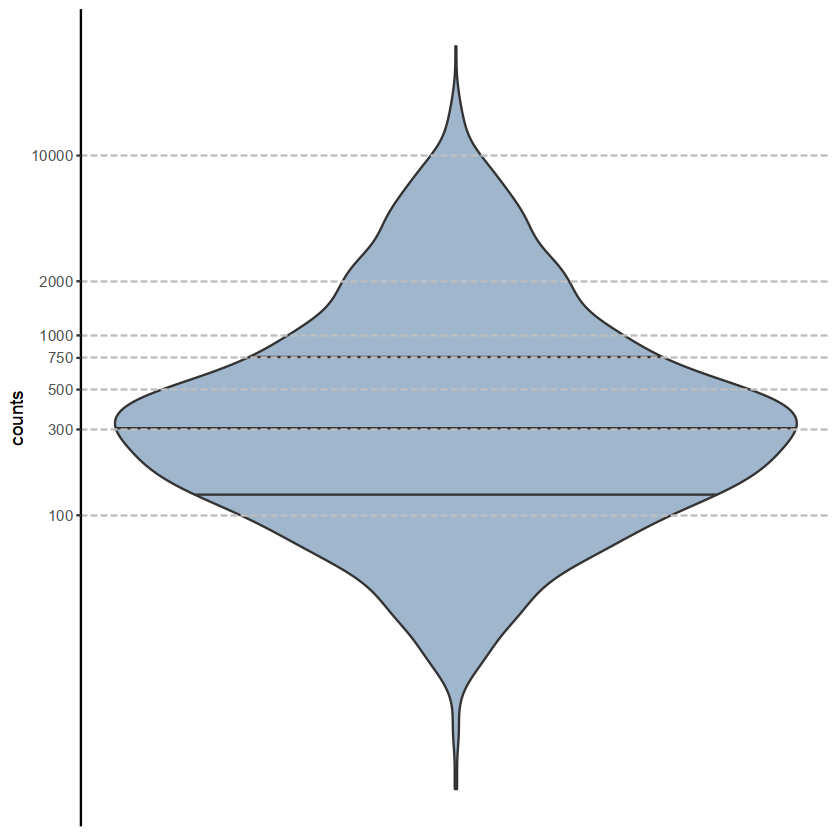

In [197]:
# Supp a

data.frame(counts=db_mat@cell_metadata[rownames(db_mat@cell_metadata) %in% neutrophil_pics &
                                       rownames(db_mat@cell_metadata) %in% alive_pics, 'total_counts']) %>%
    ggplot(aes(x=1, y=counts)) +
    geom_violin(fill='slategray3', draw_quantiles = c(0.25, 0.5, 0.75)) +
    #geom_jitter(alpha=0.2, color='slategray') +
    scale_y_log10(breaks=ticks) +
    geom_hline(yintercept = ticks, linetype='longdash', color='gray') +
    #geom_label(data = data.frame(n=ticks), aes(y=n, label=n)) +
    theme(axis.title.x = element_blank(), axis.line.x = element_blank(), axis.ticks.x = element_blank(), axis.text.x=element_blank())

ggsave("final_figs/supp4/umi_counts.pdf")

In [198]:
neutrophil_pics = intersect(db_mat@cells[db_mat@cells %in% cd45_neutrophil_pics | 
                                         db_mat@cell_metadata$Cell_type == "EPCAM-LY6G"],
                            alive_pics)

In [199]:
length(neutrophil_pics)

[1] 4397

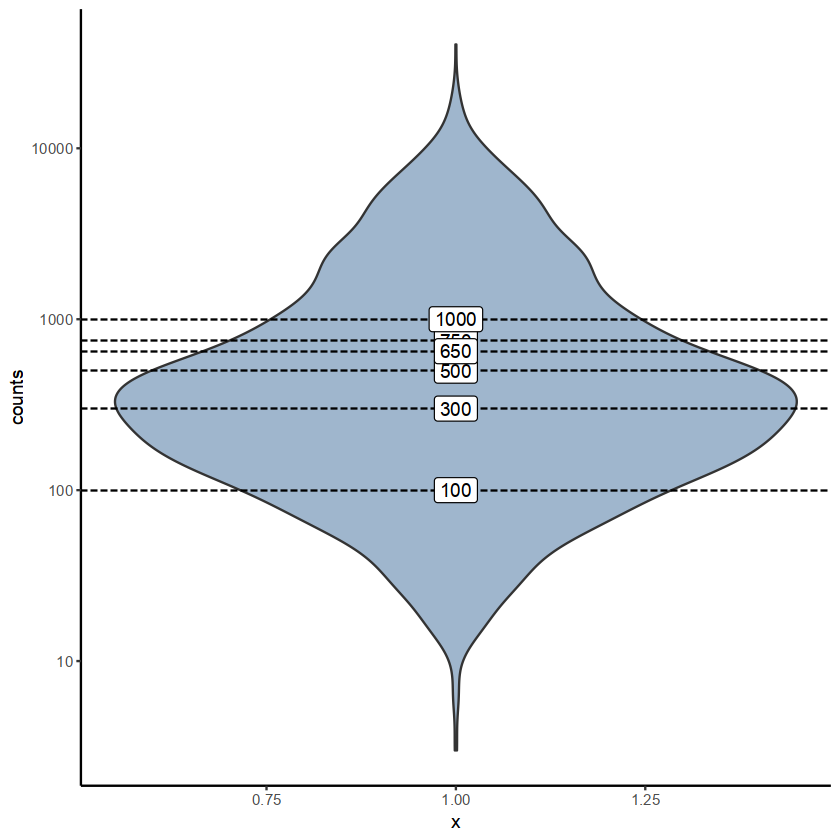

In [22]:
data.frame(counts=db_mat@cell_metadata[neutrophil_pics, 'total_counts']) %>%
    ggplot(aes(x=1, y=counts)) +
    geom_violin(fill='slategray3') +
    #geom_jitter(alpha=0.2, color='slategray') +
    scale_y_log10() +
    geom_hline(yintercept = c(100, 300, 500, 650, 750, 1000), linetype='longdash') +
    geom_label(data = data.frame(n=c(100, 300, 500, 750, 650, 1000)), aes(y=n, label=n))

In [23]:
mat2 = scm_sub_mat(db_mat, cells = neutrophil_pics)

In [24]:
mat2@cell_metadata$Cell_type %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       222       4175 

# PIC qc

In [25]:
nms = c(rownames(mat2@mat), rownames(mat2@ignore_gmat))

In [26]:
hb_genes = grep("^Hb[abdg]", nms, v=T)

In [27]:
cat(hb_genes, sep='", "')

Hba-a1", "Hba-a2", "Hba-ps4", "Hba-x", "Hbb-bh1", "Hbb-bh2", "Hbb-bs", "Hbb-bt", "Hbb-y

In [28]:
hb_gene_sums = colSums(mat2@mat[c("Hba-a1", "Hba-a2", "Hba-ps4", "Hba-x", "Hbb-bh1", "Hbb-bh2", "Hbb-bs", "Hbb-bt", "Hbb-y"),])
print(sum(hb_gene_sums > 0))
print(sum(hb_gene_sums > 1))
print(sum(hb_gene_sums > 2))
print(sum(hb_gene_sums > 3))
print(sum(hb_gene_sums > 4))
print(sum(hb_gene_sums > 5))
print(sum(hb_gene_sums > 6))
print(sum(hb_gene_sums > 7))
print(sum(hb_gene_sums > 8))
print(sum(hb_gene_sums > 9))
print(sum(hb_gene_sums > 10))

[1] 490
[1] 135
[1] 60
[1] 35
[1] 27
[1] 23
[1] 23
[1] 21
[1] 19
[1] 18
[1] 18


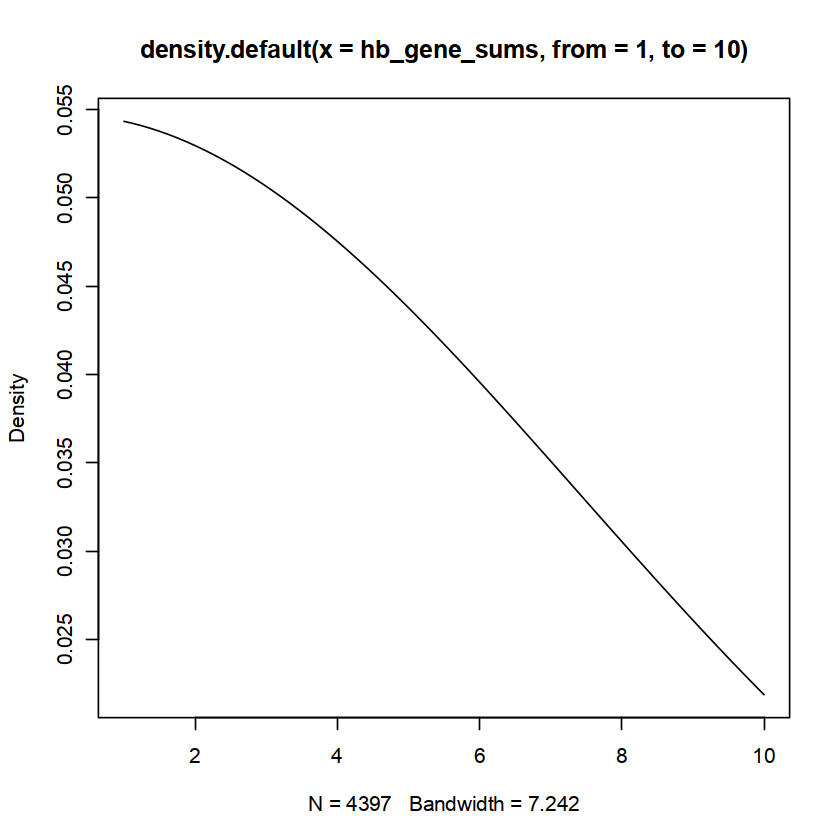

In [29]:
plot(density(hb_gene_sums, from=1, to = 10))

In [30]:
erythrocytes = names(which(hb_gene_sums > 3))

In [31]:
umis_per_cell =  colSums(mat2@mat)
mt_genes = unique(grep("^mt-", nms, v=T))
mt_percent = colSums(mat2@mat[mt_genes,]) / umis_per_cell
print(sum(mt_percent > 0.0))
print(sum(mt_percent > 0.1))
print(sum(mt_percent > 0.2))
print(sum(mt_percent > 0.3))
print(sum(mt_percent > 0.4))
print(sum(mt_percent > 0.5))
print(sum(mt_percent > 0.6))
print(sum(mt_percent > 0.7))
print(sum(mt_percent > 0.8))
print(sum(mt_percent > 0.9))

[1] 4379
[1] 3094
[1] 1058
[1] 0
[1] 0
[1] 0
[1] 0
[1] 0
[1] 0
[1] 0


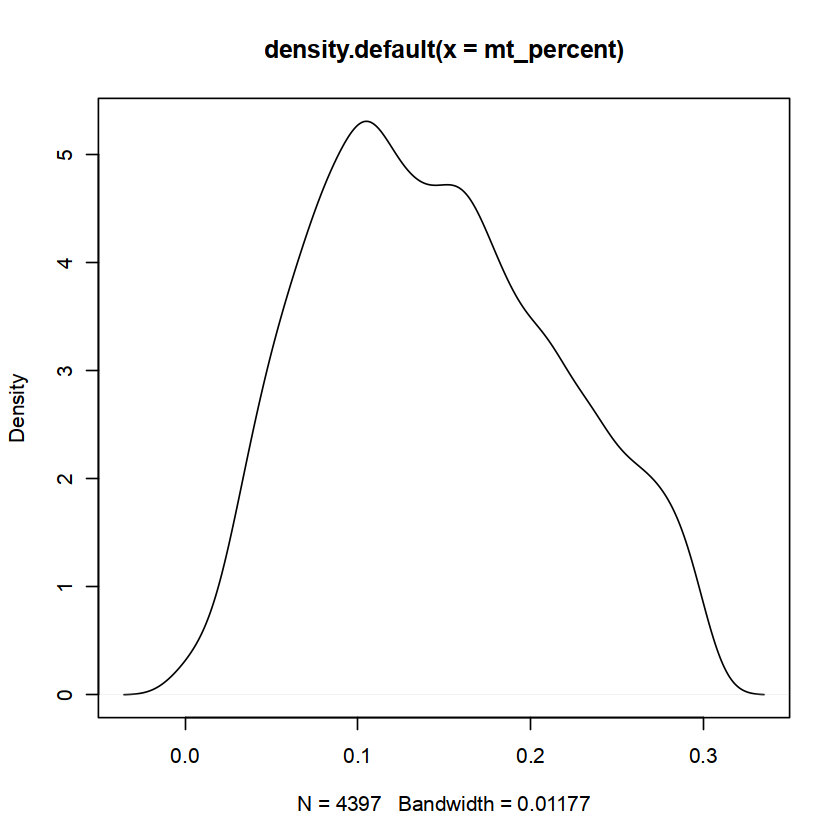

In [32]:
plot(density(mt_percent))

In [33]:
dead_cells = names(which(mt_percent > 0.3))

In [34]:
ig_genes = grep("^Ig[hk]", nms, v=T)

In [35]:
cat(ig_genes, sep='", "')

Igha", "Ighd", "Ighd4-1", "Ighe", "Ighg1", "Ighg2b", "Ighg2c", "Ighg3", "Ighj1", "Ighj2", "Ighj3", "Ighj4", "Ighm", "Ighmbp2", "Ighv1-14", "Ighv1-19", "Ighv1-25", "Ighv1-26", "Ighv1-27", "Ighv1-30", "Ighv1-33", "Ighv1-34", "Ighv1-36", "Ighv1-39", "Ighv1-4", "Ighv1-42", "Ighv1-50", "Ighv1-52", "Ighv1-54", "Ighv1-55", "Ighv1-56", "Ighv1-59", "Ighv1-63", "Ighv1-64", "Ighv1-66", "Ighv1-69", "Ighv1-70", "Ighv1-74", "Ighv1-78", "Ighv1-79", "Ighv1-80", "Ighv1-81", "Ighv1-82", "Ighv1-83", "Ighv1-84", "Ighv1-9", "Ighv10-1", "Ighv10-3", "Ighv14-2", "Ighv14-3", "Ighv15-2", "Ighv2-2", "Ighv2-4", "Ighv2-6", "Ighv2-6-8", "Ighv2-7", "Ighv2-9-1", "Ighv3-1", "Ighv3-2", "Ighv3-3", "Ighv3-5", "Ighv3-6", "Ighv3-7", "Ighv3-8", "Ighv4-1", "Ighv4-2", "Ighv5-1", "Ighv5-12", "Ighv5-13", "Ighv5-15", "Ighv5-16", "Ighv5-17", "Ighv5-2", "Ighv5-8", "Ighv5-9", "Ighv5-9-1", "Ighv6-3", "Ighv6-4", "Ighv6-6", "Ighv8-10", "Ighv8-11", "Ighv8-12", "Ighv8-13", "Ighv8-2", "Ighv8-5", "Ighv8-6", "Ighv8-8", "Ighv9-1", "Ighv9-2"

In [36]:
ig_gene_sums = colSums(mat2@mat[ig_genes,])
print(sum(ig_gene_sums > 0))
print(sum(ig_gene_sums > 1))
print(sum(ig_gene_sums > 2))
print(sum(ig_gene_sums > 3))
print(sum(ig_gene_sums > 4))
print(sum(ig_gene_sums > 5))
print(sum(ig_gene_sums > 6))
print(sum(ig_gene_sums > 7))
print(sum(ig_gene_sums > 8))
print(sum(ig_gene_sums > 9))
print(sum(ig_gene_sums > 10))

[1] 202
[1] 45
[1] 31
[1] 23
[1] 16
[1] 16
[1] 11
[1] 9
[1] 6
[1] 4
[1] 3


In [37]:
ig_pics = names(which(ig_gene_sums > 1))

In [38]:
mat2@mat[c('Cd19', 'Cd79a', 'Ms4a1', ig_genes), ig_pics] %>% as.matrix %>% t

,Cd19,Cd79a,Ms4a1,Igha,Ighd,Ighd4-1,Ighe,Ighg1,Ighg2b,Ighg2c,⋯,Igkv8-18,Igkv8-19,Igkv8-21,Igkv8-24,Igkv8-26,Igkv8-28,Igkv8-30,Igkv9-120,Igkv9-123,Igkv9-124
AB522_A7,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB522_B22,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_C24,1,1,2,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_G22,0,0,1,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_A1,0,0,1,0,2,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_F6,0,0,0,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_O4,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_H20,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_K23,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB1201_I7,0,0,0,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [39]:
non_neutrophil_genes = c("C1qa", "C1qb", "C1qc", "Itgax", "Clec10a", "Mrc1", "H2-DMa", "Ly86", #"Apoe", "Plac8", "Tmem176b", 
                         "Cd3g", "Cd3e", "Cd3d", "Trbc2", "Trac", "Trdc", "Thy1", "Cd8b1", "Cd8a", "Cd4", "Tcf7", 
                         "Gzma", "Gzmb", "Nkg7",
                         "Cd19", "Cd79a", "Ms4a1")

In [40]:
cat(non_neutrophil_genes, sep=', ')

C1qa, C1qb, C1qc, Itgax, Clec10a, Mrc1, H2-DMa, Ly86, Cd3g, Cd3e, Cd3d, Trbc2, Trac, Trdc, Thy1, Cd8b1, Cd8a, Cd4, Tcf7, Gzma, Gzmb, Nkg7, Cd19, Cd79a, Ms4a1

In [41]:
non_neutrophil_genes = non_neutrophil_genes[non_neutrophil_genes %in% rownames(mat2@mat)]

In [42]:
non_neutrophil_gene_sums = colSums(mat2@mat[non_neutrophil_genes,])
print(sum(non_neutrophil_gene_sums > 0))
print(sum(non_neutrophil_gene_sums > 1))
print(sum(non_neutrophil_gene_sums > 2))
print(sum(non_neutrophil_gene_sums > 3))
print(sum(non_neutrophil_gene_sums > 4))
print(sum(non_neutrophil_gene_sums > 5))
print(sum(non_neutrophil_gene_sums > 6))
print(sum(non_neutrophil_gene_sums > 7))
print(sum(non_neutrophil_gene_sums > 8))
print(sum(non_neutrophil_gene_sums > 9))
print(sum(non_neutrophil_gene_sums > 10))

[1] 707
[1] 295
[1] 180
[1] 126
[1] 97
[1] 77
[1] 63
[1] 48
[1] 39
[1] 30
[1] 25


In [43]:
non_neutrophil_pics = names(which(non_neutrophil_gene_sums > 1))

In [44]:
mat2@mat[non_neutrophil_genes, non_neutrophil_pics] %>% as.matrix %>% t

,C1qa,C1qb,C1qc,Itgax,Clec10a,Mrc1,H2-DMa,Ly86,Cd3g,Cd3e,⋯,Cd8b1,Cd8a,Cd4,Tcf7,Gzma,Gzmb,Nkg7,Cd19,Cd79a,Ms4a1
AB539_D6,2,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB539_G1,0,3,0,0,0,0,0,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB522_M23,0,0,0,3,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB522_G16,0,0,0,4,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB522_F6,1,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB522_O14,0,0,0,2,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB522_E20,1,1,2,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB522_O20,0,0,0,2,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB523_H24,1,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
AB523_J7,0,0,0,2,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [45]:
endo_genes = c('Pecam1', 'Cdh5', 'Col4a1', 'Col4a2', 'Cd36', 'Cav1', 'Podxl', 'S1pr1', 'Ptprb')

In [46]:
cat(endo_genes, sep=', ')

Pecam1, Cdh5, Col4a1, Col4a2, Cd36, Cav1, Podxl, S1pr1, Ptprb

In [47]:
endo_gene_sums = colSums(mat2@mat[endo_genes,])
print(sum(endo_gene_sums > 0))
print(sum(endo_gene_sums > 1))
print(sum(endo_gene_sums > 2))
print(sum(endo_gene_sums > 3))
print(sum(endo_gene_sums > 4))
print(sum(endo_gene_sums > 5))
print(sum(endo_gene_sums > 6))
print(sum(endo_gene_sums > 7))
print(sum(endo_gene_sums > 8))
print(sum(endo_gene_sums > 9))
print(sum(endo_gene_sums > 10))

[1] 603
[1] 248
[1] 146
[1] 122
[1] 111
[1] 99
[1] 89
[1] 79
[1] 74
[1] 70
[1] 65


In [48]:
endo_pics = names(which(endo_gene_sums > 1))

In [49]:
mat2@mat[endo_genes, endo_pics] %>% as.matrix %>% t

,Pecam1,Cdh5,Col4a1,Col4a2,Cd36,Cav1,Podxl,S1pr1,Ptprb
AB539_C15,1,0,1,0,0,3,0,0,0
AB539_K3,0,0,0,2,0,0,0,0,0
AB522_A7,0,0,0,1,0,1,0,0,0
AB522_D16,1,0,1,1,0,0,0,0,1
AB522_K18,0,0,1,0,0,0,0,0,1
AB522_K13,0,0,0,2,0,0,0,0,0
AB522_H4,0,0,0,2,0,0,0,0,0
AB522_J6,0,0,1,1,0,0,0,0,0
AB522_J16,0,0,0,0,0,0,2,0,0
AB522_O1,0,1,1,0,0,0,0,0,0


In [52]:
small_cells = mat2@cells[mat2@cell_metadata$total_counts < 500]

In [56]:
bad_cells = endo_pics %>% union(non_neutrophil_pics) %>% union(dead_cells) %>% union(erythrocytes) %>% union(ig_pics)

In [57]:
message("endothelial UMIs - ", length(endo_pics))
message("erythrocytes UMIs - ", length(erythrocytes))
message("immunoglobulin UMIs - ", length(ig_pics))
message("other non-neutrophil UMIs - ", length(non_neutrophil_pics))
message("total - ", length(bad_cells))
message("<500 UMIs - ", length(small_cells))
bad_cells = bad_cells %>% union(small_cells)
message("total - ", length(bad_cells))

endothelial UMIs - 248

erythrocytes UMIs - 35

immunoglobulin UMIs - 45

other non-neutrophil UMIs - 295

total - 538

<500 UMIs - 2743

total - 3174



In [58]:
mat2@cell_metadata[bad_cells, 'Cell_type'] %>% table

.
EPCAM-CD45 EPCAM-LY6G 
        47       3127 

In [59]:
mat2@cell_metadata[setdiff(mat2@cells, bad_cells), 'Cell_type'] %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       175       1048 

In [63]:
175 + 1048 

[1] 1223

In [64]:
clean_mat = scm_sub_mat(db_mat, cells = setdiff(mat2@cells, bad_cells))

In [65]:
clean_mat

An object of class tgScMat, stat type umi.
1223 cells by 37508 genes. median cell content 1098.

In [66]:
scdb_add_mat('neutrophil_clean_pics', clean_mat)

# PIC-seq preprocessing

In [67]:
bad_genes = union(read_lines('annotations/kinetics_filtered_genes.txt'), 
                  read_lines('annotations/neutrophil_filtered_genes.txt'))

In [12]:
# Rerun

message("Loading singlets dataset:")
sc_mat = scdb_mat("merged_neutrophil_epithelial_mat")
message("Loaded a UMI matrix of ", sc_mat@ncells, " cells and ", sc_mat@ngenes, " genes.")
#sin_2d = scdb_mc2d("kinetics_2dproj")
sin_cl = scdb_mc("merged_neutrophil_epithelial_mc"); sin_mat = scdb_mat("merged_neutrophil_epithelial_mat")
lfp = log2(sin_cl@mc_fp)
message("Loaded a metacell object of ", length(sin_cl@mc), " singlets. Total of ", length(table(sin_cl@mc)), " metacells.")

message("Loading PIC dataset:")
db_mat = scdb_mat("neutrophil_clean_pics")
message("Loaded ", db_mat@ncells, " PICs")


Loading singlets dataset:

Loaded a UMI matrix of 13516 cells and 37023 genes.

Loaded a metacell object of 13516 singlets. Total of 317 metacells.

Loading PIC dataset:

Loaded 1223 PICs



In [13]:
sin_cl@annots = ifelse(sin_cl@annots == "Neut Myd88+", "TAN2", sin_cl@annots)

In [14]:
sin_cl@colors = ifelse(sin_cl@colors == "darkorchid", "#4eee94", sin_cl@colors)

In [15]:
db_mat@cell_metadata$Cell_type %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       175       1048 

In [16]:
#rerun
sin_cl@color_key <- data.frame(group=unique(sin_cl@annots), color=unique(sin_cl@colors))

In [17]:
#rerun
color_scheme = sin_cl@color_key
color2name = as.vector(color_scheme$group); names(color2name) = color_scheme$color
name2color = as.vector(color_scheme$color); names(name2color) = color_scheme$group
sin_names = color2name[ sin_cl@colors[ sin_cl@mc]]; names(sin_names) = names(sin_cl@mc)

In [18]:
cat(paste(1:length(unique(sin_cl@annots)), unique(sin_cl@annots), sep=" - "), sep="\n")

1 - Cystatin neut
2 - MHCII neut
3 - Neut Ptgs2+
4 - Young TAN
5 - Young neut
6 - TAN2
7 - TAN1
8 - Tumor cells
9 - Progenitor 1
10 - Alveolar
11 - Progenitor 2
12 - HS
13 - Basal
14 - MyoLum
15 - Myoepithelial


In [19]:
neutrophil_order = c(5, 1, 2, 3, 4, 7, 6)
epithelial_order = c(9, 11, 10, 12, 15, 13, 14, 8)

In [20]:
#rerun
order_index = c(neutrophil_order, epithelial_order)

In [21]:
#rerun
cell_order = unique(sin_cl@annots)[order_index]

In [22]:
unique(sin_cl@annots)[!unique(sin_cl@annots) %in% cell_order]

character(0)

In [14]:
cond_order = c("tumor", "normal")

In [15]:
age_order = c("10d", "3w", "6w", "8w", "10w", "12w")

In [25]:
age_dict = c(10, 3*7, 6*7, 8*7, 10*7, 12*7)
names(age_dict) = age_order

In [26]:
group.colors = unique(sin_cl@colors)[order_index]
names(group.colors) = cell_order

In [27]:
sin_stats = sc_mat@cell_metadata[names(sin_cl@mc),]

In [28]:
cat(cell_order, sep = '", "')

Young neut", "Cystatin neut", "MHCII neut", "Neut Ptgs2+", "Young TAN", "TAN1", "TAN2", "Progenitor 1", "Progenitor 2", "Alveolar", "HS", "Myoepithelial", "Basal", "MyoLum", "Tumor cells

In [29]:
#rerun
epithelial_pops = c("Progenitor 1", "Progenitor 2", "Alveolar", "HS", "Myoepithelial", "Basal", "MyoLum", "Tumor cells")
immune_pops = c("Young neut", "Cystatin neut", "MHCII neut", "Neut Ptgs2+", "Young TAN", "TAN1", "TAN2")

epithelial_mc = which(color2name[ sin_cl@colors] %in% epithelial_pops)
immune_mc = which(color2name[ sin_cl@colors] %in% immune_pops)
bad_mc = setdiff(names(table(sin_cl@mc)), union(epithelial_mc, immune_mc))

epithelial_cells = names(sin_names)[ sin_names %in% epithelial_pops]
immune_cells = names(sin_names)[ sin_names %in% immune_pops]

message(length(immune_cells), " immune cells and ", length(epithelial_cells), " epithelial cells")

1759 immune cells and 11757 epithelial cells



In [86]:
mcell_gset_from_mc_markers(gset_id="merged_neutrophil_epithelial_markers", mc_id="merged_neutrophil_epithelial_mc")

In [87]:
markers = names(scdb_gset('merged_neutrophil_epithelial_markers')@gene_set) # Set of features used for the Metacell clustering
bad_genes = union(grep("Gm[0-9].|Mir|-ps|Rpl|Rps|Jchain|Ftl1|Hsp|Rn18s-rs5|Actb|Tuba|Rik", sin_mat@genes, v=T),
                  union(read_lines('annotations/kinetics_filtered_genes.txt'), 
                        read_lines('annotations/neutrophil_filtered_genes.txt')))
markers = markers[!markers %in% bad_genes]

In [88]:
message("Choose features for the linear regression estimation of Alpha:")
lr_features = choose_lr_features(mat_id = "merged_neutrophil_epithelial_mat", 
                                 a_cells = epithelial_cells, 
                                 b_cells = immune_cells, 
                                 bad_genes=bad_genes, 
                                 cor_n=500, # was 500
                                 must_haves=markers)
message("Chose ", length(lr_features), " features")



Choose features for the linear regression estimation of Alpha:



In [ ]:
message("Choose features for the maximum likelihood estimation of the A and B metacells:")
mle_features = choose_mle_features(mc_id = "merged_neutrophil_epithelial_mat", 
                                   mat_id = "merged_neutrophil_epithelial_mat", 
                                   a_cells = epithelial_cells, 
                                   b_cells = immune_cells, 
                                   bad_genes= bad_genes, 
                                   nms_thresh=0.5, # was 1
                                   nms_per_clust=50, # was 20
                                   shared_thresh=10, # was 3
                                   existing_list = markers)
message("Chose ", length(mle_features), " features")

In [ ]:
any(mle_features == "Lcn2")

In [ ]:
any(mle_features == "Csf3r")

In [ ]:
#write.table(lr_features, quote=F, row.names=F, col.names=F, file = "annotations/neutrophil_lr_features.txt")
write.table(mle_features, quote=F, row.names=F, col.names=F, file = "annotations/neutrophil_mle_features.txt")

In [89]:
# Rerun
lr_features = read.table("annotations/neutrophil_lr_features.txt", h=F, stringsAsFactors = F)[[1]]
mle_features = read.table("annotations/neutrophil_mle_features.txt", h=F, stringsAsFactors = F)[[1]]

message("Chose ", length(lr_features), " features")
message("Chose ", length(mle_features), " features")

Chose 1060 features

Chose 2038 features



# Simulated PICs - for size threshold

In [90]:
k = 10000
numis = sample(100:1000, k, replace=T)

res = simulate_doublets(mat_id = "merged_neutrophil_epithelial_mat", 
                        a_cells = epithelial_cells, 
                        b_cells = immune_cells, 
                        k = k, 
                        numis = numis)

sim_umis = res$sim_umis; sim_info = res$info
head(sim_info)


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [100]:
sim_cells = names(which(colSums(sim_umis) == numis))
sim_umis = sim_umis[,sim_cells]; sim_info = sim_info[sim_cells,]
sim_alpha = sim_info$alpha.1; names(sim_alpha) = rownames(sim_info)


sim_mle_res = assign_pics_to_singlets(mc_id = "merged_neutrophil_epithelial_mc", 
                                      mat_id = "merged_neutrophil_epithelial_mat", 
                                      pic_umis = sim_umis, 
                                      a_cells = epithelial_cells, 
                                      b_cells = immune_cells, 
                                      alpha = sim_alpha,
                                      verbose=T, 
                                      bad_genes = bad_genes, 
                                      markers = mle_features, 
                                      reg = 1e-4)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
100%



In [101]:
sim_mle_res$alpha = sim_alpha

In [102]:
sim_mle_res$sin_alpha = with(sim_mle_res, round(alpha))
sim_mle_res$sin_ll = with(sim_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              sim_umis[,rownames(sim_mle_res)], a_mc, b_mc, sim_alpha, reg = 1e-4, 
                                              markers = mle_features))
sim_mle_res$diff = with(sim_mle_res, ll - sin_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [103]:
sim_mle_res$imm_ll = with(sim_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              sim_umis[,rownames(sim_mle_res)], a_mc, b_mc, 1, reg = 1e-4, 
                                              markers = mle_features))
sim_mle_res$imm_diff = with(sim_mle_res, ll - imm_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [104]:
sim_mle_res$epi_ll = with(sim_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              sim_umis[,rownames(sim_mle_res)], a_mc, b_mc, 0, reg = 1e-4, 
                                              markers = mle_features))
sim_mle_res$epi_diff = with(sim_mle_res, ll - epi_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [105]:
sim_mle_res$lower_diff = pmin(sim_mle_res$epi_diff, sim_mle_res$imm_diff)

In [106]:
scdb_add_mat("neutrophil_simpic_sizevar", sim_umis)

In [107]:
write.table(sim_info, sep = "\t", quote=F, col.names=NA, file = "annotations/neutrophil_sim_info_varsizes.txt")
write.table(sim_mle_res, sep = "\t", quote=F, col.names=NA, file = "annotations/neutrophil_sim_mle_res_varsizes.txt")

In [108]:
#Rerun
sim_info = read.delim("annotations/neutrophil_sim_info_varsizes.txt", row.names = 1)
sim_mle_res = read.delim("annotations/neutrophil_sim_mle_res_varsizes.txt", row.names = 1)

In [109]:
sim_umis = scdb_mat("neutrophil_simpic_sizevar")

In [110]:
sim_umis = sim_umis[,rownames(sim_info)]

100

150

200

250

300

350

400

450

500

550

600

650

700

750

800

850

900

950

`geom_smooth()` using formula = 'y ~ x'
Saving 6.67 x 6.67 in image
`geom_smooth()` using formula = 'y ~ x'


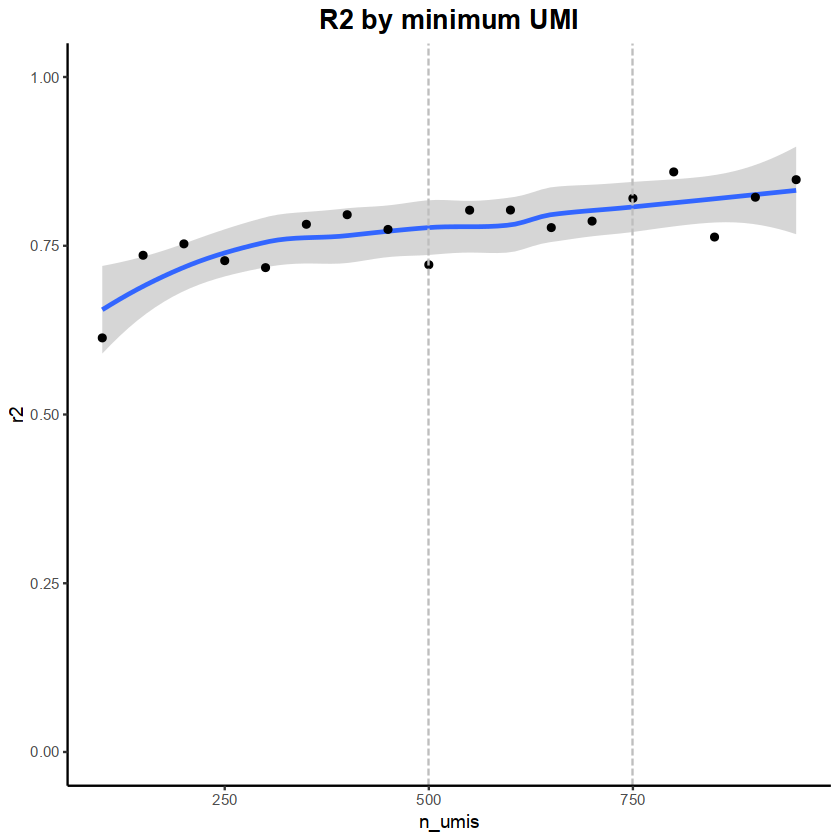

In [111]:
sim_sizes = colSums(sim_umis)

df = data.frame(size=seq(100, 999, 50), r2=NA) %>% column_to_rownames('size')

for (x in seq(100, 999, 50)){
    message(x)
    rel_cells = names(sim_sizes)[sim_sizes >= x & sim_sizes < (x + 50)]
    alpha_fit = estimate_mixing(sim_umis = sim_umis[,rel_cells], 
                                alpha = sim_info[rel_cells,'alpha.1'], 
                                genes = lr_features, 
                                fname = "./temp.pdf",
                                sim_sizes[rel_cells],
                                normalize = T)
    alpha_tag = predict(alpha_fit, newx = t(sim_umis[lr_features,]), s = "lambda.min")[,1]
    i = which(alpha_fit$lambda == alpha_fit$lambda.min)
    r2 = round(1 - alpha_fit$cvm[i] / var(sim_info[rel_cells,'alpha.1']),4)    
    df[as.character(x),'r2'] = r2
}

df %>%
    drop_na %>%
    rownames_to_column('n_umis') %>%
    mutate(n_umis=as.numeric(n_umis)) %>%
    #melt(id.vars = 'n_umis', variable.name = 'population', value.name = 'pct_correct') %>%
    ggplot(aes(x=n_umis, y=r2)) +
    geom_smooth(method='loess', show.legend = F) +
    #scale_color_manual(values=c('springgreen4', 'orangered3')) +
    geom_point() +
    geom_vline(xintercept = c(500, 750), color='gray', linetype='longdash') +
    scale_y_continuous(limits = c(0,1)) +
    labs(title = 'R2 by minimum UMI') +
    theme(plot.title = element_text(size=16, hjust = 0.5, face = 'bold'))

ggsave("final_figs/supp4/r2_bysize.pdf")

`geom_smooth()` using formula = 'y ~ x'
Saving 6.67 x 6.67 in image
`geom_smooth()` using formula = 'y ~ x'


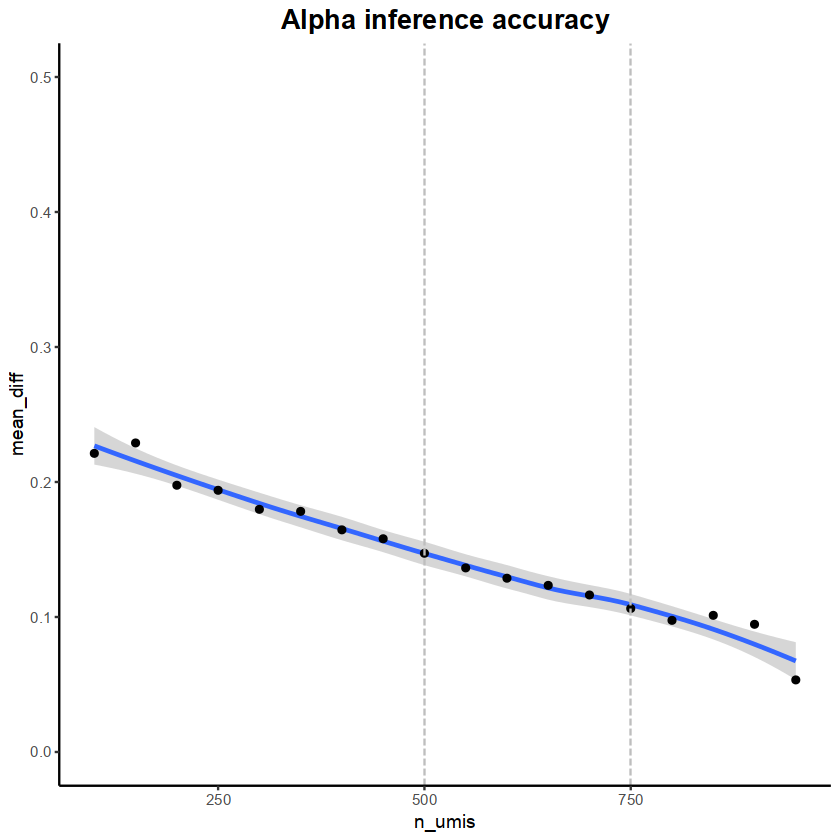

In [112]:
sim_sizes = colSums(sim_umis)

df = data.frame(size=seq(100, 999, 50), mean_diff=NA) %>% column_to_rownames('size')

for (x in seq(100, 999, 50)){
    rel_cells = names(sim_sizes)[sim_sizes >= x & sim_sizes < (x + 50)]
    df[as.character(x),'mean_diff'] = mean(abs(sim_info[rel_cells, 'alpha.1'] - alpha_tag[rel_cells]))
}

df %>%
    drop_na %>%
    rownames_to_column('n_umis') %>%
    mutate(n_umis=as.numeric(n_umis)) %>%
    #melt(id.vars = 'n_umis', variable.name = 'population', value.name = 'pct_correct') %>%
    ggplot(aes(x=n_umis, y=mean_diff)) +
    geom_smooth(method='loess', show.legend = F) +
    #scale_color_manual(values=c('springgreen4', 'orangered3')) +
    geom_point() +
    geom_vline(xintercept = c(500, 750), color='gray', linetype='longdash') +
    scale_y_continuous(limits = c(0,0.5)) +
    labs(title = 'Alpha inference accuracy') +
    theme(plot.title = element_text(size=16, hjust = 0.5, face = 'bold'))

ggsave("final_figs/supp4/alpha_inference_bysize.pdf")

`geom_smooth()` using formula = 'y ~ x'
Saving 6.67 x 6.67 in image
`geom_smooth()` using formula = 'y ~ x'


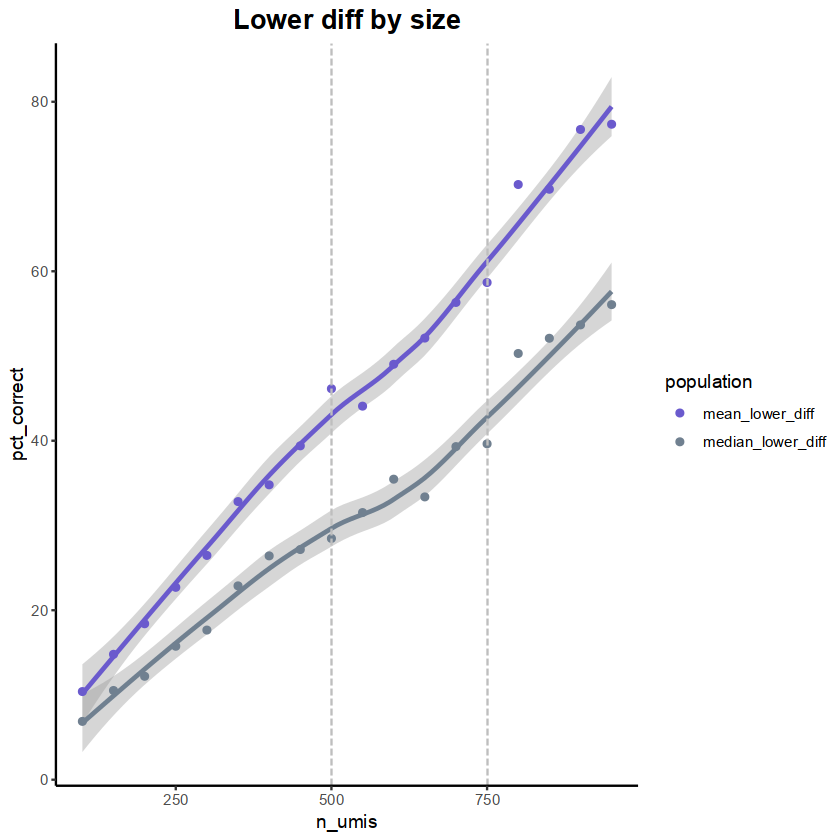

In [113]:
sim_sizes = colSums(sim_umis)

df = data.frame(size=seq(100, 999, 50), mean_lower_diff=NA, median_lower_diff=NA) %>% column_to_rownames('size')

for (x in seq(100, 999, 50)){
    rel_cells = names(sim_sizes)[sim_sizes >= x & sim_sizes < (x + 50)]
    if (length(rel_cells) > 50){
        df[as.character(x),'mean_lower_diff'] = mean(sim_mle_res[rel_cells, 'lower_diff'])
        df[as.character(x),'median_lower_diff'] = median(sim_mle_res[rel_cells, 'lower_diff'])
    }
}

df %>%
    drop_na %>%
    rownames_to_column('n_umis') %>%
    mutate(n_umis=as.numeric(n_umis)) %>%
    melt(id.vars = 'n_umis', variable.name = 'population', value.name = 'pct_correct') %>%
    ggplot(aes(x=n_umis, y=pct_correct, color=population, group=population)) +
    geom_smooth(method='loess', show.legend = F) +
    scale_color_manual(values=c('slateblue', 'slategray')) +
    geom_point() +
    geom_vline(xintercept = c(500, 750), color='gray', linetype='longdash') +
    #scale_y_continuous(limits = c(0,1)) +
    labs(title = 'Lower diff by size') +
    theme(plot.title = element_text(size=16, hjust = 0.5, face = 'bold'))

ggsave("final_figs/supp4/lowerdiff_bysize.pdf")

`geom_smooth()` using formula = 'y ~ x'
Saving 6.67 x 6.67 in image
`geom_smooth()` using formula = 'y ~ x'


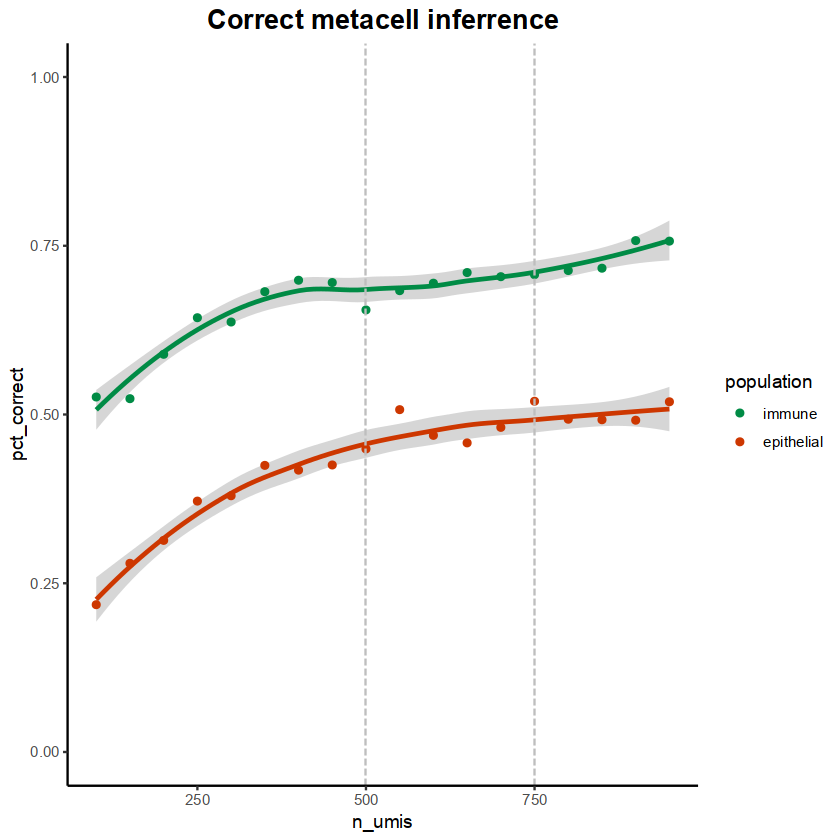

In [114]:
sim_sizes = colSums(sim_umis)

df = data.frame(size=seq(100, 999, 50), immune=NA, epithelial=NA) %>% column_to_rownames('size')

for (x in seq(100, 999, 50)){
    rel_cells = names(sim_sizes)[sim_sizes >= x & sim_sizes < (x + 50)]
    if (length(rel_cells) > 10){
        df[as.character(x),'epithelial'] = sum(sin_cl@mc[sim_info[rel_cells, 'sim.1']] == sim_mle_res[rel_cells, 'a_mc']) / length(rel_cells)
        df[as.character(x),'immune'] = sum(sin_cl@mc[sim_info[rel_cells, 'sim.2']] == sim_mle_res[rel_cells, 'b_mc']) / length(rel_cells)
    }
}

df %>%
    drop_na %>%
    rownames_to_column('n_umis') %>%
    mutate(n_umis=as.numeric(n_umis)) %>%
    melt(id.vars = 'n_umis', variable.name = 'population', value.name = 'pct_correct') %>%
    ggplot(aes(x=n_umis, y=pct_correct, color=population, group=population)) +
    geom_smooth(method='loess', show.legend = F) +
    scale_color_manual(values=c('springgreen4', 'orangered3')) +
    geom_point() +
    geom_vline(xintercept = c(500, 750), color='gray', linetype='longdash') +
    scale_y_continuous(limits = c(0,1)) +
    labs(title = 'Correct metacell inferrence') +
    theme(plot.title = element_text(size=16, hjust = 0.5, face = 'bold'))

ggsave("final_figs/supp4/mc_inference_bysize.pdf")

`geom_smooth()` using formula = 'y ~ x'
Saving 6.67 x 6.67 in image
`geom_smooth()` using formula = 'y ~ x'


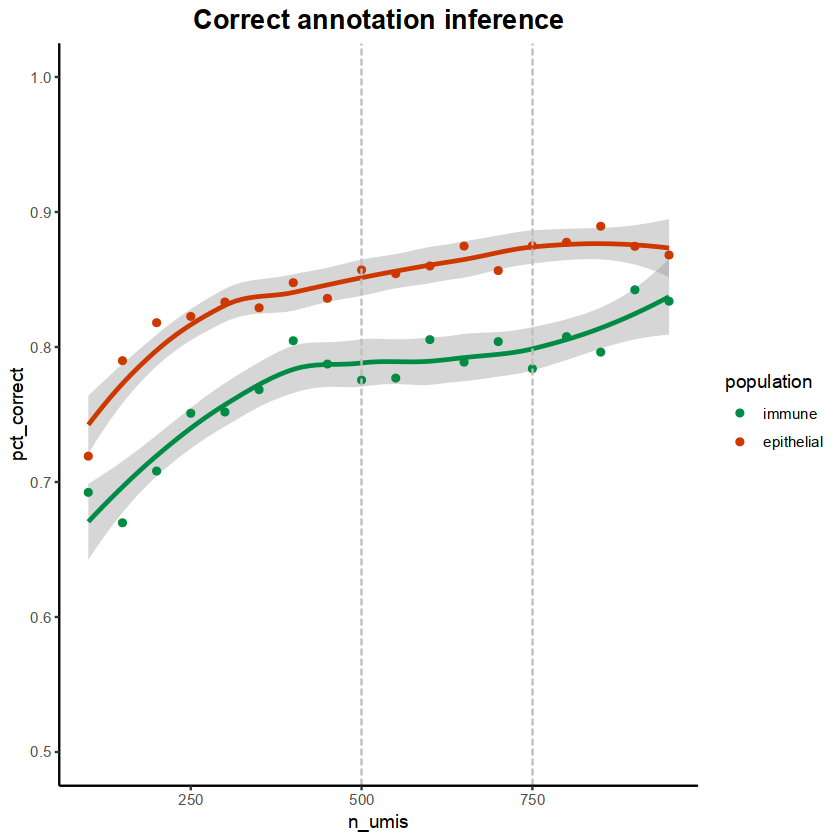

In [115]:
sim_sizes = colSums(sim_umis)

df = data.frame(size=seq(100, 999, 50), immune=NA, epithelial=NA) %>% column_to_rownames('size')

for (x in seq(100, 999, 50)){
    rel_cells = names(sim_sizes)[sim_sizes >= x & sim_sizes < (x + 50)]
    if (length(rel_cells) > 10){
        df[as.character(x),'epithelial'] = sum(sin_cl@annots[sin_cl@mc[sim_info[rel_cells, 'sim.1']]] == sin_cl@annots[sim_mle_res[rel_cells, 'a_mc']]) / length(rel_cells)
        df[as.character(x),'immune'] = sum(sin_cl@annots[sin_cl@mc[sim_info[rel_cells, 'sim.2']]] == sin_cl@annots[sim_mle_res[rel_cells, 'b_mc']]) / length(rel_cells)
    }
}

df %>%
    drop_na %>%
    rownames_to_column('n_umis') %>%
    mutate(n_umis=as.numeric(n_umis)) %>%
    melt(id.vars = 'n_umis', variable.name = 'population', value.name = 'pct_correct') %>%
    ggplot(aes(x=n_umis, y=pct_correct, color=population, group=population)) +
    geom_smooth(method='loess', show.legend = F) +
    scale_color_manual(values=c('springgreen4', 'orangered3')) +
    geom_point() +
    geom_vline(xintercept = c(500, 750), color='gray', linetype='longdash') +
    scale_y_continuous(limits = c(0.5,1)) +
    labs(title = 'Correct annotation inference') +
    theme(plot.title = element_text(size=16, hjust = 0.5, face = 'bold'))

ggsave("final_figs/supp4/annot_inference_bysize.pdf")

In [116]:
pic_sizes = colSums(db_mat@mat)

In [117]:
pic_sizes = pic_sizes[pic_sizes >= 100]

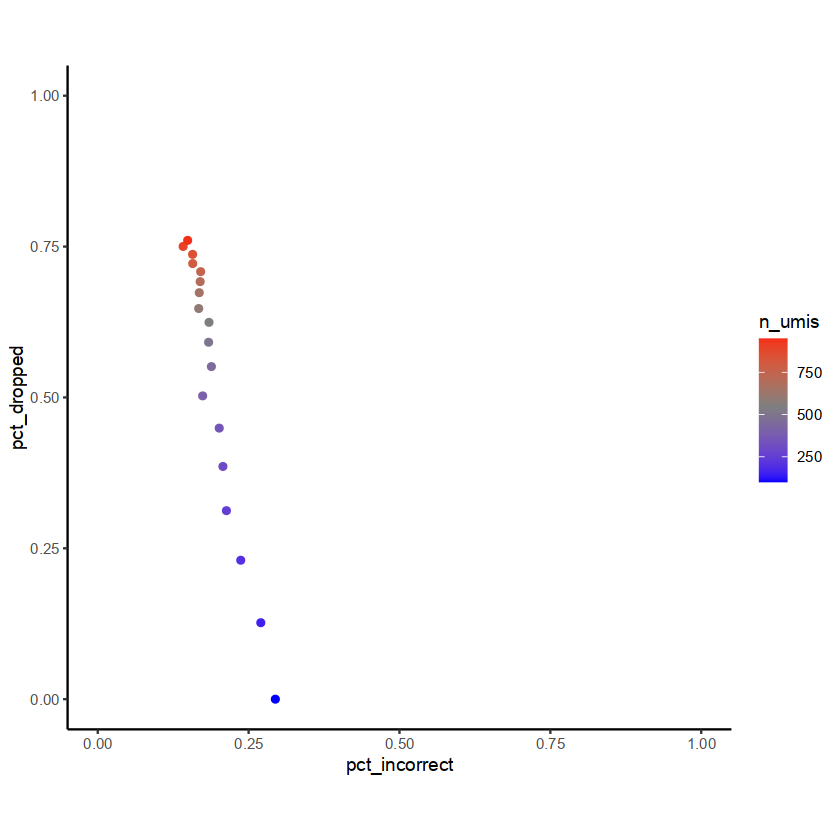

In [118]:
df %>% 
    mutate(pct_incorrect = 1-rowMeans(.)) %>%
    mutate(pct_dropped=sapply(as.numeric(rownames(.)), function(x){sum(pic_sizes < x) / length(pic_sizes)})) %>%
    rownames_to_column('n_umis') %>% 
    mutate(n_umis=as.numeric(n_umis)) %>%
ggplot(aes(y=pct_dropped, x=pct_incorrect, color=n_umis)) +
    #geom_smooth(method = 'lm', color='black', se=F) +
    geom_point() +
    scale_color_gradient2(low = 'blue', mid = 'gray50', high = 'red', midpoint = 550) +
    scale_x_continuous(limits = c(0, 1)) +
    scale_y_continuous(limits = c(0, 1)) +
    coord_fixed()

Warning message:
“attributes are not identical across measure variables; they will be dropped”


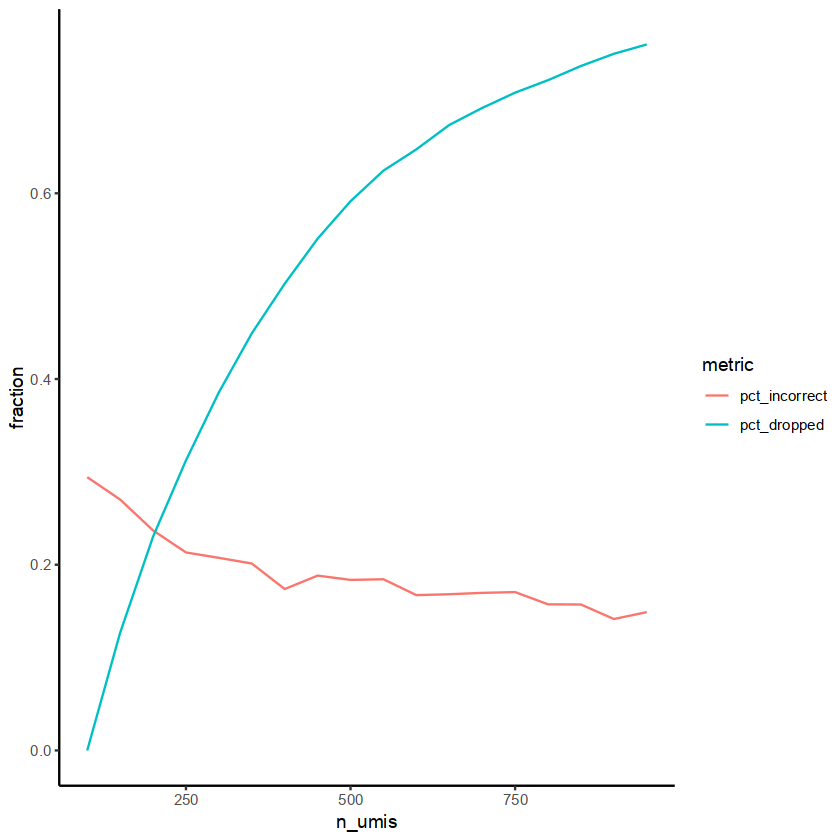

In [119]:
df %>% 
    mutate(pct_incorrect = 1-rowMeans(.)) %>%
    mutate(pct_dropped=sapply(as.numeric(rownames(.)), function(x){sum(pic_sizes < x) / length(pic_sizes)})) %>%
    rownames_to_column('n_umis') %>% 
    mutate(n_umis=as.numeric(n_umis)) %>%
    select(n_umis, pct_incorrect, pct_dropped) %>% 
    melt(id.vars = 'n_umis', variable.name = 'metric', value.name = 'fraction') %>%
ggplot(aes(x=n_umis,y=fraction, color=metric)) +
    #geom_smooth(method = 'lm', color='black', se=F) +
    geom_line()

# Simulated PICs - for QC

simulate_doublets = function(mat_id, a_cells, b_cells, k, numis = 1000, inflation=50, sim_genes=NA){
    cells = union(a_cells, b_cells)
    umis = read_large_umis(mat_id, cells = cells)
    if (is.na(sim_genes)){
        sim_genes = rownames(umis)
    }
    alpha = runif(k)
    numis_a = round(alpha * numis)
    numis_b = numis - numis_a
    sim_cells_a = sample(a_cells, size = k, replace = T)
    sim_cells_b = sample(b_cells, size = k, replace = T)
    a_umis = .downsamp_var(umis[sim_genes,sim_cells_a] * inflation, numis_a, replace=F)
    colnames(a_umis) = paste0("Sim", 1:k)
    b_umis = .downsamp_var(umis[sim_genes,sim_cells_b] * inflation, numis_b, replace=F)
    colnames(b_umis) = paste0("Sim", 1:k)
    simpic_umis = a_umis + b_umis
    list(sim_umis = simpic_umis, info = data.frame(sim.1=sim_cells_a, 
                                                   sim.2=sim_cells_b, 
                                                   alpha.1=alpha, 
                                                   alpha.2=1-alpha, 
                                                   row.names = paste0("Sim", 1:k)))
}

In [92]:
numis = 500; k = 10000
res = simulate_doublets(mat_id = "merged_neutrophil_epithelial_mat", 
                        a_cells = epithelial_cells, 
                        b_cells = immune_cells, 
                        k = k, 
                        numis = rep(numis, k))

sim_umis = res$sim_umis; sim_info = res$info
head(sim_info)


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


,sim.1,sim.2,alpha.1,alpha.2
,<chr>,<chr>,<dbl>,<dbl>
Sim1,AB126_M21,AB525_I13,0.1414232,0.8585768
Sim2,AB400_B18,AB1302_A13,0.9700319,0.0299681
Sim3,AB127_G1,AB526_G21,0.7966840,0.2033160
Sim4,AB401_M22,AB396_D6,0.6035018,0.3964982
Sim5,AB149_G18,AB1209_J20,0.1434431,0.8565569
Sim6,AB394_L13,AB1209_J18,0.8971520,0.1028480


In [93]:
sim_cells = names(which(colSums(sim_umis) == numis))
sim_umis = sim_umis[,sim_cells]; sim_info = sim_info[sim_cells,]
sim_alpha = sim_info$alpha.1; names(sim_alpha) = rownames(sim_info)


sim_mle_res = assign_pics_to_singlets(mc_id = "merged_neutrophil_epithelial_mc", 
                                      mat_id = "merged_neutrophil_epithelial_mat", 
                                      pic_umis = sim_umis, 
                                      a_cells = epithelial_cells, 
                                      b_cells = immune_cells, 
                                      alpha = sim_alpha,
                                      verbose=T, 
                                      bad_genes = bad_genes, 
                                      markers = mle_features, 
                                      reg = 1e-4)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
100%



In [94]:
sim_mle_res$alpha = sim_alpha

In [95]:
sim_mle_res$sin_alpha = with(sim_mle_res, round(alpha))
sim_mle_res$sin_ll = with(sim_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              sim_umis[,rownames(sim_mle_res)], a_mc, b_mc, sim_alpha, reg = 1e-4, 
                                              markers = mle_features))
sim_mle_res$diff = with(sim_mle_res, ll - sin_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [96]:
sim_mle_res$imm_ll = with(sim_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              sim_umis[,rownames(sim_mle_res)], a_mc, b_mc, 1, reg = 1e-4, 
                                              markers = mle_features))
sim_mle_res$imm_diff = with(sim_mle_res, ll - imm_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [97]:
sim_mle_res$epi_ll = with(sim_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              sim_umis[,rownames(sim_mle_res)], a_mc, b_mc, 0, reg = 1e-4, 
                                              markers = mle_features))
sim_mle_res$epi_diff = with(sim_mle_res, ll - epi_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [98]:
sim_mle_res$lower_diff = pmin(sim_mle_res$epi_diff, sim_mle_res$imm_diff)

In [99]:
write.table(sim_info, sep = "\t", quote=F, col.names=NA, file = "annotations/neutrophil_sim_info_final.txt")
write.table(sim_mle_res, sep = "\t", quote=F, col.names=NA, file = "annotations/neutrophil_sim_mle_res_final.txt")

In [100]:
#Rerun
sim_info = read.delim("annotations/neutrophil_sim_info_final.txt", row.names = 1)
sim_mle_res = read.delim("annotations/neutrophil_sim_mle_res_final.txt", row.names = 1)

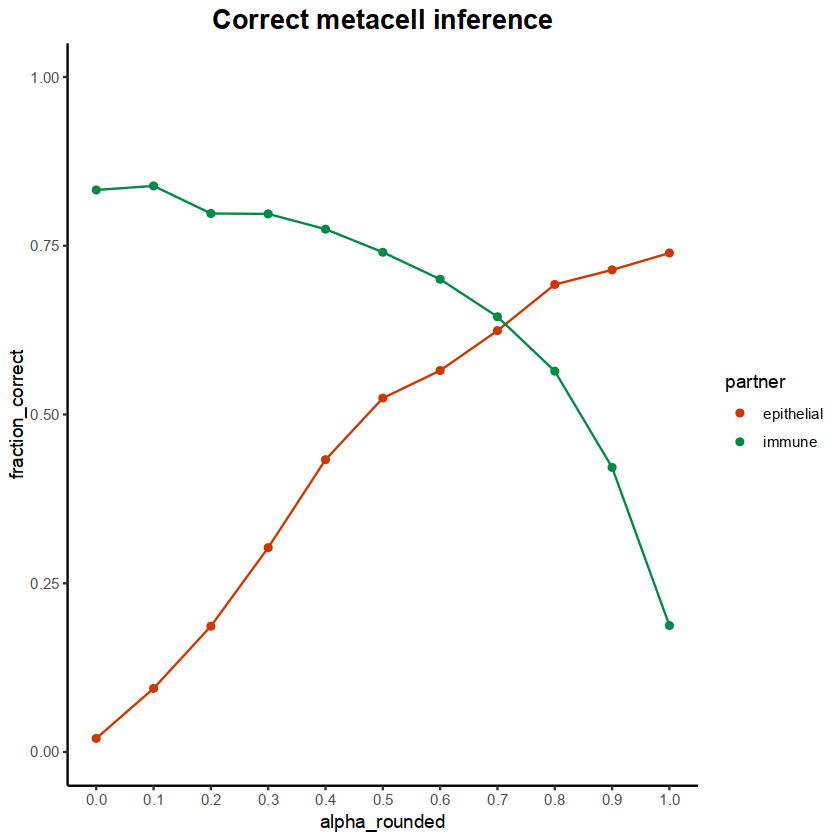

In [101]:
data.frame(alpha_rounded=round(sim_info$alpha.1, 1),
           correct_epithelial=sin_cl@mc[sim_info$sim.1] == sim_mle_res$a_mc,
           correct_immune=sin_cl@mc[sim_info$sim.2] == sim_mle_res$b_mc) %>%
    group_by(alpha_rounded) %>%
    summarise(epithelial = sum(correct_epithelial) / n(), immune = sum(correct_immune) / n()) %>%
    melt(id.vars = 'alpha_rounded', variable.name = 'partner', value.name = 'fraction_correct') %>%
    ggplot(aes(x=alpha_rounded, color=partner, y=fraction_correct, groups=partner)) +
    geom_point() +
    geom_line(show.legend = F) +
    scale_color_manual(values=c('orangered3', 'springgreen4')) +
    scale_y_continuous(limits = c(0,1)) +
    scale_x_continuous(breaks = seq(0,1,0.1)) +
    labs(title = 'Correct metacell inference') +
    theme(plot.title = element_text(size=16, hjust = 0.5, face = 'bold'))


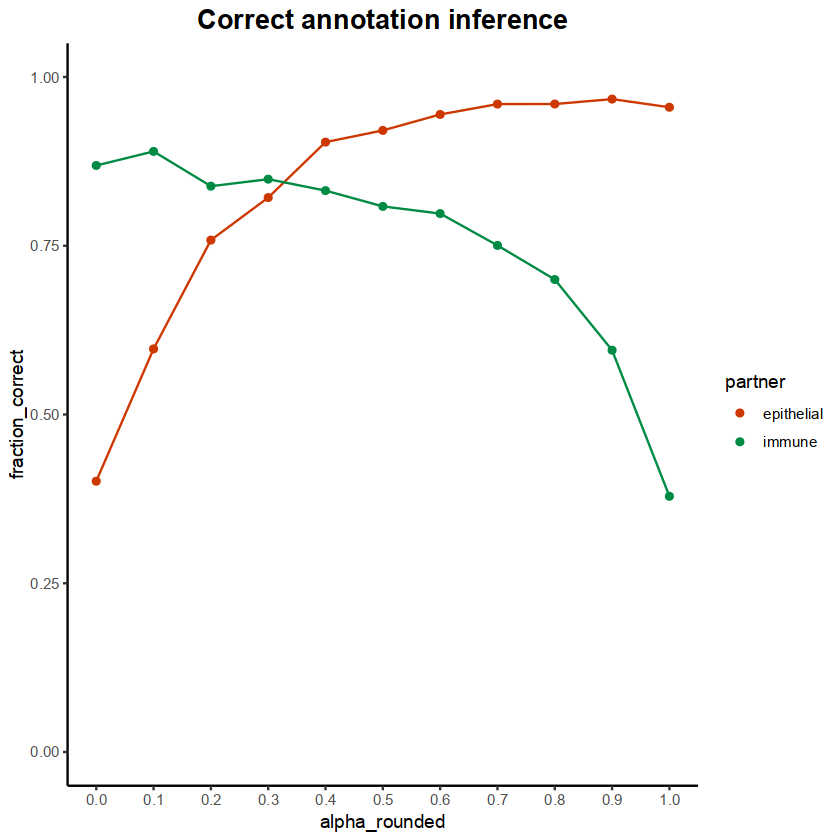

In [519]:
data.frame(alpha_rounded=round(sim_info$alpha.1, 1),
           correct_epithelial=sin_cl@annots[sin_cl@mc[sim_info$sim.1]] == sin_cl@annots[sim_mle_res$a_mc],
           correct_immune=sin_cl@annots[sin_cl@mc[sim_info$sim.2]] == sin_cl@annots[sim_mle_res$b_mc]) %>%
    group_by(alpha_rounded) %>%
    summarise(epithelial = sum(correct_epithelial) / n(), immune = sum(correct_immune) / n()) %>%
    melt(id.vars = 'alpha_rounded', variable.name = 'partner', value.name = 'fraction_correct') %>%
    ggplot(aes(x=alpha_rounded, color=partner, y=fraction_correct, groups=partner)) +
    geom_point() +
    geom_line(show.legend = F) +
    scale_color_manual(values=c('orangered3', 'springgreen4')) +
    scale_y_continuous(limits = c(0,1)) +
    scale_x_continuous(breaks = seq(0,1,0.1)) +
    labs(title = 'Correct annotation inference') +
    theme(plot.title = element_text(size=16, hjust = 0.5, face = 'bold'))


In [474]:
epithelial_confu = table(sin_cl@mc[ as.vector( sim_info$sim.1)], sim_mle_res$a_mc)
epithelial_n = epithelial_confu / rowSums(epithelial_confu)
immune_confu = table(sin_cl@mc[ as.vector( sim_info$sim.2)], sim_mle_res$b_mc)
immune_n = immune_confu / rowSums(immune_confu)

zlim: 0<>1



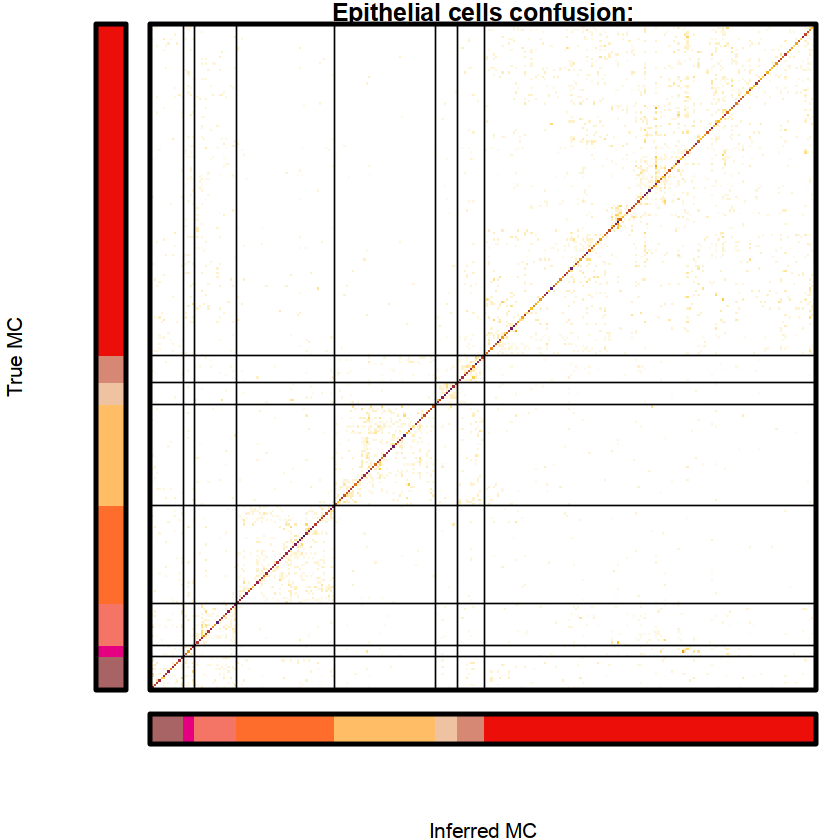

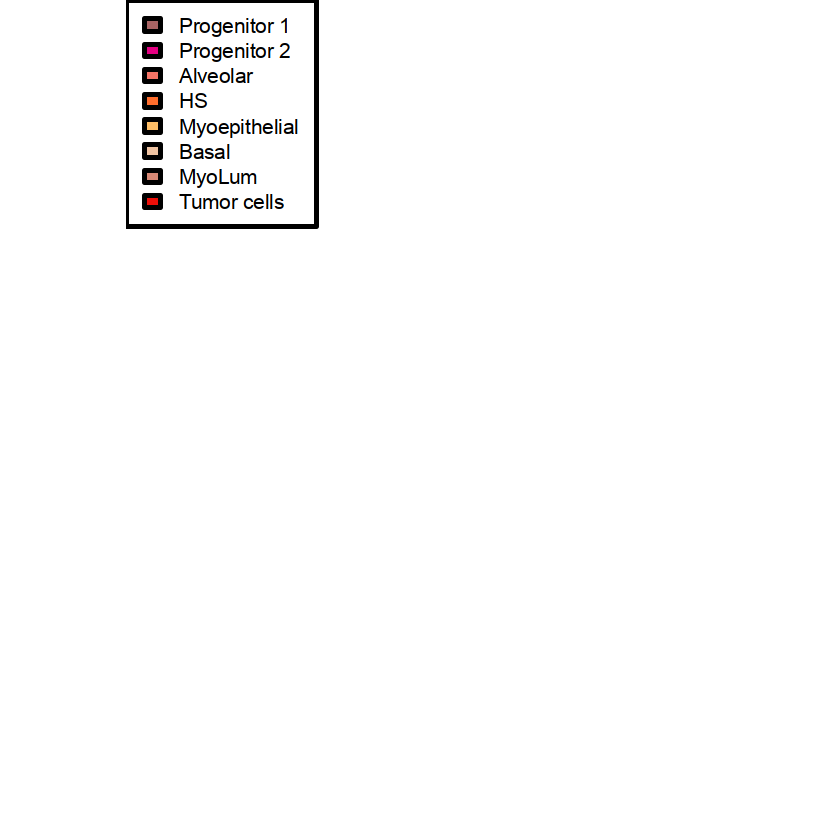

In [495]:
grad = colorRampPalette(c("white", "#FDC51D", "#CA531C", "#951851", "#36277A", "black"))(1000)
epithelial_cls = factor(color2name[ sin_cl@colors[ as.numeric(rownames(epithelial_n))]], levels = cell_order)
par(mar = rep(1,4), lwd = 3, fig = c(0.15,1,0.15,1))
image.2(epithelial_n, zlim = c(0,1), col = grad, annotate = "none", hct = epithelial_cls, vct = epithelial_cls); box()
title("Epithelial cells confusion:")
par(fig = c(0.15,1,0,0.15), mar = c(4,1,0,1), new = T)
image(matrix(seq_along(epithelial_cls)), axes = F, col = name2color[ as.vector(sort(epithelial_cls))], xlab = "Inferred MC"); box()
par(fig = c(0,0.15,0.15,1), mar = c(1,4,1,0), new = T)
image(t(seq_along(epithelial_cls)), axes = F, col = name2color[ as.vector(sort(epithelial_cls))], ylab = "True MC"); box()
par(mar = rep(0,4), fig = c(0.15,1,0.15,1))
plot(NULL ,xaxt='n',yaxt='n',bty='n',ylab='',xlab='', xlim=0:1, ylim=0:1)
legend(x="topleft",
       legend=epithelial_pops,
       fill=group.colors[epithelial_pops],
       xpd = TRUE
       )

In [496]:
png("final_figs/supp4/epithelial_confusion.png", width = 2000, height = 2000)
par(mar = rep(1,4), lwd = 3, fig = c(0.05,1,0.05,1))
image.2(epithelial_n, zlim = c(0,1), col = grad, annotate = "none", hct = epithelial_cls, vct = epithelial_cls); box()
#title("Epithelial cells confusion:")
par(fig = c(0.05,1,0,0.05), mar = c(4,1,0,1), new = T)
image(matrix(seq_along(epithelial_cls)), axes = F, col = name2color[ as.vector(sort(epithelial_cls))], xlab = "Inferred MC"); box()
par(fig = c(0,0.05,0.05,1), mar = c(1,4,1,0), new = T)
image(t(seq_along(epithelial_cls)), axes = F, col = name2color[ as.vector(sort(epithelial_cls))], ylab = "True MC"); box()
dev.off()

zlim: 0<>1



png 
  2

In [497]:
cell_order

[1] "Young neut"    "Cystatin neut" "MHCII neut"    "Neut Ptgs2+"  
 [5] "Young TAN"     "TAN1"          "TAN2"          "Progenitor 1" 
 [9] "Progenitor 2"  "Alveolar"      "HS"            "Myoepithelial"
[13] "Basal"         "MyoLum"        "Tumor cells"

zlim: 0<>1



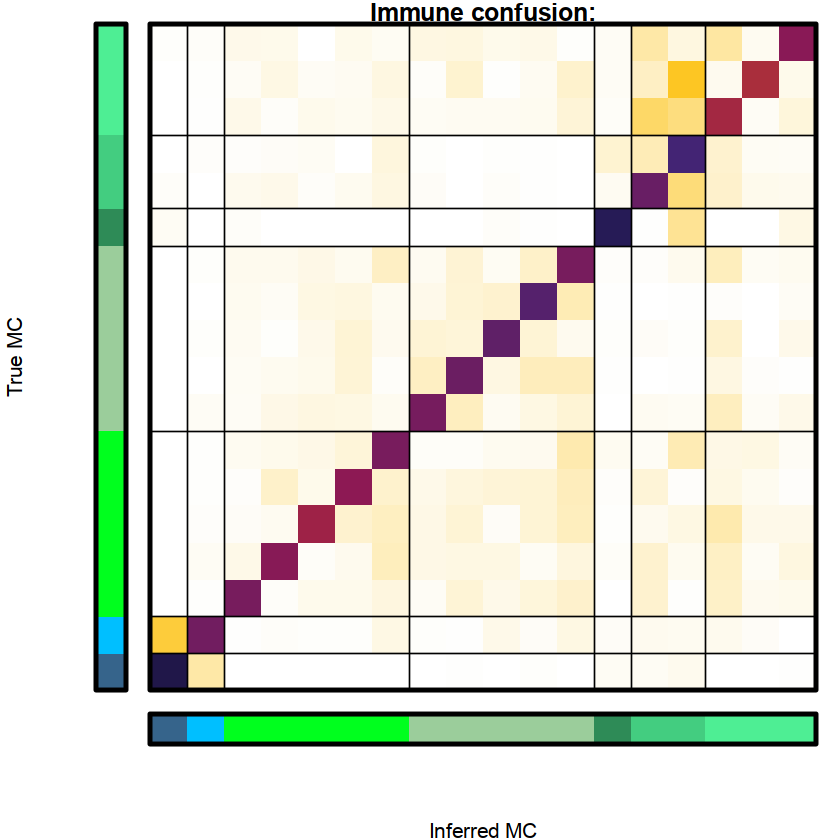

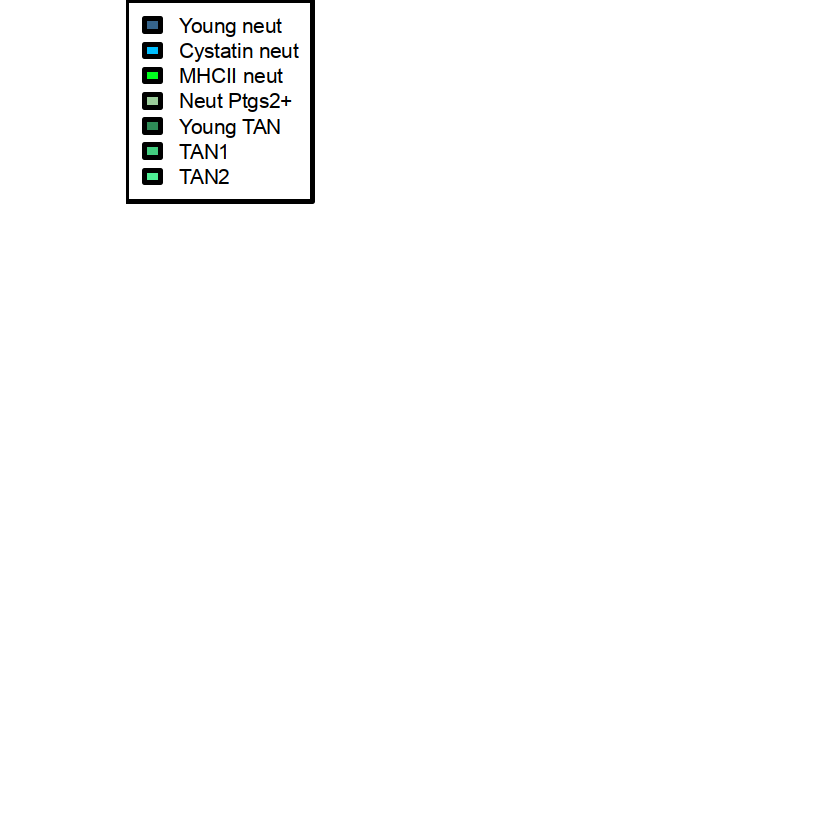

In [520]:
immune_cls = factor(color2name[ sin_cl@colors[ as.numeric(rownames(immune_n))]], levels = cell_order)
par(mar = rep(1,4), lwd = 3, fig = c(0.15,1,0.15,1))
image.2(immune_n, zlim = c(0,1), col = grad, annotate = "none", hct = immune_cls,vct = immune_cls); box()
title("Immune confusion:")
par(fig = c(0.15,1,0,0.15), mar = c(4,1,0,1), new	= T)
image(matrix(seq_along(immune_cls)), axes = F, col = name2color[ as.vector(sort(immune_cls))], xlab = "Inferred MC");box()
par(fig = c(0,0.15,0.15,1), mar = c(1,4,1,0), new = T)
image(t(seq_along(immune_cls)), axes = F, col = name2color[ as.vector(sort(immune_cls))], ylab = "True MC"); box()
par(mar = rep(0,4), fig = c(0.15,1,0.15,1))
plot(NULL ,xaxt='n',yaxt='n',bty='n',ylab='',xlab='', xlim=0:1, ylim=0:1)
legend(x="topleft",
       legend=immune_pops,
       fill=group.colors[immune_pops],
       xpd = TRUE
       )

In [521]:
png("final_figs/supp4/immune_confusion.png", width = 2000, height = 2000)
par(mar = rep(1,4), lwd = 3, fig = c(0.05,1,0.05,1))
image.2(immune_n, zlim = c(0,1), col = grad, annotate = "none", hct = immune_cls, vct = immune_cls); box()
#title("immune cells confusion:")
par(fig = c(0.05,1,0,0.05), mar = c(4,1,0,1), new = T)
image(matrix(seq_along(immune_cls)), axes = F, col = name2color[ as.vector(sort(immune_cls))], xlab = "Inferred MC"); box()
par(fig = c(0,0.05,0.05,1), mar = c(1,4,1,0), new = T)
image(t(seq_along(immune_cls)), axes = F, col = name2color[ as.vector(sort(immune_cls))], ylab = "True MC"); box()
dev.off()

zlim: 0<>1



png 
  2

In [108]:
alpha_fit = estimate_mixing(sim_umis = sim_umis, 
                            alpha = sim_info$alpha.1, 
                            genes = lr_features, 
                            fname = "./temp.pdf",
                            500,
                            normalize = T)
alpha_tag = predict(alpha_fit, newx = t(sim_umis[lr_features,]), s = "lambda.min")[,1]

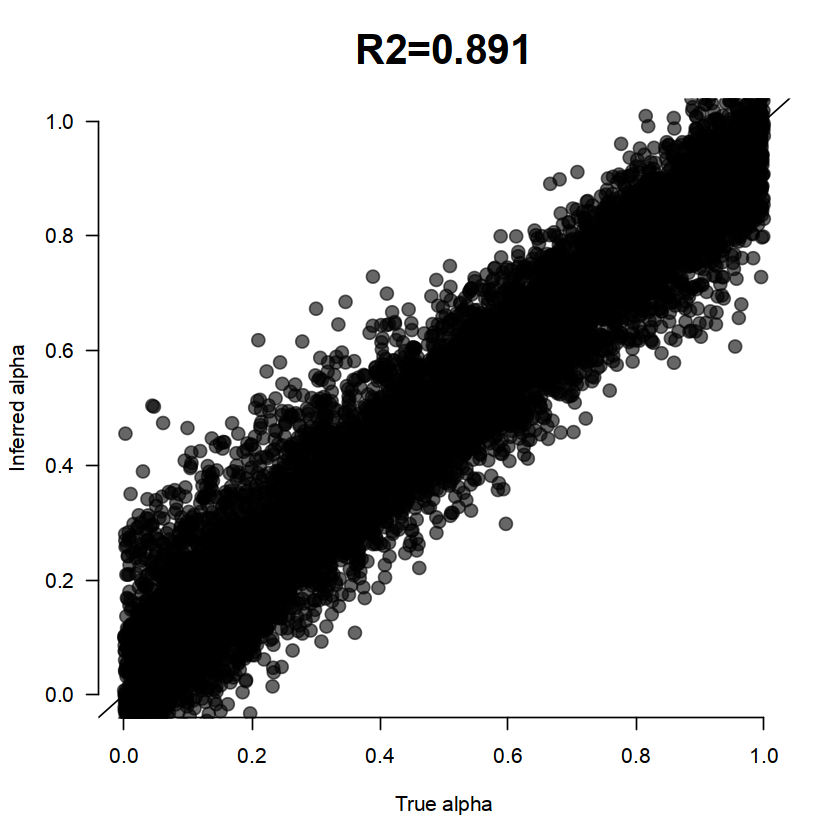

In [109]:
i = which(alpha_fit$lambda == alpha_fit$lambda.min)
plot(sim_info[, "alpha.1"], alpha_tag, pch = 20, col = rgb(0,0,0,0.6), xlim = c(0,1), ylim = c(0,1),
	cex=2, cex.main=2, main = paste0("R2=", round(1 - alpha_fit$cvm[i] / var(sim_info$alpha.1),4)), axes=F, xlab = "True alpha", ylab = "Inferred alpha")
abline(coef = c(0,1)); axis(1); axis(2,las=2)

In [110]:
png("final_figs/supp4/alpha_inference.png", width = 1000, height = 1000)
i = which(alpha_fit$lambda == alpha_fit$lambda.min)
plot(sim_info[, "alpha.1"], alpha_tag, pch = 20, col = rgb(0,0,0,0.6), xlim = c(0,1), ylim = c(0,1),
	cex=2, cex.main=2, main = paste0("R2=", round(1 - alpha_fit$cvm[i] / var(sim_info$alpha.1),4)), axes=F, xlab = "True alpha", ylab = "Inferred alpha")
abline(coef = c(0,1)); axis(1); axis(2,las=2)
dev.off()

png 
  2

# Singlet PIC-seq analysis

### Immune singlets 

In [143]:
numis=500
pic_umis = read_large_umis("merged_neutrophil_epithelial_mat", cells = names(sin_cl@mc[sin_cl@annots[sin_cl@mc] %in% immune_pops]))
ds = .downsamp(pic_umis, numis)
message("Retained ", ncol(ds), " PIC with >", numis, " UMI")

imm_mle_res = run_pic_seq(mc_id = "merged_neutrophil_epithelial_mc", 
                      mat_id = "merged_neutrophil_epithelial_mat", 
                      pic_umis = ds, 
                      a_cells = epithelial_cells, 
                      b_cells = immune_cells, 
                      lr_features = lr_features, 
                      mle_features = mle_features, 
                      fname="./temp.pdf", 
                      bad_genes = bad_genes,
                      reg = 1e-4, 
                      numis = 500, 
                      downsample=F,
                      lr_k = 1e4)

head(imm_mle_res)

imm_mle_res$sin_alpha = with(imm_mle_res, round(alpha))
imm_mle_res$sin_ll = with(imm_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(imm_mle_res)], a_mc, b_mc, sin_alpha, reg = 1e-4, 
                                              markers = mle_features))
imm_mle_res$diff = with(imm_mle_res, ll - sin_ll)

imm_mle_res$epi_alpha = 1
imm_mle_res$epi_ll = with(imm_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(imm_mle_res)], a_mc, b_mc, epi_alpha, reg = 1e-4, 
                                              markers = mle_features))
imm_mle_res$epi_diff = with(imm_mle_res, ll - epi_ll)

imm_mle_res$imm_alpha = 0
imm_mle_res$imm_ll = with(imm_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(imm_mle_res)], a_mc, b_mc, imm_alpha, reg = 1e-4, 
                                              markers = mle_features))
imm_mle_res$imm_diff = with(imm_mle_res, ll - imm_ll)

write.table(imm_mle_res, sep = "\t", quote=F, col.names=NA, file = "annotations/neutrophil_imm_mle_res.txt")

Retained 374 PIC with >500 UMI

Simulating 10000 PIC (numis = 500) for alpha estimation

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
Building LR for alpha

Running MLE on PIC

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
100%



,a_mc,b_mc,ll,alpha
,<int>,<int>,<dbl>,<dbl>
AB525_G1,104,12,-275.8799,0.0161181331
AB525_D15,60,14,-343.6702,0.2909587514
AB525_A4,184,12,-248.1647,0.0213841611
AB540_A10,245,15,-276.6144,0.0219507106
AB540_I6,125,15,-290.6930,0.0008022794
AB540_K3,244,14,-369.8610,0.1090107285


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


### Epithelial singlets 

In [144]:
numis=500
pic_umis = read_large_umis("merged_neutrophil_epithelial_mat", cells = names(sin_cl@mc[sin_cl@annots[sin_cl@mc] %in% epithelial_pops]))
ds = .downsamp(pic_umis, numis)
message("Retained ", ncol(ds), " PIC with >", numis, " UMI")

epi_mle_res = run_pic_seq(mc_id = "merged_neutrophil_epithelial_mc", 
                      mat_id = "merged_neutrophil_epithelial_mat", 
                      pic_umis = ds, 
                      a_cells = epithelial_cells, 
                      b_cells = immune_cells, 
                      lr_features = lr_features, 
                      mle_features = mle_features, 
                      fname="./temp.pdf", 
                      bad_genes = bad_genes,
                      reg = 1e-4, 
                      numis = 500, 
                      downsample=F,
                      lr_k = 1e4)

head(epi_mle_res)

epi_mle_res$sin_alpha = with(epi_mle_res, round(alpha))
epi_mle_res$sin_ll = with(epi_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(epi_mle_res)], a_mc, b_mc, sin_alpha, reg = 1e-4, 
                                              markers = mle_features))
epi_mle_res$diff = with(epi_mle_res, ll - sin_ll)

epi_mle_res$epi_alpha = 1
epi_mle_res$epi_ll = with(epi_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(epi_mle_res)], a_mc, b_mc, epi_alpha, reg = 1e-4, 
                                              markers = mle_features))
epi_mle_res$epi_diff = with(epi_mle_res, ll - epi_ll)

epi_mle_res$imm_alpha = 0
epi_mle_res$imm_ll = with(epi_mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(epi_mle_res)], a_mc, b_mc, imm_alpha, reg = 1e-4, 
                                              markers = mle_features))
epi_mle_res$imm_diff = with(epi_mle_res, ll - imm_ll)

write.table(epi_mle_res, sep = "\t", quote=F, col.names=NA, file = "annotations/neutrophil_epi_mle_res.txt")

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
Retained 10627 PIC with >500 UMI

Simulating 10000 PIC (numis = 500) for alpha estimation

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
Building LR for alpha

Running MLE on PIC

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
100%



# Real PIC-seq analysis

In [112]:
numis=500
pic_umis = read_large_umis("neutrophil_clean_pics", cells = db_mat@cells)
ds = .downsamp(pic_umis, numis)
message("Retained ", ncol(ds), " PIC with >", numis, " UMI")

Retained 1223 PIC with >500 UMI



In [113]:
mle_res = run_pic_seq(mc_id = "merged_neutrophil_epithelial_mc", 
                      mat_id = "merged_neutrophil_epithelial_mat", 
                      pic_umis = ds, 
                      a_cells = epithelial_cells, 
                      b_cells = immune_cells, 
                      lr_features = lr_features, 
                      mle_features = mle_features, 
                      fname="./temp.pdf", 
                      bad_genes = bad_genes,
                      reg = 1e-4, 
                      numis = 500, 
                      downsample=F,
                      lr_k = 1e4)

head(mle_res)

Simulating 10000 PIC (numis = 500) for alpha estimation

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
Building LR for alpha

Running MLE on PIC

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”
100%



,a_mc,b_mc,ll,alpha
,<int>,<int>,<dbl>,<dbl>
AB542_P7,109,3,-339.1060,0.7879471
AB542_A4,99,2,-379.8978,0.7924829
AB542_A13,92,3,-446.0319,0.5145704
AB539_A7,111,10,-350.2423,0.7755860
AB539_K21,99,16,-331.4016,0.8915130
AB539_L4,72,14,-349.7241,0.4839811


In [114]:
mle_res$sin_alpha = with(mle_res, round(alpha))
mle_res$sin_ll = with(mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(mle_res)], a_mc, b_mc, sin_alpha, reg = 1e-4, 
                                              markers = mle_features))
mle_res$diff = with(mle_res, ll - sin_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [115]:
mle_res$imm_ll = with(mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(mle_res)], a_mc, b_mc, 1, reg = 1e-4, 
                                              markers = mle_features))
mle_res$imm_diff = with(mle_res, ll - imm_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [116]:
mle_res$epi_ll = with(mle_res, pic_ll_to_pair('merged_neutrophil_epithelial_mc', 'merged_neutrophil_epithelial_mat', 
                                              ds[,rownames(mle_res)], a_mc, b_mc, 0, reg = 1e-4, 
                                              markers = mle_features))
mle_res$epi_diff = with(mle_res, ll - epi_ll)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


In [117]:
mle_res$lower_diff = pmin(mle_res$epi_diff, mle_res$imm_diff)

In [118]:
write.table(mle_res, sep = "\t", quote=F, col.names=NA, file = "annotations/neutrophil_mle_res.txt")

In [9]:
# rerun
mle_res = read.delim("annotations/neutrophil_mle_res.txt", stringsAsFactors = F, row.names=1)
epi_mle_res = read.delim("annotations/neutrophil_epi_mle_res.txt", stringsAsFactors = F, row.names=1)
imm_mle_res = read.delim("annotations/neutrophil_imm_mle_res.txt", stringsAsFactors = F, row.names=1)
head(mle_res)

,a_mc,b_mc,ll,alpha,sin_alpha,sin_ll,diff,imm_ll,imm_diff,epi_ll,epi_diff,lower_diff
,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AB542_P7,109,3,-339.1060,0.7879471,1,-374.6668,35.56084,-374.6668,35.56084,-511.6753,172.56936,35.56084
AB542_A4,99,2,-379.8978,0.7924829,1,-427.1065,47.20869,-427.1065,47.20869,-652.0895,272.19164,47.20869
AB542_A13,92,3,-446.0319,0.5145704,1,-540.1232,94.09124,-540.1232,94.09124,-502.4142,56.38232,56.38232
AB539_A7,111,10,-350.2423,0.7755860,1,-384.2899,34.04759,-384.2899,34.04759,-576.9515,226.70917,34.04759
AB539_K21,99,16,-331.4016,0.8915130,1,-360.4366,29.03503,-360.4366,29.03503,-834.9585,503.55689,29.03503
AB539_L4,72,14,-349.7241,0.4839811,0,-394.5101,44.78605,-599.9089,250.18480,-394.5101,44.78605,44.78605


In [120]:
mle_res$lower_diff = pmin(mle_res$imm_dif, mle_res$epi_diff)
epi_mle_res$lower_diff = pmin(epi_mle_res$imm_dif, epi_mle_res$epi_diff)
imm_mle_res$lower_diff = pmin(imm_mle_res$imm_dif, imm_mle_res$epi_diff)

In [121]:
#Rerun
sim_info = read.delim("annotations/neutrophil_sim_info_final.txt", row.names = 1)
sim_mle_res = read.delim("annotations/neutrophil_sim_mle_res_final.txt", row.names = 1)

In [122]:
min_thresh = ceiling(min(c(epi_mle_res$lower_diff, imm_mle_res$lower_diff, sim_mle_res$lower_diff, mle_res$lower_diff)))

In [123]:
max_thresh = floor(max(c(epi_mle_res$lower_diff, imm_mle_res$lower_diff, sim_mle_res$lower_diff, mle_res$lower_diff)))

In [124]:
thresh_df = data.frame(thresh=seq(min_thresh, max_thresh, 0.01),
                       singlet_pctg=sapply(seq(min_thresh, max_thresh, 0.01), function(thresh){
    mean(sum(epi_mle_res$lower_diff < thresh) / nrow(epi_mle_res), sum(imm_mle_res$lower_diff < thresh) / nrow(imm_mle_res))
                           }),
                       simpic_pctg=sapply(seq(min_thresh, max_thresh, 0.01), function(thresh){
        (sum(sim_mle_res$lower_diff < thresh) / nrow(sim_mle_res))
                           })
                      )

In [125]:
max_df = thresh_df[thresh_df$singlet_pctg - thresh_df$simpic_pctg == max(thresh_df$singlet_pctg - thresh_df$simpic_pctg),][1,]
singlet_pctg = mean(max_df$singlet_pctg)

In [126]:
max_df

,thresh,singlet_pctg,simpic_pctg
,<dbl>,<dbl>,<dbl>
5109,0.08,0.9846811,0.1696


In [127]:
thresh = max_df$thresh

In [306]:
thresh

[1] 0.08

In [128]:
mle_res %>%
    filter(lower_diff < thresh, lower_diff > 0)

,a_mc,b_mc,ll,alpha,sin_alpha,sin_ll,diff,imm_ll,imm_diff,epi_ll,epi_diff,lower_diff
,<int>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AB1202_D11,158,6,-268.3610,0.8999312,1,-268.3654,0.0043983777,-268.3654,4.398378e-03,-410.4813,142.12024386,0.0043983777
AB365_B7,135,4,-383.4477,0.1506776,0,-383.4613,0.0135615274,-743.1487,3.597010e+02,-383.4613,0.01356153,0.0135615274
AB378_C15,88,15,-363.1582,0.4018800,0,-363.1741,0.0159143015,-918.5398,5.553816e+02,-363.1741,0.01591430,0.0159143015
AB868_O14,149,5,-315.0355,0.9182679,1,-315.0365,0.0009748442,-315.0365,9.748442e-04,-457.3089,142.27343236,0.0009748442


In [129]:
point_on_line = (max_df$singlet_pctg + max_df$simpic_pctg) / 2

In [130]:
#thresh = thresh_df[abs(thresh_df$singlet_pctg - 0.75) == min(abs(thresh_df$singlet_pctg - 0.75)),'thresh']

In [131]:
#point_on_line = (thresh_df[thresh_df$thresh == thresh,]$singlet_pctg + thresh_df[thresh_df$thresh == thresh,]$simpic_pctg) / 2

Saving 6.67 x 6.67 in image


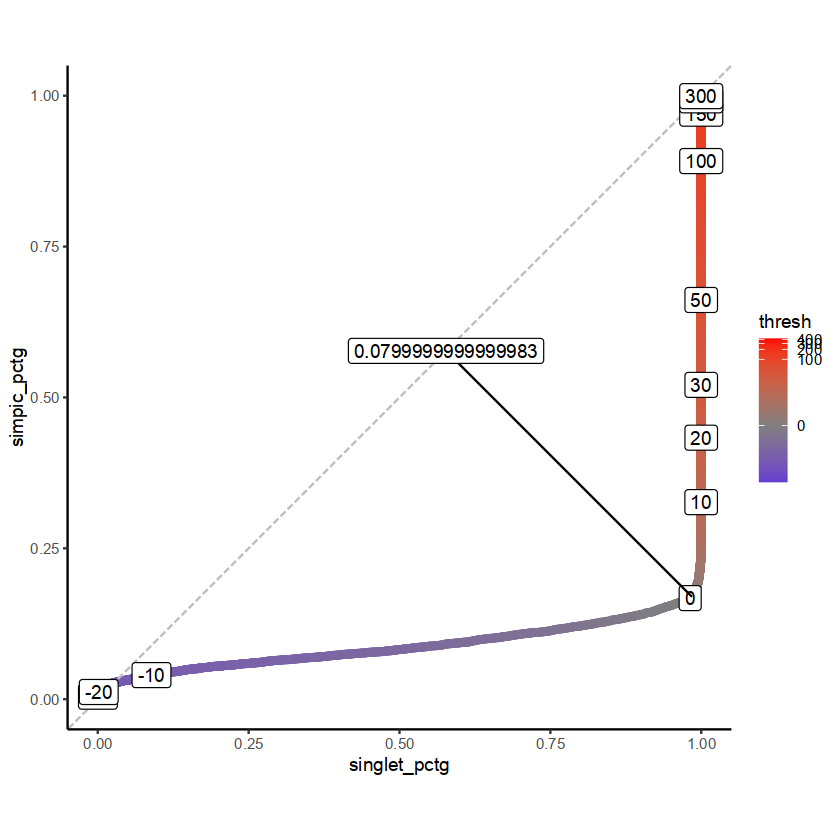

In [132]:
ggplot(thresh_df, aes(x=singlet_pctg, y=simpic_pctg, color=thresh)) +
    geom_point() +
    geom_abline(slope = 1, intercept = 0, color='gray', linetype='longdash') +
    scale_color_gradient2(low = 'blue', mid = 'gray50', high = 'red', midpoint = 0, trans='pseudo_log') +
    geom_label(data=thresh_df[thresh_df$thresh %in% c(seq(-30,30,10), seq(50,200,50), 300),],#[round(thresh_df$thresh, digits = -1) == thresh_df$thresh ,], 
               aes(label=thresh), color='black') +
    scale_y_continuous(limits = c(0,1)) +
    geom_segment(data=data.frame(x=point_on_line, y=point_on_line, 
                                 x2=thresh_df[thresh_df$thresh == thresh,]$singlet_pctg, 
                                 y2=thresh_df[thresh_df$thresh == thresh,]$simpic_pctg), 
                 aes(x=x, y=y, xend=x2, yend=y2), color='black') +
    geom_label(data=data.frame(x=point_on_line, y=point_on_line, label=thresh), 
               aes(x=x, y=y, label=label), color='black') +
    coord_fixed()
ggsave("final_figs/supp4/exclusion_curve.pdf")

Saving 6.67 x 6.67 in image


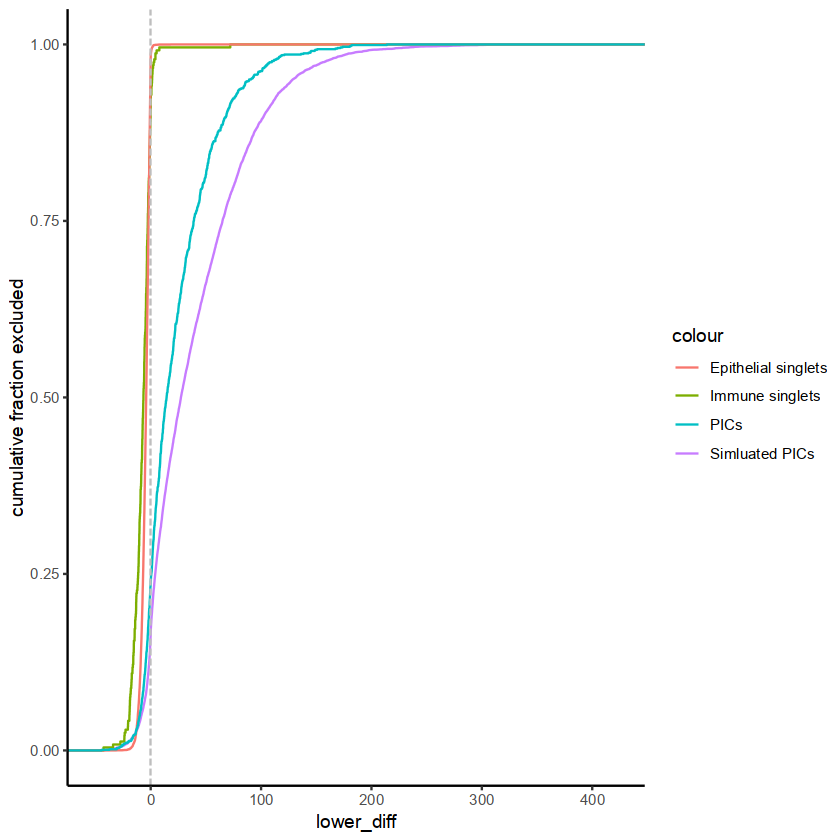

In [133]:
ggplot(sim_mle_res, aes(lower_diff)) + 
    stat_ecdf(geom = "step", aes(color='Simluated PICs')) +
    stat_ecdf(data = imm_mle_res, geom = "step", aes(color='Immune singlets')) +
    stat_ecdf(data = epi_mle_res, geom = "step", aes(color='Epithelial singlets')) +
    stat_ecdf(data = mle_res, geom = "step", aes(color='PICs')) +
    #scale_x_continuous(limits = c(-50, 200)) +
    geom_vline(xintercept = thresh, color='gray', linetype='longdash') +
    labs(y="cumulative fraction excluded")
ggsave("final_figs/supp4/exclusion_by_thresh.pdf")

In [134]:
#thresh = 0.5
message("Epithelial singlets - ", sum(epi_mle_res$lower_diff < thresh) / nrow(epi_mle_res))
message("Immune singlets - ", sum(imm_mle_res$lower_diff < thresh) / nrow(imm_mle_res))
message("Simulated PICs - ", sum(sim_mle_res$lower_diff < thresh) / nrow(sim_mle_res))
message("Experimental PICs - ", sum(mle_res$lower_diff < thresh) / nrow(mle_res))

Epithelial singlets - 0.984681064791562

Immune singlets - 0.928571428571429

Simulated PICs - 0.1696

Experimental PICs - 0.239495798319328



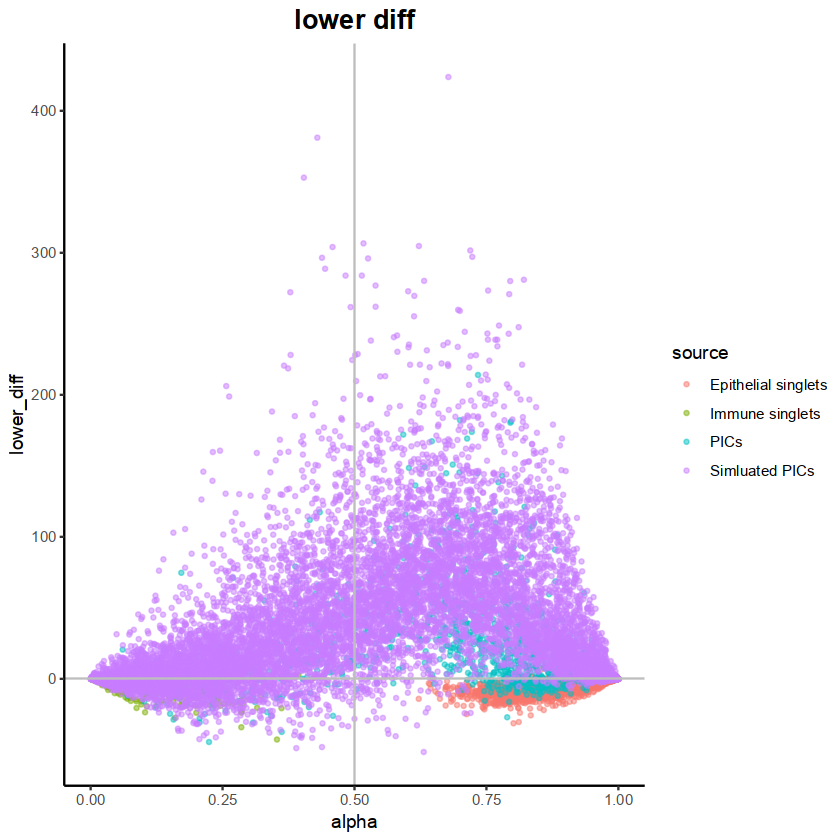

In [135]:
rbind(cbind(imm_mle_res, source='Immune singlets'), 
      cbind(epi_mle_res, source='Epithelial singlets'), 
      cbind(cbind(mle_res, imm_alpha=0, epi_alpha=1), source='PICs'),
      cbind(cbind(sim_mle_res, imm_alpha=0, epi_alpha=1), source='Simluated PICs')) %>%
    ggplot(aes(x=alpha, y=lower_diff, color=source)) +
    #geom_point(alpha=1, pch=21, color='black', size=0.5) +
    geom_point(alpha=0.5, size=0.8) +
    geom_hline(yintercept = 0, color='gray') +
    geom_vline(xintercept = 0.5, color='gray') +
    labs(title='lower diff') + 
    scale_x_continuous(limits = c(0, 1)) +
    theme(plot.title = element_text(size=16, hjust=0.5, face='bold'))

In [136]:
nrow(mle_res)

[1] 1190

In [137]:
thresh

[1] 0.08

In [138]:
diff_excluded = rownames(mle_res)[mle_res$lower_diff < thresh]

In [139]:
length(diff_excluded)

[1] 285

In [140]:
good_pics = setdiff(rownames(mle_res), diff_excluded)

In [141]:
writeLines(good_pics, 'annotations/neutrophil_good_pics_final.txt')

In [142]:
good_pics = readLines('annotations/neutrophil_good_pics_final.txt')

In [143]:
length(good_pics)

[1] 905

In [144]:
db_mat@cell_metadata[good_pics, 'Cell_type'] %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       166        739 

In [145]:
db_mat@cell_metadata[good_pics,] %>%
    group_by(Age, condition, Cell_type) %>%
    summarise(n_replicates = length(unique(Replicate)), n_plates=length(unique(Amp.Batch.ID)), n_cells=n()) %>%
    arrange(Age, condition, Cell_type)

`summarise()` has grouped output by 'Age', 'condition'. You can override using
the `.groups` argument.


Age,condition,Cell_type,n_replicates,n_plates,n_cells
<fct>,<fct>,<fct>,<int>,<int>,<int>
3w,normal,EPCAM-CD45,1,1,1
6w,normal,EPCAM-CD45,1,1,1
6w,tumor,EPCAM-CD45,1,1,7
8w,tumor,EPCAM-CD45,2,2,2
8w,tumor,EPCAM-LY6G,1,1,33
10w,normal,EPCAM-CD45,1,2,4
10w,tumor,EPCAM-CD45,2,4,19
10w,tumor,EPCAM-LY6G,2,4,196
12w,normal,EPCAM-CD45,1,1,2


In [146]:
t.test(c(0.32, 4.97), c(7.2, 9.16))


	Welch Two Sample t-test

data:  c(0.32, 4.97) and c(7.2, 9.16)
t = -2.1937, df = 1.3445, p-value = 0.2181
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -23.43663  12.36663
sample estimates:
mean of x mean of y 
    2.645     8.180 


In [147]:
db_mat@cell_metadata[good_pics, c('Age', 'condition')] %>% mutate(Age = factor(Age, levels=age_order)) %>% table

     condition
Age   normal tumor
  10d      0     0
  3w       1     0
  6w       1     7
  8w       0    35
  10w      4   215
  12w      2   640

In [148]:
sin_cl@annots[mle_res[good_pics[db_mat@cell_metadata[good_pics, 'Age'] == '12w' & 
                                db_mat@cell_metadata[good_pics, 'condition'] == 'tumor'],
                      'b_mc']] %>% table

.
Cystatin neut    MHCII neut   Neut Ptgs2+          TAN1          TAN2 
            9            37           292            87           178 
   Young neut     Young TAN 
            2            35 

In [149]:
sin_cl@annots[mle_res[good_pics, 'b_mc']] %>% table

.
Cystatin neut    MHCII neut   Neut Ptgs2+          TAN1          TAN2 
           11            61           389           133           266 
   Young neut     Young TAN 
            4            41 

# Heatmaps for proof

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.8 GiB”


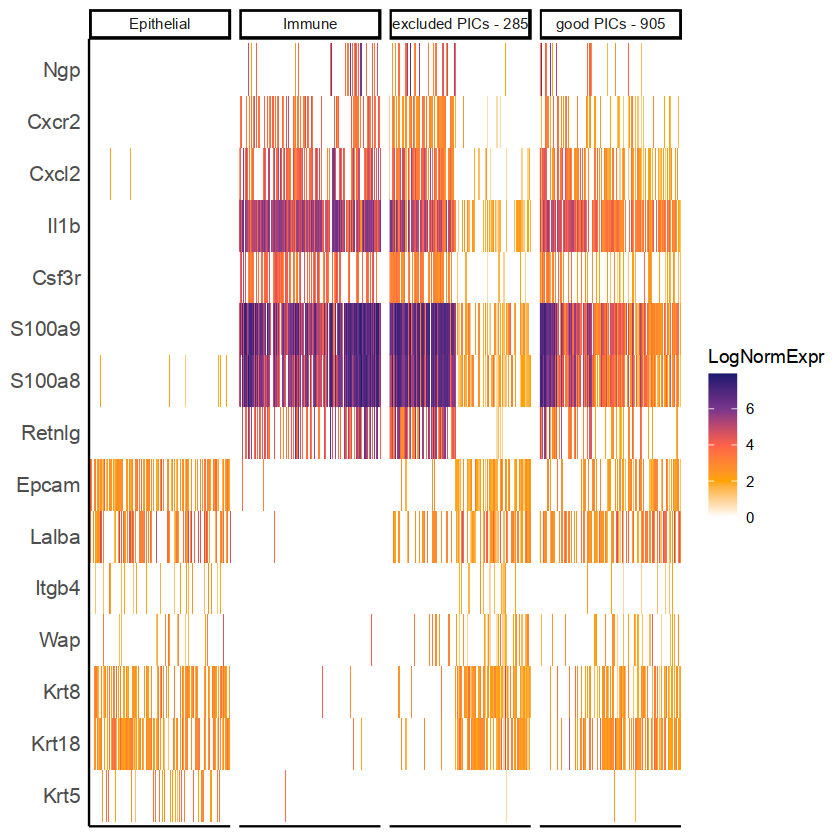

In [325]:
disp_genes = c('Krt5', 'Krt18', 'Krt8', 'Wap', 'Itgb4', 'Lalba', 'Epcam', 
               'Retnlg', 'S100a8', 'S100a9', 'Csf3r', 'Il1b', 'Cxcl2', 'Cxcr2', 'Ngp')

db_umis = read_large_umis("neutrophil_clean_pics", cells = rownames(mle_res))
epithelial_umis = read_large_umis("merged_neutrophil_epithelial_mat", cells = epithelial_cells)
immune_umis = read_large_umis("merged_neutrophil_epithelial_mat", cells = immune_cells)
focus_mat = t(db_umis)
focus_mat_norm = log1p(10000 * focus_mat / rowSums(focus_mat))
heatmap_df = as.matrix(t(focus_mat_norm[,disp_genes]))

df1 = heatmap_df %>% melt(varnames = c('gene', 'cell_name'), value.name = 'LogNormExpr') %>% 
    cbind(source=rep(ifelse(pmin(mle_res$epi_diff, mle_res$imm_diff) < thresh, 
                            paste0('excluded PICs - ', length(diff_excluded)), 
                            paste0('good PICs - ', length(good_pics))), 
                     each=length(disp_genes)))

focus_mat = t(epithelial_umis)
focus_mat_norm = log1p(10000 * focus_mat / rowSums(focus_mat))
heatmap_df = as.matrix(t(focus_mat_norm[,disp_genes]))
df2 = heatmap_df %>% melt(varnames = c('gene', 'cell_name'), value.name = 'LogNormExpr') %>% cbind(source='Epithelial')

focus_mat = t(immune_umis)
focus_mat_norm = log1p(10000 * focus_mat / rowSums(focus_mat))
heatmap_df = as.matrix(t(focus_mat_norm[,disp_genes]))
df3 = heatmap_df %>% melt(varnames = c('gene', 'cell_name'), value.name = 'LogNormExpr') %>% cbind(source='Immune')

df1$cell_name = factor(df1$cell_name, 
                       levels=rownames(mle_res)[order(mle_res$alpha)])

ggplot(rbind(df1, df2, df3) %>% 
           mutate(source=factor(source, levels=c('Epithelial', 'Immune', 
                                                 paste0('excluded PICs - ', length(diff_excluded)), 
                                                 paste0('good PICs - ', length(good_pics))))), 
       aes(x=cell_name, y=gene, fill=LogNormExpr)) +
    geom_tile() +
    scale_fill_gradientn(colors=c("white", "orange", "tomato", "mediumorchid4", "midnightblue")) +
    facet_grid(~ source, scales = 'free_x') +
    theme(axis.text.x = element_blank(), axis.title.x = element_blank(), axis.ticks = element_blank(),
          axis.title.y = element_blank(), axis.text = element_text(size = 12))

ggsave("final_figs/supp4/gene_compare_all.pdf", width=10, height=5)

In [151]:
#thresh = 0.140000000000001

In [51]:
#rerun
good_pics = rownames(mle_res)
#good_pics = good_pics[pmin(mle_res$imm_diff, mle_res$epi_diff) >= thresh]
#good_pics = good_pics[db_mat@cell_metadata[good_pics,'total_counts'] >= 650]
alpha = mle_res[good_pics, "alpha"]; names(alpha) = good_pics
epithelial_mc = mle_res[good_pics, "a_mc"]; names(epithelial_mc) = good_pics
immune_mc = mle_res[good_pics, "b_mc"]; names(immune_mc) = good_pics
parser_epithelial = color2name[ sin_cl@colors[ epithelial_mc]]; names(parser_epithelial) = good_pics
parser_immune = color2name[ sin_cl@colors[ immune_mc]]; names(parser_immune) = good_pics

table(parser_epithelial)
table(parser_immune)

parser_epithelial
     Alveolar         Basal            HS Myoepithelial        MyoLum 
           39             2            12            10            20 
 Progenitor 1  Progenitor 2   Tumor cells 
           31            76          1000 

parser_immune
Cystatin neut    MHCII neut   Neut Ptgs2+          TAN1          TAN2 
           13           229           486           183           218 
   Young neut     Young TAN 
            7            54 

In [524]:
parser_epithelial[intersect(good_pics, bad_cells)] %>% table / length(intersect(good_pics, bad_cells))

numeric(0)

In [525]:
parser_epithelial[setdiff(good_pics, bad_cells)] %>% table / length(setdiff(good_pics, bad_cells))

.
     Alveolar         Basal            HS Myoepithelial        MyoLum 
  0.032773109   0.001680672   0.010084034   0.008403361   0.016806723 
 Progenitor 1  Progenitor 2   Tumor cells 
  0.026050420   0.063865546   0.840336134 

In [526]:
parser_immune[intersect(good_pics, bad_cells)] %>% table / length(intersect(good_pics, bad_cells))

numeric(0)

In [527]:
parser_immune[setdiff(good_pics, bad_cells)] %>% table / length(setdiff(good_pics, bad_cells))

.
Cystatin neut    MHCII neut   Neut Ptgs2+          TAN1          TAN2 
  0.010924370   0.192436975   0.408403361   0.153781513   0.183193277 
   Young neut     Young TAN 
  0.005882353   0.045378151 

In [528]:
writeLines(good_pics, 'annotations/neutrophil_good_pics.txt')

In [529]:
length(good_pics)

[1] 1190

In [530]:
table(db_mat@cell_metadata[good_pics, c('Age', 'condition')] %>% mutate(Age = factor(Age, levels=age_order)))

     condition
Age   normal tumor
  10d      0     0
  3w       1     0
  6w       1     7
  8w       0    57
  10w      4   288
  12w      2   830

### Unified heatmap

In [103]:
cell_stats = rbind(db_mat@cell_metadata, sin_mat@cell_metadata[colnames(db_mat@cell_metadata)])
comb = with(cell_stats, paste0(ifelse(rownames(cell_stats) %in% db_mat@cells, "PIC", "Singlet"), "@",
                               condition, "@", Age, "@", Cell_type)); 
names(comb) = rownames(cell_stats)

In [104]:
cell_stats$is_pic = ifelse(rownames(cell_stats) %in% db_mat@cells, "PIC", "Singlet")

In [105]:
cell_stats$epithelial_type = ifelse(rownames(cell_stats) %in% good_pics, 
                                    parser_epithelial[rownames(cell_stats)], 
                                    ifelse(sin_cl@annots[sin_cl@mc[rownames(cell_stats)]] %in% epithelial_pops,
                                           sin_cl@annots[sin_cl@mc[rownames(cell_stats)]], NA))

In [106]:
cell_stats$immune_type = ifelse(rownames(cell_stats) %in% good_pics, 
                                parser_immune[rownames(cell_stats)], 
                                ifelse(sin_cl@annots[sin_cl@mc[rownames(cell_stats)]] %in% immune_pops,
                                           sin_cl@annots[sin_cl@mc[rownames(cell_stats)]], NA))

In [107]:
full_cell_stats = cell_stats

In [536]:
imhm_genes = c("Adpgk", "Ly6a2", "Cd177", "Thbs1", "Mmp8", "Ifitm6", "Arhgdib", "Ltf", "Ngp", "Camp", "Wfdc21", "Pglyrp1", 
               "Lcn2", "Anxa1", "Lyz2", "Retnlg", "Prdx5", "Stfa1", "Stfa2l1", "Stfa2", "Stfa3", "Csta3", "Cstdc4", "Cstdc5", 
               "Cstdc6", "Retnla", "Ccl6", "Serpinb1a", "Cybb", "Chil3", "Mmp9", "Gapdh", "H2-Aa", "Cd74", "H2-Ab1", "Egr1", 
               "Ccl3", "Gadd45b", "Nfkbid", "Ptgs2", "Nr4a1", "Ppp1r15a", "Ier3", "Marcksl1", "Tnfaip3", "Nfkbia", "Tagln2", 
               "Il1r2", "Ccrl2", "Cxcl2", "Rhog", "Gpx1", "Ifitm1", "Ifitm2", "Wfdc17", "S100a8", "S100a9")
epi_hm_genes = c("Kit", "Aldh1a3", "Mfge8", "Fcgbp", "Wfdc18", "Krt8", "Krt18", "Cp", 
                 "Lalba", "Csn3", 
                 "Cited1", "Pgr", "Esr1", "Prlr", 
                 "Myl9", "Acta2", #"Pdpn", "Mylk", "Myh11", "Ecrg4", "Oxtr", "Tpm2", 
                 "Krt5", "Krt14", 
                 "Krt17", "Rbp1", "Rflnb", "Gja1", #"Pclaf", "Tuba1b", "Hmgb2", "Ccna2",
                 #"Spp1",
                 "Wap", "Csn1s1", "Csn1s2a", "Csn2", "Thrsp", "Car6", "Saa1", "Saa2")
disp_genes = c(imhm_genes, epi_hm_genes)

In [538]:
hm_stats = full_cell_stats %>% 
    filter(!is.na(epithelial_type) | !is.na(immune_type)) %>% 
    dplyr::select(Age, condition, is_pic, epithelial_type, immune_type)

In [540]:
library(dplyr)

In [541]:
pic_rows = which(hm_stats$is_pic == 'PIC')

In [542]:
epithelial_rows = which(is.na(hm_stats$immune_type))

In [543]:
immune_rows = which(is.na(hm_stats$epithelial_type))

In [544]:
hm_df = hm_stats[c(pic_rows, sample(epithelial_rows, length(pic_rows)), sample(immune_rows, length(pic_rows))),]

In [545]:
hm_df$alpha = ifelse(hm_df$is_pic == 'PIC', alpha[rownames(hm_df)], 
                     ifelse(is.na(hm_df$immune_type), 1, 0))

In [546]:
hm_df = hm_df %>% mutate(Source = factor(ifelse(is_pic == "PIC", 'PIC', ifelse(is.na(epithelial_type), 'Immune', 'Epithelial')),
                                         levels=c('Immune', 'Epithelial', 'PIC')),
                         immune_type=factor(immune_type, levels=cell_order),
                         epithelial_type=factor(epithelial_type, levels=cell_order))

In [548]:
hmgene_df = rbind(apply(t(sin_mat@mat[,rownames(hm_df %>% filter(is_pic =='Singlet'))]), 1, 
                        function(x){log1p(1e4 * x / sum(x))}) %>% t %>% as.data.frame %>% dplyr::select(disp_genes),
                  apply(t(db_mat@mat[,rownames(hm_df %>% filter(is_pic =='PIC'))]), 1, 
                        function(x){log1p(1e4 * x / sum(x))}) %>% t %>% as.data.frame %>% dplyr::select(disp_genes)) %>%
    as.matrix %>% t

In [549]:
c_vec = sin_cl@colors[!duplicated(sin_cl@colors)]
names(c_vec) = sin_cl@annots[!duplicated(sin_cl@annots)]

In [550]:
ha1 = HeatmapAnnotation(show_legend = F,
                        Immune_annot=factor(hm_df$immune_type, levels = cell_order), 
                        Epithelial_annot=factor(hm_df$epithelial_type, levels = cell_order), 
                        col = list(Immune_annot=c_vec, Epithelial_annot=c_vec))

ha2 = HeatmapAnnotation(alpha=hm_df$alpha,
                        col = list(alpha=colorRamp2(c(0, 0.5, 1), c("limegreen", "gray40", "firebrick3"))))

In [551]:
png(file="final_figs/supp4/heatmap_comb.png", 
    width = 10,
    height    = 6,
    units     = "in",
    res       = 1200,
    pointsize = 1
)

hm_plot = Heatmap(hmgene_df[,rownames(hm_df)], 
                  row_names_gp = gpar(fontsize=6), 
                  show_column_dend = F, 
                  column_order = rownames(hm_df %>% arrange(is_pic, immune_type, epithelial_type, alpha)), 
                  row_order = disp_genes,
                  column_split = hm_df$Source,
                  row_split = factor(ifelse(disp_genes %in% imhm_genes, "Immune genes", "Epithelial genes"), 
                                            levels=c("Immune genes", "Epithelial genes")),
                  heatmap_legend_param = list(labels_gp = gpar(fontsize = 6)),
                  cluster_rows = F, 
                  cluster_columns =  F, 
                  top_annotation = ha1, 
                  bottom_annotation = ha2, 
                  show_column_names = F,
                  col = colorRampPalette(c("white", "orange", "tomato", "mediumorchid4", "midnightblue"))(10000), 
                  use_raster = F)
plot(hm_plot)
dev.off()

png 
  2

In [552]:
write_lines(disp_genes, "final_figs/supp4/hm_gene_list.txt")

# Composition analysis

In [112]:
cell_stats = cell_stats %>%
    mutate(stage = factor(ifelse(Age %in% c('10d', '3w'), "Development",
                                 ifelse(Age %in% c('6w', '8w'), 'Early', 'Advanced')),
                          levels  = c('Development', 'Early', 'Advanced')))

In [113]:
cell_stats$Batch.Set.ID = with(cell_stats,  ifelse(Amp.Batch.ID %in% c("AB1298", "AB1299", "AB1300"), 
                                                   "sandra-10w-6", as.character(Batch.Set.ID)))

In [114]:
cell_stats$Replicate = with(cell_stats,  ifelse(Amp.Batch.ID %in% c("AB1298", "AB1299", "AB1300"), 
                                                "6", as.character(Replicate)))

In [115]:
cell_stats[rownames(cell_stats) %in% good_pics & cell_stats$condition == 'tumor',] %>% dcast(Age ~ Replicate)

Using stage as value column: use value.var to override.

Aggregation function missing: defaulting to length



Age,1,2,3,4,5,6
<fct>,<int>,<int>,<int>,<int>,<int>,<int>
6w,0,0,7,0,0,0
8w,0,0,56,1,0,0
10w,0,0,0,235,53,0
12w,46,49,176,76,5,478


In [116]:
cell_stats[rownames(cell_stats) %in% good_pics & cell_stats$condition == 'normal',] %>% dcast(Age ~ Replicate)

Using stage as value column: use value.var to override.

Aggregation function missing: defaulting to length



Age,2,3,4,5,6
<fct>,<int>,<int>,<int>,<int>,<int>
3w,0,0,1,0,0
6w,0,1,0,0,0
10w,0,0,0,3,1
12w,2,0,0,0,0


In [117]:
cell_stats = cell_stats[cell_stats$condition == 'tumor' & cell_stats$Age %in% c('8w', '10w', '12w'),]

In [118]:
cell_stats$Cell_type %>% unique

[1] EPCAM-CD45 EPCAM-LY6G CD45+      EPCAM      CD45-      LY6G      
Levels: EPCAM-CD45 EPCAM-LY6G CD45+ CD45- EPCAM LY6G

In [119]:
immune_replicate_df = cell_stats %>%
    filter(Cell_type %in% c('LY6G', 'EPCAM-LY6G') & immune_type %in% immune_pops) %>%
    #filter(Age != '10w') %>%
    #filter(Age %in% c('8w', '10w', '12w') & condition == 'tumor') %>%
    group_by(Age, condition, is_pic, immune_type, Replicate) %>% 
    summarise(Count=length(Age)) %>% drop_na() %>% as.data.frame %>%
    complete(Age, condition, is_pic, immune_type, Replicate, fill=list(Count=0)) %>%
    group_by(Age, condition, is_pic, Replicate) %>% 
    summarise(Age=Age,
              condition=condition,
              is_pic=is_pic,
              annotation=immune_type,
              Replicate=Replicate,
              Count=Count, 
              total=sum(Count), 
              fraction = Count / sum(Count)) %>%
    filter(total > 10)

immune_replicate_df$annotation = factor(immune_replicate_df$annotation, levels=cell_order)
immune_replicate_df$condition = factor(immune_replicate_df$condition, levels=rev(cond_order))
immune_replicate_df$Age = factor(immune_replicate_df$Age, levels=age_order)
immune_replicate_df$is_pic = factor(immune_replicate_df$is_pic, levels=c('Singlet', 'PIC'))
#immune_replicate_df = remove_missing(immune_replicate_df)

`summarise()` has grouped output by 'Age', 'condition', 'is_pic',
'immune_type'. You can override using the `.groups` argument.
Warning message:
“Returning more (or less) than 1 row per `summarise()` group was deprecated in
dplyr 1.1.0.
ℹ Please use `reframe()` instead.
ℹ When switching from `summarise()` to `reframe()`, remember that `reframe()`
  always returns an ungrouped data frame and adjust accordingly.”
`summarise()` has grouped output by 'Age', 'condition', 'is_pic', 'Replicate'.
You can override using the `.groups` argument.


In [120]:
epithelial_replicate_df = cell_stats %>%
    filter(Cell_type %in% c('EPCAM', 'EPCAM-LY6G') & epithelial_type %in% epithelial_pops) %>%
    #filter(Age != '10w') %>%
    #filter(Age %in% c('8w', '10w', '12w') & condition == 'tumor') %>%
    group_by(Age, condition, is_pic, epithelial_type, Replicate) %>% 
    summarise(Count=length(Age)) %>% drop_na() %>% as.data.frame %>%
    complete(Age, condition, is_pic, epithelial_type, Replicate, fill=list(Count=0)) %>%
    group_by(Age, condition, is_pic, Replicate) %>% 
    summarise(Age=Age,
              condition=condition,
              is_pic=is_pic,
              annotation=epithelial_type,
              Replicate=Replicate,
              Count=Count, 
              total=sum(Count), 
              fraction = Count / sum(Count)) %>%
    filter(total > 10)

epithelial_replicate_df$annotation = factor(epithelial_replicate_df$annotation, levels=cell_order)
epithelial_replicate_df$condition = factor(epithelial_replicate_df$condition, levels=rev(cond_order))
epithelial_replicate_df$Age = factor(epithelial_replicate_df$Age, levels=age_order)
epithelial_replicate_df$is_pic = factor(epithelial_replicate_df$is_pic, levels=c('Singlet', 'PIC'))
#epithelial_replicate_df = remove_missing(epithelial_replicate_df)

`summarise()` has grouped output by 'Age', 'condition', 'is_pic',
'epithelial_type'. You can override using the `.groups` argument.
Warning message:
“Returning more (or less) than 1 row per `summarise()` group was deprecated in
dplyr 1.1.0.
ℹ Please use `reframe()` instead.
ℹ When switching from `summarise()` to `reframe()`, remember that `reframe()`
  always returns an ungrouped data frame and adjust accordingly.”
`summarise()` has grouped output by 'Age', 'condition', 'is_pic', 'Replicate'.
You can override using the `.groups` argument.


In [121]:
epithelial_replicate_df = epithelial_replicate_df %>%
    mutate(stage = factor(ifelse(Age %in% c('10d', '3w'), "Development",
                                 ifelse(Age %in% c('6w', '8w'), 'Early', 'Advanced')),
                          levels  = c('Development', 'Early', 'Advanced')))

In [122]:
immune_replicate_df = immune_replicate_df %>%
    mutate(stage = factor(ifelse(Age %in% c('10d', '3w'), "Development",
                                 ifelse(Age %in% c('6w', '8w'), 'Early', 'Advanced')),
                          levels  = c('Development', 'Early', 'Advanced')))

In [123]:
stages = c('Development','Early','Advanced')

In [150]:
stage_dict = rep(1:3, each=2)
names(stage_dict) = age_order

In [559]:
composition_plots = function(replicate_df, pop_name, exclude_ages=c(), basedir='final_figs/fig4/pic_composition/'){
    means_df = replicate_df %>%
    group_by(Age, condition, is_pic, annotation) %>% 
    summarise(mean_fraction=mean(fraction)) %>%
    mutate_all(~replace(., is.na(.), 0)) %>%
    mutate(Age=factor(Age, levels=age_order), 
           condition=factor(condition, levels=cond_order), 
           is_pic=factor(is_pic, levels=c('Singlet', 'PIC')))
        
    p = ggplot(means_df %>% filter(!Age %in% exclude_ages), aes(y=mean_fraction, x=is_pic, fill=annotation)) + 
    geom_bar(position="fill", stat="identity", orientation = "x") +
    scale_fill_manual(values = group.colors) +
    facet_grid(condition ~ Age) +
    theme(strip.text = element_text(size=12), legend.text = element_text(size=12), axis.title.x = element_blank(),
          axis.text.x = element_text(vjust = 0.5, hjust = 1, angle = 90),
          legend.box.margin = margin(c(0,0,0,5)),
          legend.title = element_text(size=12),   
          strip.background = element_rect(linetype="blank"),
          axis.text.y = element_blank(), axis.title.y = element_blank(),
          axis.ticks.x = element_blank(), axis.ticks.y = element_blank(),
          axis.line.x = element_blank(), axis.line.y = element_blank())

    l = get_legend(p)
    p = plot_grid(p + theme(legend.position="none"))

    ggsave(paste0(basedir, "/composition_bar_", pop_name, ".pdf"), plot = p, width = 5, height = 6)
    ggsave(paste0(basedir, "/composition_bar_", pop_name, "_legend.pdf"), plot = l, width=4, height=6)
    
    for (annot in unique(replicate_df$annotation)){
        plot_df = replicate_df %>% filter(annotation == annot)
        ggplot(plot_df, aes(x=age_dict[Age] + ifelse(is_pic == "PIC", 1, -1), y=fraction, col=is_pic)) +
            stat_summary(fun.data="mean_se", geom='errorbar') +
            geom_point(show.legend=F) +
            geom_smooth(method = 'loess', formula=y~x, se=F) +
            scale_color_manual(values = brightness(group.colors[annot], c(0.5, 1))) +
            scale_x_continuous(name="Age", breaks = age_dict, labels = names(age_dict)) +
            facet_grid(~ condition) +
            labs(title=paste(annot, "fraction of cells")) +
            expand_limits(y = 0) +
            theme(plot.title = element_text(hjust=0.5, size=20, face='bold'), strip.text = element_text(size=12))

        ggsave(paste0(basedir, "/fraction_final/fraction_", annot, ".pdf"), units = 'mm', height=150, width=150)
    }
}

In [148]:
composition_plots_stage = function(replicate_df, pop_name, basedir='final_figs/fig4/pic_composition'){
    means_df = replicate_df %>%
    group_by(stage, condition, is_pic, annotation) %>% 
    summarise(mean_fraction=mean(fraction)) %>%
    mutate_all(~replace(., is.na(.), 0)) %>%
    mutate(stage=factor(stage, levels=levels(replicate_df$stage)), 
           condition=factor(condition, levels=cond_order), 
           is_pic=factor(is_pic, levels=c('Singlet', 'PIC')))
        
    p = ggplot(means_df, aes(y=mean_fraction, x=is_pic, fill=annotation)) + 
    geom_bar(position="fill", stat="identity", orientation = "x", width = 0.75) +
    scale_fill_manual(values = group.colors) +
    facet_grid(condition ~ stage) +
    theme(strip.text = element_text(size=12), legend.text = element_text(size=12), axis.title.x = element_blank(),
          axis.text.x = element_text(vjust = 0.5, hjust = 1, angle = 90),
          legend.box.margin = margin(c(0,0,0,5)),
          legend.title = element_text(size=12),   
          strip.background = element_rect(linetype="blank"),
          axis.text.y = element_blank(), axis.title.y = element_blank(),
          axis.ticks.x = element_blank(), axis.ticks.y = element_blank(),
          axis.line.x = element_blank(), axis.line.y = element_blank())

    l = get_legend(p)
    p = plot_grid(p + theme(legend.position="none"))

    ggsave(paste0(basedir, "/composition_bar_", pop_name, "_stage.pdf"), plot = p, width = 4.5, height = 6)
    
    for (annot in unique(replicate_df$annotation)){

        plot_df = replicate_df %>% filter(annotation == annot)
        ggplot(plot_df, aes(x=is_pic, y=fraction)) +
            geom_hline(yintercept = 0) +
            geom_point(size=3, aes(color=Age, shape=Age)) +
            stat_summary(fun.data="mean_se", geom='errorbar', width=0.2, aes(color=Age)) +            
            scale_color_manual(values = brightness(group.colors[annot], 
                                                   rev(seq(0.5, 1, length.out = 3)[c(1,1,2,2,3,3)]))) +
            scale_shape_manual(values = c(21,23,21,23,21,23)) +
            facet_grid(condition ~ stage) +
            labs(title=paste(annot, "fraction of cells")) +
            expand_limits(y = 0) +
            theme(plot.title = element_text(hjust=0.5, size=20, face='bold'), strip.text = element_text(size=12), 
                  axis.line.x = element_blank(), axis.title.x = element_blank(), axis.ticks.x = element_blank())

        ggsave(paste0(basedir, "/fraction_final/fraction_", annot, "_grouped.pdf"), units = 'mm', height=150, width=150)
        
        plot_df = replicate_df %>% filter(annotation == annot)
        ggplot(plot_df, aes(x=stage_dict[Age] + ifelse(is_pic == "PIC", 0.1, -0.1), y=fraction, col=is_pic)) +
            stat_summary(fun.data="mean_se", geom='errorbar', linewidth=0.2, show.legend = F) +
            geom_point(size=1.5, shape=21, , stroke=0.05, show.legend = F) +
            geom_smooth(method = 'loess', formula=y~x, se=F, show.legend = F, linewidth=0.2) +
            scale_color_manual(values = brightness(group.colors[annot], c(0.5, 1))) +
            scale_x_continuous(name="Stage", breaks = 1:3, labels = stages) +
            facet_grid(~ condition) +
            labs(title=paste(annot, "fraction of cells")) +
            expand_limits(y = 0) +
            theme(strip.text = element_text(size=7), plot.title = element_text(size=8, hjust=0.5),
                  legend.text = element_blank(), legend.title = element_blank(), 
                  legend.position = 'right',
                  axis.title.y = element_blank(), axis.title.x =element_text(size=7),
                  axis.text.y = element_text(size=7), axis.text.x = element_text(size=7))

        ggsave(paste0(basedir, "/fraction_final/fraction_", annot, "_grouped_simplified.pdf"), units = 'in', 
               height=2.4, width=2.4)
    }
}

In [560]:
composition_plots(epithelial_replicate_df, 'epithelial')

`summarise()` has grouped output by 'Age', 'condition', 'is_pic'. You can
override using the `.groups` argument.
`mutate_all()` ignored the following grouping variables:
• Columns `Age`, `condition`, `is_pic`
ℹ Use `mutate_at(df, vars(-group_cols()), myoperation)` to silence the message.
Warning message:
“There were 6 warnings in `mutate()`.
The first warning was:
ℹ In argument: `annotation = (structure(function (..., .x = ..1, .y = ..2, . =
  ..1) ...`.
ℹ In group 1: `Age = 8w`, `condition = tumor`, `is_pic = Singlet`.
Caused by warning in `[<-.factor`:
! invalid factor level, NA generated
ℹ Run `dplyr::last_dplyr_warnings()` to see the 5 remaining warnings.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 54.86”
Warning message in simpleLoess(y, x, w, span, degree = degr

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 199.94”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 56.86”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 28.14”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  2.3842e-17”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 199.94”


In [561]:
composition_plots(immune_replicate_df, 'neutrophil')

`summarise()` has grouped output by 'Age', 'condition', 'is_pic'. You can
override using the `.groups` argument.
`mutate_all()` ignored the following grouping variables:
• Columns `Age`, `condition`, `is_pic`
ℹ Use `mutate_at(df, vars(-group_cols()), myoperation)` to silence the message.
Warning message:
“There were 6 warnings in `mutate()`.
The first warning was:
ℹ In argument: `annotation = (structure(function (..., .x = ..1, .y = ..2, . =
  ..1) ...`.
ℹ In group 1: `Age = 8w`, `condition = tumor`, `is_pic = Singlet`.
Caused by warning in `[<-.factor`:
! invalid factor level, NA generated
ℹ Run `dplyr::last_dplyr_warnings()` to see the 5 remaining warnings.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 54.86”
Warning message in simpleLoess(y, x, w, span, degree = degr

In [142]:
immune_p_df = immune_replicate_df %>%
    filter(stage == "Advanced") %>%
    group_by(annotation) %>%
    wilcox_test(fraction ~ is_pic, paired = F) %>%
    mutate(p_adj=p.adjust(p, method='fdr')) %>%
    arrange(p)

In [143]:
immune_p_df

annotation,.y.,group1,group2,n1,n2,statistic,p,p_adj
<fct>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
Neut Ptgs2+,fraction,Singlet,PIC,4,5,4.0,0.190,0.7227500
TAN2,fraction,Singlet,PIC,4,5,15.0,0.286,0.7227500
MHCII neut,fraction,Singlet,PIC,4,5,6.0,0.413,0.7227500
TAN1,fraction,Singlet,PIC,4,5,14.0,0.413,0.7227500
Cystatin neut,fraction,Singlet,PIC,4,5,7.0,0.533,0.7462000
Young TAN,fraction,Singlet,PIC,4,5,11.5,0.806,0.9403333
Young neut,fraction,Singlet,PIC,4,5,10.0,1.000,1.0000000


In [144]:
epithelial_p_df = epithelial_replicate_df %>%
    filter(stage == "Advanced") %>%
    group_by(annotation) %>%
    wilcox_test(fraction ~ is_pic, paired = F) %>%
    mutate(p_adj=p.adjust(p, method='fdr')) %>%
    arrange(p)

In [145]:
epithelial_p_df

annotation,.y.,group1,group2,n1,n2,statistic,p,p_adj
<fct>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>
Myoepithelial,fraction,Singlet,PIC,8,5,0.0,0.00191,0.01528000
Tumor cells,fraction,Singlet,PIC,8,5,36.0,0.01860,0.07440000
Progenitor 1,fraction,Singlet,PIC,8,5,5.0,0.03350,0.08933333
Alveolar,fraction,Singlet,PIC,8,5,6.5,0.05360,0.10720000
Progenitor 2,fraction,Singlet,PIC,8,5,13.0,0.35400,0.56640000
HS,fraction,Singlet,PIC,8,5,17.0,0.70700,0.82742857
MyoLum,fraction,Singlet,PIC,8,5,23.0,0.72400,0.82742857
Basal,fraction,Singlet,PIC,8,5,19.0,0.90700,0.90700000


In [ ]:
wilcox_test(immune_p_df, fraction ~ is_pic

In [137]:
wilcox_test(immune_p_df, fraction ~ is_pic, paired=F)

ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `data = map(.data$data, .f, ...)`.
[1mCaused by error in `map()`:[22m
[1m[22m[36mℹ[39m In index: 6.
[1mCaused by error in `if (f.lower <= 0) ...`:[22m
[33m![39m missing value where TRUE/FALSE needed


In [129]:
immune_p_df = immune_replicate_df %>%
    group_by(annotation, stage) %>%
    wilcox_test(fraction ~ is_pic, paired = F) %>%
    mutate(p_adj=p.adjust(p, method='fdr')) %>%
    arrange(p)

ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `data = map(.data$data, .f, ...)`.
[1mCaused by error in `map()`:[22m
[1m[22m[36mℹ[39m In index: 6.
[1mCaused by error in `if (f.lower <= 0) ...`:[22m
[33m![39m missing value where TRUE/FALSE needed


In [152]:
composition_plots_stage(epithelial_replicate_df, 'epithelial')

`summarise()` has grouped output by 'stage', 'condition', 'is_pic'. You can
override using the `.groups` argument.
`mutate_all()` ignored the following grouping variables:
• Columns `stage`, `condition`, `is_pic`
ℹ Use `mutate_at(df, vars(-group_cols()), myoperation)` to silence the message.
Warning message:
“There were 4 warnings in `mutate()`.
The first warning was:
ℹ In argument: `annotation = (structure(function (..., .x = ..1, .y = ..2, . =
  ..1) ...`.
ℹ In group 1: `stage = Early`, `condition = tumor`, `is_pic = Singlet`.
Caused by warning in `[<-.factor`:
! invalid factor level, NA generated
ℹ Run `dplyr::last_dplyr_warnings()` to see the 3 remaining warnings.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 1.895”
Warning message in simpleLoess(y, x, w, span, degr

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“radius  2.5e-05”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“all data on boundary of neighborhood. make span bigger”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 2.5e-05”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“zero-width neighborhood. make span bigger”
Warning message:
“Failed to fit group 1.
Caused by error in `predLoess()`:
! NA/NaN/Inf in foreign function call (arg 5)”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 2.095”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.005”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condi

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 2.5e-05”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“zero-width neighborhood. make span bigger”
Warning message:
“Failed to fit group 2.
Caused by error in `predLoess()`:
! NA/NaN/Inf in foreign function call (arg 5)”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 1.895”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.005”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  0”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“at  2.905”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“radius  2.5e-05”
Warning message in simpleLoes

In [153]:
composition_plots_stage(immune_replicate_df, 'neutrophil')

`summarise()` has grouped output by 'stage', 'condition', 'is_pic'. You can
override using the `.groups` argument.
`mutate_all()` ignored the following grouping variables:
• Columns `stage`, `condition`, `is_pic`
ℹ Use `mutate_at(df, vars(-group_cols()), myoperation)` to silence the message.
Warning message:
“There were 4 warnings in `mutate()`.
The first warning was:
ℹ In argument: `annotation = (structure(function (..., .x = ..1, .y = ..2, . =
  ..1) ...`.
ℹ In group 1: `stage = Early`, `condition = tumor`, `is_pic = Singlet`.
Caused by warning in `[<-.factor`:
! invalid factor level, NA generated
ℹ Run `dplyr::last_dplyr_warnings()` to see the 3 remaining warnings.”
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 1.895”
Warning message in simpleLoess(y, x, w, span, degr

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“radius  2.5e-05”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“all data on boundary of neighborhood. make span bigger”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 2.5e-05”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“zero-width neighborhood. make span bigger”
Warning message:
“Failed to fit group 1.
Caused by error in `predLoess()`:
! NA/NaN/Inf in foreign function call (arg 5)”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at 2.095”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 1.005”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condi

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 2.5e-05”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“zero-width neighborhood. make span bigger”
Warning message:
“Failed to fit group 2.
Caused by error in `predLoess()`:
! NA/NaN/Inf in foreign function call (arg 5)”


# Comb validation

In [562]:
df = data.frame(cbind(parser_immune, parser_epithelial))

In [563]:
df$Age = factor(full_cell_stats[rownames(df),'Age'], levels=age_order)
df$condition = factor(full_cell_stats[rownames(df),'condition'], levels=cond_order)
df$Replicate = full_cell_stats[rownames(df),'Replicate']
df$Cell_type = full_cell_stats[rownames(df),'Cell_type']

#### Only 10-12w tumor, per replicate

In [564]:
df %>%
    filter(Age %in% c('10w', '12w'), condition == 'tumor') %>%
    group_by(parser_immune, parser_epithelial) %>%
    summarise(num=length(Age))  %>%
    dcast(parser_immune ~ parser_epithelial, fill = 0) %>%
    column_to_rownames('parser_immune') %>%
    cbind(total=rowSums(.)) %>%
    rbind(total=colSums(.))

`summarise()` has grouped output by 'parser_immune'. You can override using the
`.groups` argument.
Using num as value column: use value.var to override.



,Alveolar,Basal,HS,Myoepithelial,MyoLum,Progenitor 1,Progenitor 2,Tumor cells,total
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cystatin neut,0,0,0,0,0,1,0,12,13
MHCII neut,5,0,1,3,2,7,13,186,217
Neut Ptgs2+,9,1,3,2,6,5,32,381,439
TAN1,8,0,1,2,2,3,12,153,181
TAN2,4,0,3,2,8,5,11,177,210
Young neut,0,0,0,0,0,0,1,4,5
Young TAN,3,0,0,0,0,1,4,45,53
total,29,1,8,9,18,22,73,958,1118


`summarise()` has grouped output by 'parser_immune', 'parser_epithelial'. You
can override using the `.groups` argument.


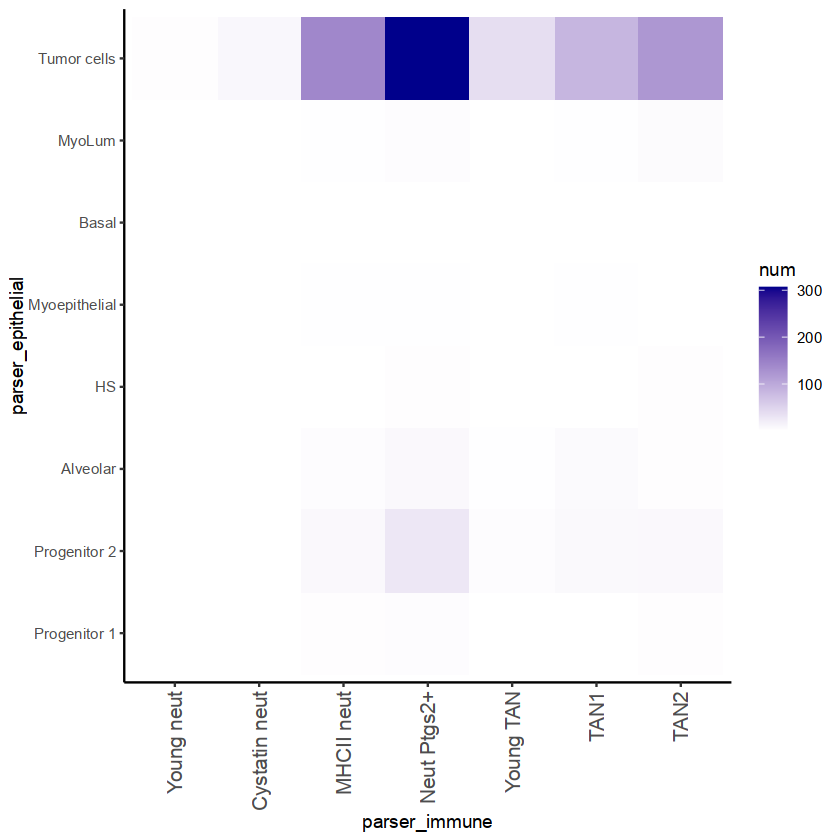

In [565]:
df %>%
    filter(Age %in% c('10w', '12w'), condition == 'tumor') %>%
    group_by(parser_immune, parser_epithelial, Age) %>%
    summarise(num=length(Age))  %>%
    mutate(parser_epithelial=factor(parser_epithelial, levels=cell_order), 
           parser_immune=factor(parser_immune, levels=cell_order)) %>%
    filter(Age %in% c('8w', '10w', '12w')) %>%
    ggplot(aes(x=parser_immune, y=parser_epithelial, fill=num)) +
    geom_tile() +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12)) +
    scale_fill_gradient(low='white', high='darkblue')

`summarise()` has grouped output by 'parser_immune', 'Age', 'Cell_type'. You
can override using the `.groups` argument.


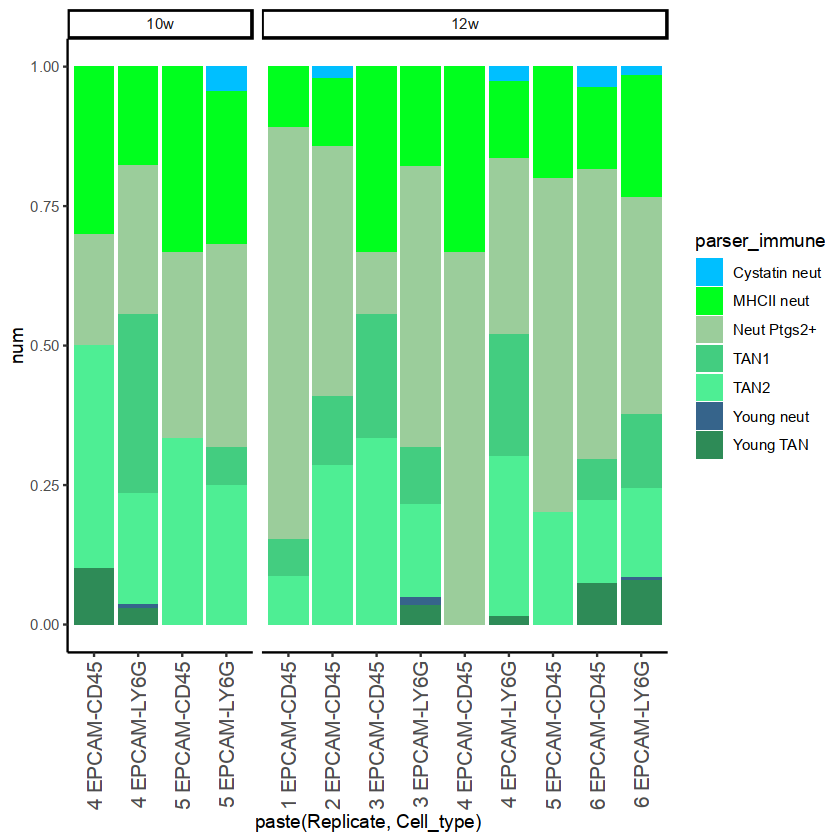

In [566]:
df %>% 
    filter(Age %in% c('10w', '12w'), condition == 'tumor') %>%
    group_by(parser_immune, Age, Cell_type, Replicate) %>%
    summarise(num=n())  %>%
    ggplot(aes(x=paste(Replicate, Cell_type), y=num, fill=parser_immune)) +
    geom_bar(stat='identity', position='fill') +
    scale_fill_manual(values = group.colors) +
    facet_grid(~ Age, scales = 'free_x', space = 'free_x') +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12))

In [567]:
cell_stats

,Amp.Batch.ID,Well_position,Seq.Batch.ID,Date of sequencing,Batch.Set.ID,Owner,Date of sort,"Plate ID (15 characters, no _/+)",Plate description,Empty_well,⋯,comment,Replicate,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,amp_batch_id,is_pic,epithelial_type,immune_type
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<lgl>,⋯,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
AB542_P7,AB542,P7,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsCD45-Epcam12wT7,FALSE,⋯,,4,318,529,97,18.3364839,1,PIC,Tumor cells,Neut Ptgs2+
AB542_A4,AB542,A4,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsCD45-Epcam12wT7,FALSE,⋯,,4,470,778,101,12.9820051,1,PIC,Tumor cells,MHCII neut
AB542_A13,AB542,A13,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsCD45-Epcam12wT7,FALSE,⋯,,4,494,803,142,17.6836862,1,PIC,Tumor cells,Neut Ptgs2+
AB539_A7,AB539,A7,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,,4,323,543,94,17.3112339,1,PIC,Tumor cells,MHCII neut
AB539_K21,AB539,K21,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,,4,807,1668,171,10.2517986,1,PIC,Tumor cells,TAN1
AB539_L4,AB539,L4,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,,4,470,807,34,4.2131351,1,PIC,Tumor cells,TAN2
AB539_E3,AB539,E3,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,,4,664,1201,285,23.7302248,1,PIC,Tumor cells,MHCII neut
AB539_O11,AB539,O11,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,,4,1112,2516,454,18.0445151,1,PIC,Tumor cells,MHCII neut
AB539_G13,AB539,G13,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,,4,834,1420,202,14.2253521,1,PIC,Tumor cells,Neut Ptgs2+


`summarise()` has grouped output by 'immune_type', 'is_pic', 'Age',
'Cell_type'. You can override using the `.groups` argument.


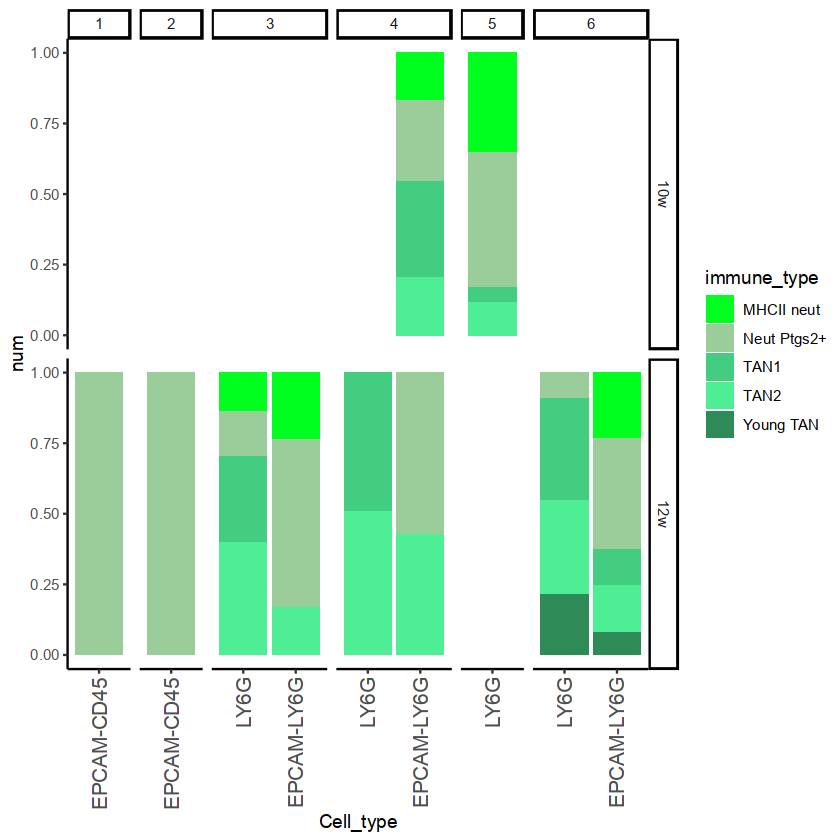

In [568]:
cell_stats %>% 
    filter(Age %in% c('10w', '12w'), condition == 'tumor', !is.na(immune_type),
           epithelial_type == "Tumor cells" | is_pic == "Singlet") %>%
    group_by(immune_type, is_pic, Age, Cell_type, Replicate) %>%
    summarise(num=n())  %>%
    mutate(Cell_type = factor(Cell_type, levels=c('LY6G', 'EPCAM-LY6G', 'EPCAM-CD45'))) %>%
    filter(num > 15) %>%
    ggplot(aes(x=Cell_type, y=num, fill=immune_type)) +
    geom_bar(stat='identity', position='fill') +
    scale_fill_manual(values = group.colors) +
    facet_grid(Age ~ Replicate, scales = 'free', space = 'free') +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12))

In [569]:
cell_stats %>% 
    filter(Age %in% c('10w', '12w'), condition == 'tumor', !is.na(immune_type),
           epithelial_type == "Tumor cells" | is_pic == "Singlet") %>%
    mutate(mc = ifelse(is_pic == "Singlet", sin_cl@mc[rownames(.)], mle_res[rownames(.), 'b_mc']),
           alt_annot = ifelse(mc %in% c(2,6), 'Myd88', 'immune_type'))

,Amp.Batch.ID,Well_position,Seq.Batch.ID,Date of sequencing,Batch.Set.ID,Owner,Date of sort,"Plate ID (15 characters, no _/+)",Plate description,Empty_well,⋯,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,amp_batch_id,is_pic,epithelial_type,immune_type,mc,alt_annot
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<lgl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<chr>
AB542_P7,AB542,P7,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsCD45-Epcam12wT7,FALSE,⋯,318,529,97,18.3364839,1,PIC,Tumor cells,Neut Ptgs2+,3,immune_type
AB542_A4,AB542,A4,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsCD45-Epcam12wT7,FALSE,⋯,470,778,101,12.9820051,1,PIC,Tumor cells,MHCII neut,2,Myd88
AB542_A13,AB542,A13,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsCD45-Epcam12wT7,FALSE,⋯,494,803,142,17.6836862,1,PIC,Tumor cells,Neut Ptgs2+,3,immune_type
AB539_A7,AB539,A7,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,323,543,94,17.3112339,1,PIC,Tumor cells,MHCII neut,10,immune_type
AB539_K21,AB539,K21,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,807,1668,171,10.2517986,1,PIC,Tumor cells,TAN1,16,immune_type
AB539_L4,AB539,L4,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,470,807,34,4.2131351,1,PIC,Tumor cells,TAN2,14,immune_type
AB539_E3,AB539,E3,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,664,1201,285,23.7302248,1,PIC,Tumor cells,MHCII neut,6,Myd88
AB539_O11,AB539,O11,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,1112,2516,454,18.0445151,1,PIC,Tumor cells,MHCII neut,10,immune_type
AB539_G13,AB539,G13,SB009,21/05/2023,sandra-12w-4,Sandra,23/04/2023,,PICsLy6g/Epcam12wT3,FALSE,⋯,834,1420,202,14.2253521,1,PIC,Tumor cells,Neut Ptgs2+,5,immune_type


`summarise()` has grouped output by 'alt_immune', 'is_pic', 'Age', 'Cell_type'.
You can override using the `.groups` argument.


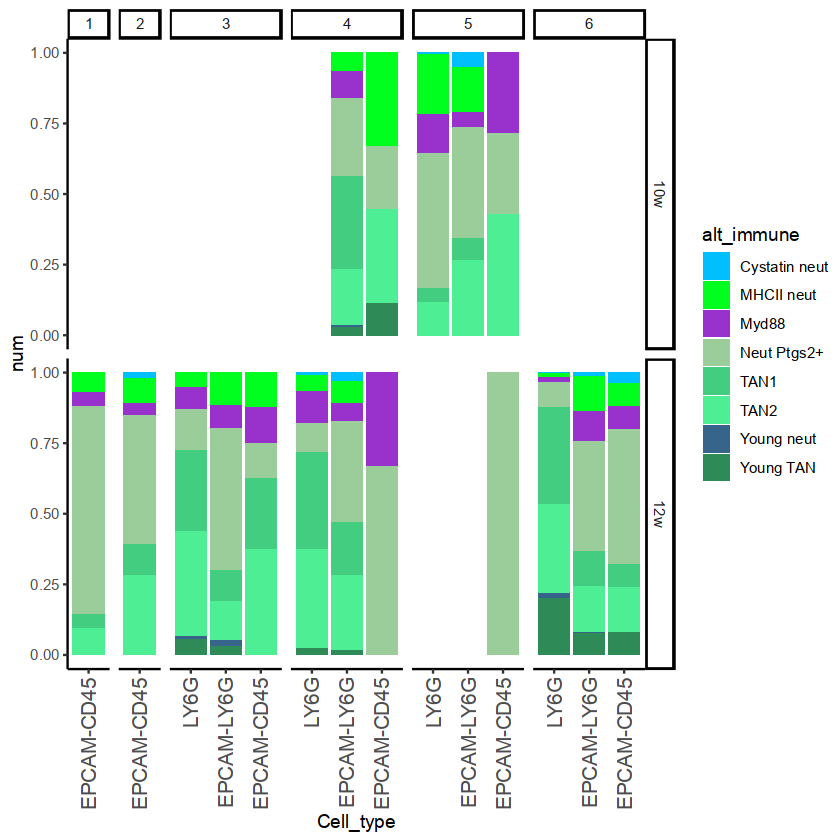

In [570]:
cell_stats %>% 
    filter(Age %in% c('10w', '12w'), condition == 'tumor', !is.na(immune_type),
           epithelial_type == "Tumor cells" | is_pic == "Singlet") %>%
    mutate(mc = ifelse(is_pic == "Singlet", sin_cl@mc[rownames(.)], mle_res[rownames(.), 'b_mc']),
           alt_immune = ifelse(mc %in% c(2,6), 'Myd88', immune_type)) %>%
    group_by(alt_immune, is_pic, Age, Cell_type, Replicate) %>%
    summarise(num=n())  %>%
    mutate(Cell_type = factor(Cell_type, levels=c('LY6G', 'EPCAM-LY6G', 'EPCAM-CD45'))) %>%
    ggplot(aes(x=Cell_type, y=num, fill=alt_immune)) +
    geom_bar(stat='identity', position='fill') +
    scale_fill_manual(values = c(group.colors, Myd88='darkorchid')) +
    facet_grid(Age ~ Replicate, scales = 'free', space = 'free') +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12))

`summarise()` has grouped output by 'immune_type', 'is_pic', 'Age',
'Cell_type'. You can override using the `.groups` argument.


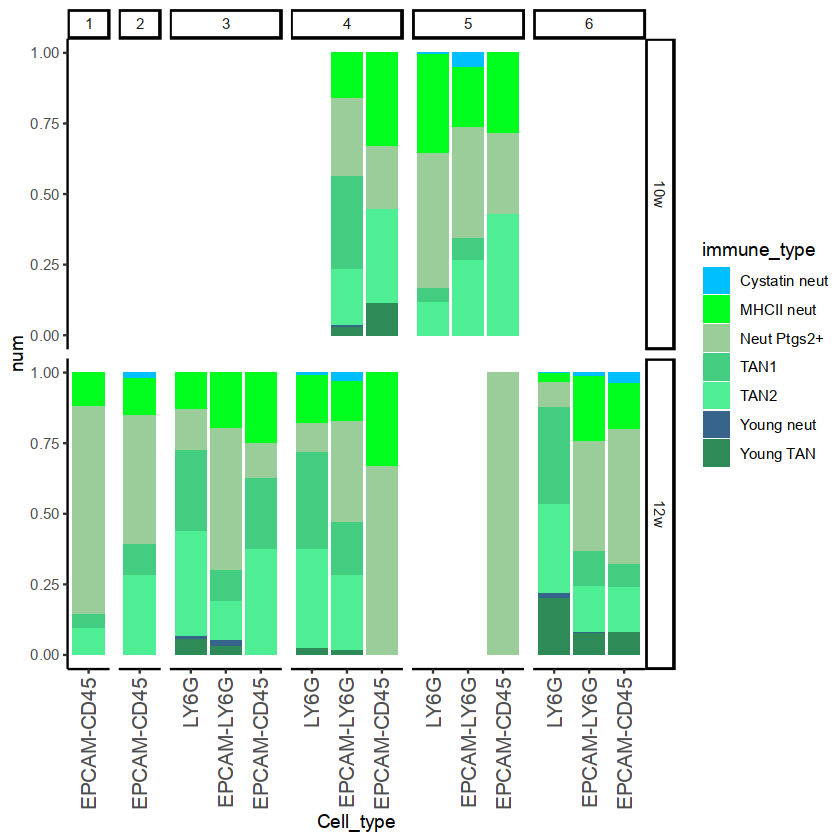

In [571]:
cell_stats %>% 
    filter(Age %in% c('10w', '12w'), condition == 'tumor', !is.na(immune_type),
           epithelial_type == "Tumor cells" | is_pic == "Singlet") %>%
    mutate(mc = ifelse(is_pic == "Singlet", sin_cl@mc[rownames(.)], mle_res[rownames(.), 'b_mc'])) %>%
    group_by(immune_type, is_pic, Age, Cell_type, Replicate) %>%
    summarise(num=n())  %>%
    mutate(Cell_type = factor(Cell_type, levels=c('LY6G', 'EPCAM-LY6G', 'EPCAM-CD45'))) %>%
    ggplot(aes(x=Cell_type, y=num, fill=immune_type)) +
    geom_bar(stat='identity', position='fill') +
    scale_fill_manual(values = c(group.colors, Myd88='darkorchid')) +
    facet_grid(Age ~ Replicate, scales = 'free', space = 'free') +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12))

#### OLD

In [572]:
df[df$condition == 'tumor',] %>% group_by(parser_immune, parser_epithelial) %>%
    summarise(num=length(Age))  %>%
    dcast(parser_immune ~ parser_epithelial, fill = 0) %>%
    column_to_rownames('parser_immune') %>%
    cbind(total=rowSums(.)) %>%
    rbind(total=colSums(.))

`summarise()` has grouped output by 'parser_immune'. You can override using the
`.groups` argument.
Using num as value column: use value.var to override.



,Alveolar,Basal,HS,Myoepithelial,MyoLum,Progenitor 1,Progenitor 2,Tumor cells,total
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Cystatin neut,0,0,0,0,0,1,0,12,13
MHCII neut,7,0,3,3,2,7,13,192,227
Neut Ptgs2+,13,2,4,3,8,9,34,409,482
TAN1,8,0,1,2,2,3,12,155,183
TAN2,4,0,4,2,8,6,11,183,218
Young neut,0,0,0,0,0,0,1,4,5
Young TAN,3,0,0,0,0,2,4,45,54
total,35,2,12,10,20,28,75,1000,1182


`summarise()` has grouped output by 'parser_immune', 'parser_epithelial'. You
can override using the `.groups` argument.
Saving 6.67 x 6.67 in image


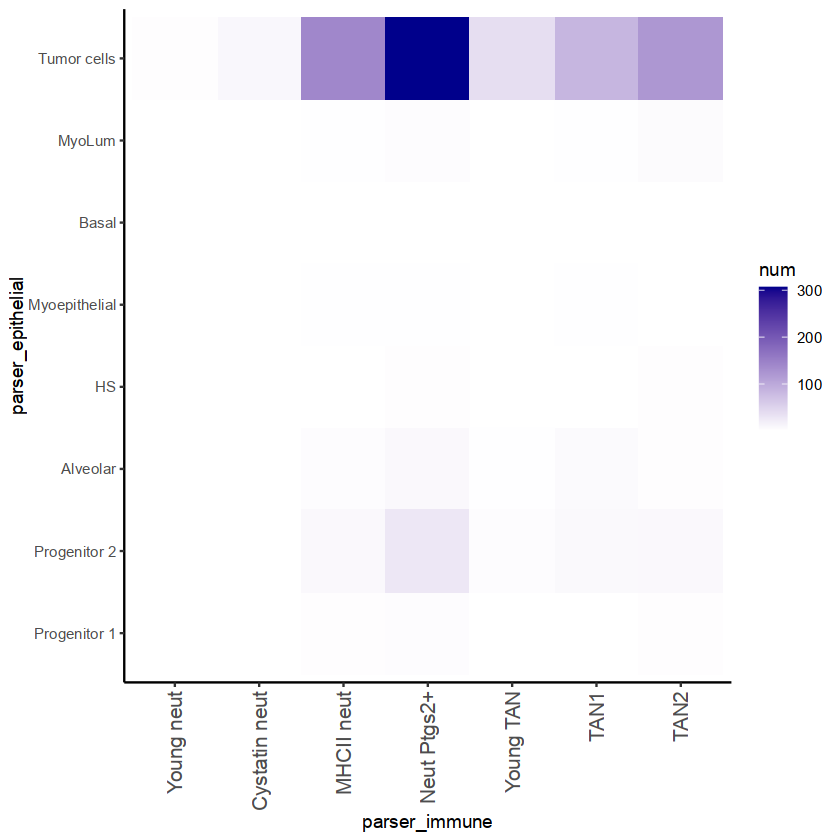

In [573]:
df[df$condition == 'tumor',] %>% group_by(parser_immune, parser_epithelial, Age) %>%
    summarise(num=length(Age))  %>%
    mutate(parser_epithelial=factor(parser_epithelial, levels=cell_order), 
           parser_immune=factor(parser_immune, levels=cell_order)) %>%
    filter(Age %in% c('8w', '10w', '12w')) %>%
    ggplot(aes(x=parser_immune, y=parser_epithelial, fill=num)) +
    geom_tile() +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12)) +
    scale_fill_gradient(low='white', high='darkblue')
ggsave('final_figs/supp4/comb_abundance.pdf')

`summarise()` has grouped output by 'parser_immune', 'parser_epithelial'. You
can override using the `.groups` argument.
Saving 6.67 x 6.67 in image


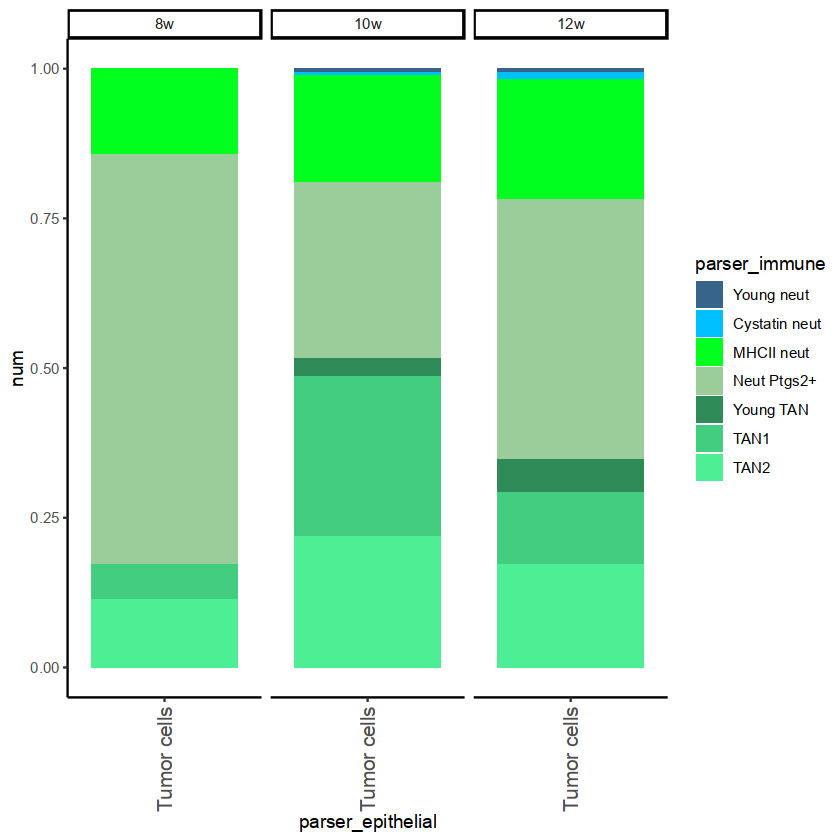

In [574]:
df[df$condition == 'tumor',] %>% group_by(parser_immune, parser_epithelial, Age) %>%
    summarise(num=length(Age))  %>%
    mutate(parser_epithelial=factor(parser_epithelial, levels=cell_order), 
           parser_immune=factor(parser_immune, levels=cell_order)) %>%
    filter(Age %in% c('8w', '10w', '12w')) %>%
    filter(parser_epithelial %in% c('Tumor cells')) %>%
    ggplot(aes(x=parser_epithelial, y=num, fill=parser_immune)) +
    geom_bar(stat='identity', position='fill') +
    scale_fill_manual(values = group.colors) +
    facet_grid(~ Age) +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12))

ggsave('final_figs/supp4/subcomposition_immune.pdf')

`summarise()` has grouped output by 'parser_immune', 'parser_epithelial'. You
can override using the `.groups` argument.
Saving 6.67 x 6.67 in image


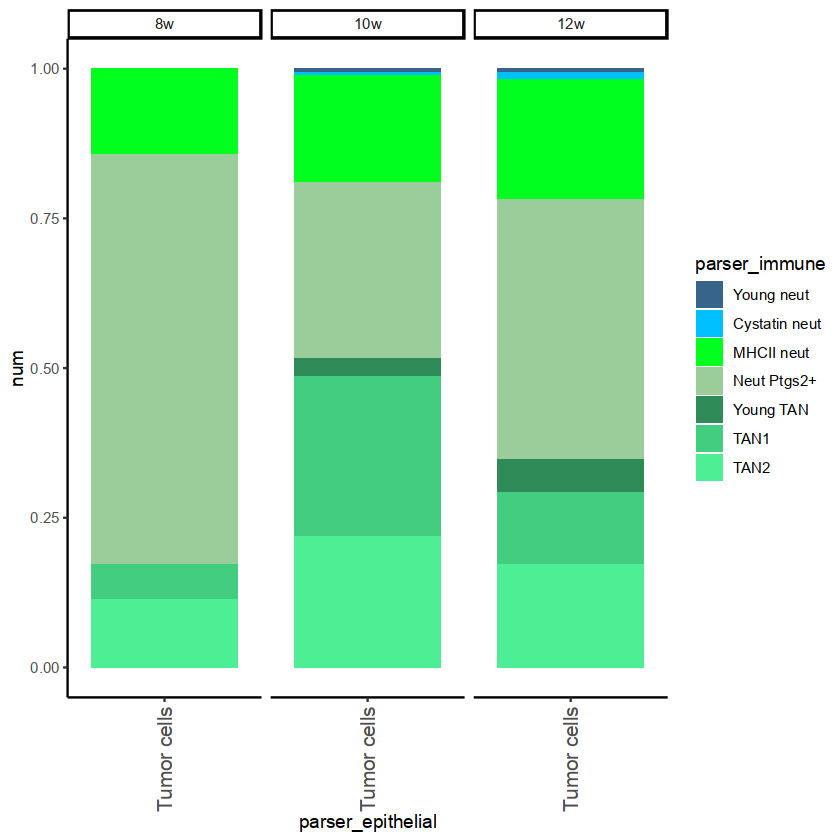

In [575]:
df[df$condition == 'tumor',] %>% group_by(parser_immune, parser_epithelial, Age) %>%
    summarise(num=length(Age))  %>%
    mutate(parser_epithelial=factor(parser_epithelial, levels=cell_order), 
           parser_immune=factor(parser_immune, levels=cell_order)) %>%
    filter(Age %in% c('8w', '10w', '12w')) %>%
    filter(parser_epithelial %in% c('Tumor cells')) %>%
    ggplot(aes(x=parser_epithelial, y=num, fill=parser_immune)) +
    geom_bar(stat='identity', position='fill') +
    scale_fill_manual(values = group.colors) +
    facet_grid(~ Age) +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12))

ggsave('final_figs/supp4/subcomposition_immune.pdf')

`summarise()` has grouped output by 'parser_immune', 'parser_epithelial'. You
can override using the `.groups` argument.
Saving 6.67 x 6.67 in image


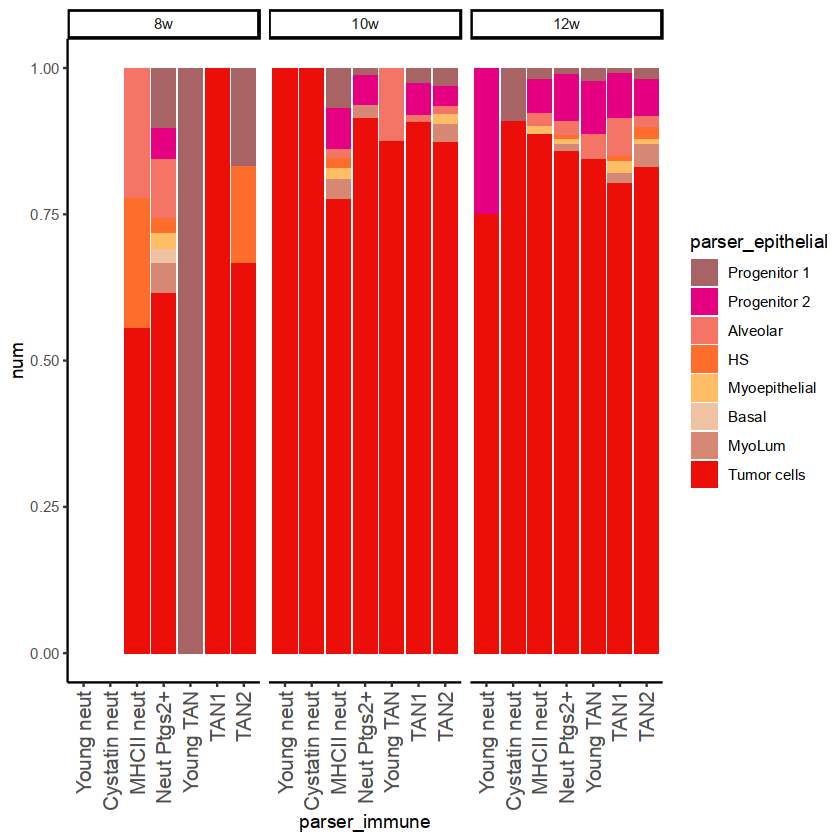

In [576]:
df[df$condition == 'tumor',] %>% group_by(parser_immune, parser_epithelial, Age) %>%
    summarise(num=length(Age))  %>%
    mutate(parser_epithelial=factor(parser_epithelial, levels=cell_order), 
           parser_immune=factor(parser_immune, levels=cell_order)) %>%
    filter(Age %in% c('8w', '10w', '12w')) %>%
    #filter(parser_immune %in% c('TAN1', 'TAN2', 'Recruiters', 'Mature')) %>%
    ggplot(aes(x=parser_immune, y=num, fill=parser_epithelial)) +
    geom_bar(stat='identity', position='fill') +
    scale_fill_manual(values = group.colors) +
    facet_grid(~ Age) +
    theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1, size=12))

ggsave('final_figs/supp4/subcomposition_epithelial.pdf')

# New DGE analysis

In [45]:
good_pics = read_lines('annotations/neutrophil_good_pics_final.txt')

In [46]:
db_mat@cell_metadata[good_pics, 'Cell_type'] %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       166        739 

In [11]:
db_mat@cell_metadata[rownames(mle_res), 'Cell_type'] %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       175       1015 

In [10]:
good_pics = rownames(mle_res)

In [16]:
db_mat@cell_metadata[good_pics,] %>%
    filter(Cell_type == "EPCAM-LY6G") %>%
    group_by(Age, condition, Cell_type) %>%
    summarise(n_replicates = length(unique(Replicate)), n_plates=length(unique(Amp.Batch.ID)), n_cells=n()) %>%
    mutate(Age = factor(Age, levels=age_order)) %>%
    arrange(Age, condition, Cell_type) %>%
    write_csv("final_figs/supp1/nums_table_ly6g_pics.csv")

`summarise()` has grouped output by 'Age', 'condition'. You can override using
the `.groups` argument.


In [208]:
189 + 842 

[1] 1031

In [209]:
203 + 1168

[1] 1371

In [210]:
length(setdiff(good_pics, db_mat@cells))

[1] 0

In [47]:
good_pics = intersect(good_pics, db_mat@cells)
# REMOVE

In [52]:
numis=500
pic_umis = read_large_umis("neutrophil_clean_pics", cells = good_pics)
ds = .downsamp(pic_umis, numis)
message("Retained ", ncol(ds), " PIC with >", numis, " UMI")

Retained 1190 PIC with >500 UMI



In [18]:
mature_immune_pops = c('MHCII neut', 'Neut Ptgs2+', 'Young TAN', 'TAN1', 'TAN2')

In [54]:
analyzed_pics = good_pics[db_mat@cell_metadata[good_pics,'Age'] %in% c('10w', '12w') & 
                          db_mat@cell_metadata[good_pics,'condition'] == 'tumor' &
                          parser_epithelial[good_pics] %in% c('Tumor cells') &
                          parser_immune[good_pics] %in% mature_immune_pops]

In [55]:
length(analyzed_pics)

[1] 942

In [225]:
analyzed_parser = parser_immune[analyzed_pics]

In [226]:
length(sin_mat@genes)

[1] 37023

In [227]:
length(rownames(pic_umis))

[1] 37508

In [228]:
bad_pat_genes = db_mat@genes[grepl("Rpl|Rps|Gm|Rik|Mcm[0-9]|Scm[0-9]", db_mat@genes)]

In [62]:
shared_mat_genes = intersect(names(which(rowSums(sin_mat@mat[,c(immune_cells, epithelial_cells)]) > 3)), 
                             names(which(rowSums(pic_umis[,analyzed_pics]) > 3))) %>%
    setdiff(bad_genes)

In [63]:
length(shared_mat_genes)

[1] 12916

In [410]:
simulate_npics = function(cell_name, n=50, return_separated=T, select_half=0){
    numis = sum(pic_umis[shared_mat_genes, cell_name])
    mc_a = mle_res[cell_name,'a_mc']
    mc_b = mle_res[cell_name,'b_mc']
    alpha = mle_res[cell_name,'alpha']
    numis_a = round(alpha * numis)
    numis_b = numis - numis_a
    cell_a_options = names(which(sin_cl@mc == mc_a))
    cell_b_options = names(which(sin_cl@mc == mc_b))
    if (select_half == 1){
        cell_a_options = cell_a_options[1:floor(length(cell_a_options) / 2)]
        cell_b_options = cell_b_options[1:floor(length(cell_b_options) / 2)]
    } else if (select_half == 2){
        cell_a_options = cell_a_options[ceiling(length(cell_a_options) / 2):length(cell_a_options)]
        cell_b_options = cell_b_options[ceiling(length(cell_b_options) / 2):length(cell_b_options)]
    }
    cells_a = sample(cell_a_options, size = n, replace = T)
    cells_b = sample(cell_b_options, size = n, replace = T)
    cell_sizes = colSums(sin_mat@mat[shared_mat_genes, c(cells_a, cells_b)])
    a_modifier = pmax(ceiling(numis_a / cell_sizes[cells_a]), 1)
    b_modifier = pmax(ceiling(numis_b / cell_sizes[cells_b]), 1)
    a_umis = .downsamp_var(sweep(sin_mat@mat[shared_mat_genes, cells_a], 2, a_modifier, "*"), rep(numis_a, n), replace=F)
    colnames(a_umis) = paste(cell_name, "sim", 1:n, "epi", sep="_")
    b_umis = .downsamp_var(sweep(sin_mat@mat[shared_mat_genes, cells_b], 2, b_modifier, "*"), rep(numis_b, n), replace=F)
    colnames(b_umis) = paste(cell_name, "sim", 1:n, "imm", sep="_")
    simpic_umis = a_umis + b_umis
    colnames(simpic_umis) = paste(cell_name, "sim", 1:n, sep="_")
    if (return_separated){
        return(cbind(a_umis, b_umis, simpic_umis))
    } else {
        return(simpic_umis)
    }
    
}

In [411]:
simpics_full = sapply(analyzed_pics, function(x){simulate_npics(x, n=1000, return_separated=T)}) %>% do.call(cbind, .)

In [412]:
scdb_add_mat("sims_1000_new", simpics_full)

In [327]:
simpics_full = scdb_mat("sims_1000_new")

In [621]:
nrow(simpics_full)

[1] 12778

In [329]:
ncol(simpics_full)

[1] 2874000

In [330]:
simpics_imm = simpics_full[,grepl("imm", colnames(simpics_full))]
simpics_epi = simpics_full[,grepl("epi", colnames(simpics_full))]
simpics = simpics_full[,!(grepl("imm", colnames(simpics_full)) | grepl("epi", colnames(simpics_full)))]

In [331]:
sim_pics_2 = sapply(analyzed_pics, function(x){simulate_npics(x, n=3, return_separated = F)}) %>% do.call(cbind, .)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'args' in selecting a method for function 'do.call': could not find function "simulate_npics"


In [ ]:
sim_pics_sin1 = sim_pics_2[,seq(1,ncol(sim_pics_2),3)]
sim_pics_sin2 = sim_pics_2[,seq(2,ncol(sim_pics_2),3)]
sim_pics_sin3 = sim_pics_2[,seq(3,ncol(sim_pics_2),3)]

In [ ]:
all(colSums(simpics[shared_mat_genes,]) == rep(colSums(pic_umis[shared_mat_genes,analyzed_pics]), each=1000))

In [ ]:
all_mat = t(pic_umis[shared_mat_genes,])

In [57]:
all_mat = t(pic_umis[shared_mat_genes,analyzed_pics])
norm_num = median(rowSums(all_mat))
norm_mat = norm_num * all_mat / rowSums(all_mat)
message("Normalized by ", norm_num)
#lognorm_mat = log1p(10000 * all_mat / rowSums(all_mat))

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 't': object 'shared_mat_genes' not found


In [ ]:
norm_sim1 = norm_num * t(sim_pics_sin1) / colSums(sim_pics_sin1)

norm_sim2 = norm_num * t(sim_pics_sin2) / colSums(sim_pics_sin2)

norm_sim3 = norm_num * t(sim_pics_sin3) / colSums(sim_pics_sin3)

In [ ]:
norm_sim = norm_num * t(simpics) / colSums(simpics)

In [ ]:
data.frame(x=1 + colMeans(norm_mat), y=1 + colMeans(norm_sim)) %>%
    ggplot(aes(x=x, y=y)) +
    geom_point(color='steelblue') +
    #geom_smooth(method='lm') +
    geom_abline(intercept = 0, slope = 1) +
    scale_x_log10(labels=scales::number) +
    scale_y_log10(labels=scales::number) +
    labs(x="Observed", y="Simulated", title = "UMIs per 10000 + 1") +
    theme(plot.title = element_text(hjust=0.5, size = 16, face='bold'))

In [ ]:
data.frame(x=1 + colMeans(norm_mat), y=1 + colMeans(norm_sim)) %>% lm(formula = x~y) %>% summary

In [ ]:
data.frame(x=1 + colMeans(norm_sim1), y=1 + colMeans(norm_sim)) %>%
    ggplot(aes(x=x, y=y)) +
    geom_point(color='steelblue') +
    #geom_smooth(method='lm') +
    geom_abline(intercept = 0, slope = 1) +
    scale_x_log10(labels=scales::number) +
    scale_y_log10(labels=scales::number) +
    labs(x="Sim1", y="Simulated", title = "UMIs per 10000 + 1") +
    theme(plot.title = element_text(hjust=0.5, size = 16, face='bold'))

In [ ]:
data.frame(x=1 + colMeans(norm_sim1), y=1 + colMeans(norm_sim)) %>% lm(formula = x~y) %>% summary

# Means analysis

In [ ]:
all_mat = t(pic_umis[shared_mat_genes,analyzed_pics])
norm_num = median(rowSums(all_mat))
norm_mat = norm_num * all_mat / rowSums(all_mat)
message("Normalized by ", norm_num)
#lognorm_mat = log1p(10000 * all_mat / rowSums(all_mat))

In [ ]:
norm_sim = norm_num * t(simpics) / colSums(simpics)
#lognorm_sim = log1p(10000 * t(simpics) / colSums(simpics))

In [ ]:
norm_sim_epi = rep(mle_res[analyzed_pics,'alpha'], each=1000) * norm_num * t(simpics_epi) / colSums(simpics_epi)
norm_sim_imm = (1 - rep(mle_res[analyzed_pics,'alpha'], each=1000)) * norm_num * t(simpics_imm) / colSums(simpics_imm)

In [ ]:
plot_scatter = function(df, fname=NA, pval_thresh=0.01){
    p = ggplot(df %>% arrange(desc(adj_pval)), aes(x=log(0.1 + Simulated_mean), y=log(0.1 + Observed_mean), 
                                                   color=color, size=size, label=label)) +
        geom_text_repel(max.overlaps = 1000, color='black') +
        geom_point() +
        scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) +
        scale_size_identity() +
        geom_abline(intercept = 0, slope=1, color='black', linetype='solid')
    if (!is.na(fname)){
        l = get_legend(p)
        p = plot_grid(p + theme(legend.position="none"))

        ggsave(fname, plot = p)
        ggsave(paste0(fname, "_legend.pdf"), plot = l)
    }
}

In [ ]:
plot_volcano = function(df, fname=NA, pval_thresh=0.01, lfc_thresh=0.5){
    p = ggplot(df %>% arrange(desc(adj_pval)), aes(x=lfc, y=-log10(adj_pval), color=color, size=size, label=label)) +
        geom_point(show.legend=F) +
        geom_text_repel(max.overlaps = 1000, color='black') +
        scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) +
        scale_size_identity() +
        geom_hline(yintercept = -log10(pval_thresh), linetype='longdash', color='gray') +
        geom_vline(xintercept = c(-lfc_thresh, lfc_thresh), linetype='longdash', color='gray')
    if (!is.na(fname)){
        l = get_legend(p)
        p = plot_grid(p + theme(legend.position="none"))

        ggsave(fname, plot = p)
        ggsave(paste0(fname, "_legend.pdf"), plot = l)
    }
}

In [ ]:
per_gene_plots = function(gene, dirname, focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                          pval, lfc){
    plot_df = data.frame(mean_norm_expr=c(focus_sim_means[gene,], mean(focus_norm_mat[,gene])),
                         source=c(rep("Simulated", 1000), "Observed"))
    gene_mean = mean(plot_df[plot_df$source == "Simulated","mean_norm_expr"])
    gene_sd = sd(plot_df[plot_df$source == "Simulated","mean_norm_expr"])
    
    # Distribution with SDs
    ggplot(plot_df, aes(x=mean_norm_expr)) +
        geom_density(data=plot_df[plot_df$source == "Simulated",]) +
        geom_vline(xintercept = gene_mean, color='blue', linetype='longdash') +
        geom_vline(xintercept = c(gene_mean + gene_sd, gene_mean - gene_sd), color='steelblue', linetype='longdash') +
        geom_vline(xintercept = c(gene_mean + (2 * gene_sd), gene_mean - (2 * gene_sd)), color='gray', linetype='longdash') +
        geom_vline(xintercept = plot_df[plot_df$source == "Observed","mean_norm_expr"], color='red') +
        geom_point(data=plot_df[plot_df$source == "Observed",], aes(y=0), color='red', size=3) +
        labs(title=gene, subtitle = paste0("adj_pval", pval, " ; lfc = ", round(lfc, 2))) +
        theme(plot.title = element_text(size=16, hjust=0.5, face='bold'), plot.subtitle = element_text(size=12, hjust=0.5))
    ggsave(paste0(dirname, "/", gene, "_dist.pdf"))
    
    # Plot of all means
    ggplot(plot_df, aes(x=1, y=mean_norm_expr)) +
        geom_boxplot(data=. %>% filter(source == "Simulated")) +
        geom_jitter(width=0.1, aes(color=source, shape=source, size=source)) +
        scale_shape_manual(values = c(19, 1)) +
        scale_size_manual(values = c(5, 3)) +
        labs(title=gene, subtitle = paste0("adj_pval", pval, " ; lfc = ", round(lfc, 2))) +
        theme(plot.title = element_text(size=16, hjust=0.5, face='bold'), plot.subtitle = element_text(size=12, hjust=0.5),
              axis.title.x = element_blank(), axis.ticks.x = element_blank(), axis.text.x = element_blank())
        #scale_x_discrete(limits=c("Simulated", "Observed"))
    ggsave(paste0(dirname, "/", gene, "_means.pdf"), width=5, height=15)
    
    # Violin plot
    #plot_df = data.frame(LogNorm_expression=log1p(c(focus_norm_sim[,gene], focus_norm_mat[,gene])),
    #                     Source=factor(c(rep("Simulated", nrow(focus_norm_sim)), rep("Observed", nrow(focus_norm_mat))),
    #                                   levels = c("Simulated", "Observed")))
    #ggplot(plot_df, aes(x=Source, fill=Source, y=LogNorm_expression)) +
    #    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75)) +
    #    labs(title=gene) +
    #    theme(plot.title = element_text(size=20, hjust=0.5, face='bold'))
    #ggsave(paste0(dirname, "/", gene, "_violin.pdf"))
    
    # Bar plot
    bar_df = data.frame(source=factor(c(rep("Simulated", 2), "Observed"), levels=c("Simulated", "Observed")),
                        cell=c("Epithelial", "Neutrophil", "PIC"),
                        expression=c(epi_means[gene], imm_means[gene], mean(focus_norm_mat[,gene])))

    ggplot(bar_df, aes(x=source, y=expression, fill=cell)) +
        geom_bar(stat = 'identity', position = 'stack', color='black') +
        labs(title=gene, subtitle = paste0("adj_pval", pval, " ; lfc = ", round(lfc, 2))) +
        theme(plot.title = element_text(size=16, hjust=0.5, face='bold'), plot.subtitle = element_text(size=12, hjust=0.5))
    ggsave(paste0(dirname, "/", gene, "_barplot.pdf"))

}

In [591]:
p = ggplot(data.frame(x=1, y=1, color=seq(0,1,length.out = 1000)), aes(x=x, y=y, color=color)) +
    geom_tile() +
    scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) 
l = get_legend(p)

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


In [592]:
ggsave(filename = "final_figs/fig5/color_legend.pdf", plot=l)

Saving 6.67 x 6.67 in image


In [593]:
parser_immune %>% unique

[1] "Neut Ptgs2+"   "MHCII neut"    "TAN1"          "TAN2"         
[5] "Cystatin neut" "Young TAN"     "Young neut"

In [ ]:
mature_immune_pops = c('MHCII neut', 'Neut Ptgs2+', 'Young TAN', 'TAN1', 'TAN2')

In [595]:
# ATTEMPT AT RETURNING TO NEW_GENE VERSION

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
reg=1
per_gene = F

for (pop_name in c('All', mature_immune_pops)){
    message("===================================================")
    message(pop_name)
    if (pop_name == "All"){
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', mature_immune_pops)]
        is_focus = parser_immune[analyzed_pics] %in% mature_immune_pops
    } else {
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', pop_name)]
        is_focus = parser_immune[analyzed_pics] == pop_name
    }
    focus_mat = pic_umis[,analyzed_pics][,is_focus]
    focus_norm_mat = norm_mat[is_focus,]
    focus_means = colMeans(focus_norm_mat)
    
    # Simulation means    
    sim_means_file = paste0("final_figs/fig5/new_gene/", pop_name, "_sim_means.csv")
    if (file.exists(sim_means_file)) {
        message("---Simulation means file found - loading...")
        focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
    } else {
        message("---Calculating simulation means...")
        focus_norm_sim = norm_sim[rep(is_focus, each=n_sims),]
        focus_sim_means = sapply(1:n_sims, function(n){colMeans(focus_norm_sim[grepl(paste0("sim_", n, "$"), 
                                                                           rownames(focus_norm_sim)),])}) 
        message("---Saving...")
        write.csv(focus_sim_means, sim_means_file)
    }
    
    # Gene data
    gene_data_file = paste0("final_figs/fig5/new_gene/", pop_name, "_genedata.csv")
    if (file.exists(gene_data_file)) {
        message("---Gene data file found - loading...")
        gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
    } else {
        message("---Calculating z-score pvals, lfcs etc...")
        focus_sim_sds = sapply(shared_mat_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            return(sd(sim_vals))
        })
        focus_z_scores = sapply(shared_mat_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
            return(z_score)
        })
        focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

        focus_sim_meanofmeans = rowMeans(focus_sim_means)
        focus_lfcs = log2((reg + focus_means[shared_mat_genes]) / (reg + focus_sim_meanofmeans[shared_mat_genes]))
        epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),shared_mat_genes])
        imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),shared_mat_genes])
        epi_imm_ratio = epi_means / (epi_means + imm_means)

        gene_df = data.frame(Observed_mean = focus_means[shared_mat_genes],
                             Simulated_mean = focus_sim_meanofmeans[shared_mat_genes],
                             Sim_SD = focus_sim_sds,
                             z_scores = focus_z_scores,
                             full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                             lfc=focus_lfcs,
                             epi_imm_ratio=epi_imm_ratio)
        gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
        write.csv(gene_df, gene_data_file)
    }
    
    # Plots
    message("---Creating plots...")    
    plot_df = gene_df %>% 
        mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
               size=ifelse(adj_pval < pval_thresh, 3, 1),
               label=ifelse(adj_pval < pval_thresh, rownames(.), ""))
    
    plot_scatter(plot_df, pval_thresh = pval_thresh, 
                 fname=paste0("final_figs/fig5/new_gene/", pop_name, "_scatter.pdf"))
    plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
                 fname=paste0("final_figs/fig5/new_gene/", pop_name, "_volcano.pdf"))
    if (per_gene){
        dir.create(paste0("final_figs/fig5/new_gene/", pop_name))
        sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
        for (gene in sig_genes){
            gene = unlist(str_split(gene, "\\."))[1]
            message(paste0("    ", gene))
            per_gene_plots(gene, paste0("final_figs/fig5/new_gene/", pop_name), focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                           ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                                  ' < 1e-5', 
                                  paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                           gene_df[gene, 'lfc'])
        }
    }
}


All

---Calculating simulation means...

---Saving...

---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 232 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

MHCII neut

---Calculating simulation means...

---Saving...

---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 157 unlabeled data p

In [641]:
length(analyzed_pics)

[1] 958

In [680]:
parser_immune %>% table

.
Cystatin neut    MHCII neut   Neut Ptgs2+          TAN1          TAN2 
           13           229           486           183           218 
   Young neut     Young TAN 
            7            54 

In [697]:
# EXISTING ANALYSIS PRE-26.02

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
per_gene = F
min_topn = 1
n_topn = 10
min_total=50

for (pop_name in c('All_ONLY_WITHOUT_YOUNG_TANS')){
    message("===================================================")
    message(pop_name)
    if (pop_name == "All_ONLY_WITHOUT_YOUNG_TANS"){
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', c('MHCII neut', 'Neut Ptgs2+', 'TAN1', 'TAN2'))]
        is_focus = parser_immune[analyzed_pics] %in% c('MHCII neut', 'Neut Ptgs2+', 'TAN1', 'TAN2')
    } else {
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', pop_name)]
        is_focus = parser_immune[analyzed_pics] == pop_name
    }
    focus_mat = pic_umis[,analyzed_pics][,is_focus]
    focus_norm_mat = norm_mat[is_focus,]
    focus_means = colMeans(focus_norm_mat)
    
    # Simulation means    
    sim_means_file = paste0("final_figs/fig5/new_gene/", pop_name, "_sim_means.csv")
    if (file.exists(sim_means_file)) {
        message("---Simulation means file found - loading...")
        focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
    } else {
        message("---Calculating simulation means...")
        all_focus_sim = norm_sim[rep(is_focus, each=n_sims),]
        focus_sim_means = sapply(1:n_sims, function(n){colMeans(all_focus_sim[seq(n, nrow(all_focus_sim), n_sims),])}) 
        message("---Saving...")
        write.csv(focus_sim_means, sim_means_file)
    }
    
    
    print(length(shared_mat_genes))
    gene_data_file = paste0("final_figs/fig5/new_gene/", pop_name, "_genedata.csv")
    if (file.exists(gene_data_file)) {
        message("---Gene data file found - loading...")
        gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
    } else {
        message("---Calculating z-score pvals, lfcs etc...")
        focus_sim_sds = sapply(shared_mat_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            return(sd(sim_vals))
        })
        focus_z_scores = sapply(shared_mat_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
            return(z_score)
        })
        focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

        focus_sim_meanofmeans = rowMeans(focus_sim_means)
        focus_lfcs = log2((0.1 + focus_means[shared_mat_genes]) / (0.1 + focus_sim_meanofmeans[shared_mat_genes]))
        epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),shared_mat_genes])
        imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),shared_mat_genes])
        epi_imm_ratio = epi_means / (epi_means + imm_means)

        gene_df = data.frame(Observed_mean = focus_means[shared_mat_genes],
                             Simulated_mean = focus_sim_meanofmeans[shared_mat_genes],
                             Sim_SD = focus_sim_sds,
                             z_scores = focus_z_scores,
                             full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                             lfc=focus_lfcs,
                             epi_imm_ratio=epi_imm_ratio)
        gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
        write.csv(gene_df, gene_data_file)
    }
    
    # Plots
    message("---Creating plots...")    
    plot_df = gene_df %>% 
        mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
               size=ifelse(adj_pval < pval_thresh, 3, 1),
               label=ifelse(adj_pval < pval_thresh, rownames(.), ""))
    
    plot_scatter(plot_df, pval_thresh = pval_thresh, 
                 fname=paste0("final_figs/fig5/new_gene/", pop_name, "_scatter.pdf"))
    plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
                 fname=paste0("final_figs/fig5/new_gene/", pop_name, "_volcano.pdf"))
    if (per_gene){
        dir.create(paste0("final_figs/fig5/new_gene/", pop_name))
        sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
        for (gene in sig_genes){
            gene = unlist(str_split(gene, "\\."))[1]
            message(paste0("    ", gene))
            per_gene_plots(gene, pop_name, focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                           ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                                  ' < 1e-5', 
                                  paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                           gene_df[gene, 'lfc'])
        }
    }
}


All_ONLY_WITHOUT_YOUNG_TANS

---Simulation means file found - loading...



[1] 12350


---Calculating z-score pvals, lfcs etc...



ERROR: Error in focus_sim_means[gene, ]: subscript out of bounds


In [678]:
# EXISTING ANALYSIS PRE-26.02

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
per_gene = F
min_topn = 1
n_topn = 10
min_total=50

for (pop_name in c('All_ONLY_WITHOUT_YOUNG_TANS')){
    message("===================================================")
    message(pop_name)
    if (pop_name == "All_ONLY_WITHOUT_YOUNG_TANS"){
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', c('MHCII neut', 'Neut Ptgs2+', 'TAN1', 'TAN2'))]
        is_focus = parser_immune[analyzed_pics] %in% c('MHCII neut', 'Neut Ptgs2+', 'TAN1', 'TAN2')
    } else {
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', pop_name)]
        is_focus = parser_immune[analyzed_pics] == pop_name
    }
    focus_mat = pic_umis[,analyzed_pics][,is_focus]
    focus_norm_mat = norm_mat[is_focus,]
    focus_means = colMeans(focus_norm_mat)
    
    # Simulation means    
    sim_means_file = paste0("final_figs/fig5/new_gene/", pop_name, "_sim_means.csv")
    if (file.exists(sim_means_file)) {
        message("---Simulation means file found - loading...")
        focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
    } else {
        message("---Calculating simulation means...")
        all_focus_sim = norm_sim[rep(is_focus, each=n_sims),]
        focus_sim_means = sapply(1:n_sims, function(n){colMeans(all_focus_sim[seq(n, nrow(all_focus_sim), n_sims),])}) 
        message("---Saving...")
        write.csv(focus_sim_means, sim_means_file)
    }
    
    # Gene data
    print(length(shared_mat_genes))
    if (pop_name == "All"){
        analysis_genes = shared_mat_genes[(rowSums(focus_mat[shared_mat_genes,] > min_topn) >= n_topn) | 
                                          (rowSums(focus_singlets[shared_mat_genes,] > min_topn) >= n_topn)] %>% 
            setdiff('Rn18s-rs5')
        print(length(analysis_genes))
        analysis_genes = analysis_genes[rowSums(focus_mat[analysis_genes,]) > min_total]
    }
    
    print(length(analysis_genes))
    gene_data_file = paste0("final_figs/fig5/new_gene_sd/", pop_name, "_genedata_filt.csv")
    if (file.exists(gene_data_file)) {
        message("---Gene data file found - loading...")
        gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
    } else {
        message("---Calculating z-score pvals, lfcs etc...")
        focus_sim_sds = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            return(sd(sim_vals))
        })
        focus_z_scores = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
            return(z_score)
        })
        focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

        focus_sim_meanofmeans = rowMeans(focus_sim_means)
        focus_lfcs = log2((0.1 + focus_means[analysis_genes]) / (0.1 + focus_sim_meanofmeans[analysis_genes]))
        epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        epi_imm_ratio = epi_means / (epi_means + imm_means)

        gene_df = data.frame(Observed_mean = focus_means[analysis_genes],
                             Simulated_mean = focus_sim_meanofmeans[analysis_genes],
                             Sim_SD = focus_sim_sds,
                             z_scores = focus_z_scores,
                             full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                             lfc=focus_lfcs,
                             epi_imm_ratio=epi_imm_ratio)
        gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
        write.csv(gene_df, gene_data_file)
    }
    
    # Plots
    message("---Creating plots...")    
    plot_df = gene_df %>% 
        mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
               size=ifelse(adj_pval < pval_thresh, 3, 1),
               label=ifelse(adj_pval < pval_thresh, rownames(.), ""))
    
    plot_scatter(plot_df, pval_thresh = pval_thresh, 
                 fname=paste0("final_figs/fig5/new_gene_sd/", pop_name, "_scatter.pdf"))
    plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
                 fname=paste0("final_figs/fig5/new_gene_sd/", pop_name, "_volcano.pdf"))
    if (per_gene){
        dir.create(paste0("final_figs/fig5/new_gene_sd/", pop_name))
        sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
        for (gene in sig_genes){
            gene = unlist(str_split(gene, "\\."))[1]
            message(paste0("    ", gene))
            per_gene_plots(gene, pop_name, focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                           ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                                  ' < 1e-5', 
                                  paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                           gene_df[gene, 'lfc'])
        }
    }
}


All_ONLY_WITHOUT_YOUNG_TANS

---Calculating simulation means...

---Saving...



[1] 12350
[1] 4549


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 26 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


In [671]:
sin_cl = scdb_mc("merged_neutrophil_epithelial_mc"); sin_mat = scdb_mat("merged_neutrophil_epithelial_mat")
lfp = log2(sin_cl@mc_fp)
message("Loaded a metacell object of ", length(sin_cl@mc), " singlets. Total of ", length(table(sin_cl@mc)), " metacells.")

message("Loading PIC dataset:")
db_mat = scdb_mat("neutrophil_clean_pics")


Loaded a metacell object of 13516 singlets. Total of 317 metacells.

Loading PIC dataset:



In [672]:
sin_sce = scm_export_mat_to_sce("merged_neutrophil_epithelial_mat", add_log_counts = F, scale_to = 10000)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.7 GiB”


In [673]:
writeH5AD(sin_sce, "/mc_disk2/data/h5ads/breast/immune_epithelial.h5ad")

ℹ Using the 'counts' assay as the X matrix



In [674]:
pics_sce = scm_export_mat_to_sce("neutrophil_clean_pics", add_log_counts = F, scale_to = 10000)

In [675]:
writeH5AD(pics_sce, "/mc_disk2/data/h5ads/breast/neutrophil_clean_pics.h5ad")

ℹ Using the 'counts' assay as the X matrix



In [676]:
data.frame(mc=sin_cl@mc, annot=sin_cl@annots[sin_cl@mc], color=sin_cl@colors[sin_cl@mc]) %>%
    arrange(mc) %>%
    write.csv("annotations/mc_for_pypic.csv")

# Only 12w

In [640]:
analyzed_pics_12w = good_pics[db_mat@cell_metadata[good_pics,'Age'] %in% c('12w') & 
                          db_mat@cell_metadata[good_pics,'condition'] == 'tumor' &
                          parser_epithelial[good_pics] %in% c('Tumor cells')]

In [641]:
length(analyzed_pics)

[1] 958

In [642]:
length(analyzed_pics_12w)

[1] 706

In [643]:
analyzed_parser = parser_immune[analyzed_pics_12w]

In [644]:
length(sin_mat@genes)

[1] 37023

In [645]:
length(rownames(pic_umis))

[1] 37508

In [58]:
shared_mat_genes = intersect(names(which(rowSums(sin_mat@mat[,c(immune_cells, epithelial_cells)]) > 3)), 
                             names(which(rowSums(pic_umis[,analyzed_pics_12w]) > 3))) 

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'y' in selecting a method for function 'intersect': error in evaluating the argument 'x' in selecting a method for function 'which': error in evaluating the argument 'x' in selecting a method for function 'rowSums': object 'analyzed_pics_12w' not found


In [59]:
length(shared_mat_genes)

ERROR: Error in eval(expr, envir, enclos): object 'shared_mat_genes' not found


In [255]:
simpics_full = sapply(analyzed_pics, function(x){simulate_npics(x, n=1000, return_separated=T)}) %>% do.call(cbind, .)

In [256]:
scdb_add_mat("sims_1000_12w", simpics_full)

In [681]:
simpics_full = scdb_mat("sims_1000_12w")

In [682]:
nrow(simpics_full)

[1] 12350

In [683]:
ncol(simpics_full)

[1] 2118000

In [684]:
simpics_imm = simpics_full[,grepl("imm", colnames(simpics_full))]
simpics_epi = simpics_full[,grepl("epi", colnames(simpics_full))]
simpics = simpics_full[,!(grepl("imm", colnames(simpics_full)) | grepl("epi", colnames(simpics_full)))]

In [685]:
all_mat = t(pic_umis[shared_mat_genes,analyzed_pics_12w])
norm_num = median(rowSums(all_mat))
norm_mat = norm_num * all_mat / rowSums(all_mat)
message("Normalized by ", norm_num)
#lognorm_mat = log1p(10000 * all_mat / rowSums(all_mat))

Normalized by 1158.5



In [687]:
norm_sim = norm_num * t(simpics) / colSums(simpics)
#lognorm_sim = log1p(10000 * t(simpics) / colSums(simpics))

In [688]:
norm_sim_epi = rep(mle_res[analyzed_pics_12w,'alpha'], each=1000) * norm_num * t(simpics_epi) / colSums(simpics_epi)
norm_sim_imm = (1 - rep(mle_res[analyzed_pics_12w,'alpha'], each=1000)) * norm_num * t(simpics_imm) / colSums(simpics_imm)

In [689]:
# ATTEMPT AT RETURNING TO NEW_GENE VERSION - 12w

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
reg=1
per_gene = F

for (pop_name in c('All', mature_immune_pops)){
    message("===================================================")
    message(pop_name)
    if (pop_name == "All"){
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', mature_immune_pops)]
        is_focus = parser_immune[analyzed_pics_12w] %in% mature_immune_pops
    } else {
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', pop_name)]
        is_focus = parser_immune[analyzed_pics_12w] == pop_name
    }
    focus_mat = pic_umis[,analyzed_pics_12w][,is_focus]
    focus_norm_mat = norm_mat[is_focus,]
    focus_means = colMeans(focus_norm_mat)
    
    # Simulation means    
    sim_means_file = paste0("final_figs/fig5/new_gene/12w_", pop_name, "_sim_means.csv")
    if (file.exists(sim_means_file)) {
        message("---Simulation means file found - loading...")
        focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
    } else {
        message("---Calculating simulation means...")
        focus_norm_sim = norm_sim[rep(is_focus, each=n_sims),]
        focus_sim_means = sapply(1:n_sims, function(n){colMeans(focus_norm_sim[grepl(paste0("sim_", n, "$"), 
                                                                           rownames(focus_norm_sim)),])}) 
        message("---Saving...")
        write.csv(focus_sim_means, sim_means_file)
    }
    
    # Gene data
    gene_data_file = paste0("final_figs/fig5/new_gene/12w_", pop_name, "_genedata.csv")
    if (file.exists(gene_data_file)) {
        message("---Gene data file found - loading...")
        gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
    } else {
        message("---Calculating z-score pvals, lfcs etc...")
        focus_sim_sds = sapply(shared_mat_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            return(sd(sim_vals))
        })
        focus_z_scores = sapply(shared_mat_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
            return(z_score)
        })
        focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

        focus_sim_meanofmeans = rowMeans(focus_sim_means)
        focus_lfcs = log2((reg + focus_means[shared_mat_genes]) / (reg + focus_sim_meanofmeans[shared_mat_genes]))
        epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),shared_mat_genes])
        imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),shared_mat_genes])
        epi_imm_ratio = epi_means / (epi_means + imm_means)

        gene_df = data.frame(Observed_mean = focus_means[shared_mat_genes],
                             Simulated_mean = focus_sim_meanofmeans[shared_mat_genes],
                             Sim_SD = focus_sim_sds,
                             z_scores = focus_z_scores,
                             full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                             lfc=focus_lfcs,
                             epi_imm_ratio=epi_imm_ratio)
        gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
        write.csv(gene_df, gene_data_file)
    }
    
    # Plots
    message("---Creating plots...")    
    plot_df = gene_df %>% 
        mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
               size=ifelse(adj_pval < pval_thresh, 3, 1),
               label=ifelse(adj_pval < pval_thresh, rownames(.), ""))
    
    plot_scatter(plot_df, pval_thresh = pval_thresh, 
                 fname=paste0("final_figs/fig5/new_gene/12w_", pop_name, "_scatter.pdf"))
    plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
                 fname=paste0("final_figs/fig5/new_gene/12w_", pop_name, "_volcano.pdf"))
    if (per_gene){
        dir.create(paste0("final_figs/fig5/new_gene/12w_", pop_name))
        sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
        for (gene in sig_genes){
            gene = unlist(str_split(gene, "\\."))[1]
            message(paste0("    ", gene))
            per_gene_plots(gene, paste0("final_figs/fig5/new_gene/12w_", pop_name), focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                           ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                                  ' < 1e-5', 
                                  paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                           gene_df[gene, 'lfc'])
        }
    }
}


All

---Calculating simulation means...

---Saving...

---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 323 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

MHCII neut

---Calculating simulation means...

---Saving...

---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 204 unlabeled data p

In [ ]:
# EXISTING ANALYSIS PRE-26.02

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
per_gene = F
min_topn = 2
n_topn = 3
min_total=25

for (pop_name in c('All', mature_immune_pops)){
    message("===================================================")
    message(pop_name)
    if (pop_name == "All"){
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', mature_immune_pops)]
        is_focus = T
    } else {
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', pop_name)]
        is_focus = parser_immune[analyzed_pics_12w] == pop_name
    }
    focus_mat = pic_umis[,analyzed_pics_12w][,is_focus]
    focus_norm_mat = norm_mat[is_focus,]
    focus_means = colMeans(focus_norm_mat)
    
    # Simulation means    
    sim_means_file = paste0("final_figs/fig5/new_gene/12w_", pop_name, "_sim_means.csv")
    if (file.exists(sim_means_file)) {
        message("---Simulation means file found - loading...")
        focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
    } else {
        message("---Calculating simulation means...")
        all_focus_sim = norm_sim[rep(is_focus, each=n_sims),]
        focus_sim_means = sapply(1:n_sims, function(n){colMeans(all_focus_sim[seq(n, nrow(all_focus_sim), n_sims),])}) 
        message("---Saving...")
        write.csv(focus_sim_means, sim_means_file)
    }
    
    # Gene data
    print(length(shared_mat_genes))
    analysis_genes = shared_mat_genes[(rowSums(focus_mat[shared_mat_genes,] > min_topn) >= n_topn) | 
                                      (rowSums(focus_singlets[shared_mat_genes,] > min_topn) >= n_topn)] %>% 
        setdiff('Rn18s-rs5')
    print(length(analysis_genes))
    analysis_genes = analysis_genes[rowSums(focus_mat[analysis_genes,]) > min_total]
    
    print(length(analysis_genes))
    gene_data_file = paste0("final_figs/fig5/new_gene_sd/12w_", pop_name, "_genedata.csv")
    if (file.exists(gene_data_file)) {
        message("---Gene data file found - loading...")
        gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
    } else {
        message("---Calculating z-score pvals, lfcs etc...")
        focus_sim_sds = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            return(sd(sim_vals))
        })
        focus_z_scores = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
            return(z_score)
        })
        focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

        focus_sim_meanofmeans = rowMeans(focus_sim_means)
        focus_lfcs = log2((0.1 + focus_means[analysis_genes]) / (0.1 + focus_sim_meanofmeans[analysis_genes]))
        epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        epi_imm_ratio = epi_means / (epi_means + imm_means)

        gene_df = data.frame(Observed_mean = focus_means[analysis_genes],
                             Simulated_mean = focus_sim_meanofmeans[analysis_genes],
                             Sim_SD = focus_sim_sds,
                             z_scores = focus_z_scores,
                             full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                             lfc=focus_lfcs,
                             epi_imm_ratio=epi_imm_ratio)
        gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
        write.csv(gene_df, gene_data_file)
    }
    
    # Plots
    message("---Creating plots...")    
    plot_df = gene_df %>% 
        mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
               size=ifelse(adj_pval < pval_thresh, 3, 1),
               label=ifelse(adj_pval < pval_thresh, rownames(.), ""))
    
    plot_scatter(plot_df, pval_thresh = pval_thresh, 
                 fname=paste0("final_figs/fig5/new_gene_sd/12w_", pop_name, "_scatter.pdf"))
    plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
                 fname=paste0("final_figs/fig5/new_gene_sd/12w_", pop_name, "_volcano.pdf"))
    if (per_gene){
        dir.create(paste0("final_figs/fig5/new_gene_sd/12w_", pop_name))
        sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
        for (gene in sig_genes){
            gene = unlist(str_split(gene, "\\."))[1]
            message(paste0("    ", gene))
            per_gene_plots(gene, pop_name, focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                           ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                                  ' < 1e-5', 
                                  paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                           gene_df[gene, 'lfc'])
        }
    }
}

In [121]:
# FOR ALL 10-12W TANs

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
per_gene = T
min_topn = 2
n_topn = 3

focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[sin_mat@cells]] %in% c('Tumor cells', mature_immune_pops)]
is_focus = parser_immune[analyzed_pics] %in% mature_immune_pops & db_mat@cell_metadata[analyzed_pics,'Age'] %in% c('12w')

focus_mat = pic_umis[,analyzed_pics][,is_focus]
focus_norm_mat = norm_mat[is_focus,]
focus_means = colMeans(focus_norm_mat)

# Simulation means    
sim_means_file = paste0("final_figs/fig5/new_gene_sd/TANs_merged_12w_sim_means.csv")
if (file.exists(sim_means_file)) {
    message("---Simulation means file found - loading...")
    focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
} else {
    message("---Calculating simulation means...")
    all_focus_sim = norm_sim[rep(is_focus, each=n_sims),]
    focus_sim_means = sapply(1:n_sims, function(n){colMeans(all_focus_sim[seq(n, nrow(all_focus_sim), n_sims),])}) 
    message("---Saving...")
    write.csv(focus_sim_means, sim_means_file)
}

# Gene data
analysis_genes = shared_mat_genes[(rowSums(focus_mat[shared_mat_genes,] > min_topn) >= n_topn) | 
                                  (rowSums(focus_singlets[shared_mat_genes,] > min_topn) >= n_topn)] %>% 
    setdiff('Rn18s-rs5')
gene_data_file = paste0("final_figs/fig5/new_gene_sd/TANs_merged_12w_genedata.csv")
if (file.exists(gene_data_file)) {
    message("---Gene data file found - loading...")
    gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
} else {
    message("---Calculating z-score pvals, lfcs etc...")
    focus_sim_sds = sapply(analysis_genes, function(gene){
        sim_vals = focus_sim_means[gene,]
        return(sd(sim_vals))
    })
    focus_z_scores = sapply(analysis_genes, function(gene){
        sim_vals = focus_sim_means[gene,]
        z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
        return(z_score)
    })
    focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

    focus_sim_meanofmeans = rowMeans(focus_sim_means)
    focus_lfcs = log2((0.1 + focus_means[analysis_genes]) / (0.1 + focus_sim_meanofmeans[analysis_genes]))
    epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
    imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
    epi_imm_ratio = epi_means / (epi_means + imm_means)

    gene_df = data.frame(Observed_mean = focus_means[analysis_genes],
                         Simulated_mean = focus_sim_meanofmeans[analysis_genes],
                         Sim_SD = focus_sim_sds,
                         z_scores = focus_z_scores,
                         full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                         lfc=focus_lfcs,
                         epi_imm_ratio=epi_imm_ratio)
    gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
    write.csv(gene_df, gene_data_file)
}

# Plots
message("---Creating plots...")    
plot_df = gene_df %>% 
    mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
           size=ifelse(adj_pval < pval_thresh, 3, 1),
           label=ifelse(adj_pval < pval_thresh, rownames(.), ""))

plot_scatter(plot_df, pval_thresh = pval_thresh, 
             fname=paste0("final_figs/fig5/new_gene_sd/TANs_merged_12w_scatter.pdf"))
plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
             fname=paste0("final_figs/fig5/new_gene_sd/TANs_merged_12w_volcano.pdf"))
if (per_gene){
    dir.create(paste0("final_figs/fig5/new_gene_sd/", 'TANs_merged_12w'))
    sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
    for (gene in sig_genes){
        gene = unlist(str_split(gene, "\\."))[1]
        message(paste0("    ", gene))
        per_gene_plots(gene, "TANs_merged_12w", focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                       ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                              ' < 1e-5', 
                              paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                       gene_df[gene, 'lfc'])
    }
}

---Calculating simulation means...

---Saving...

---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 17 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
    A2m



ERROR: [1m[33mError[39m in `ggsave()`:[22m
[1m[22m[33m![39m Cannot find directory [34mTANs_merged_12w[39m.
[36mℹ[39m Please supply an existing directory or use `create.dir = TRUE`.


In [198]:
gene_df = read.csv("final_figs/fig5/new_gene_full_sim/All_genedata_filt.csv", row.names = 1) %>% as.matrix %>% as.data.frame

In [199]:
#focus_genes = c("Scamp3", "Bcl3", "Azin1", "Vegfa", "Lilrb4b", "Vegfb", "Rsad2", "Vapb", "Arhgef3", "Rock2", "Tnfaip3", 
#                "Fabp4", "Lpl", "Fabp5", "Lalba", "Lap3", "Bst2", "Epas1")
#manual_genes = c('Fabp4', 'Lilrb4b', 'Csn3', 'Lalba', 'Cstdc5', 'Stfa2', 'Ngp', 'Ccl6', "Itm2b", "Comt", "Vmp1")
new_focus_genes = c('Lalba', 'Csn3', 'Btf3', 'Cdk9', 'Btg1', 'Klf7', 'Rsad2', 'Tpt1', 'Rock2', 'Anxa3', 'Nup88', 'Vegfa',
                    'Eroa1a', 'Osm', 'Sox4', 'Ptma', 'Col1a1', 'Tesc', 'Tcf12', 'Map3k1', 'Ccl6', 'Cstdc5'
)

plot_df = gene_df %>% 
    mutate(color=ifelse(adj_pval < 0.05, epi_imm_ratio, NA),
           size=ifelse(adj_pval < 0.05, 3, 1),
           label=ifelse(adj_pval < 0.05 & rownames(.) %in% new_focus_genes, rownames(.), ""))

In [200]:
cat(new_focus_genes, sep=", ")

Lalba, Csn3, Btf3, Cdk9, Btg1, Klf7, Rsad2, Tpt1, Rock2, Anxa3, Nup88, Vegfa, Eroa1a, Osm, Sox4, Ptma, Col1a1, Tesc, Tcf12, Map3k1, Ccl6, Cstdc5

In [201]:
#interesting_genes = union(focus_genes, manual_genes)

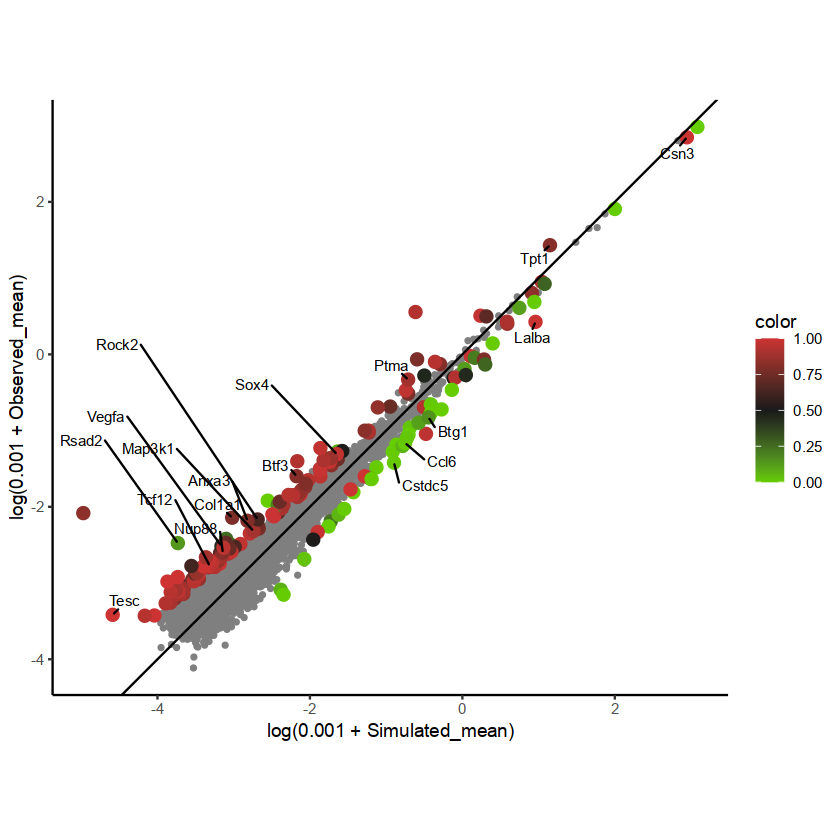

In [221]:
ggplot(plot_df %>% arrange(desc(adj_pval)), aes(x=log(0.001 + Simulated_mean), y=log(0.001 + Observed_mean), 
                                               color=color, size=size, label=label)) +
    geom_point() +
    geom_text_repel(max.overlaps = 1000, color='black', min.segment.length = 0, force = 5, force_pull = 0.5) +
    scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) +
    scale_size_identity() +
    geom_abline(intercept = 0, slope=1, color='black', linetype='solid') +
    coord_fixed()

In [222]:
fname="final_figs/fig5/new_gene_full_sim/All_scatter_manual.pdf"
p = ggplot(plot_df %>% arrange(desc(adj_pval)), aes(x=log(1e-3 + Simulated_mean), y=log(1e-3  + Observed_mean), 
                                               color=color, size=size, label=label)) +
    geom_point() +
    geom_text_repel(max.overlaps = 1000, color='black', min.segment.length = 0, force = 5, force_pull = 0.5) +
    scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) +
    scale_size_identity() +
    geom_abline(intercept = 0, slope=1, color='black', linetype='solid')

l = get_legend(p)
p = plot_grid(p + theme(legend.position="none"))

ggsave(fname, plot = p)
ggsave(paste0(fname, "_legend.pdf"), plot = l)


Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


In [223]:
plot_df = gene_df %>% 
    mutate(color=ifelse(adj_pval < 0.05, epi_imm_ratio, NA),
           size=ifelse(adj_pval < 0.05, 3, 1),
           label= "")

In [224]:
fname="final_figs/fig5/new_gene_full_sim//All_scatter_blank.pdf"
p = ggplot(plot_df %>% arrange(desc(adj_pval)), aes(x=log(1e-3 + Simulated_mean), y=log(1e-3 + Observed_mean), 
                                               color=color, size=size, label=label)) +
    geom_point() +
    geom_text_repel(max.overlaps = 1000, color='black', min.segment.length = 0, force = 5, force_pull = 0.5) +
    scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) +
    scale_size_identity() +
    geom_abline(intercept = 0, slope=1, color='black', linetype='solid')

l = get_legend(p)
p = plot_grid(p + theme(legend.position="none"))

ggsave(fname, plot = p)
ggsave(paste0(fname, "_legend.pdf"), plot = l)


Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


# GSEA analysis

In [95]:
for (pop_name in c('All', '12w_All')){#, 'MHCII Neut', 'Neut Ptgs2', 'Neut Socs3', 'TAN1', 'TAN2')){
    message(pop_name, "...")

    gene_df = read.csv(paste0("final_figs/fig5/new_gene/", pop_name, "_genedata.csv"), row.names = 1)

    zscore_vector = gene_df$z_scores
    names(zscore_vector) = rownames(gene_df)

    zscore_vector <- sort(zscore_vector, decreasing = TRUE)

    gs_go_res = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
    
    gs_go_res = simplify(gs_go_res, 
                         cutoff = 0.7,
                         by = "p.adjust",
                         select_fun = min,
                         measure = "Wang",
                         semData = NULL)
        
    write_csv(gs_go_res %>% as.data.frame, 
              paste0("final_figs/fig5/new_gene/go_enrichment_", pop_name, ".csv"))
}

All...

Loading required package: org.Mm.eg.db

Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:clusterProfiler’:

    select


The following object is masked from ‘package:MASS’:

    select


The following object is masked from ‘package:rstatix’:

    select


The following object is masked from ‘package:dplyr’:

    select






In [447]:
for (pop_name in c('All')){
    message(pop_name, "...")

    gene_df = read.csv(paste0("final_figs/fig5/new_gene/", pop_name, "_genedata.csv"), row.names = 1)

    zscore_vector = gene_df$lfc
    names(zscore_vector) = rownames(gene_df)

    zscore_vector <- sort(zscore_vector, decreasing = TRUE)

    gs_go_res = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
    
    gs_go_res = simplify(gs_go_res, 
                         cutoff = 0.7,
                         by = "p.adjust",
                         select_fun = min,
                         measure = "Wang",
                         semData = NULL)
        
    write_csv(gs_go_res %>% as.data.frame, 
              paste0("final_figs/fig5/new_gene/go_enrichment_lfc_", pop_name, ".csv"))
}

All...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [ ]:
for (pop_name in c('All')){
    message(pop_name, "...")

    gene_df = read.csv(paste0("final_figs/fig5/new_gene/", pop_name, "_genedata.csv"), row.names = 1)

    zscore_vector = gene_df$z_scores
    zscore_vector[is.infinite(zscore_vector)] = NA
    names(zscore_vector) = rownames(gene_df)

    zscore_vector <- sort(zscore_vector, decreasing = TRUE)

    gs_go_res = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
    
    gs_go_res = simplify(gs_go_res, 
                         cutoff = 0.7,
                         by = "p.adjust",
                         select_fun = min,
                         measure = "Wang",
                         semData = NULL)
        
    write_csv(gs_go_res %>% as.data.frame, 
              paste0("final_figs/fig5/new_gene/go_enrichment_z_", pop_name, ".csv"))
}

In [690]:
for (pop_name in c('All', '12w_All')){
    message(pop_name, "...")

    gene_df = read.csv(paste0("final_figs/fig5/new_gene/", pop_name, "_genedata.csv"), row.names = 1)

    lfc_vector = gene_df$lfc
    names(lfc_vector) = rownames(gene_df)

    lfc_vector <- sort(lfc_vector, decreasing = TRUE)

    gs_go_res = gseGO(lfc_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
            
    write_csv(gs_go_res %>% as.data.frame, 
              paste0("final_figs/fig5/new_gene/go_enrichment_lfc_nosimplify_", pop_name, ".csv"))
}

All...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...

12w_All...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [3]:
pop_name = "All_ONLY_WITHOUT_YOUNG_TANS"    
message(pop_name, "...")

gene_df = read.csv(paste0("final_figs/fig5/new_gene_sd/", pop_name, "_genedata_filt.csv"), row.names = 1)

lfc_vector = gene_df$lfc
names(lfc_vector) = rownames(gene_df)

lfc_vector <- sort(lfc_vector, decreasing = TRUE)

gs_go_res = gseGO(lfc_vector,
                  ont = "BP",
                  OrgDb = 'org.Mm.eg.db',
                  keyType = "SYMBOL",
                  exponent = 1,
                  minGSSize = 5,
                  maxGSSize = 500,
                  eps = 0,
                  pvalueCutoff = 2,
                  pAdjustMethod = "BH",
                  verbose = TRUE,
                  seed = FALSE,
                  by = "fgsea")

write_csv(gs_go_res %>% as.data.frame, 
          paste0("final_figs/fig5/new_gene_sd/go_enrichment_lfc_nosimplify_", pop_name, ".csv"))

All_ONLY_WITHOUT_YOUNG_TANS...

Loading required package: org.Mm.eg.db

Loading required package: AnnotationDbi


Attaching package: ‘AnnotationDbi’


The following object is masked from ‘package:clusterProfiler’:

    select


The following object is masked from ‘package:MASS’:

    select


The following object is masked from ‘package:rstatix’:

    select


The following object is masked from ‘package:dplyr’:

    select




preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [4]:
pop_name = "All_ONLY_WITHOUT_YOUNG_TANS"    
message(pop_name, "...")

gene_df = read.csv(paste0("final_figs/fig5/new_gene_sd/", pop_name, "_genedata_filt.csv"), row.names = 1)

z_vector = gene_df$z_scores
names(z_vector) = rownames(gene_df)

z_vector <- sort(z_vector, decreasing = TRUE)

gs_go_res = gseGO(z_vector,
                  ont = "BP",
                  OrgDb = 'org.Mm.eg.db',
                  keyType = "SYMBOL",
                  exponent = 1,
                  minGSSize = 5,
                  maxGSSize = 500,
                  eps = 0,
                  pvalueCutoff = 2,
                  pAdjustMethod = "BH",
                  verbose = TRUE,
                  seed = FALSE,
                  by = "fgsea")

write_csv(gs_go_res %>% as.data.frame, 
          paste0("final_figs/fig5/new_gene_sd/go_enrichment_z_nosimplify_", pop_name, ".csv"))

All_ONLY_WITHOUT_YOUNG_TANS...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [691]:
for (pop_name in c('All', '12w_All')){
    message(pop_name, "...")

    gene_df = read.csv(paste0("final_figs/fig5/new_gene/", pop_name, "_genedata.csv"), row.names = 1)

    zscore_vector = gene_df$z_scores
    zscore_vector[is.infinite(zscore_vector)] = NA
    names(zscore_vector) = rownames(gene_df)

    zscore_vector <- sort(zscore_vector, decreasing = TRUE)

    gs_go_res = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
            
    write_csv(gs_go_res %>% as.data.frame, 
              paste0("final_figs/fig5/new_gene/go_enrichment_z_nosimplify_", pop_name, ".csv"))
}

All...

preparing geneSet collections...

GSEA analysis...

Warning message in fgseaMultilevel(...):
“For some of the pathways the P-values were likely overestimated. For such pathways log2err is set to NA.”
leading edge analysis...

done...

12w_All...

preparing geneSet collections...

GSEA analysis...

Warning message in fgseaMultilevel(...):
“There were 21 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”
Warning message in fgseaMultilevel(...):
“For some of the pathways the P-values were likely overestimated. For such pathways log2err is set to NA.”
leading edge analysis...

done...



In [444]:
for (pop_name in c('All')){
    message(pop_name, "...")

    gene_df = read.csv(paste0("final_figs/fig5/new_gene_sd/", pop_name, "_genedata_filt.csv"), row.names = 1)

    lfc_vector = gene_df$lfc
    names(lfc_vector) = rownames(gene_df)

    lfc_vector <- sort(lfc_vector, decreasing = TRUE)

    gs_go_res = gseGO(lfc_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
            
    write_csv(gs_go_res %>% as.data.frame, 
              paste0("final_figs/fig5/new_gene_sd/go_enrichment_lfc_nosimplify_", pop_name, ".csv"))
}

All...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [445]:
for (pop_name in c('All')){
    message(pop_name, "...")

    gene_df = read.csv(paste0("final_figs/fig5/new_gene_sd/", pop_name, "_genedata_filt.csv"), row.names = 1)

    zscore_vector = gene_df$z_scores
    zscore_vector[is.infinite(zscore_vector)] = NA
    names(zscore_vector) = rownames(gene_df)

    zscore_vector <- sort(zscore_vector, decreasing = TRUE)

    gs_go_res = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
            
    write_csv(gs_go_res %>% as.data.frame, 
              paste0("final_figs/fig5/new_gene_sd/go_enrichment_z_nosimplify_", pop_name, ".csv"))
}

All...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [ ]:
gene_df = read.csv(paste0("final_figs/fig5/new_gene/All_genedata.csv"), row.names = 1)

In [ ]:
plot_df = read.csv(paste0("final_figs/fig5/new_gene/go_enrichment_lfc_nosimplify_", "All", ".csv"))

In [ ]:
focus_terms = c("epithelial cell differentiation",
                "epidermal cell differentiation",
                "interleukin-10 production",
                "positive regulation of cytokine production",
                "response to interferon-gamma",
                "vasculature development",
                "angiogenesis")

In [ ]:
plot_df %>% 
    filter(Description %in% focus_terms) %>%
    arrange(NES) %>%
    mutate(Description = factor(Description, levels=Description)) %>%
    ggplot(aes(x=NES, y=Description, fill=ifelse(NES > 0, "steelblue", "chocolate"))) +
        geom_bar(stat='identity', orientation = 'y', show.legend = F, fill='slategray') +
        theme(axis.title.y = element_blank())
ggsave("final_figs/fig5/new_gene/go_enrichment_barplot.pdf", height=4, width=8)

In [ ]:
gene_df = read.csv(paste0("final_figs/fig5/new_gene/All_genedata.csv"), row.names = 1)

zscore_vector = gene_df$lfc
names(zscore_vector) = rownames(gene_df)

zscore_vector <- sort(zscore_vector, decreasing = TRUE)

gs_go_res = gseGO(zscore_vector,
                  ont = "BP",
                  OrgDb = 'org.Mm.eg.db',
                  keyType = "SYMBOL",
                  exponent = 1,
                  minGSSize = 5,
                  maxGSSize = 500,
                  eps = 0,
                  pvalueCutoff = 2,
                  pAdjustMethod = "BH",
                  verbose = TRUE,
                  seed = FALSE,
                  by = "fgsea")

In [ ]:
focus_ids = match(focus_terms, gs_go_res$Description)

In [ ]:
gseaplot2(gs_go_res, geneSetID = focus_ids, subplots = 1:2)

In [ ]:
library(enrichplot)

In [ ]:
plot_df = read.csv(paste0("final_figs/fig5/new_gene/go_enrichment_lfc_nosimplify_", "All", ".csv"))

In [ ]:
lfc_vector = gene_df$lfc
names(lfc_vector) = rownames(gene_df)
lfc_vector <- sort(lfc_vector, decreasing = TRUE)

In [ ]:
term = "angiogenesis"
core_genes = str_split(plot_df[plot_df$Description == term,'core_enrichment'], "/")[[1]]

In [ ]:
core_genes

In [ ]:
term_lfcs = lapply(focus_terms, function(term){
    genes = str_split(plot_df[plot_df$Description == term,'core_enrichment'], "/")[[1]]
    df = data.frame(gene=genes,
               lfc=lfc_vector[genes],
               go_term=term) %>%
        arrange(desc(abs(lfc))) %>%
        mutate(gene=factor(gene, levels=gene))
    df = df[1:min(15, nrow(df)),]
})

In [ ]:
names(term_lfcs) = focus_terms

In [ ]:
for (term in focus_terms){
    df = term_lfcs[[term]]
    ggplot(df, aes(x=gene, y=lfc)) +
        geom_bar(stat='identity', fill=ifelse(term %in% focus_terms[1:2], 'steelblue', 'brown3'), color='black', linewidth=0.2) +
        labs(title=term) +
        theme(axis.text.x = element_text(angle=90, vjust=0.5, hjust=1), plot.title = element_text(hjust=0.5, size=10), 
              text = element_text(size=8), axis.title.x = element_blank())
    ggsave(paste0("final_figs/fig5/term_barplot_", term, ".pdf"), height=60, width=40, units = 'mm')
}

In [ ]:
options(repr.plot.width = 6, repr.plot.height = 12)

In [ ]:
plot_grid(plotlist = term_lfcs, ncol = 2)

In [ ]:
options(repr.plot.width = 12, repr.plot.height = 3)

In [ ]:
term_lfcs %>% dcast(gene~go_term, value.var = 'lfc') %>%
    column_to_rownames('gene') %>% 
    dplyr::select(all_of(focus_terms)) %>%
    arrange_all %>%
    as.matrix %>%
    t %>%
    pheatmap(cluster_rows = F, cluster_cols = F, color=colorRampPalette(c("blue", "gray", "red"))(50), breaks=c(-0.5, 0.5), na_col = '#ffffff')

In [ ]:
options(repr.plot.width = 5, repr.plot.height = 10)

In [ ]:
sapply()

In [ ]:
ggplot(term_lfcs %>% na.omit, aes(x=gene, y=lfc)) +
    geom_bar(stat='identity', fill='slategray') +
    facet_grid(rows='go_term', scale='free', space='free')

In [ ]:
gene_df = read.csv("final_figs/fig5/new_gene_sd/TANs_merged_1012w_genedata.csv", row.names = 1)

In [ ]:
cat(rownames(gene_df %>% filter(full_adj_pval < 0.05, lfc > 0)),sep='\n')

In [ ]:
1

In [ ]:
mm_hallmark_sets <- msigdbr(
    species = "Mus musculus", # Replace with species name relevant to your data
    category = "H",
    #subcategory = "GO:MF"
)

In [ ]:
pop_name = "TAN3"

gene_df = read.csv(paste0("final_figs/fig4/new_gene_10kgenes_mediannorm/", pop_name, "_genedata.csv"), row.names = 1)

zscore_vector = gene_df$lfc
names(zscore_vector) = rownames(gene_df)

zscore_vector <- sort(zscore_vector, decreasing = TRUE)


In [ ]:
gsea_results <- GSEA(
  geneList = zscore_vector, # Ordered ranked gene list
  minGSSize = 10, # Minimum gene set size
  maxGSSize = 500, # Maximum gene set set
  pvalueCutoff = 2, # p-value cutoff
  eps = 0, # Boundary for calculating the p value
  seed = TRUE, # Set seed to make results reproducible
  pAdjustMethod = "BH", # Benjamini-Hochberg correction
  TERM2GENE = dplyr::select(
    mm_hallmark_sets,
    gs_name,
    gene_symbol
  )
)


In [ ]:
gsea_results %>% as.data.frame

In [ ]:
run_gsea_analysis = function(focus_name, lfc_table, dirname, ont="ALL", should_simplify=T, pval_cutoff=0.05){
    #lfc_table = read.csv(lfc_table_path)#, col.names = c('Gene', 'obs', 'exp', 'lfc'))
    lfc_vector = lfc_table$lfc
    names(lfc_vector) = lfc_table[[1]]
    lfc_vector <- sort(lfc_vector, decreasing = TRUE)
    
    gs_go_res = gseGO(lfc_vector,
                      ont = ont,
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = pval_cutoff,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")
    
    if(!should_simplify){
        message('Skipping simplification step per your request')
    }else if(ont == 'ALL'){
        message("Can't simplify when ont='ALL'")
    }else{gs_go_res = simplify(gs_go_res, 
                               cutoff = 0.7,
                               by = "p.adjust",
                               select_fun = min,
                               measure = "Wang",
                               semData = NULL)
    }
    
    final_res = gs_go_res %>% as.data.frame %>% mutate(Description=factor(Description, levels=Description))
    
    write_csv(final_res, paste0(dirname, "go_enrichment_", ont, ".csv"))
    
    ggplot(head(final_res %>% filter(NES > 0), 50), aes(x=-log10(p.adjust), y=Description)) +
        geom_bar(stat='identity', fill='steelblue') +
        labs(title = paste0("GO enrichment - gene cluster ", focus_name)) +
        scale_x_continuous(limits = c(0,max(-log10(final_res$p.adjust)))) +
        xlab("-log10(pval)") +
        theme(axis.title.y = element_blank(), title = element_text(hjust=0.5))
    ggsave(paste0(dirname, "upregulated_", focus_name, "_", ont, ".pdf"), height=6, width=18)
    
    ggplot(head(final_res %>% filter(NES < 0), 50), aes(x=-log10(p.adjust), y=Description)) +
        geom_bar(stat='identity', fill='firebrick1') +
        labs(title = paste0("GO enrichment - gene cluster ", focus_name)) +
        scale_x_continuous(limits = c(0,max(-log10(final_res$p.adjust)))) +
        xlab("-log10(pval)") +
        theme(axis.title.y = element_blank(), title = element_text(hjust=0.5))
    ggsave(paste0(dirname, "downregulated_", focus_name, "_", ont, ".pdf"), height=6, width=18)

}

# Per comb graphs

In [605]:
1

[1] 1

In [534]:
immune_pops[3:7]

[1] "MHCII neut"  "Neut Ptgs2+" "Young TAN"   "TAN1"        "TAN2"

In [38]:
full_genedata = lapply(3:7, function(i){
    pop = immune_pops[i]
    gene_df1 = read.csv(paste0("final_figs/fig5/new_gene_full_sim/", pop, "_genedata_filt.csv"), row.names=1) %>% 
        cbind(source_index=i) %>% as.matrix
    rownames(gene_df1) = paste0(rownames(gene_df1), "___", i)
    gene_df1
}) %>% 
    do.call(rbind, .) %>% 
    as.data.frame %>% 
    mutate(immune=immune_pops[source_index], epithelial="Tumor cells") %>% 
    mutate(pic=paste(immune, epithelial, sep=".")) %>%
    rownames_to_column("gene") %>%
    mutate(gene = str_split_i(gene, "___", 1))

In [85]:
sem_col = norm_mat[,analysis_genes] %>%
    as.data.frame %>%
    rownames_to_column('cell') %>%
    mutate(annot = parser_immune[as.character(cell)]) %>%
    column_to_rownames('cell') %>%
    group_by(annot) %>%
    summarise_all(function(x){sd(x) / (n() ** 0.5)}) %>%
    melt(variable.name = 'gene', value.name = 'SEM') %>% 
    mutate(annot = factor(annot, immune_pops[3:7])) %>%
    arrange(annot, gene) %>% 
    dplyr::select(SEM)

Using annot as id variables



In [86]:
full_genedata = full_genedata %>% cbind(sem_col)

In [95]:
all_genedata = read.csv("final_figs/fig5/new_gene_full_sim/All_genedata_filt.csv", row.names=1)

In [87]:
full_genedata$se = with(full_genedata, 2.576 * Sim_SD / (1000 ** 0.5))

In [654]:
focus_gene = "Vegfa"
gene_df = full_genedata %>% 
    filter(gene == focus_gene) %>%
    mutate(immune_exp=Simulated_mean * (1 - epi_imm_ratio), 
           epithelial_exp=Simulated_mean * epi_imm_ratio) %>%
    dplyr::select(Observed_mean, immune_exp, epithelial_exp, immune, epithelial, pic, gene) %>%
    melt(variable.name = "source", value.name = "norm_mean") %>%
    mutate(obs_exp = ifelse(source == "Observed_mean", "Observed", "Expected"),
           fill=factor(ifelse(source == 'immune_exp', 
                              group.colors[immune], 
                              ifelse(source == "epithelial_exp", 
                                     'orangered3', 
                                     "slategray")),
                       levels=c(group.colors, "slategray")))

Using immune, epithelial, pic, gene as id variables



In [657]:
group.colors

Young neut Cystatin neut    MHCII neut   Neut Ptgs2+     Young TAN 
    "#36648b"     "#00BFFF"     "#00ff1e"     "#9bcd9b"     "#2e8b57" 
         TAN1          TAN2  Progenitor 1  Progenitor 2      Alveolar 
    "#43cd80"     "#4eee94"     "#a86464"     "#e50082"     "#f47466" 
           HS Myoepithelial         Basal        MyoLum   Tumor cells 
    "#ff6d2c"     "#ffbe66"     "#efc3a2"     "#d78875"     "#ec0f09"

In [660]:
full_genedata %>% filter(gene == "Vegfa")

gene,Observed_mean,Simulated_mean,Sim_SD,z_scores,full_adj_pval,lfc,epi_imm_ratio,adj_pval,source_index,immune,epithelial,pic,se
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
Vegfa,0.08096473,0.05218081,0.02202013,1.3071641,0.982598938,0.038936807,0.4437681,0.982598938,3,MHCII neut,Tumor cells,MHCII neut.Tumor cells,0.001793765
Vegfa,0.09654779,0.03949345,0.01394921,4.0901473,0.003533099,0.077088020,0.5008226,0.003533099,4,Neut Ptgs2+,Tumor cells,Neut Ptgs2+.Tumor cells,0.001136307
Vegfa,0.01735257,0.02266937,0.02366305,-0.2246879,0.989135366,-0.007520056,0.7603070,0.989135366,5,Young TAN,Tumor cells,Young TAN.Tumor cells,0.001927599
Vegfa,0.07421290,0.02515538,0.01600541,3.0650598,0.086979776,0.067437365,0.5396472,0.086979776,6,TAN1,Tumor cells,TAN1.Tumor cells,0.001303805
Vegfa,0.05453643,0.04257708,0.01961127,0.6098202,0.975412654,0.016454881,0.4266611,0.975412654,7,TAN2,Tumor cells,TAN2.Tumor cells,0.001597539


In [664]:
p1 = ggplot(gene_df, aes(x=obs_exp, y=norm_mean, fill=fill)) +
    geom_bar(stat='identity', position='stack', color='black', show.legend = F) +
    scale_fill_identity() +
    facet_grid(~pic) +
    labs(title = focus_gene) +
    theme(strip.background = element_blank(), strip.text.x = element_blank(), plot.title = element_text(hjust=0, size=20),
          axis.title.x=element_blank(), axis.line.x=element_blank(), axis.ticks.x=element_blank(), 
          axis.text.x=element_blank())


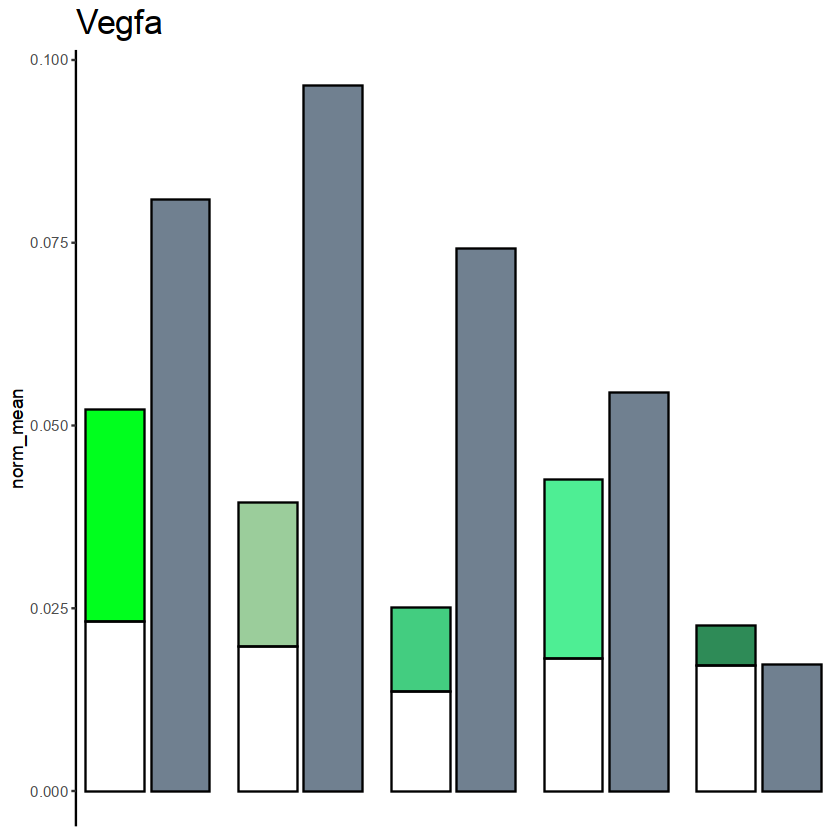

In [665]:
plot(p1)

In [612]:
pic_counts = sapply(immune_pops, function(pop){sum(parser_immune[analyzed_pics] == pop)})

In [661]:
mature_immune_pops

[1] "MHCII neut"  "Neut Ptgs2+" "Young TAN"   "TAN1"        "TAN2"

In [1301]:
length(unique(analysis_genes))

[1] 4421

In [80]:
length(unique(full_genedata$gene))

[1] 4421

In [81]:
analysis_genes = unique(full_genedata$gene)

In [1306]:
full_genedata$gene %>% table %>% sort

.
     Aagab       Aak1       Aamp       Aars   Aasdhppt       Aass   AB124611 
         5          5          5          5          5          5          5 
     Abcd3      Abce1      Abcf1     Abhd13    Abhd16a    Abhd17a    Abhd17b 
         5          5          5          5          5          5          5 
   Abhd17c      Abhd2      Abhd4      Abhd5       Abi1       Abl1     Abracl 
         5          5          5          5          5          5          5 
  Abraxas2     Acaa1a      Acaa2      Acad8      Acadl      Acadm     Acadsb 
         5          5          5          5          5          5          5 
     Acap2      Acat1      Acbd3      Acbd5      Acbd6      Acin1       Acly 
         5          5          5          5          5          5          5 
      Aco1      Acod1      Acot1     Acot13      Acot2      Acot9      Acox1 
         5          5          5          5          5          5          5 
      Acp5      Acsl1      Acsl4      Acsl5      Acss1      Ac

In [1304]:
nrow(full_genedata) / 5

[1] 4421

In [1293]:
full_genedata %>%
    filter(gene == "Tpt1")

gene,Observed_mean,Simulated_mean,Sim_SD,z_scores,full_adj_pval,lfc,epi_imm_ratio,adj_pval,source_index,immune,epithelial,pic,SEM
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>
Tpt1,5.05982341,3.30090964,0.16986226,10.3549415,5.856785e-22,0.6160715,0.8854302,0.0000100,3,MHCII neut,Tumor cells,MHCII neut.Tumor cells,0.21734236
Tpt1,0.07754179,0.04436078,0.01807884,1.8353506,5.840797e-01,0.7920151,0.7194698,0.5840797,3,MHCII neut,Tumor cells,MHCII neut.Tumor cells,0.02086110
Tpt1,4.04675913,3.20201891,0.12322081,6.8554997,6.283452e-09,0.3376911,0.8402920,0.0000100,4,Neut Ptgs2+,Tumor cells,Neut Ptgs2+.Tumor cells,0.15201855
Tpt1,0.03479493,0.05155647,0.01423119,-1.1778031,7.442260e-01,-0.5541132,0.6078407,0.7442260,4,Neut Ptgs2+,Tumor cells,Neut Ptgs2+.Tumor cells,0.01013235
Tpt1,3.57270313,2.86365522,0.32175292,2.2037031,7.522679e-01,0.3190583,0.7465100,0.7522679,5,Young TAN,Tumor cells,Young TAN.Tumor cells,0.37241676
Tpt1,0.00000000,0.04943874,0.03398487,-1.4547280,9.819440e-01,-5.6564604,0.3881685,0.9819440,5,Young TAN,Tumor cells,Young TAN.Tumor cells,0.00000000
Tpt1,3.33191676,2.80397341,0.18923688,2.7898545,2.238938e-01,0.2487982,0.6822525,0.2238938,6,TAN1,Tumor cells,TAN1.Tumor cells,0.21001947
Tpt1,0.05371456,0.04705480,0.02538427,0.2623578,9.799174e-01,0.1872442,0.5123161,0.9799174,6,TAN1,Tumor cells,TAN1.Tumor cells,0.02588700
Tpt1,4.46280393,3.27792543,0.18639658,6.3567611,3.036521e-07,0.4450506,0.7752352,0.0000100,7,TAN2,Tumor cells,TAN2.Tumor cells,0.24473535


In [194]:
per_comb_obs_exp = function(focus_gene){
    
    gene_df = full_genedata %>% 
        filter(gene == focus_gene) %>%
        mutate(immune_exp=Simulated_mean * (1 - epi_imm_ratio), 
               epithelial_exp=Simulated_mean * epi_imm_ratio) %>%
        dplyr::select(Observed_mean, immune_exp, epithelial_exp, immune, epithelial, pic, gene) %>%
        melt(variable.name = "source", value.name = "norm_mean") %>%
        mutate(pic=factor(pic, levels=paste(mature_immune_pops, "Tumor cells", sep=".")),
               obs_exp = ifelse(source == "Observed_mean", "Observed", "Expected"),
               fill=factor(ifelse(source == 'immune_exp', 
                                  group.colors[immune], 
                                  ifelse(source == "epithelial_exp", 
                                         group.colors['Tumor cells'], 
                                         "slategray")),
                           levels=c(group.colors, "slategray")))
    
    
    
    p1 = ggplot(gene_df, aes(x=obs_exp, y=norm_mean, fill=fill)) +
        geom_bar(stat='identity', position='stack', color='black', show.legend = F) +
        geom_errorbar(data=full_genedata %>% 
                          filter(gene == focus_gene) %>% 
                          mutate(pic=factor(pic, levels=paste(mature_immune_pops, "Tumor cells", sep=".")), obs_exp="Expected"),
                      aes(ymin=pmax(0, Simulated_mean - Sim_SD), ymax=Simulated_mean + Sim_SD, y=0, fill=NA), 
                      linetype='longdash', width=0.2) +
        geom_errorbar(data=full_genedata %>% 
                          filter(gene == focus_gene) %>% 
                          mutate(pic=factor(pic, levels=paste(mature_immune_pops, "Tumor cells", sep=".")), obs_exp="Observed"),
                      aes(ymin=pmax(0, Observed_mean - SEM), ymax=Observed_mean + SEM, y=0, fill=NA), 
                      width=0.2) +
        scale_fill_identity() +
        facet_grid(~pic) +
        labs(title = focus_gene) +
        theme(strip.background = element_blank(), strip.text.x = element_blank(), plot.title = element_text(hjust=0, size=20),
              axis.title.x=element_blank(), axis.line.x=element_blank(), axis.ticks.x=element_blank(), 
              axis.text.x=element_blank())

    draw_dot = function(dot_df, side){
        ggplot(dot_df, aes(x=x, y=y, fill=fill)) +
        geom_point(color='black', pch=21, show.legend = F, size=10) +
        scale_fill_identity() + 
        facet_grid(~ pic) + 
        theme_void() +
        ylab("          ") +
        theme(strip.background = element_blank(), strip.text.x = element_blank(), axis.title.y = element_text(hjust = 1))
    }

    p2 = data.frame(x=0, y=0, pic=unique(gene_df$pic), fill=group.colors[str_replace(unique(gene_df$pic), '\\..*', '')]) %>%
        draw_dot

    p3 = data.frame(x=0, y=0, pic=unique(gene_df$pic), fill=group.colors[str_replace(unique(gene_df$pic), '.*\\.', '')]) %>%
        draw_dot

    p_unified = grid.arrange(p1, p2, p3, nrow=3, heights=c(19,1,1))
}

In [83]:
full_genedata %>% dcast(gene ~ pic, value.var='full_adj_pval', fun.aggregate = function(x){x[1]}) %>%
    write_csv("final_figs/fig5/new_gene/pvalues.csv")

Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image


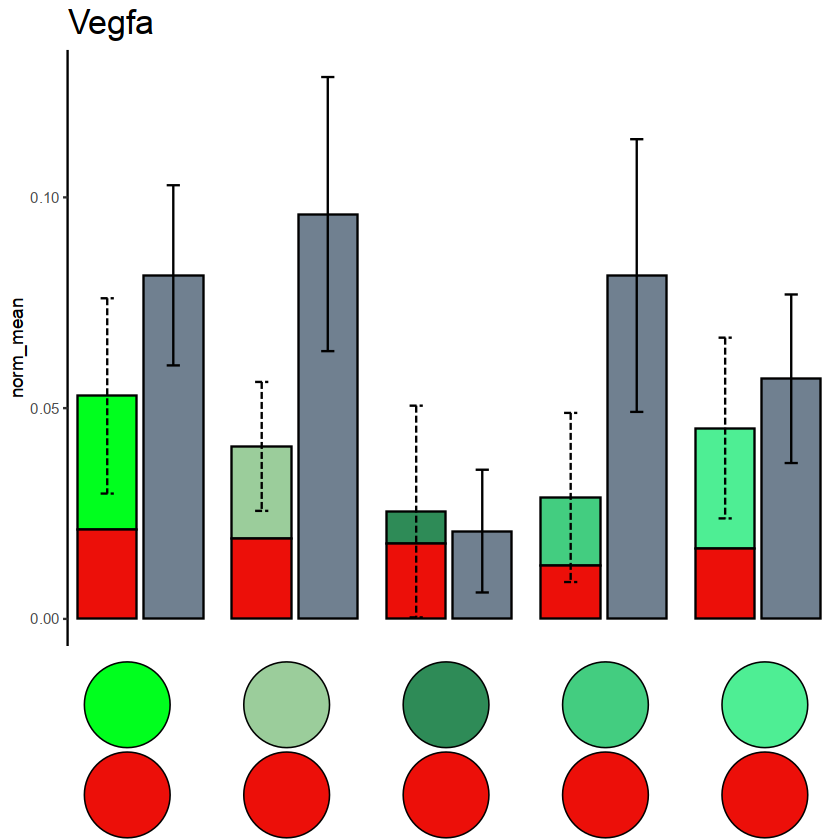

In [193]:
p = per_comb_obs_exp('Vegfa')
ggsave("final_figs/fig5/new_gene_full_sim/big_dots.pdf", plot = p)

In [1243]:
full_genedata = lapply(3:7, function(i){
    pop = immune_pops[i]
    read.csv(paste0("final_figs/fig5/new_gene_full_sim/", pop, "_genedata_filt.csv"), row.names=1) %>% 
        cbind(source_index=i) %>% as.matrix
}) %>% 
    do.call(rbind, .) %>% 
    as.data.frame %>% 
    mutate(immune=immune_pops[source_index], epithelial="Tumor cells") %>% 
    mutate(pic=paste(immune, epithelial, sep=".")) %>%
    rownames_to_column("gene") %>%
    mutate(gene = str_split_i(gene, "\\.", 1))

In [149]:
full_genedata %>%
    filter(gene %in% interesting_genes) %>%
    mutate(full_adj_pval = ifelse(full_adj_pval < 0.05, "*", "n.s")) %>%
    dcast(gene ~ pic, value.var='full_adj_pval', fun.aggregate = function(x){x[1]}) 

gene,MHCII neut.Tumor cells,Neut Ptgs2+.Tumor cells,TAN1.Tumor cells,TAN2.Tumor cells,Young TAN.Tumor cells
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Arhgef3,n.s,n.s,n.s,n.s,n.s
Azin1,n.s,n.s,n.s,n.s,n.s
Bcl3,n.s,n.s,n.s,n.s,n.s
Bst2,n.s,n.s,n.s,n.s,n.s
Ccl6,*,*,n.s,n.s,n.s
Comt,n.s,*,n.s,n.s,n.s
Csn3,n.s,n.s,n.s,n.s,n.s
Cstdc5,n.s,n.s,n.s,n.s,n.s
Epas1,n.s,n.s,n.s,n.s,n.s


In [59]:
full_genedata %>%
    filter(gene %in% interesting_genes) %>%
    mutate(full_adj_pval = ifelse(full_adj_pval < 0.05, "*", "n.s")) %>%
    dcast(gene ~ pic, value.var='full_adj_pval', fun.aggregate = function(x){x[1]}) 

gene,MHCII neut.Tumor cells,Neut Myd88+.Tumor cells,Neut Ptgs2+.Tumor cells,TAN1.Tumor cells,TAN2.Tumor cells,Young TAN.Tumor cells
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Arhgef3,n.s,n.s,n.s,n.s,n.s,n.s
Azin1,n.s,n.s,n.s,n.s,n.s,n.s
Bcl3,n.s,n.s,n.s,n.s,n.s,n.s
Bst2,n.s,n.s,n.s,n.s,n.s,n.s
Ccl6,*,n.s,*,n.s,n.s,n.s
Comt,n.s,n.s,*,n.s,n.s,n.s
Csn3,n.s,n.s,n.s,n.s,n.s,n.s
Cstdc5,n.s,*,*,n.s,n.s,n.s
Epas1,n.s,n.s,n.s,n.s,n.s,n.s


In [120]:
full_genedata %>%
    filter(gene %in% interesting_genes) %>%
    mutate(full_adj_pval = ifelse(full_adj_pval < 0.05, "*", "n.s")) %>%
    dcast(gene ~ pic, value.var='full_adj_pval', fun.aggregate = function(x){x[1]}) 

gene,MHCII neut.Tumor cells,Neut Ptgs2+.Tumor cells,TAN1.Tumor cells,TAN2.Tumor cells,Young TAN.Tumor cells
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Arhgef3,NA,n.s,NA,n.s,NA
Azin1,NA,n.s,NA,n.s,NA
Bcl3,NA,n.s,NA,n.s,NA
Bst2,NA,n.s,NA,NA,NA
Ccl6,NA,*,n.s,n.s,NA
Comt,n.s,*,n.s,n.s,NA
Csn3,n.s,n.s,n.s,n.s,n.s
Cstdc5,NA,n.s,n.s,n.s,n.s
Epas1,NA,n.s,NA,NA,NA


In [114]:
full_genedata %>%
    filter(gene %in% interesting_genes) %>%
    mutate(full_adj_pval = ifelse(full_adj_pval < 0.05, "*", "n.s")) %>%
    dcast(gene ~ pic, value.var='full_adj_pval', fun.aggregate = function(x){x[1]}) 

gene,MHCII neut.Tumor cells,Neut Ptgs2+.Tumor cells,TAN1.Tumor cells,TAN2.Tumor cells,Young TAN.Tumor cells
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Arhgef3,n.s,n.s,n.s,n.s,n.s
Azin1,n.s,n.s,n.s,n.s,n.s
Bcl3,n.s,n.s,n.s,n.s,n.s
Bst2,n.s,n.s,n.s,n.s,n.s
Ccl6,*,*,n.s,n.s,n.s
Comt,n.s,*,n.s,n.s,n.s
Csn3,n.s,n.s,n.s,n.s,n.s
Cstdc5,n.s,n.s,n.s,n.s,n.s
Epas1,n.s,n.s,n.s,n.s,n.s


In [61]:
full_genedata %>%
    filter(gene %in% interesting_genes) %>%
    mutate(full_adj_pval = ifelse(full_adj_pval < 0.05, "*", "n.s")) %>%
    dcast(gene ~ pic, value.var='full_adj_pval', fun.aggregate = function(x){x[1]}) 

gene,MHCII neut.Tumor cells,Neut Myd88+.Tumor cells,Neut Ptgs2+.Tumor cells,TAN1.Tumor cells,TAN2.Tumor cells,Young TAN.Tumor cells
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Arhgef3,n.s,n.s,n.s,n.s,n.s,n.s
Azin1,n.s,n.s,n.s,n.s,n.s,n.s
Bcl3,n.s,n.s,n.s,n.s,n.s,n.s
Bst2,n.s,n.s,n.s,n.s,n.s,n.s
Ccl6,*,n.s,*,n.s,n.s,n.s
Comt,n.s,n.s,*,n.s,n.s,n.s
Csn3,n.s,n.s,n.s,n.s,n.s,n.s
Cstdc5,n.s,*,n.s,n.s,n.s,n.s
Epas1,n.s,n.s,n.s,n.s,n.s,n.s


Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


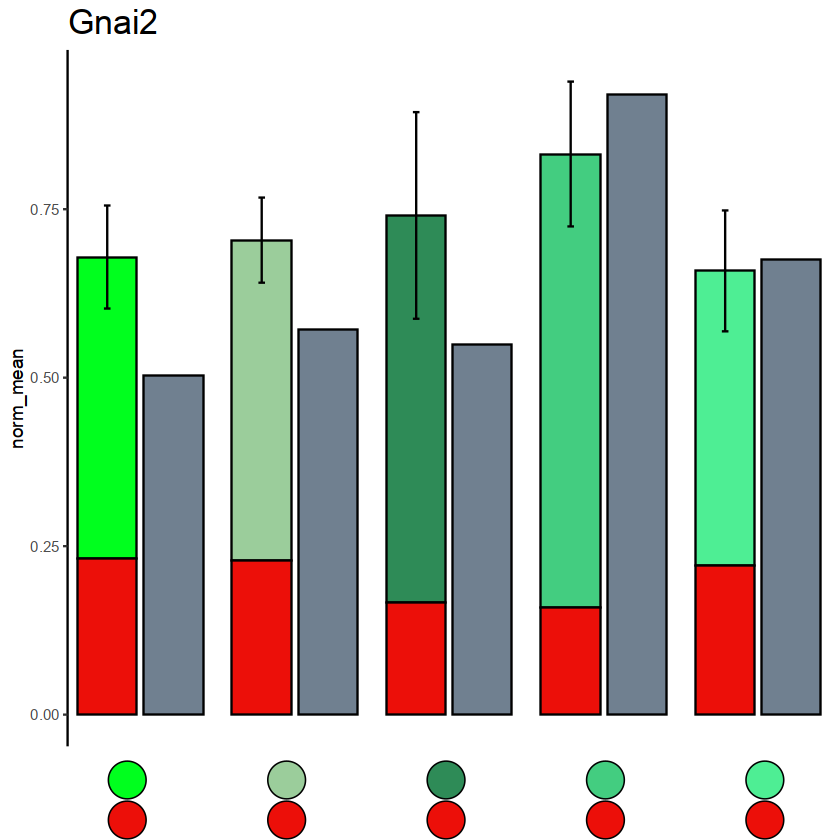

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


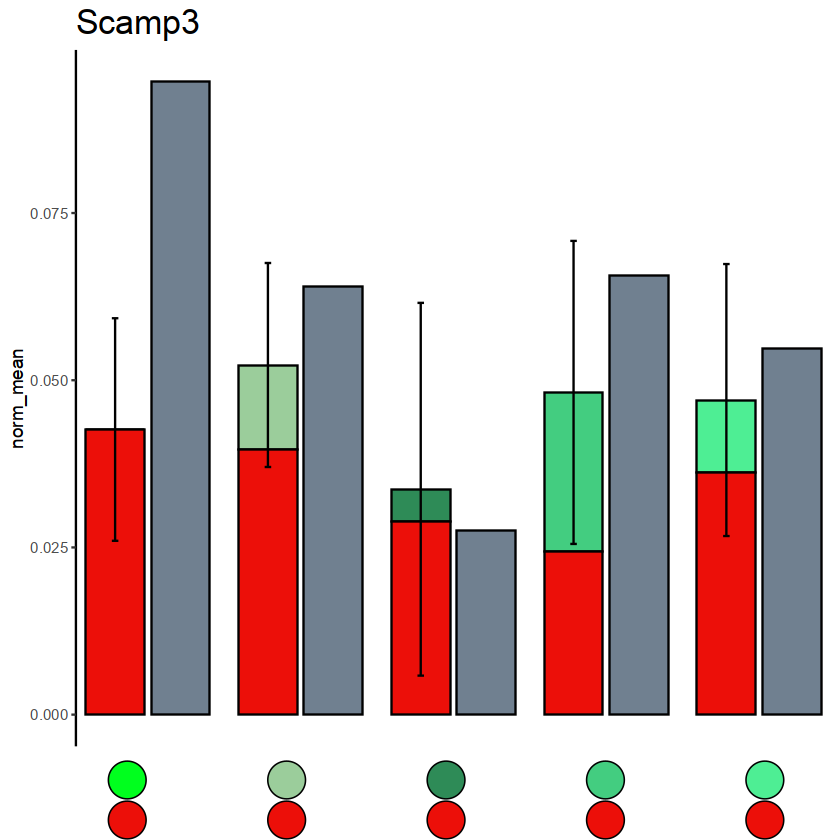

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


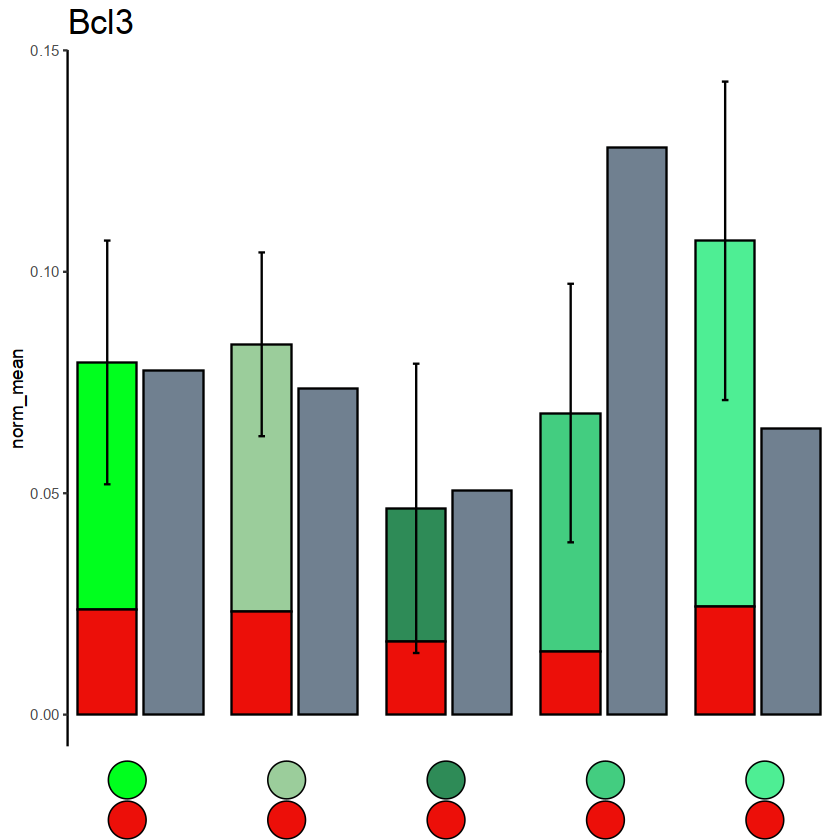

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


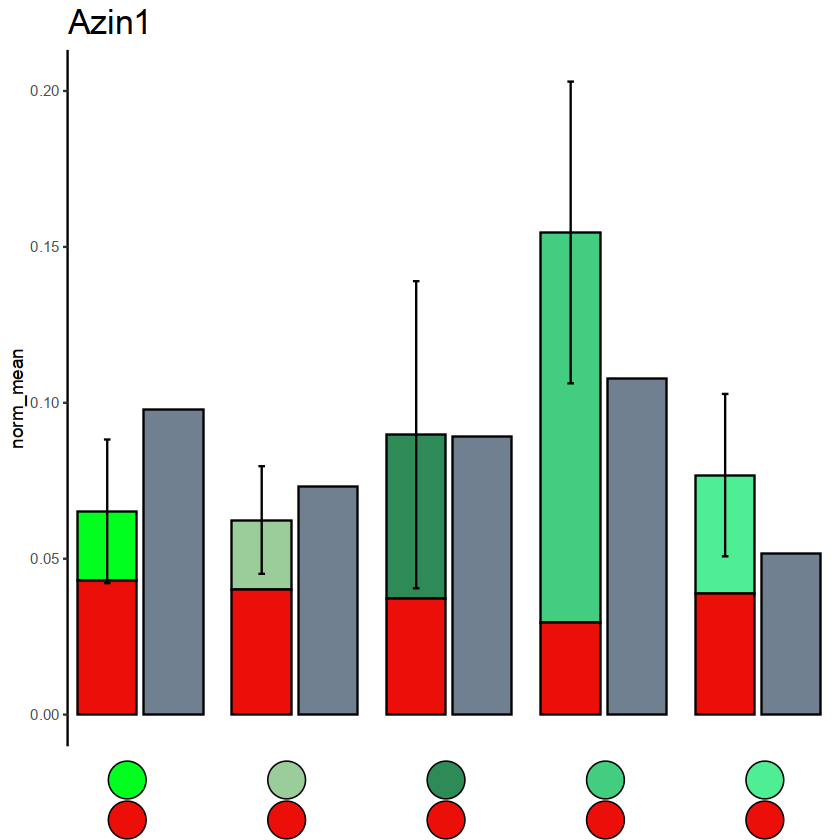

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


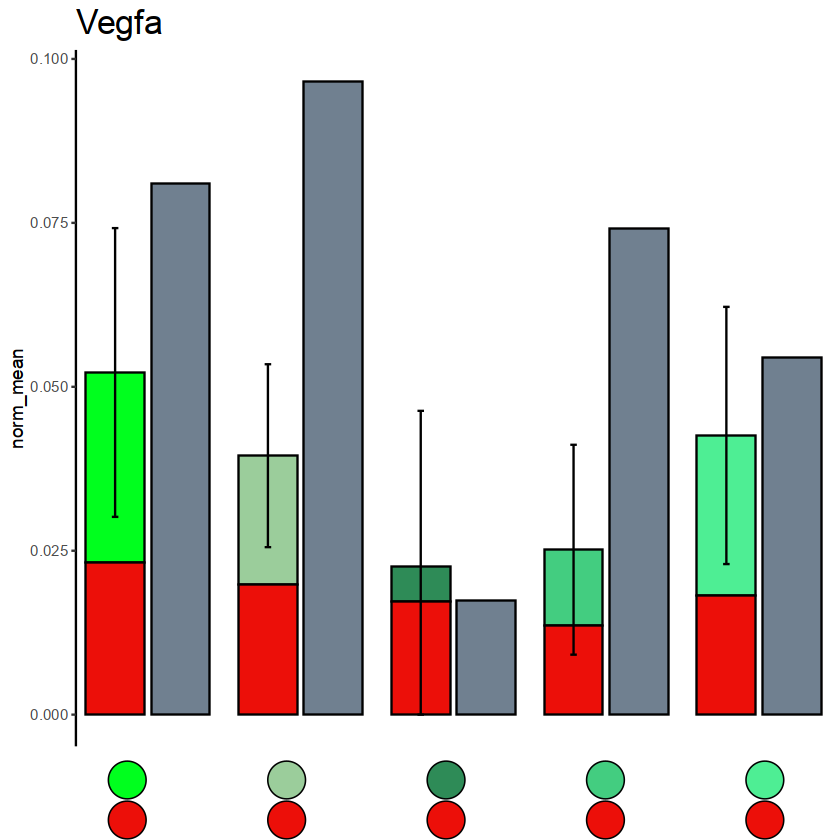

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


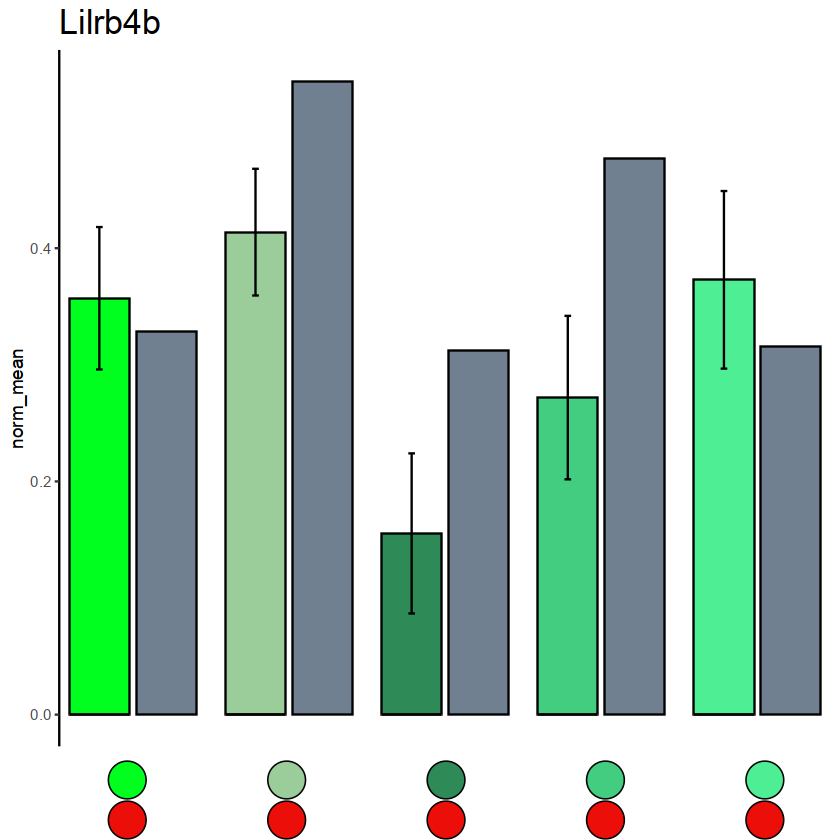

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


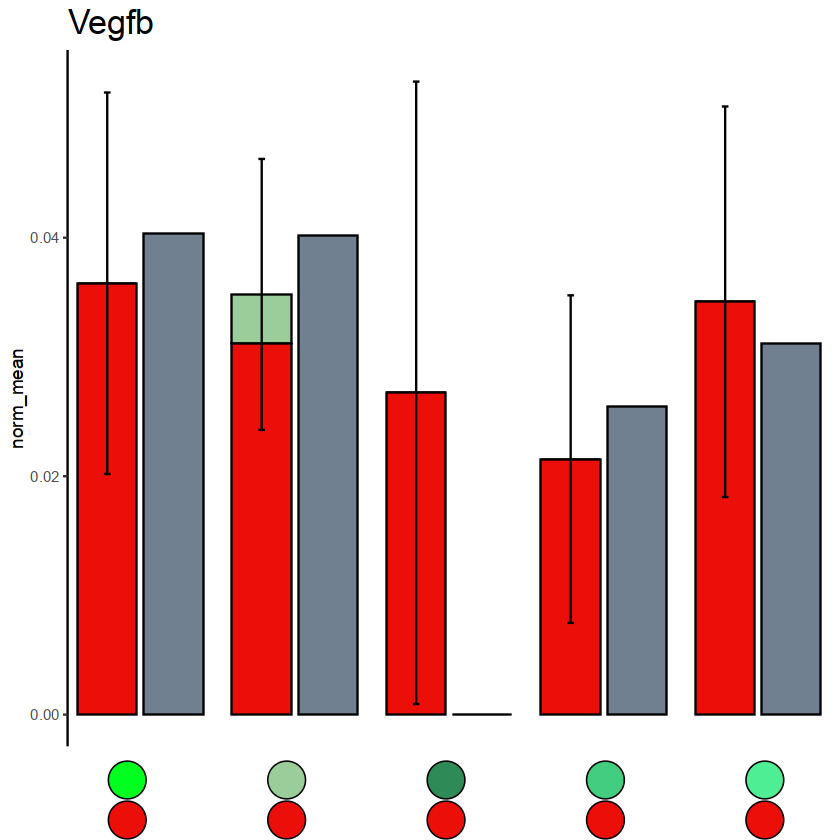

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


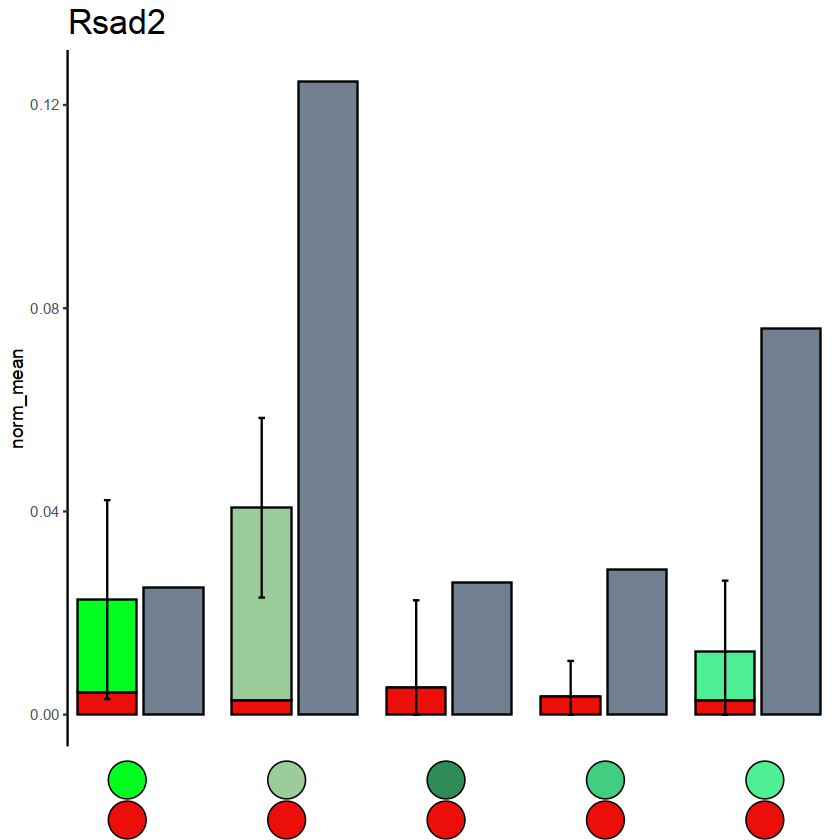

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


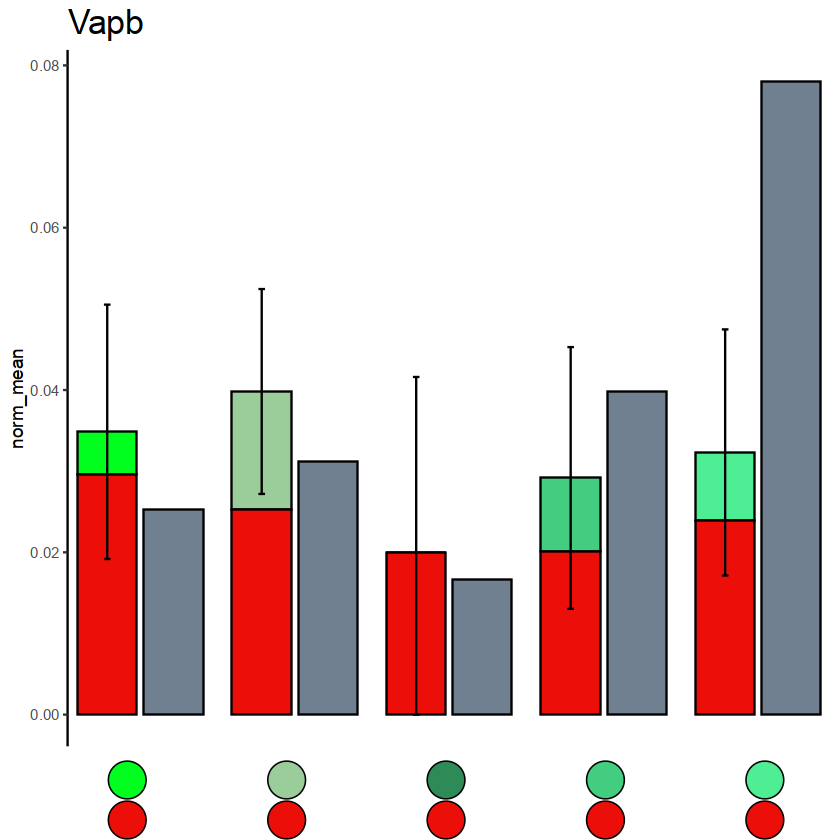

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


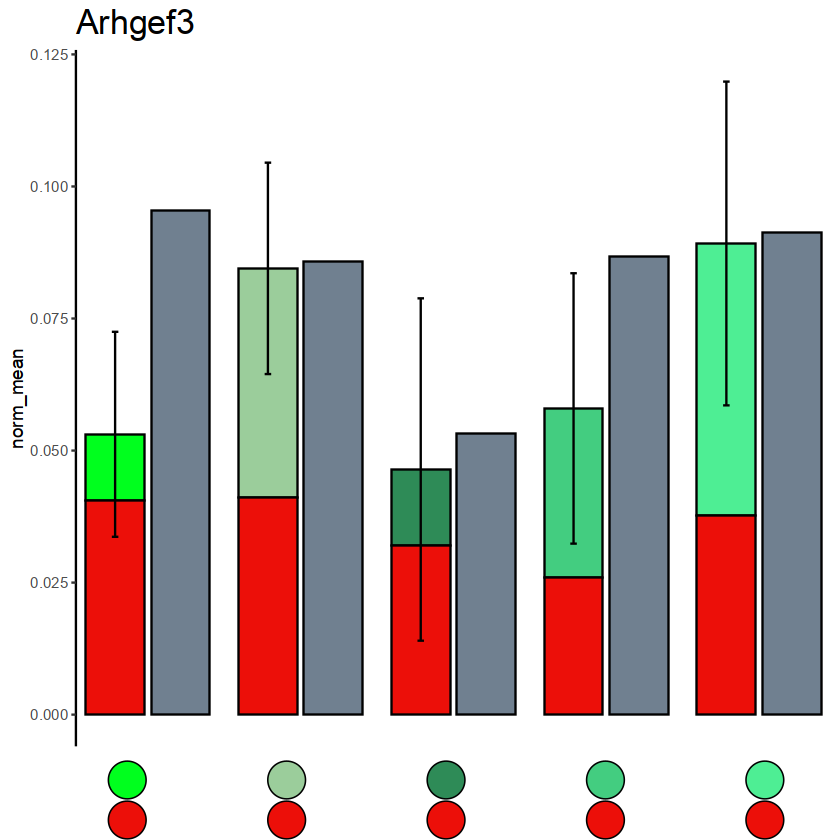

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


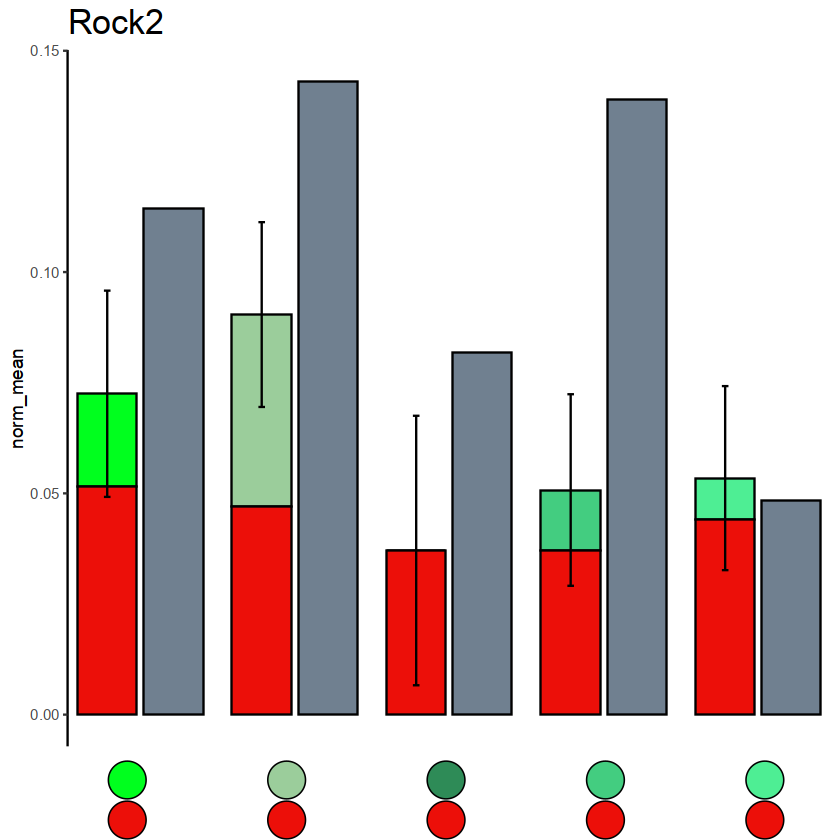

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


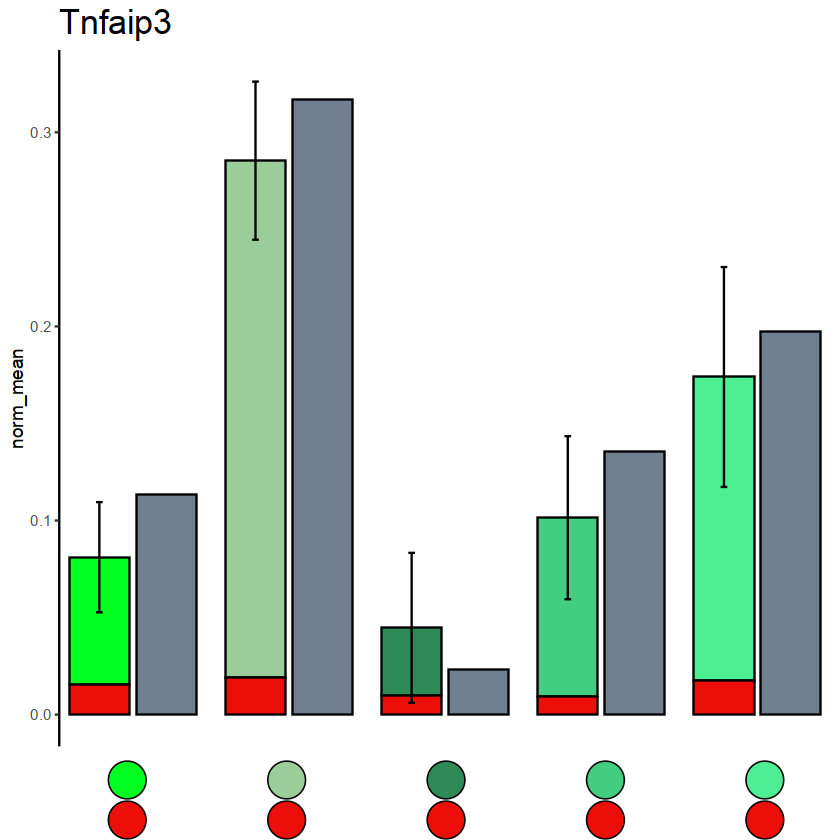

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


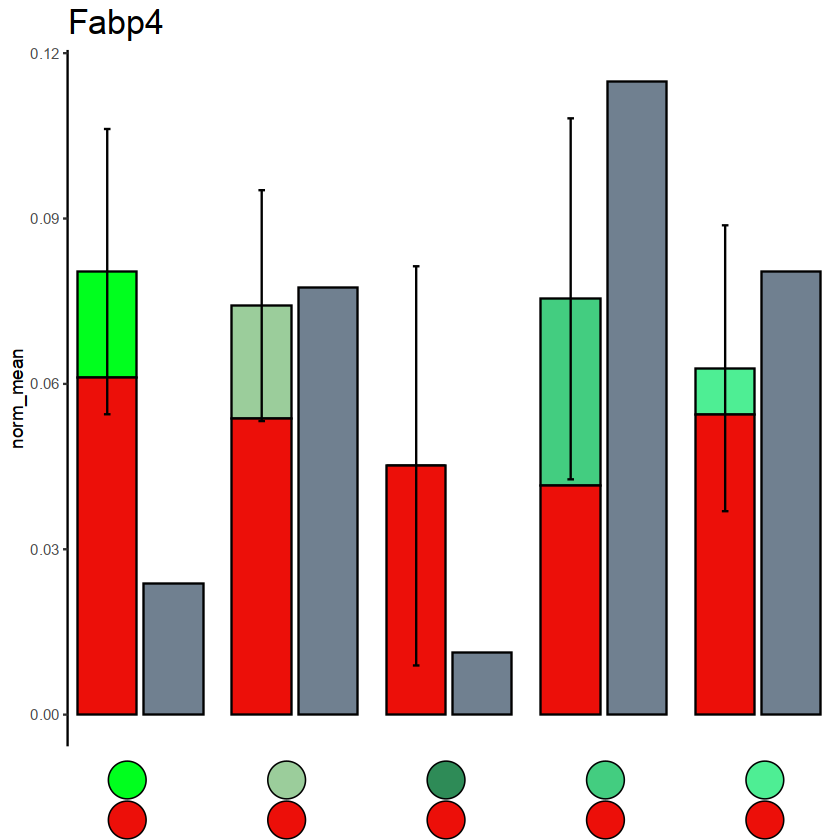

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


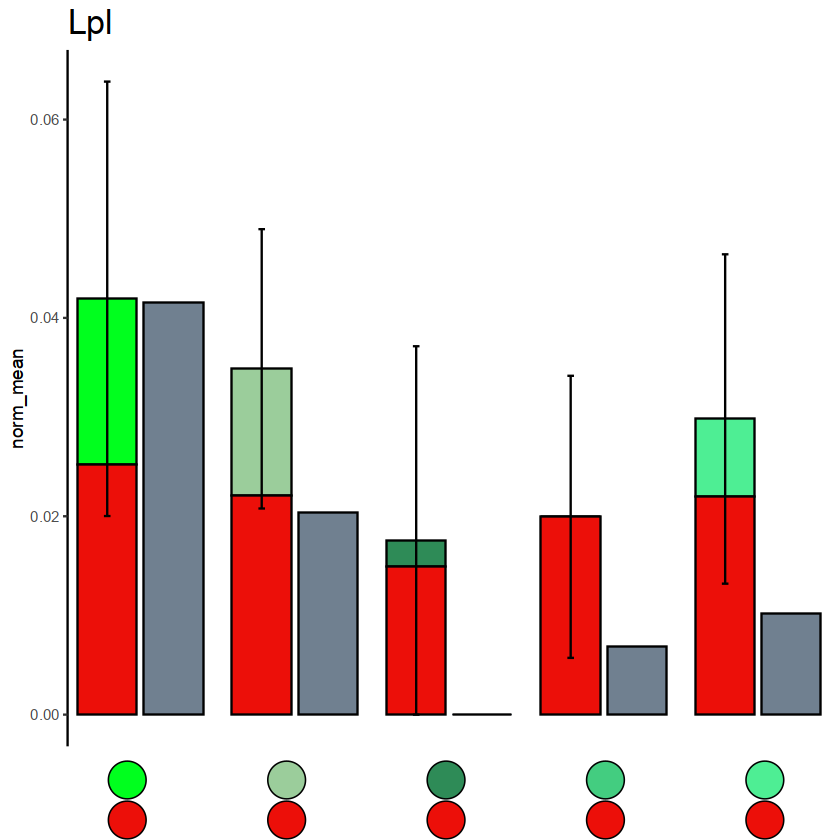

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


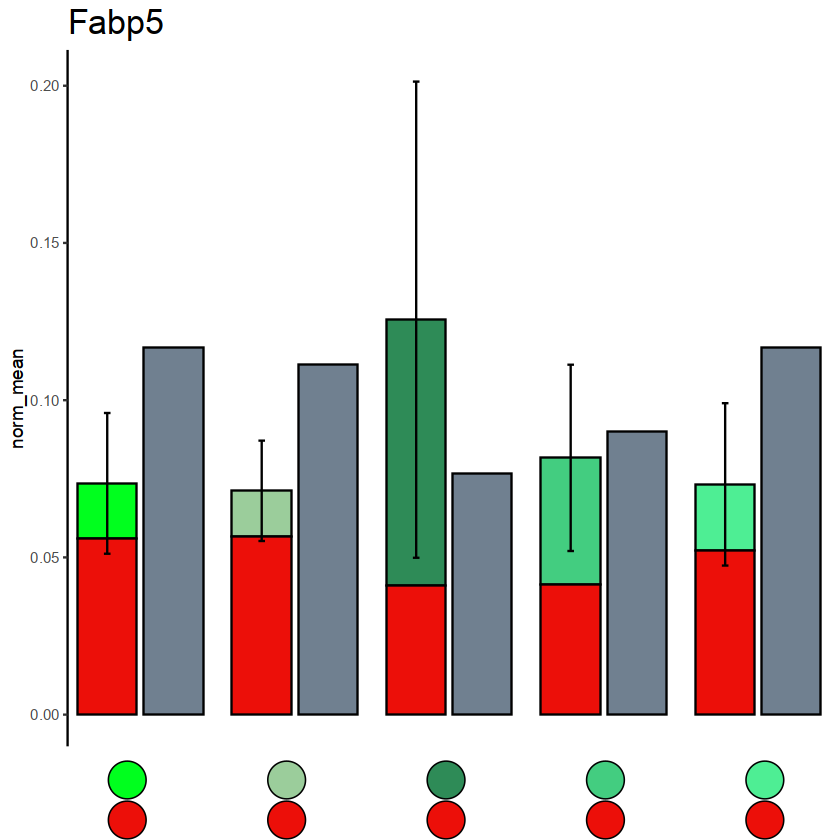

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


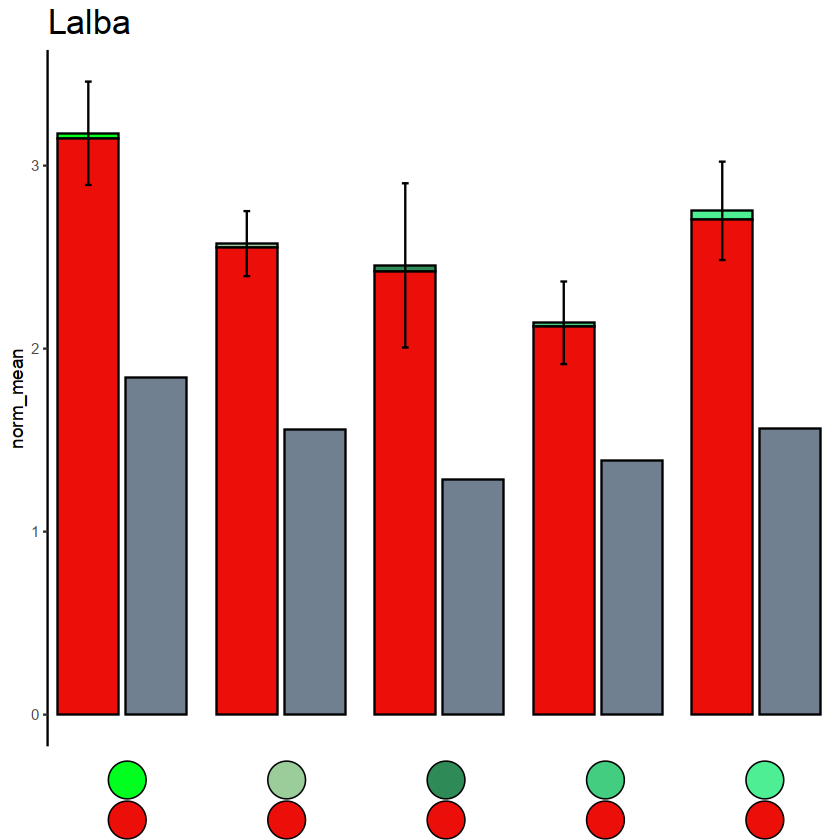

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


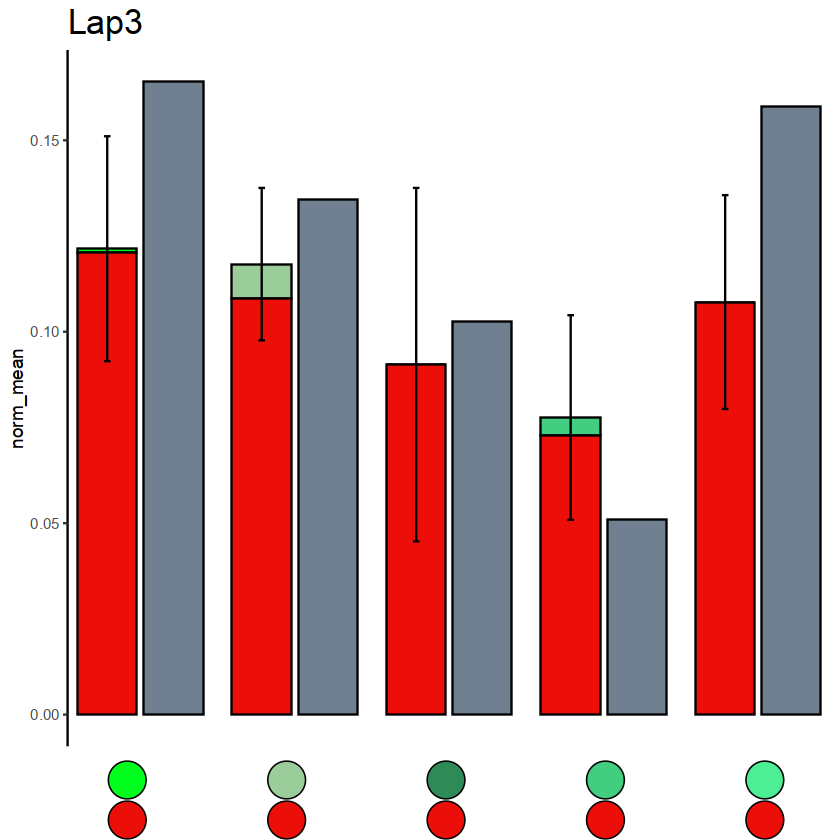

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


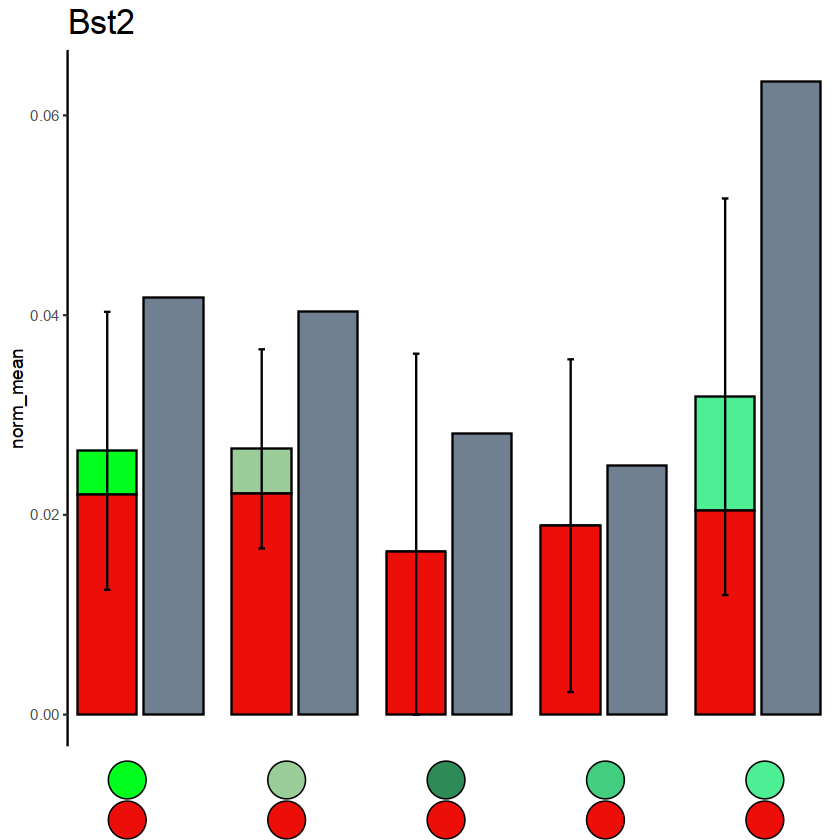

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


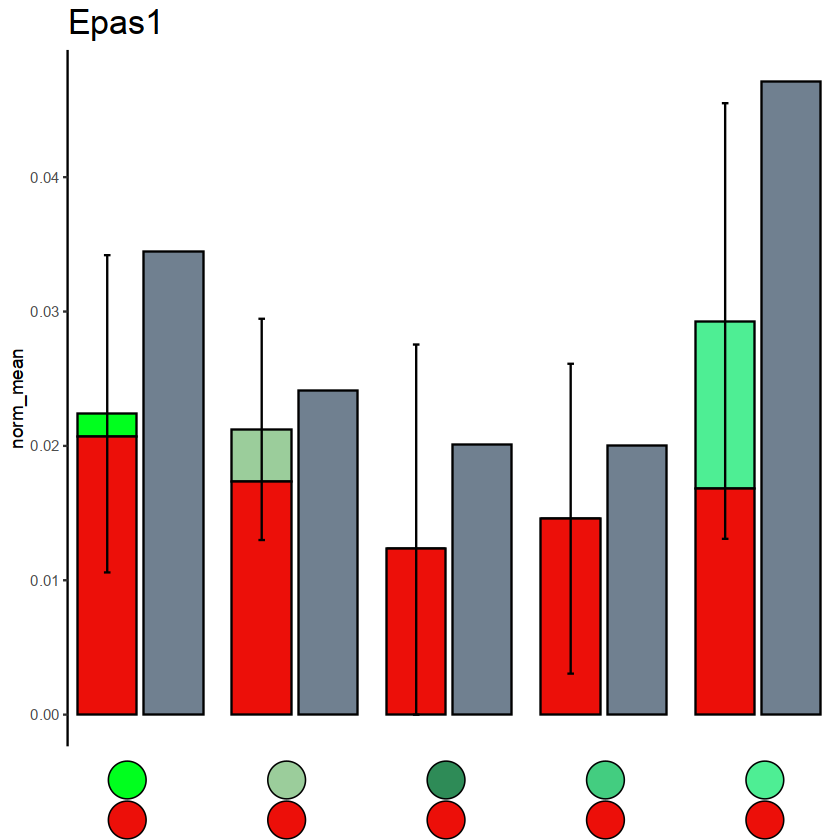

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


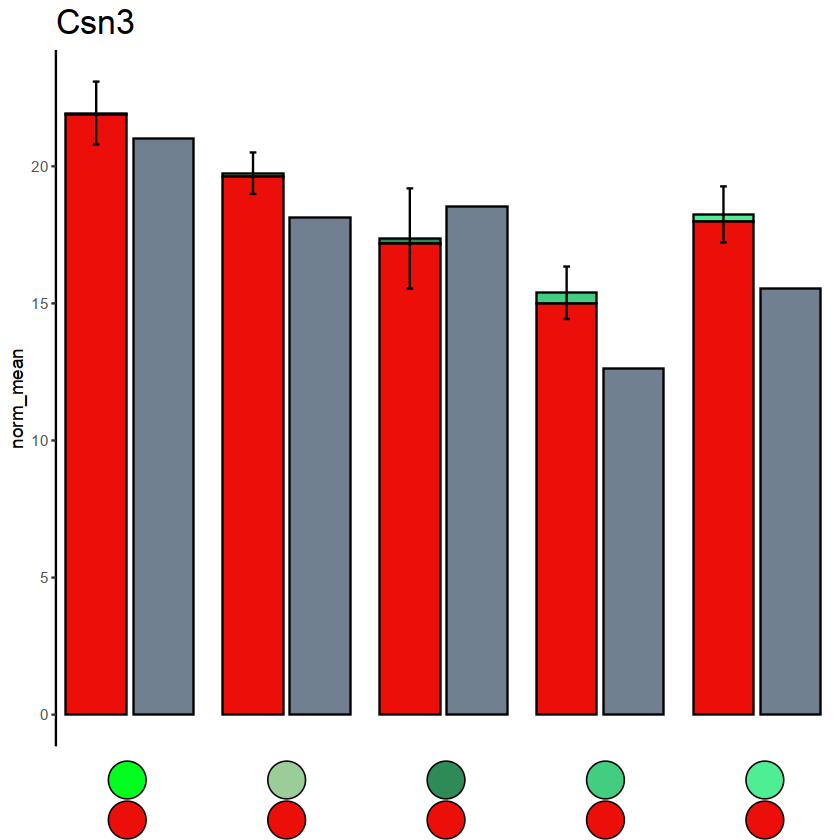

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


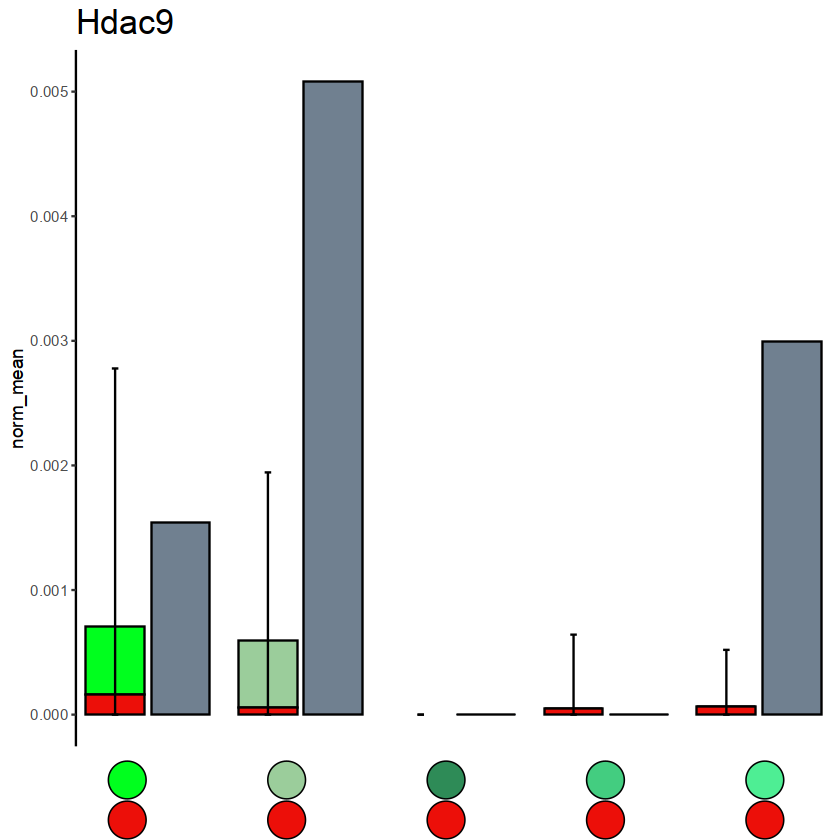

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


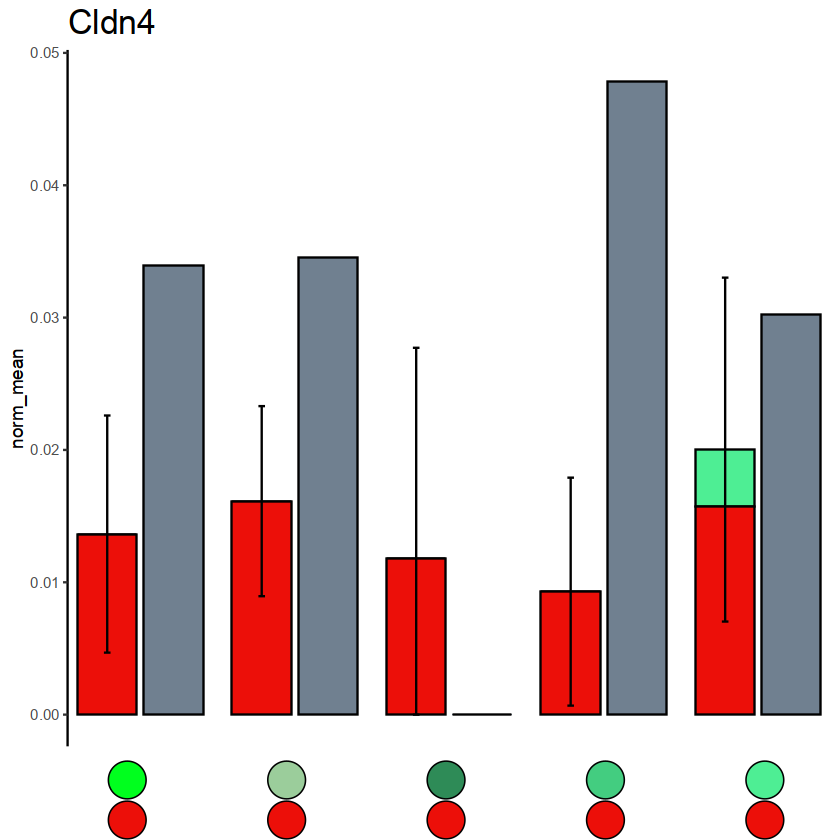

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


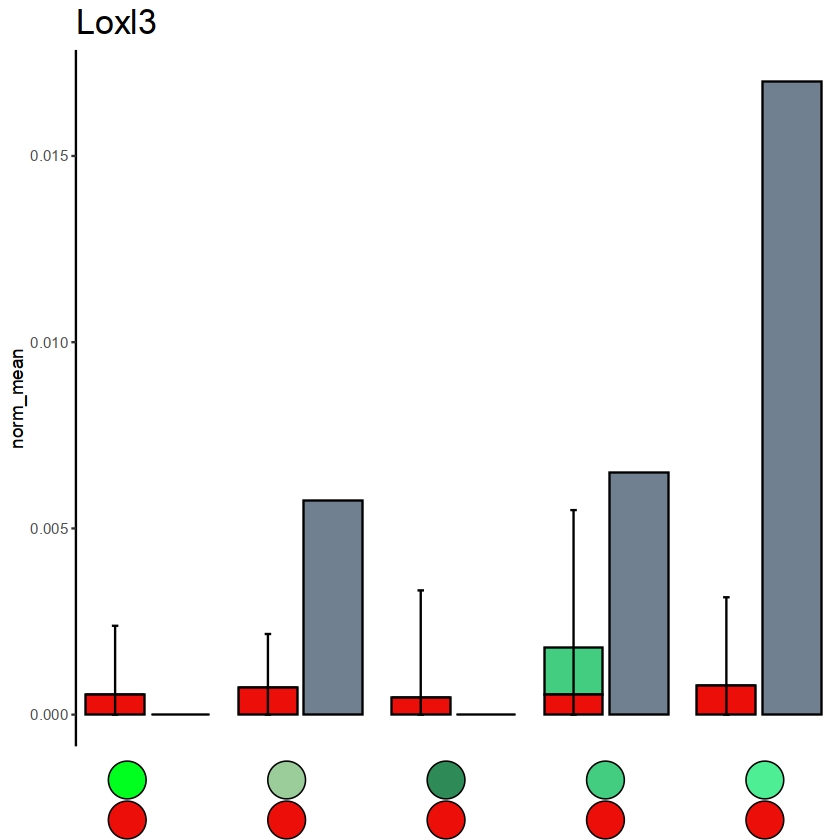

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


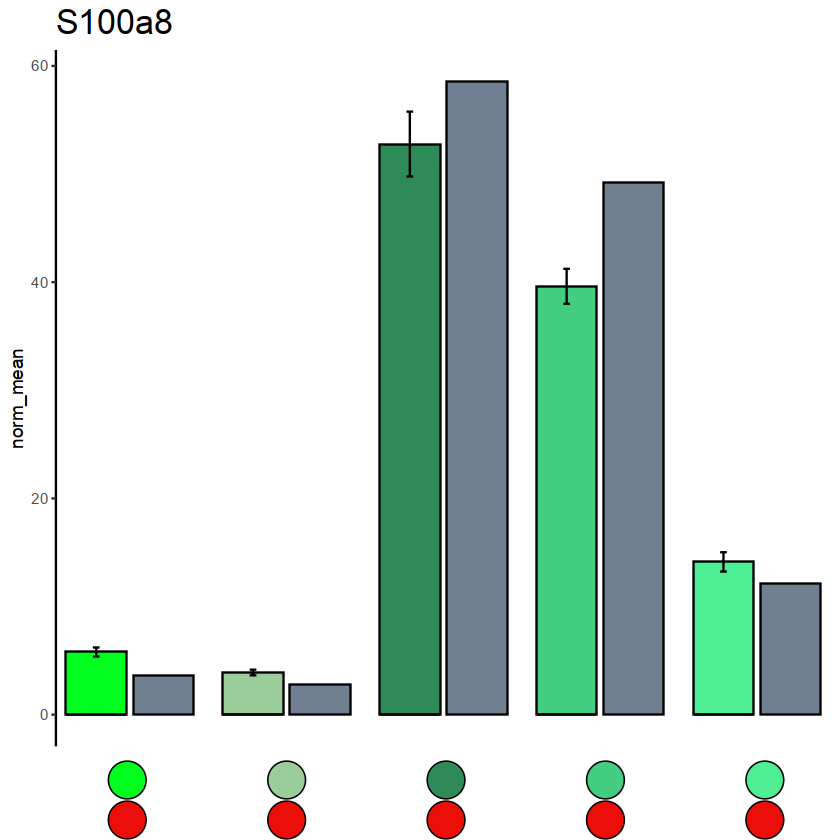

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


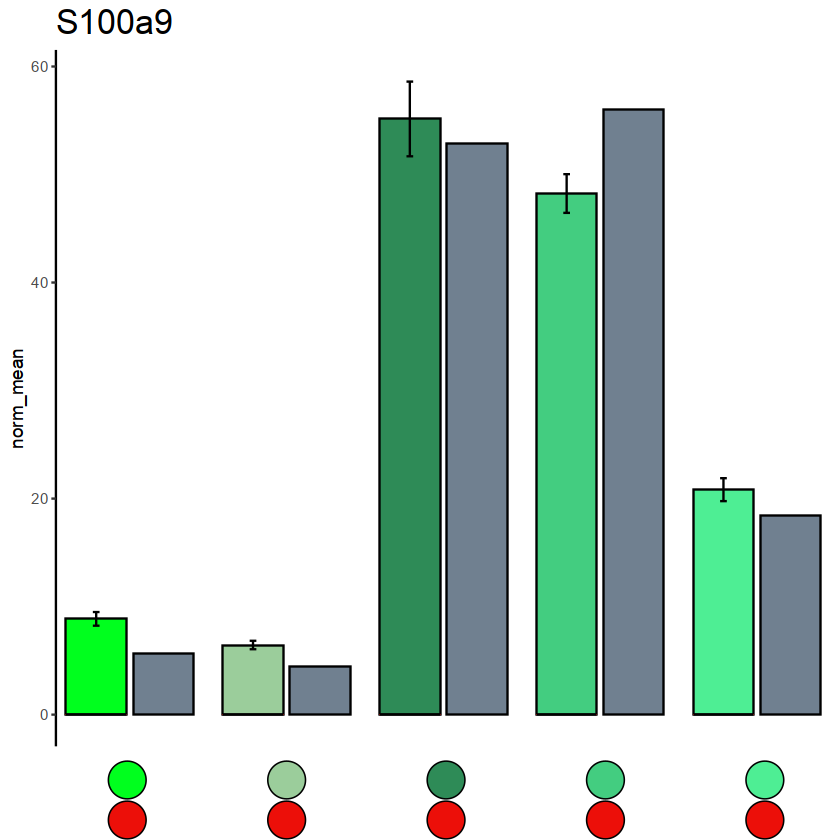

Saving 6.67 x 6.67 in image


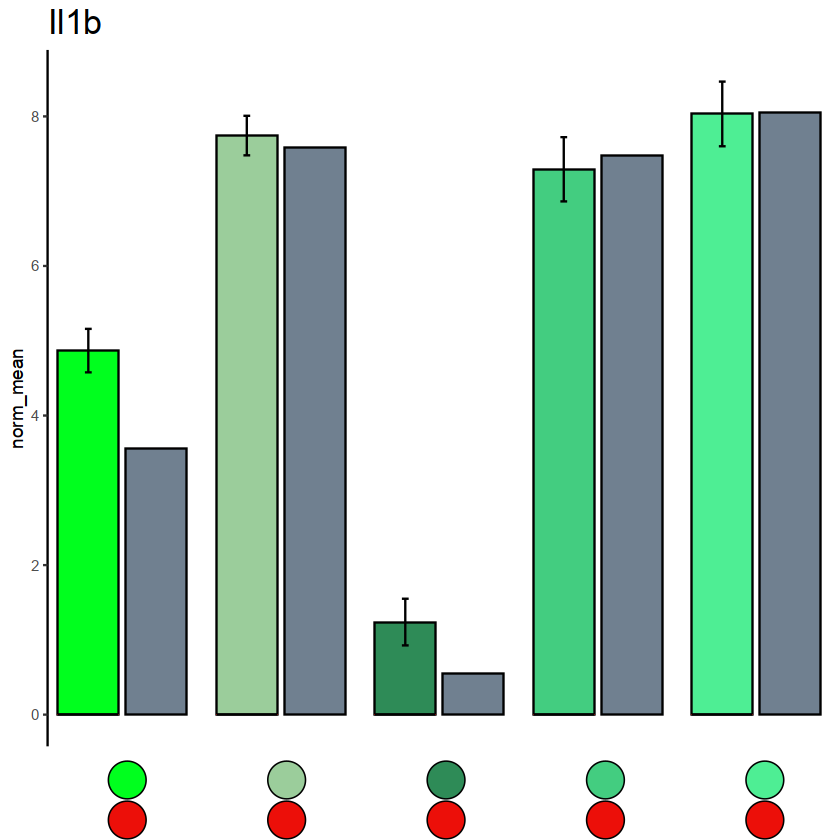

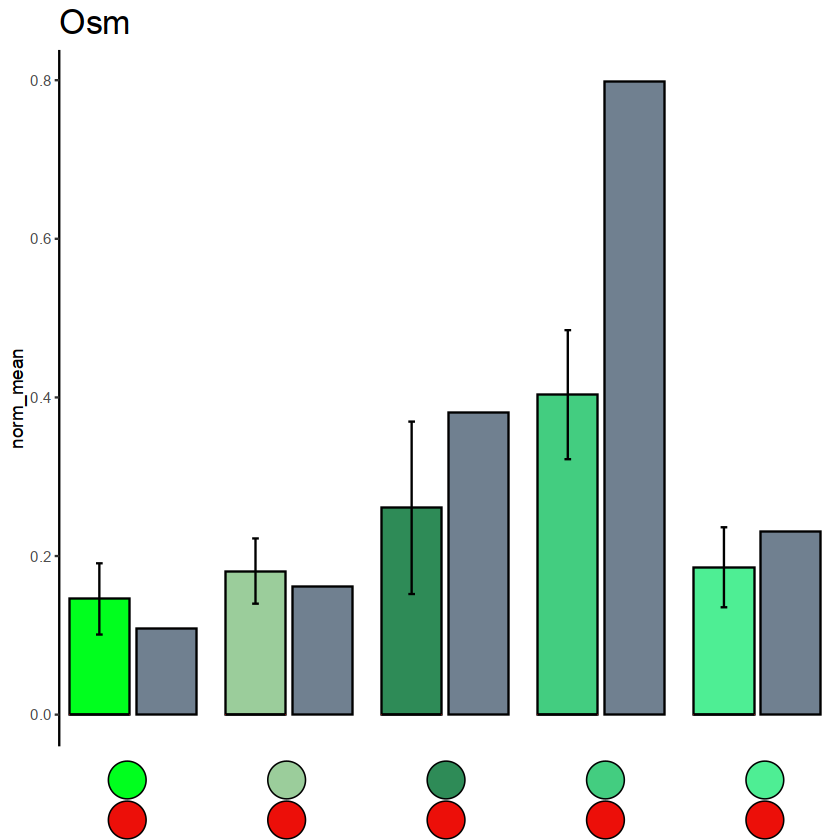

In [667]:
focus_genes = c('Gnai2', "Scamp3", "Bcl3", "Azin1", "Vegfa", "Lilrb4b", "Vegfb", "Rsad2", "Vapb", "Arhgef3", "Rock2", "Tnfaip3", 
                "Fabp4", "Lpl", "Fabp5", "Lalba", "Lap3", "Bst2", "Epas1", "Csn3", 
                "Hdac9", "Cldn4", "Loxl3", "S100a8", "S100a9", "Il1b", "Osm") # THIS IS NEW
for (gene in focus_genes){
    p = per_comb_obs_exp(gene)
    ggsave(paste0("final_figs/fig5/new_gene/gene_comb/", gene, ".pdf"), plot=p)
}

In [96]:
pvals = full_genedata %>%
    dcast(gene ~ pic, value.var='full_adj_pval', fun.aggregate = function(x){x[1]}) %>%
    column_to_rownames('gene')

In [97]:
pvals$min_pval = rowMin(as.matrix(pvals))

In [98]:
sig_somewhere = rownames(pvals)[(pvals$min_pval < 0.05)]

In [99]:
(rownames(all_genedata)[all_genedata$adj_pval < 0.05] %in% sig_somewhere) %>% table

.
FALSE  TRUE 
   73    89 

Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


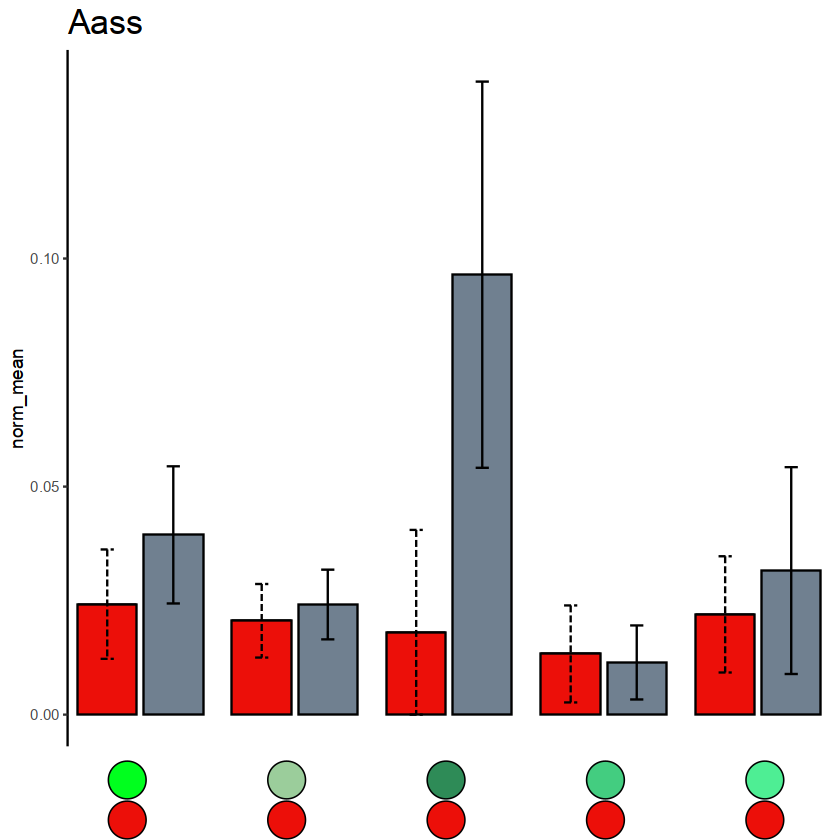

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


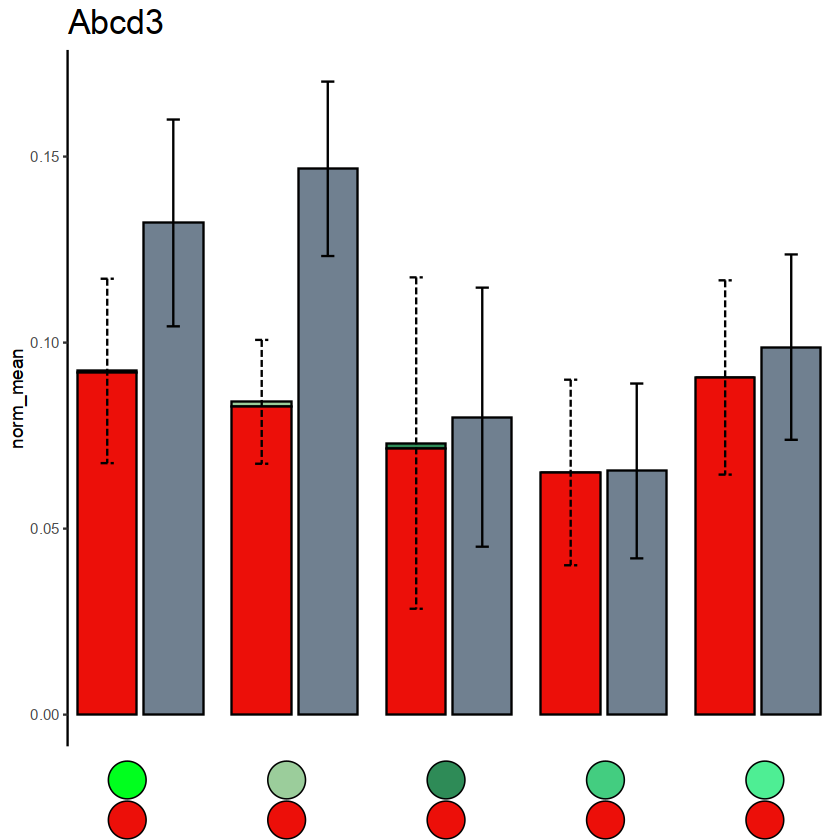

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


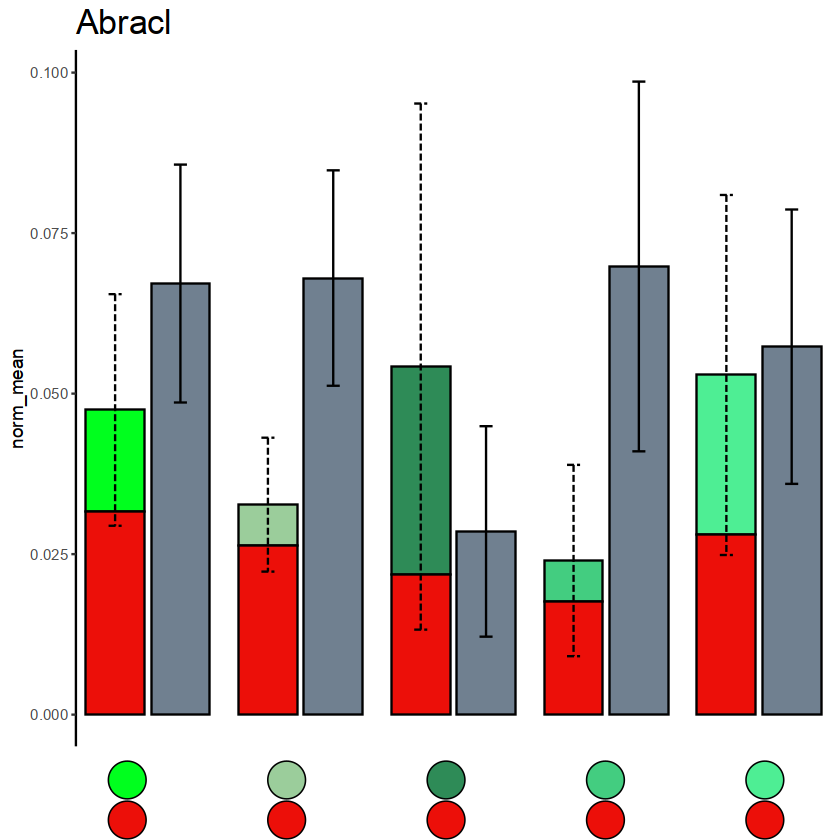

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


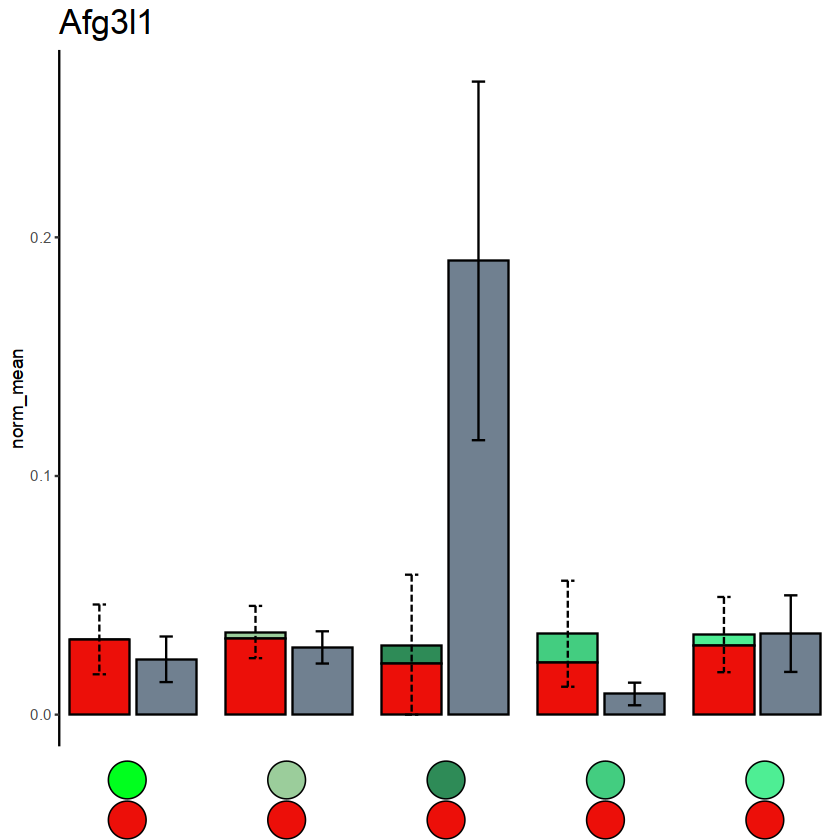

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


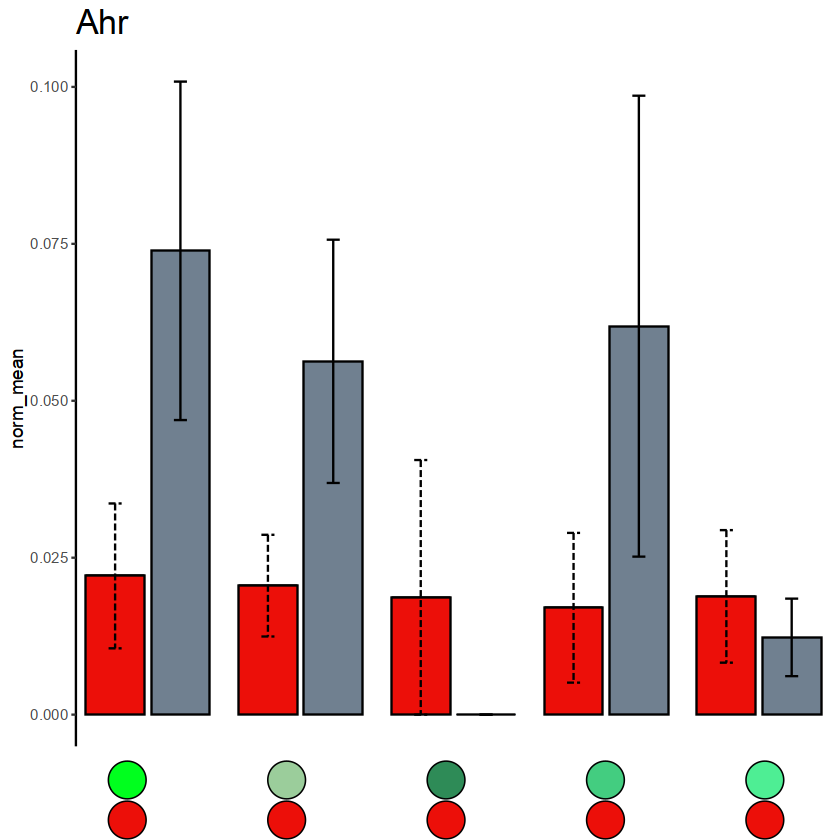

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


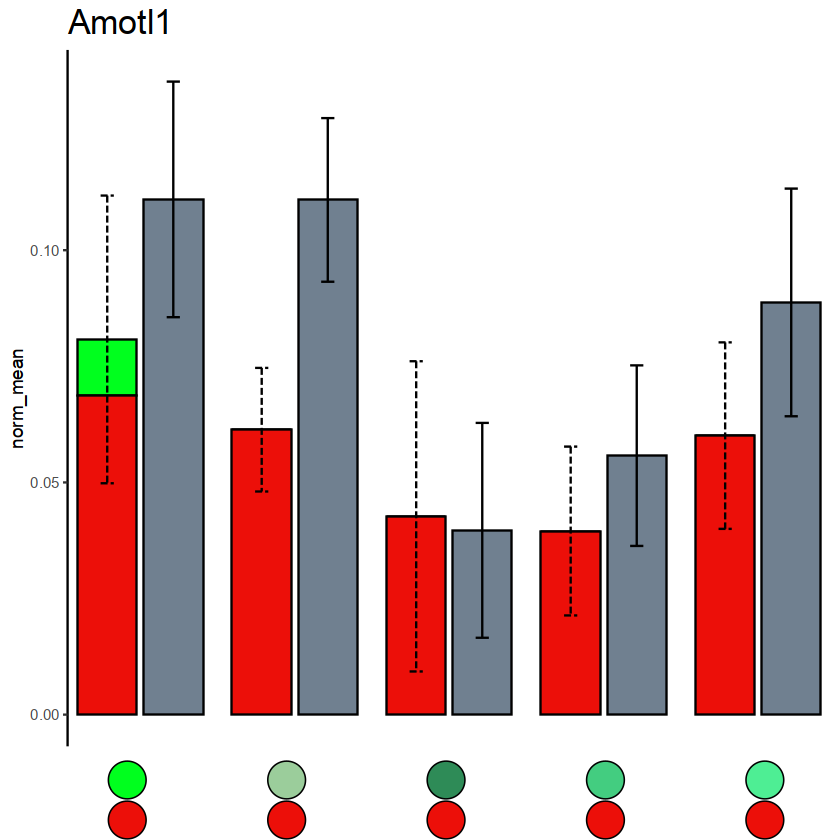

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


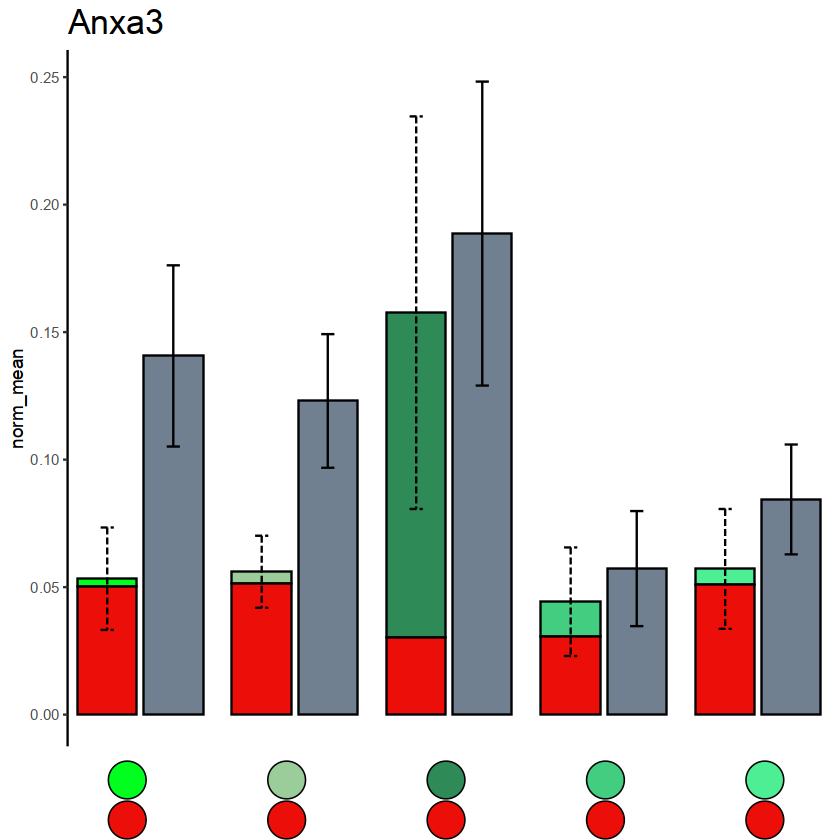

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


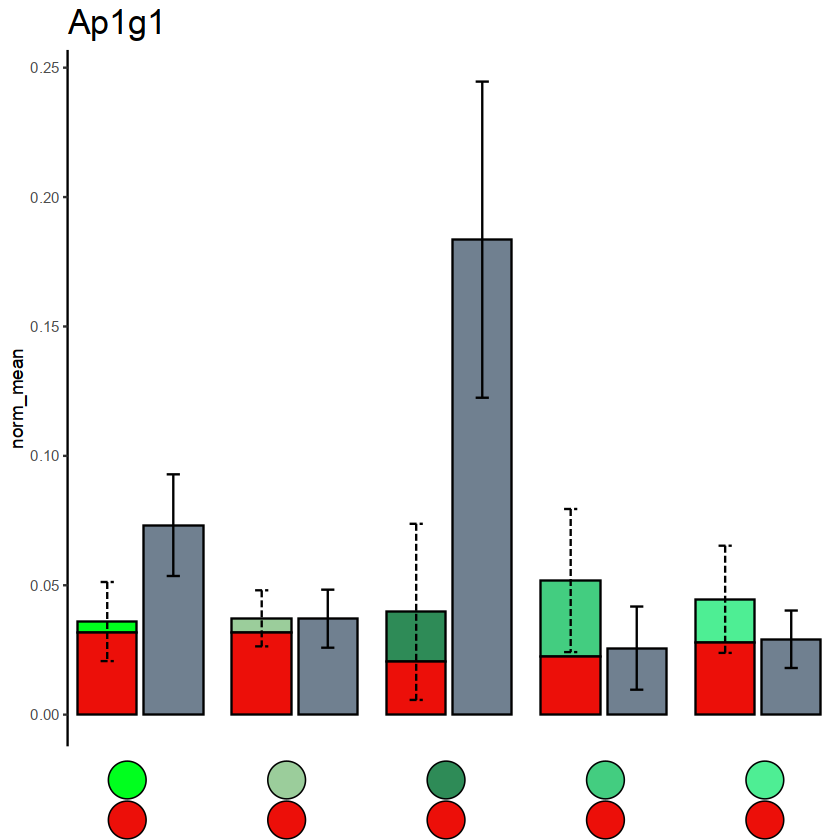

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


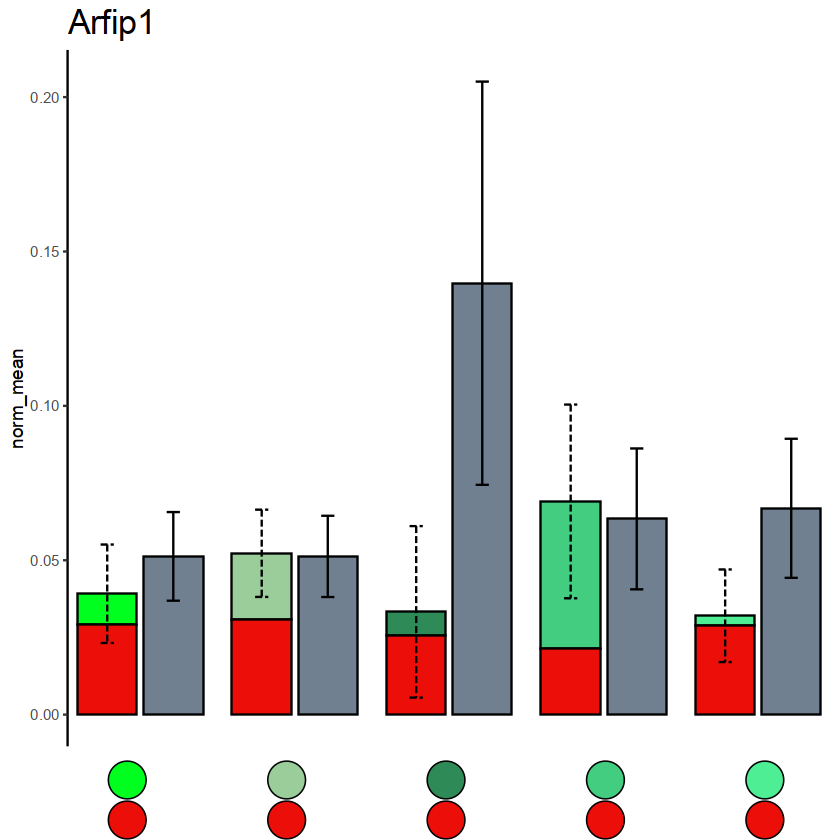

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


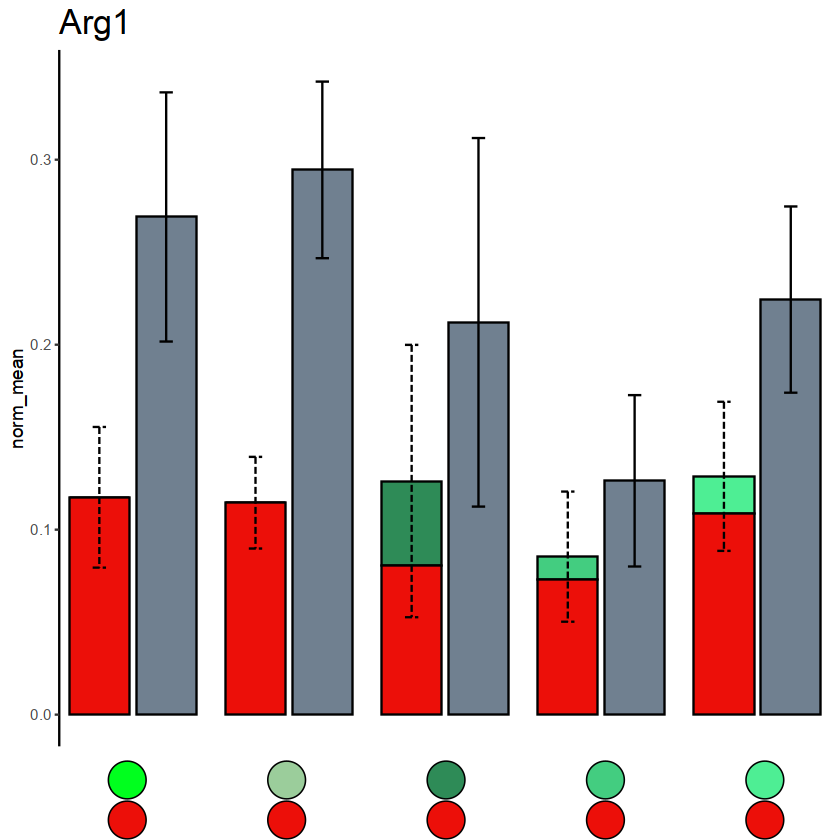

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


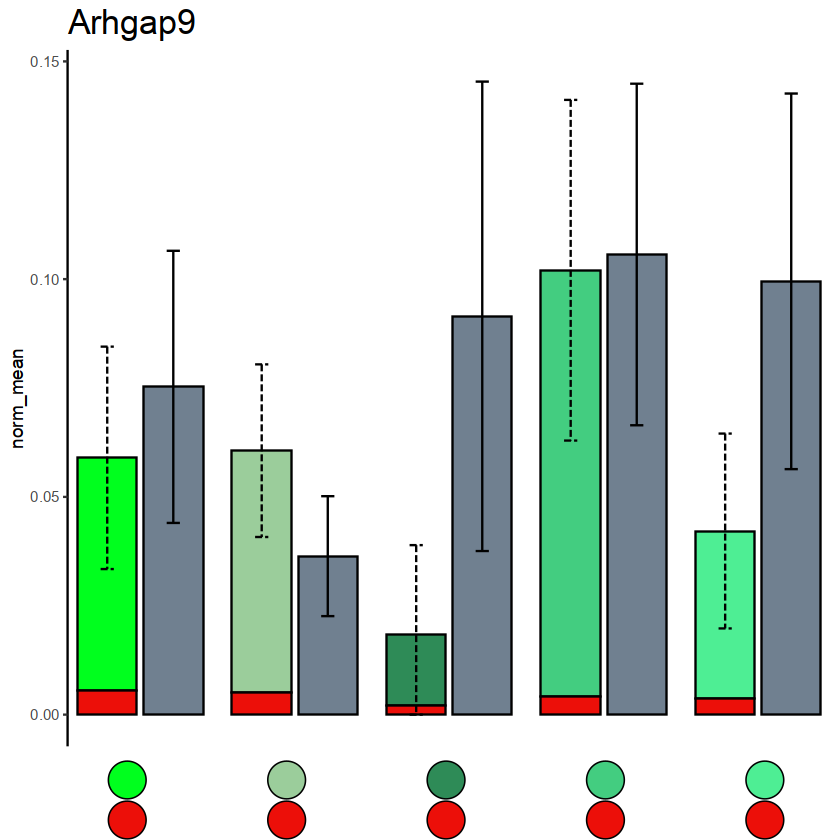

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


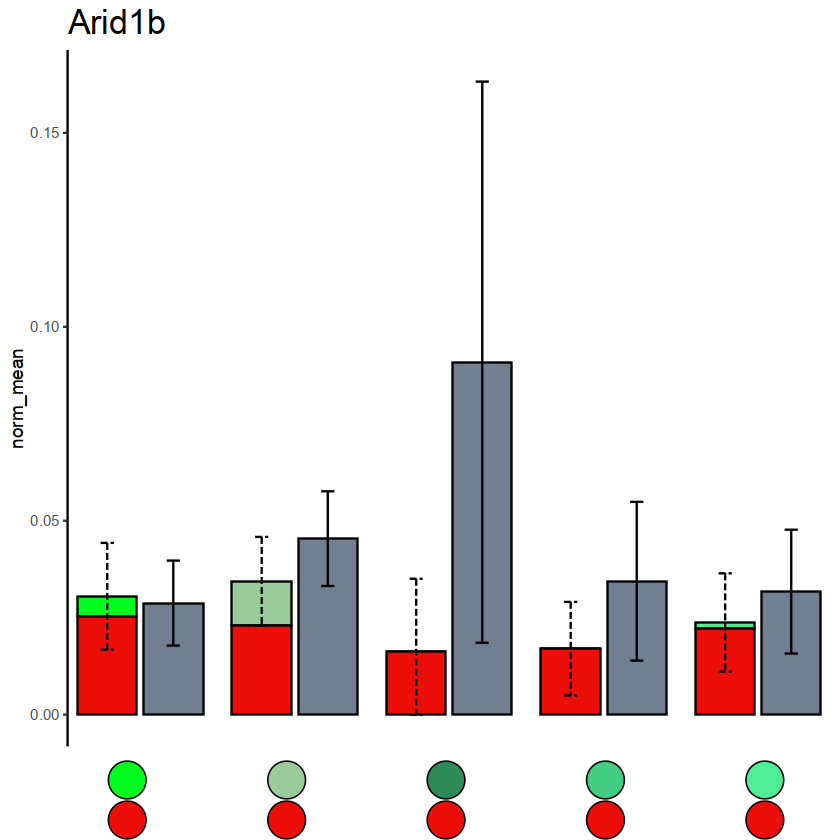

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


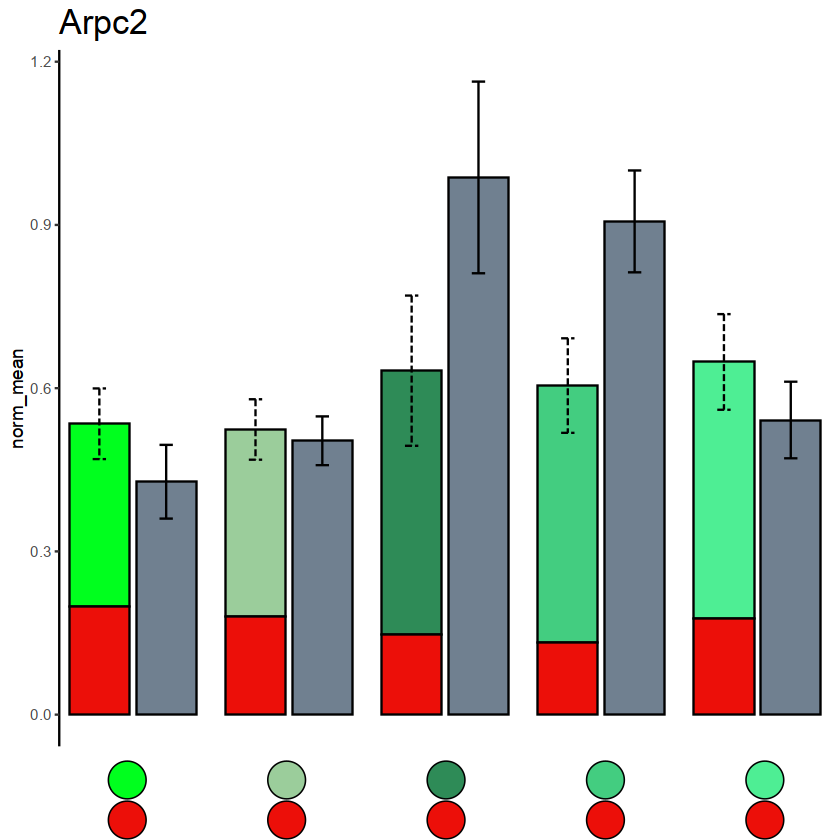

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


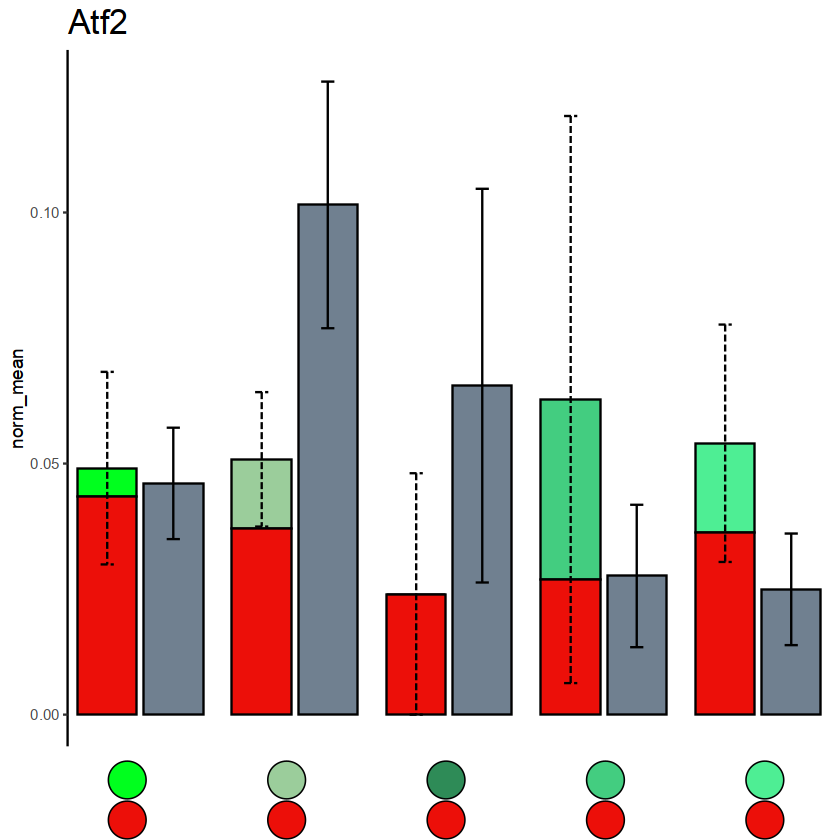

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


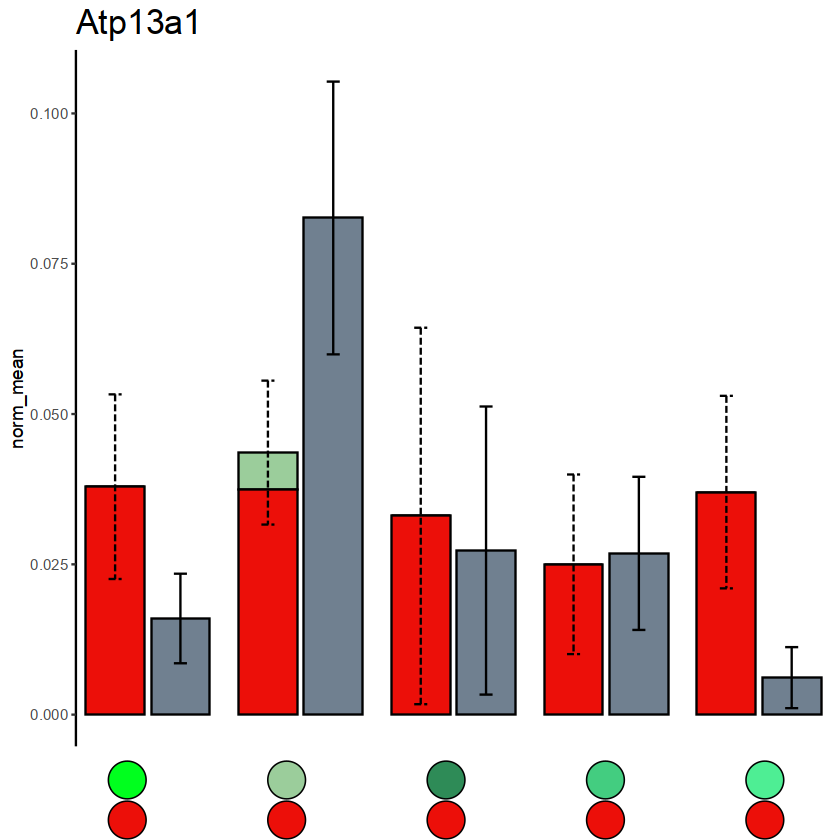

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


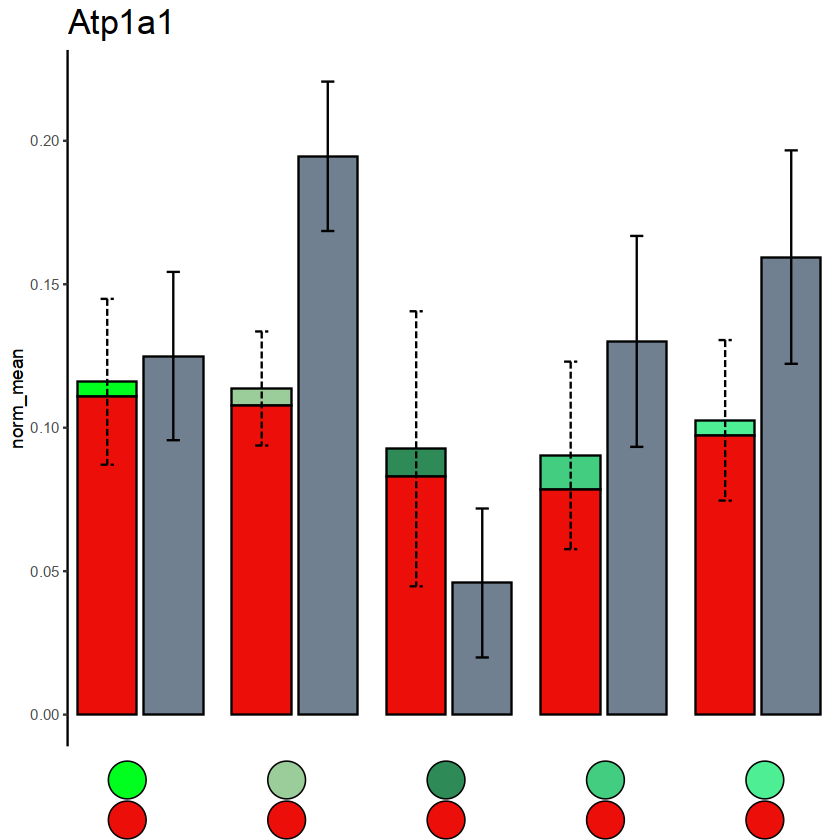

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


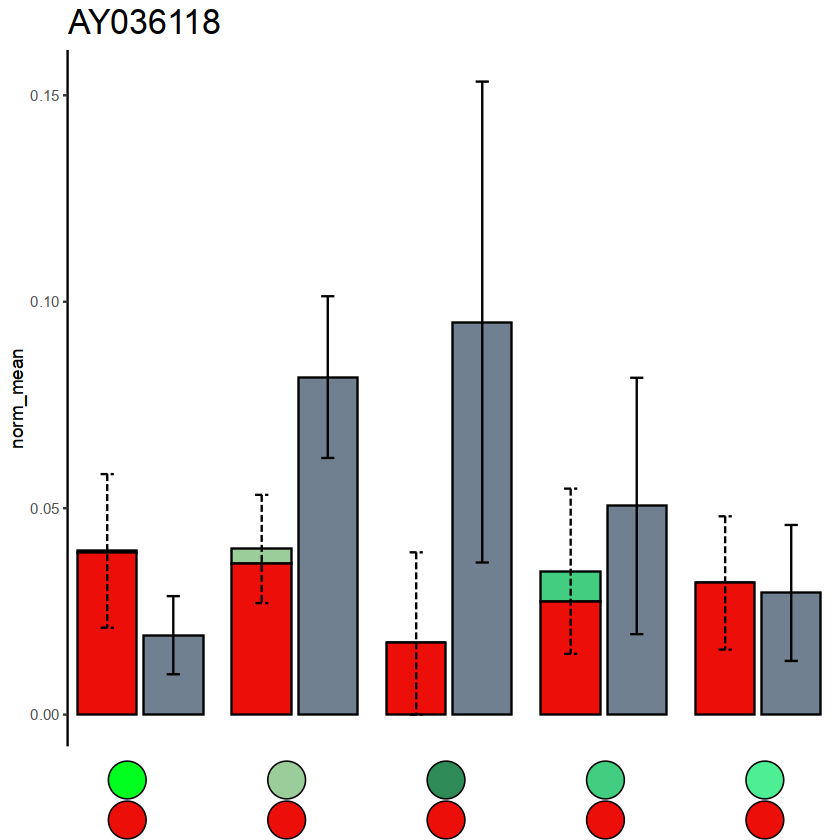

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


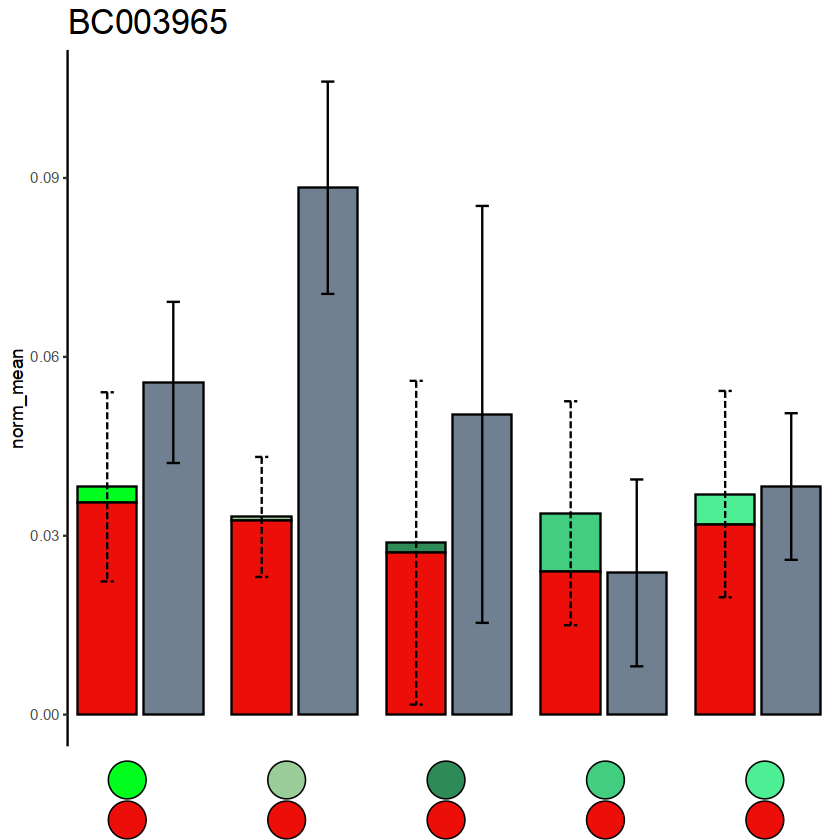

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


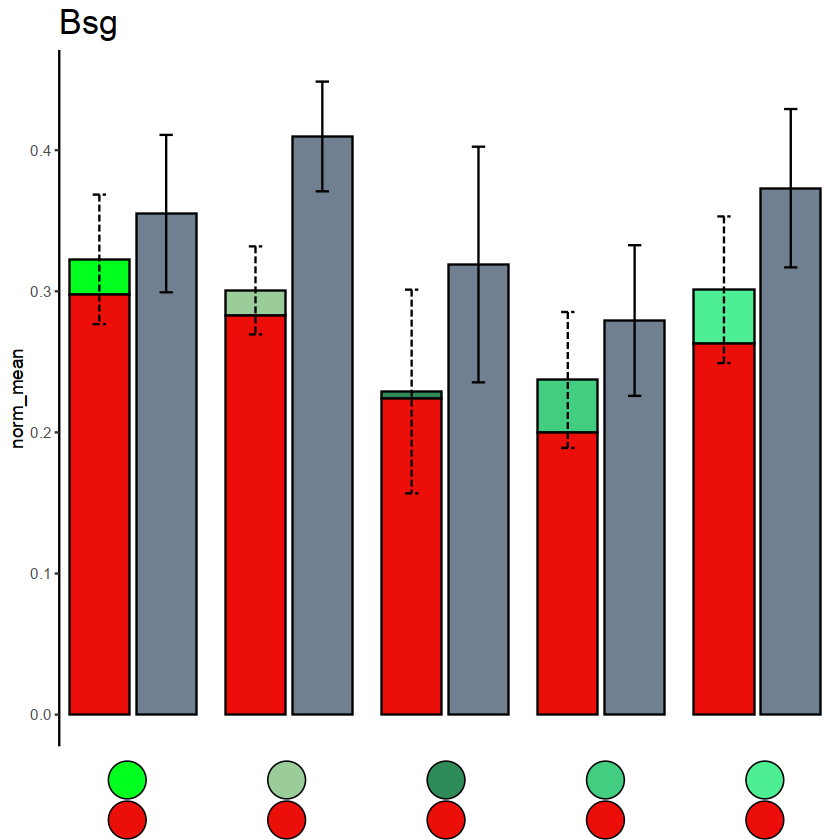

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


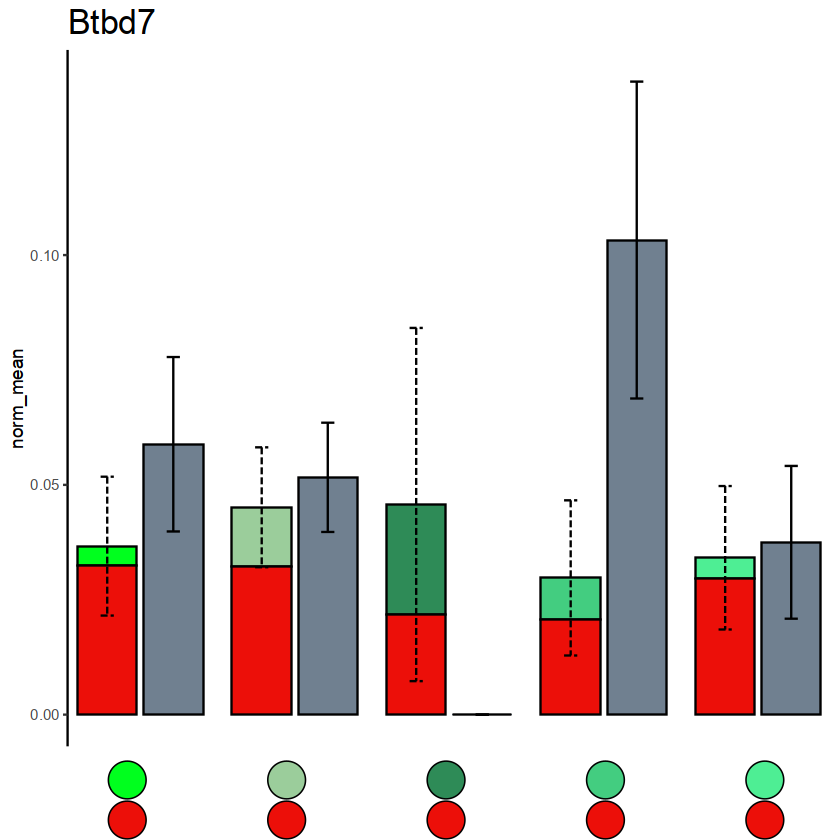

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


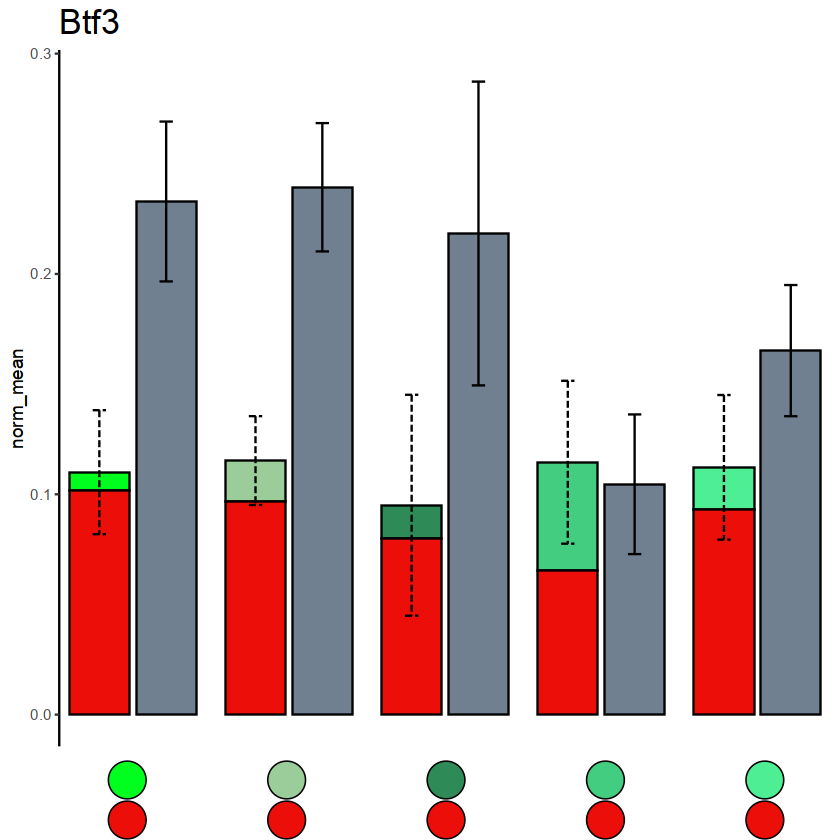

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


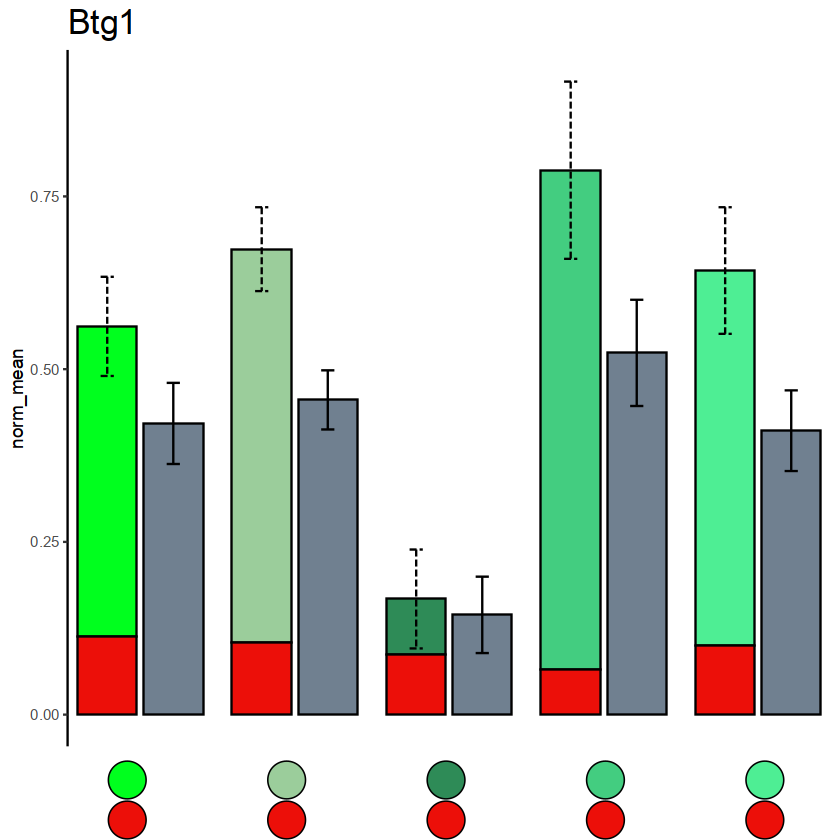

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


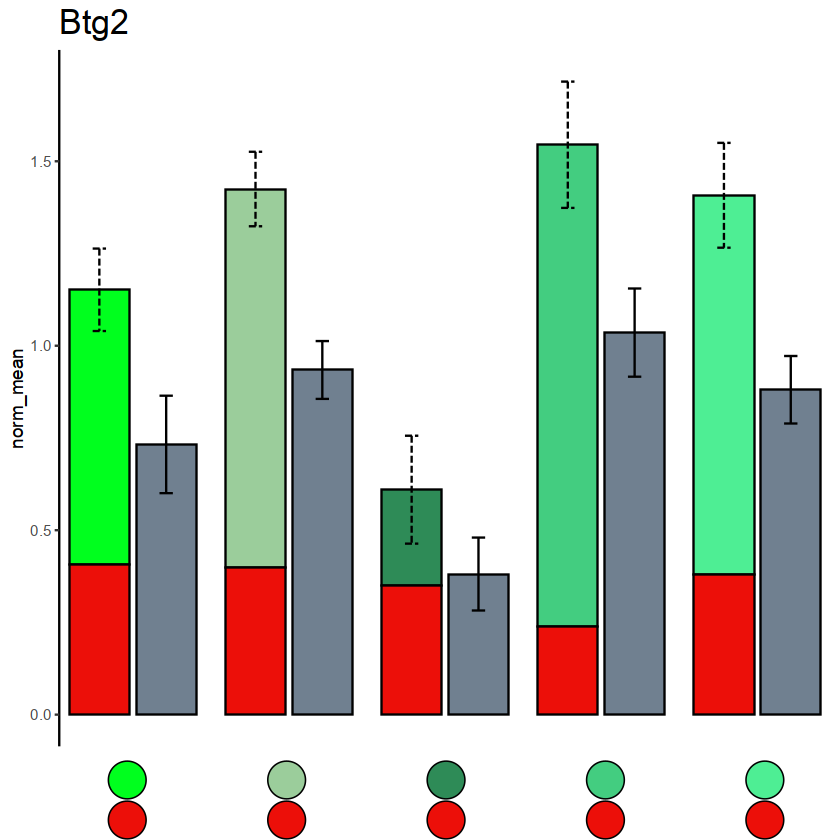

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


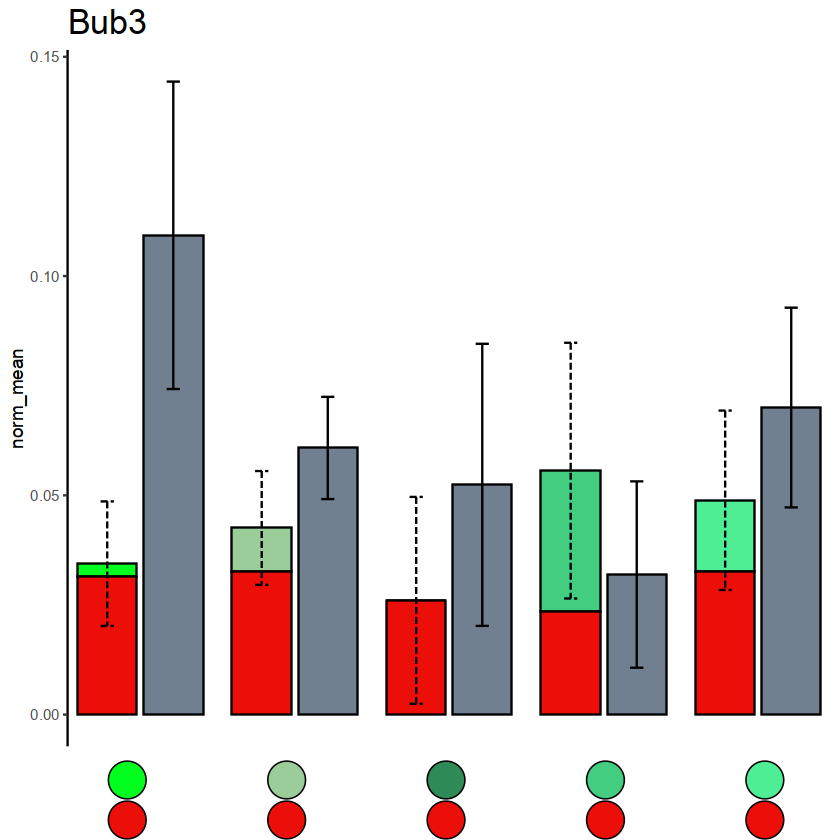

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


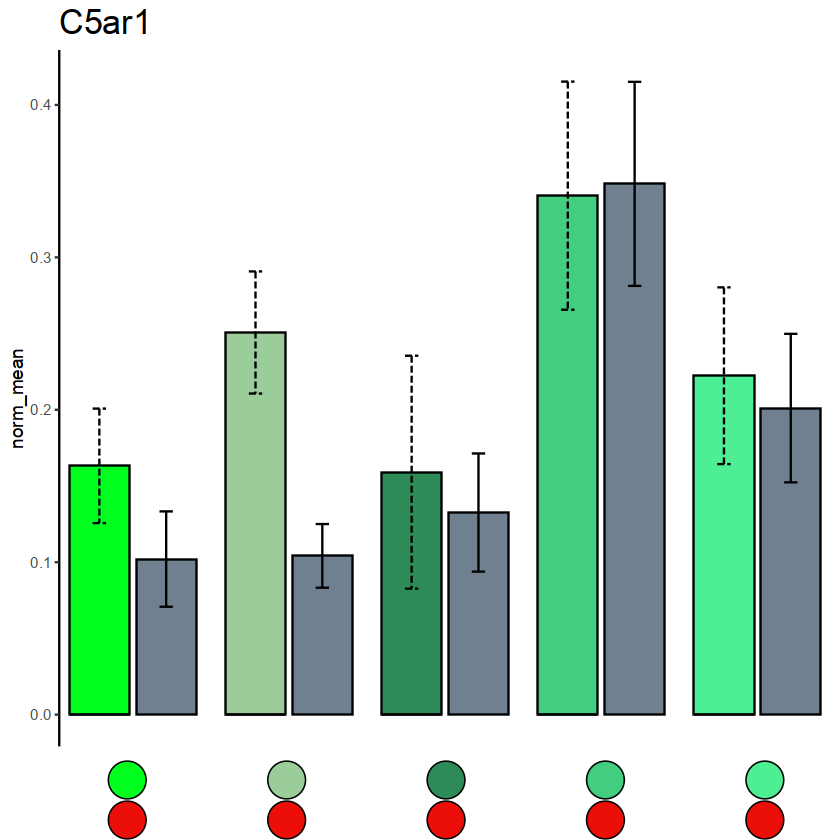

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


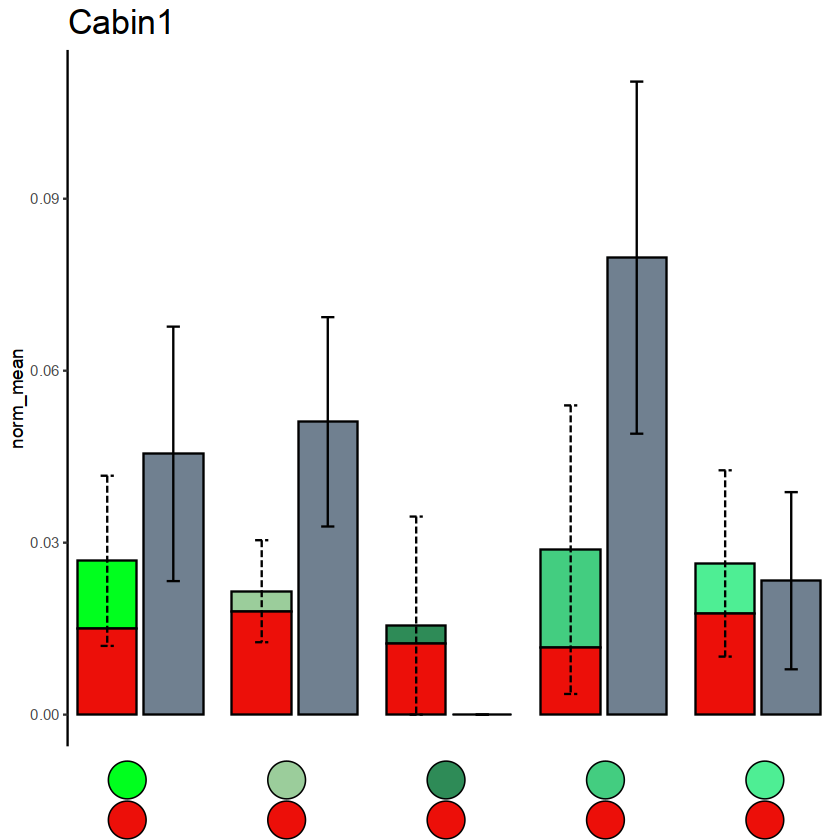

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


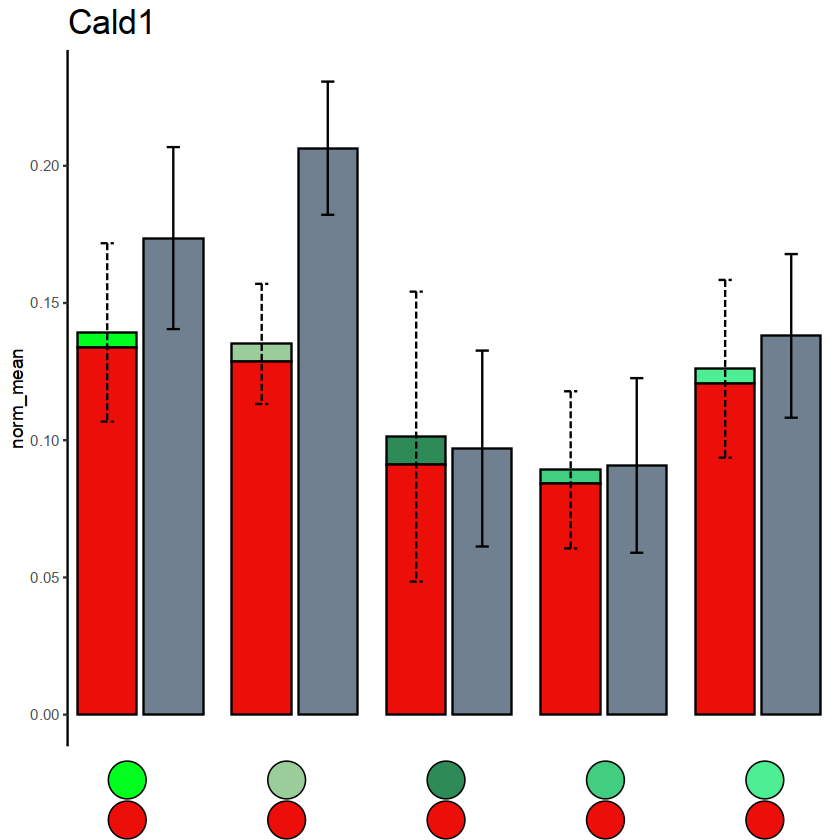

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


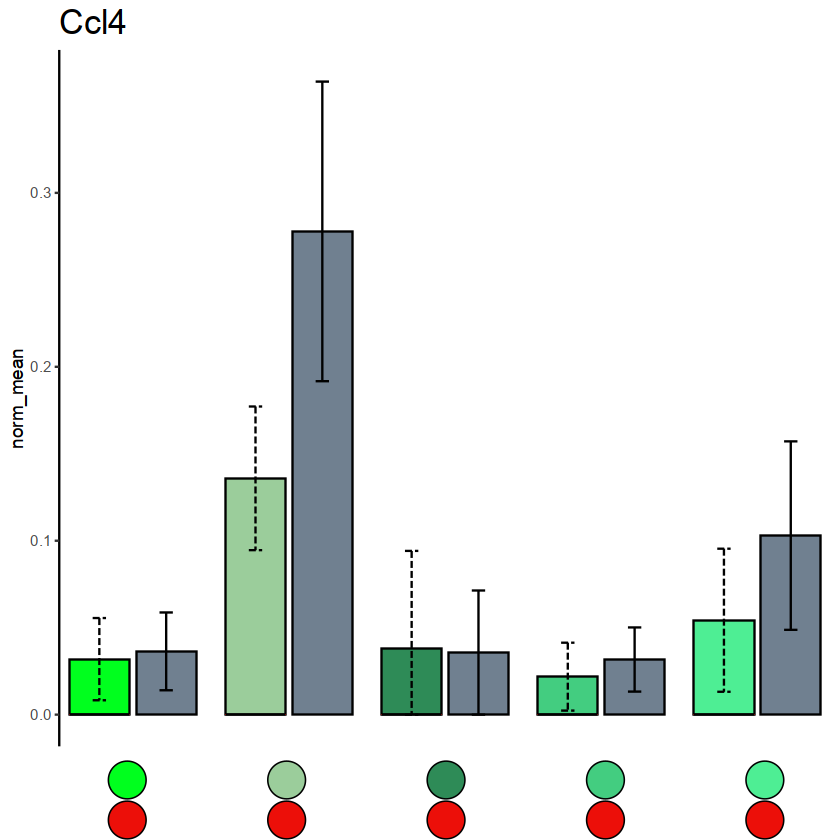

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


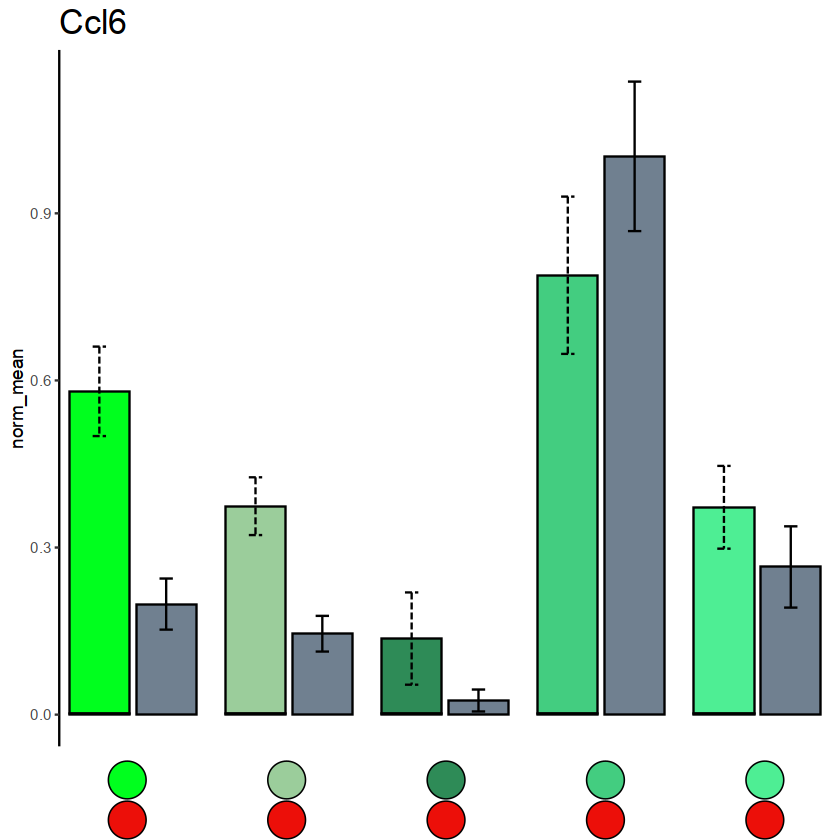

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


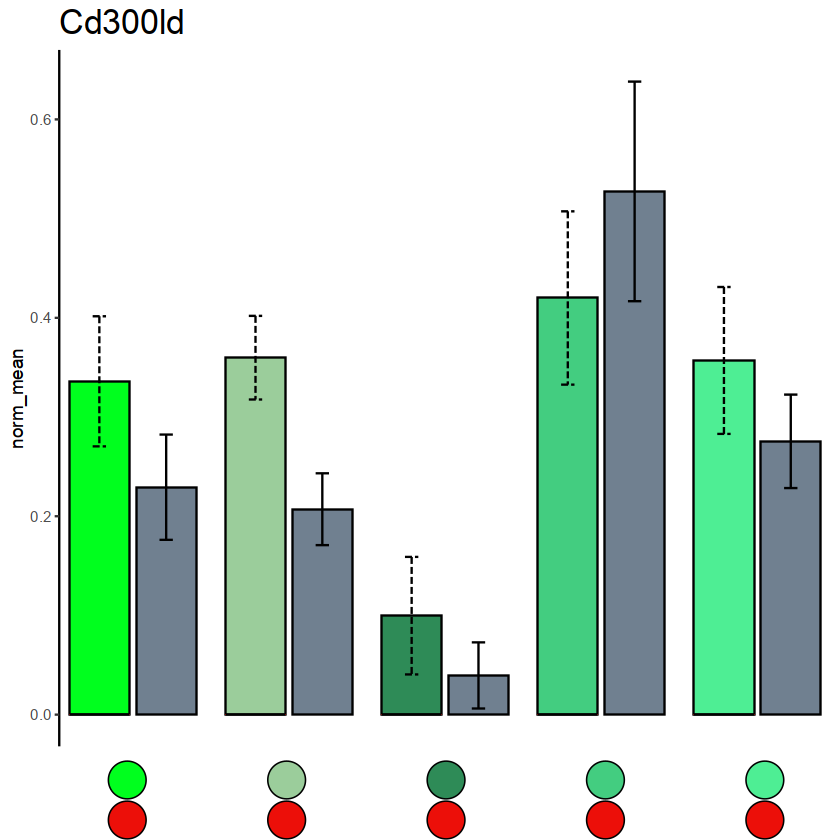

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


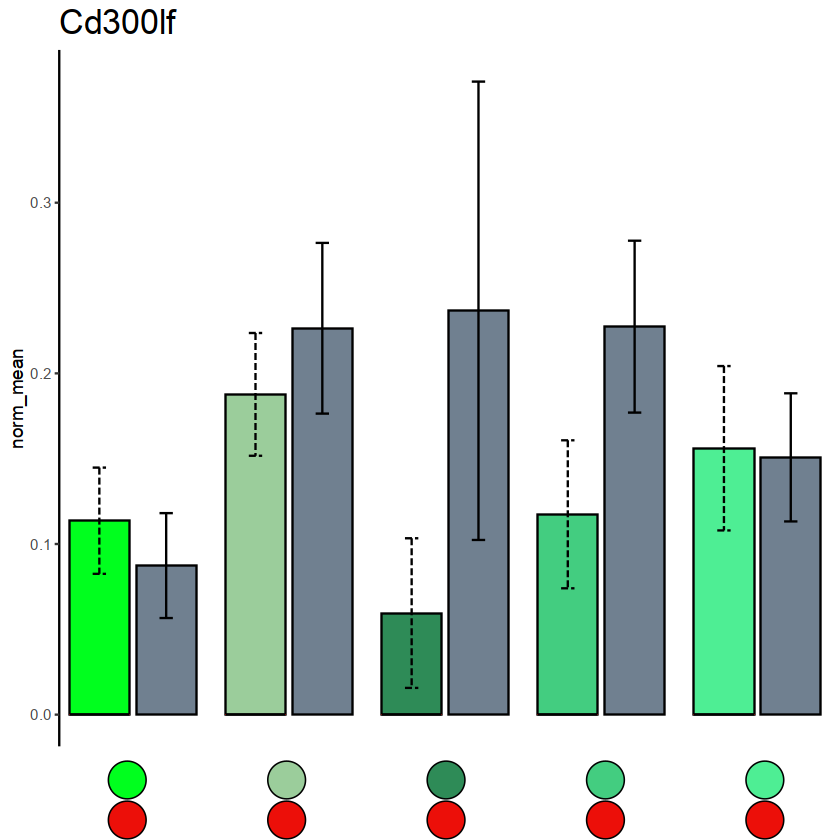

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


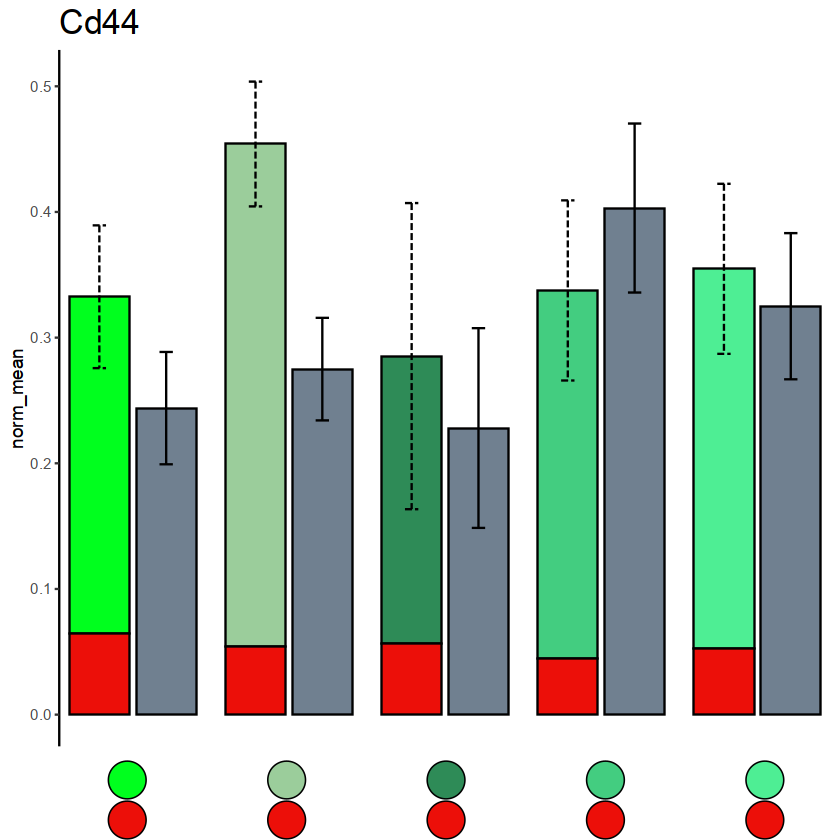

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


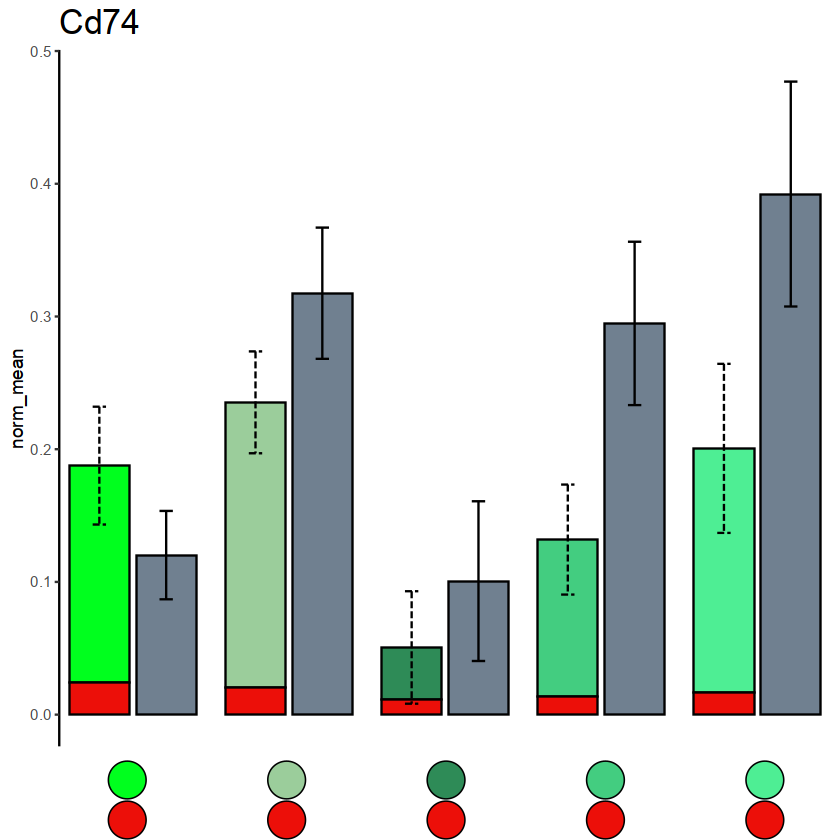

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


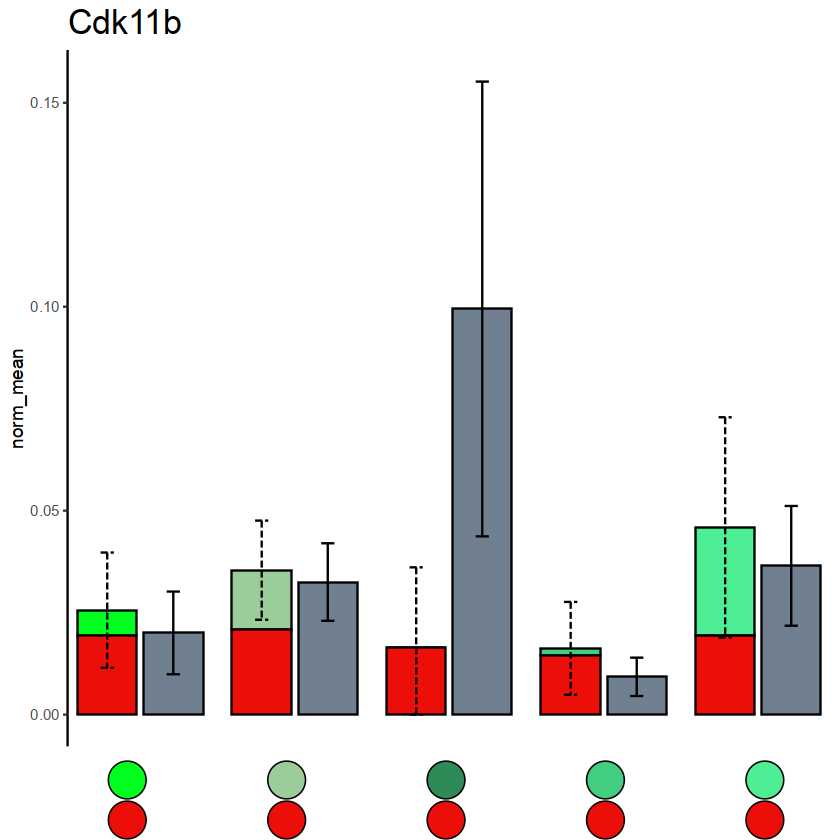

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


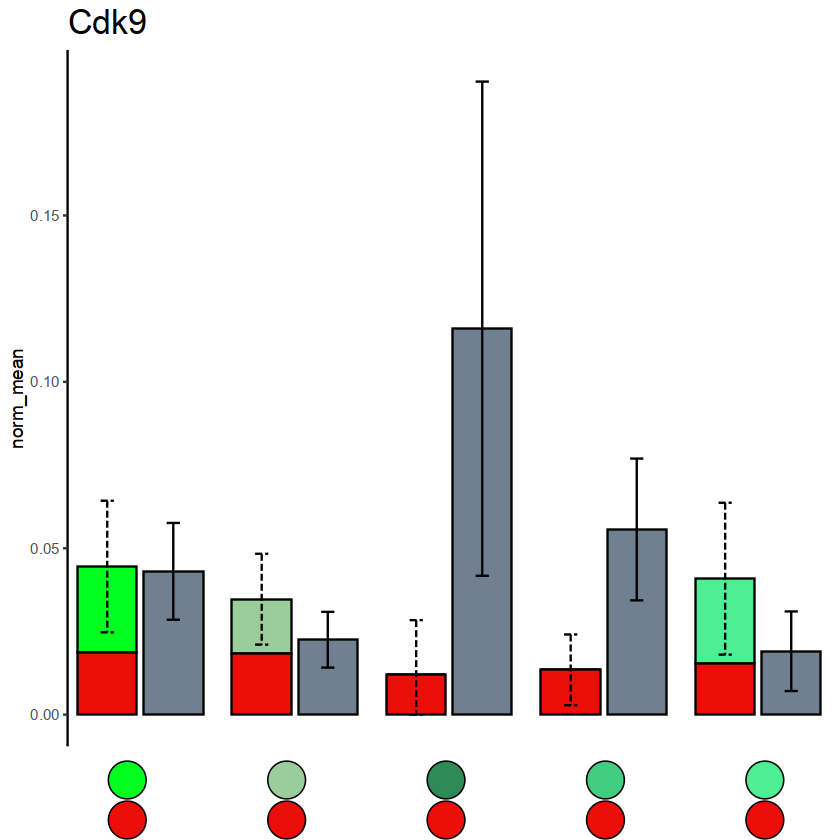

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


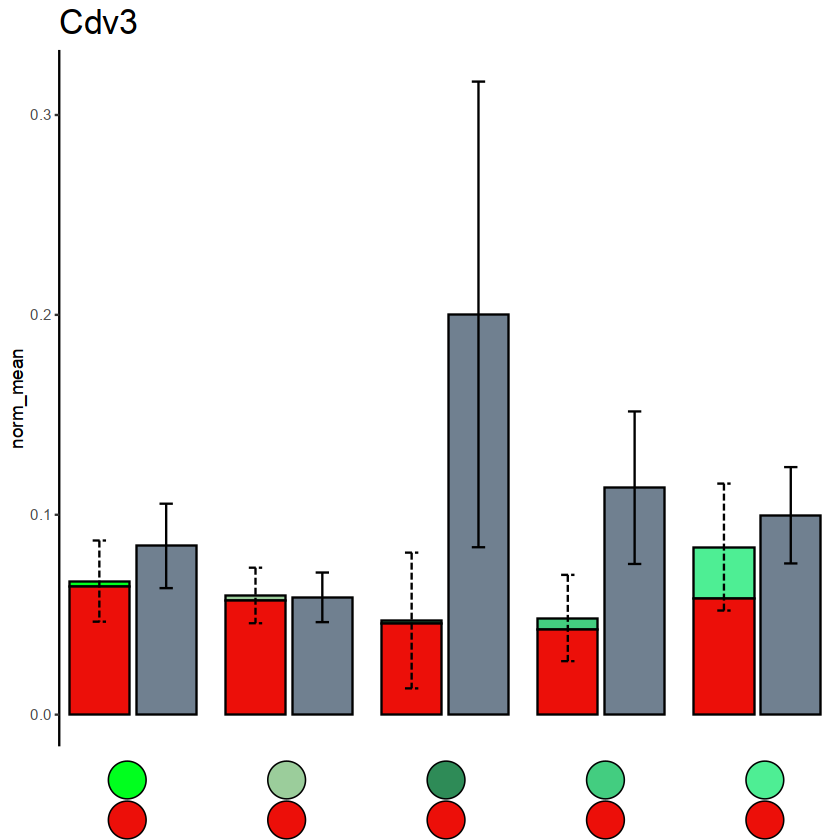

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


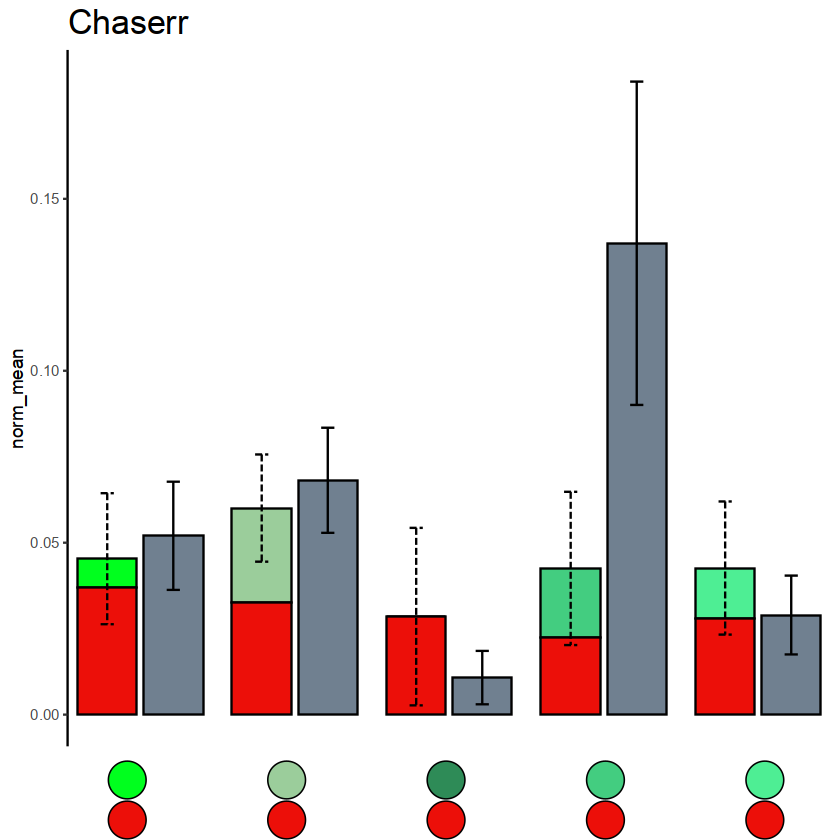

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


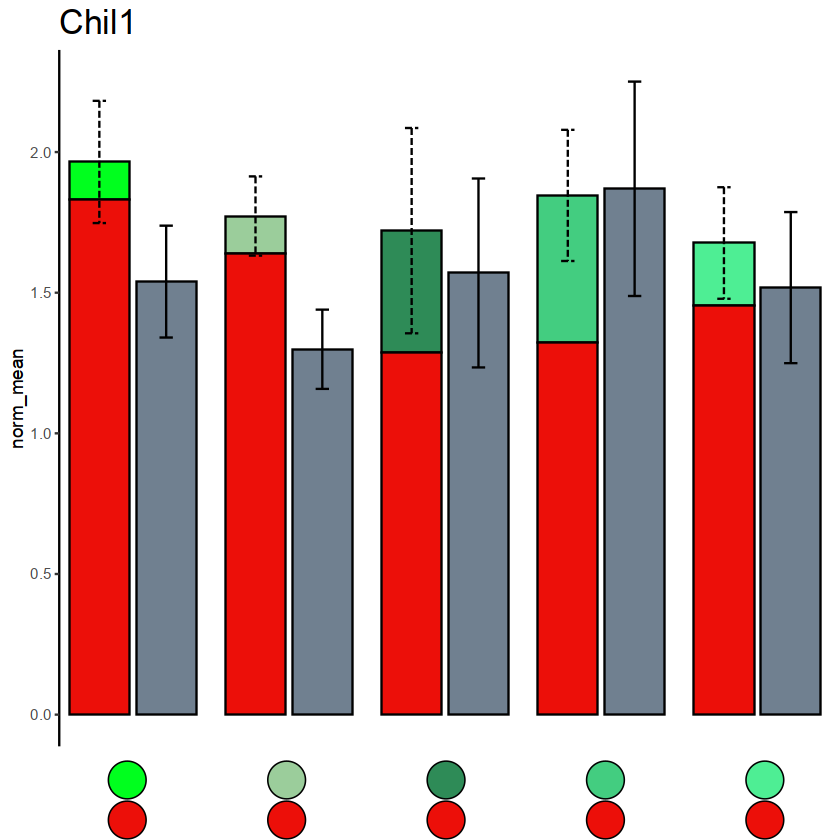

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


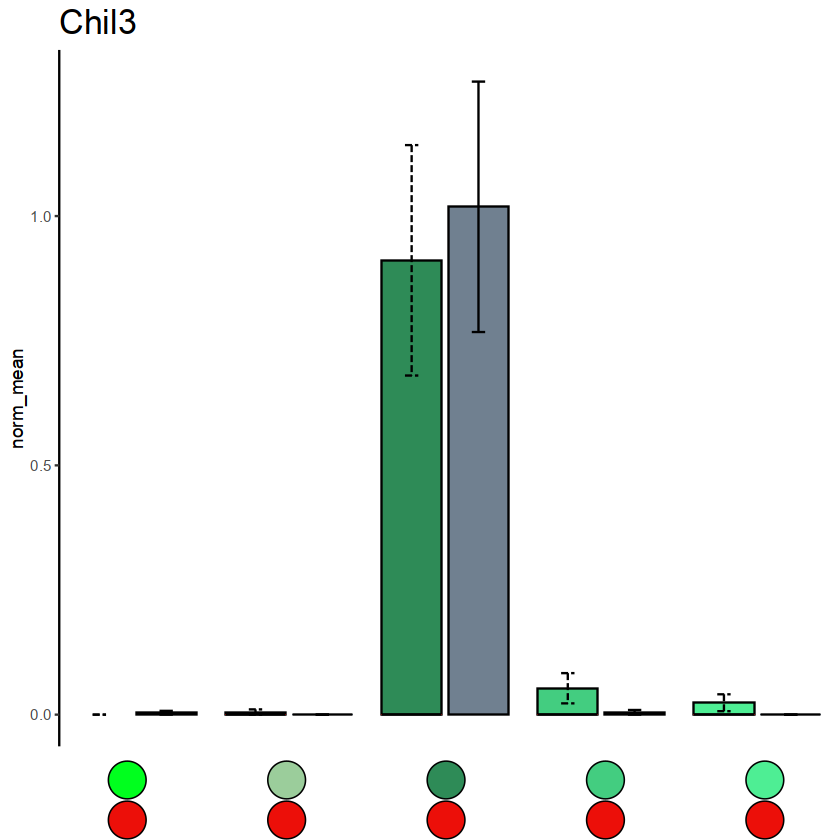

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


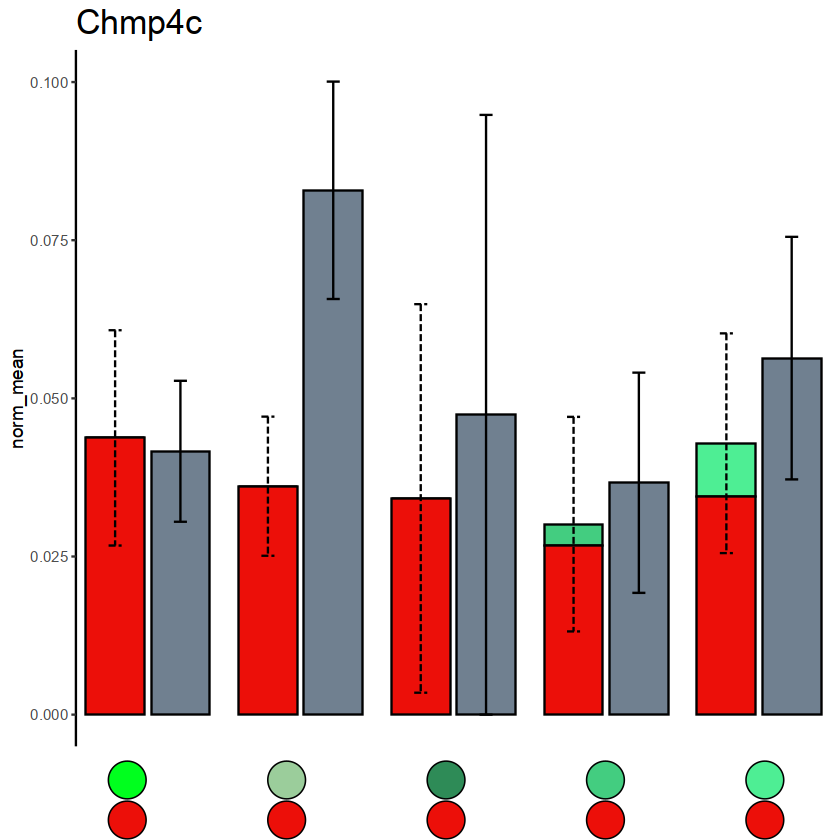

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


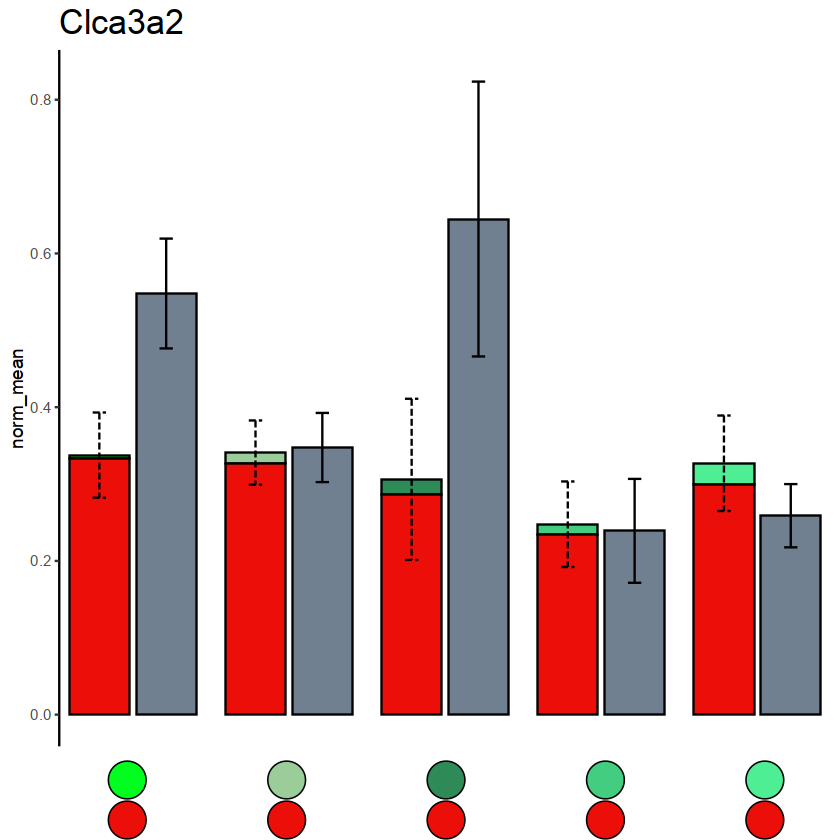

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


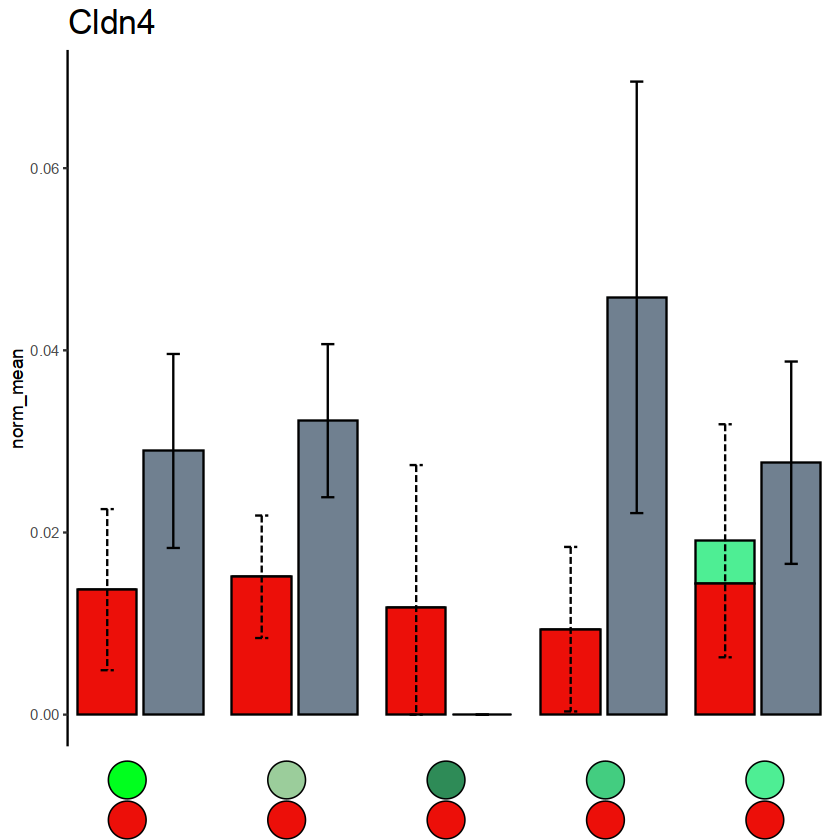

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


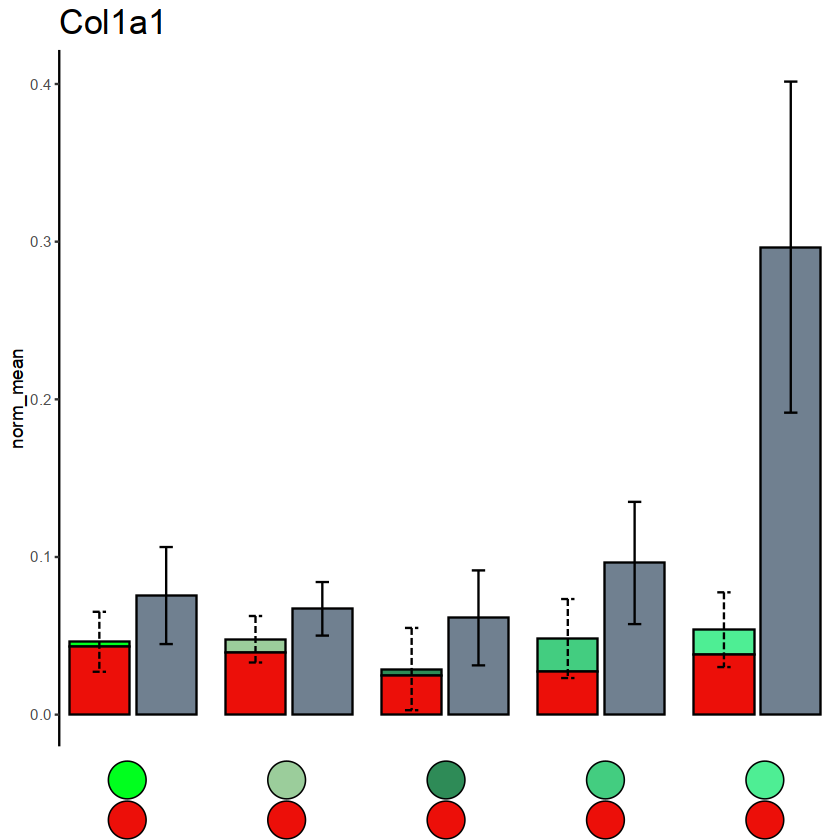

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


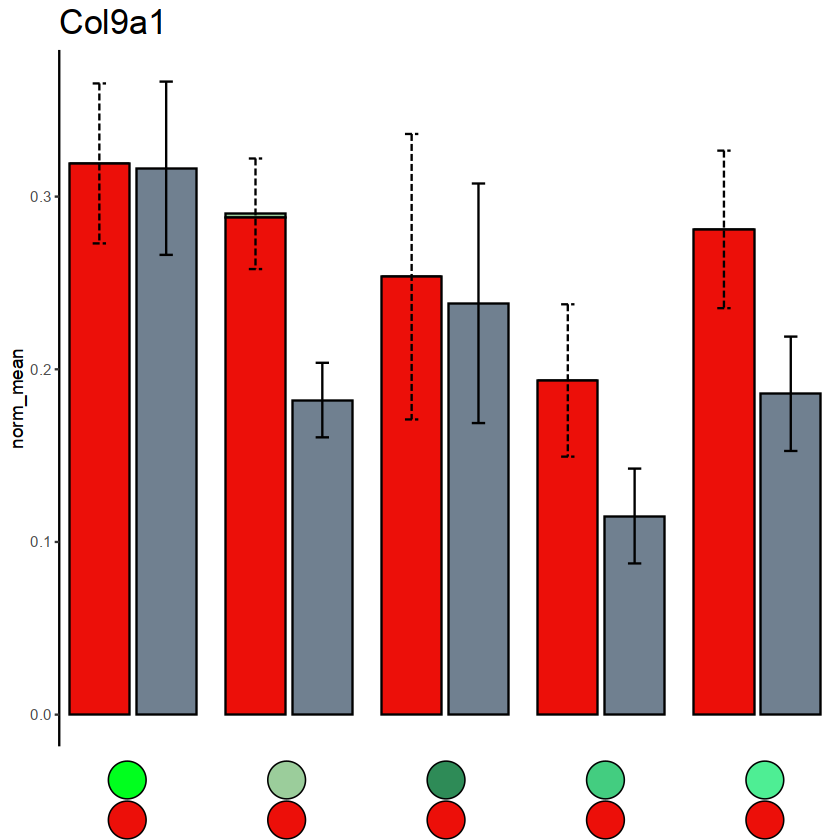

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


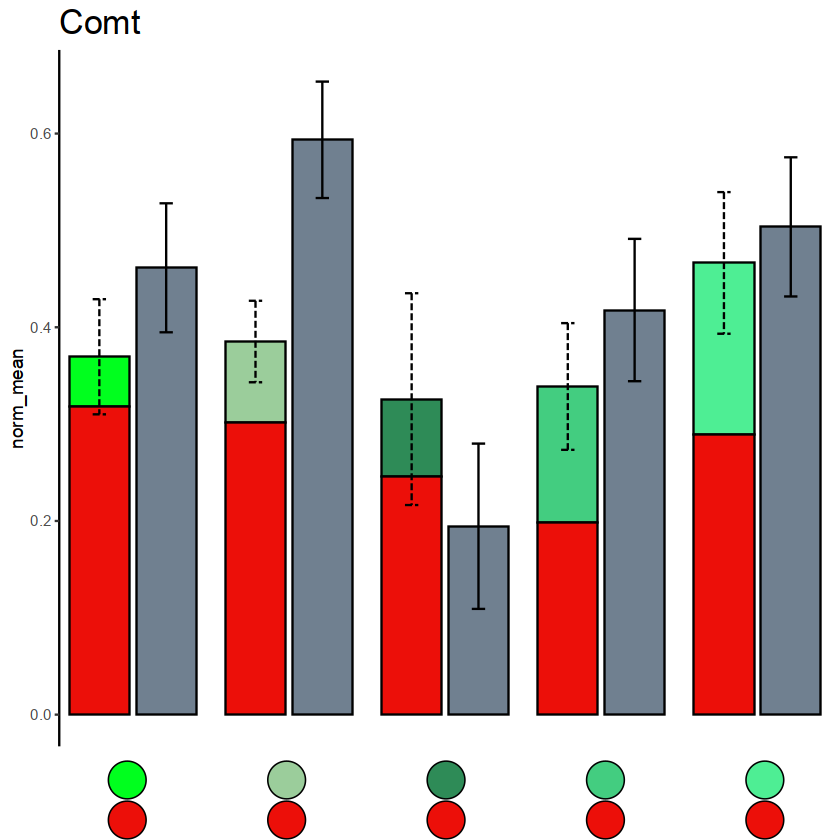

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


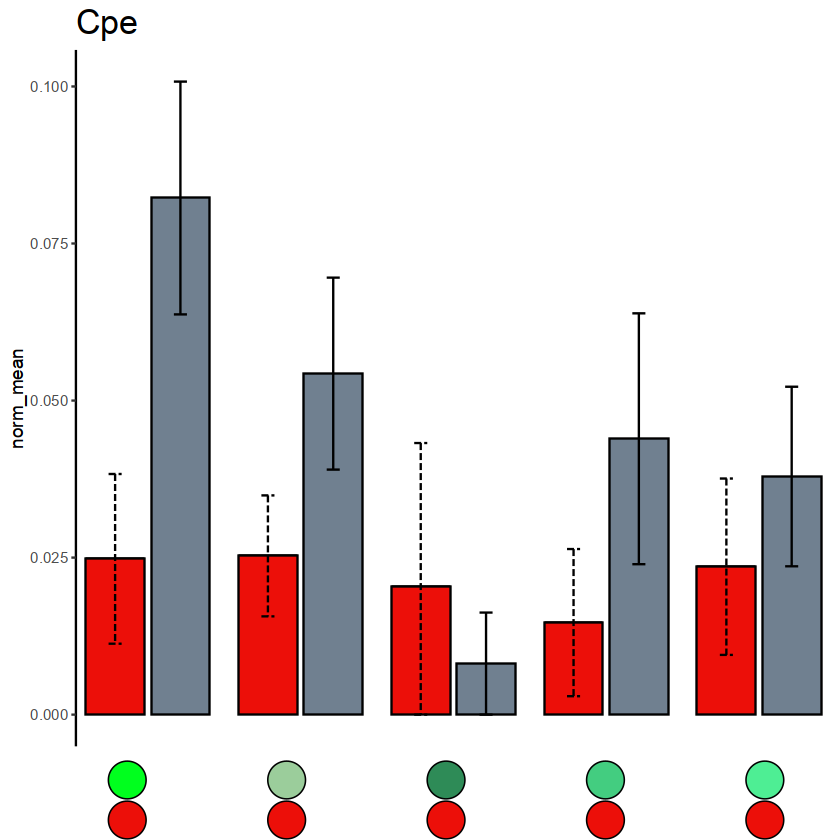

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


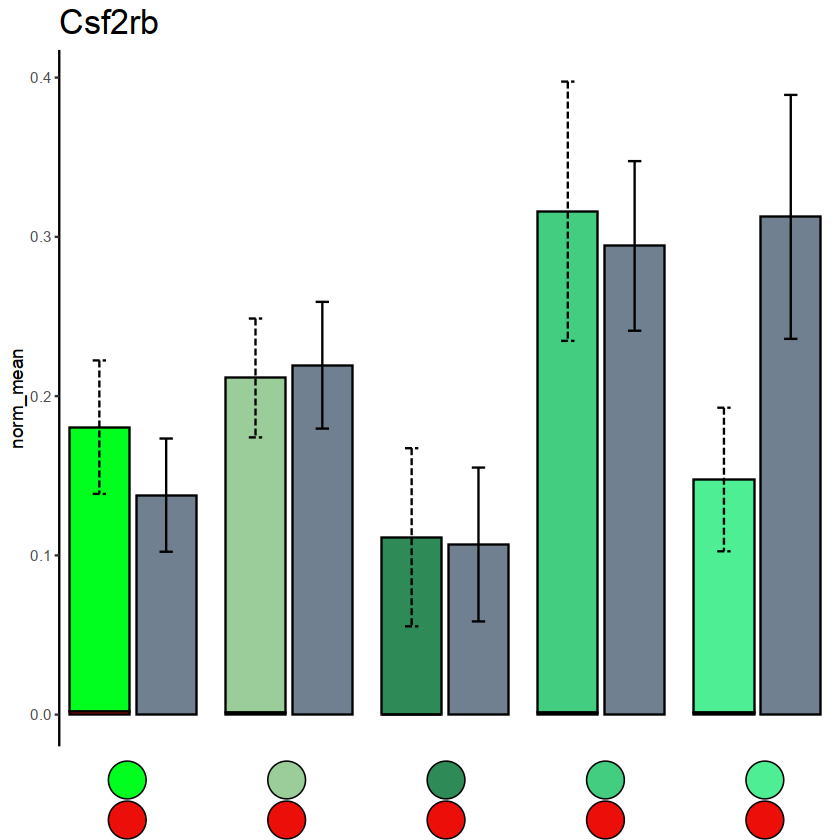

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


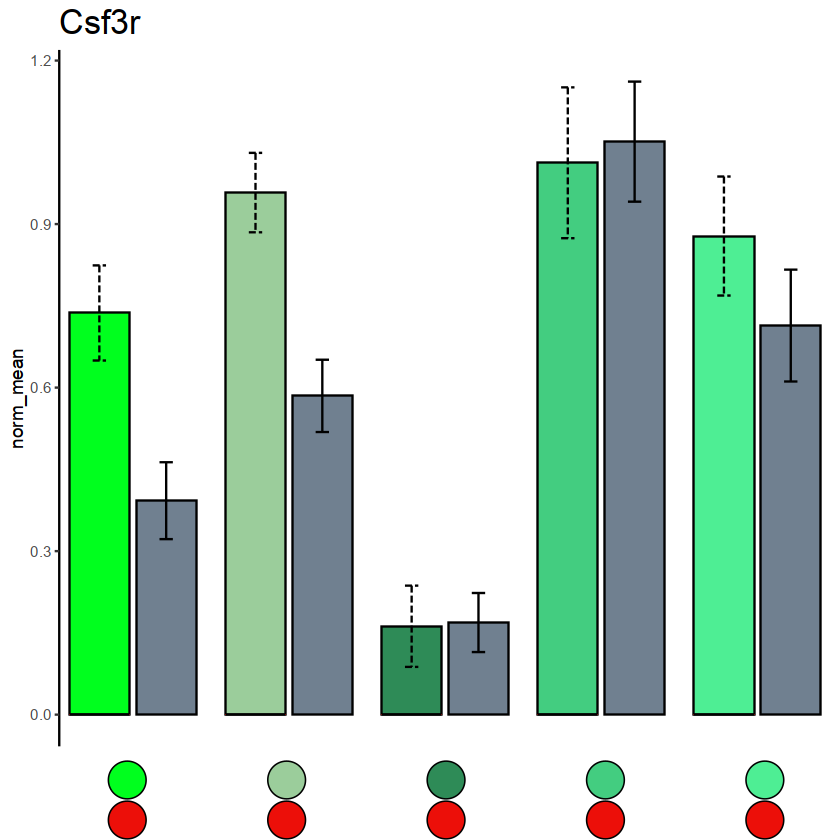

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


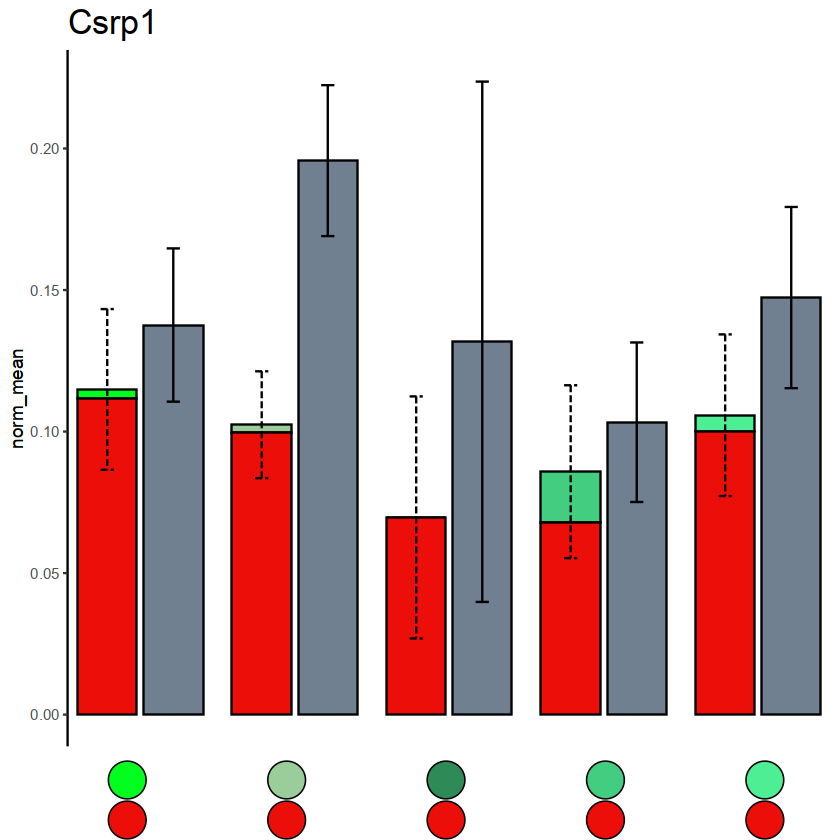

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


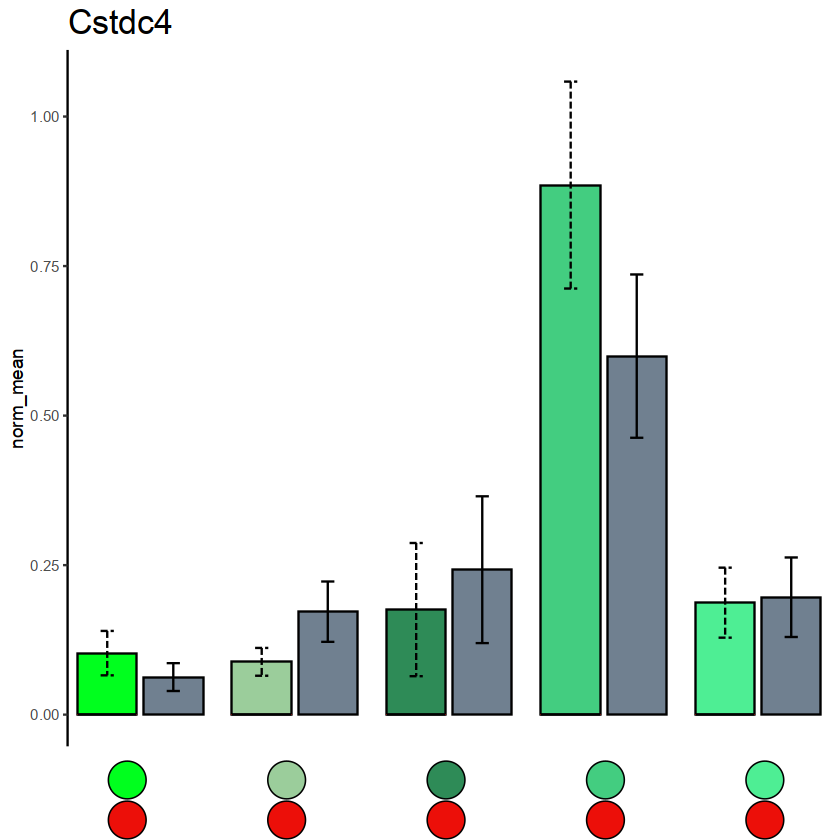

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


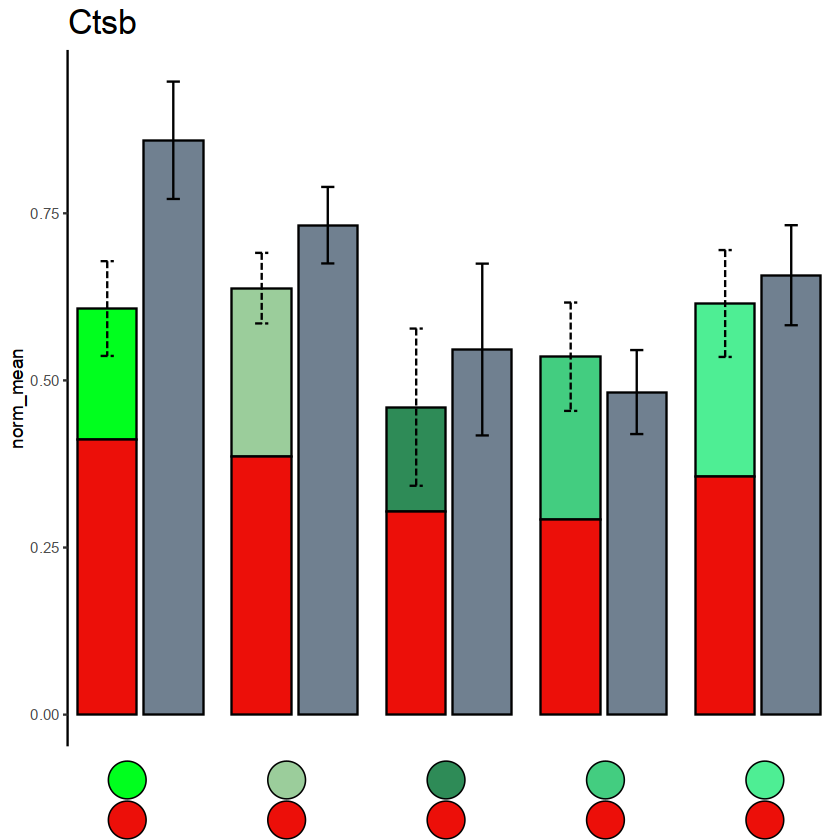

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


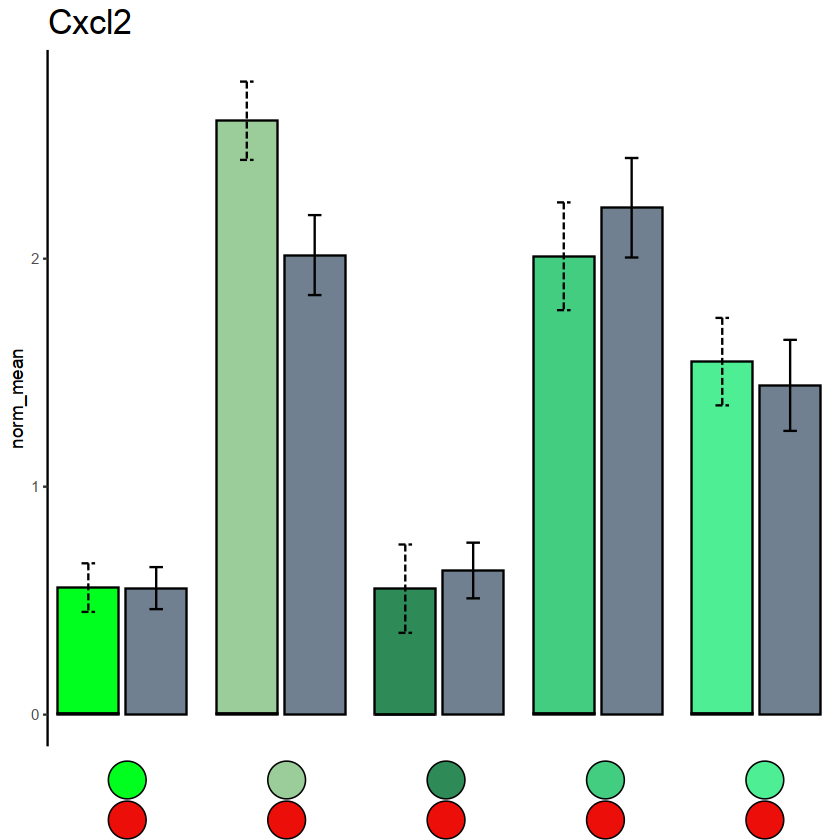

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


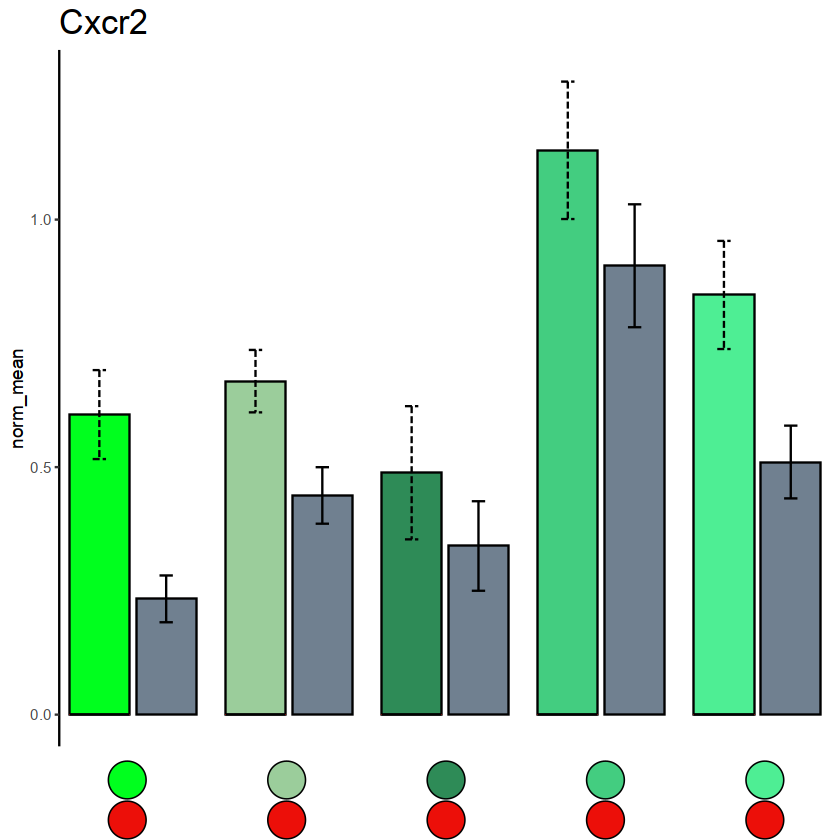

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


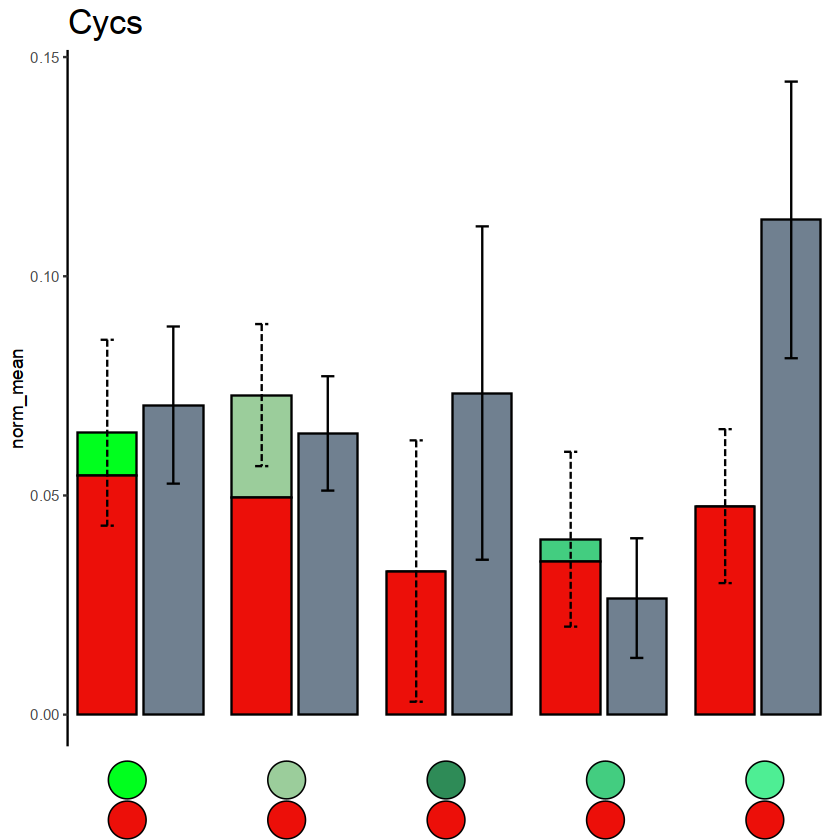

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


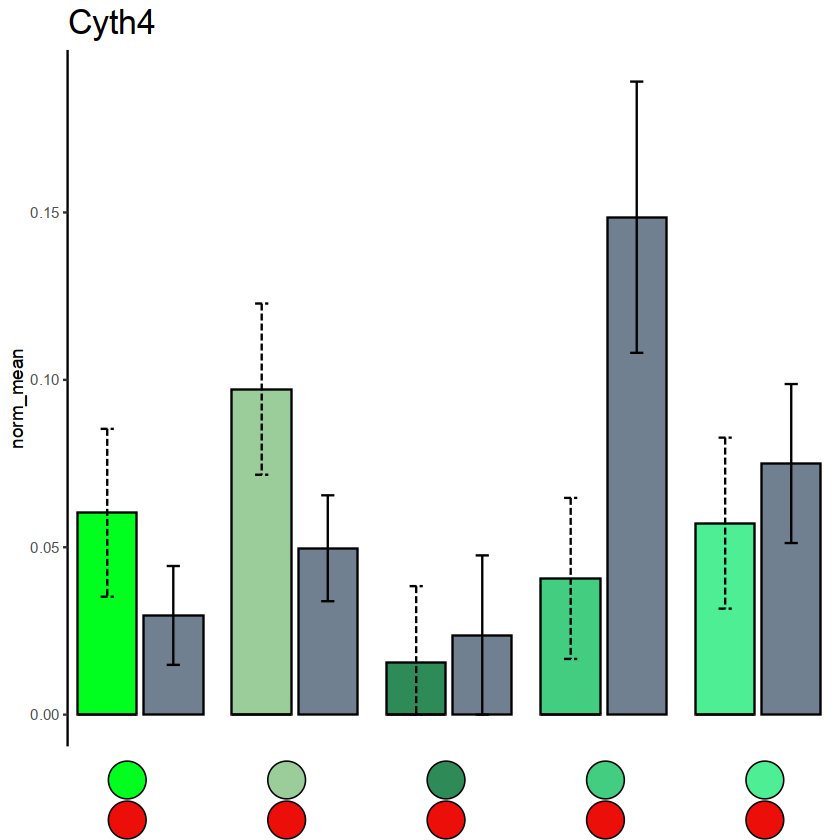

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


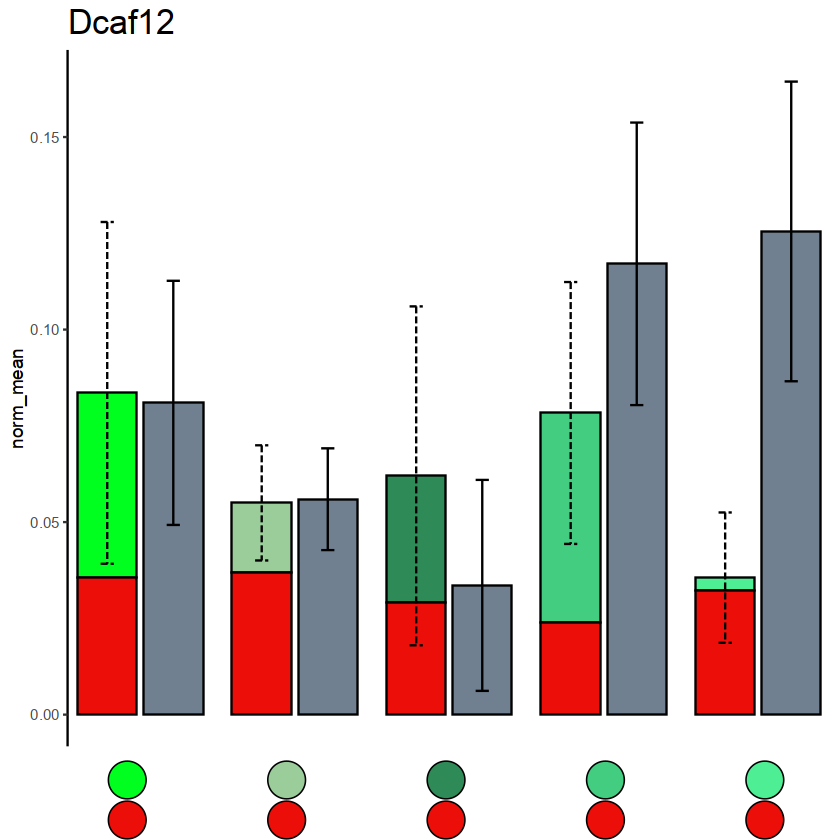

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


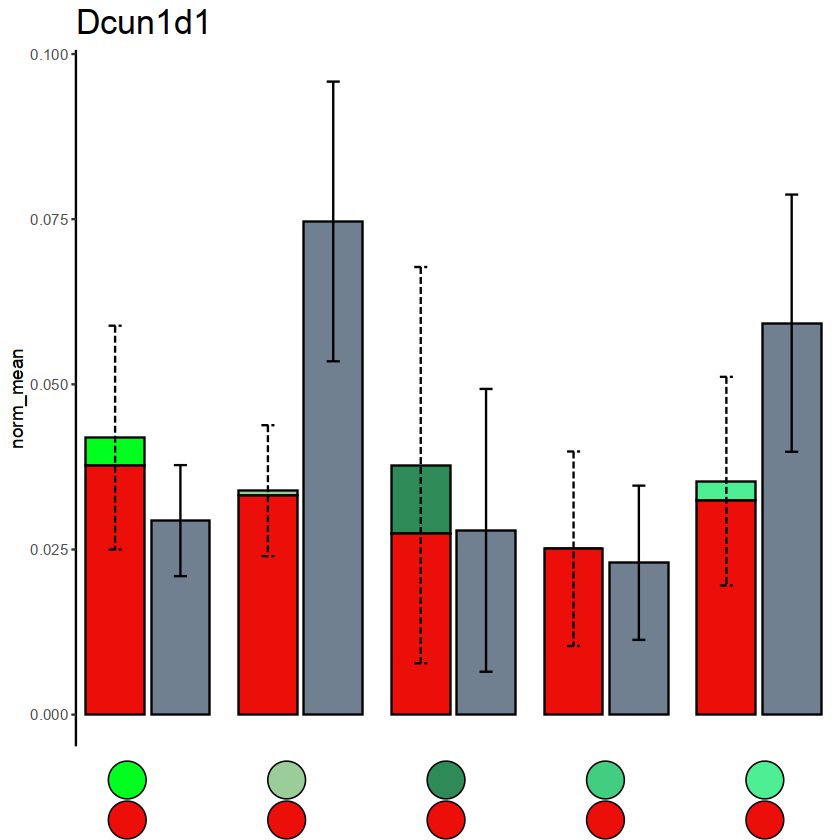

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


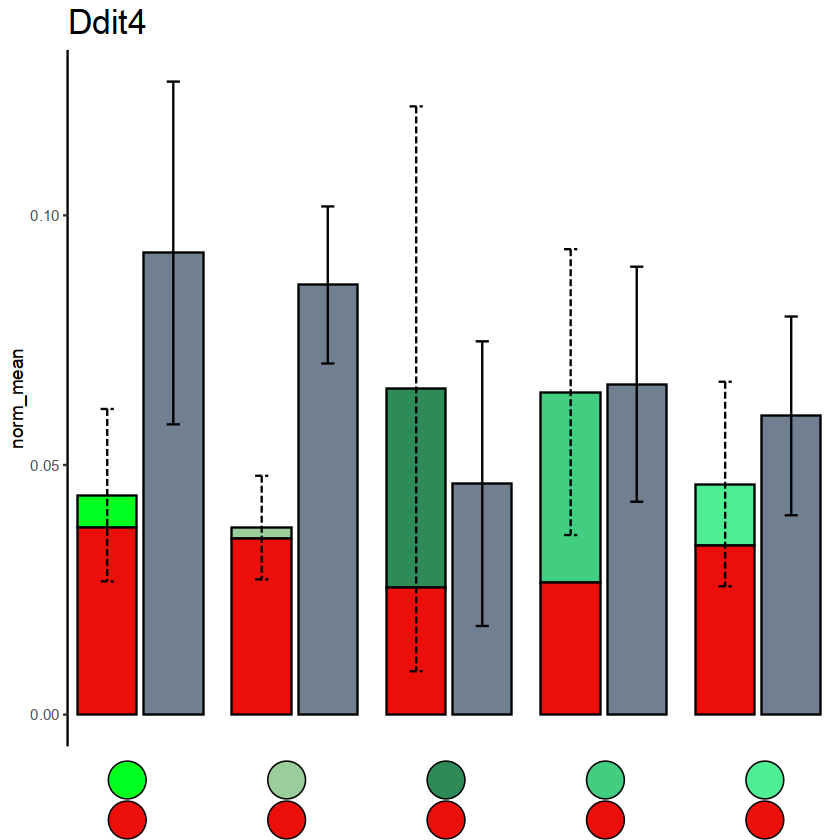

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


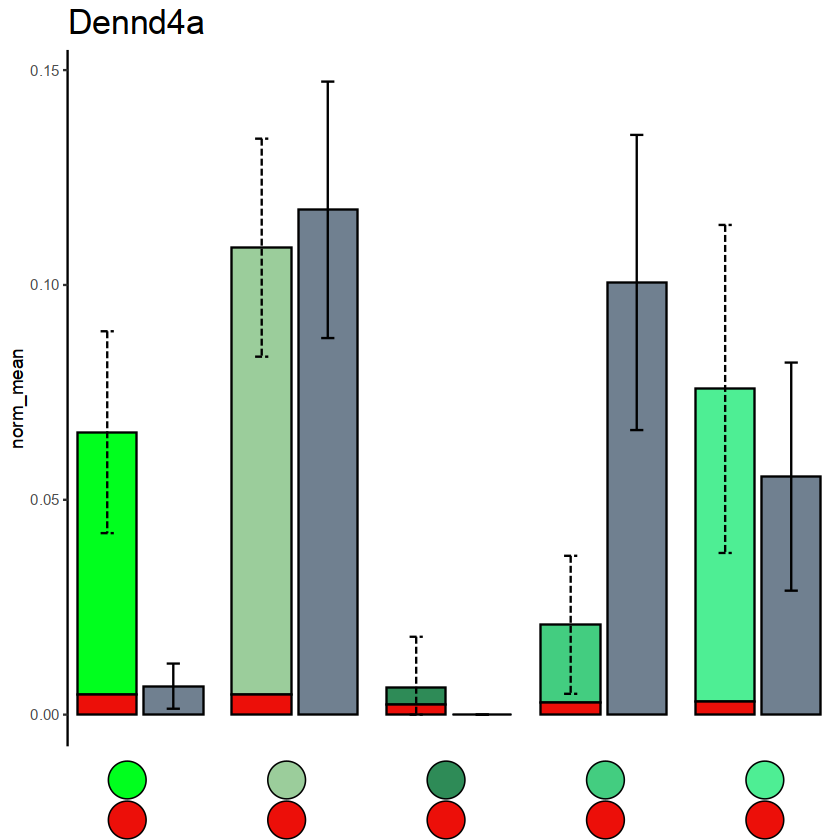

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


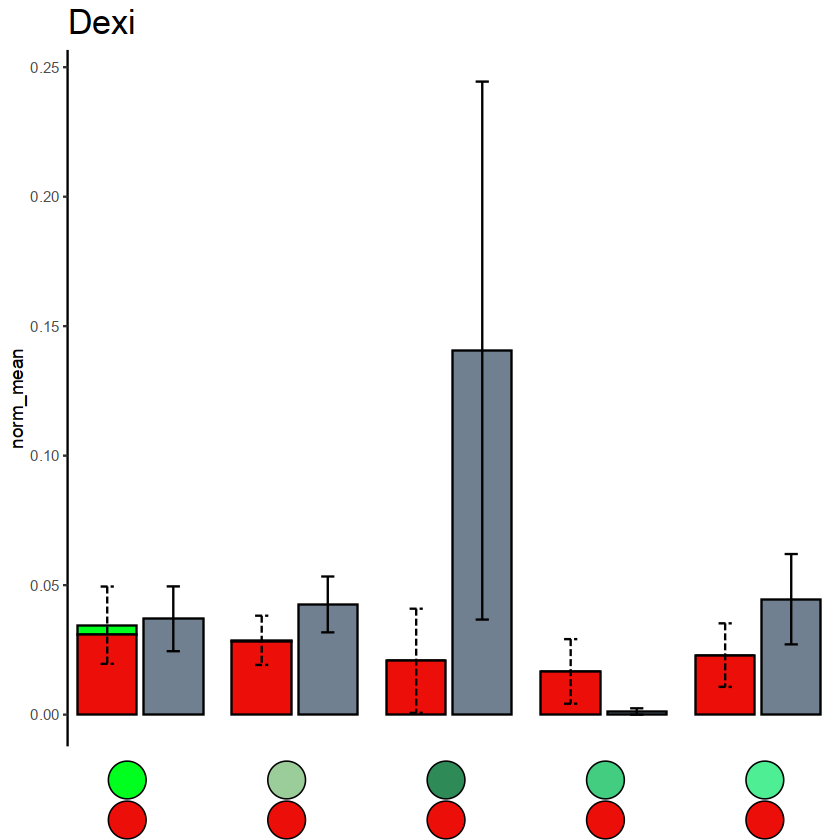

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


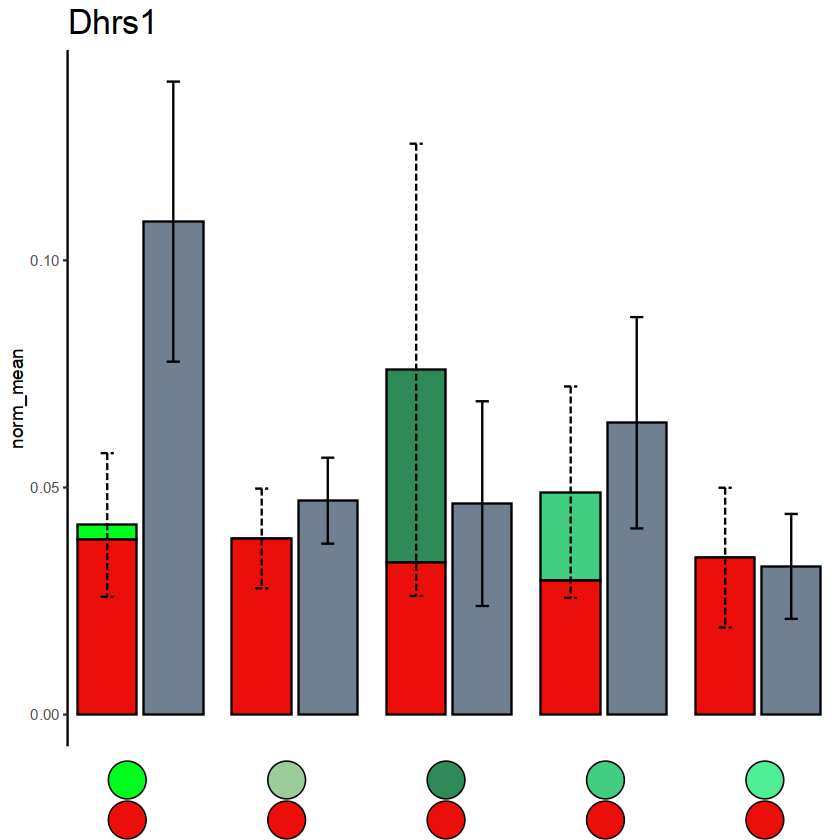

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


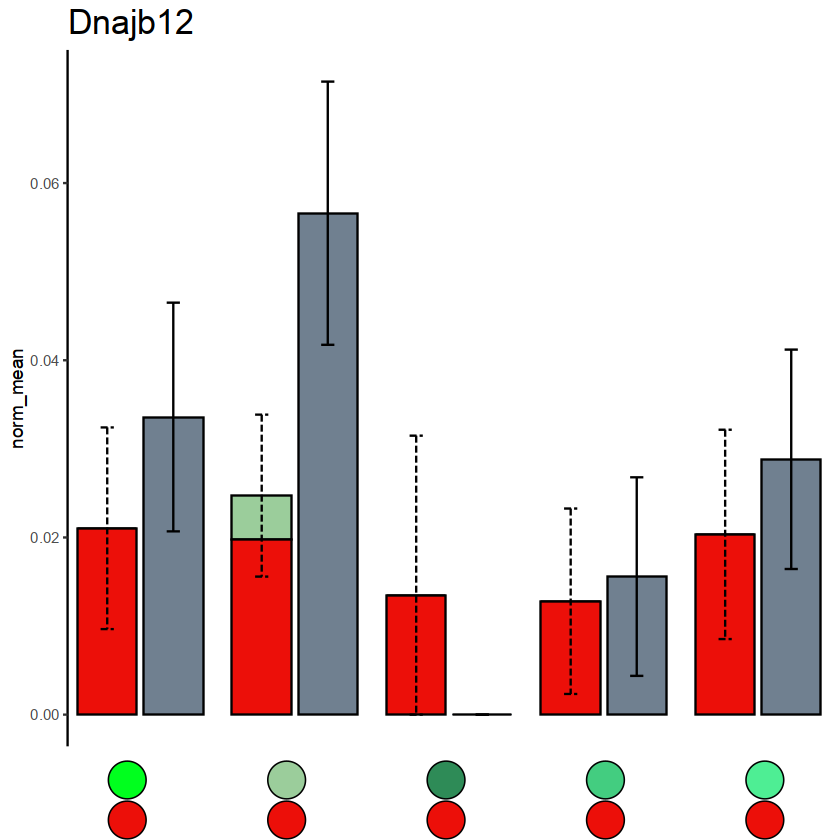

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


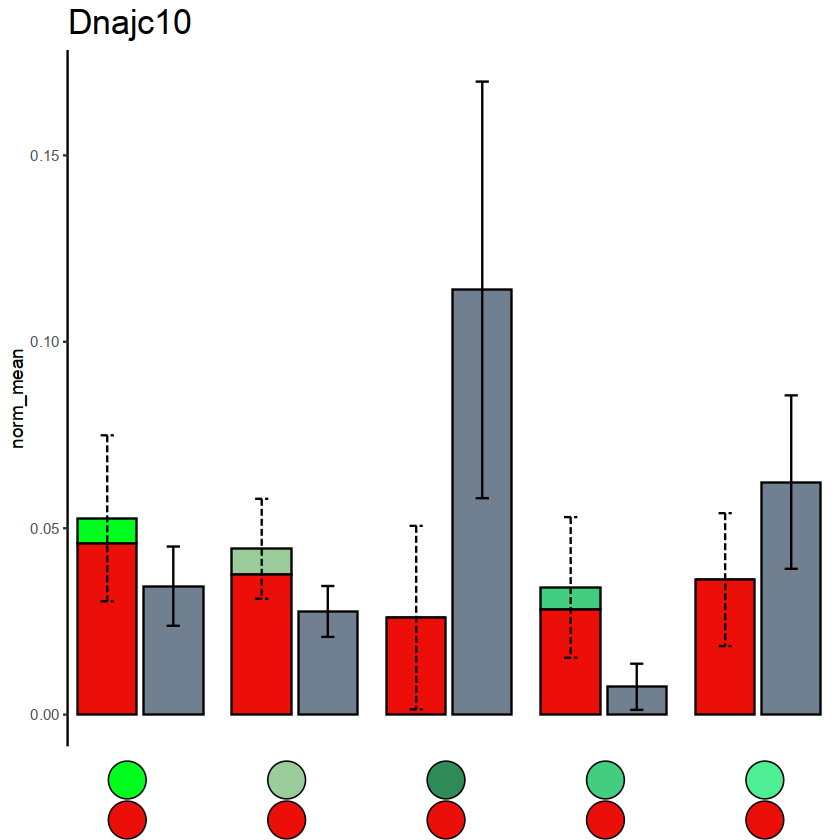

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


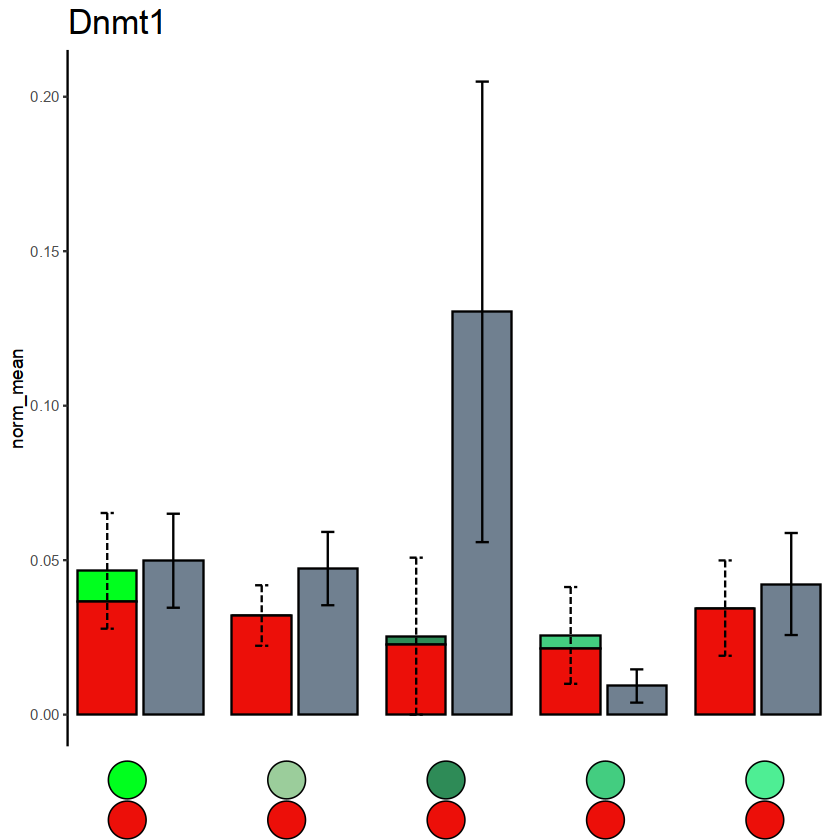

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


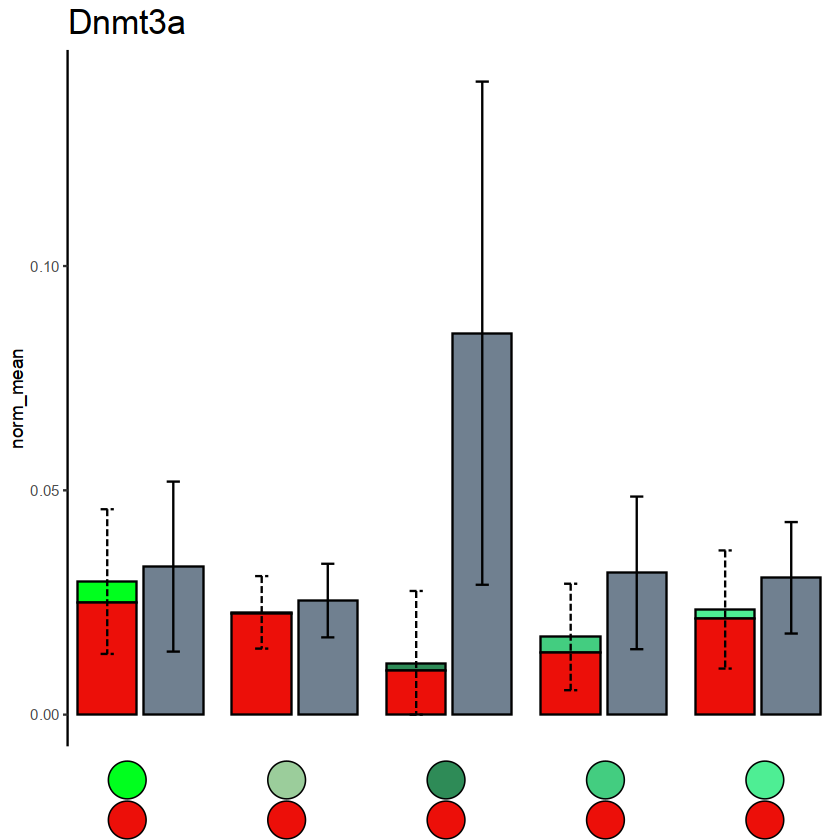

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


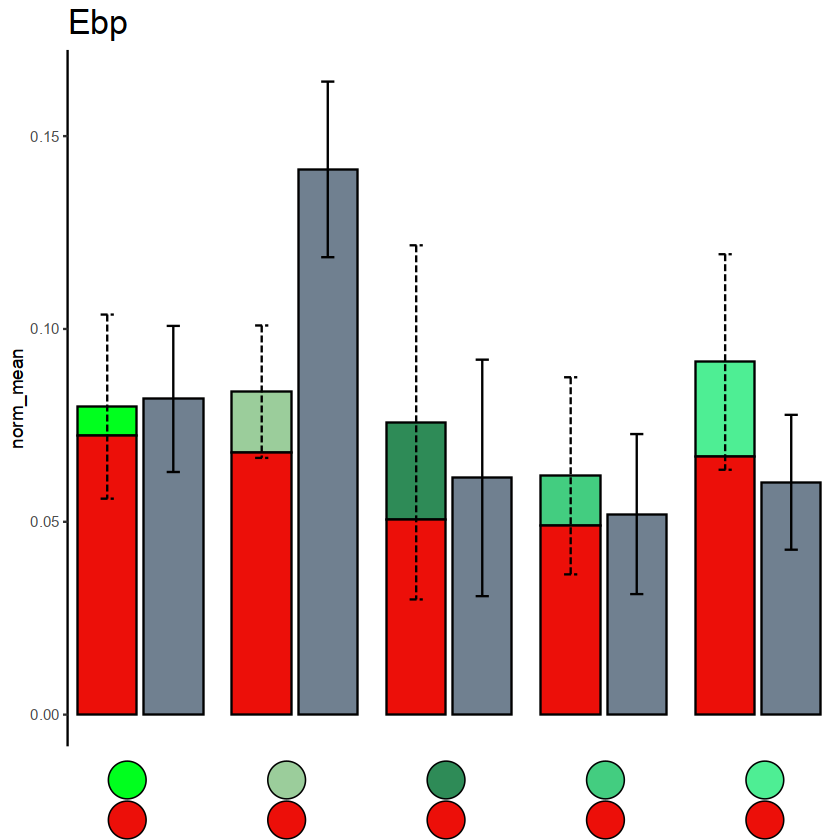

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


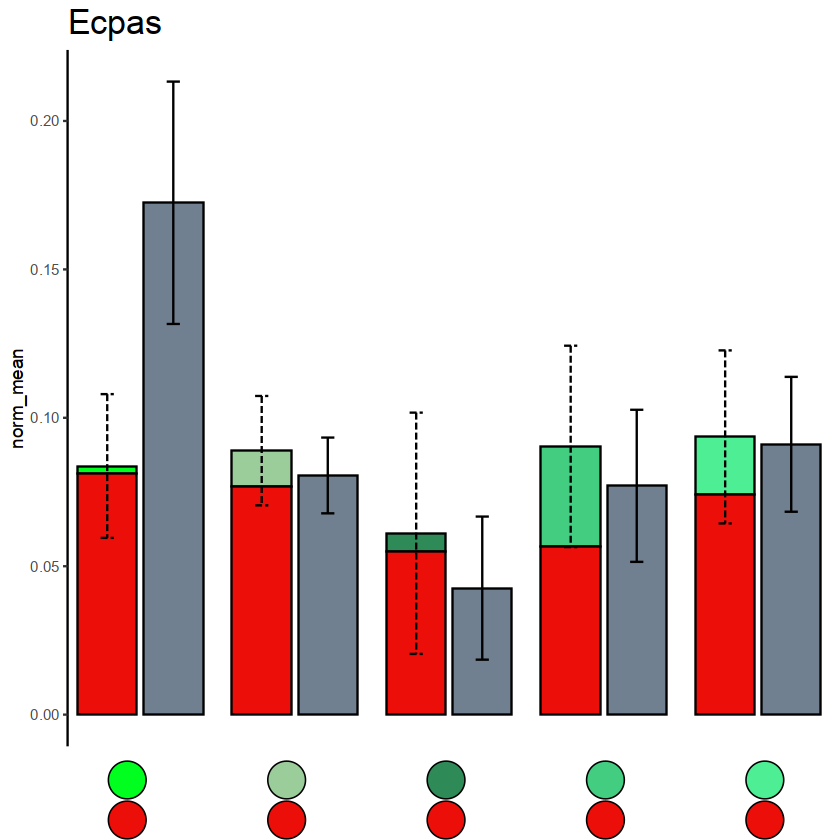

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


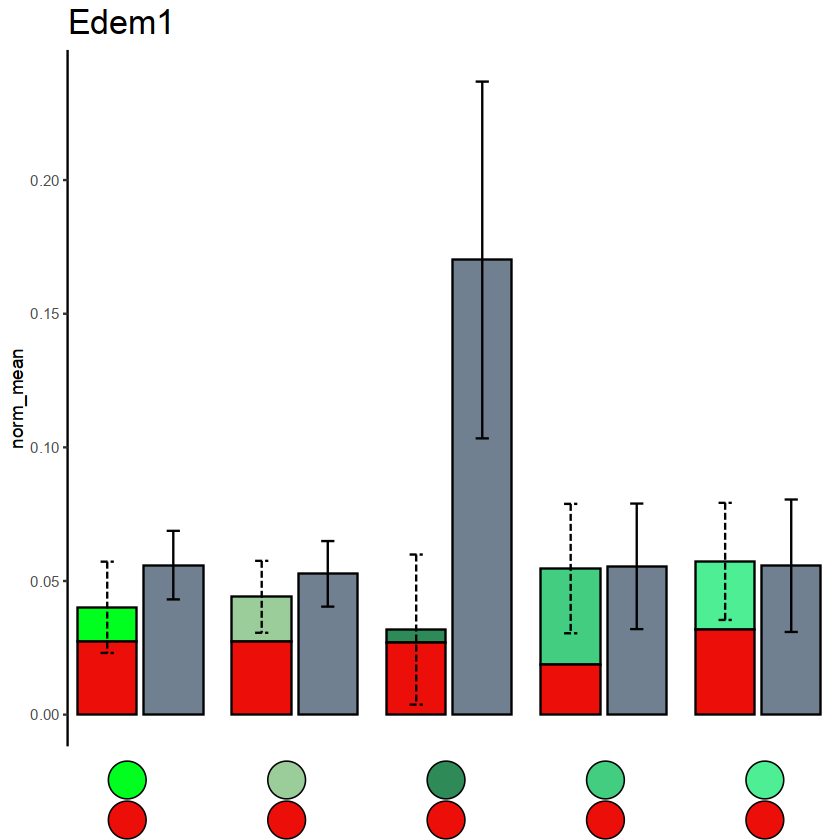

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


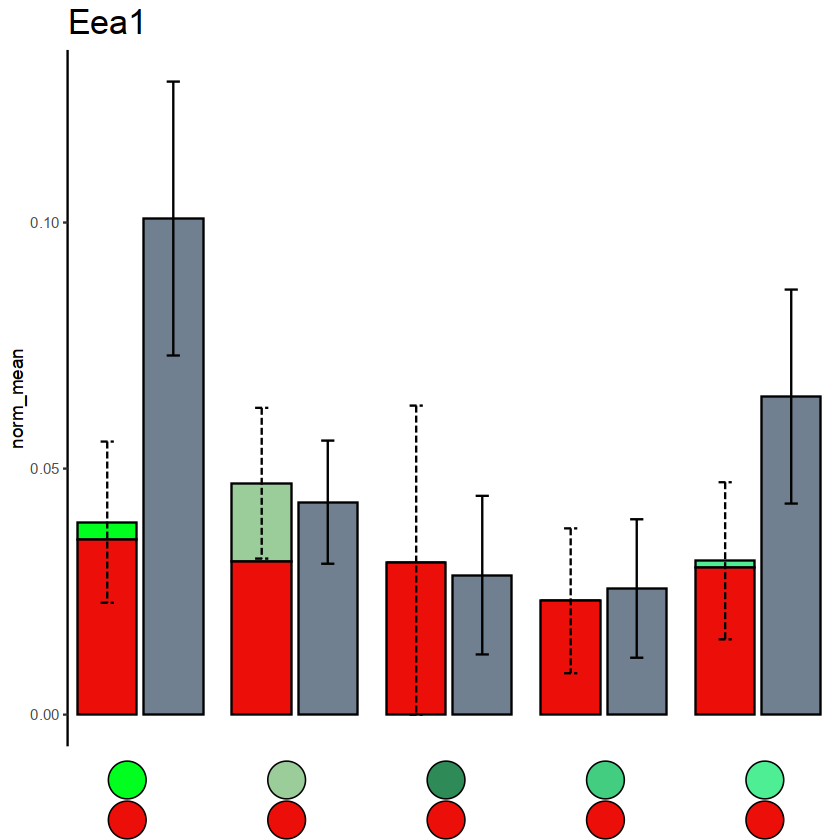

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


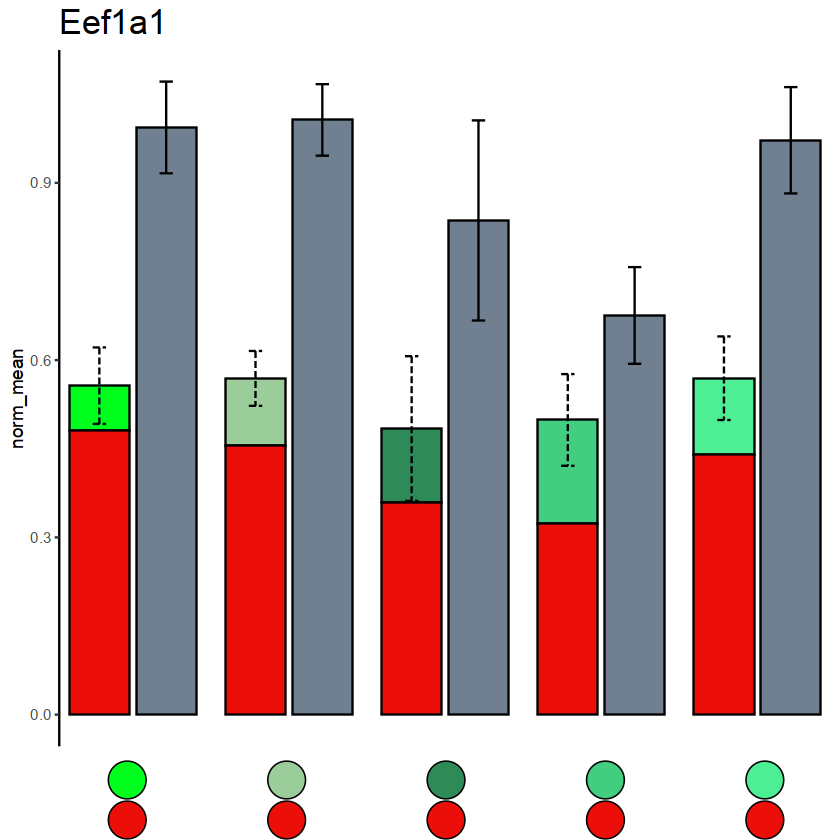

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


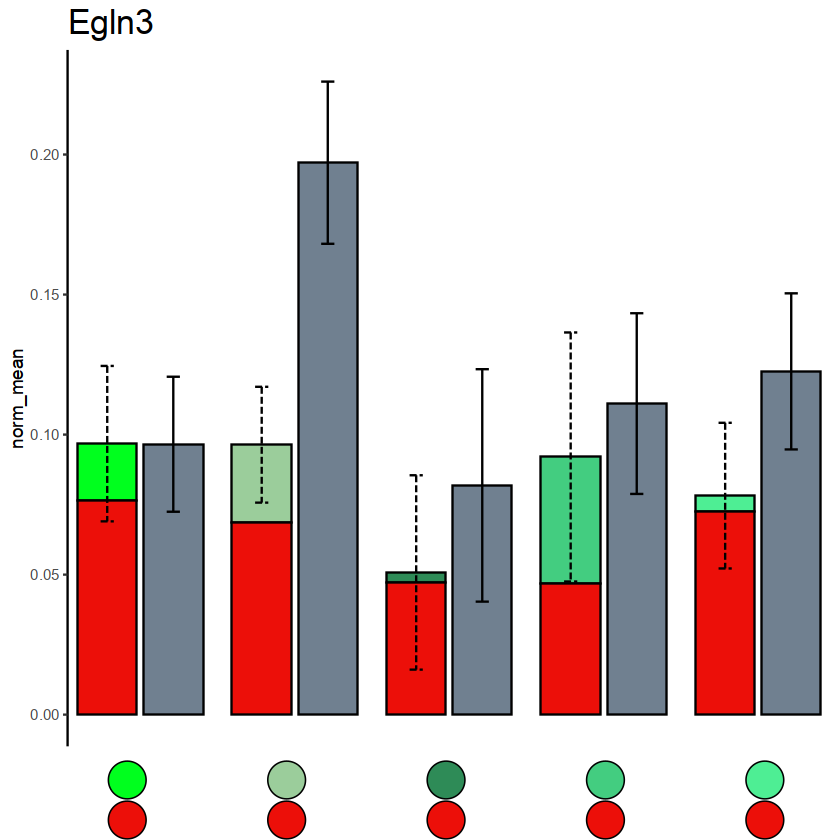

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


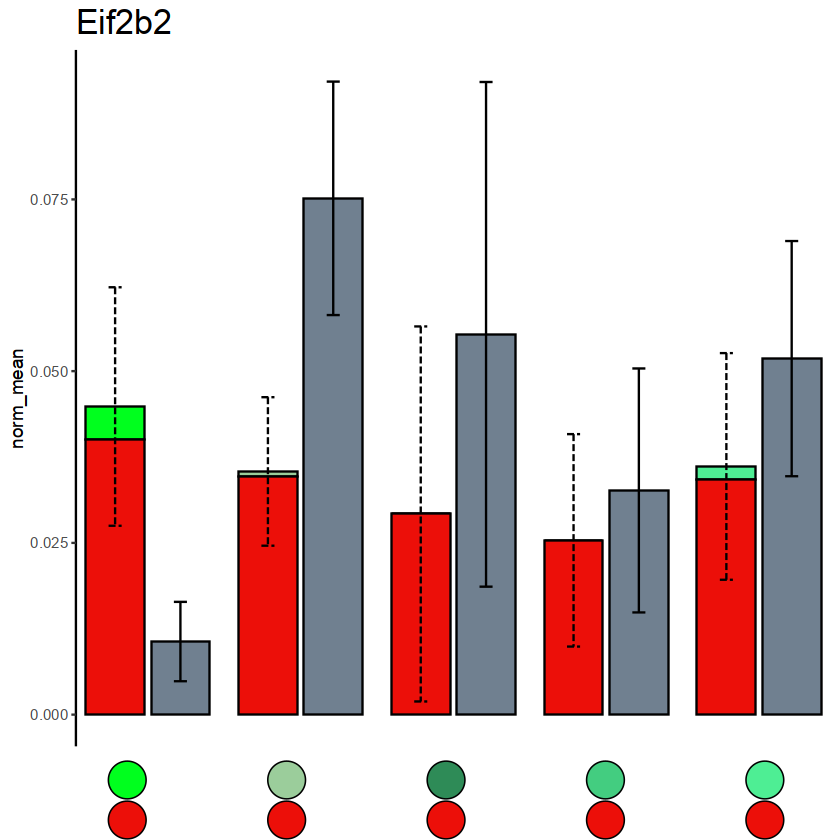

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


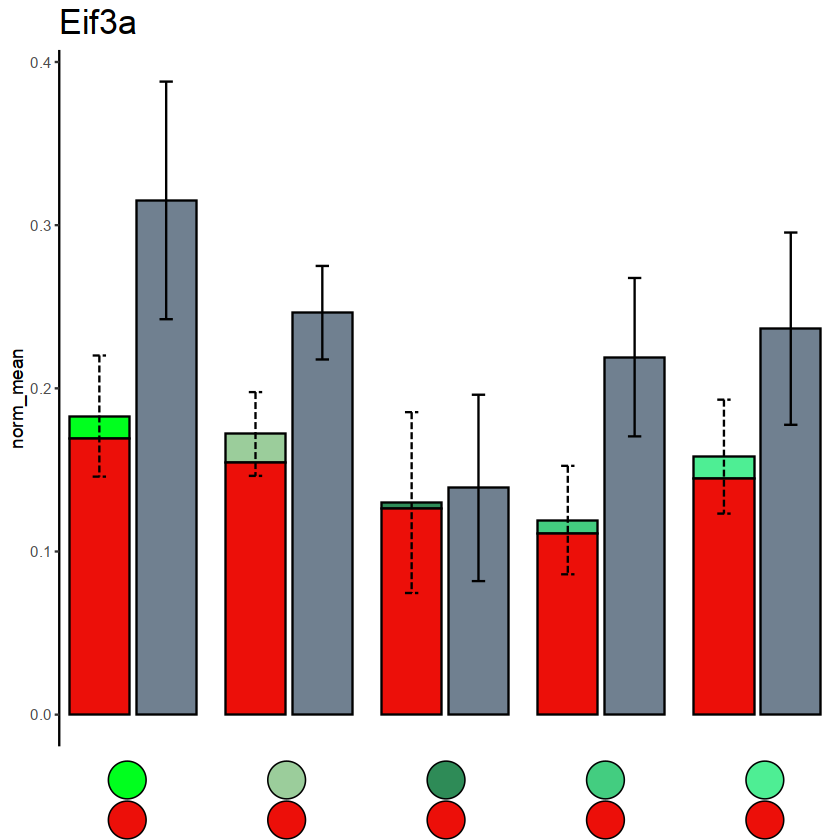

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


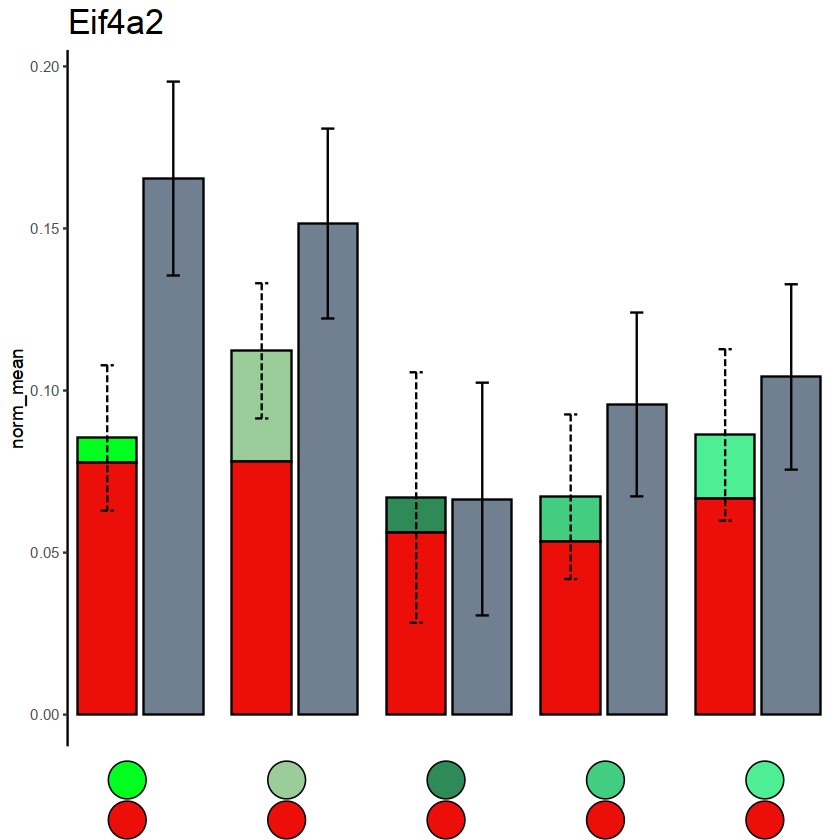

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


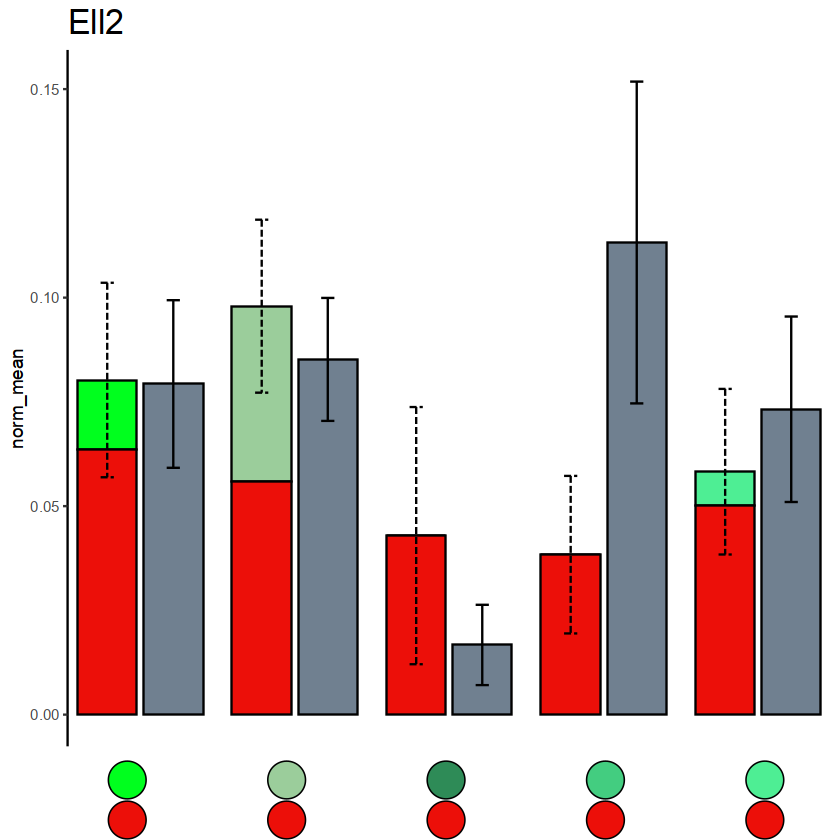

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


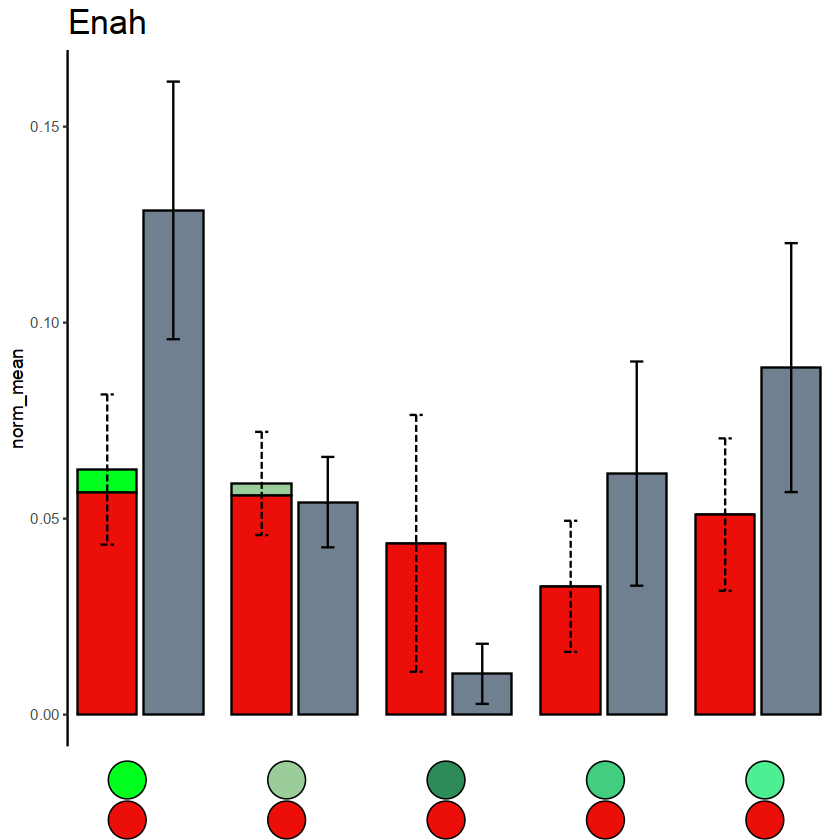

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


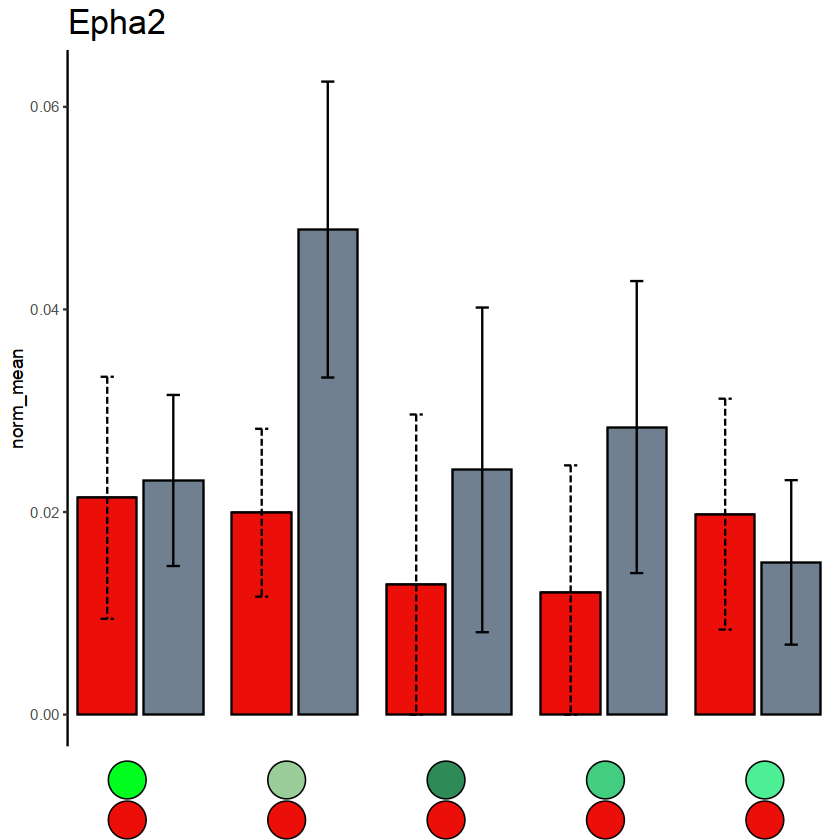

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


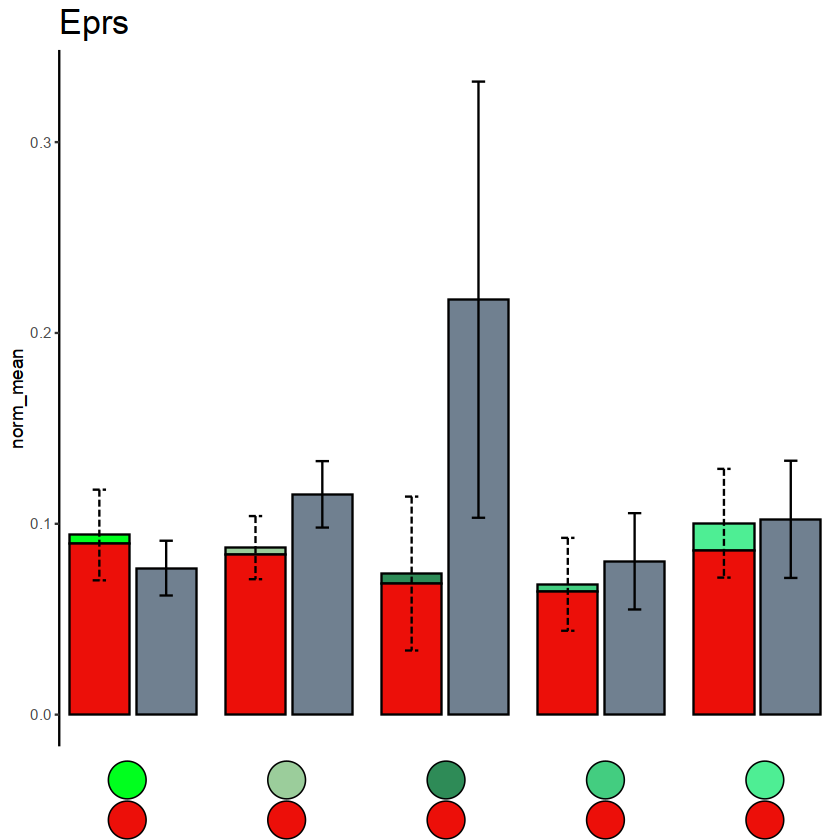

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


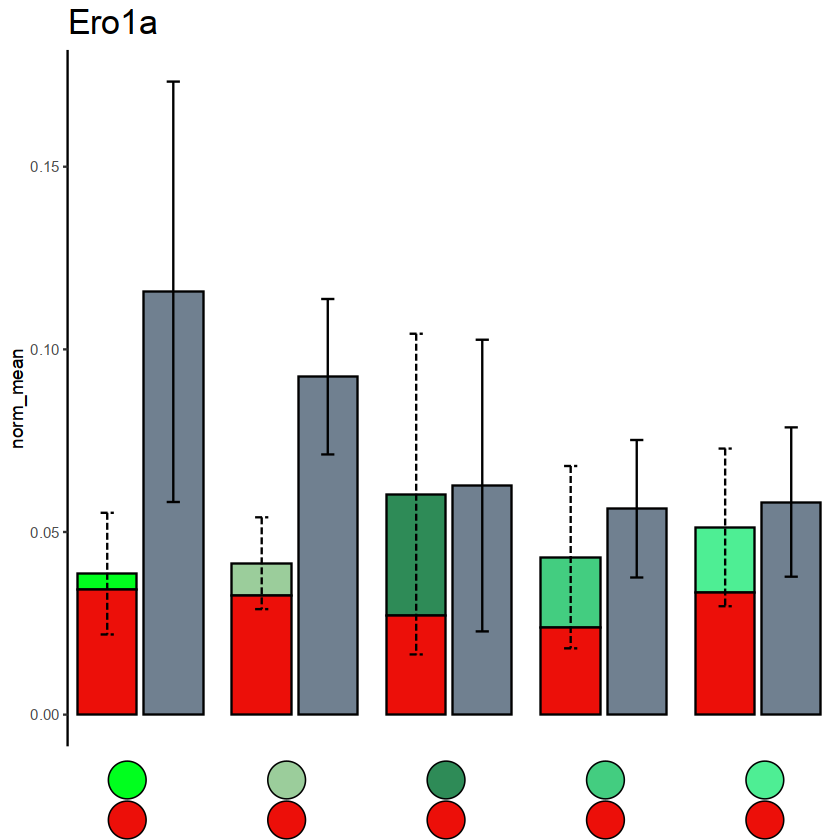

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


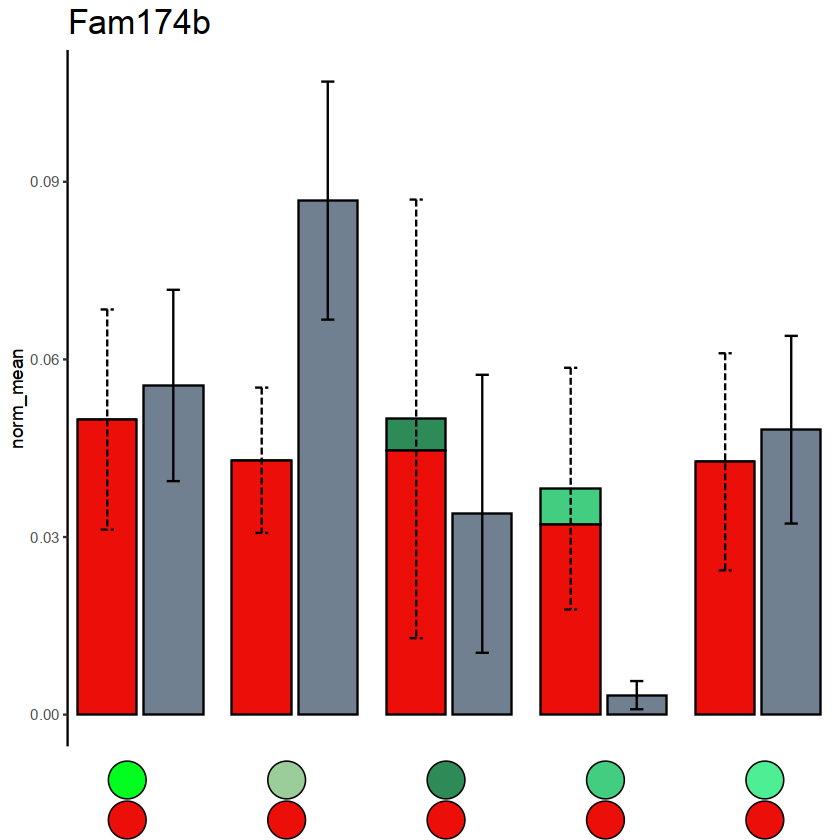

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


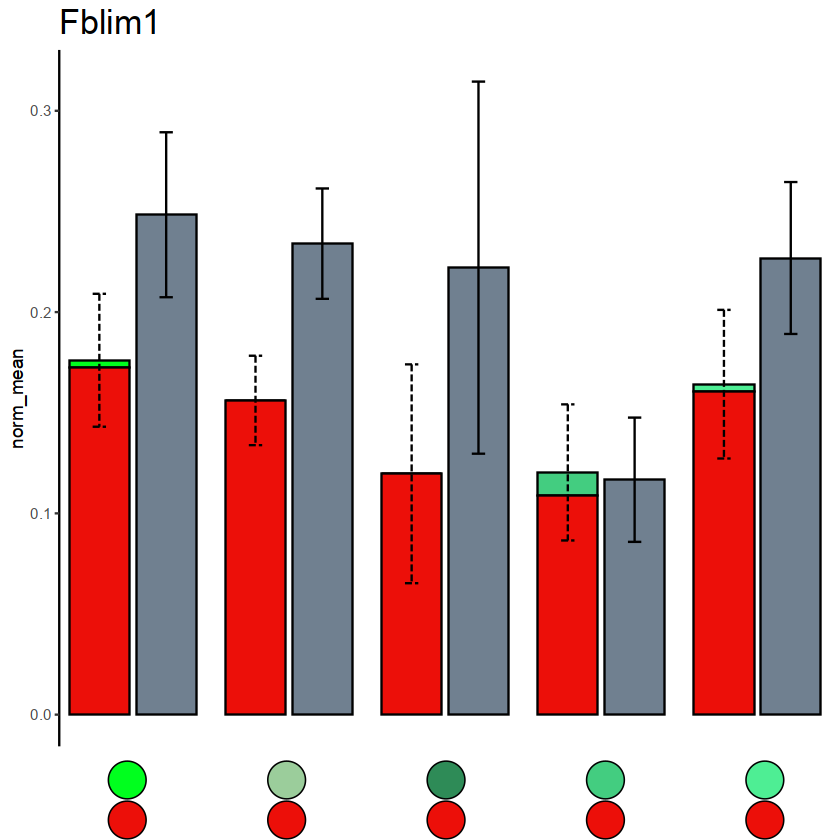

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


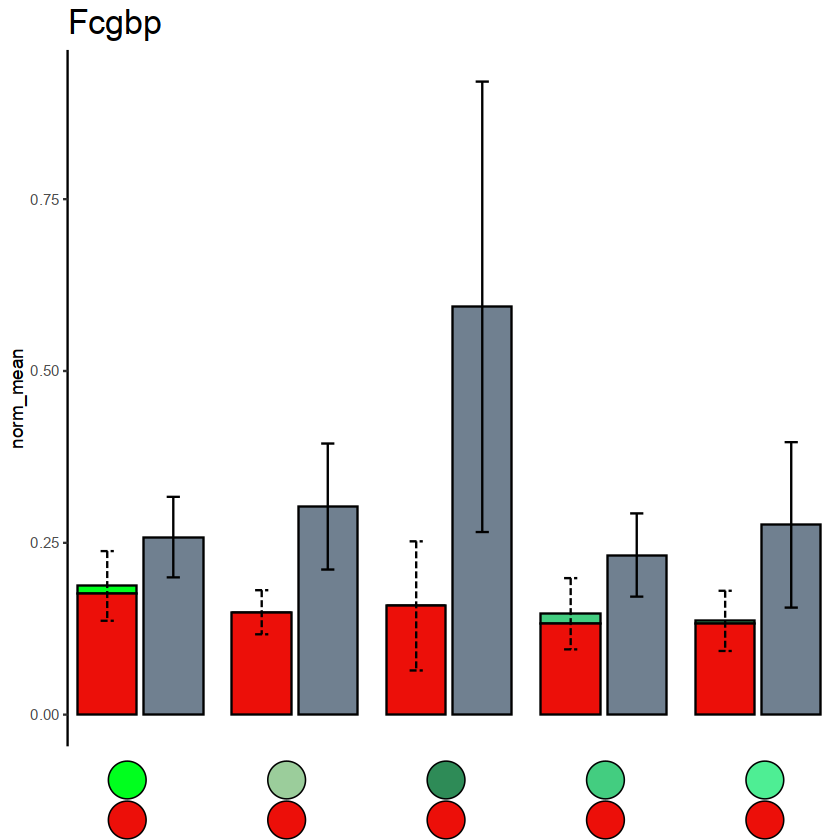

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


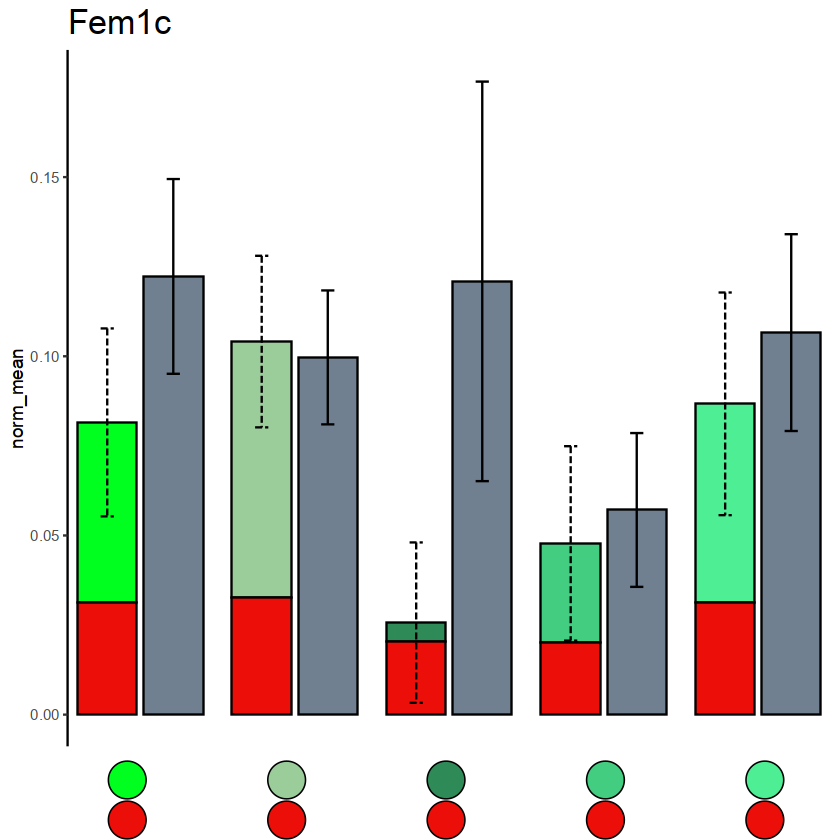

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


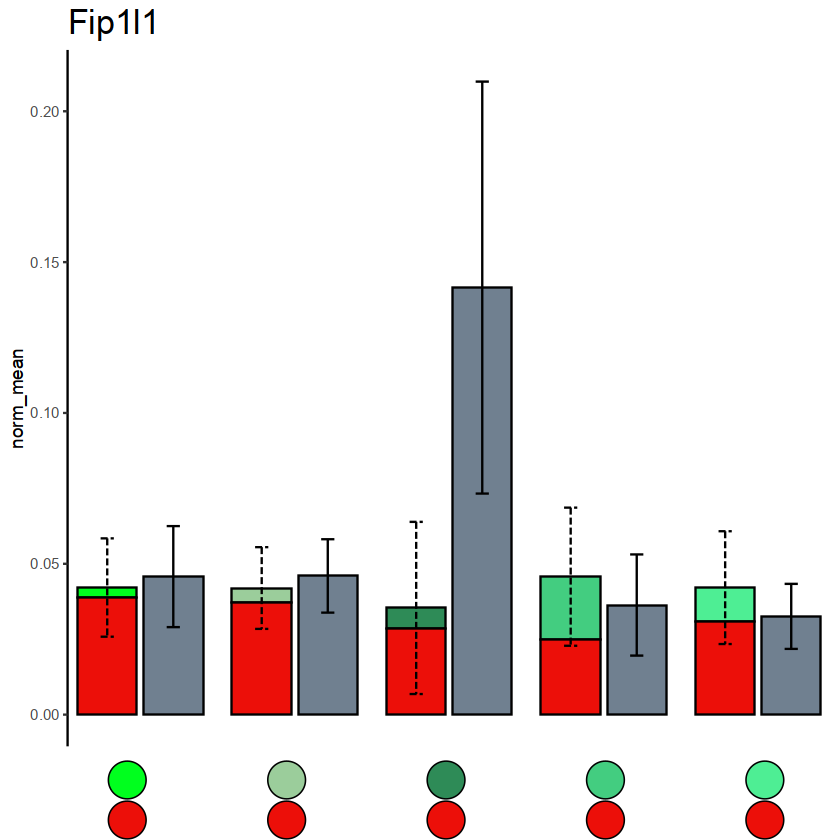

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


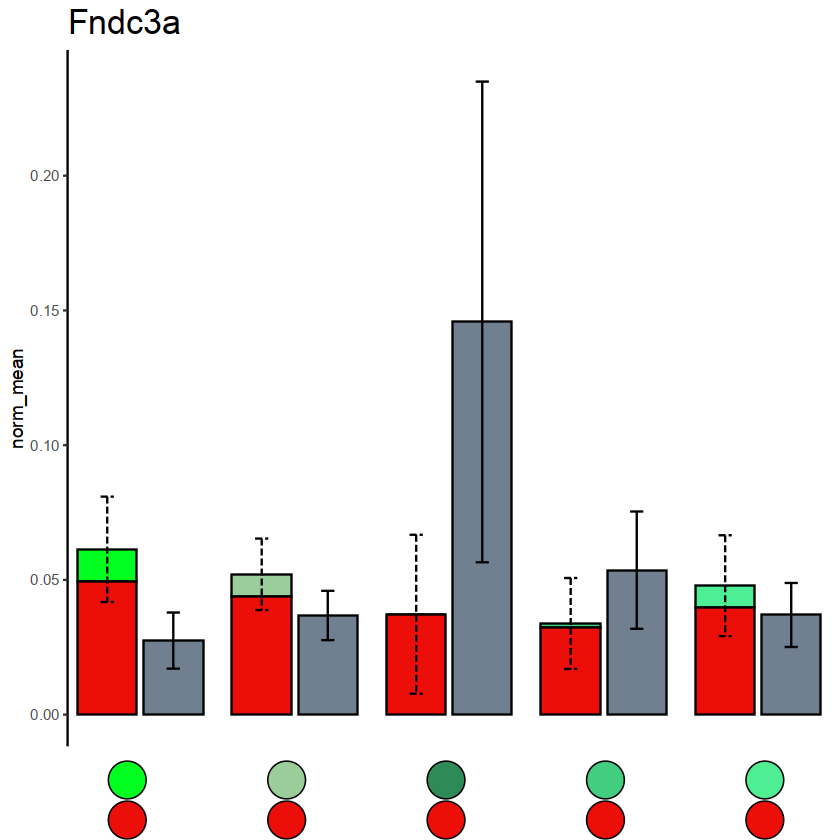

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


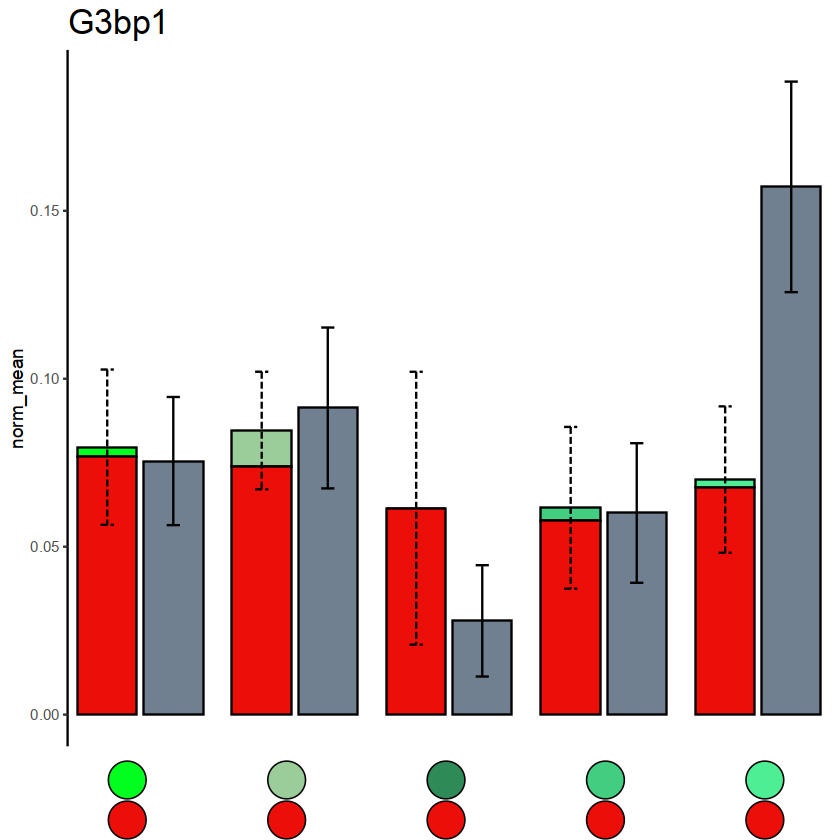

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


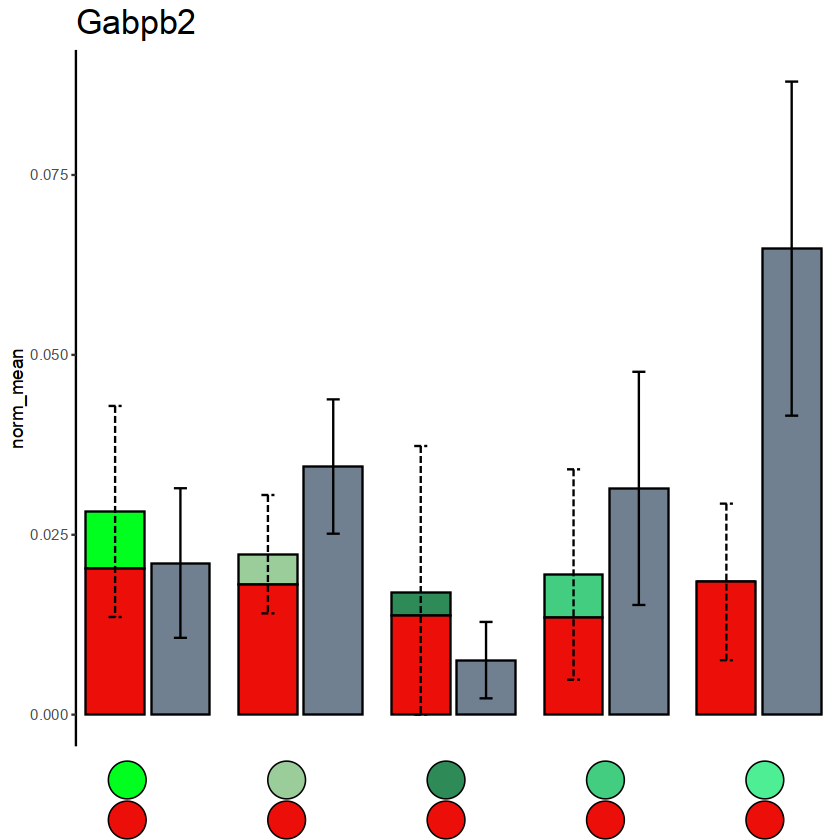

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


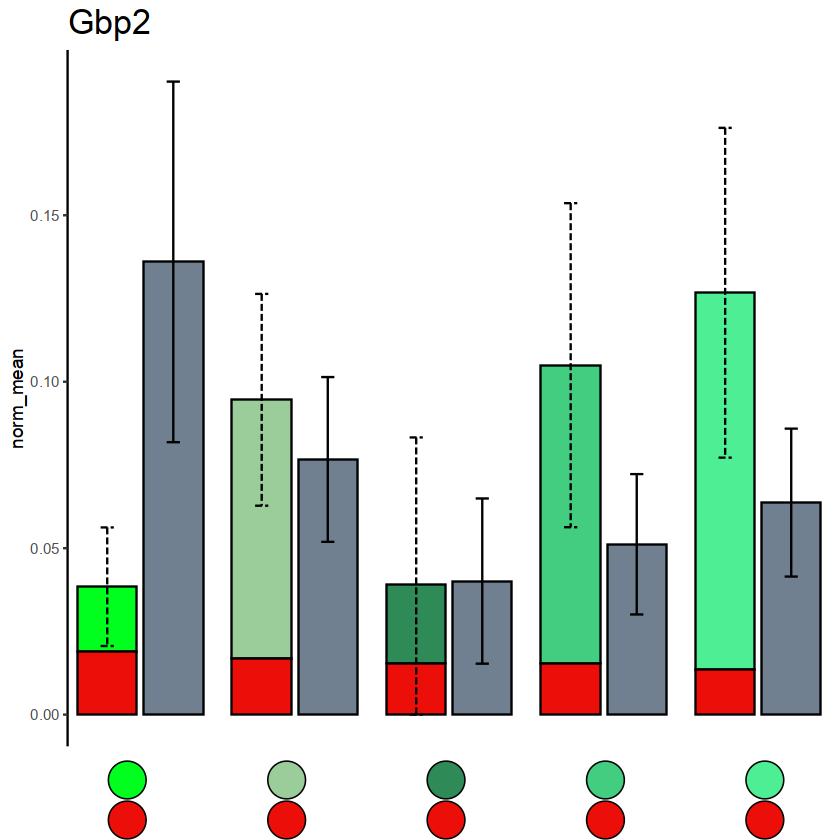

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


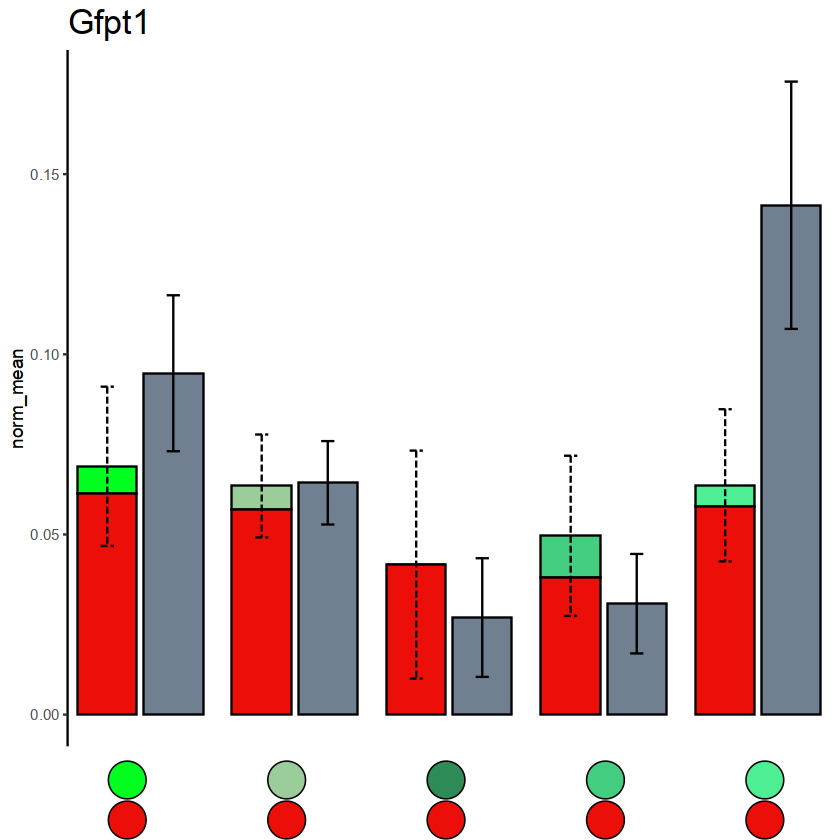

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


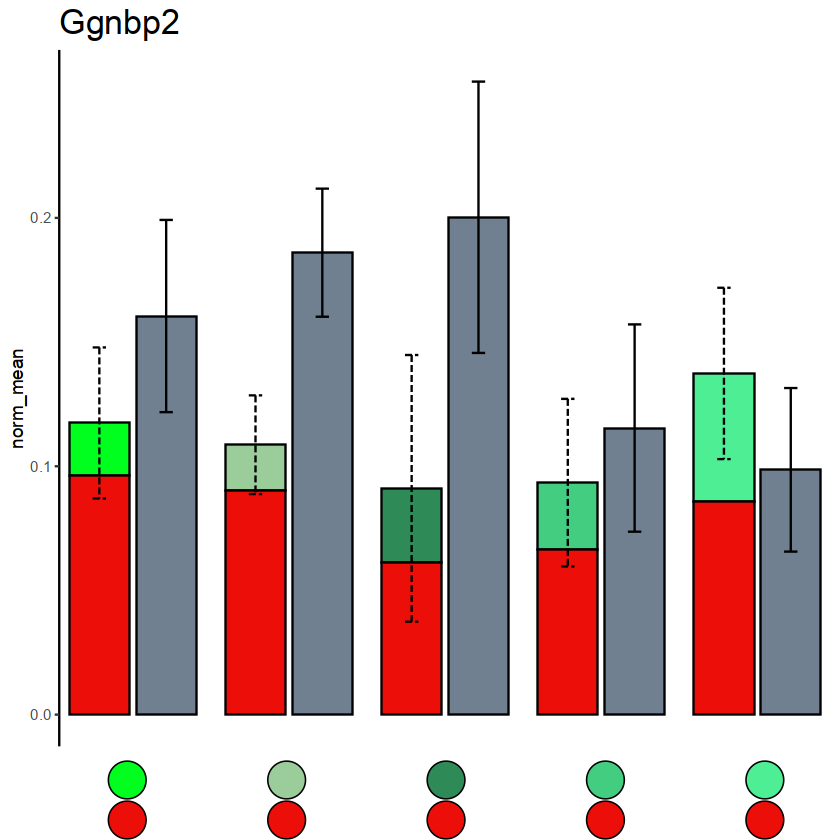

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


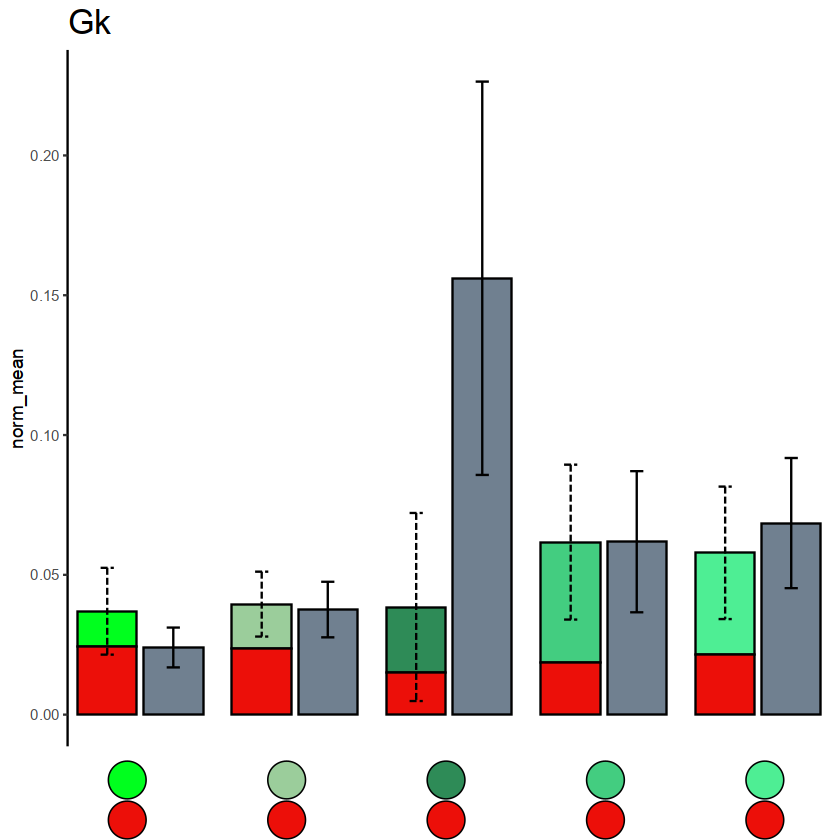

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


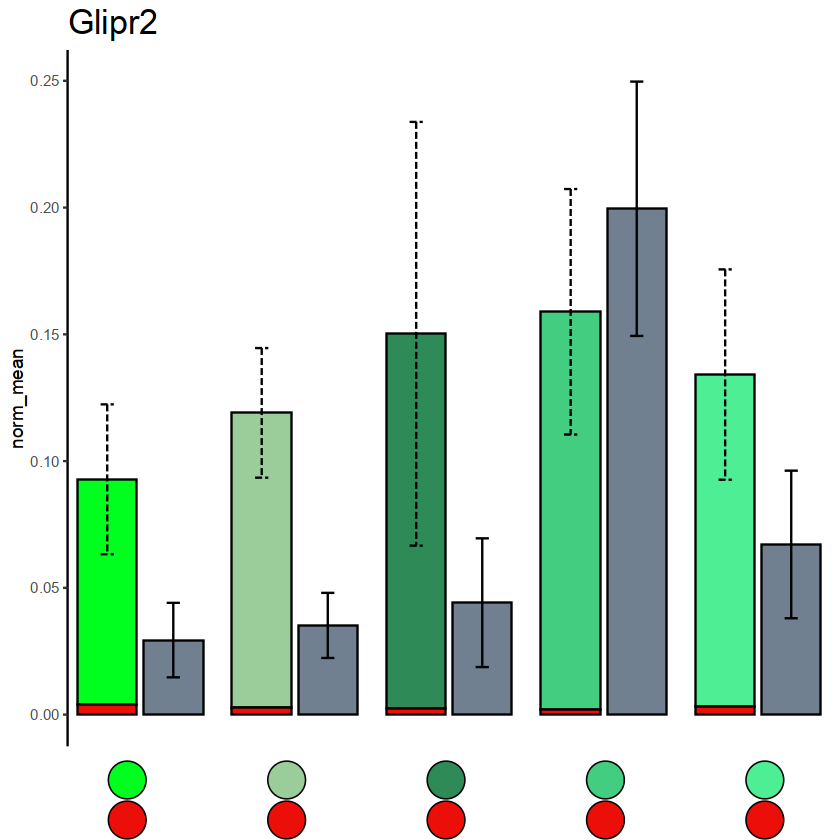

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


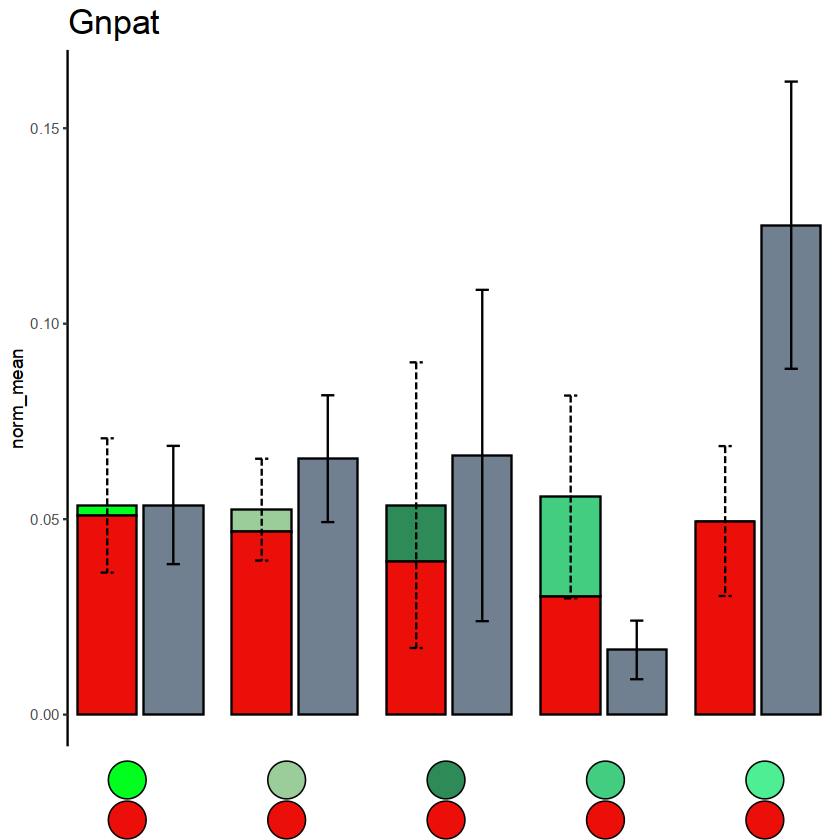

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


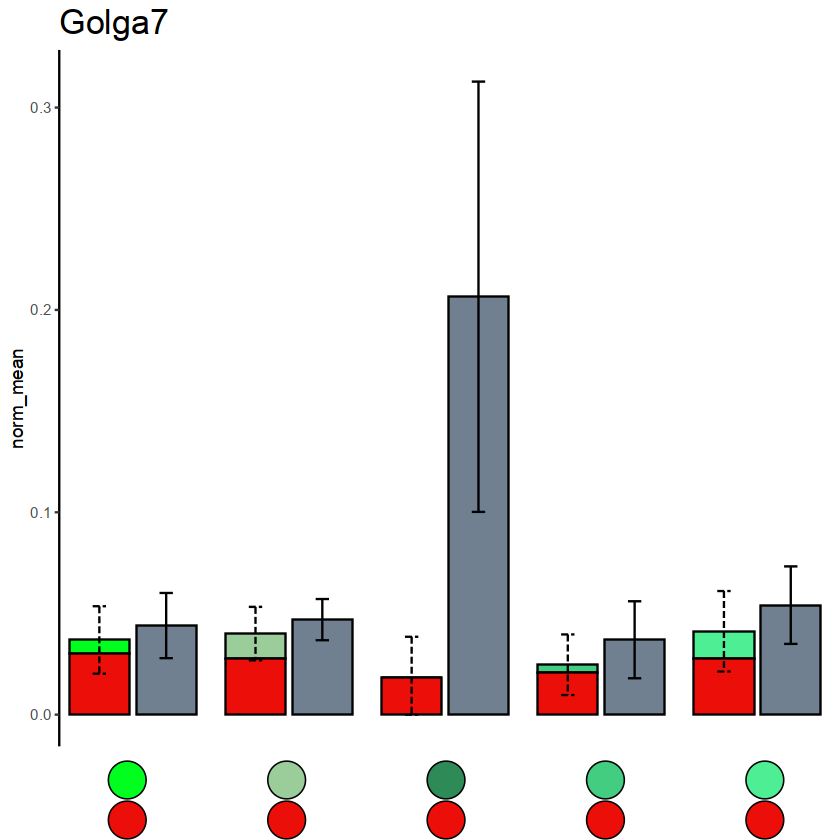

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


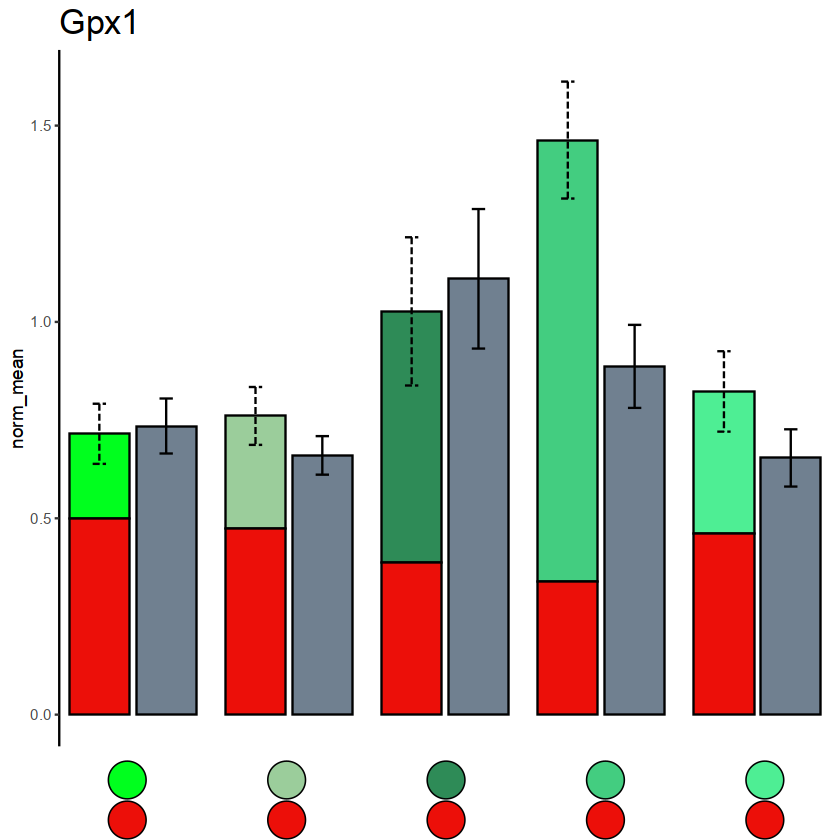

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


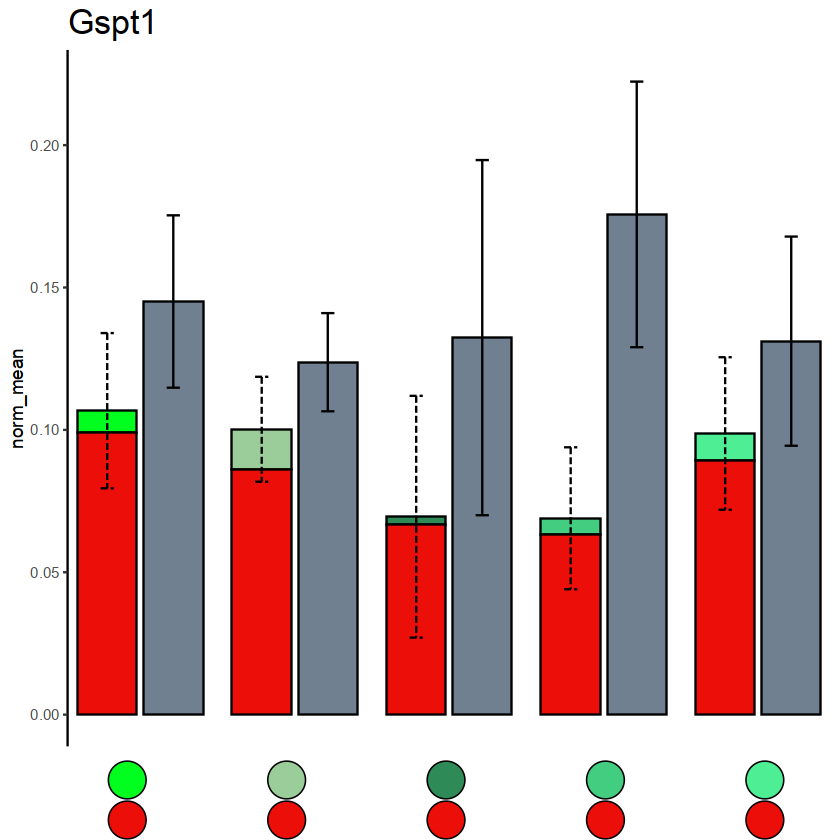

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


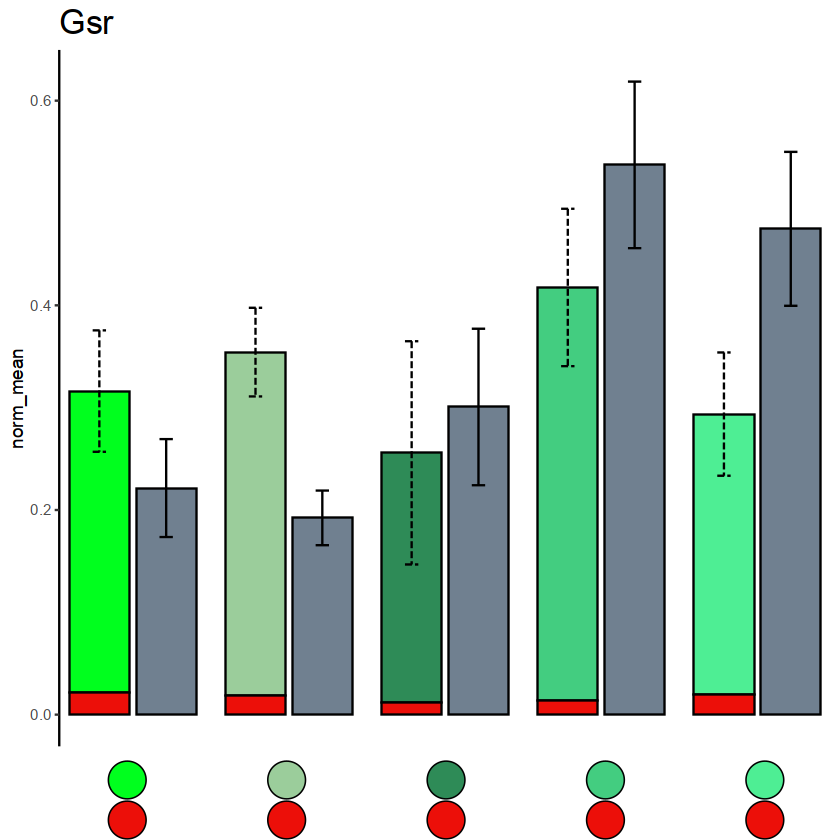

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


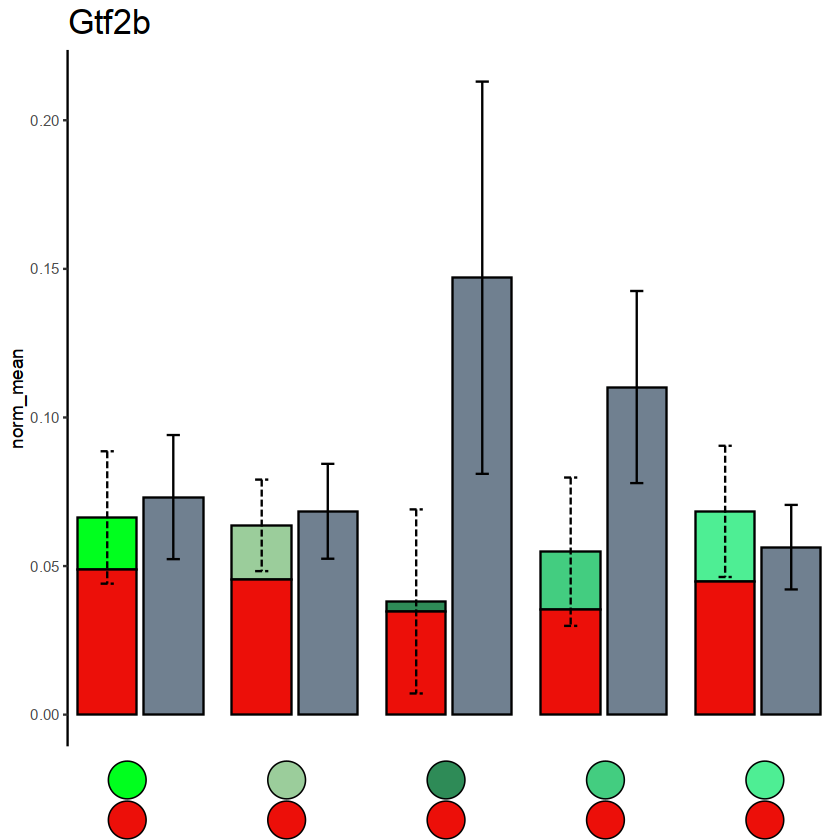

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


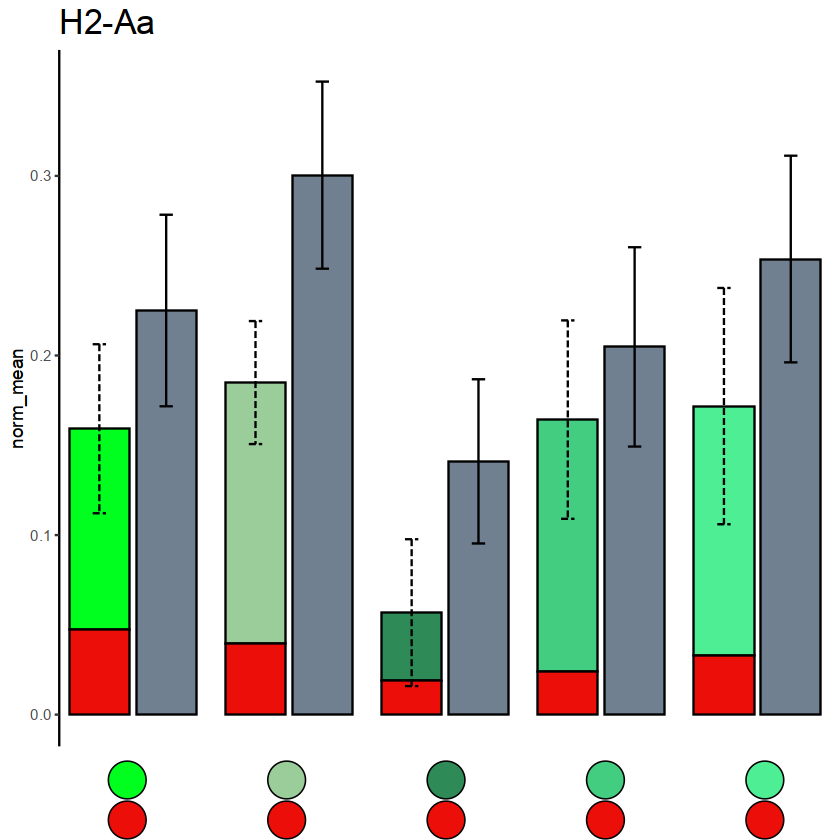

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


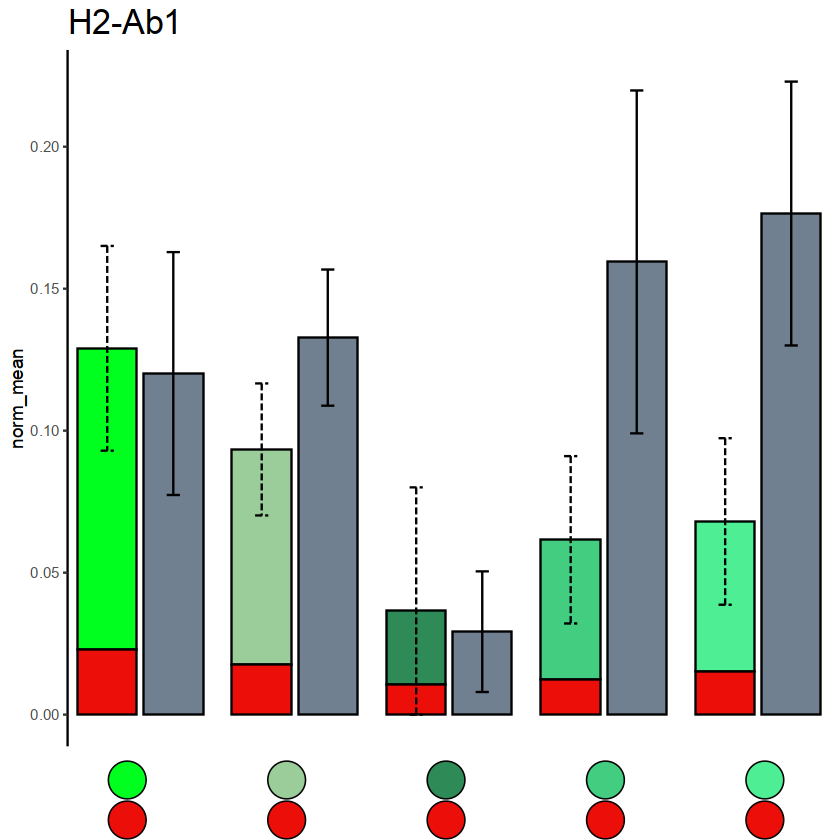

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


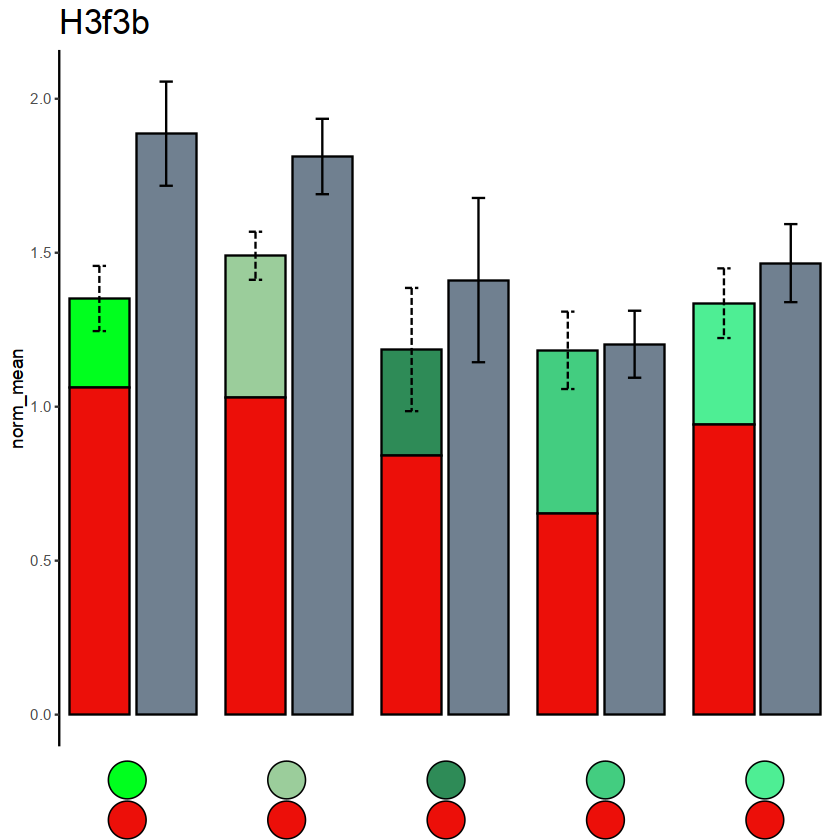

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


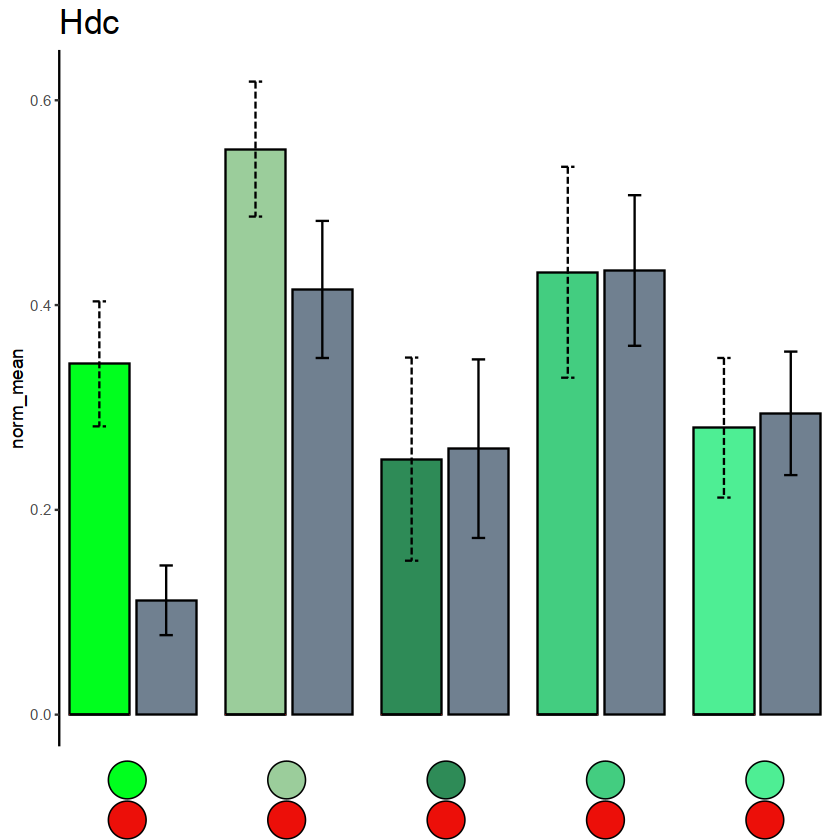

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


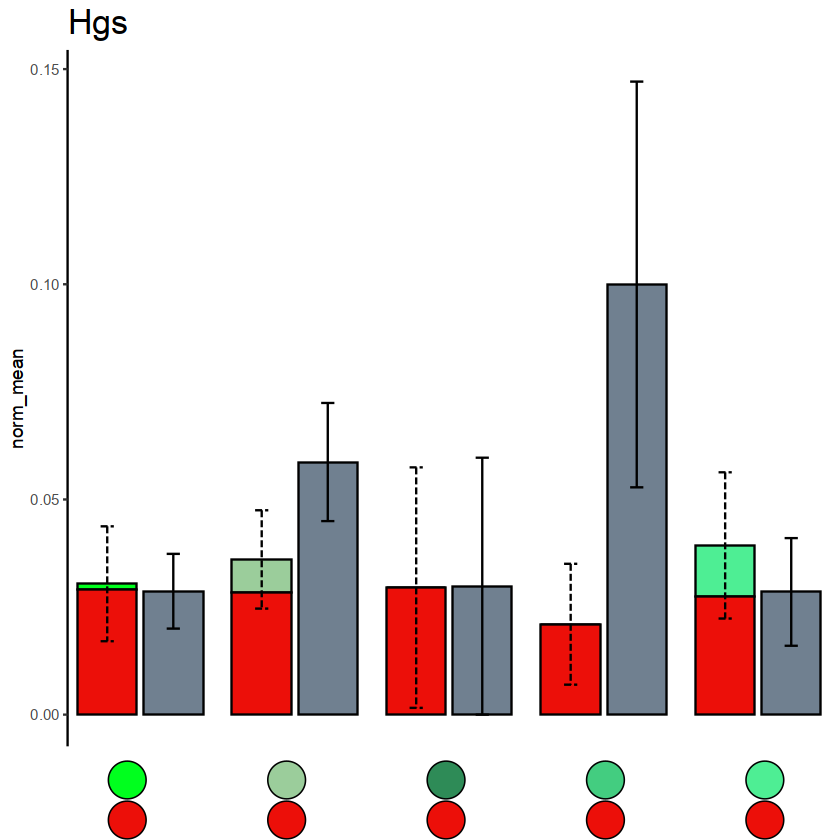

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


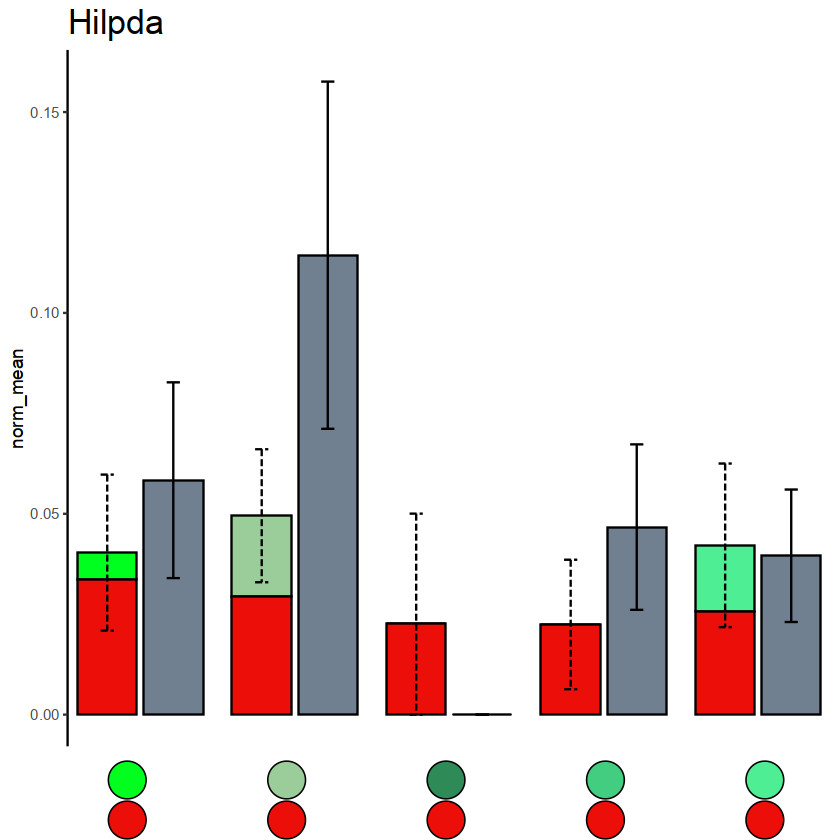

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


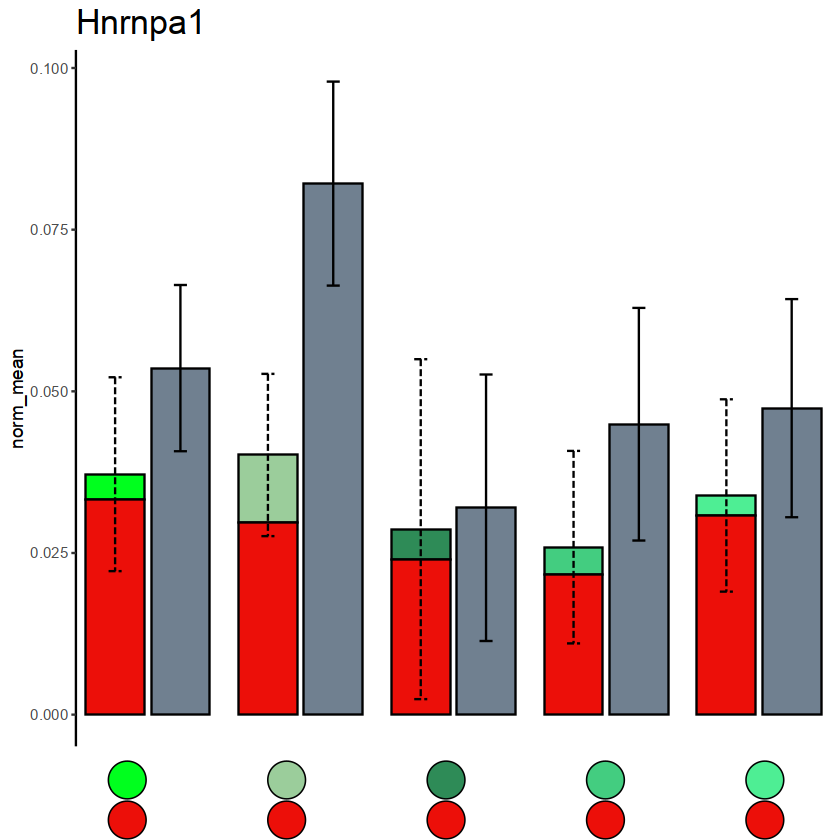

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


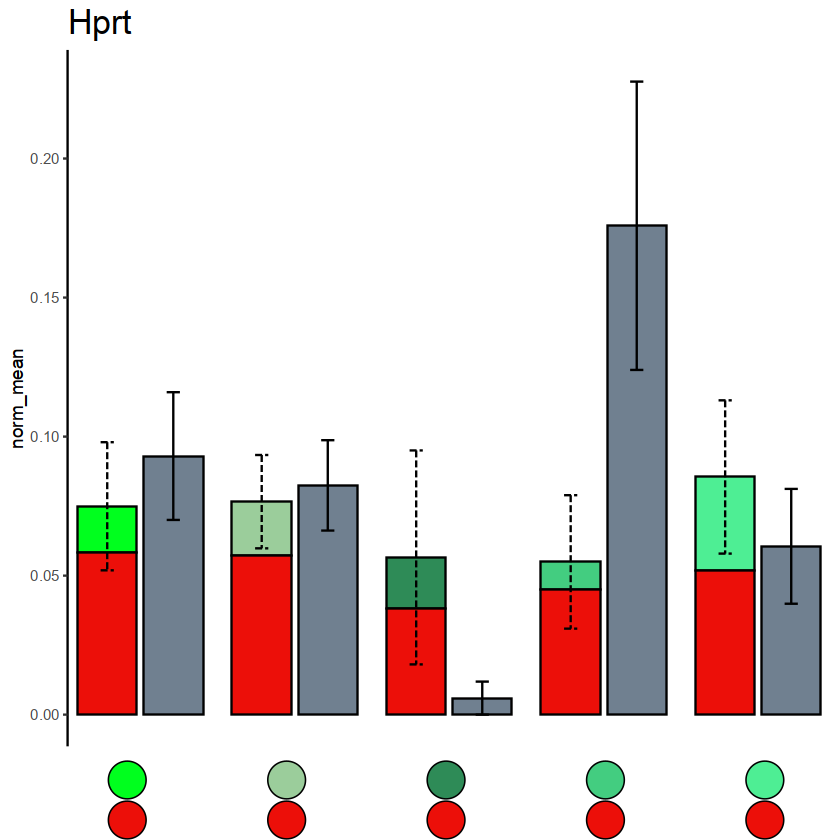

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


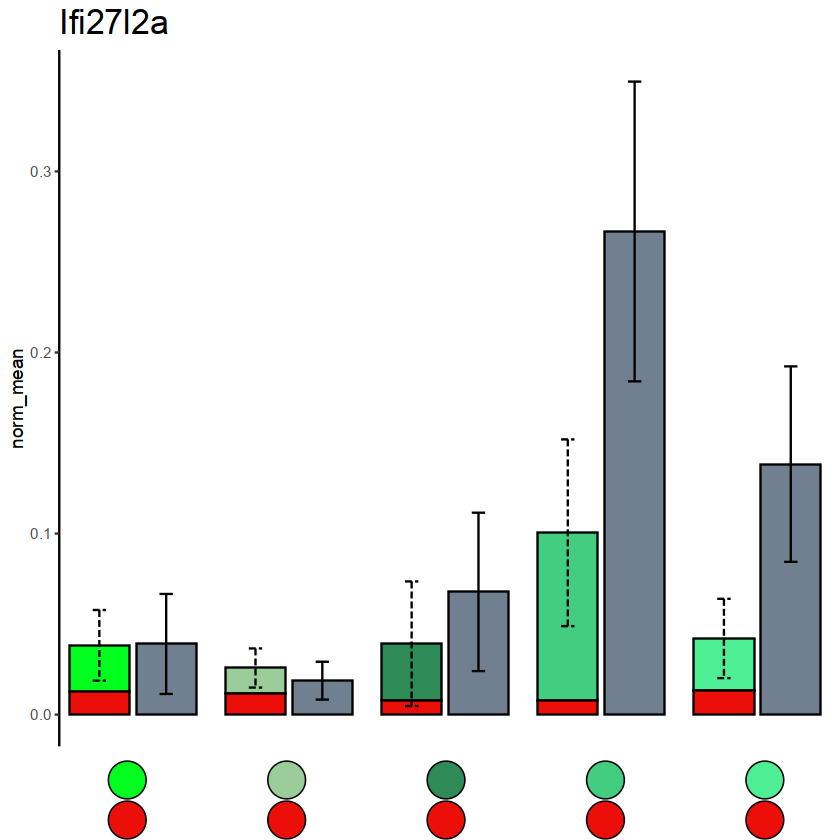

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


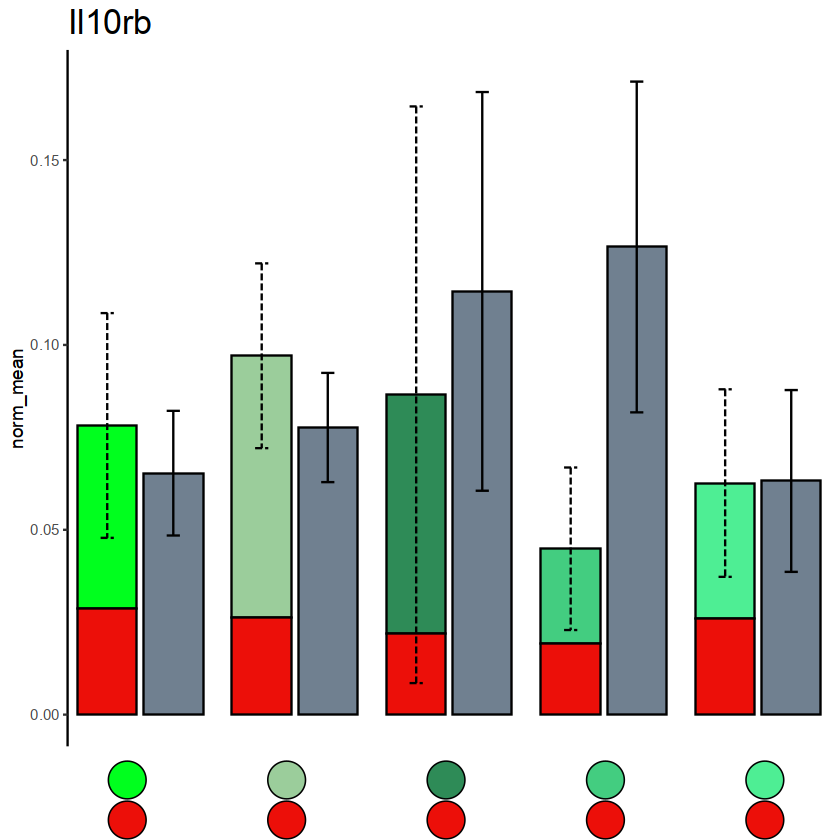

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


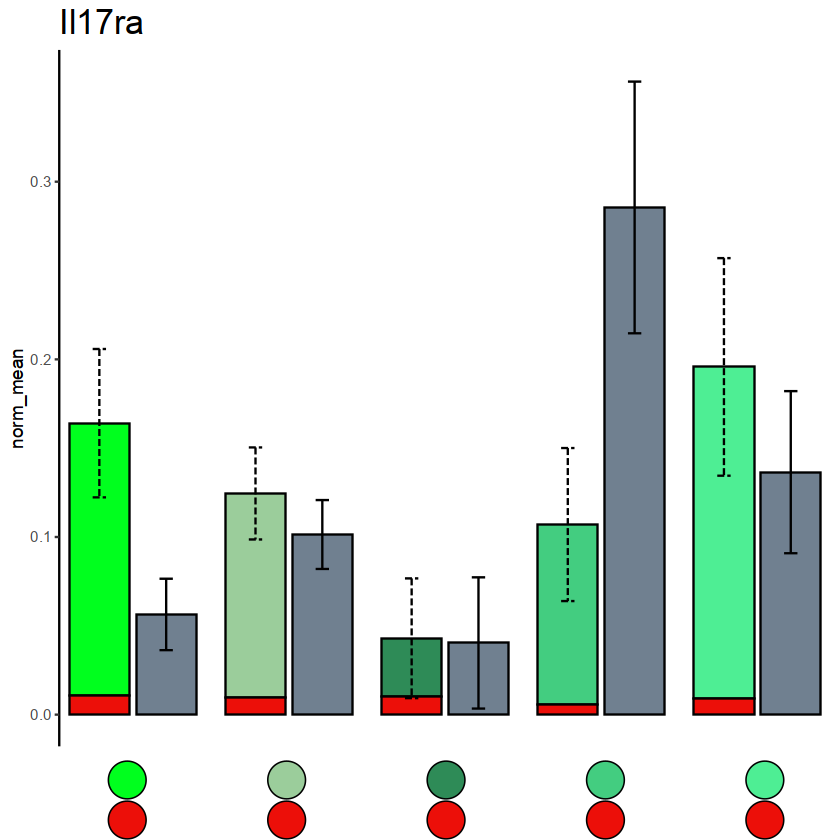

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


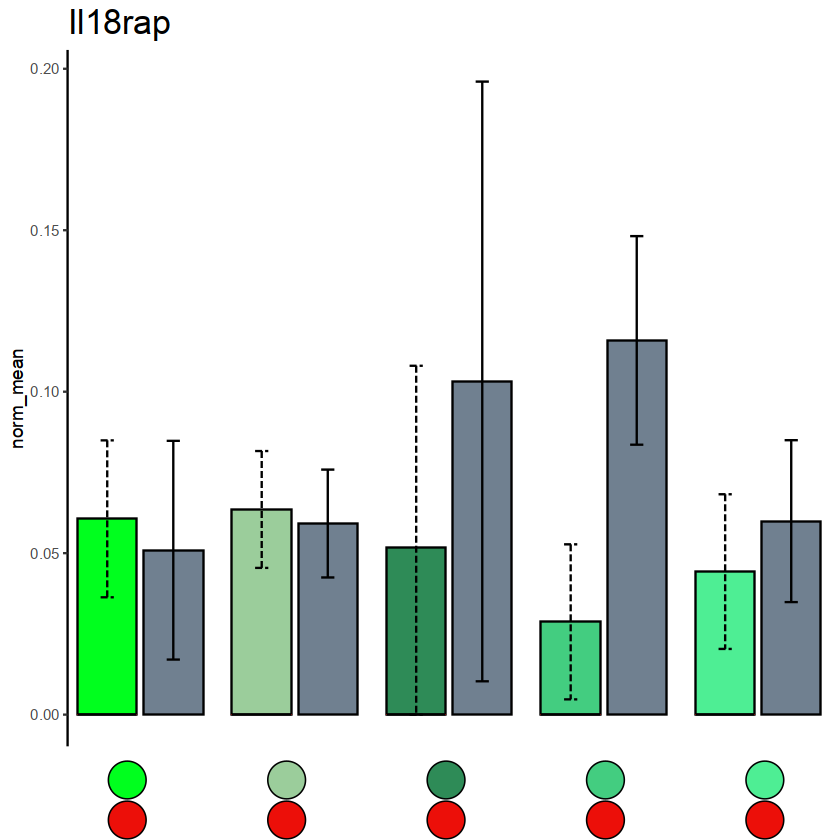

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


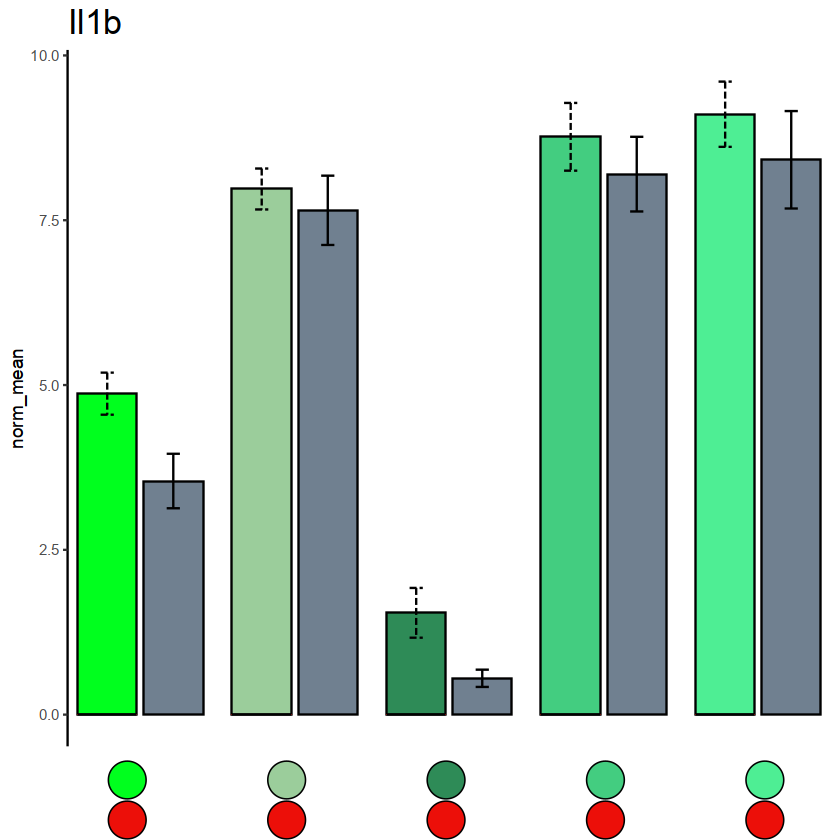

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


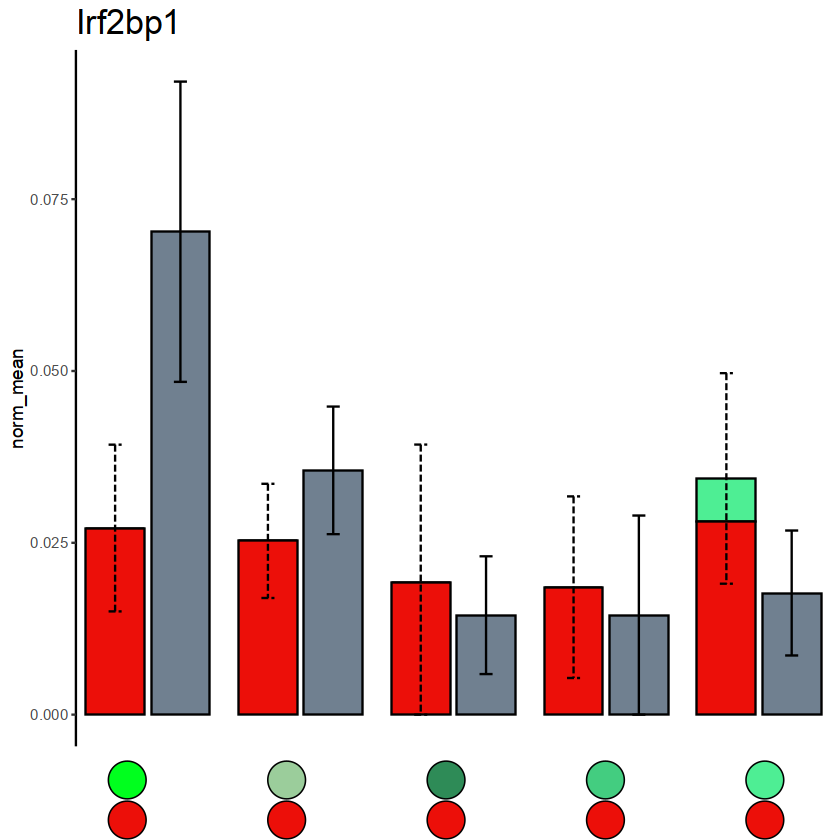

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


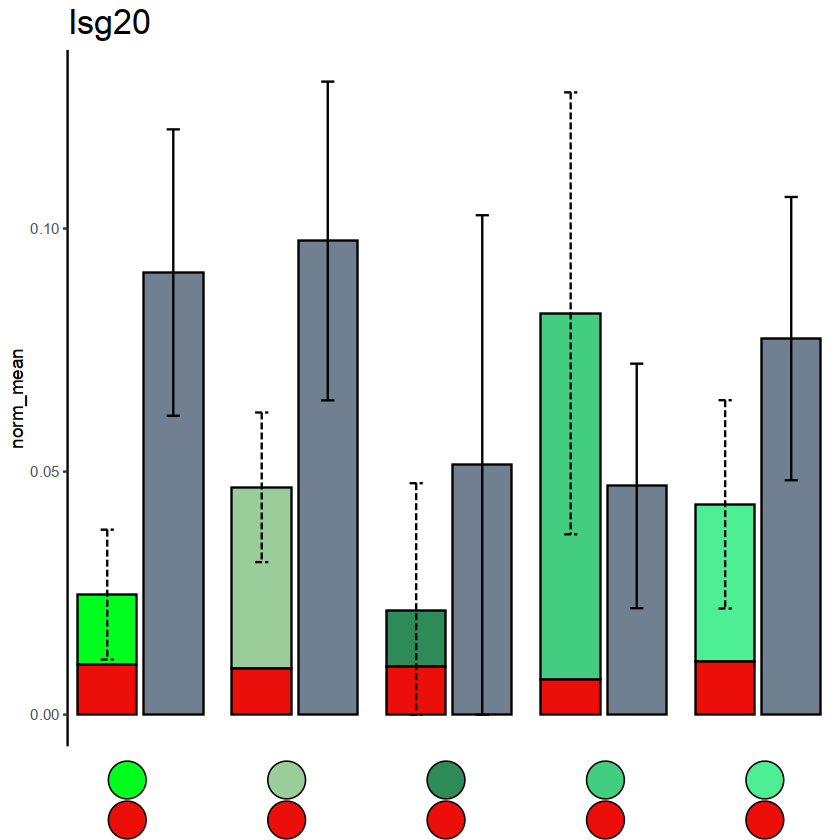

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


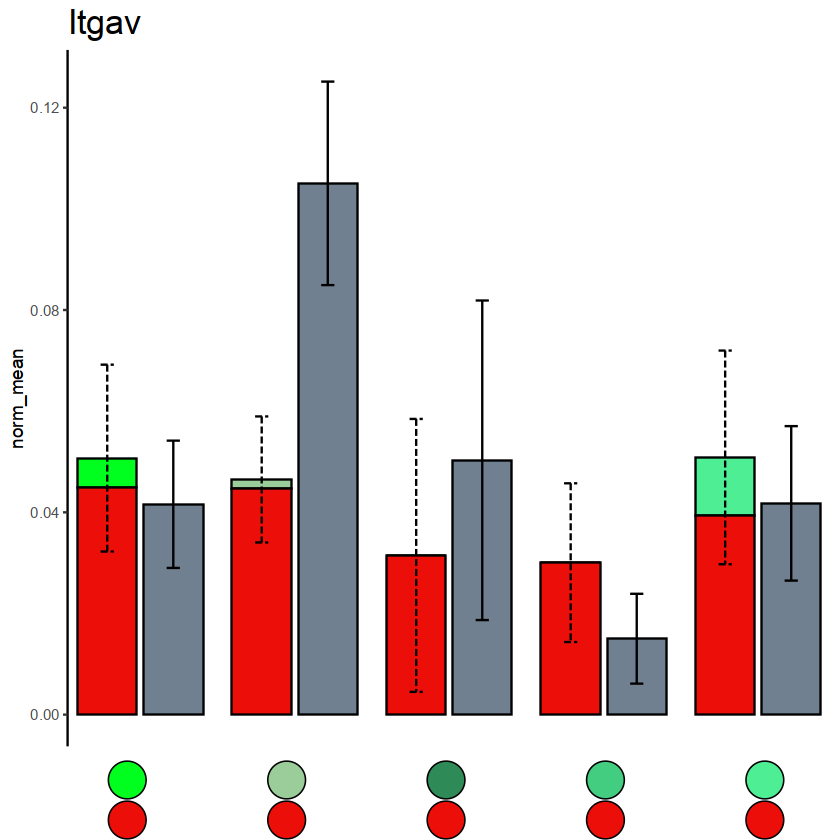

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


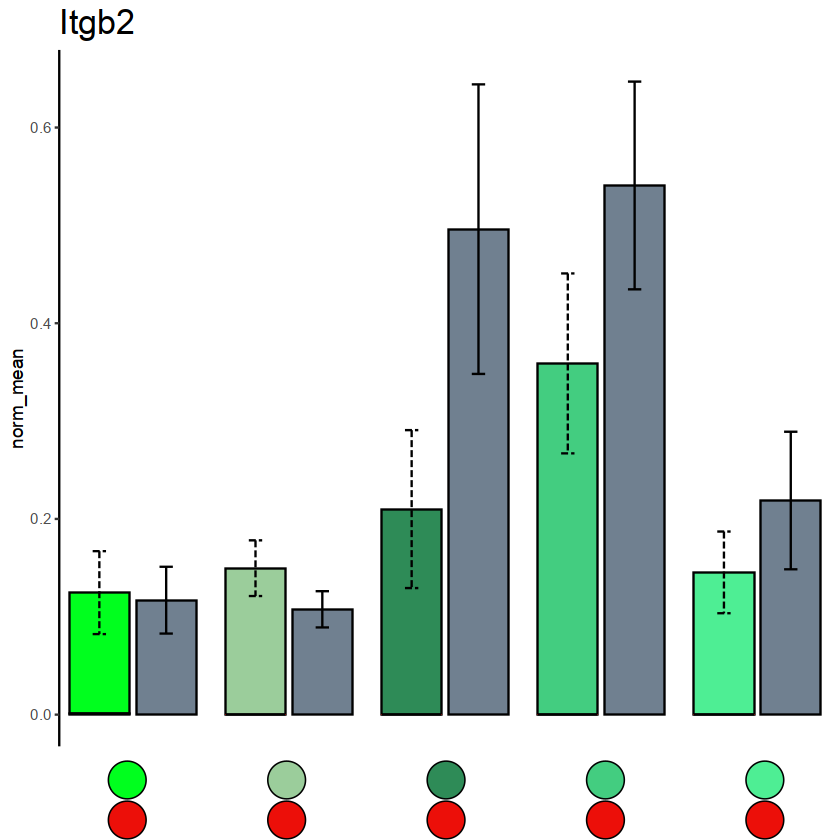

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


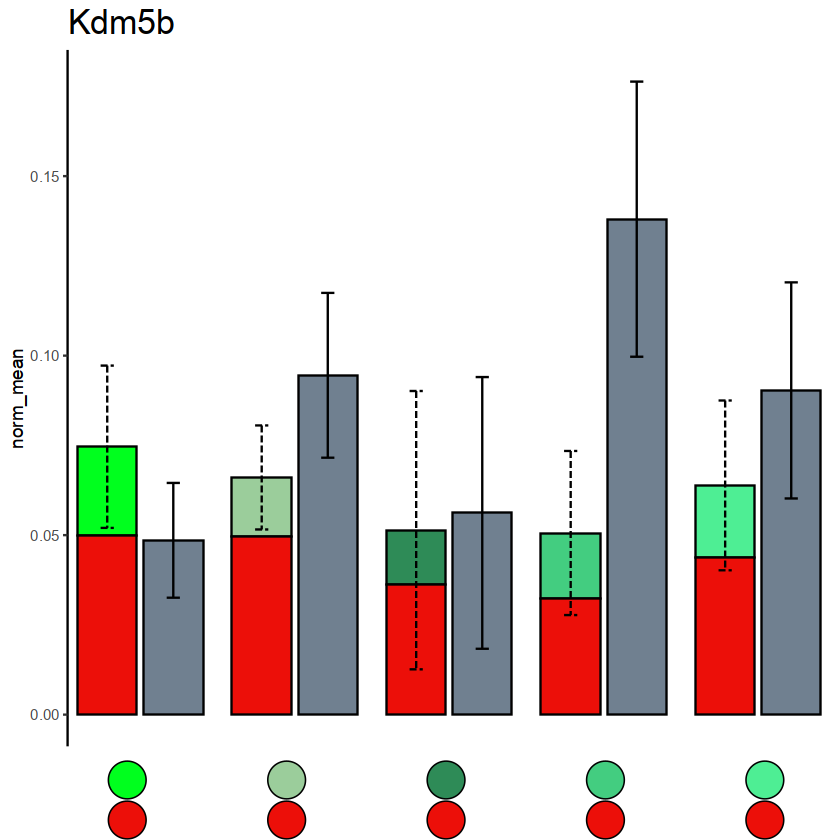

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


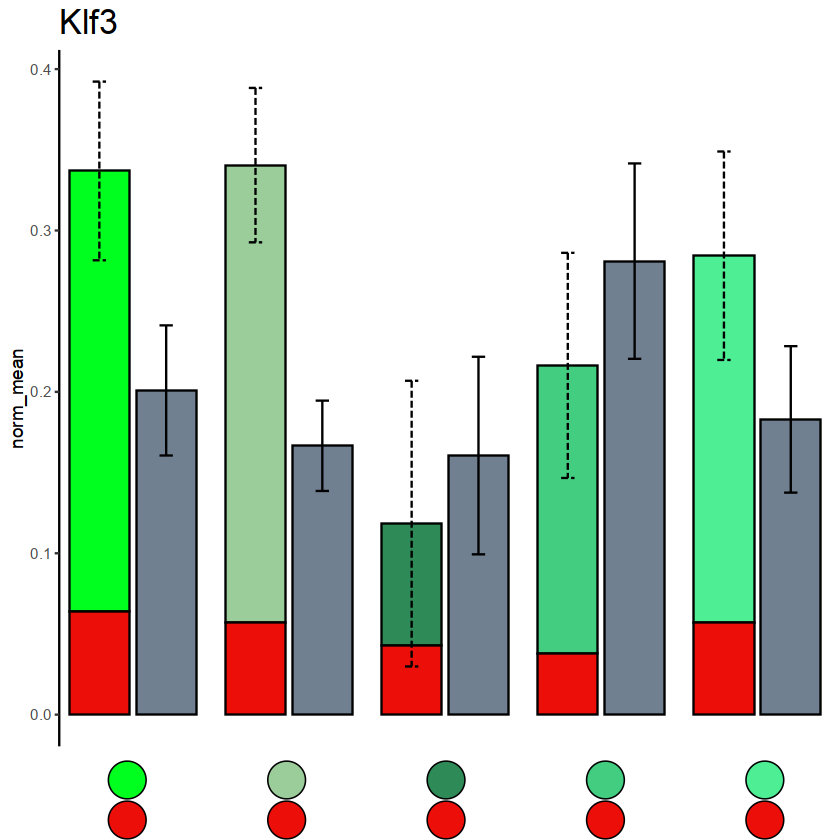

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


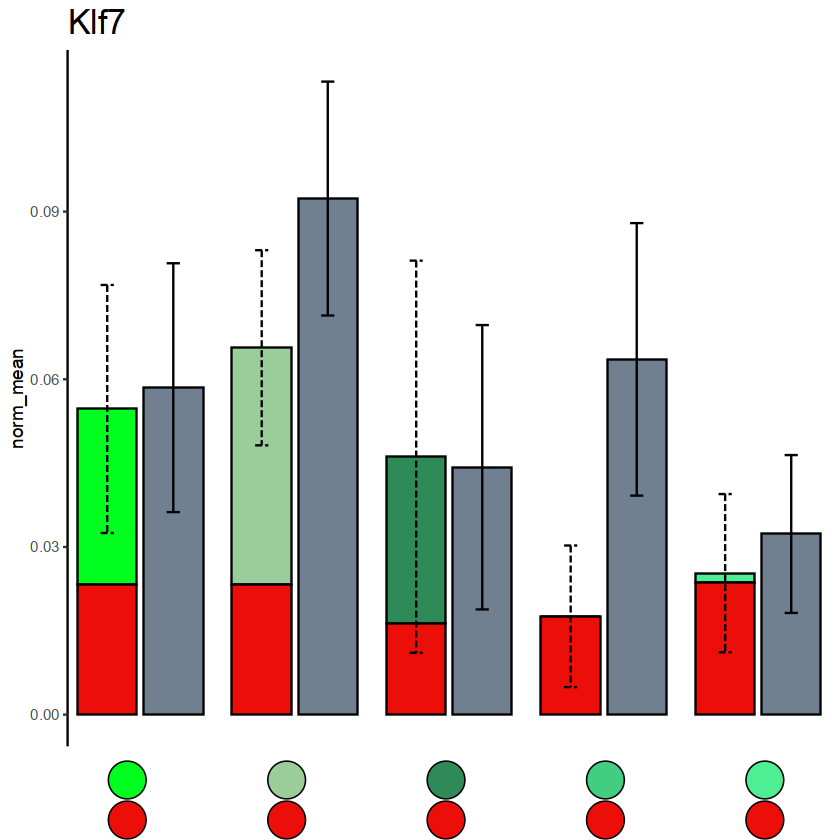

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


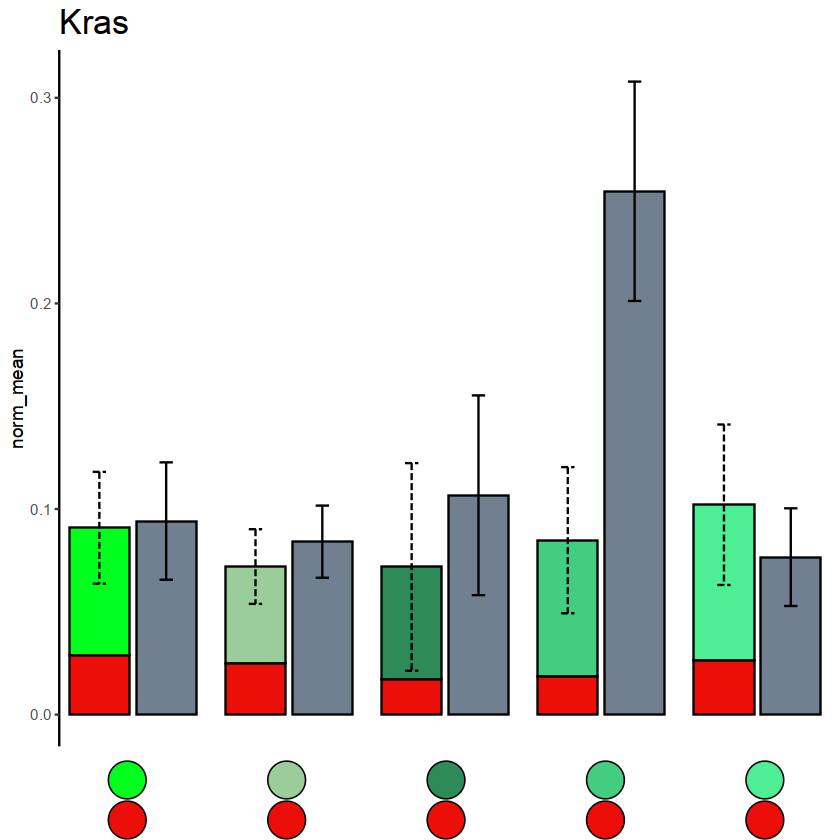

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


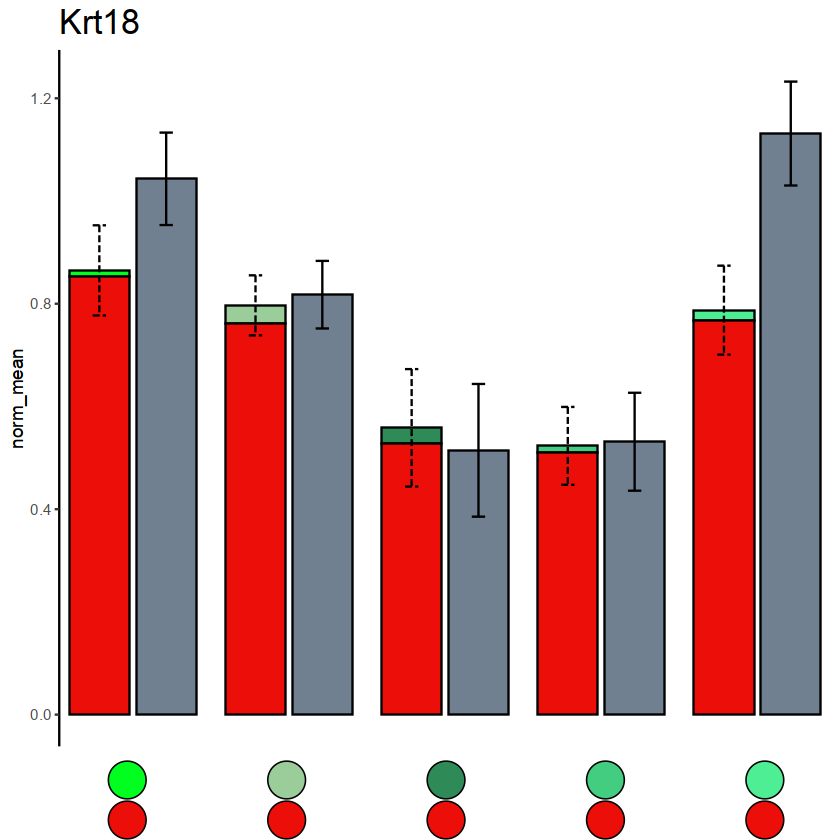

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


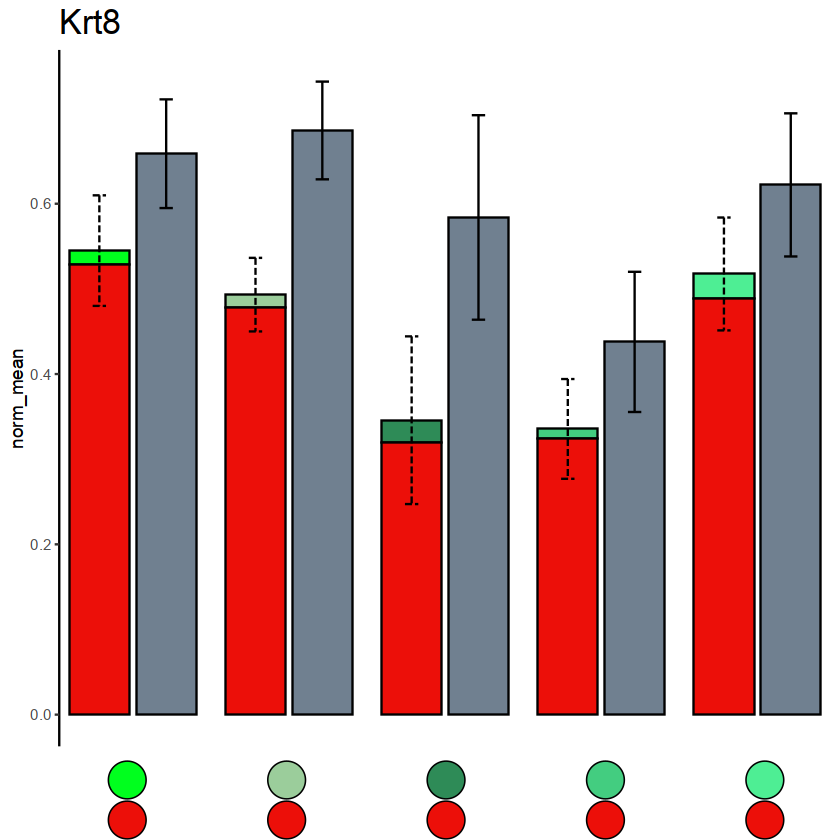

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


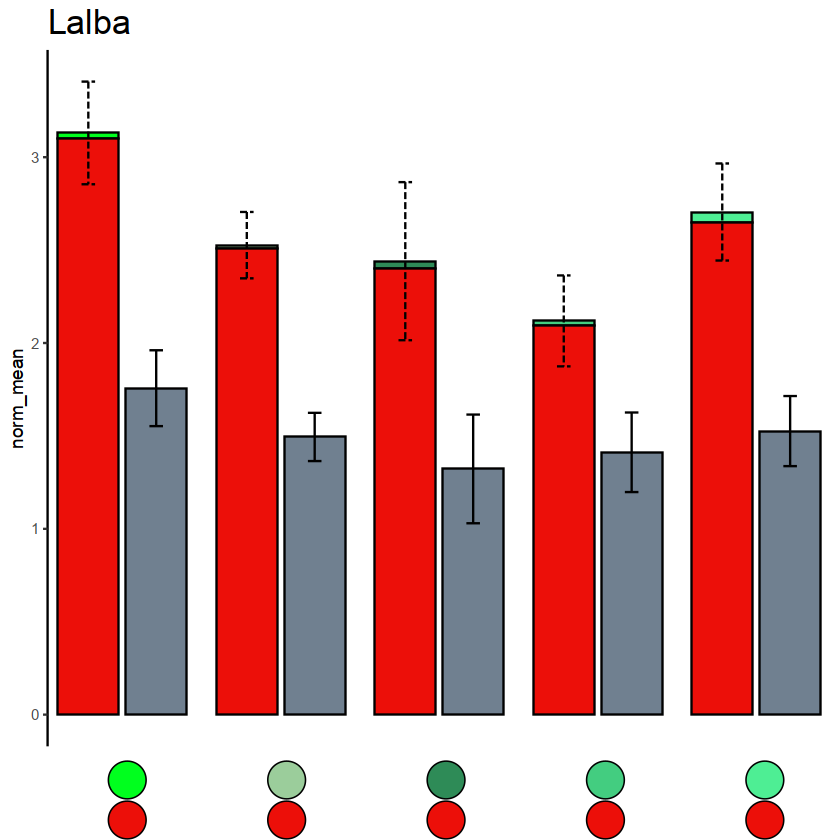

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


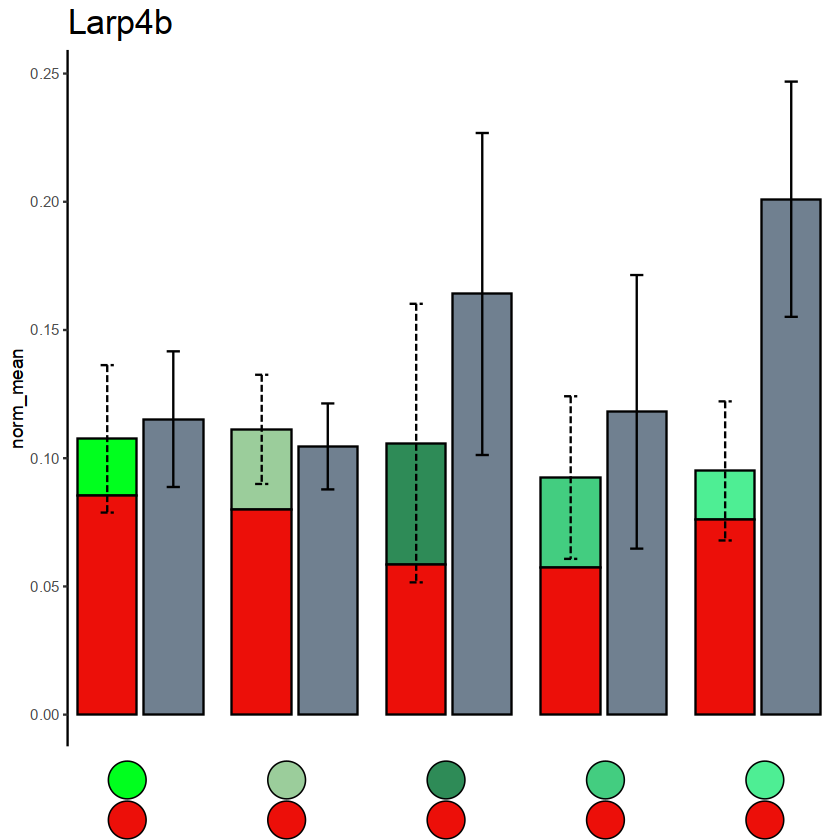

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


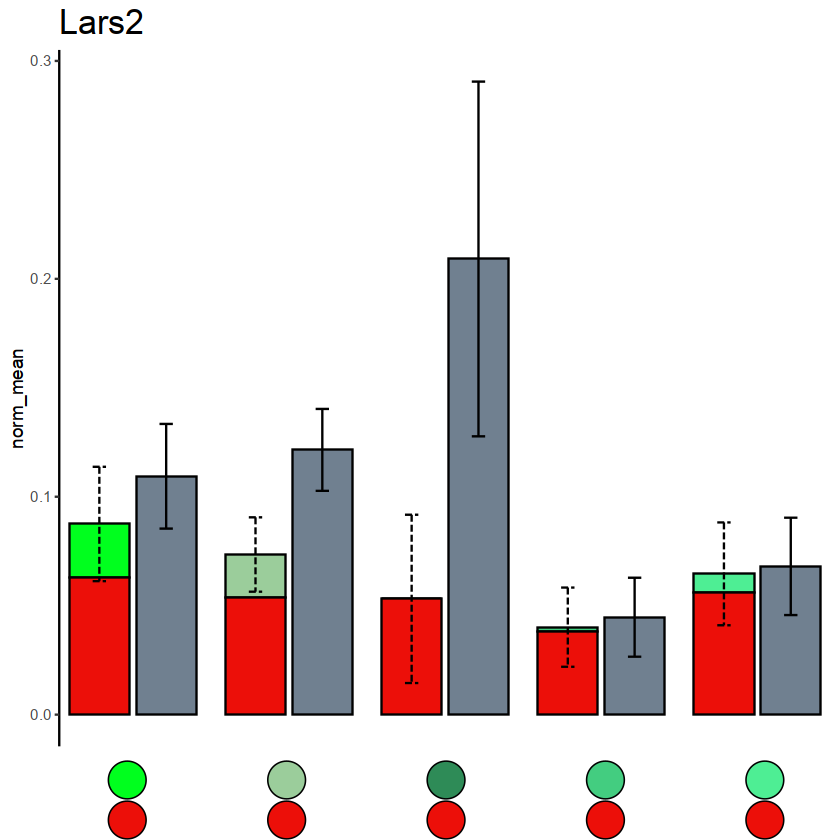

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


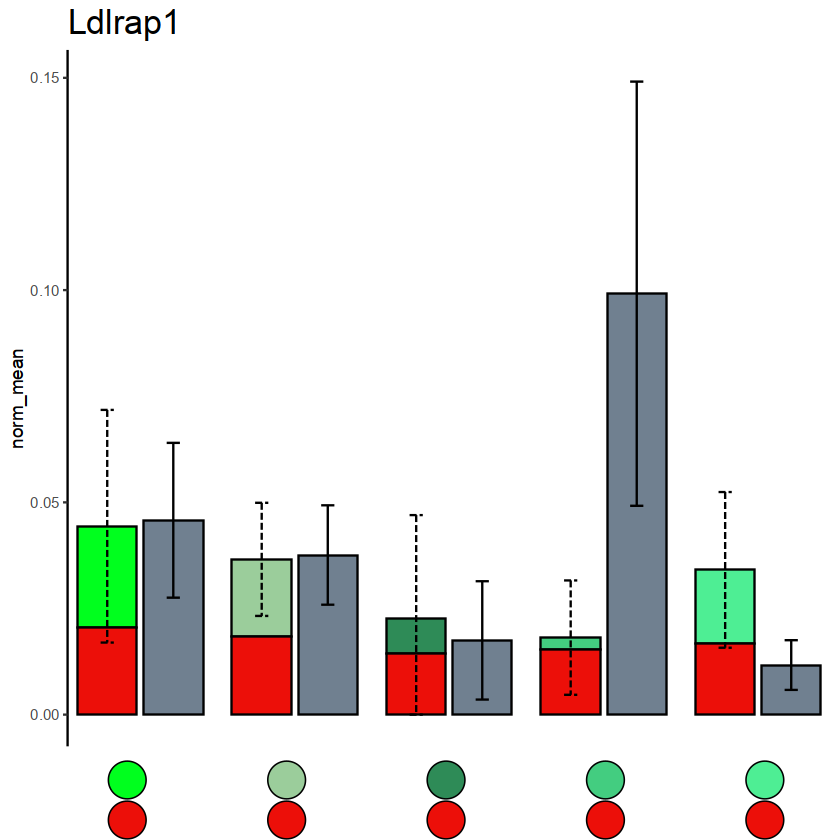

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


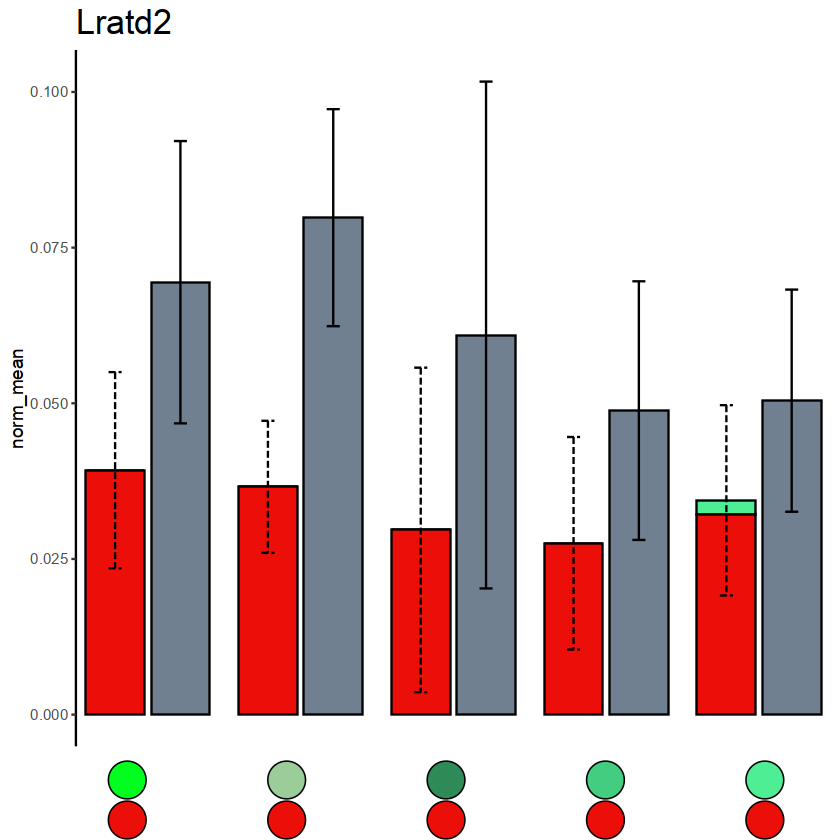

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


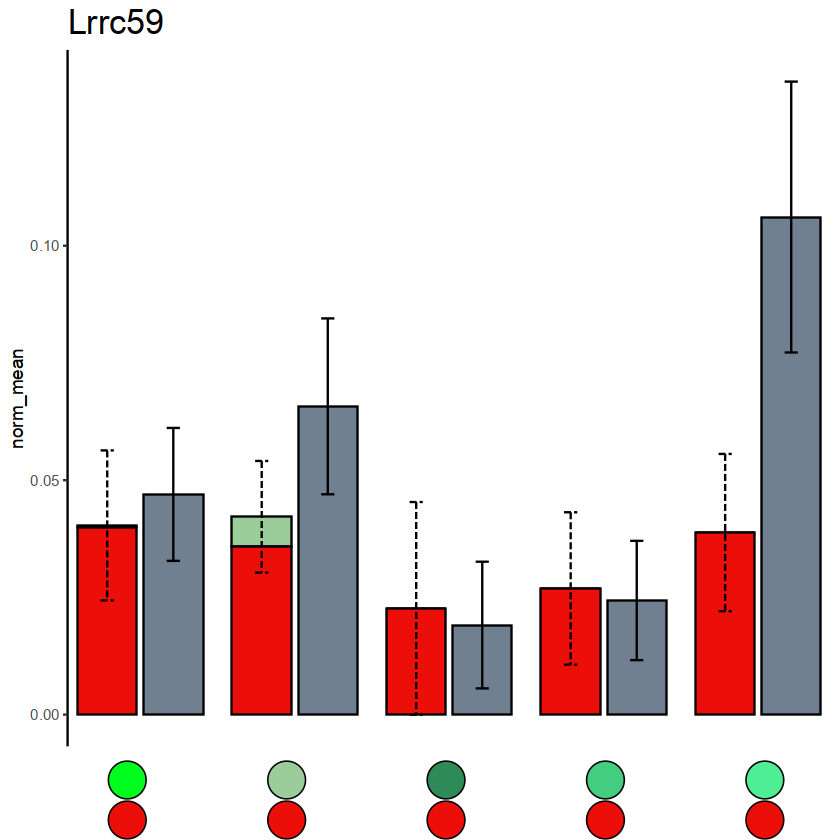

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


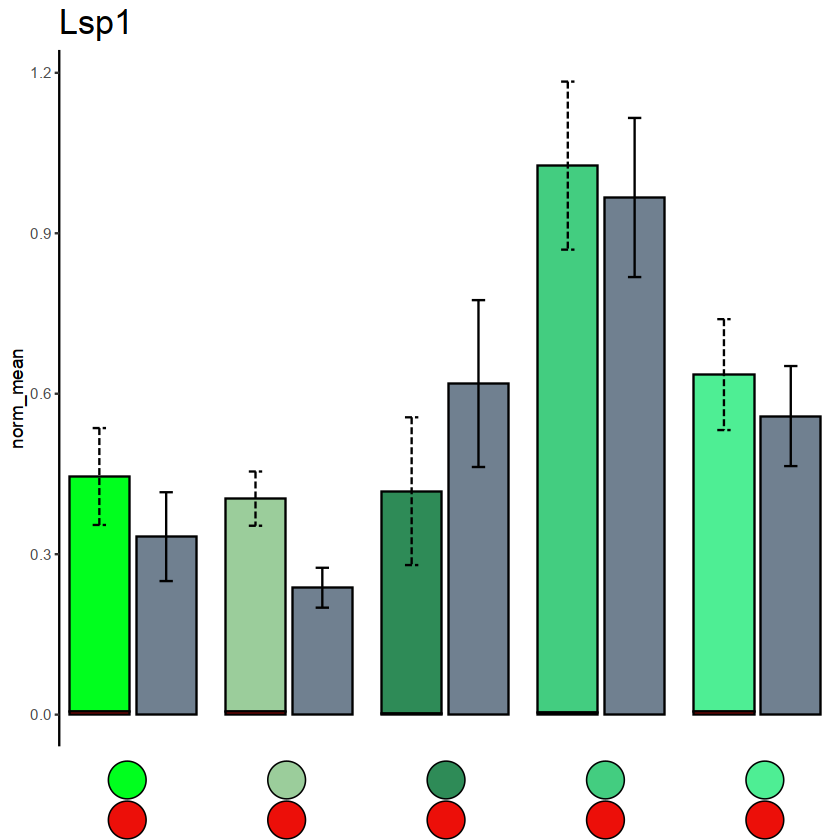

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


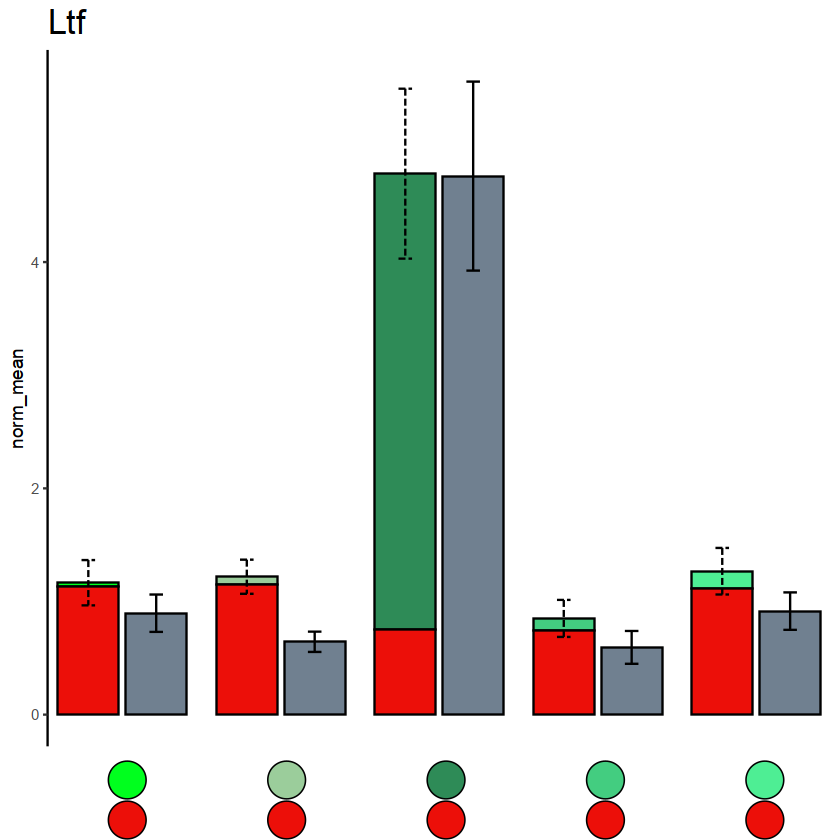

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


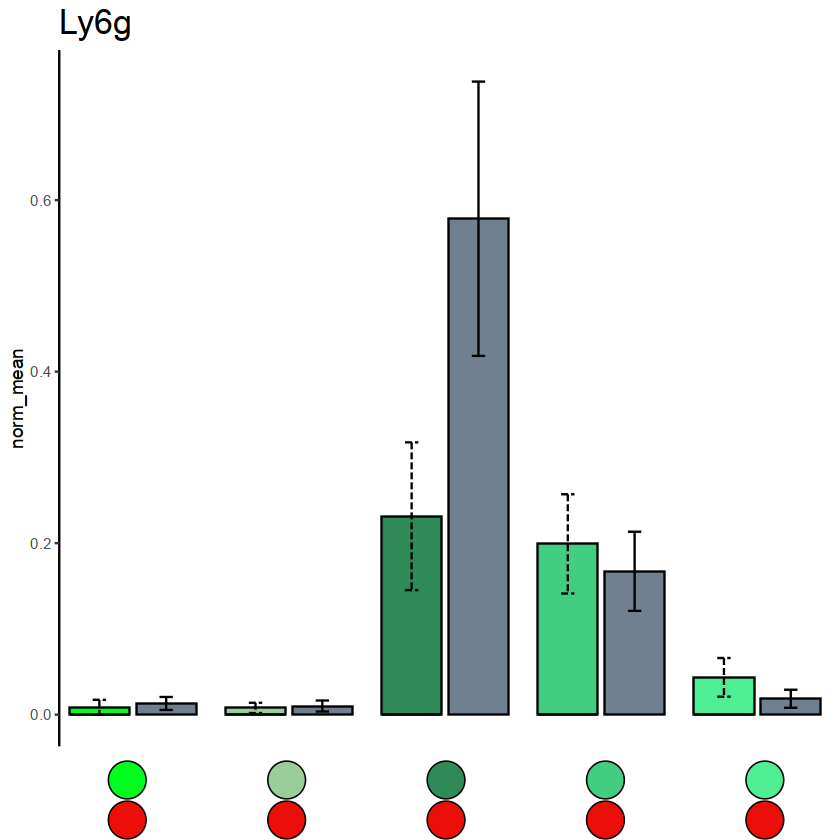

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


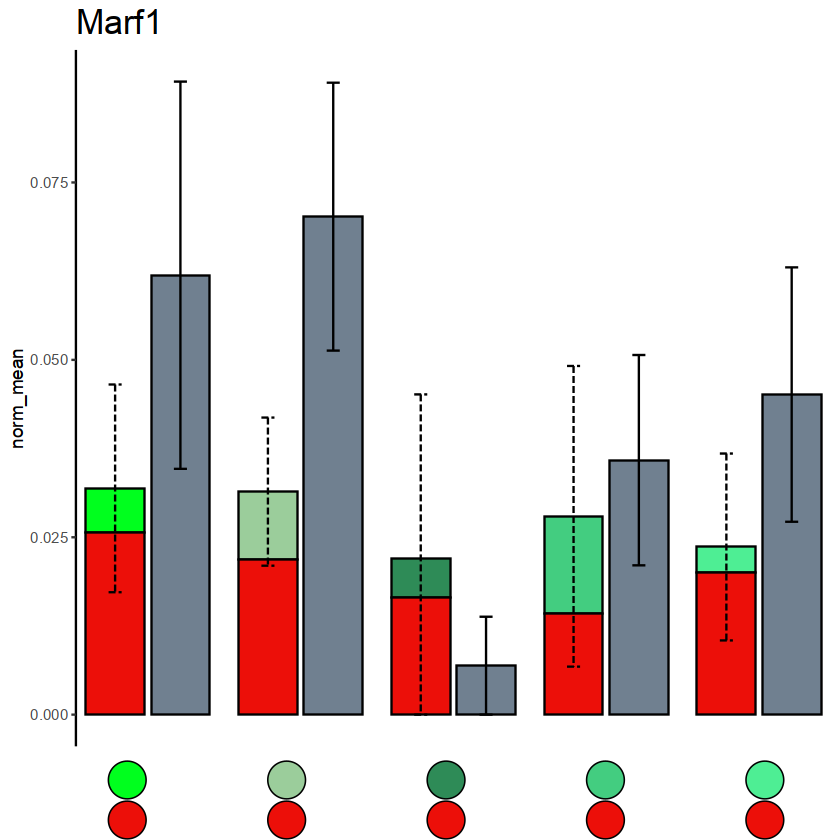

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


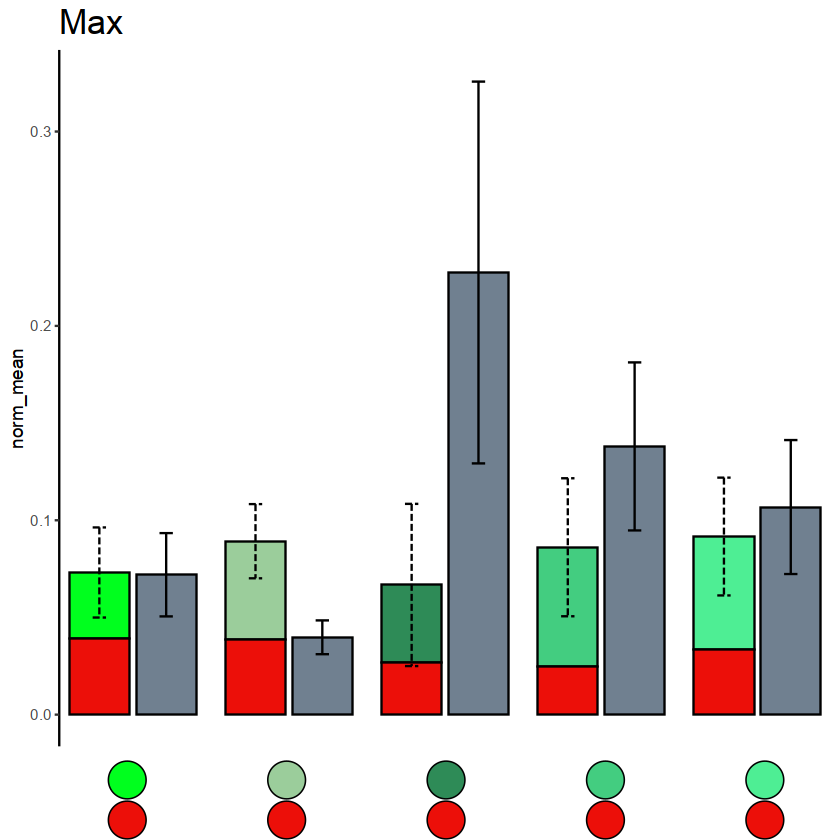

Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


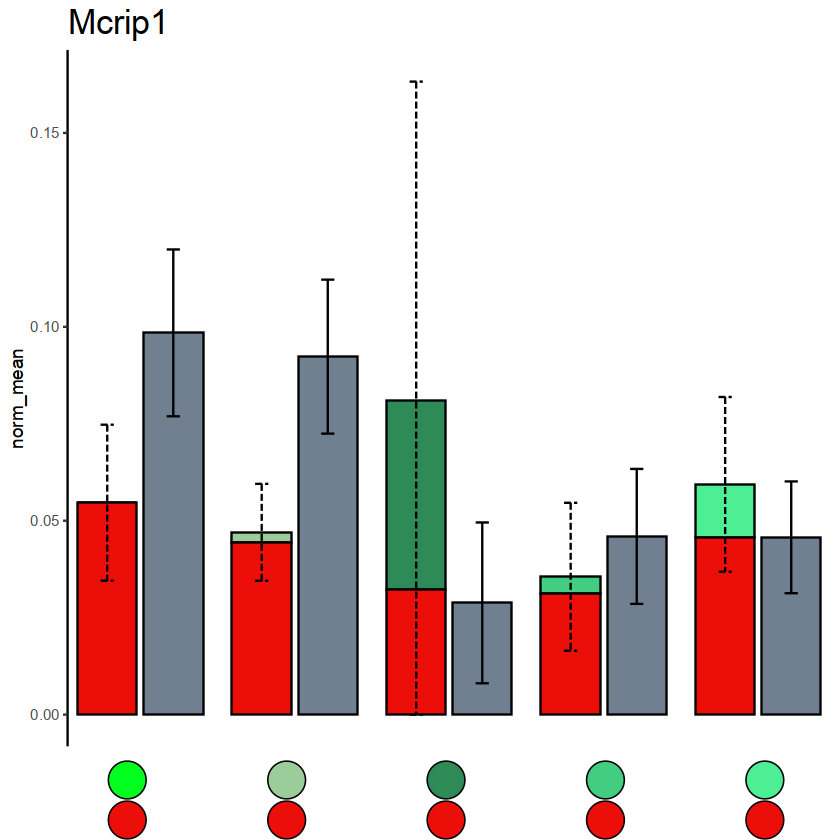

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


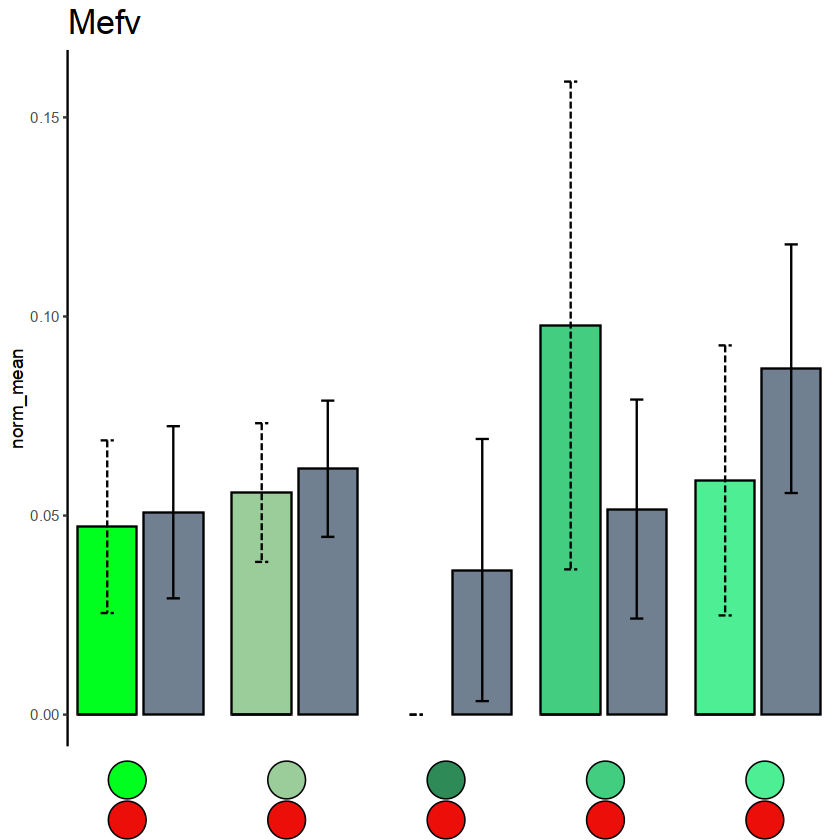

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


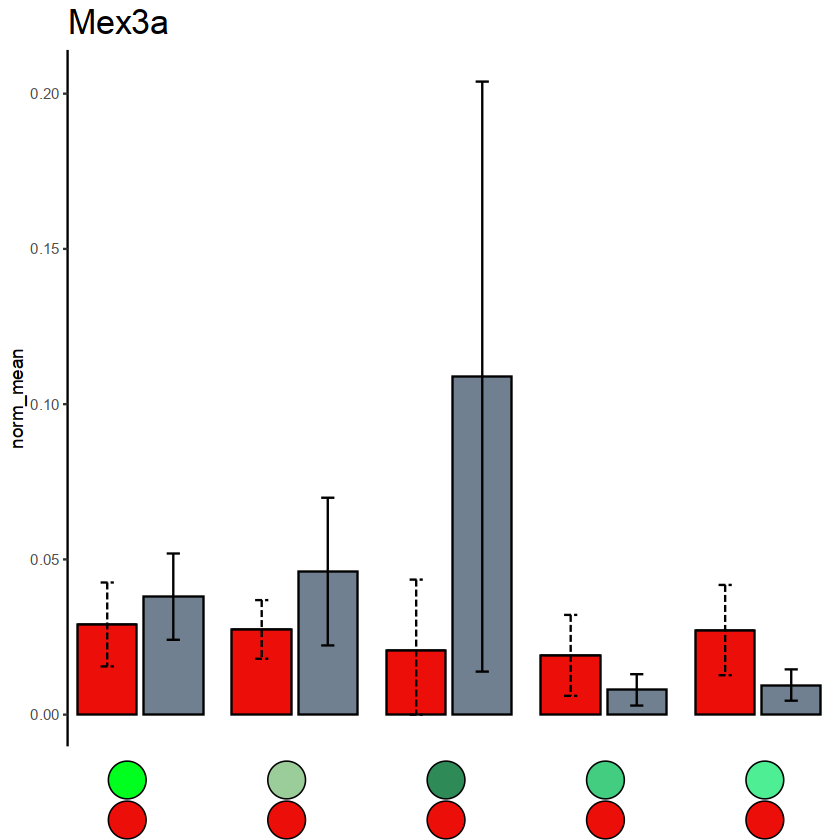

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


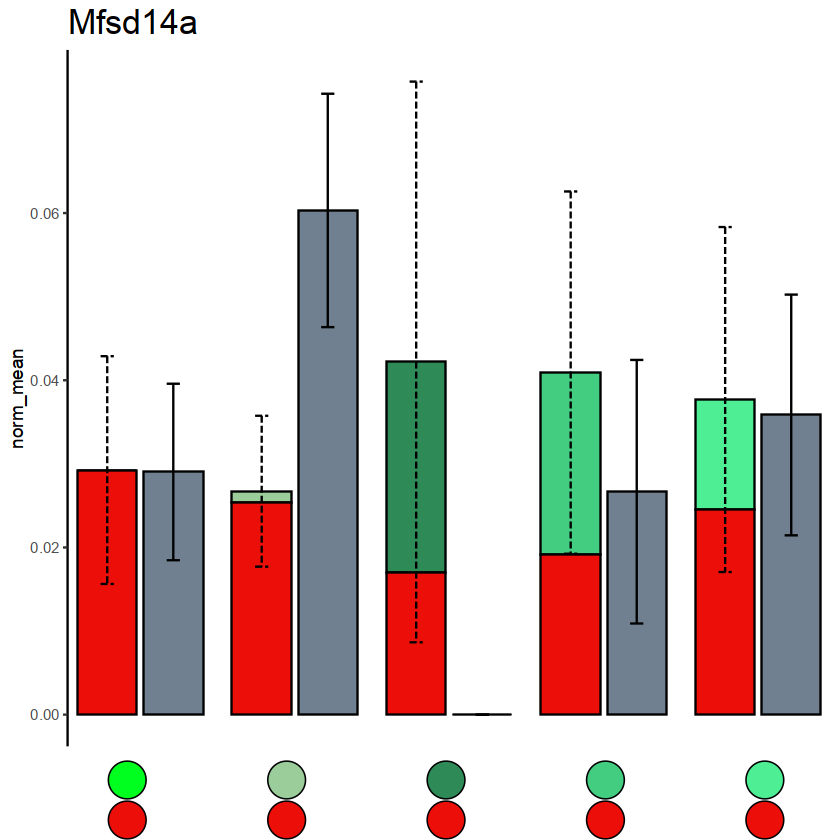

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


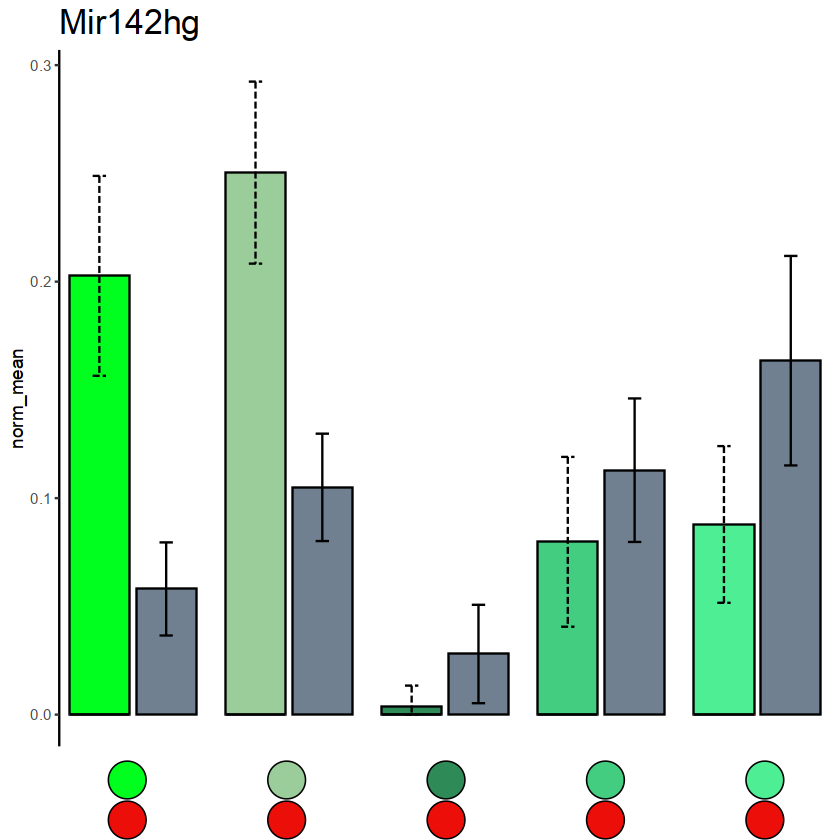

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


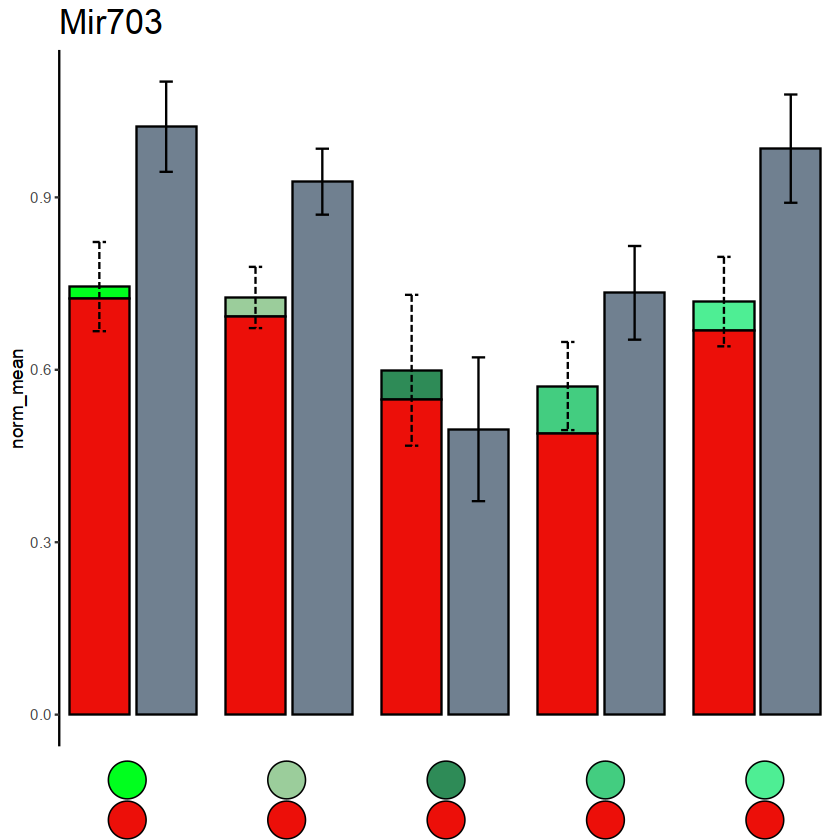

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


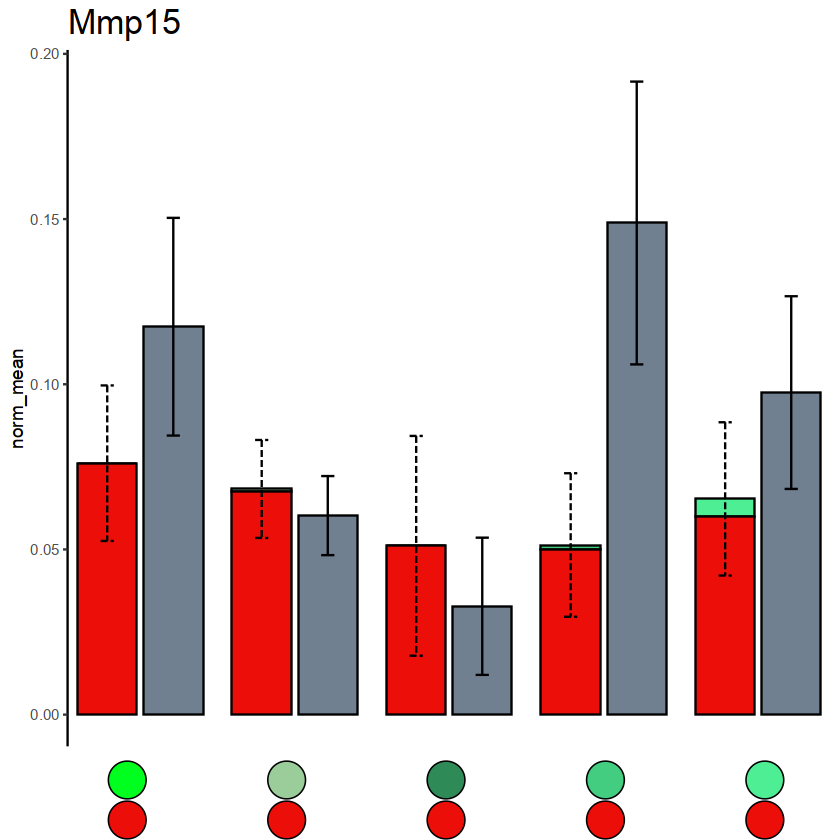

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


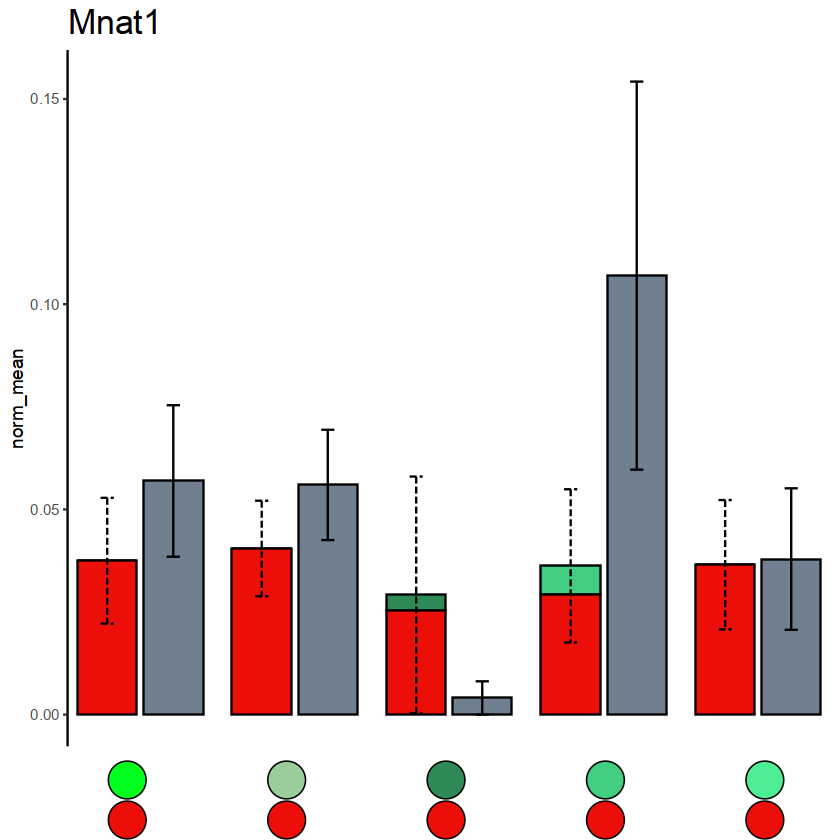

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


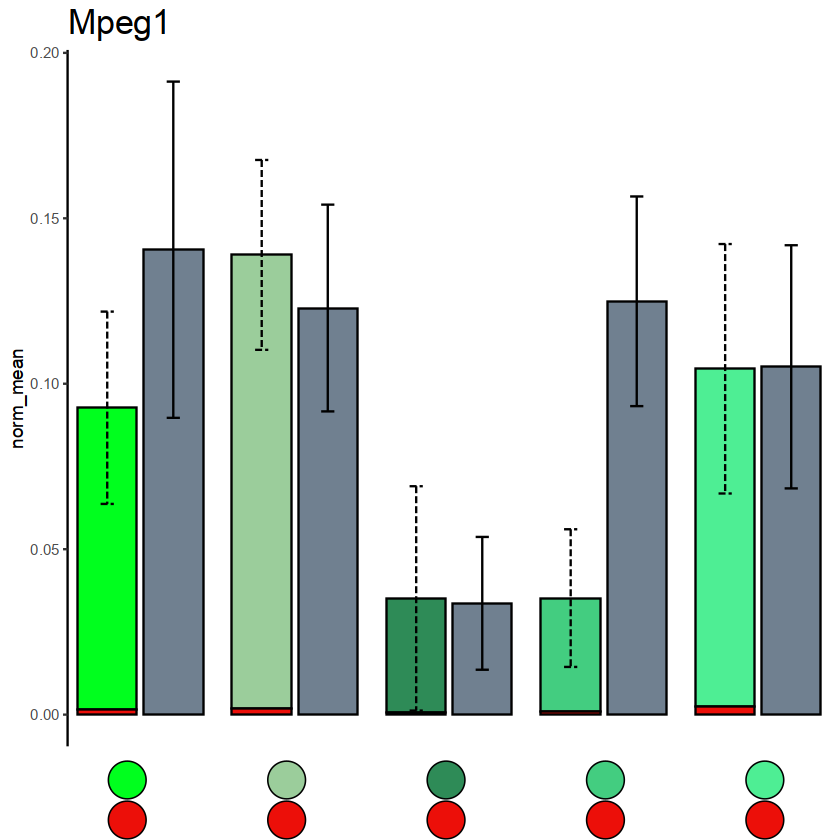

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


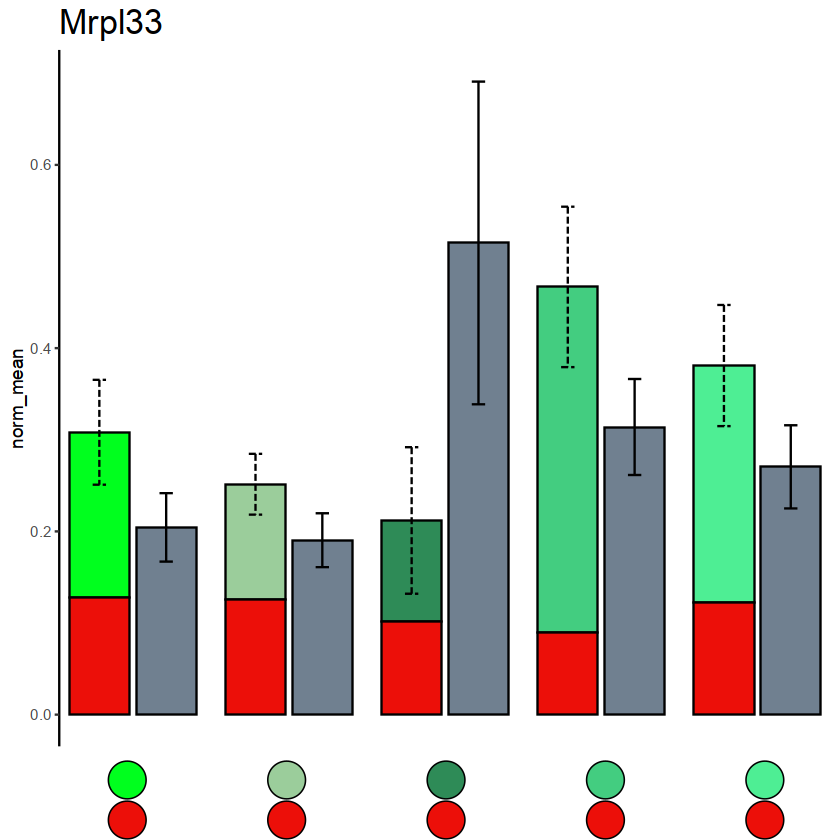

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


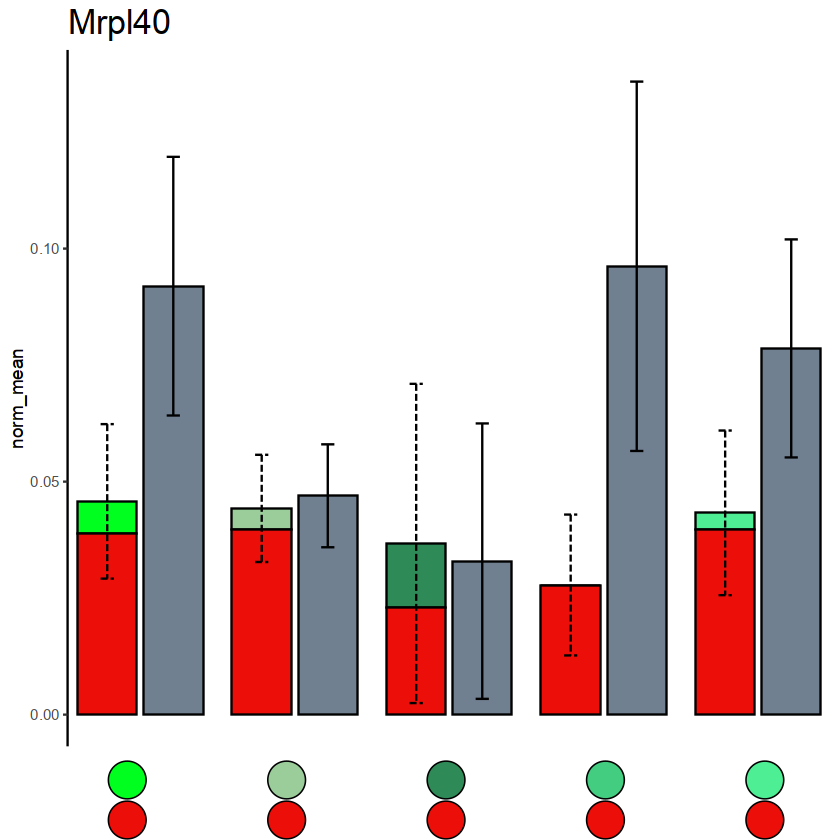

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


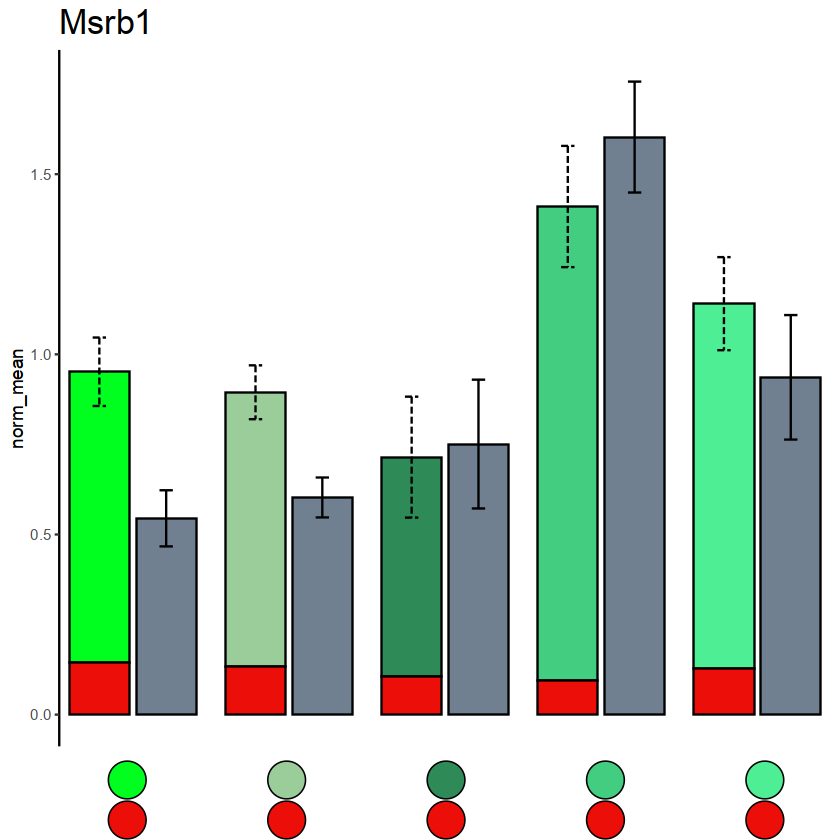

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


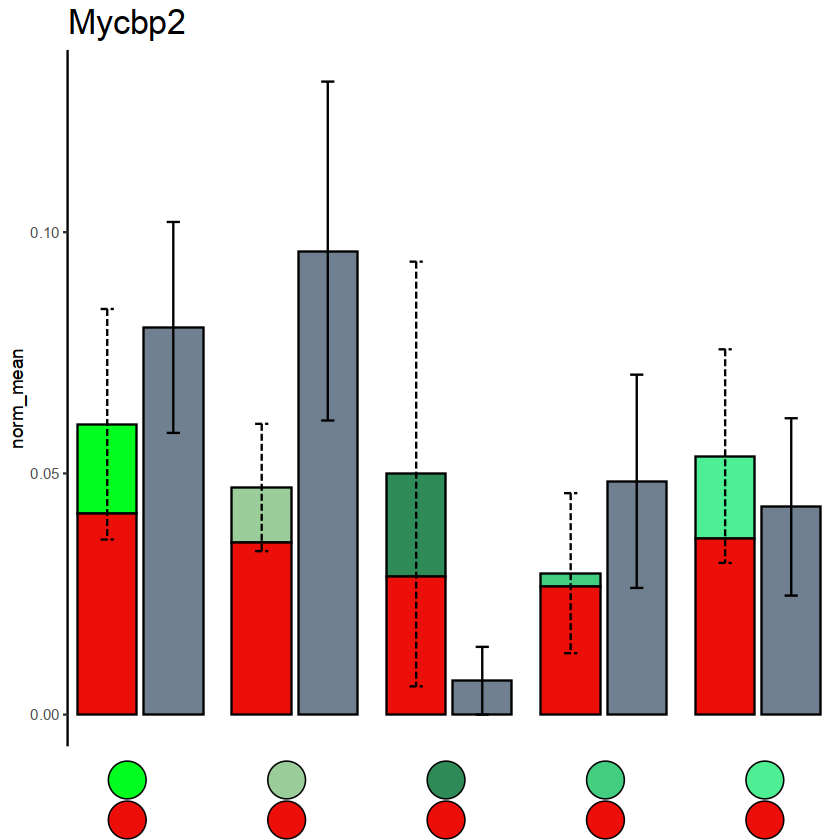

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


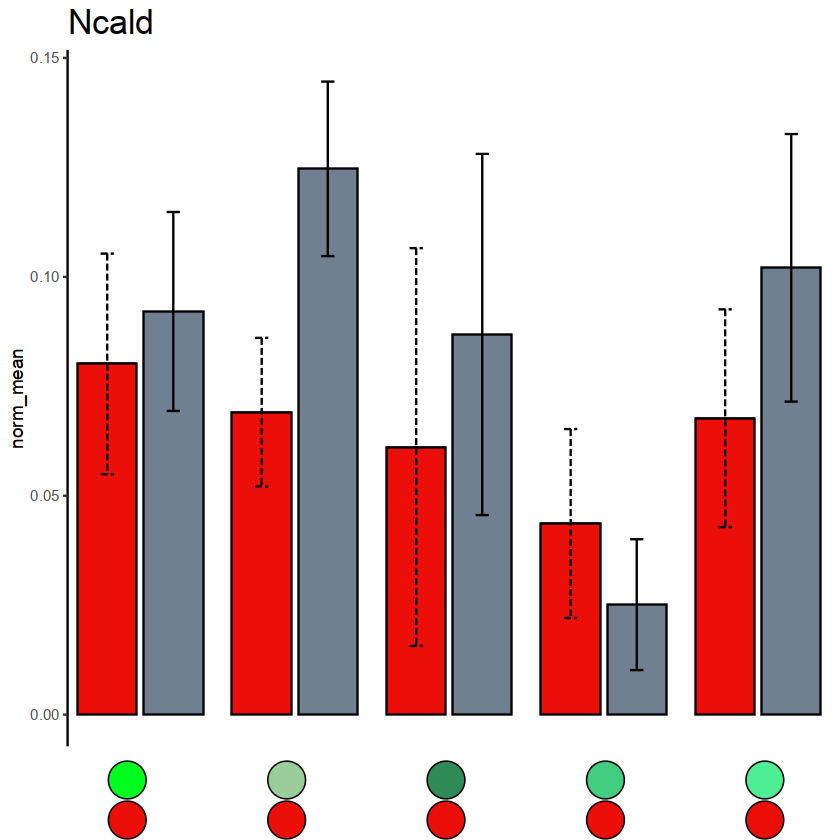

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


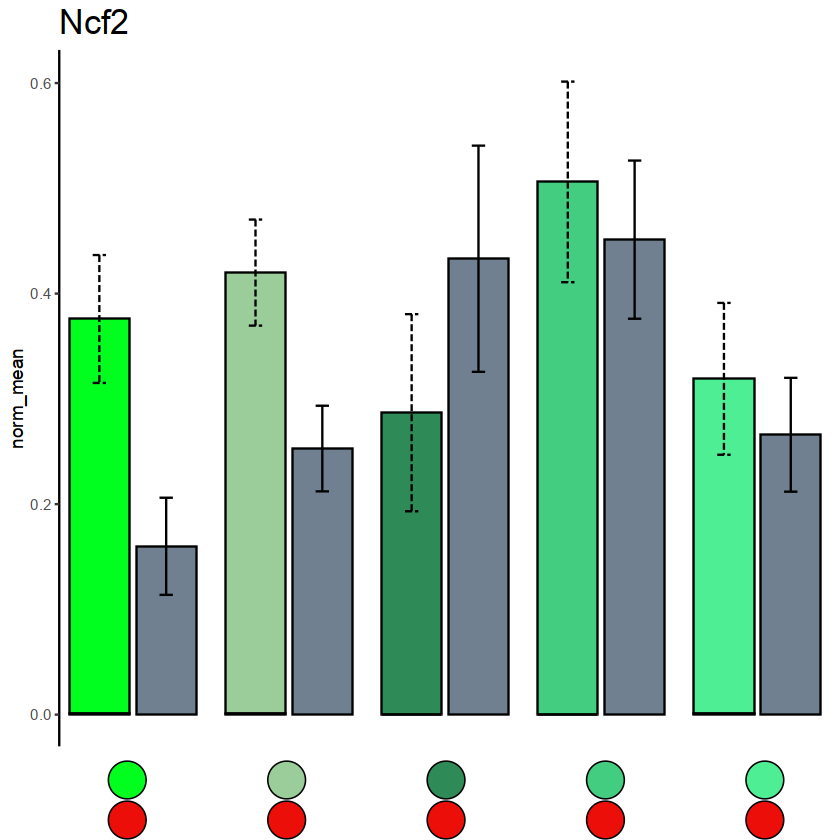

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


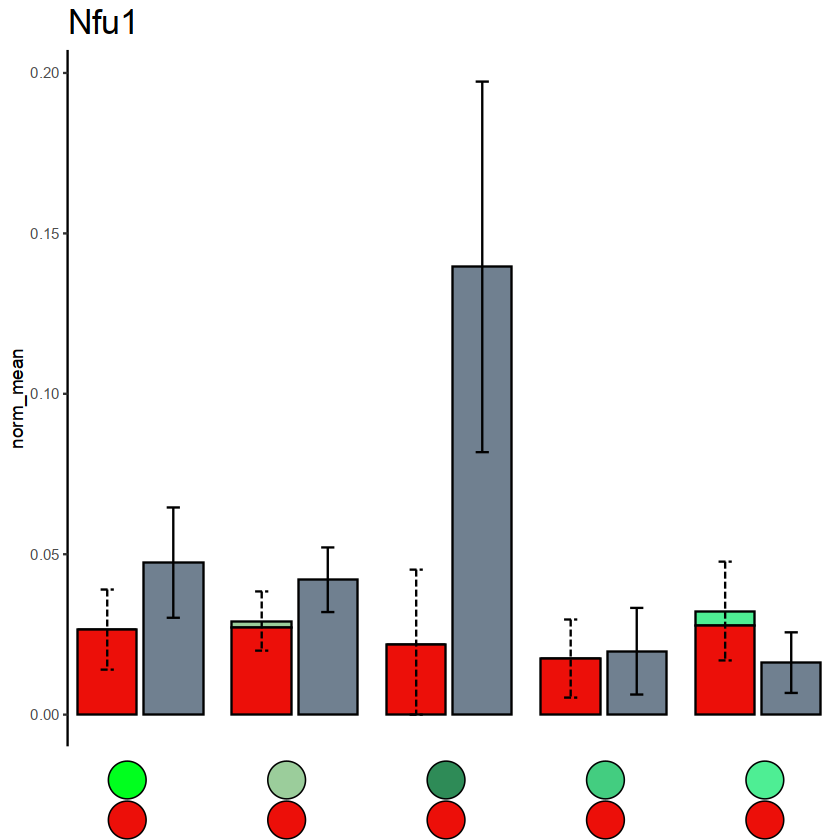

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


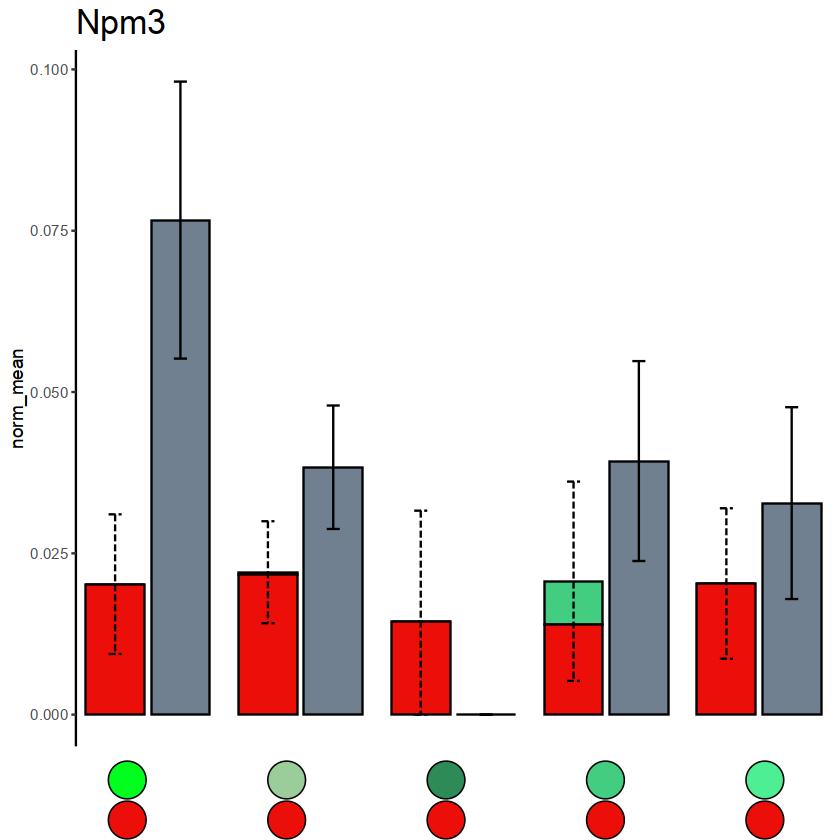

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


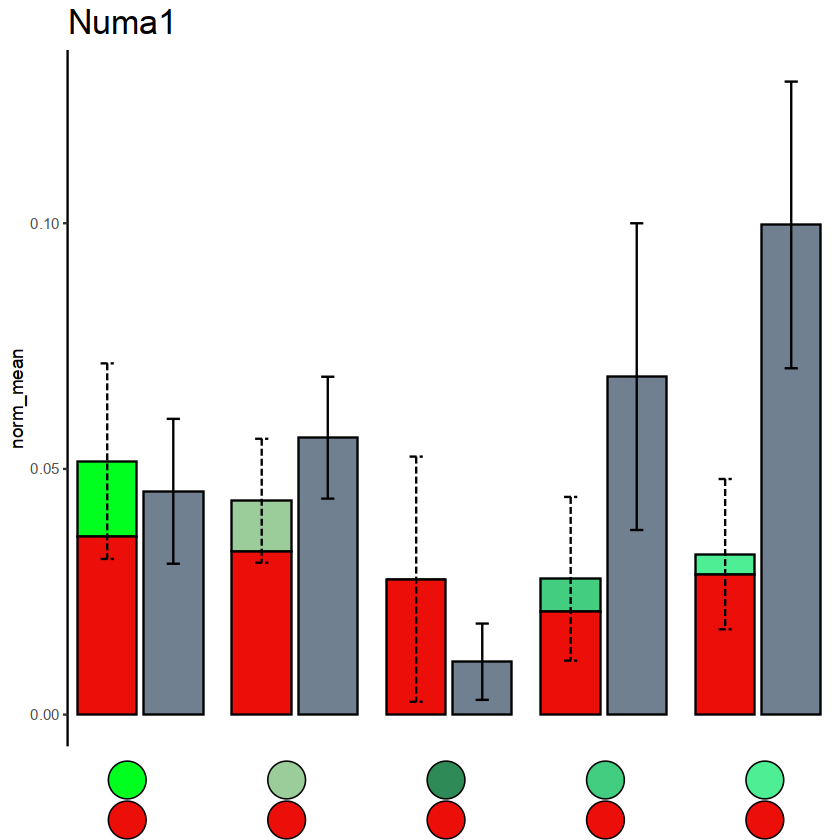

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


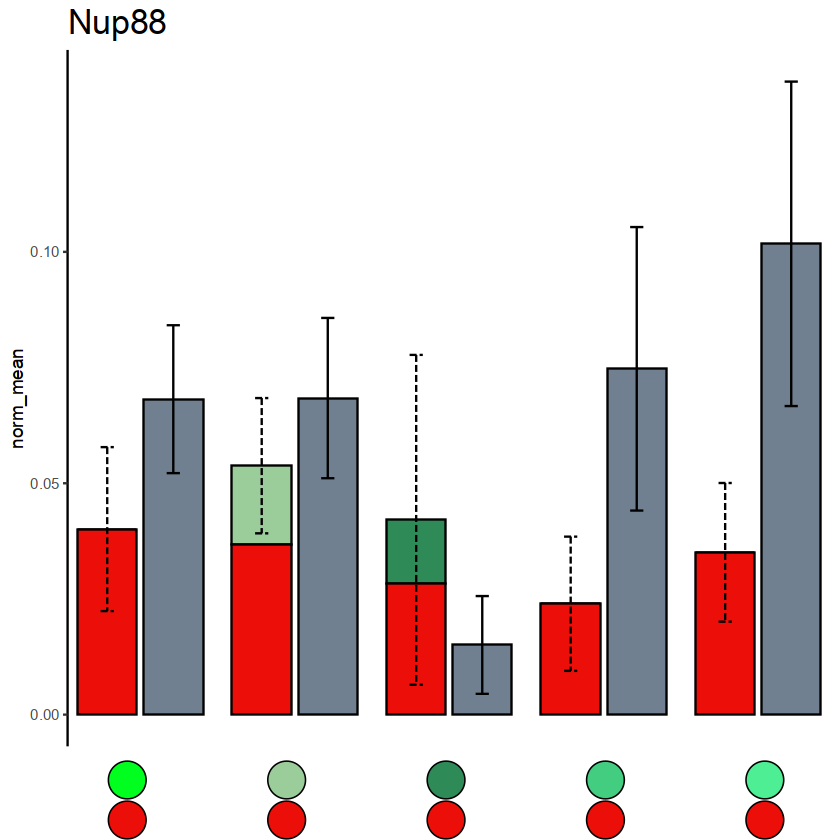

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


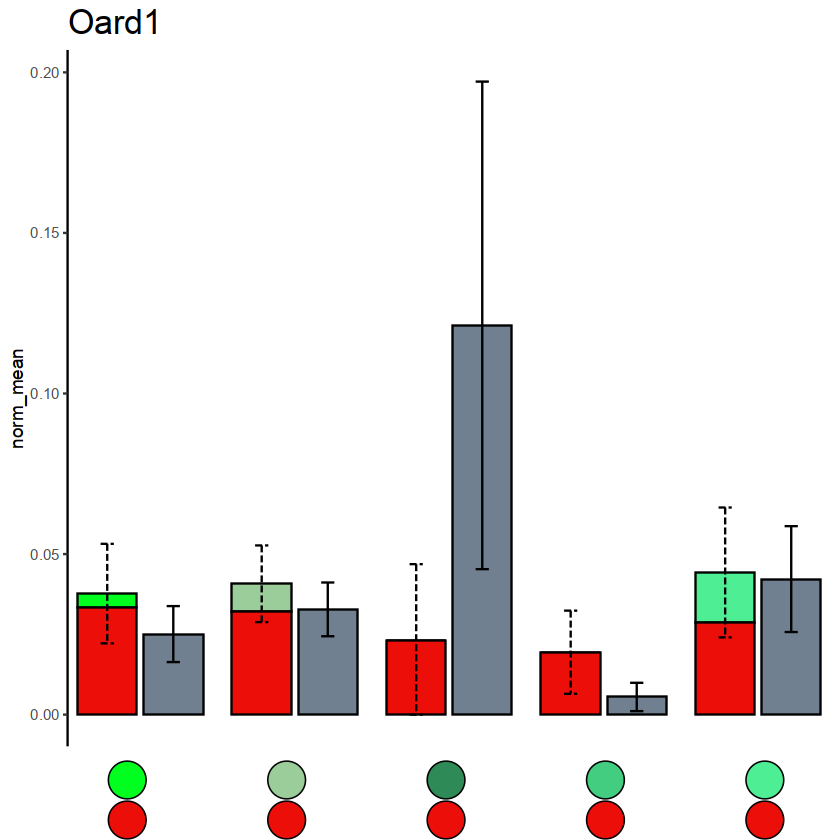

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


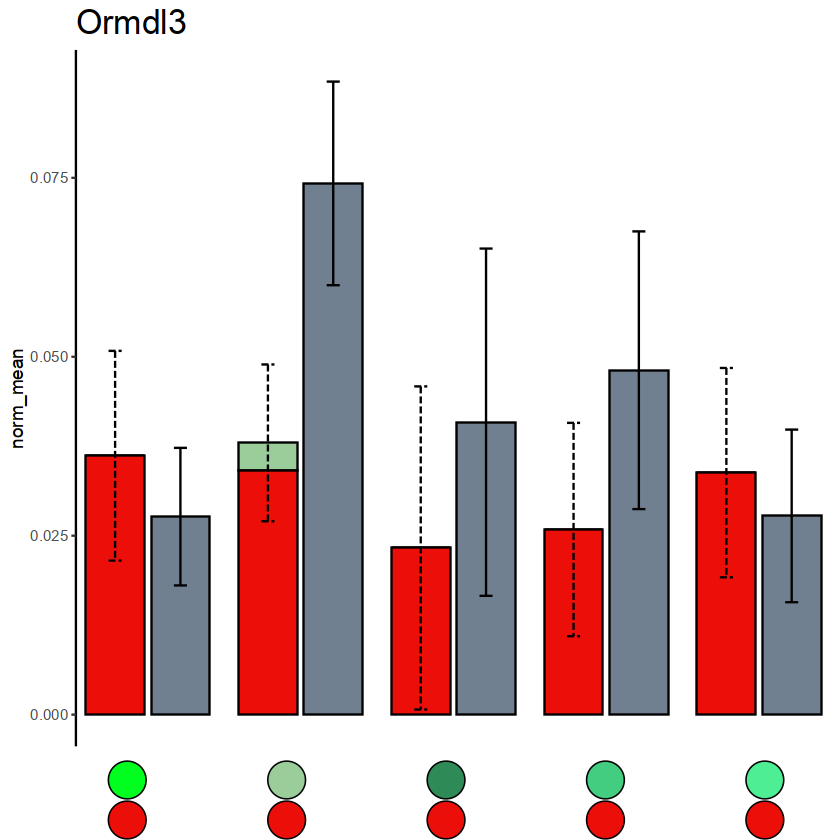

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


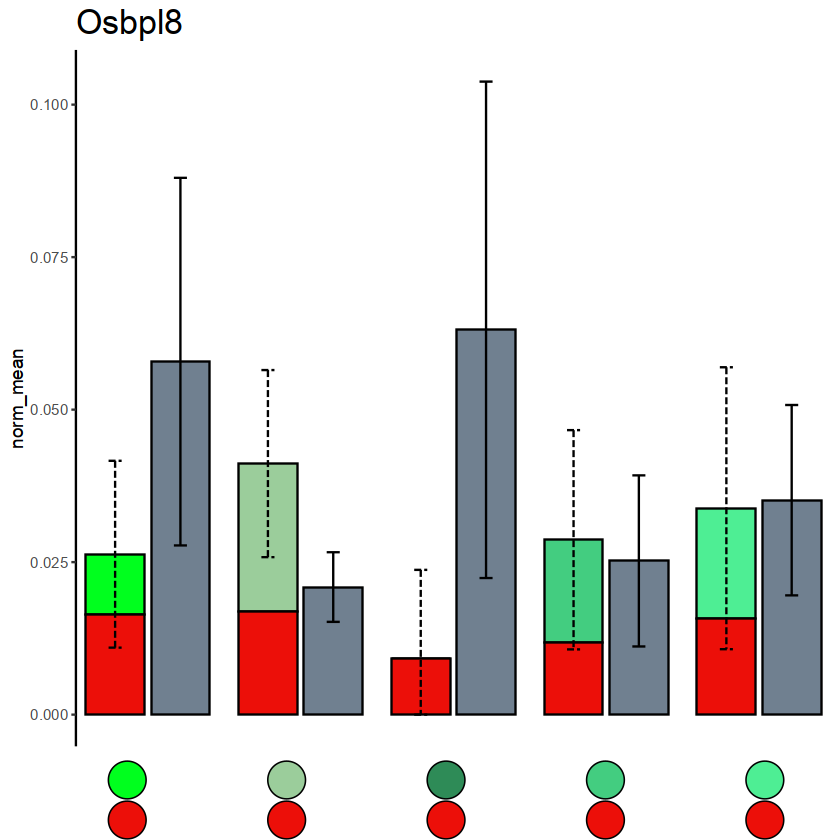

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


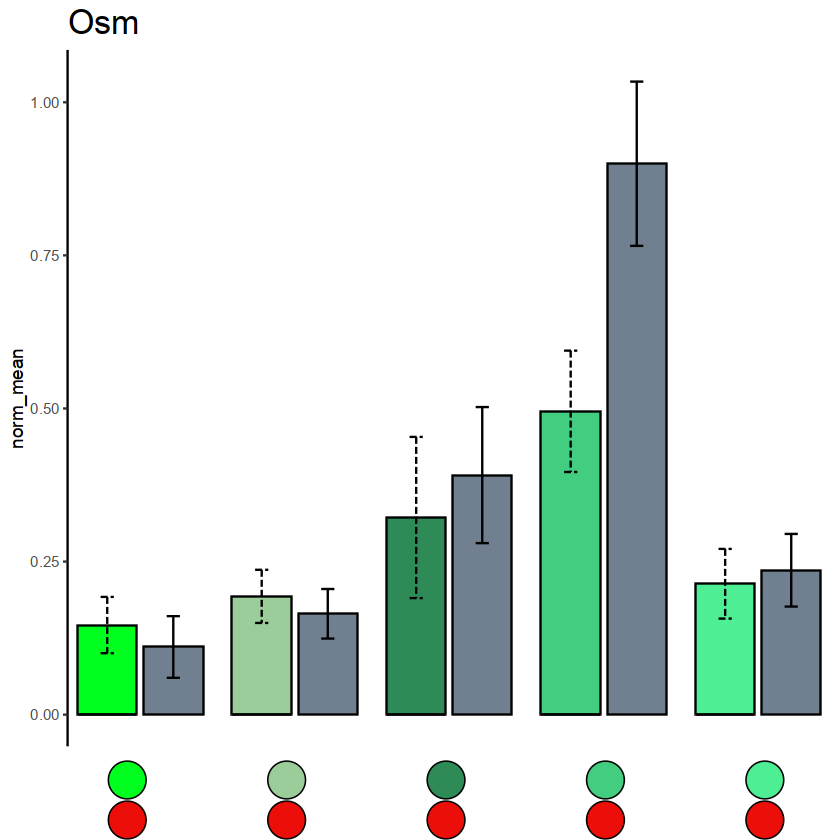

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


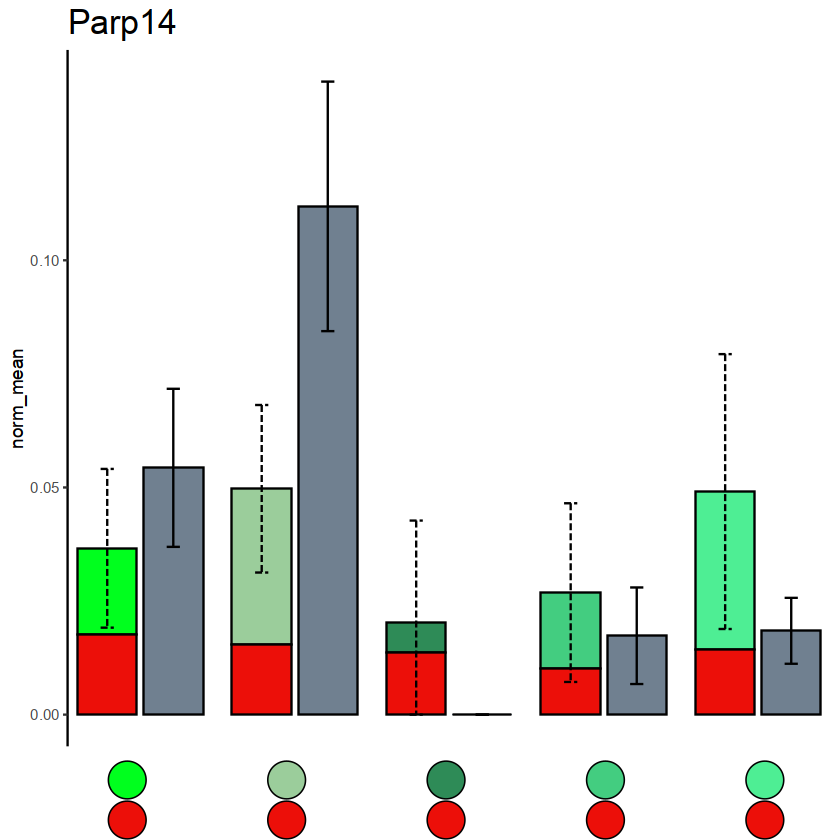

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


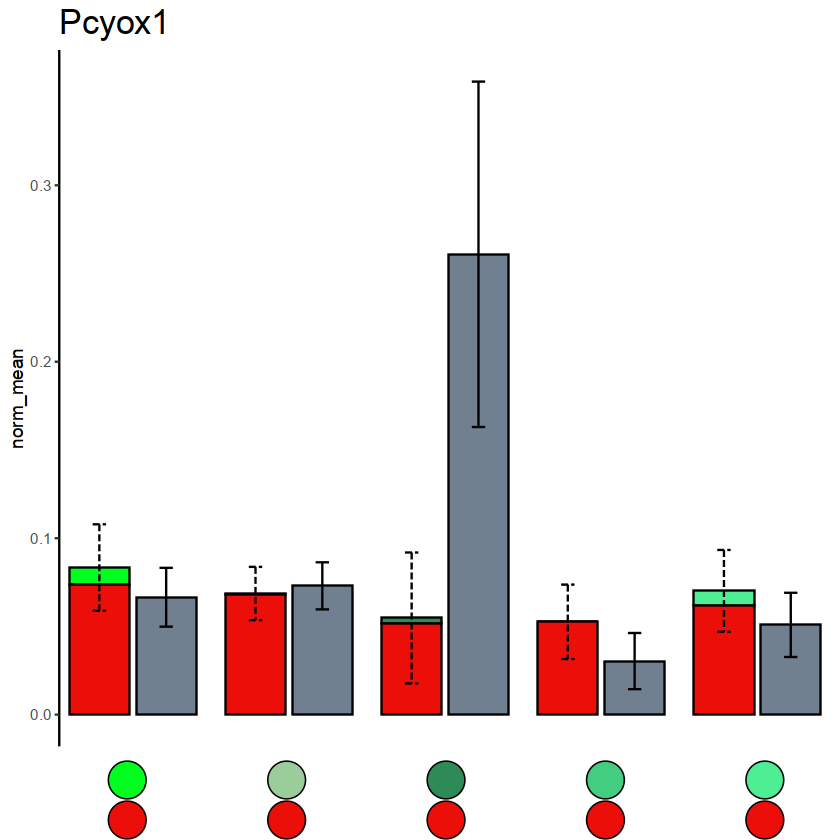

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


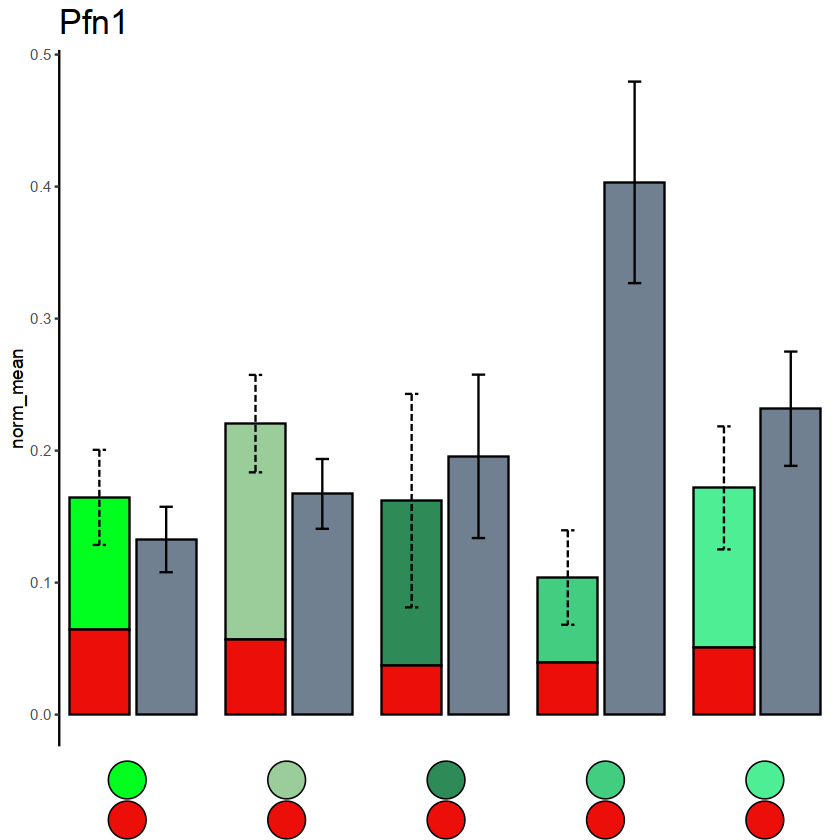

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


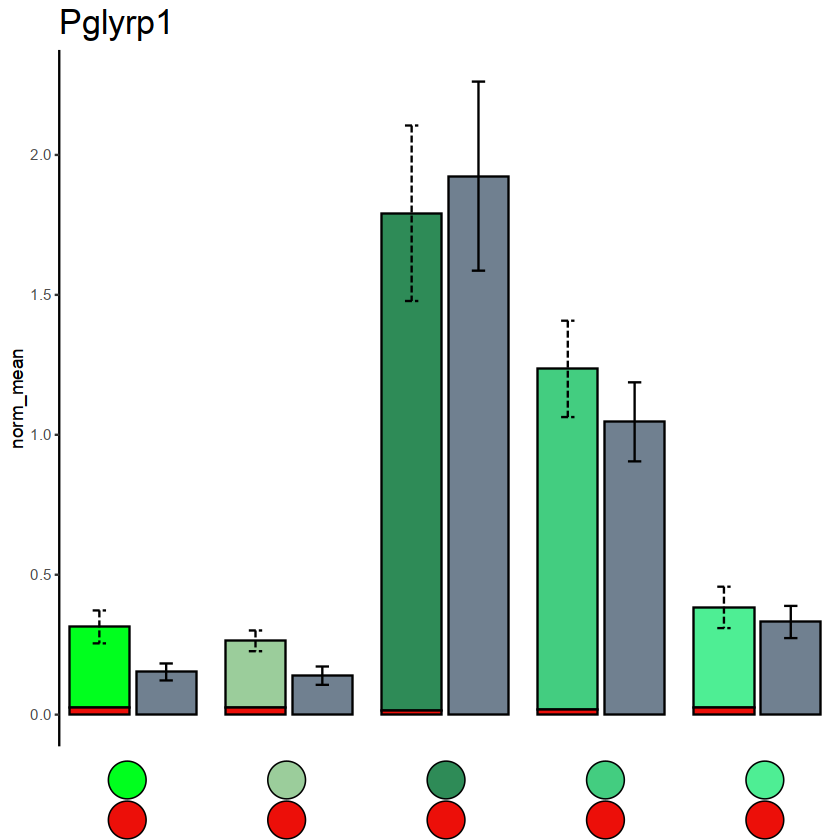

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


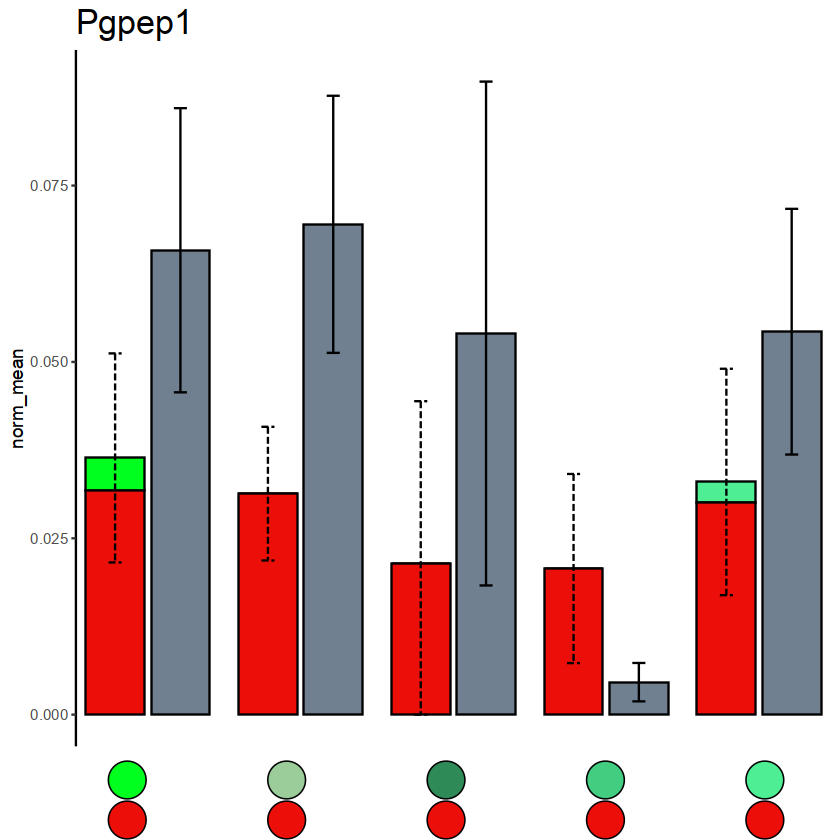

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


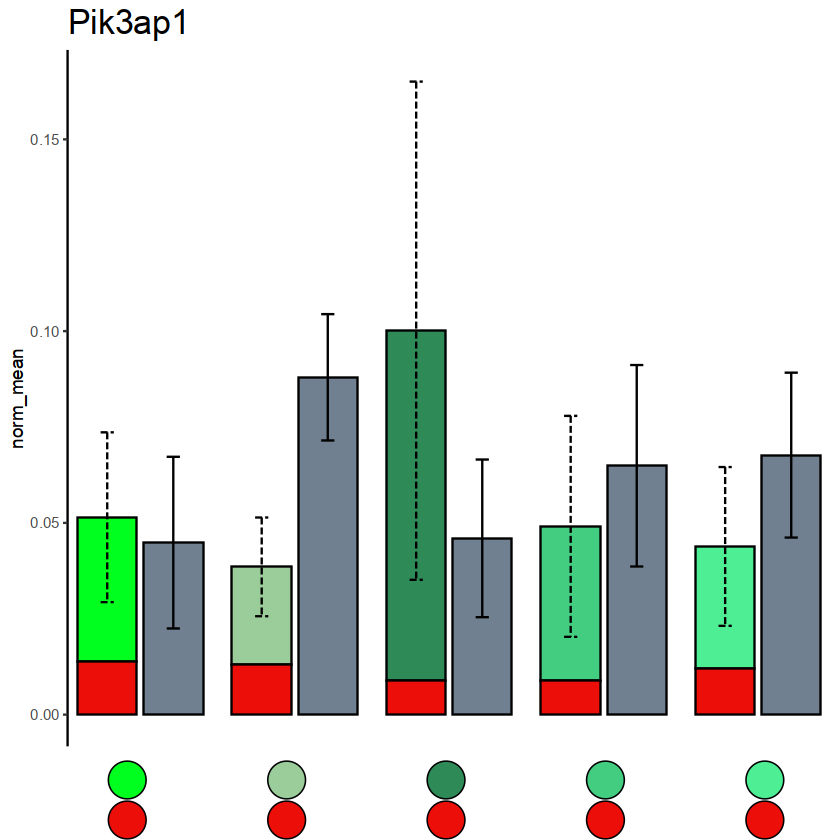

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


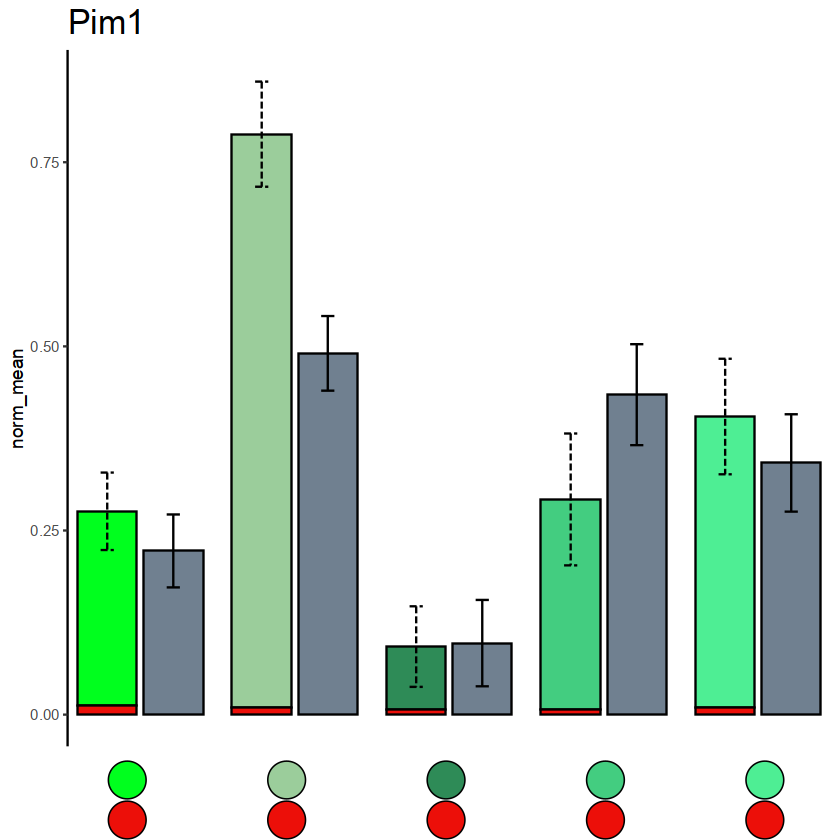

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


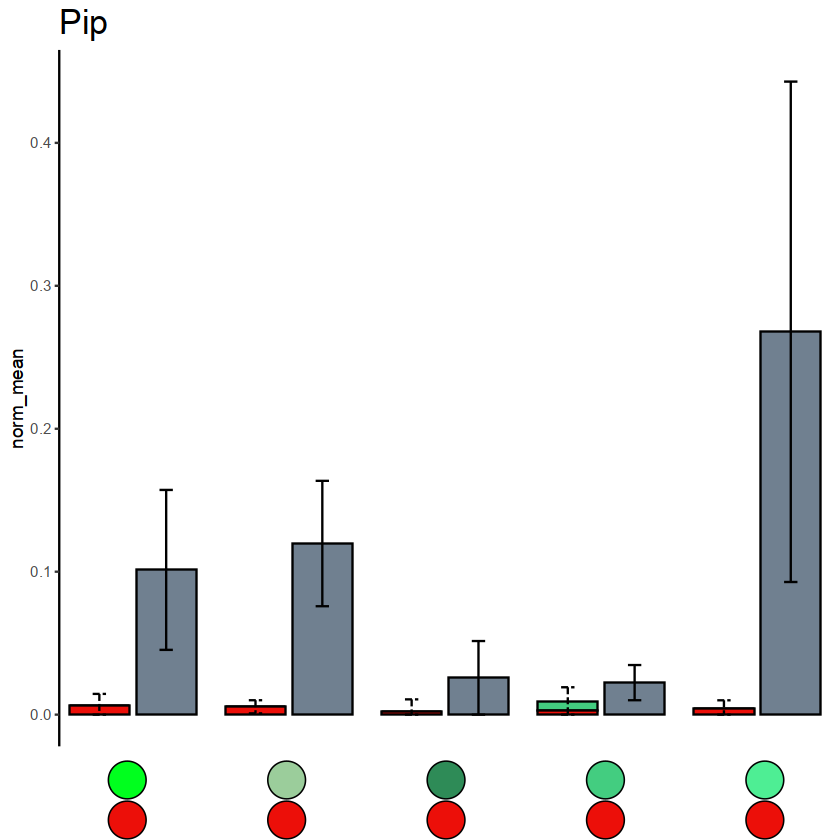

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


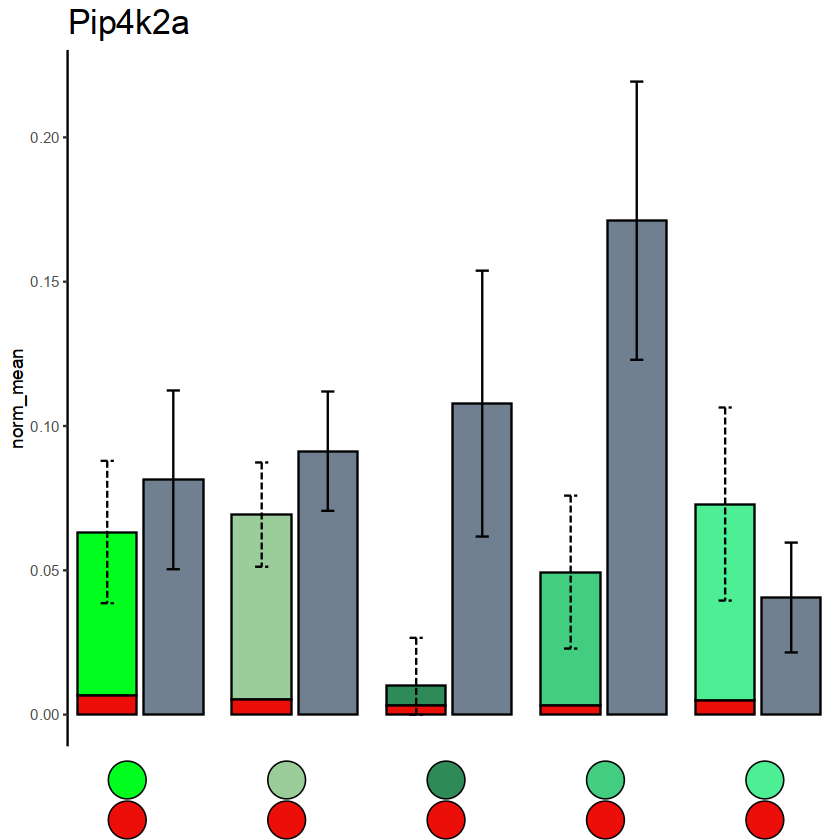

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


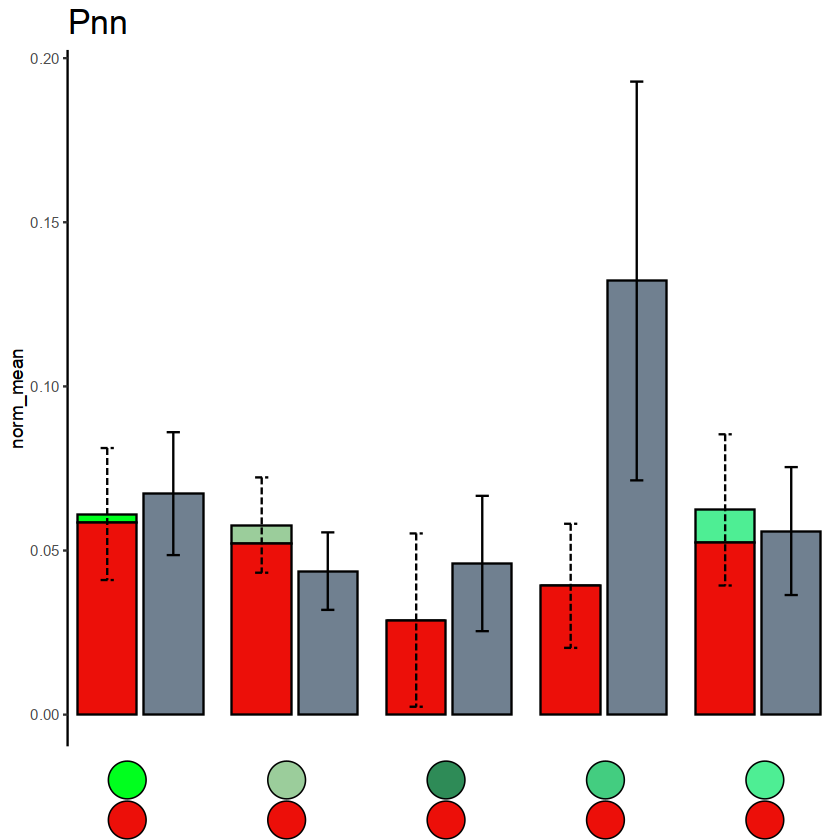

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


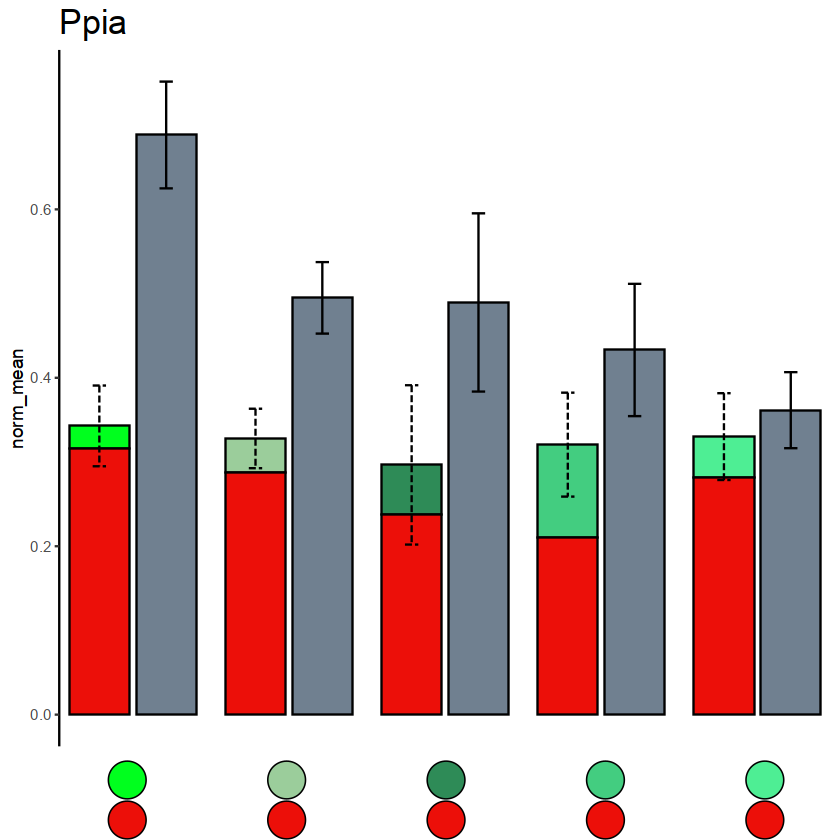

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


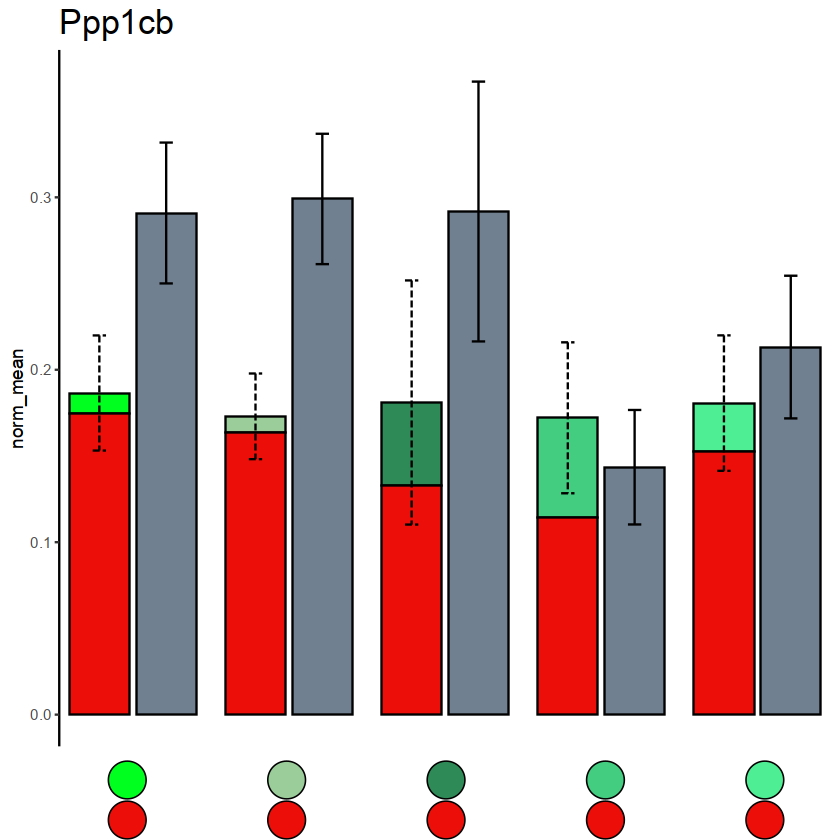

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


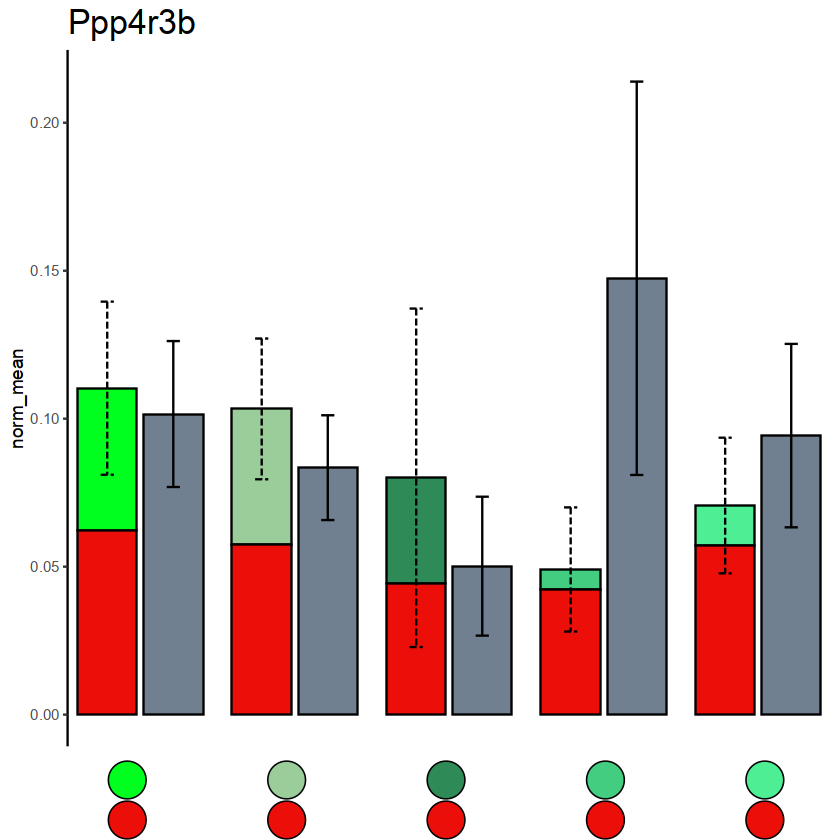

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


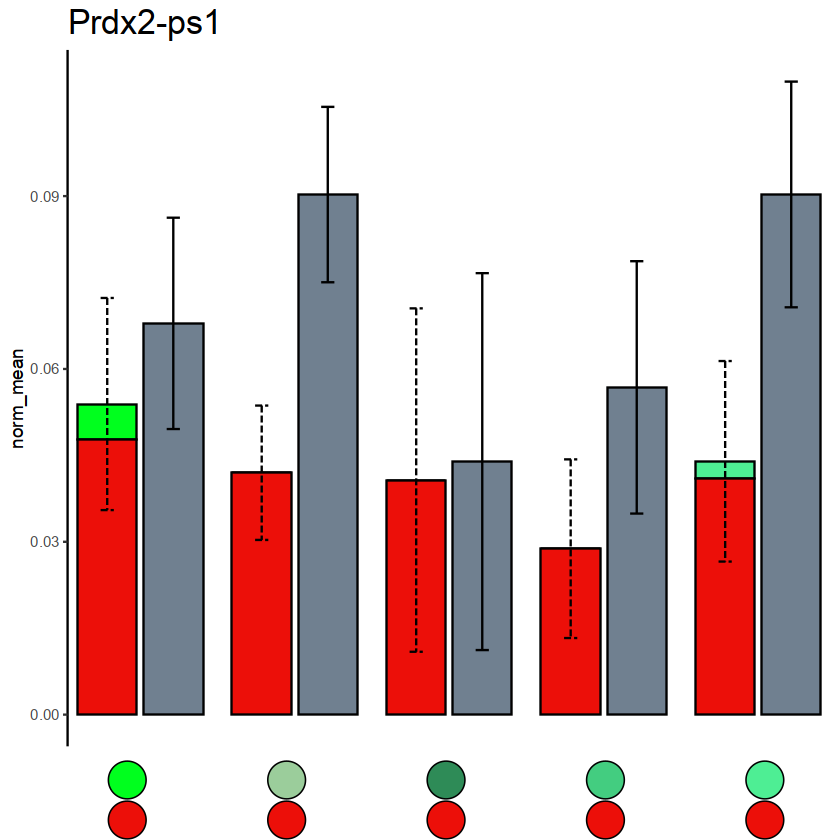

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


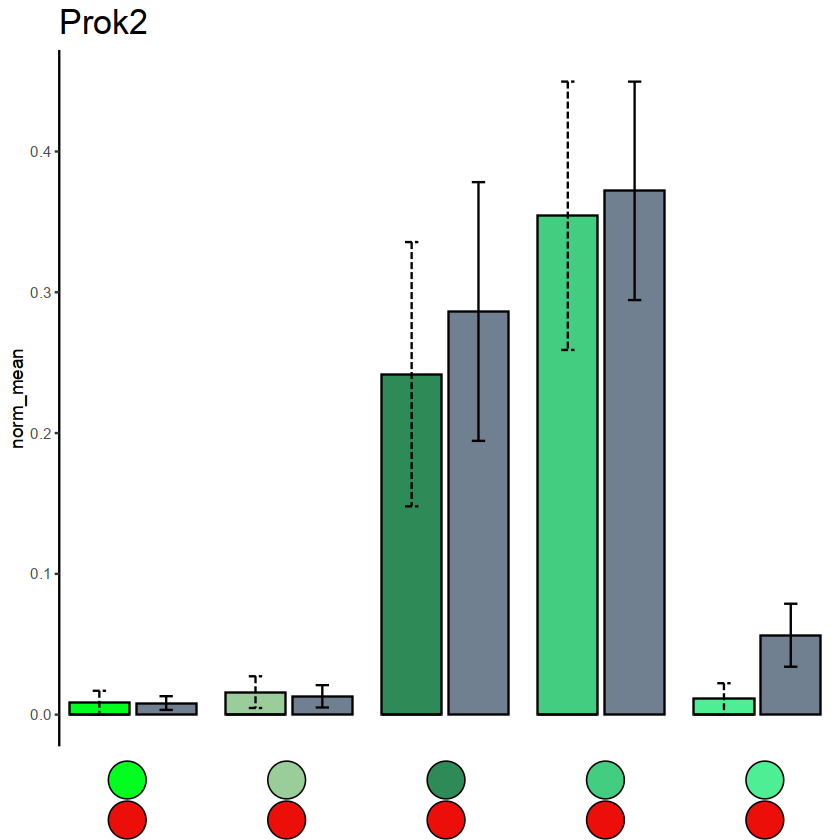

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


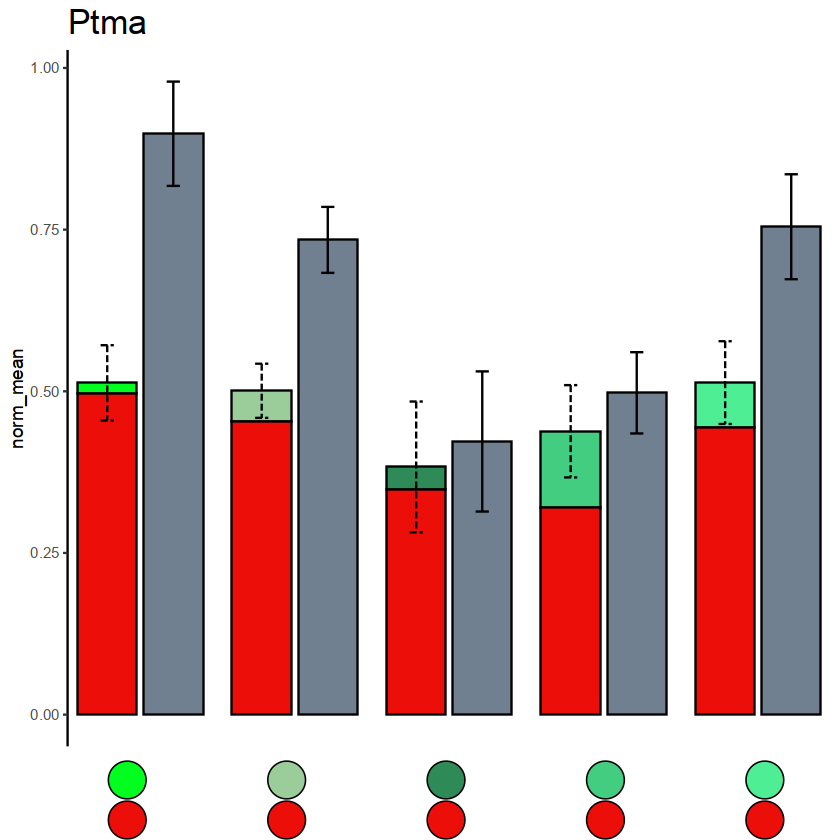

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


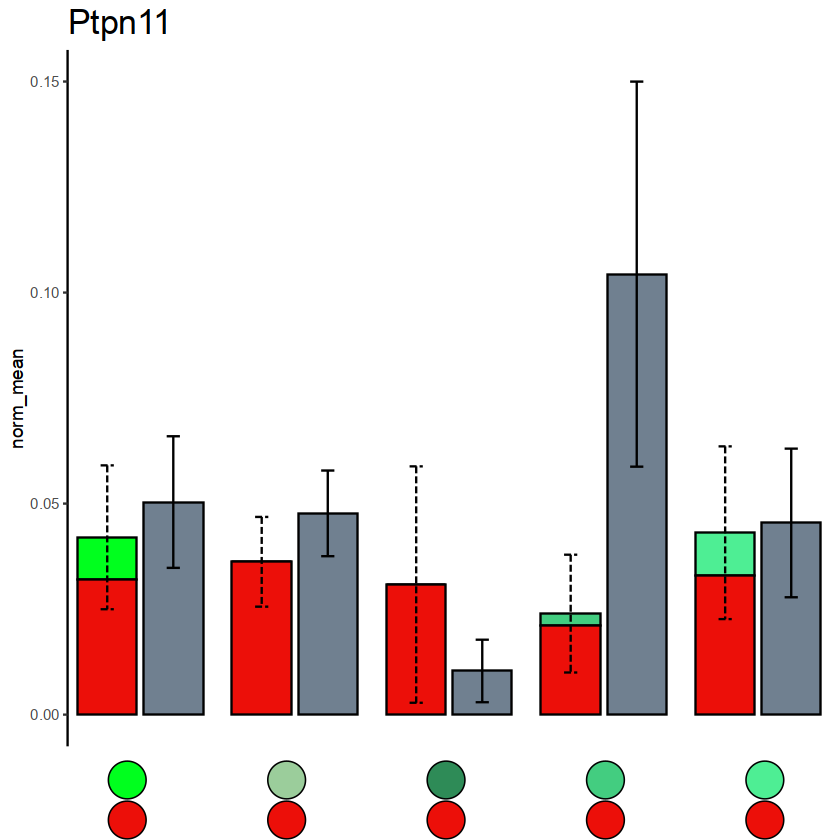

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


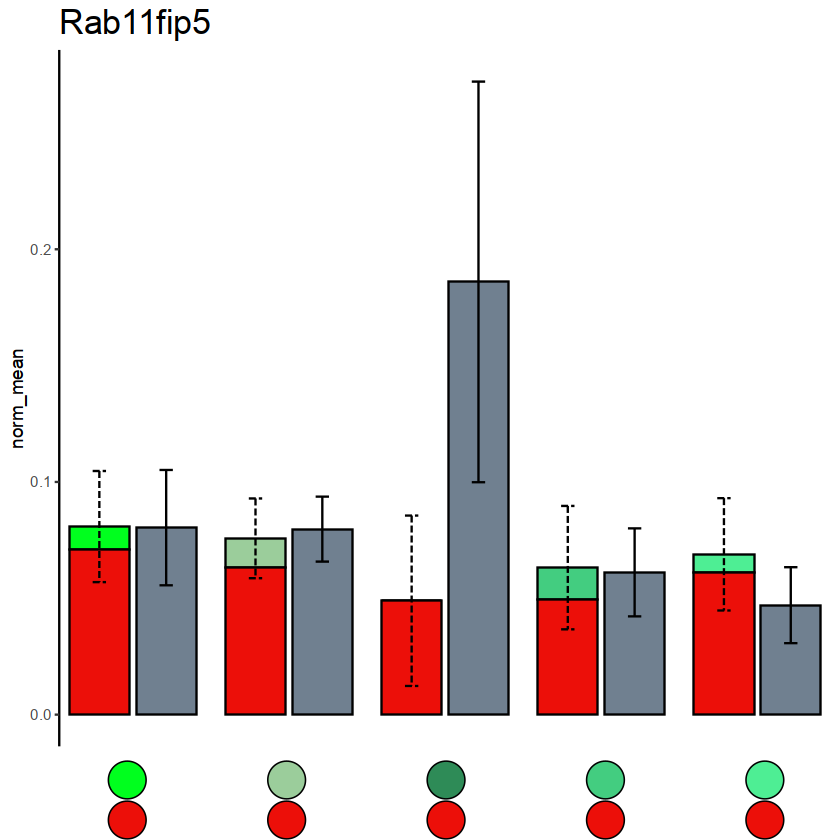

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


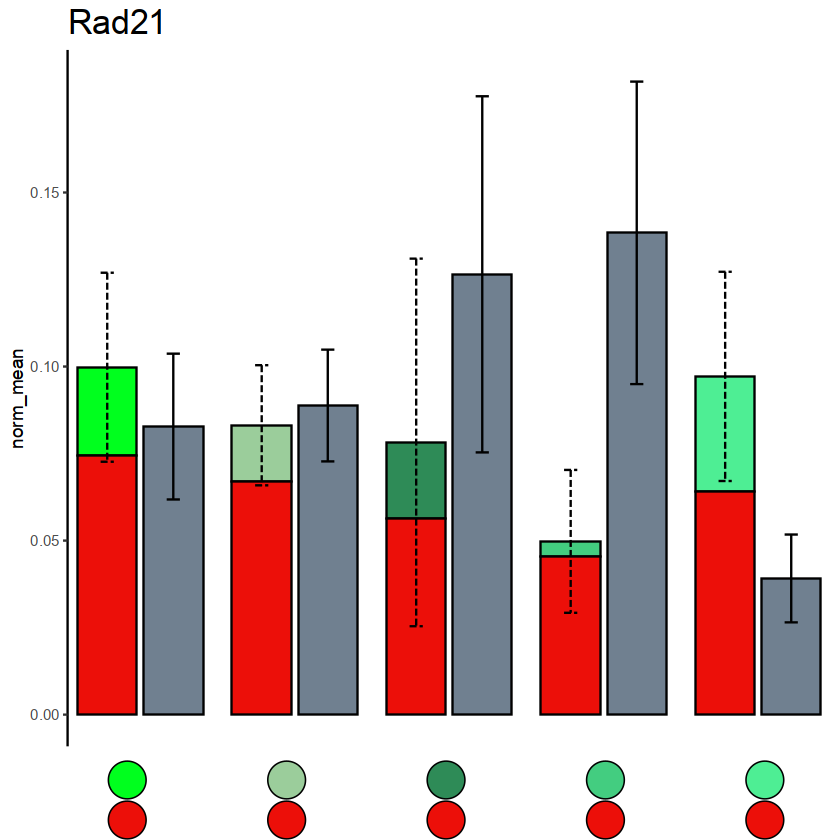

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


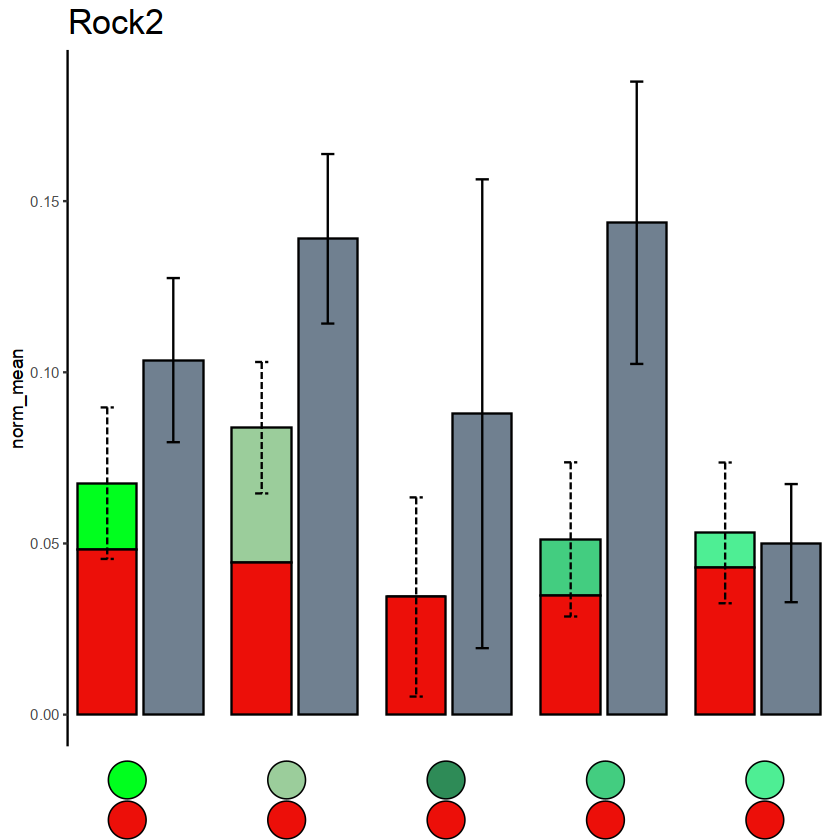

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


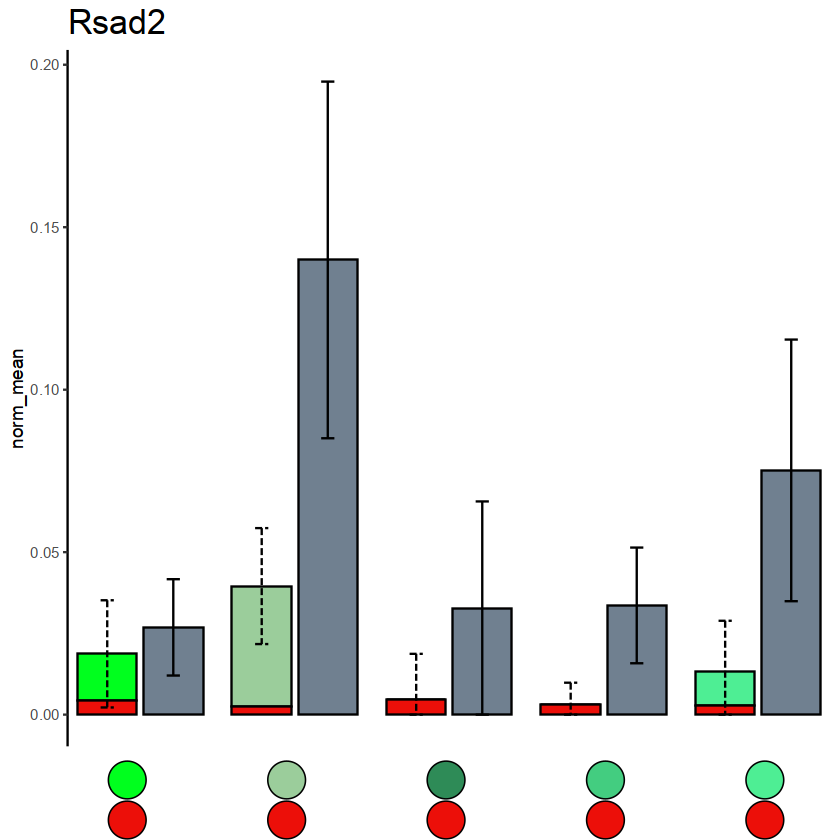

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


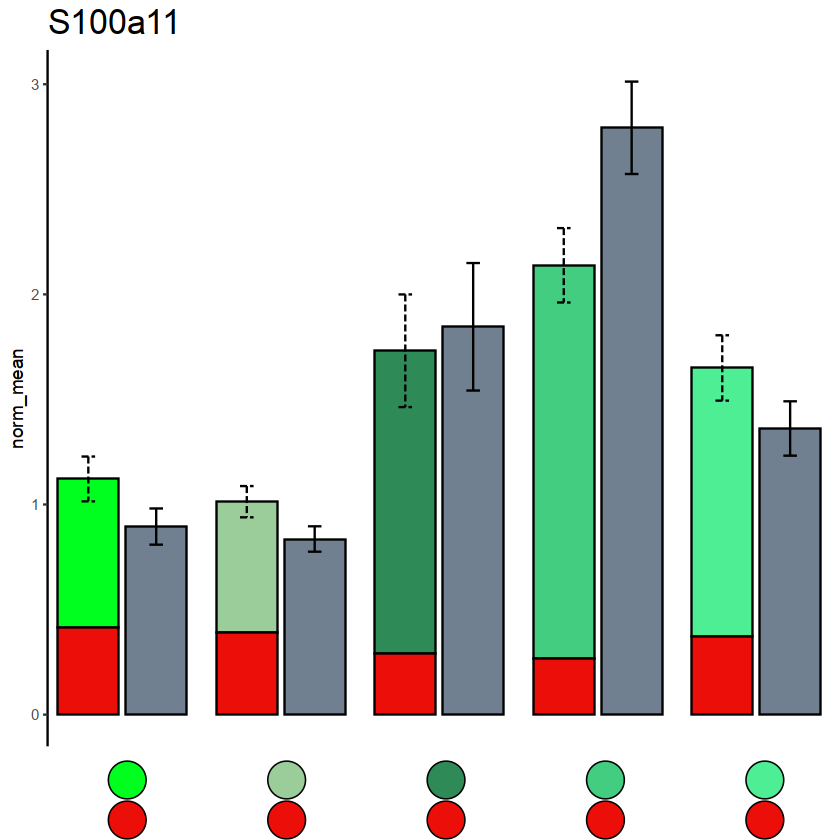

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


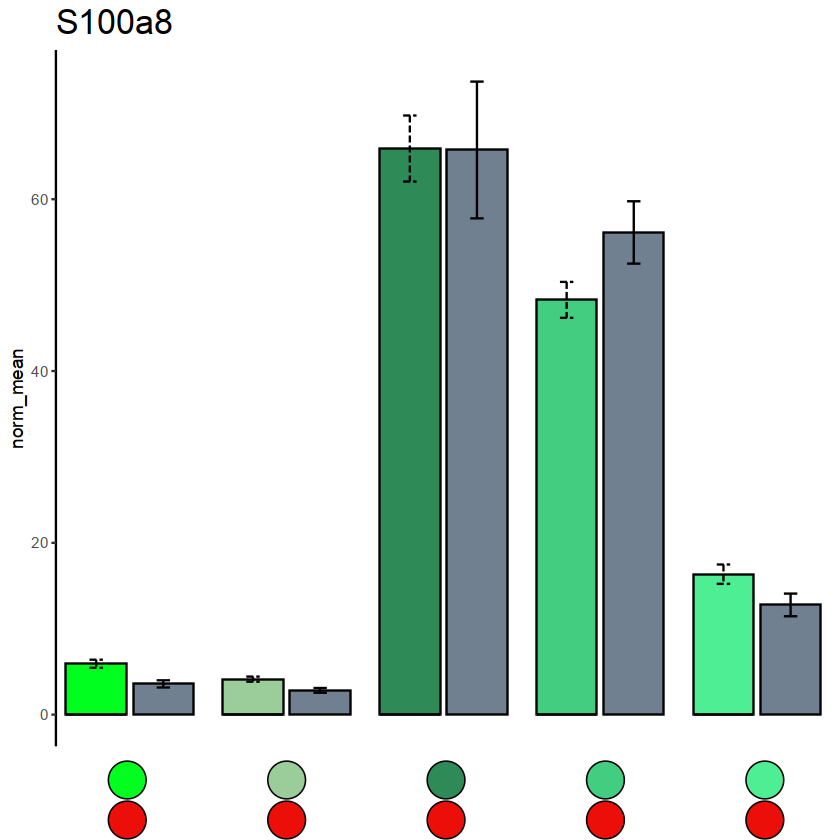

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


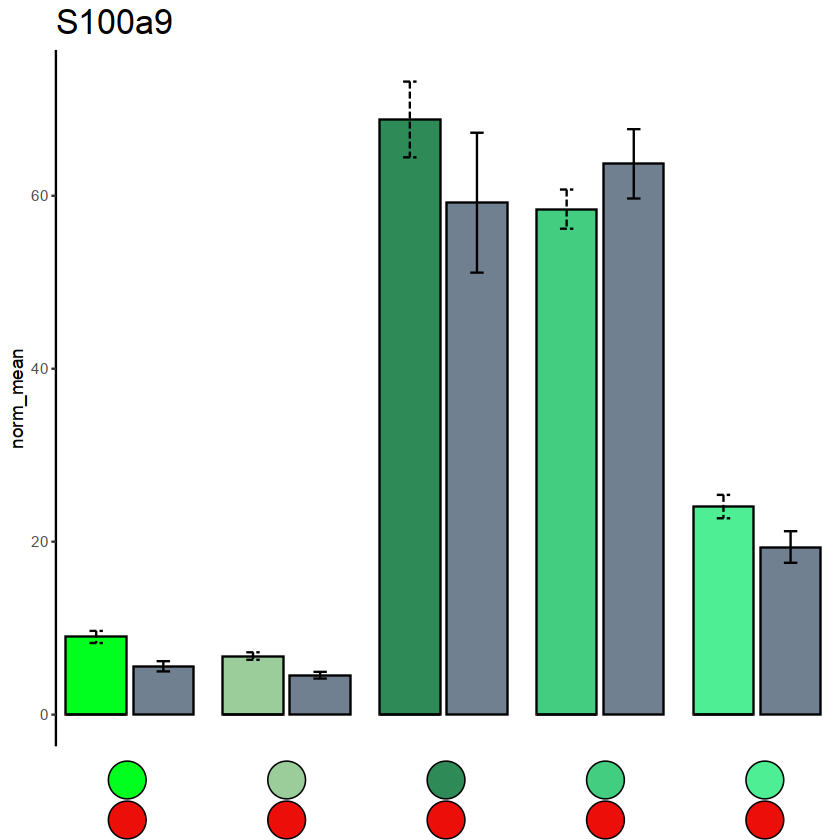

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


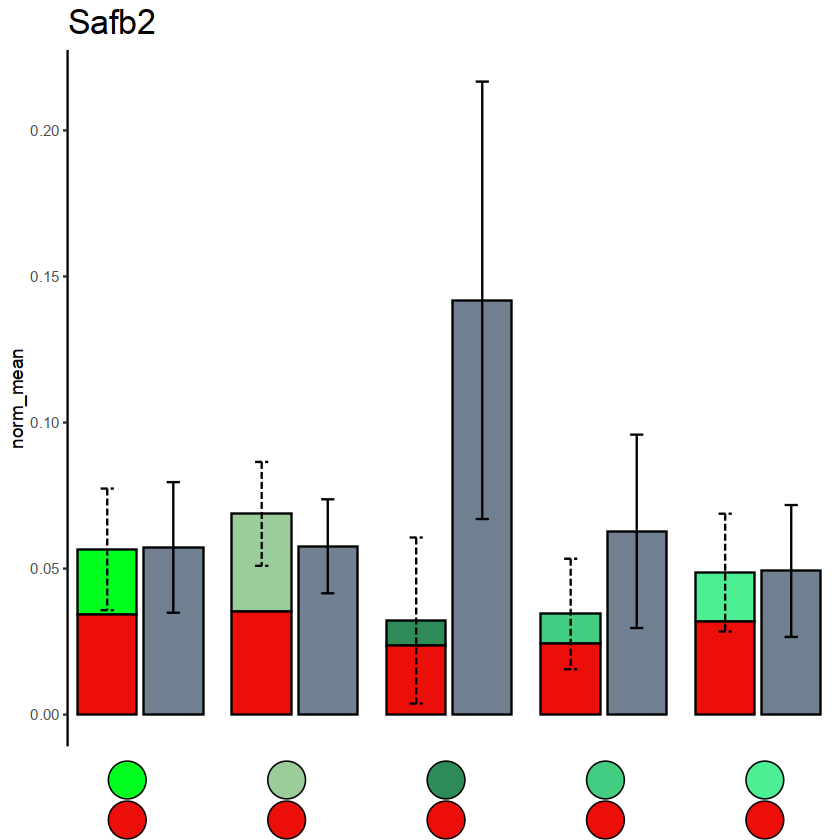

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


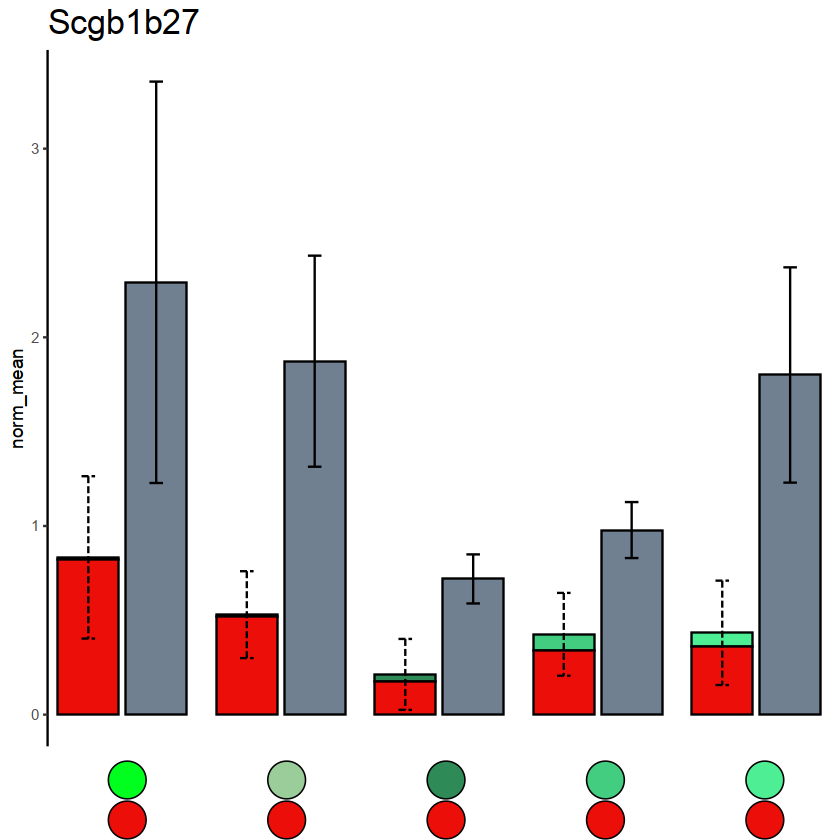

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


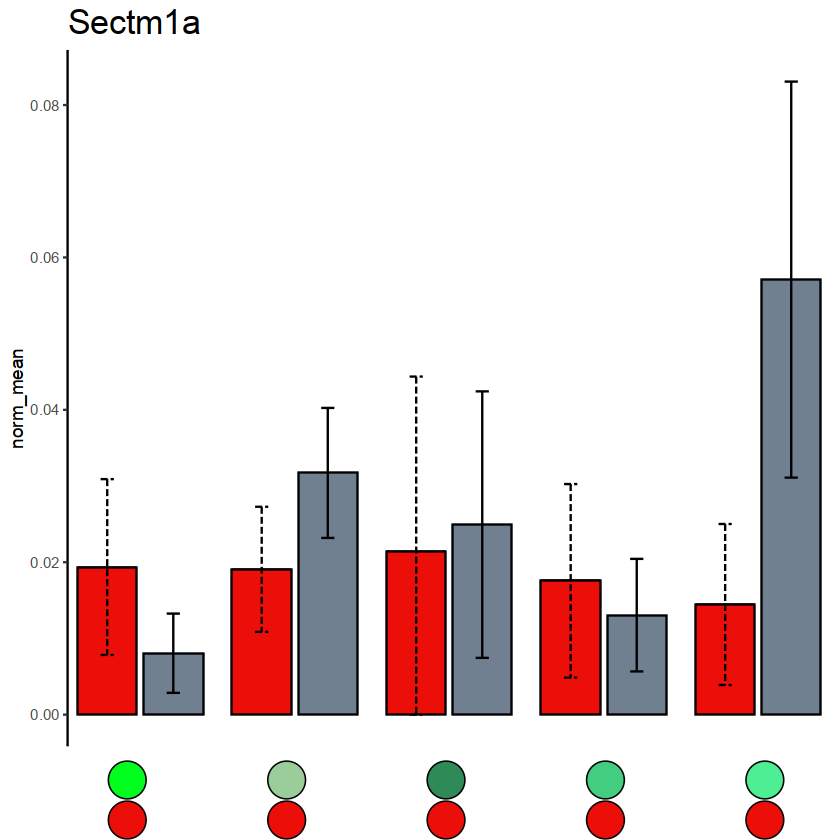

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


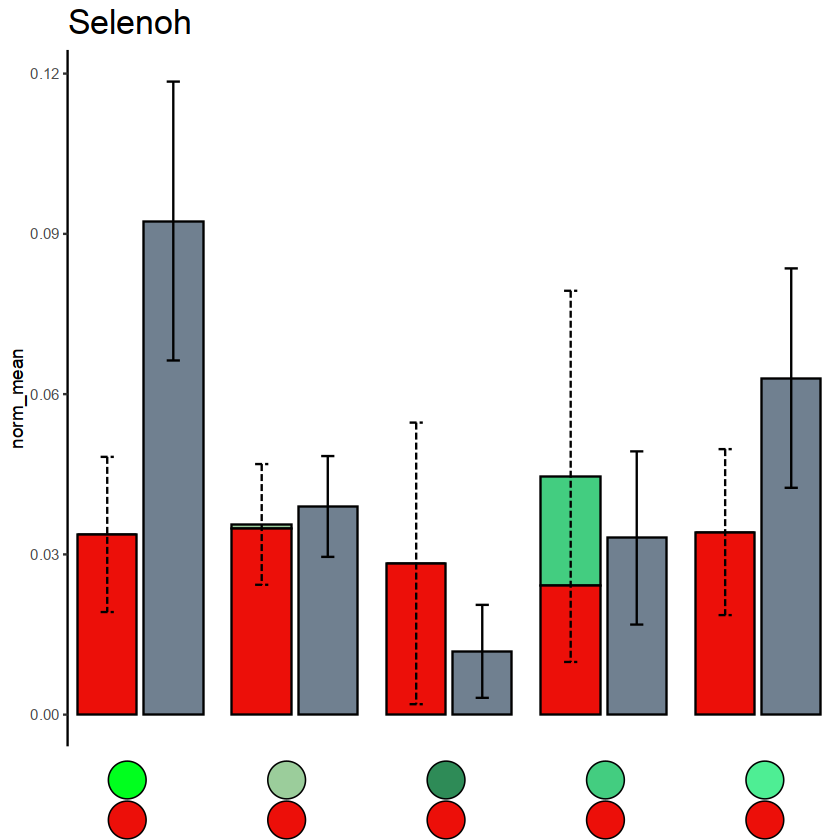

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


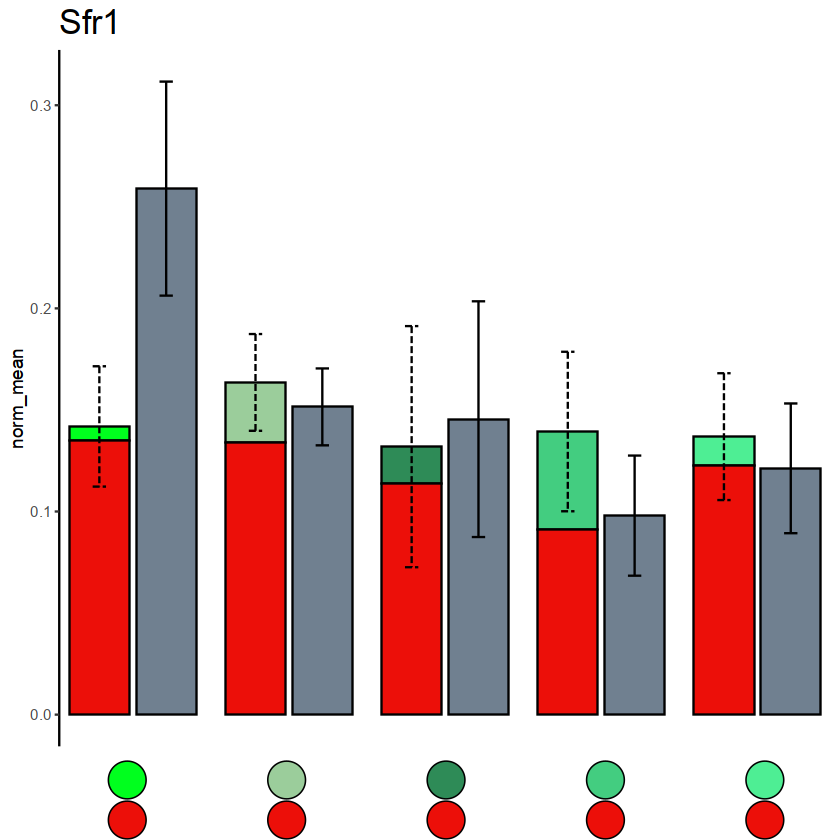

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


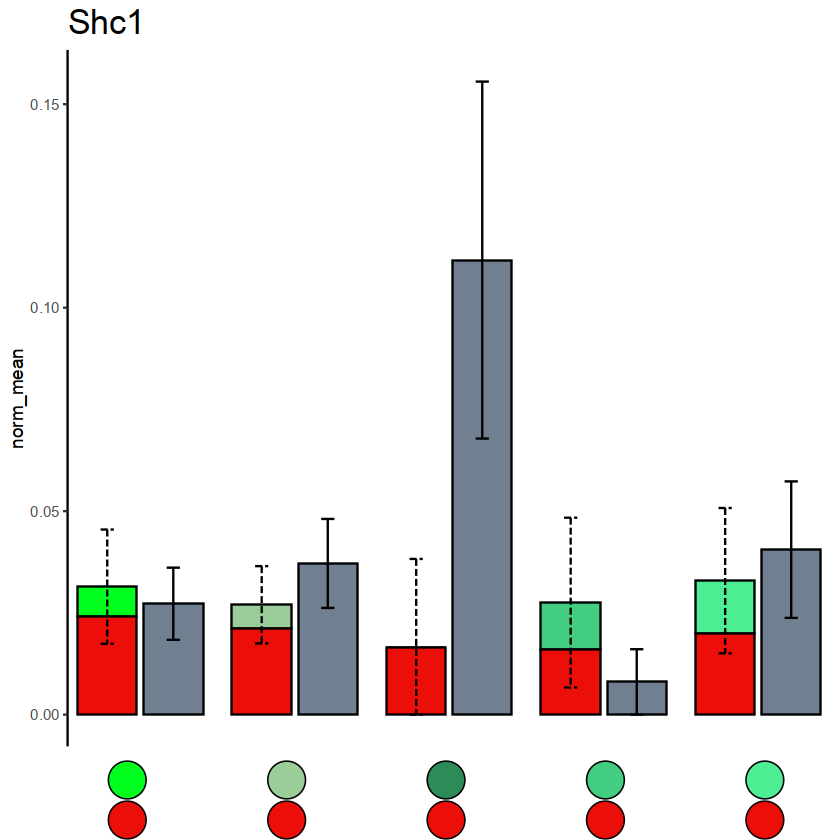

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


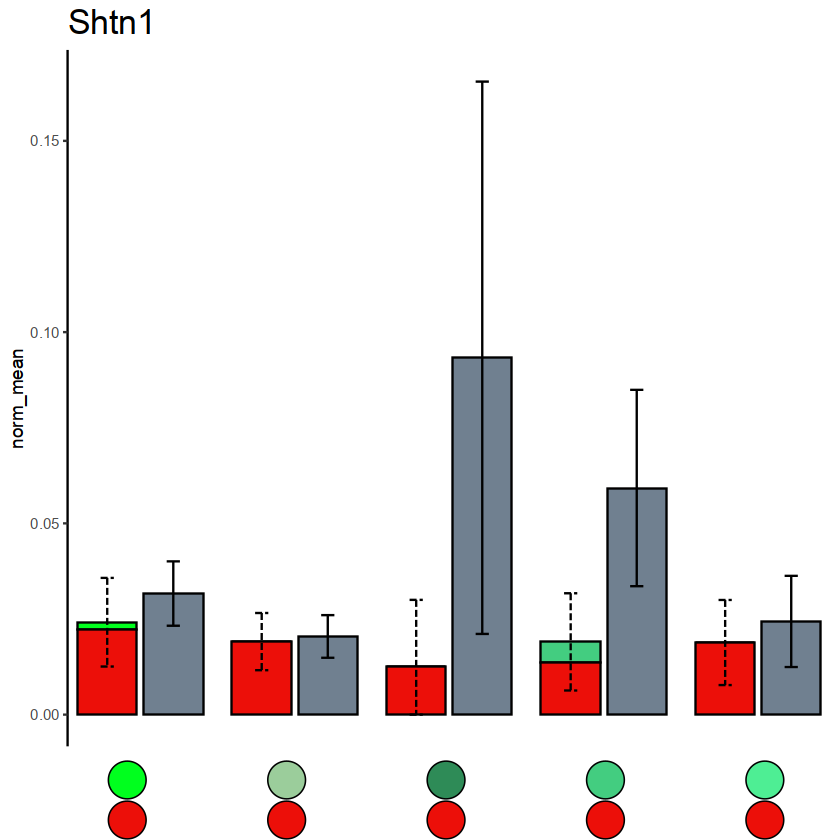

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


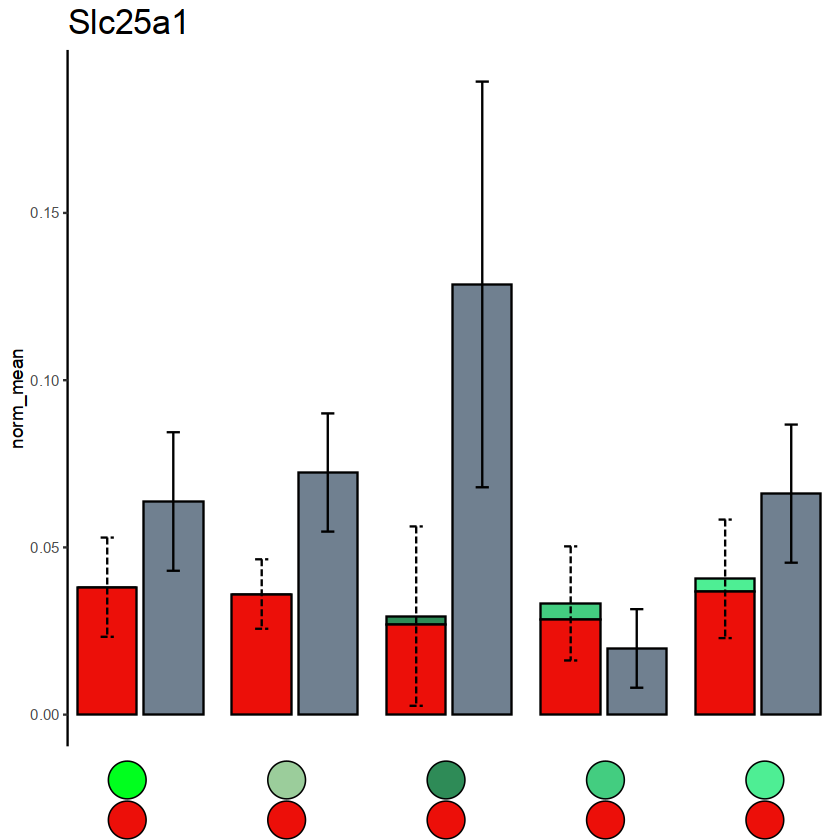

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


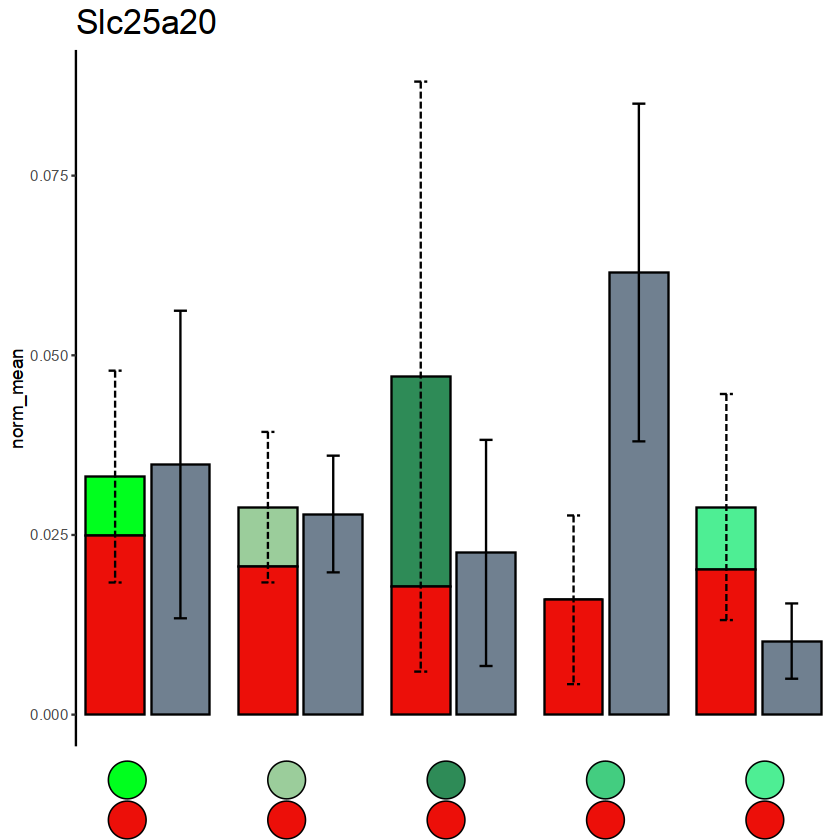

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


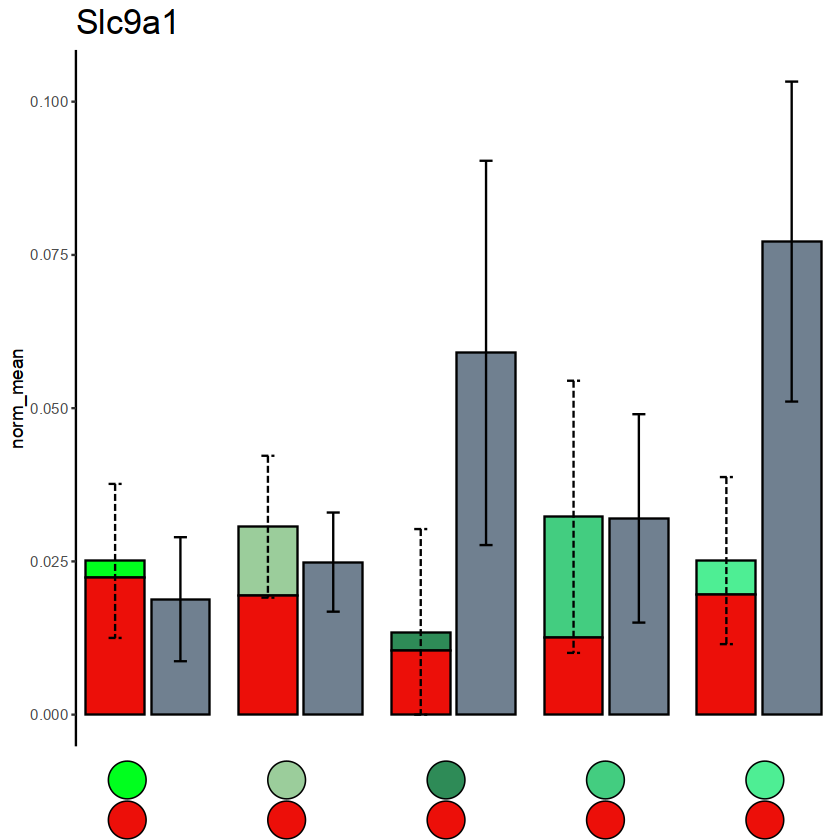

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


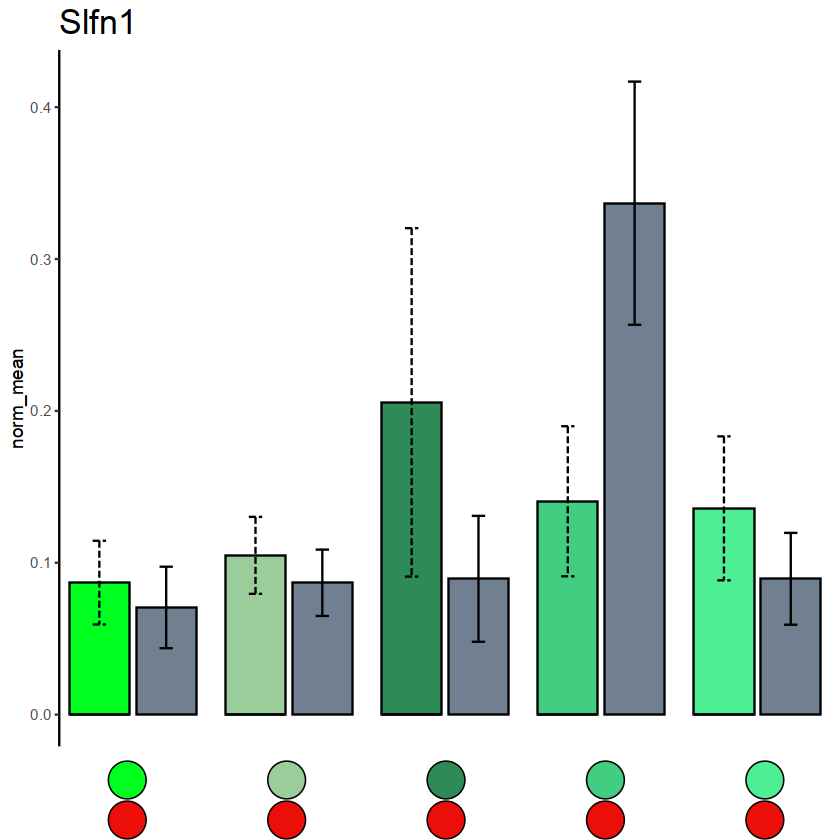

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


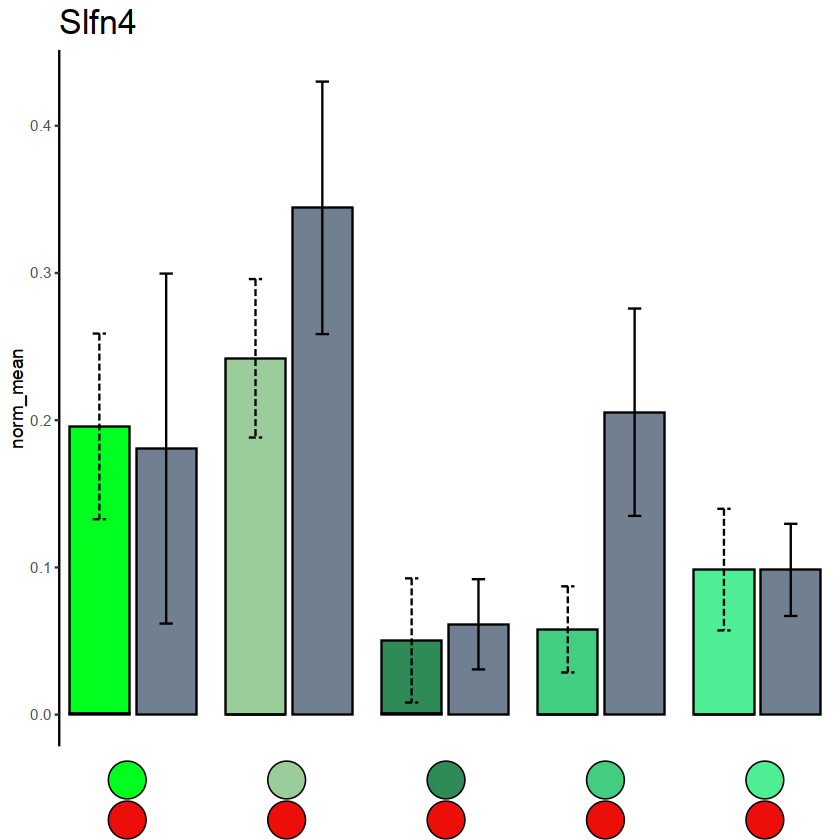

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


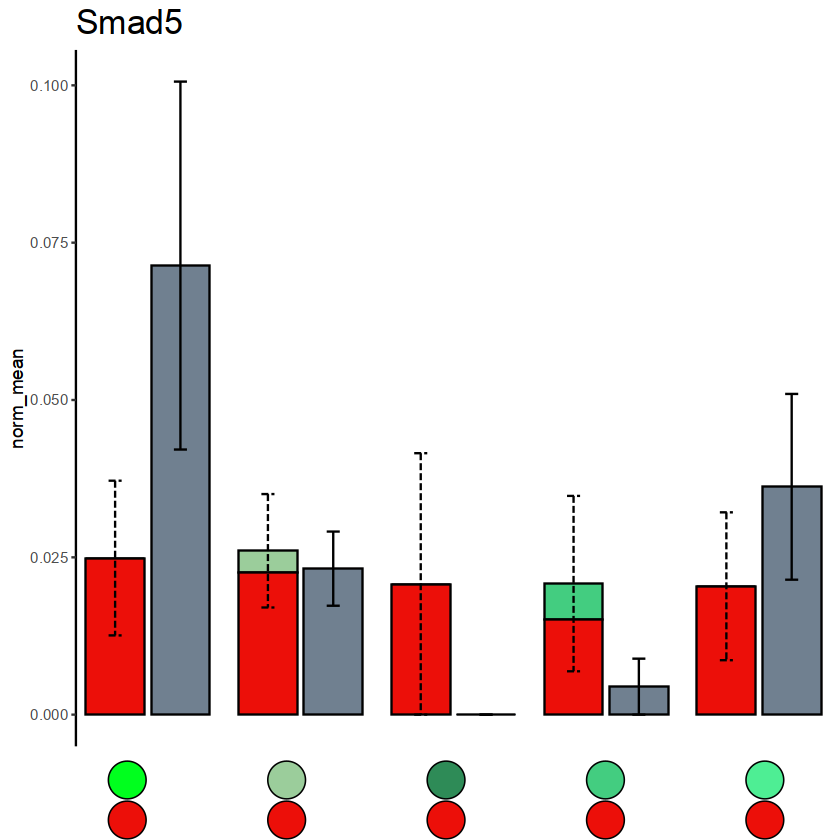

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


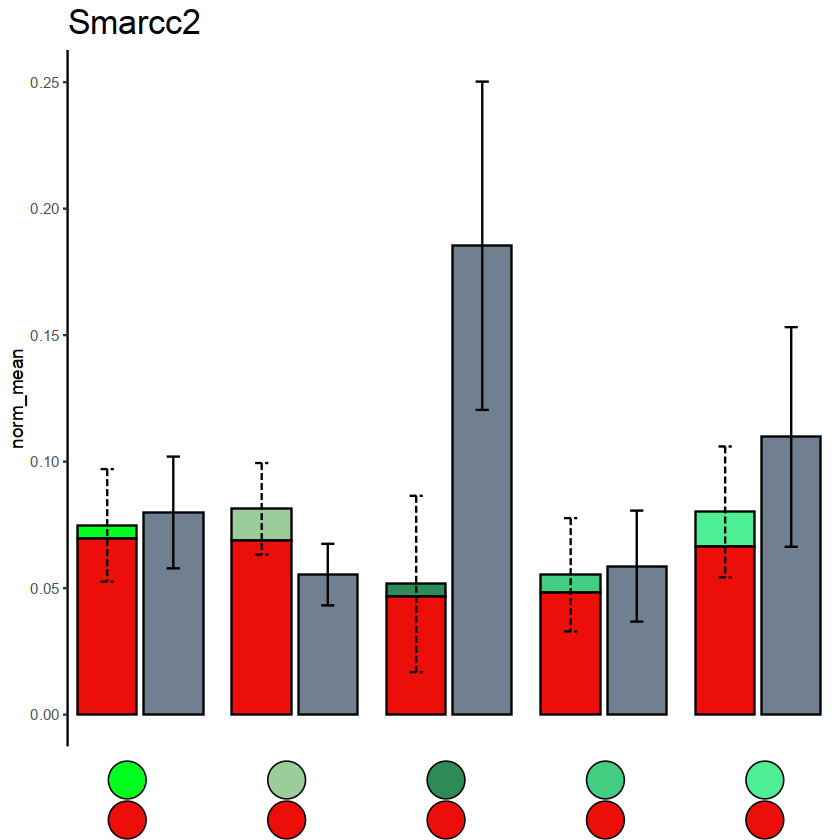

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


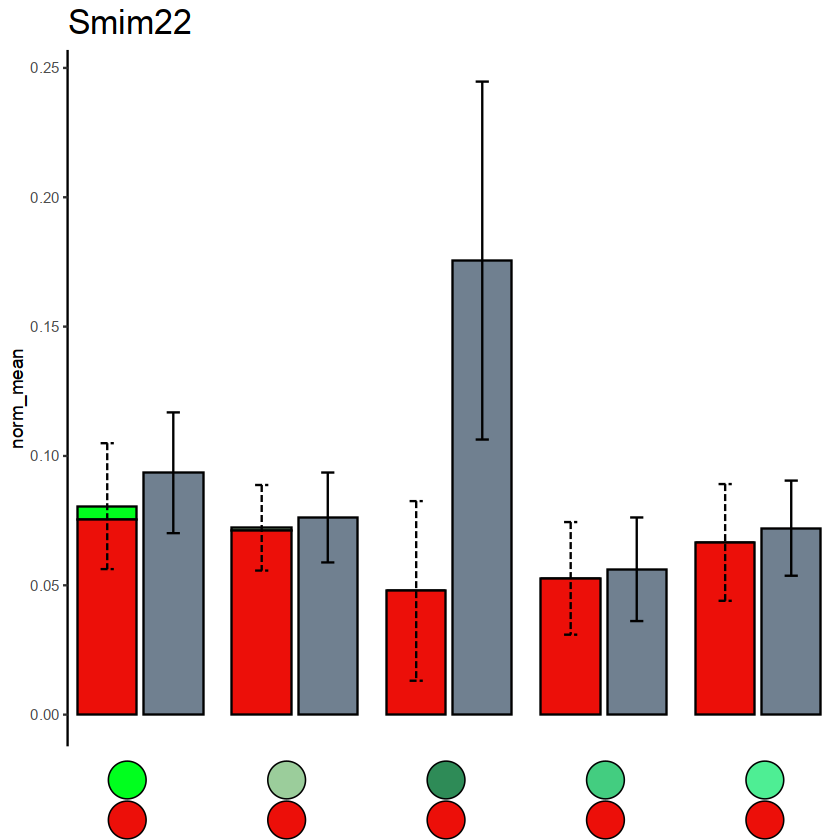

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


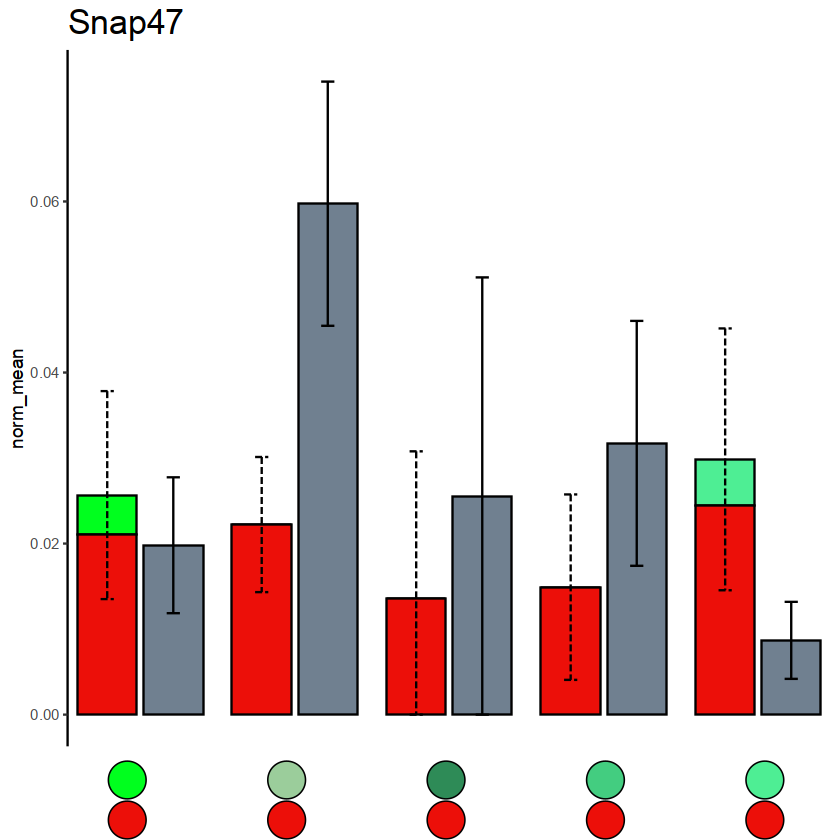

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


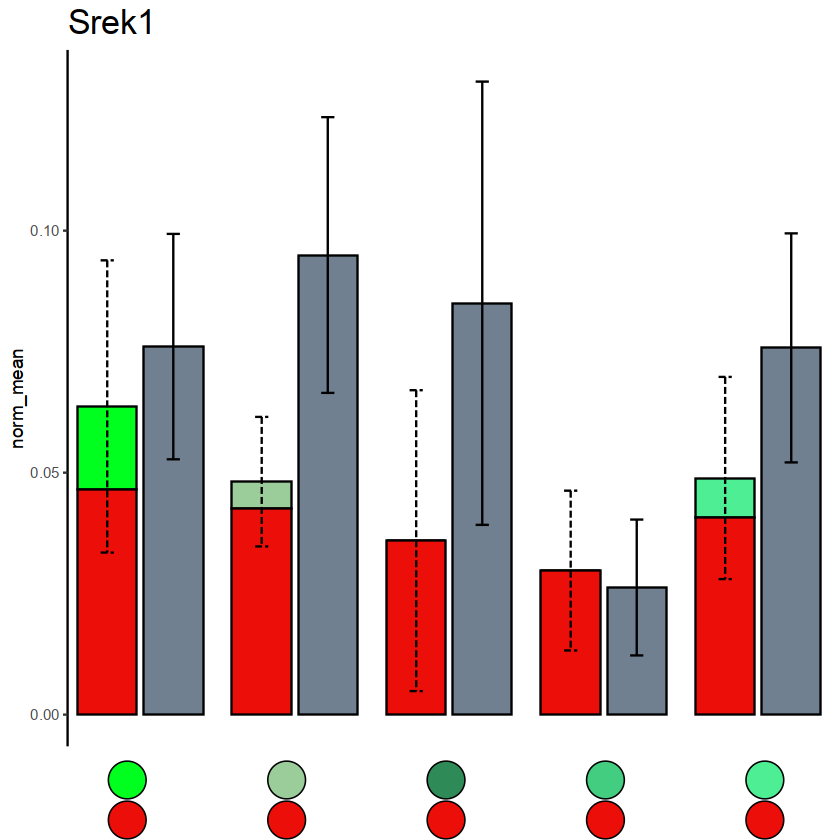

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


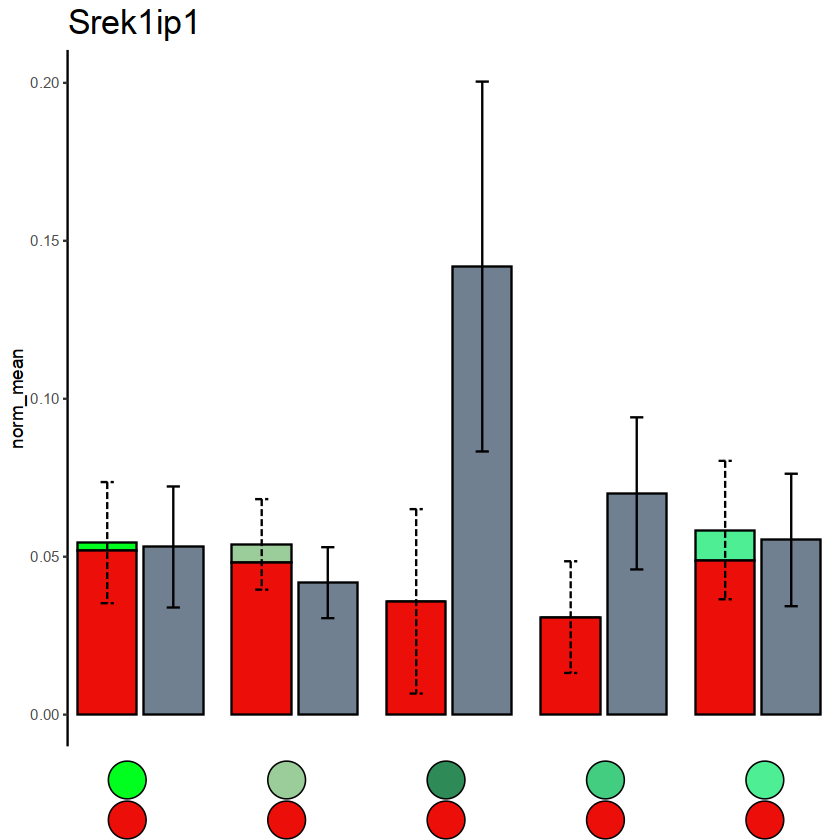

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


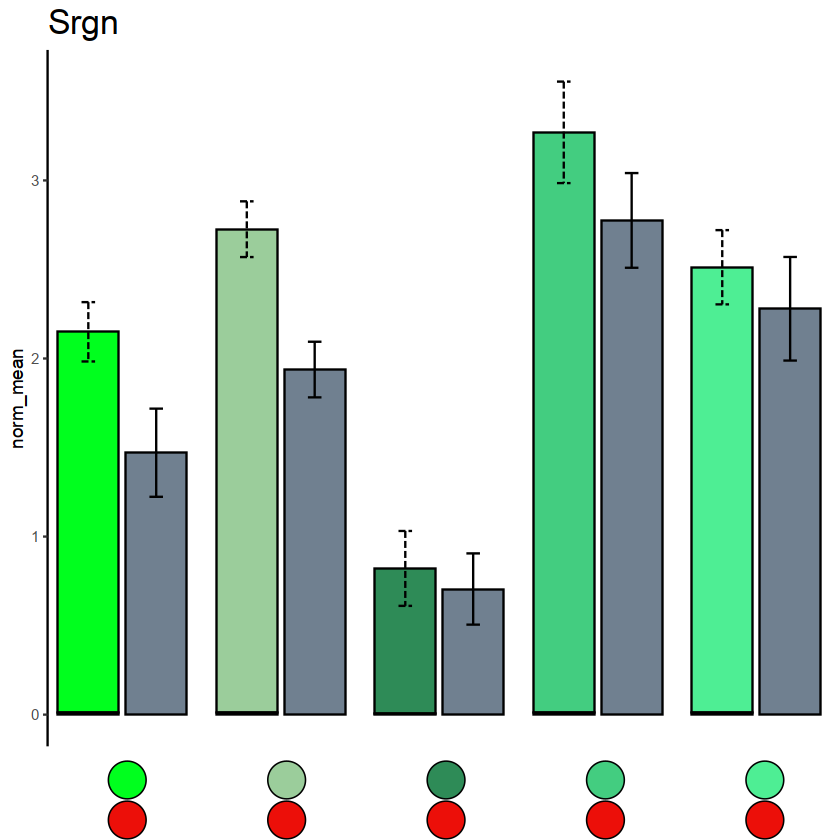

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


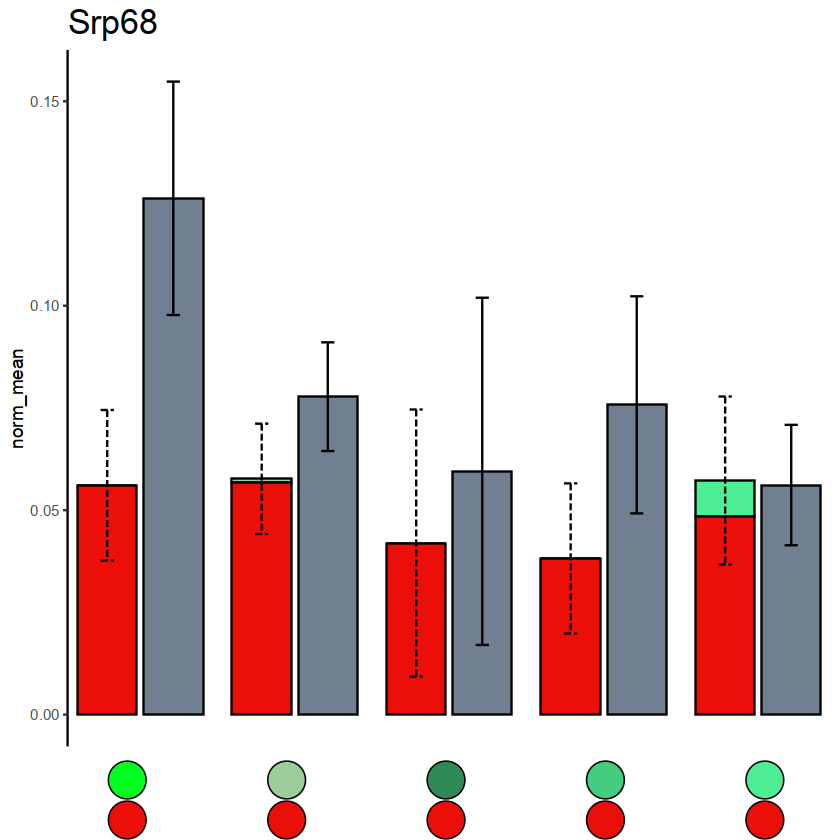

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


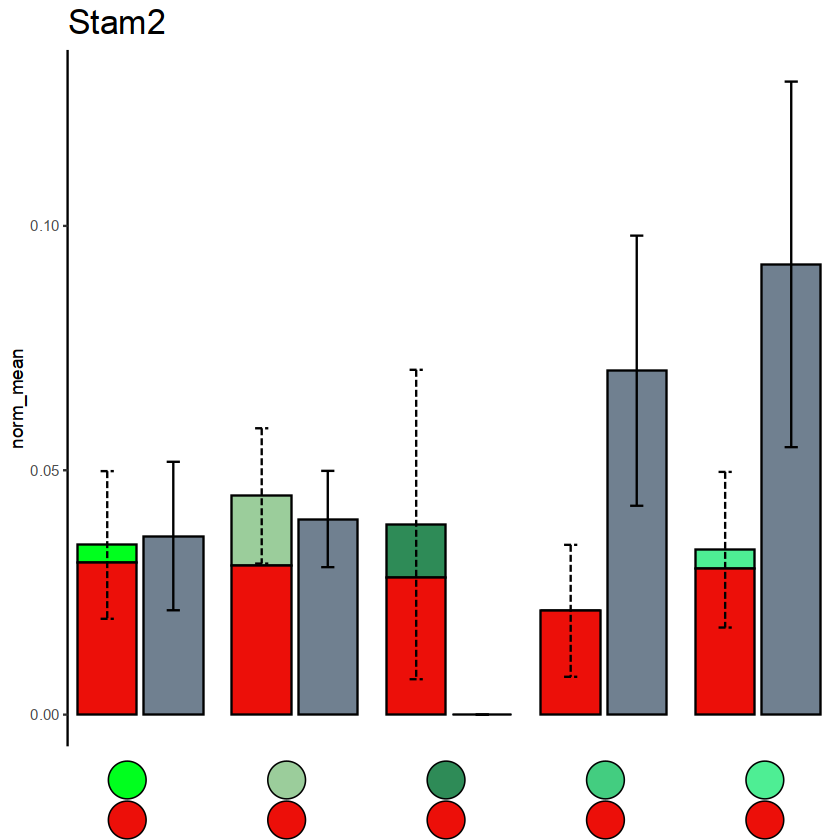

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


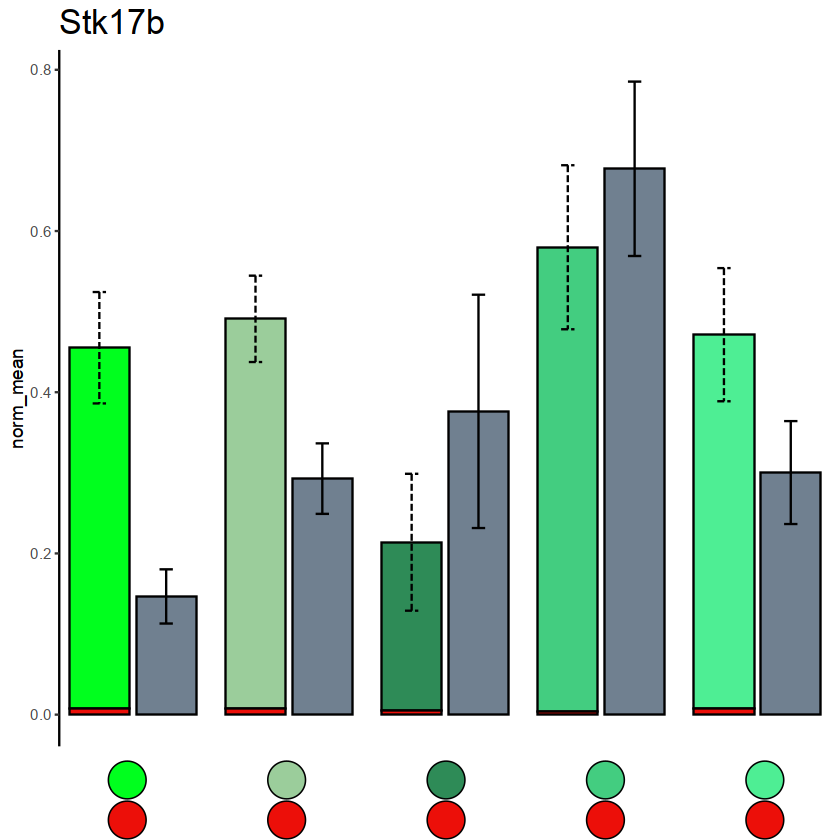

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


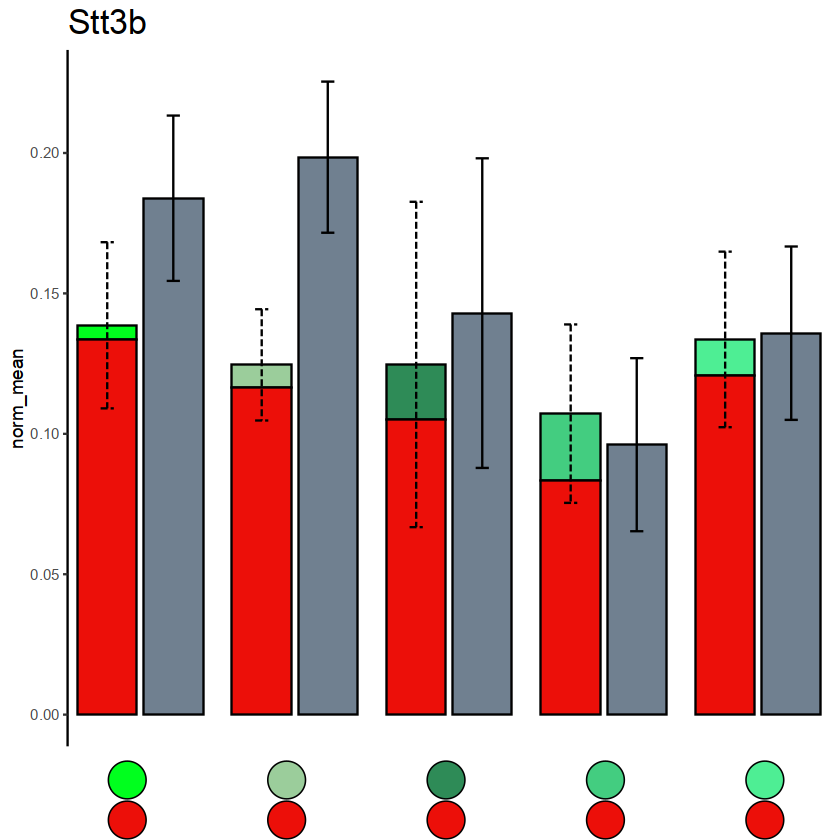

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


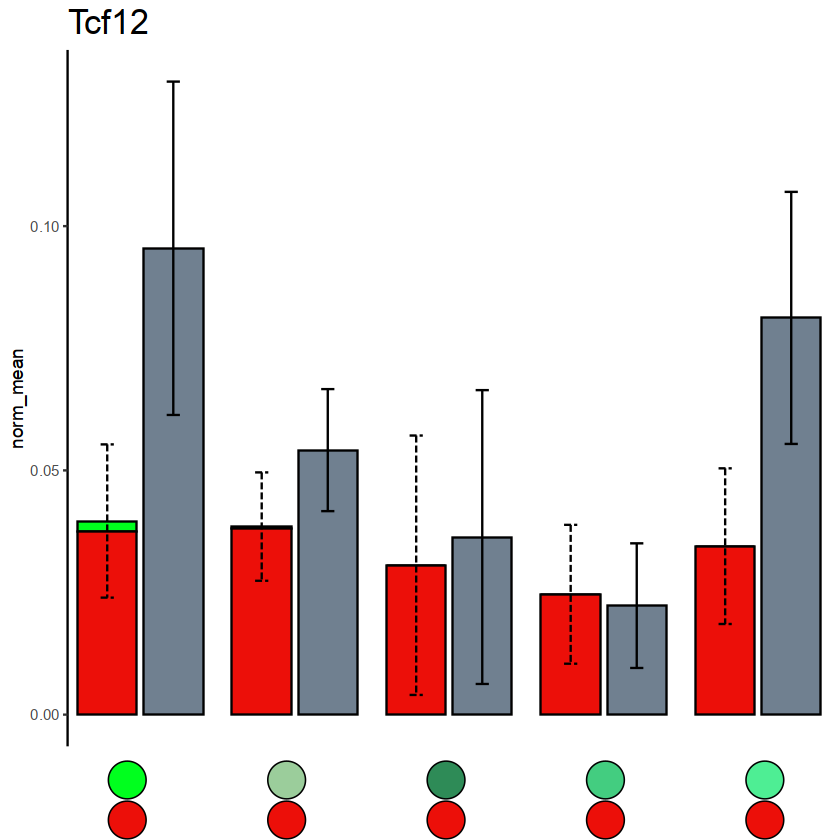

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


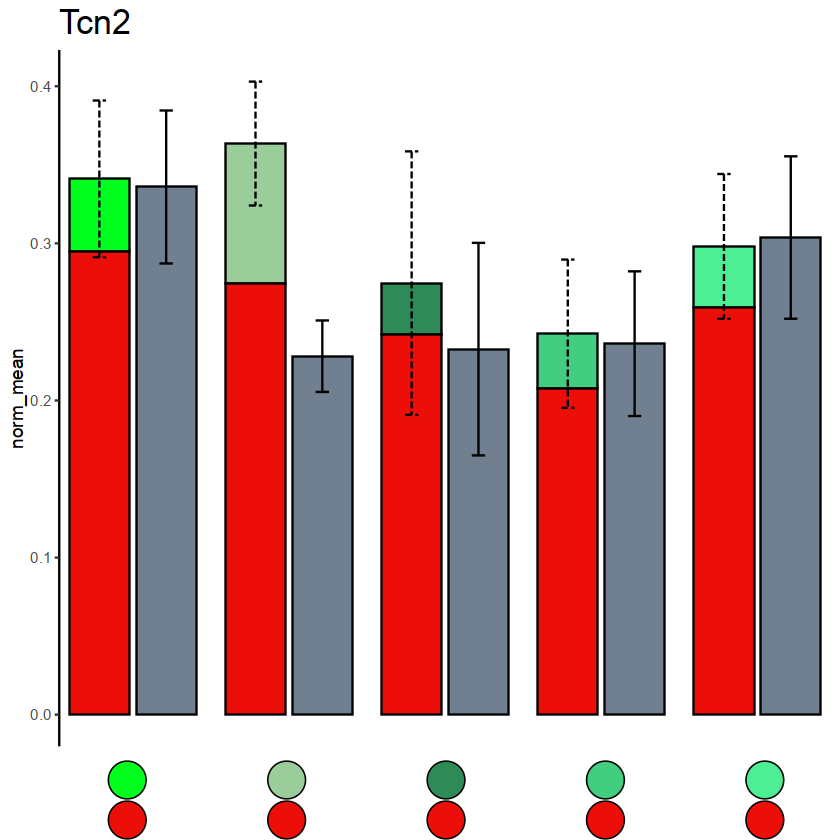

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


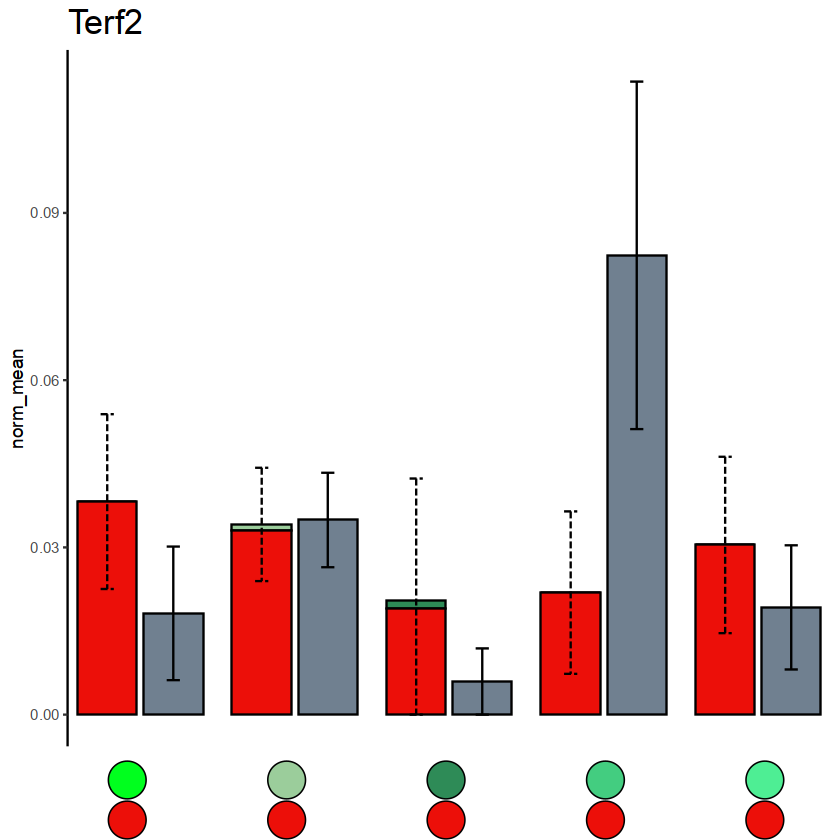

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


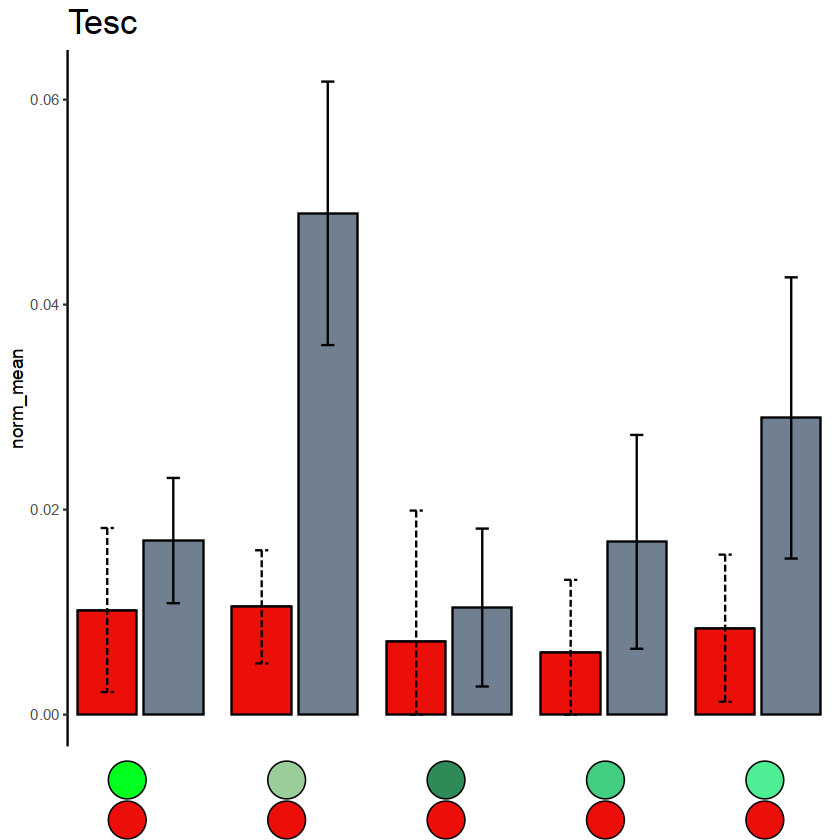

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


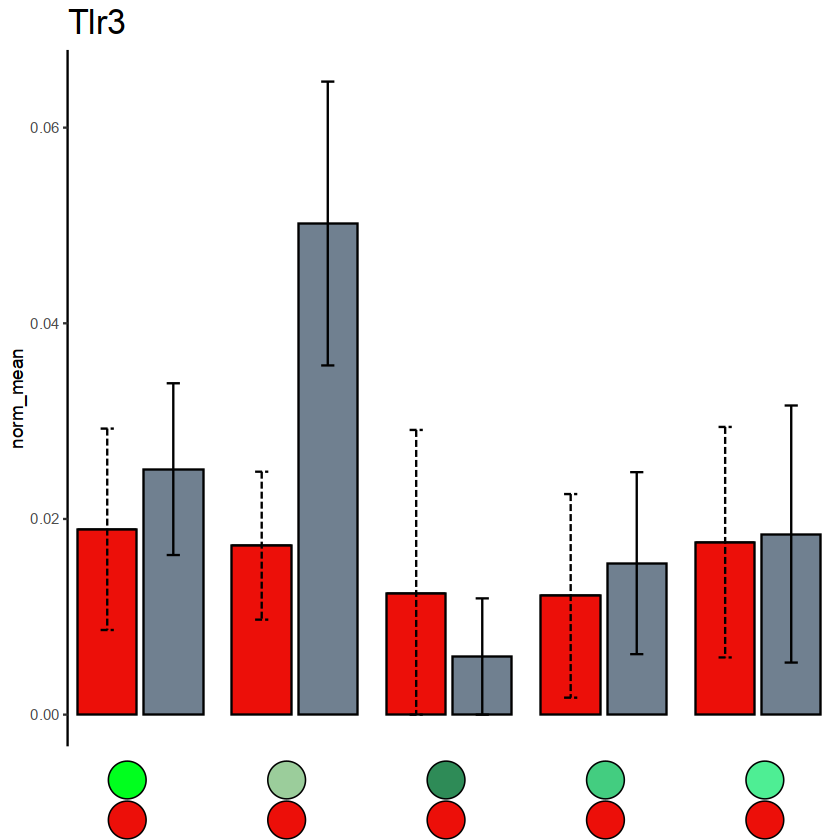

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


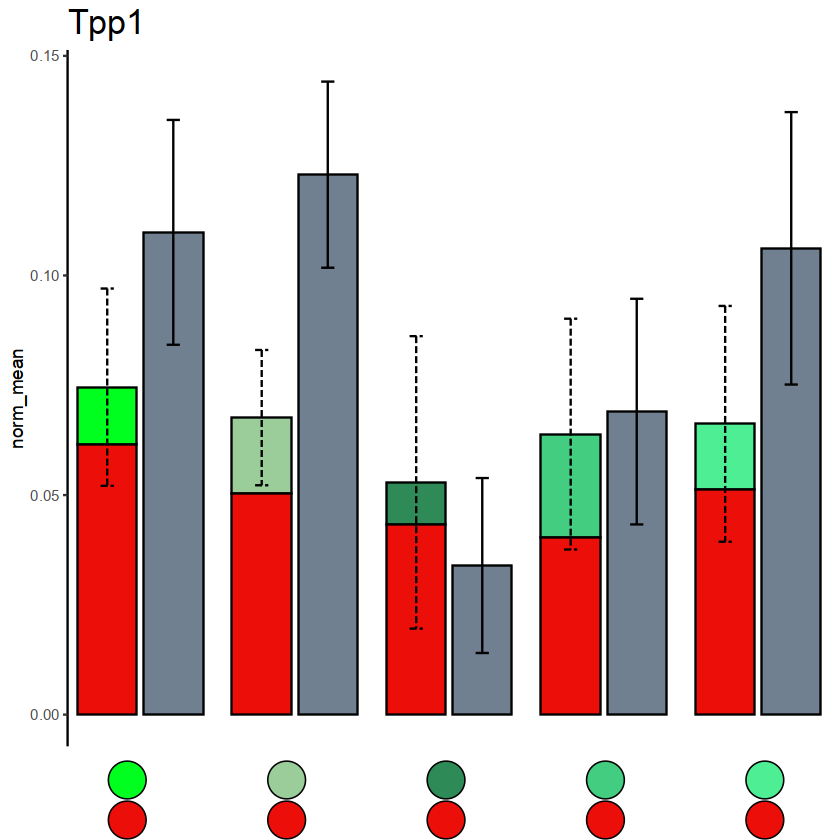

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


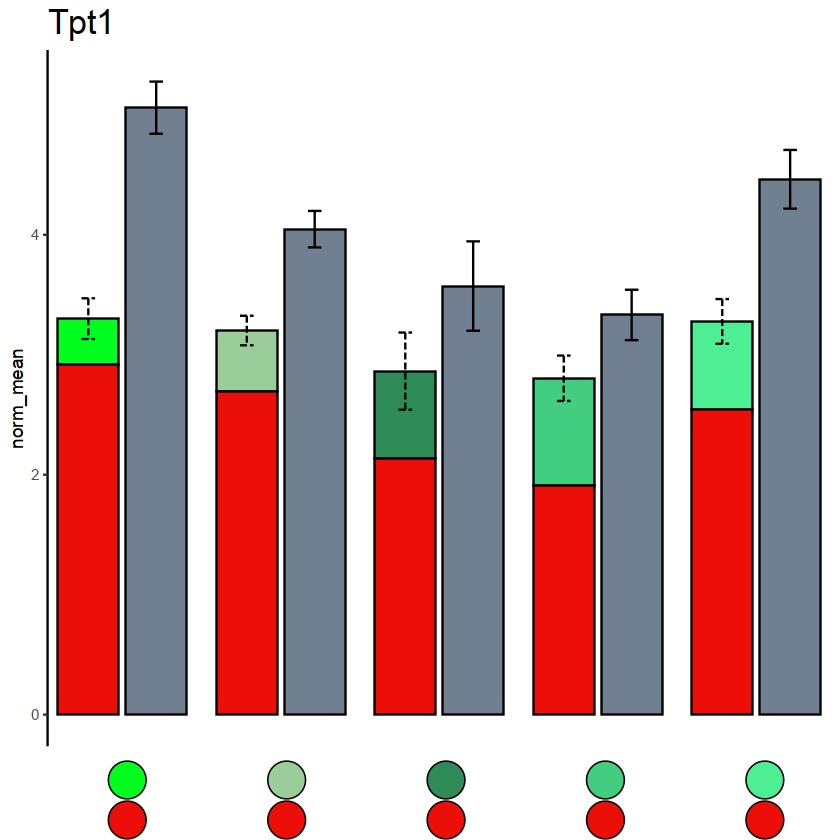

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


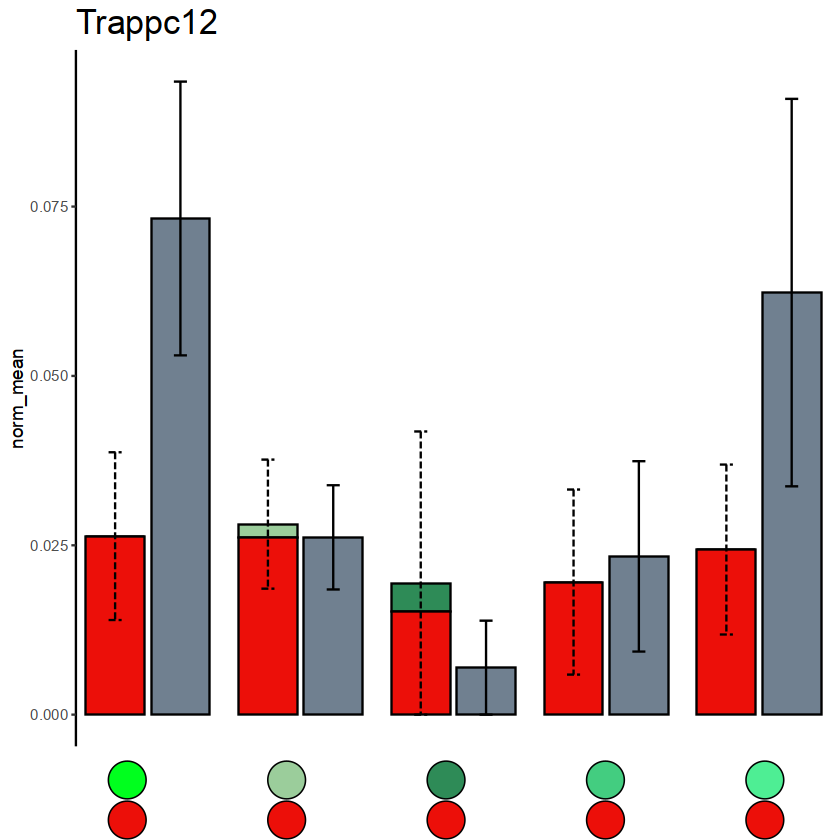

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


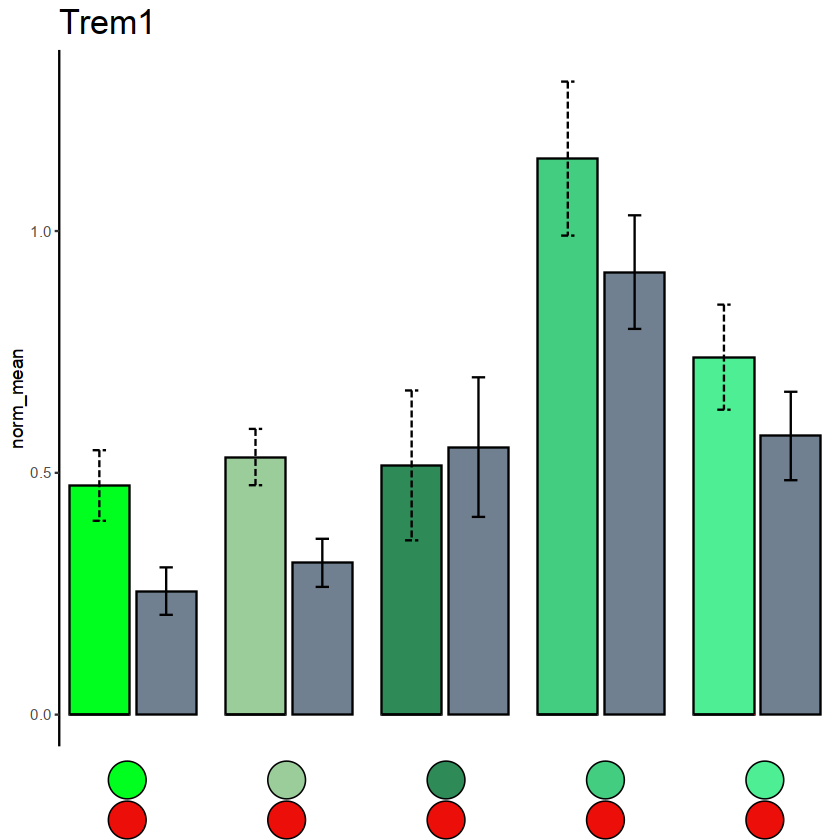

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


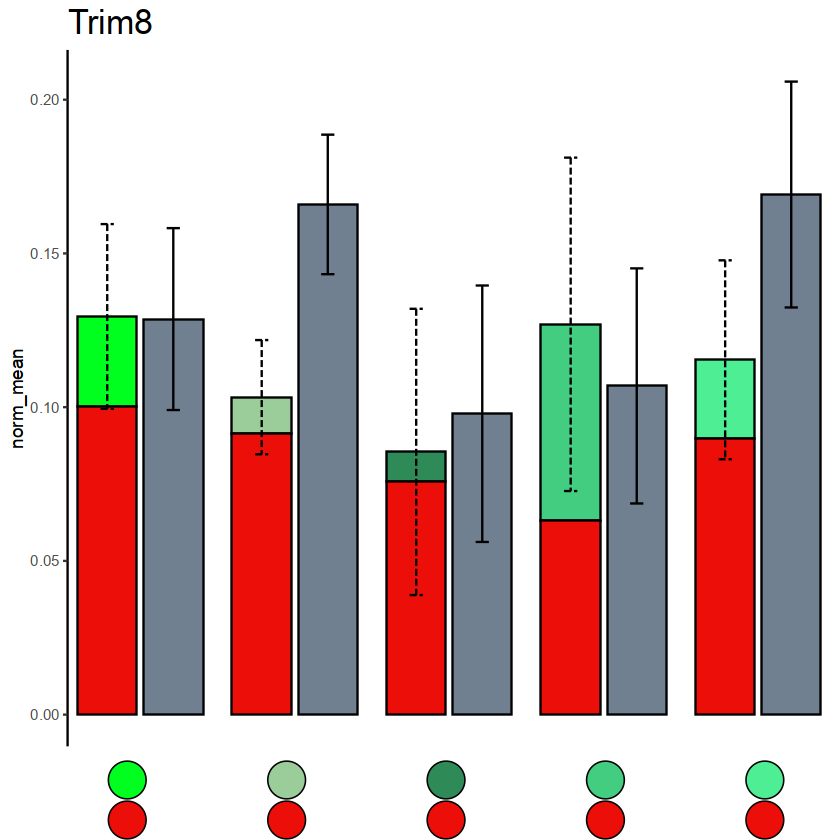

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


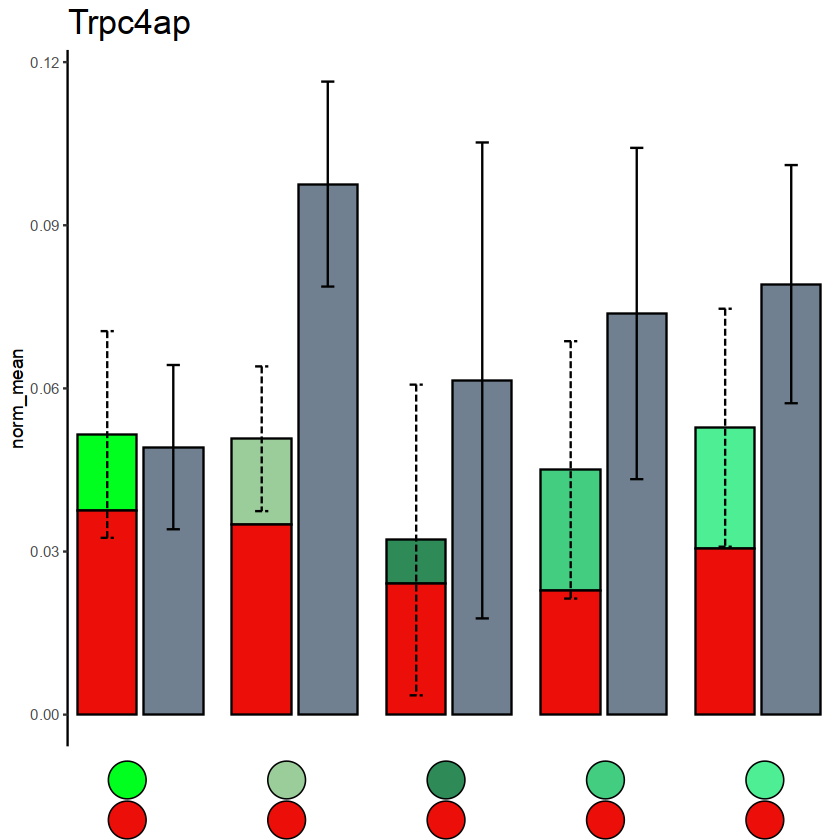

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


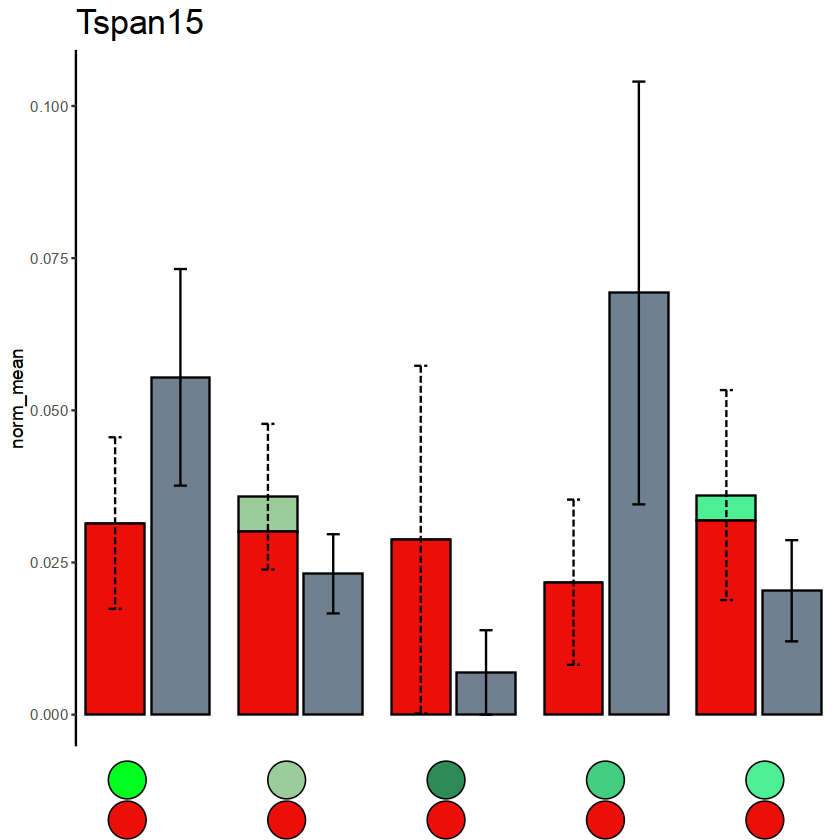

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


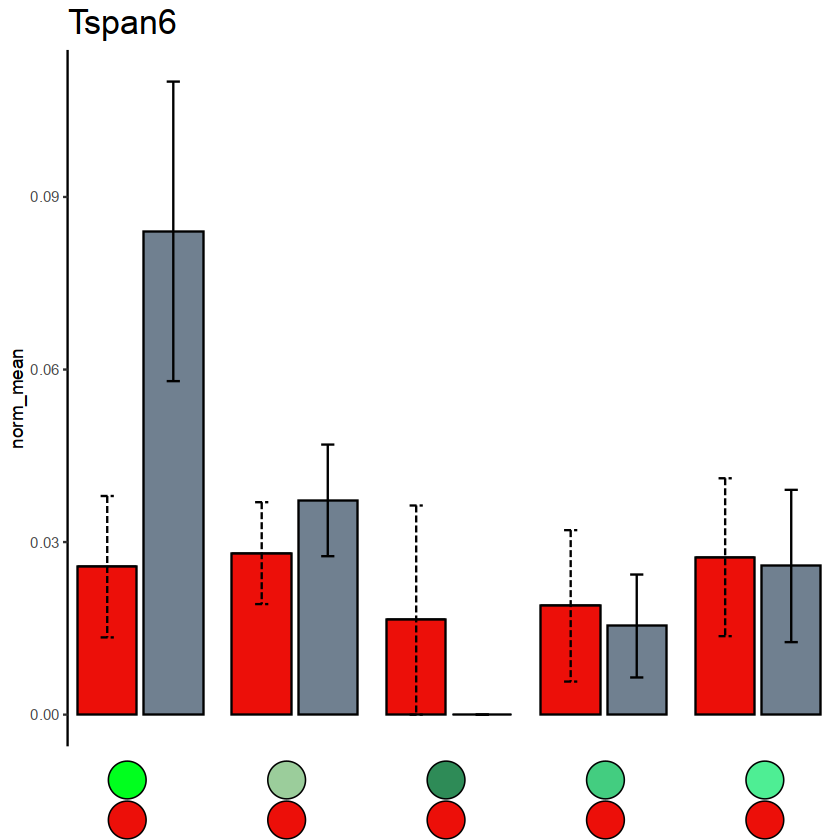

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


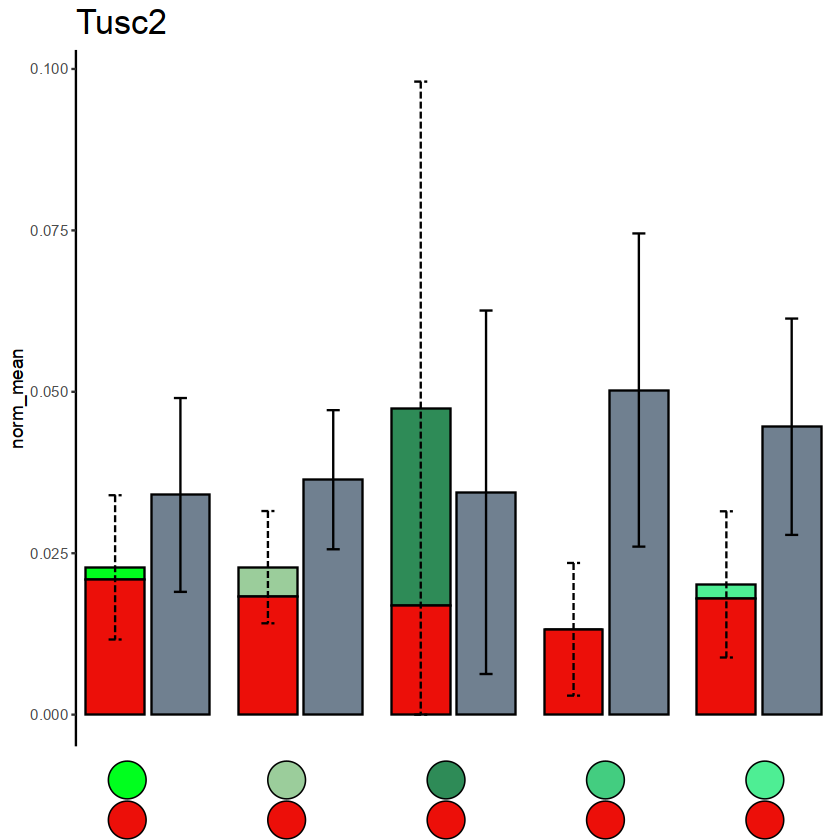

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


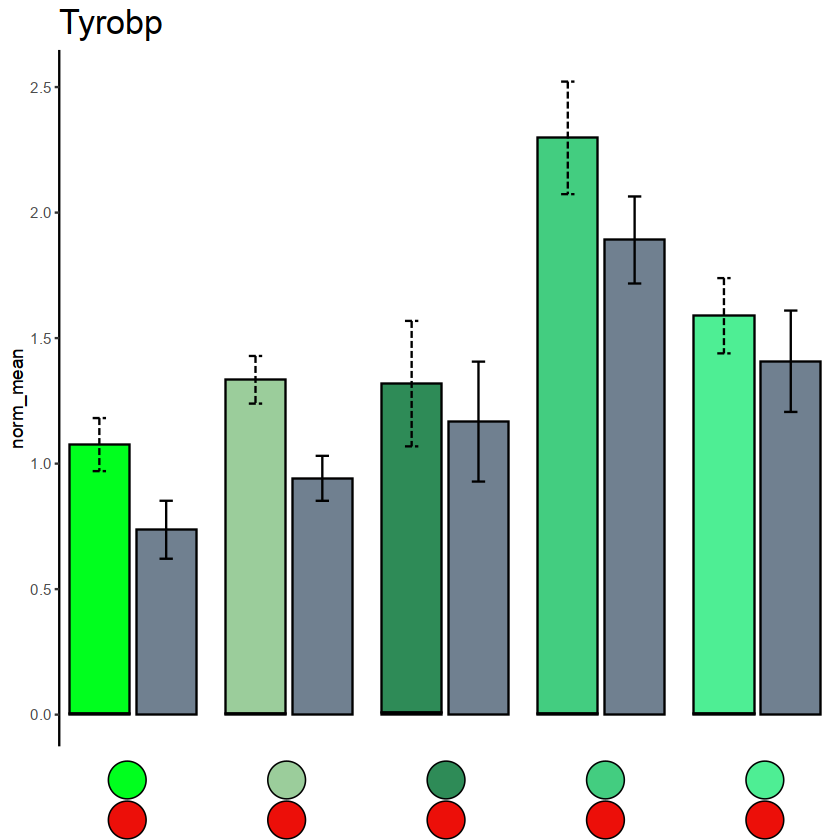

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


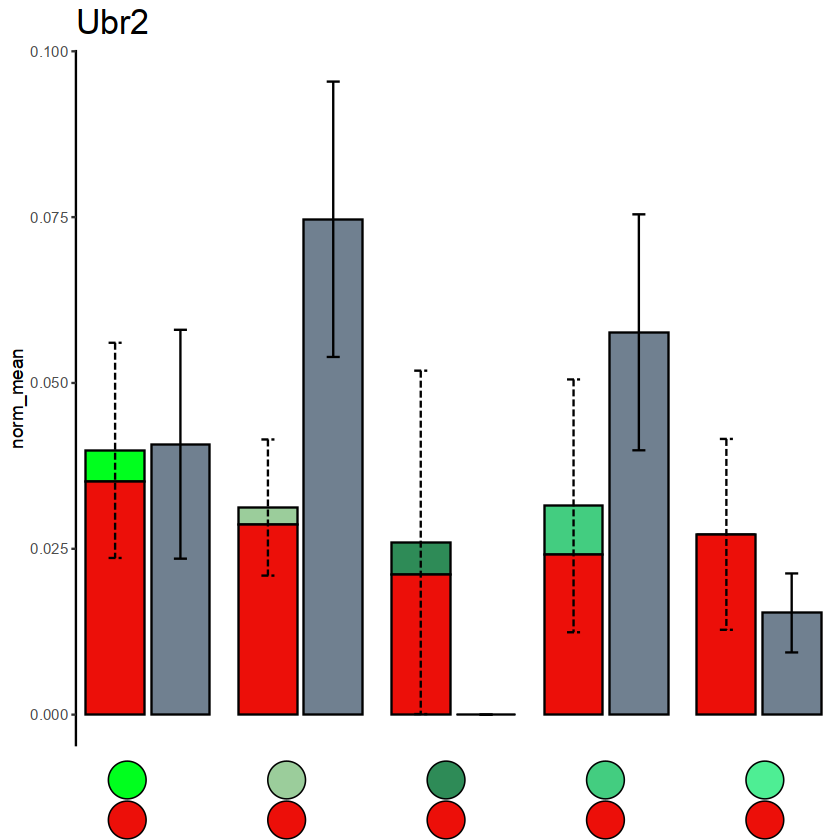

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


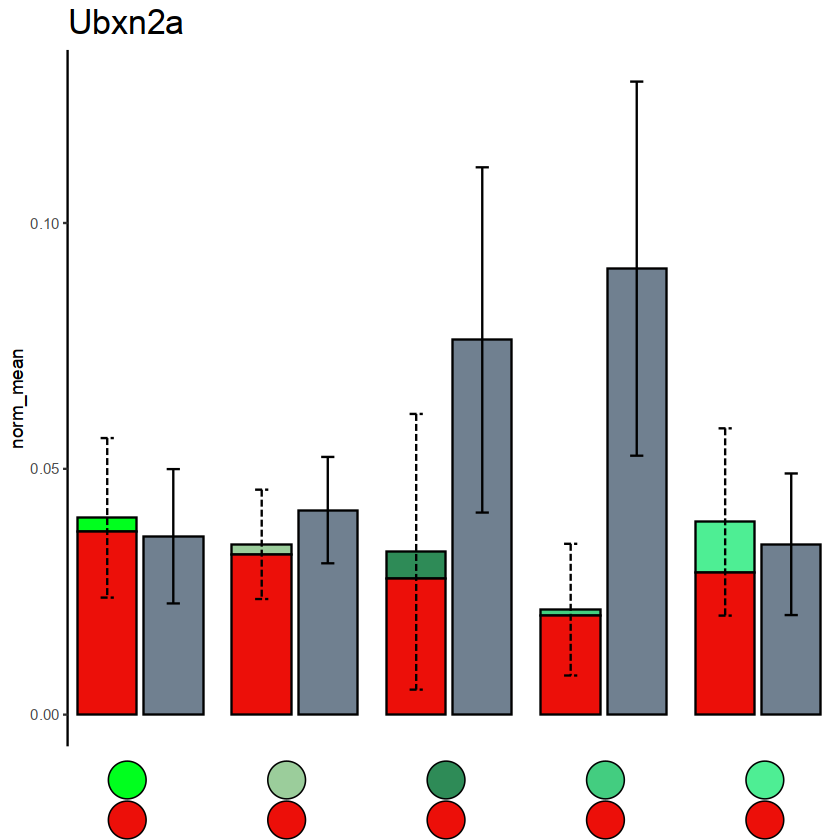

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


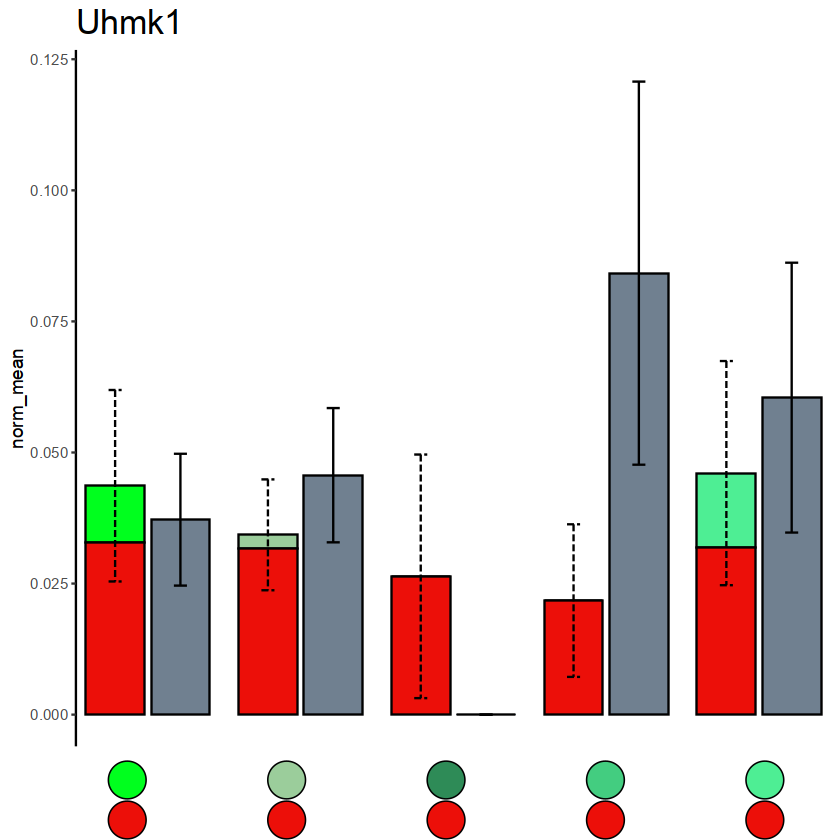

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


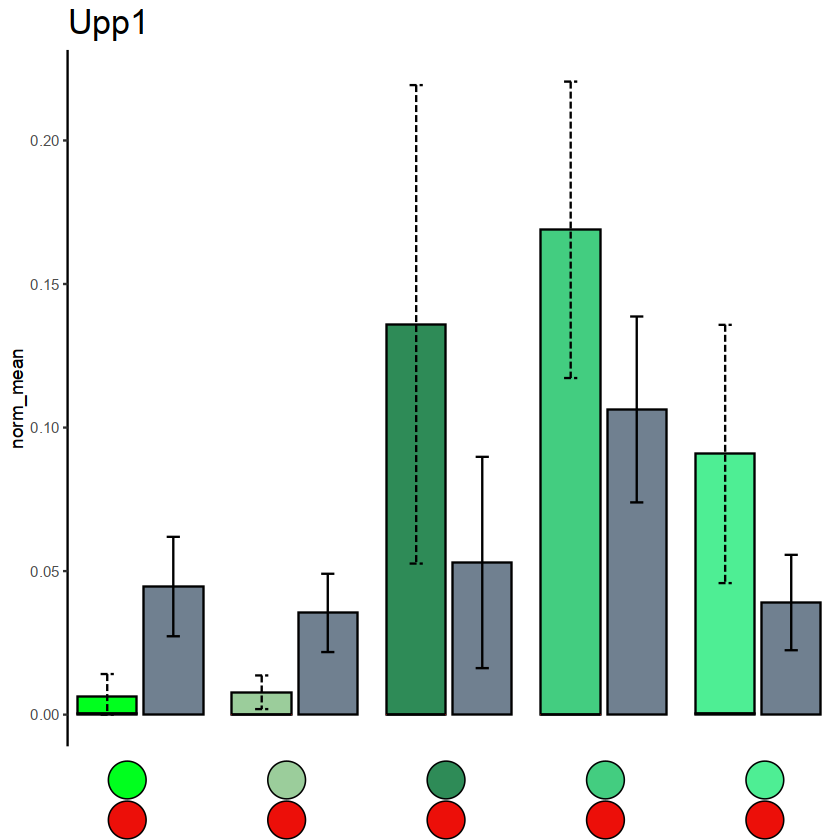

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


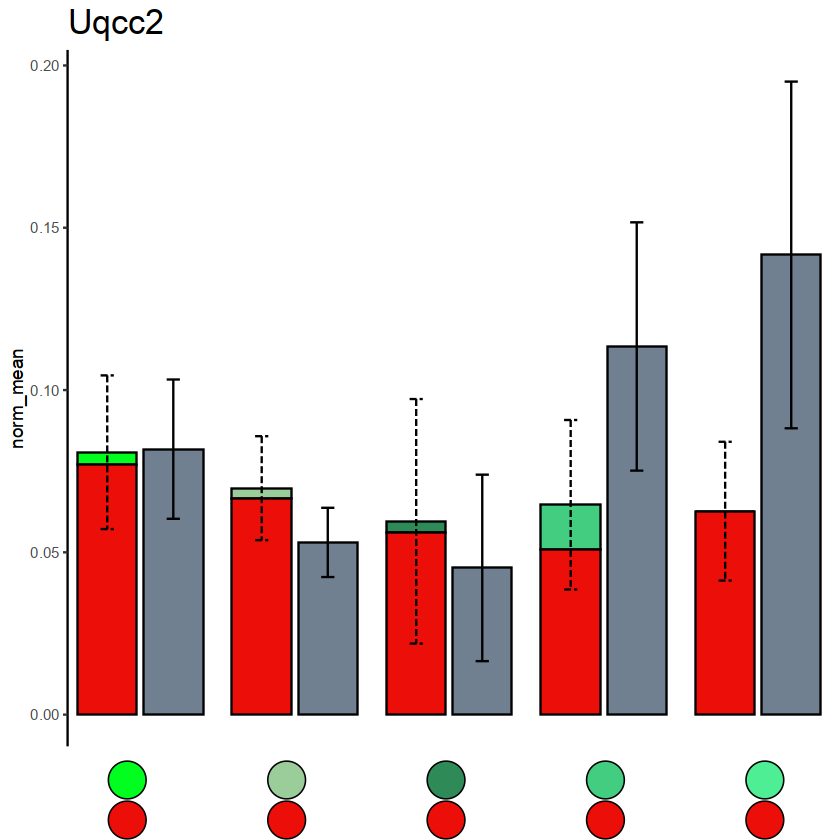

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


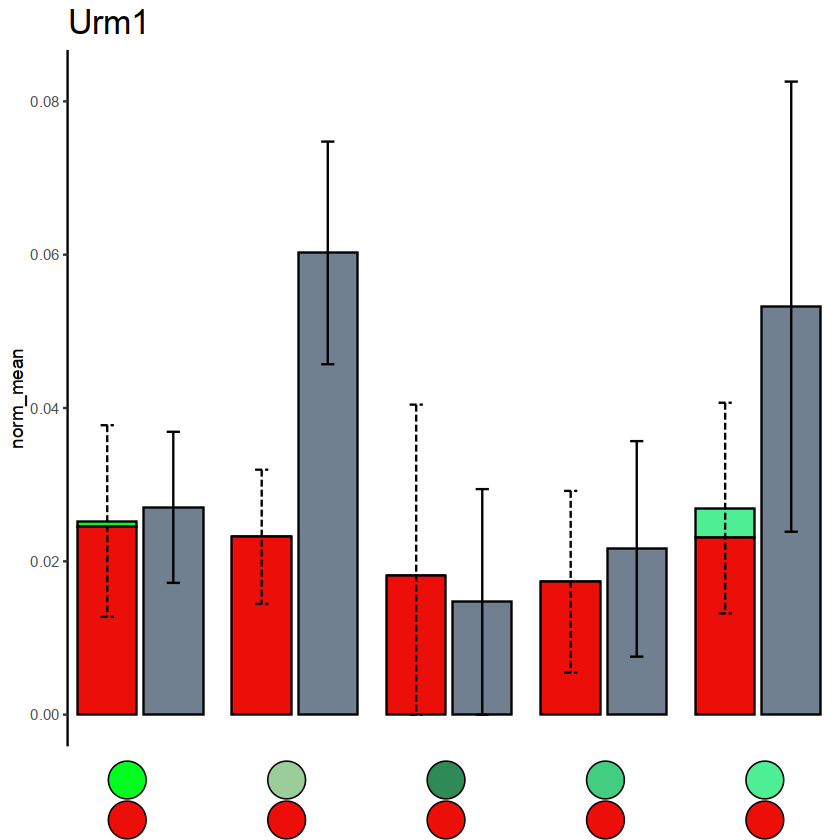

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


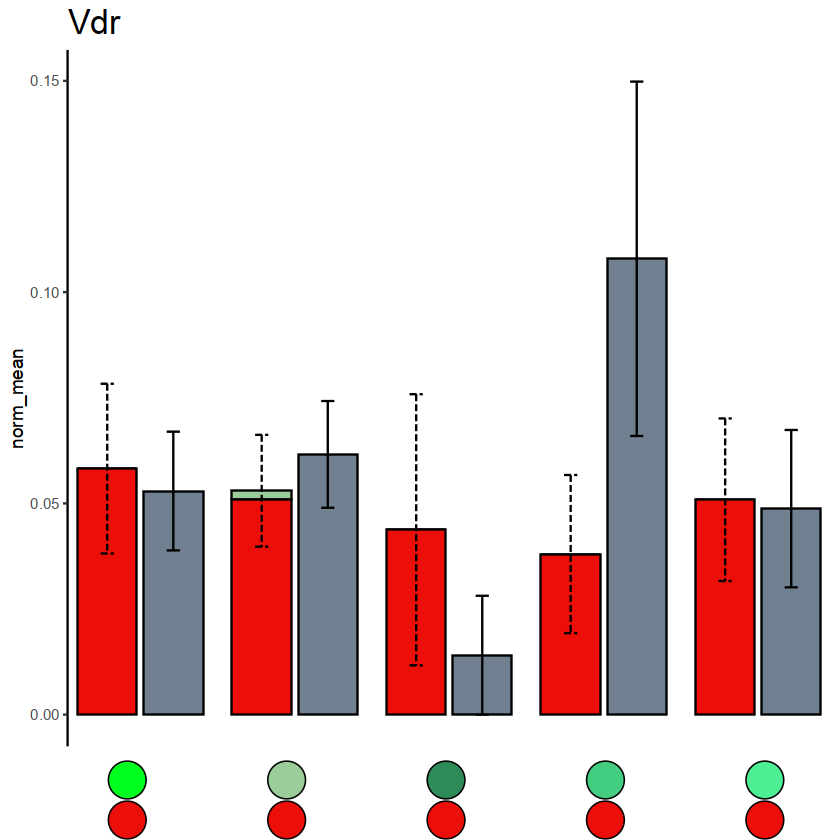

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


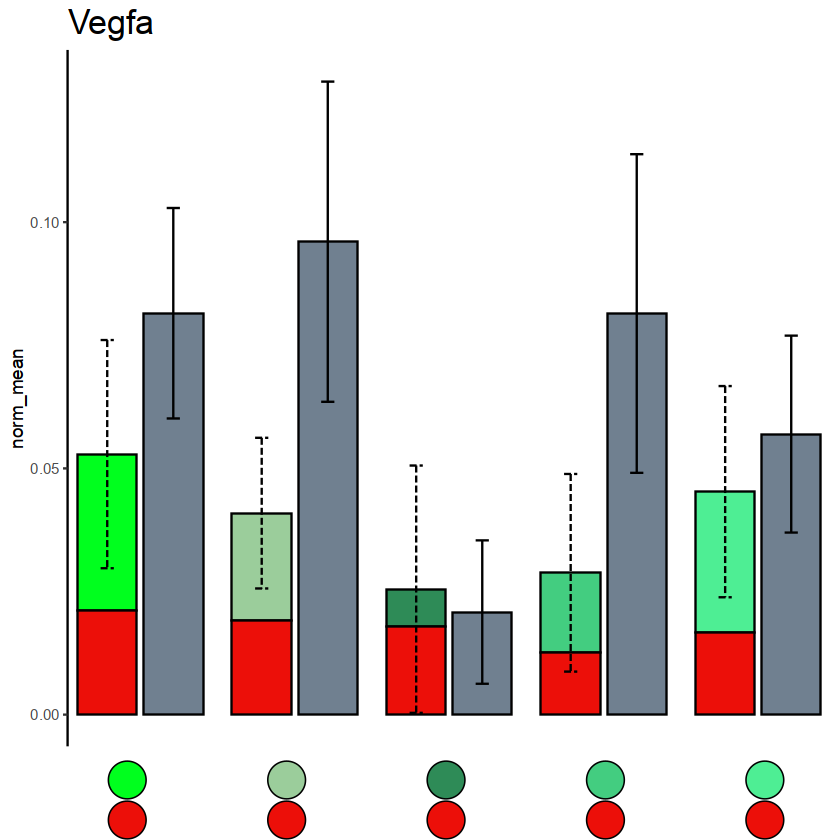

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


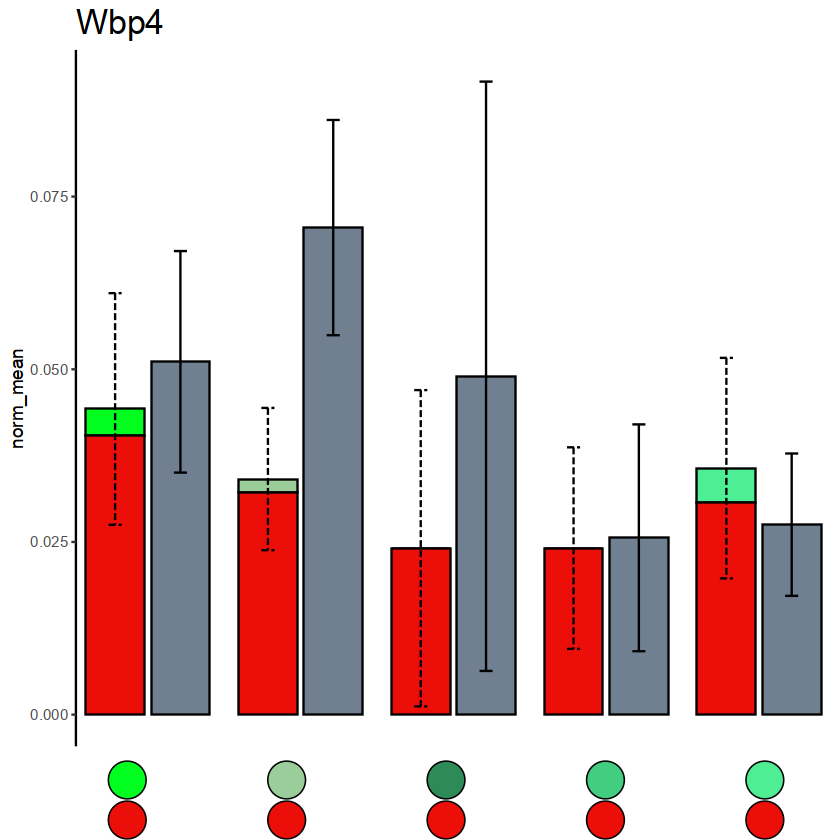

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


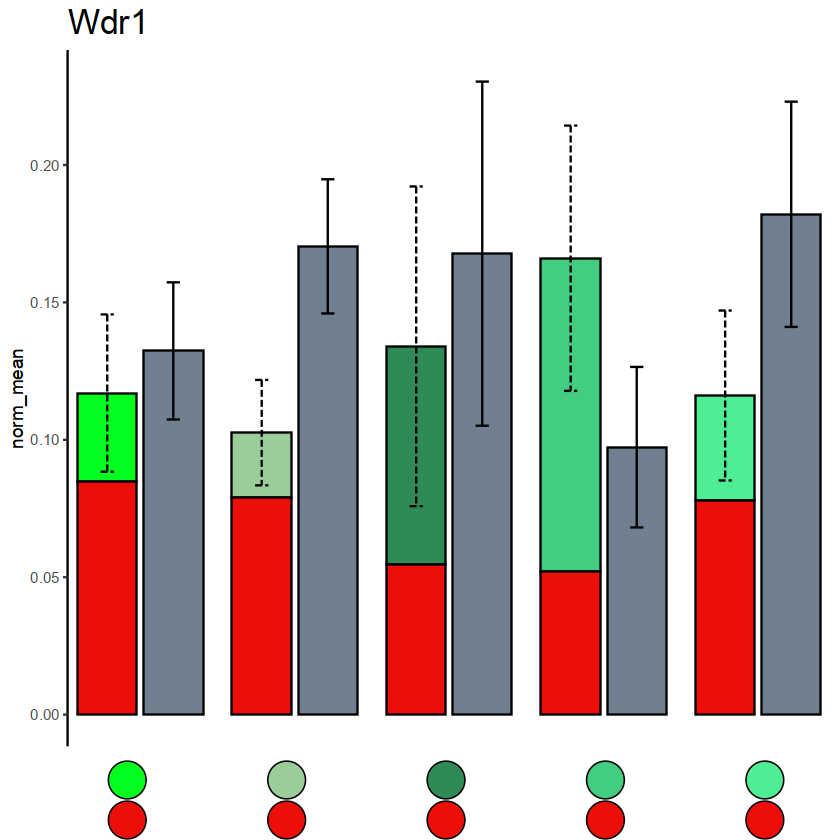

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


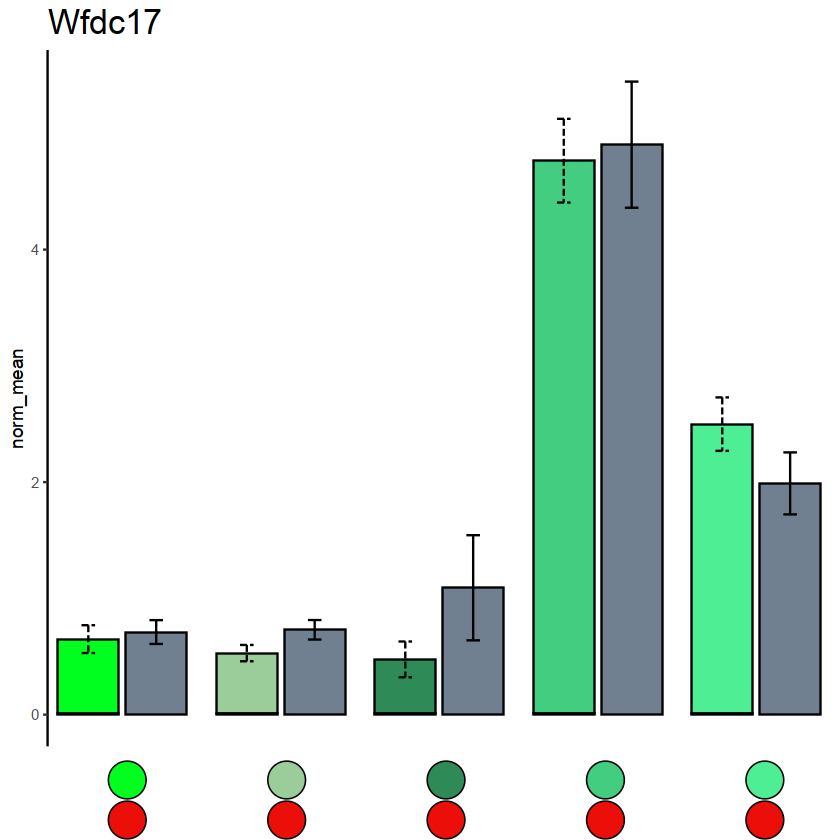

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


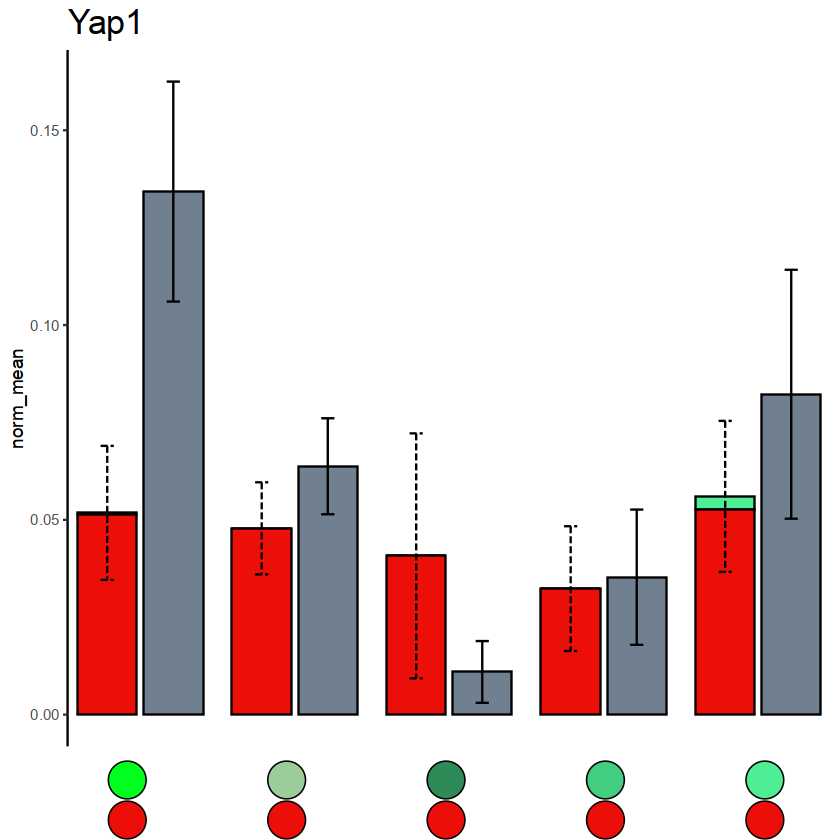

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


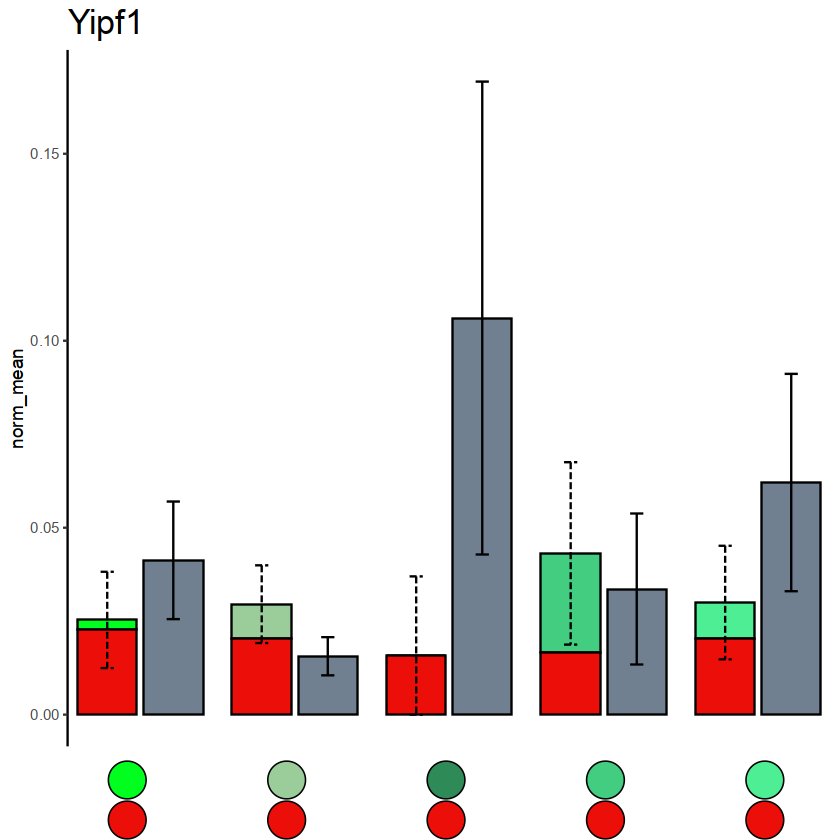

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


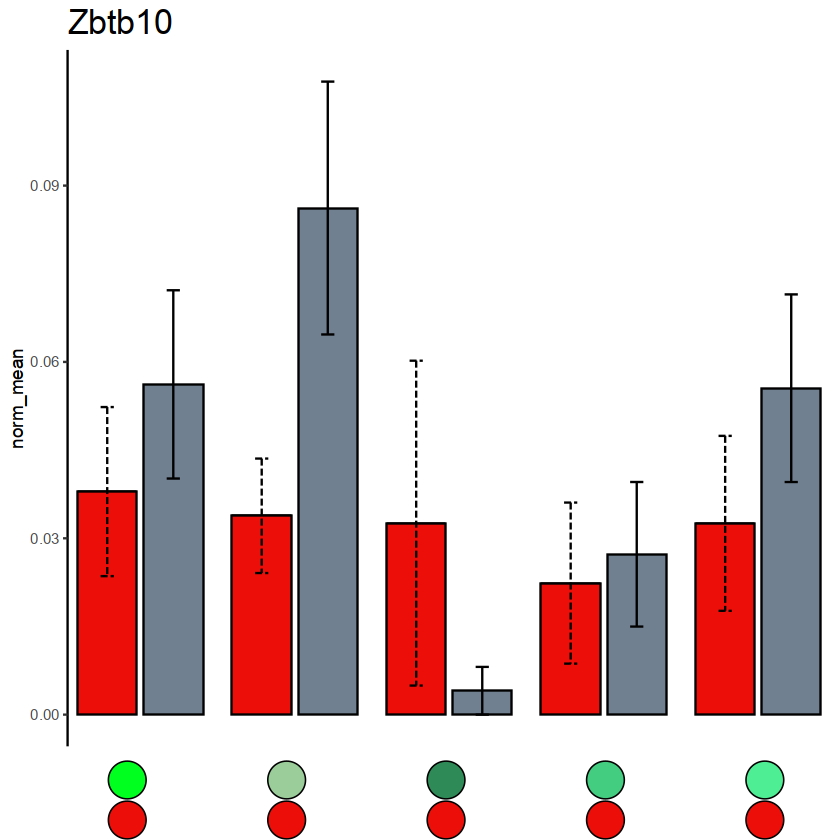

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


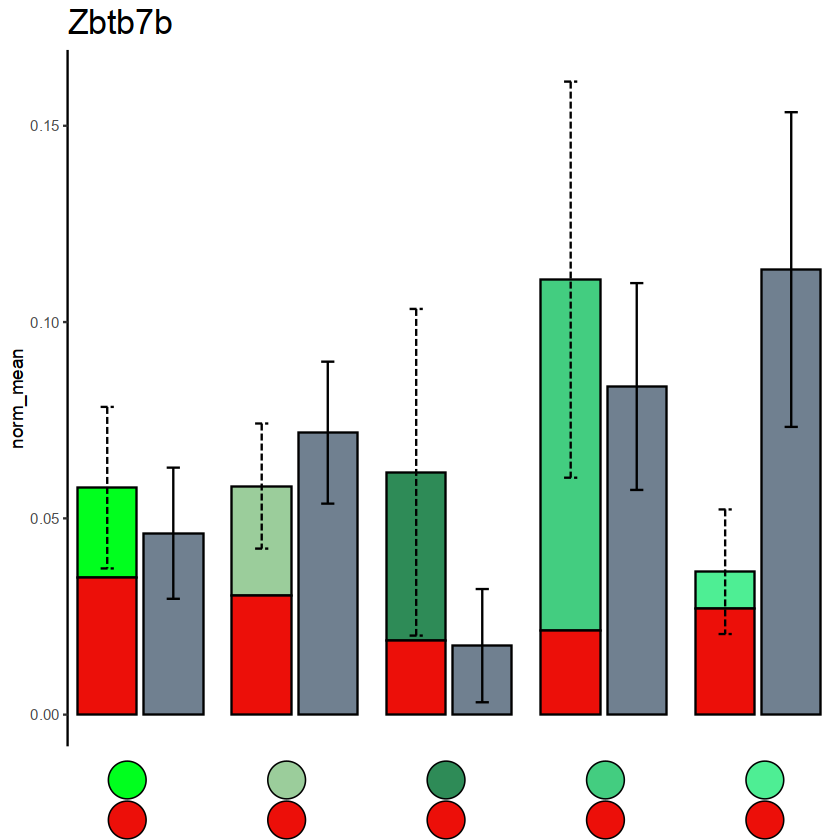

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


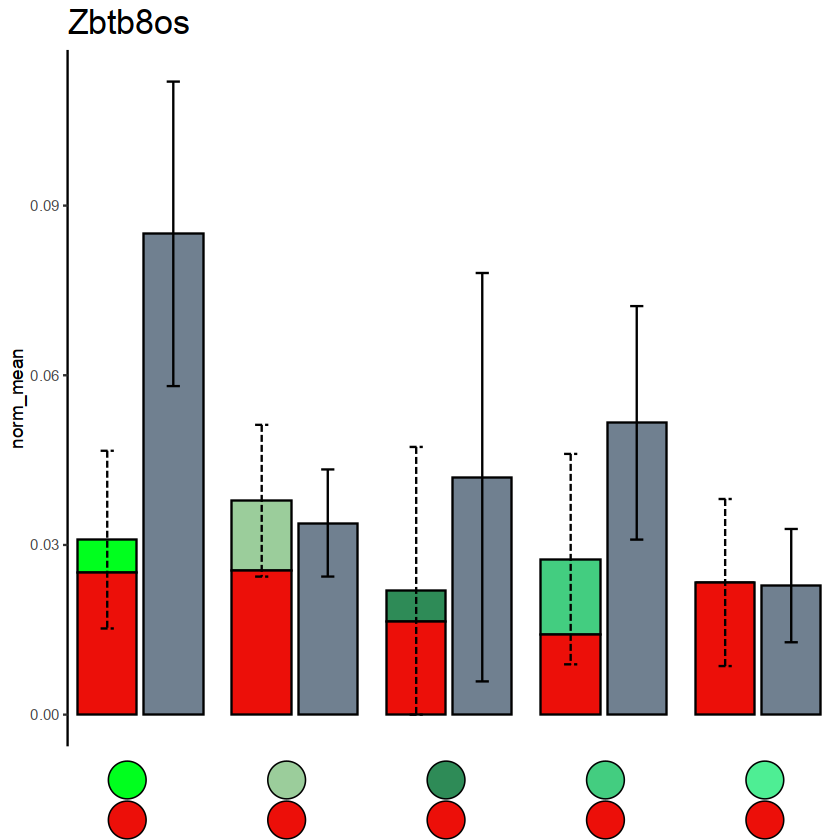

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


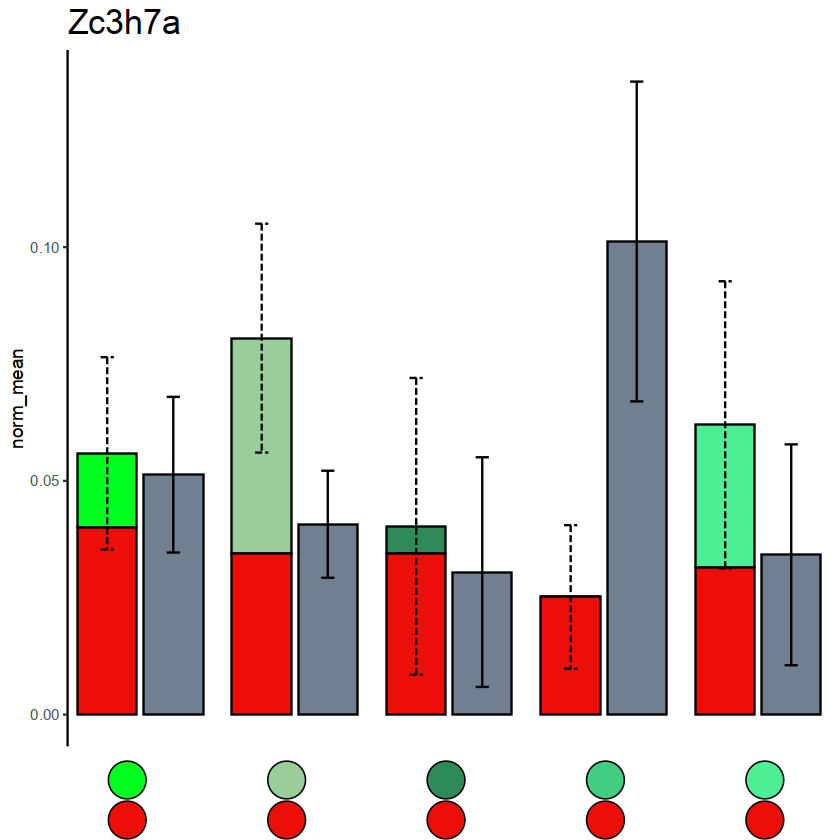

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


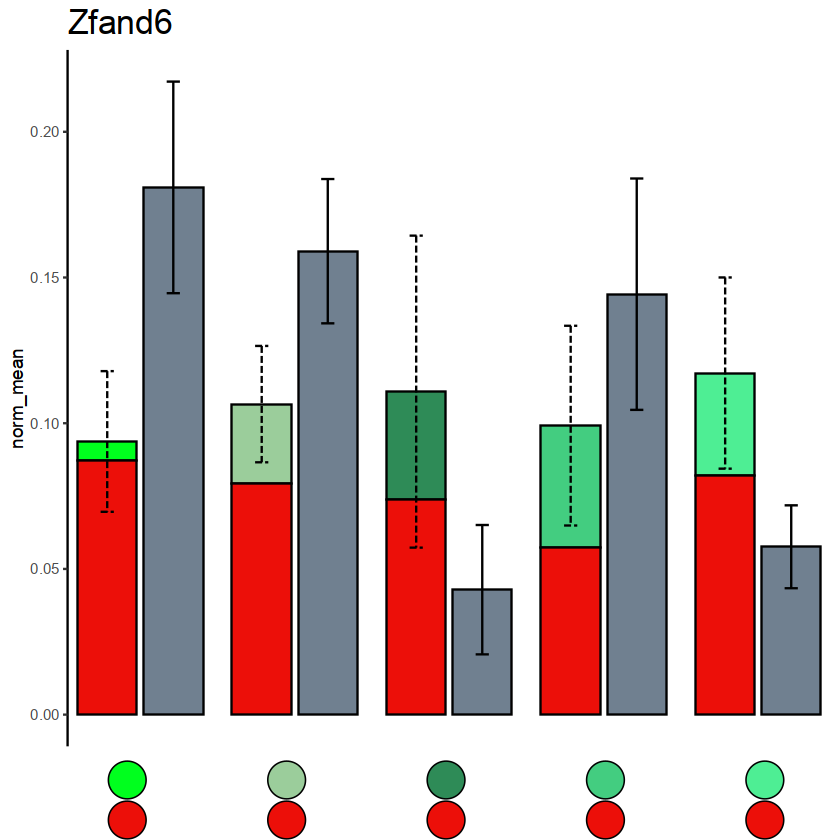

Saving 6.67 x 6.67 in image


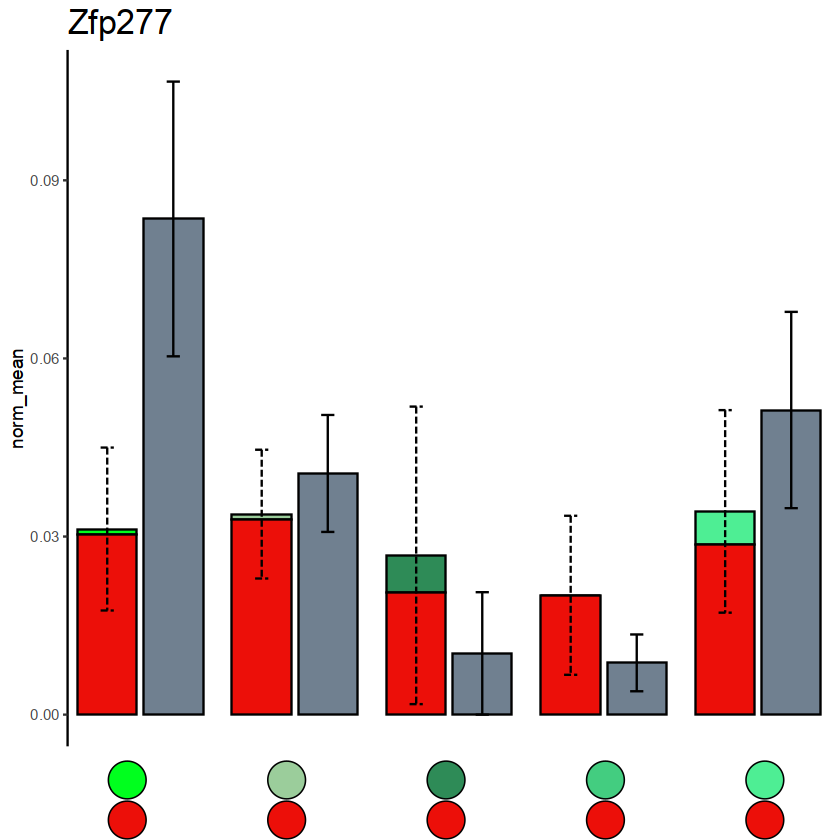

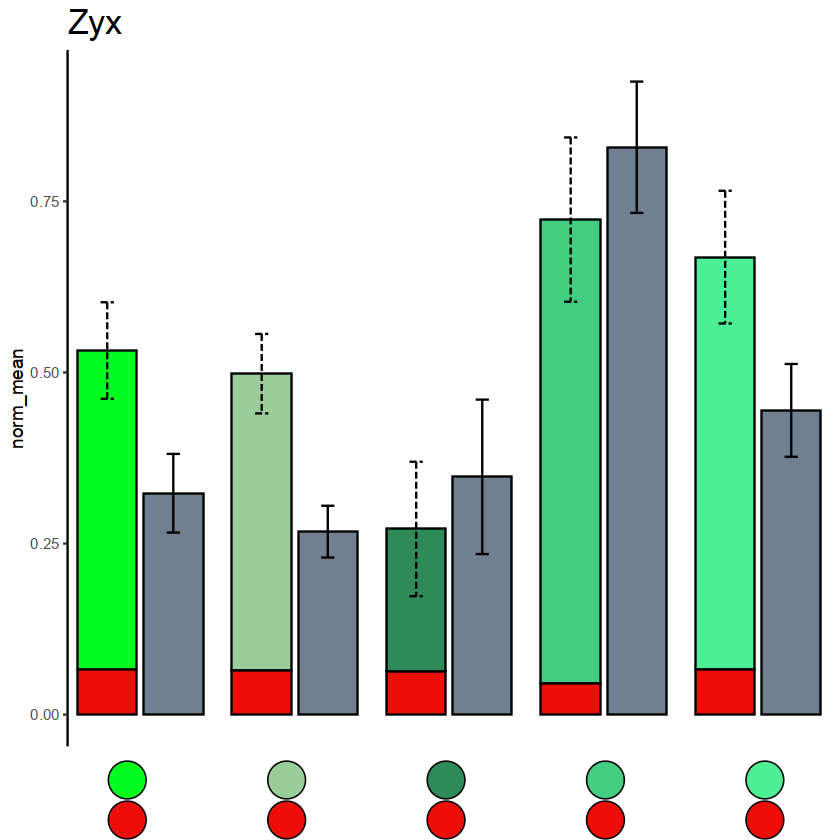

In [100]:
for (gene in sig_somewhere){
    p = per_comb_obs_exp(gene)
    ggsave(paste0("final_figs/fig5/new_gene_full_sim/gene_comb/", gene, ".png"), plot=p)
}

Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


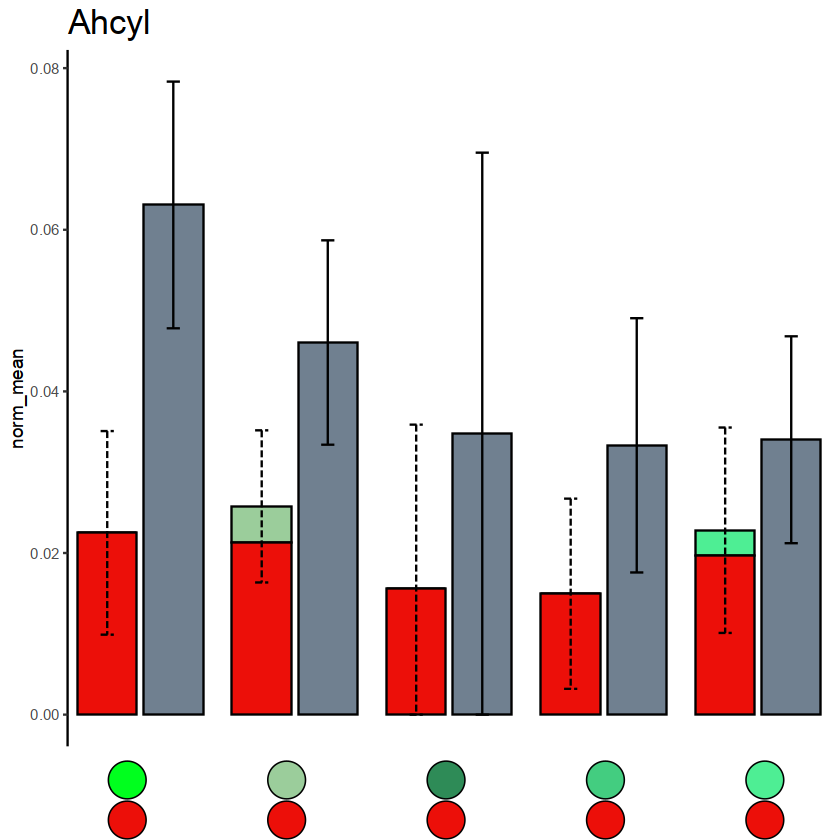

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


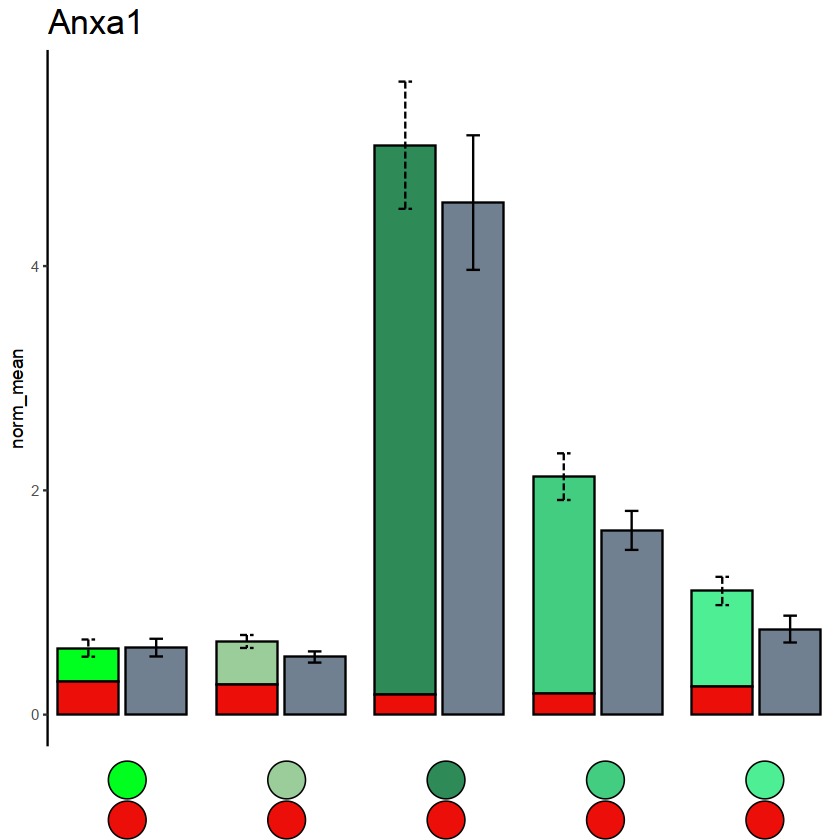

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


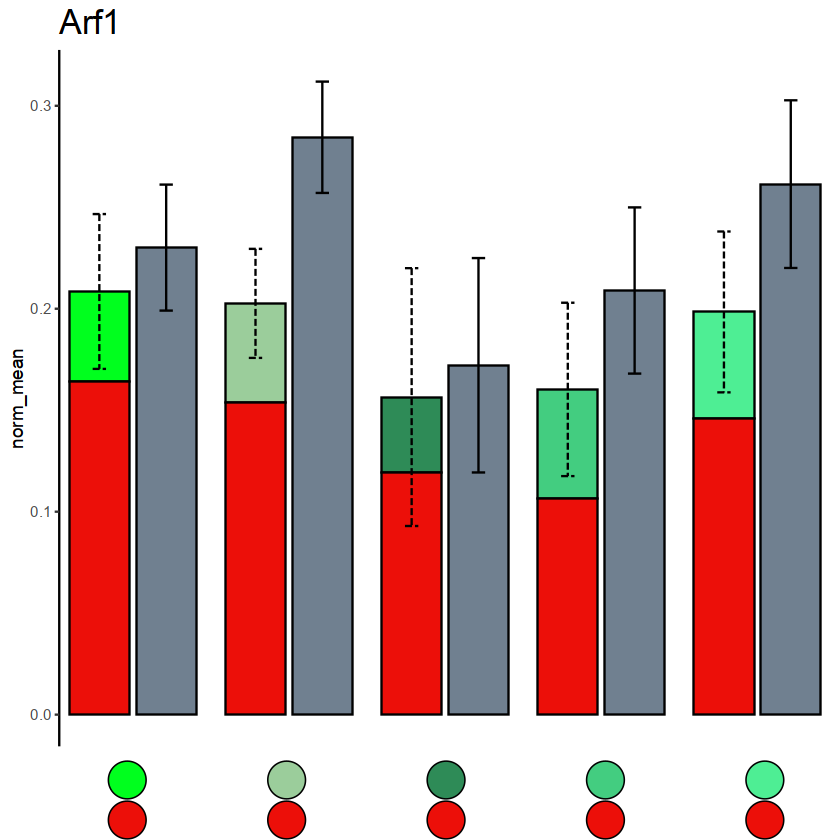

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


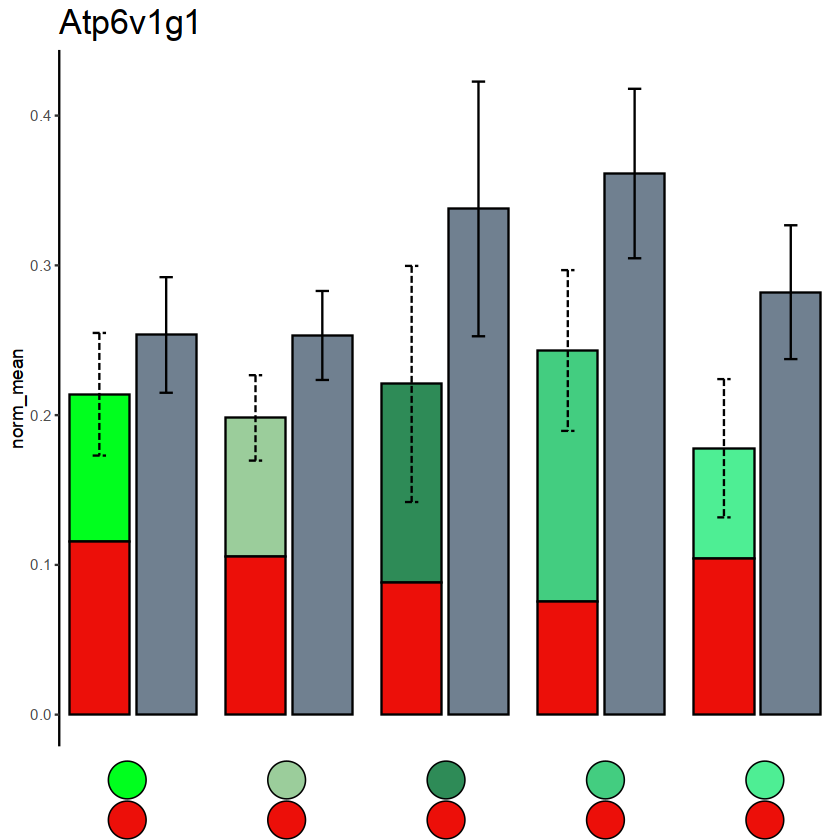

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


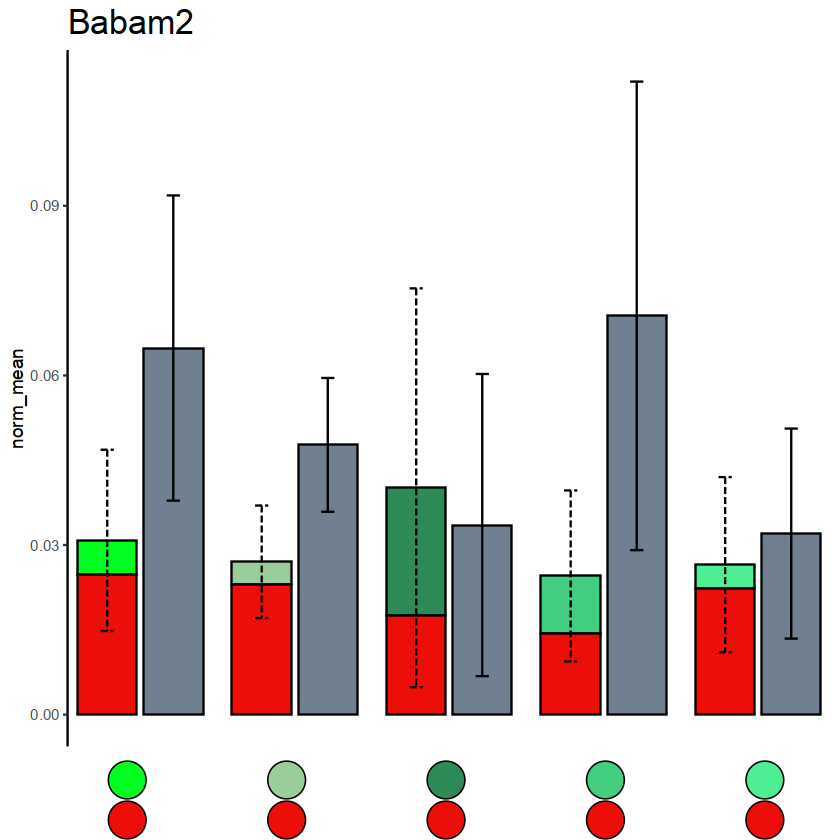

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


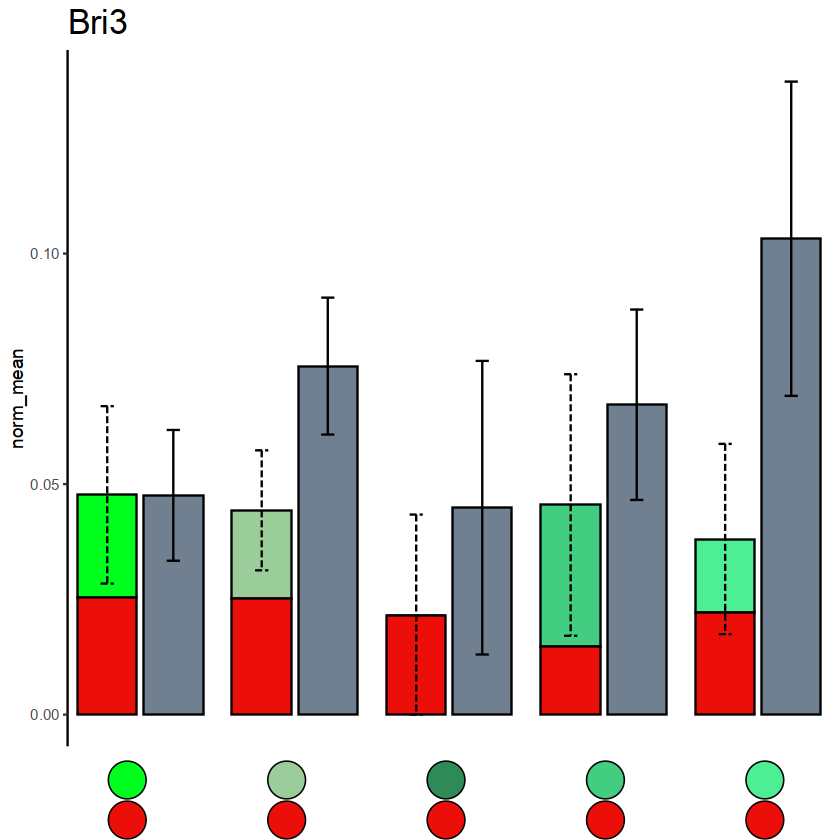

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


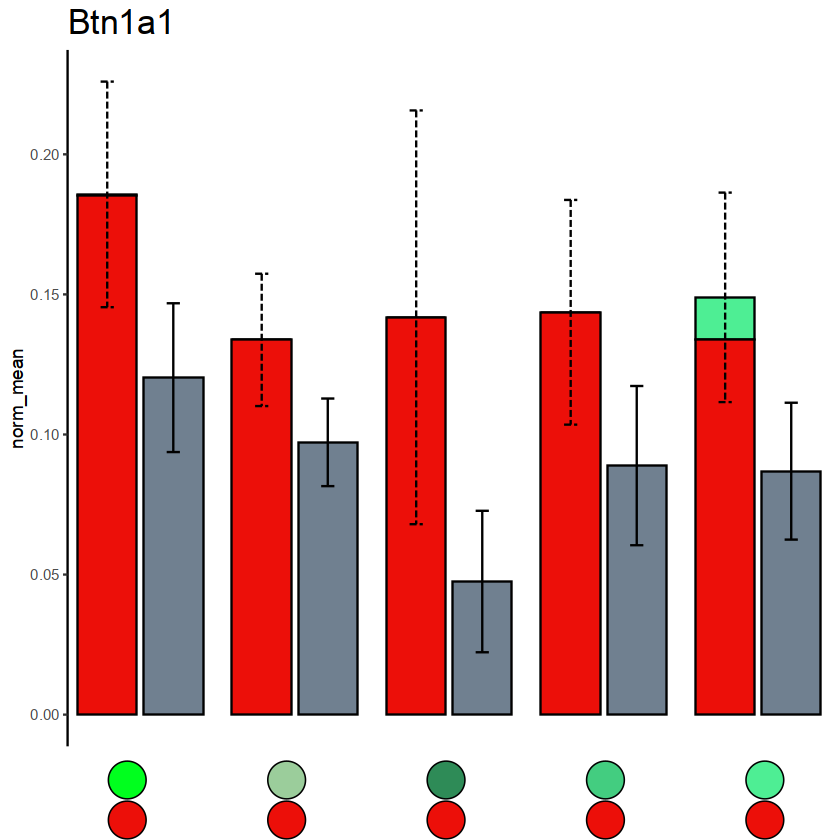

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


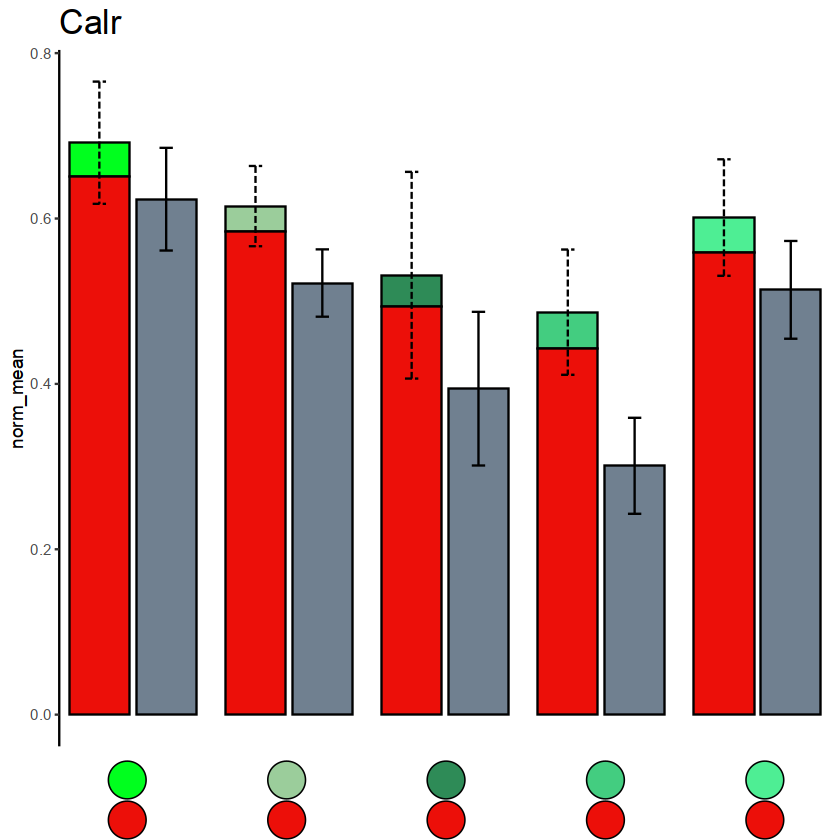

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


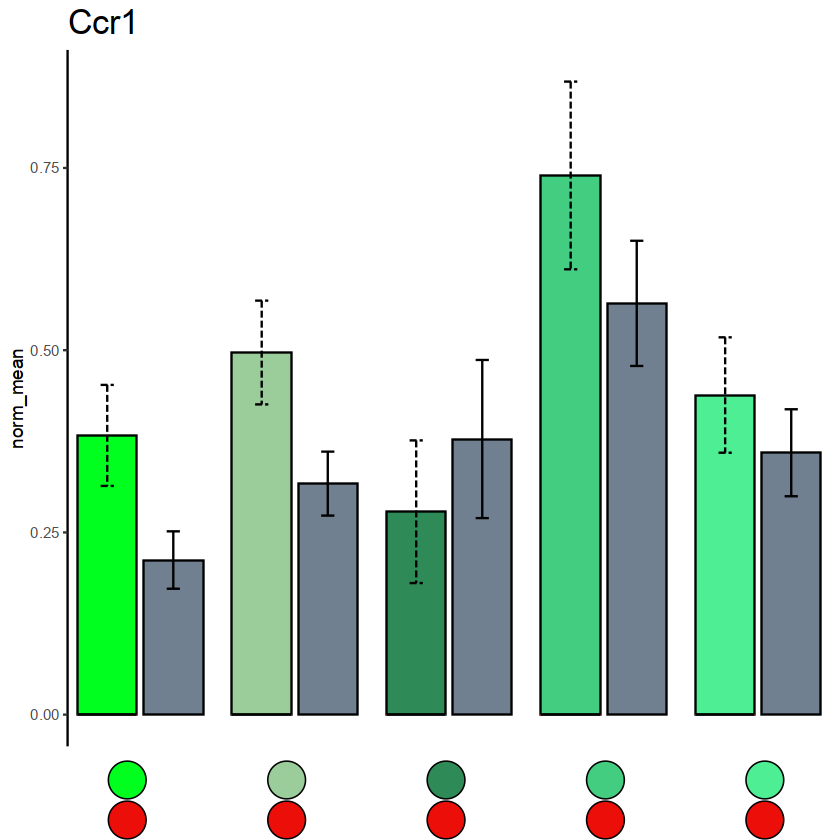

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


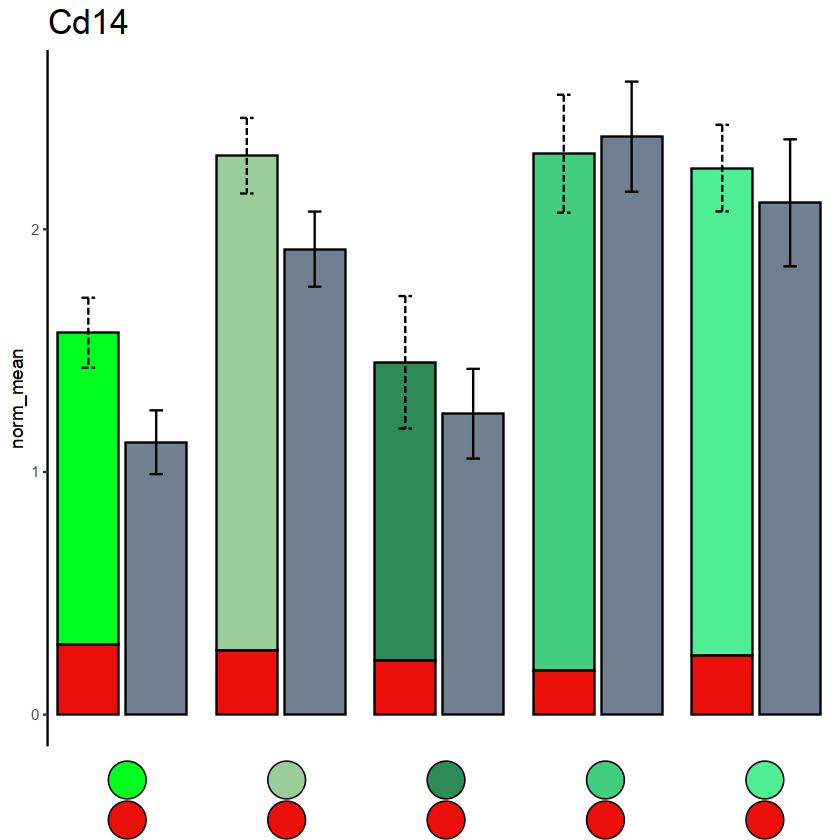

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


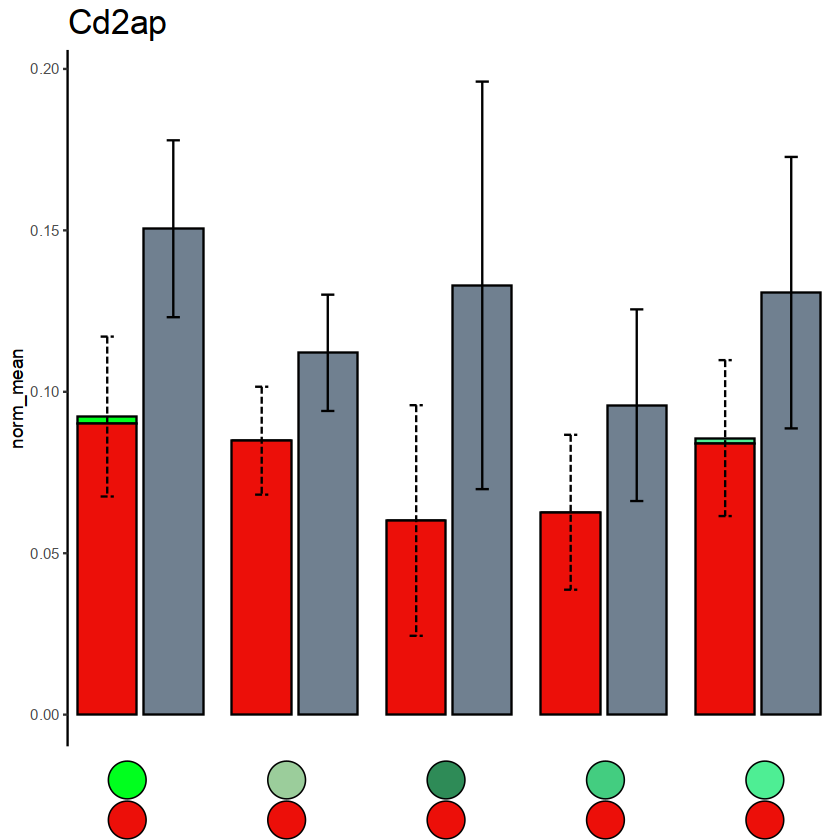

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


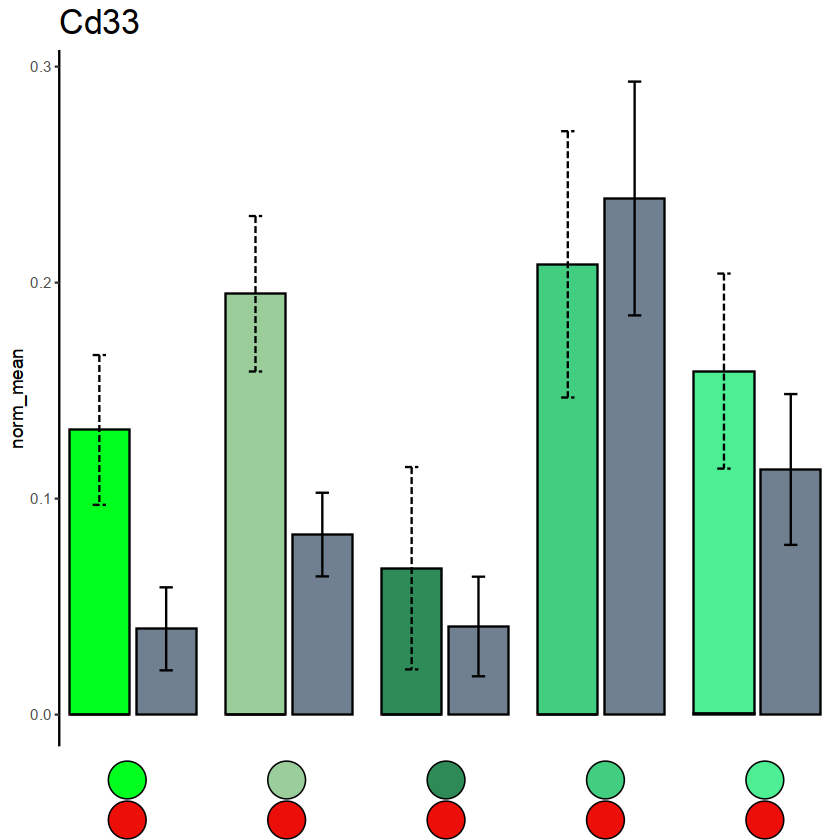

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


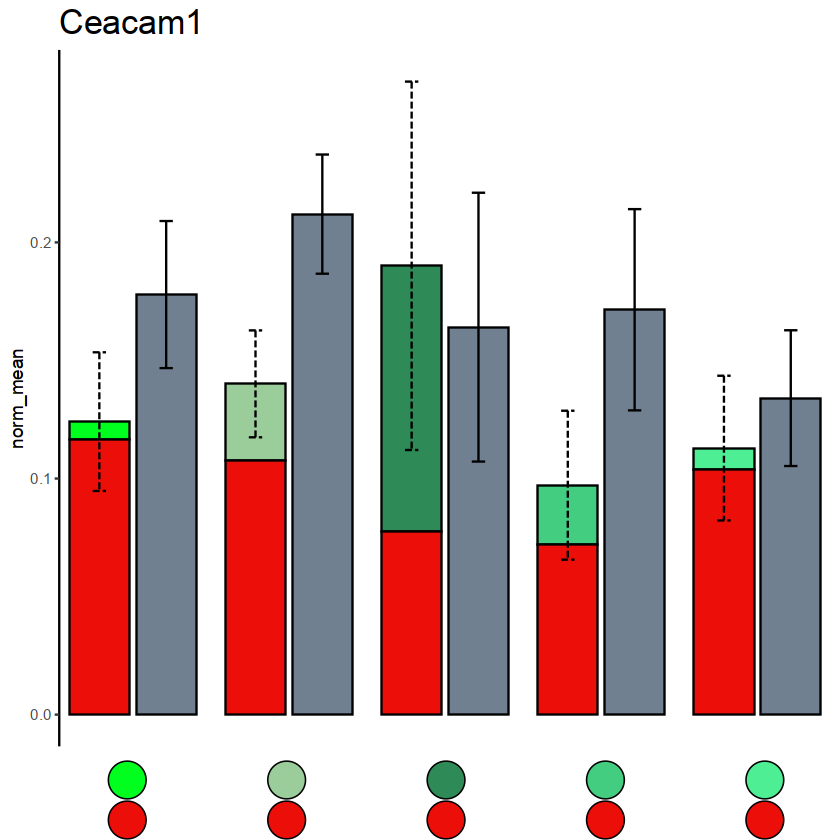

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


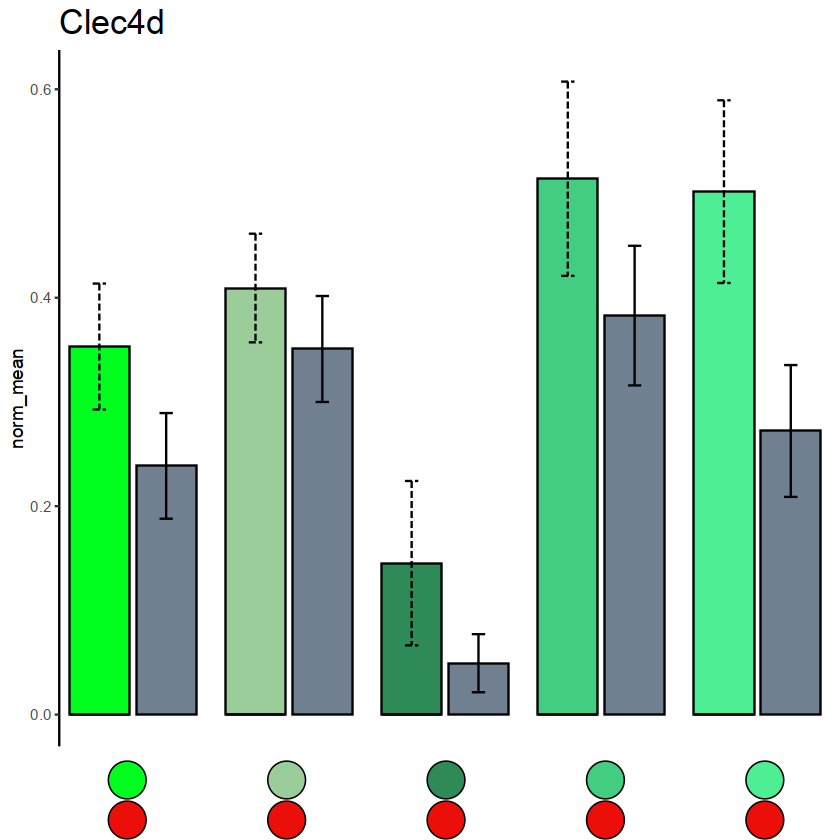

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


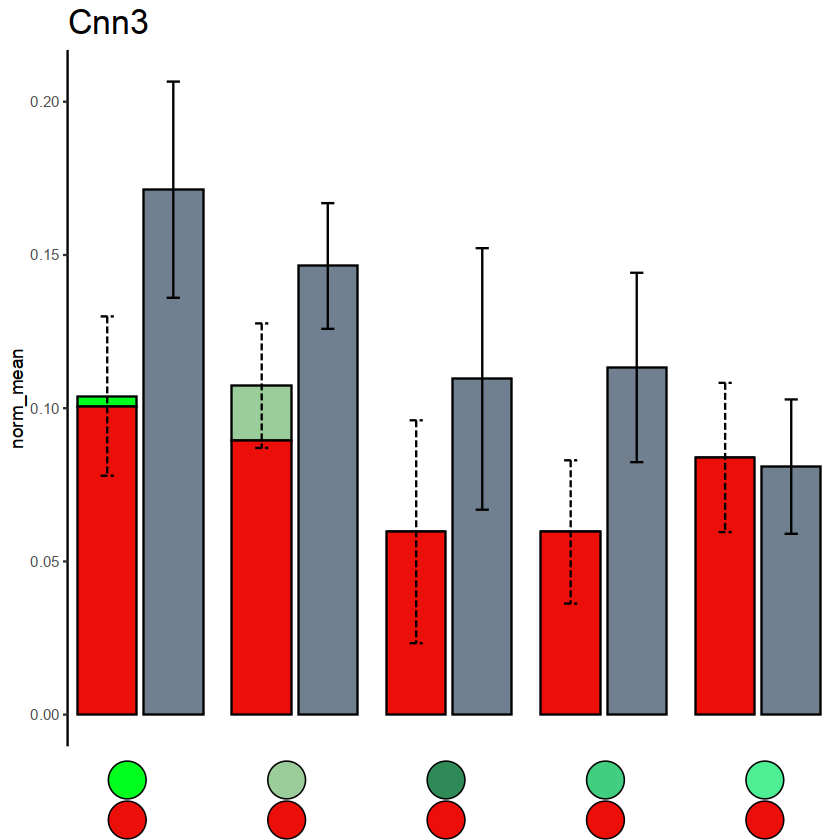

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


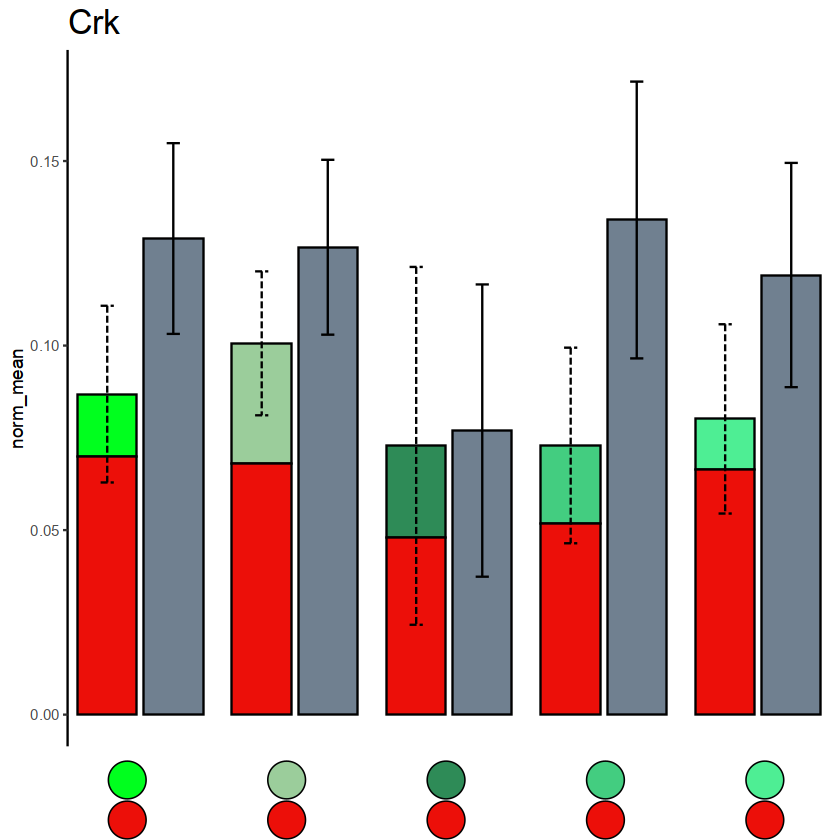

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


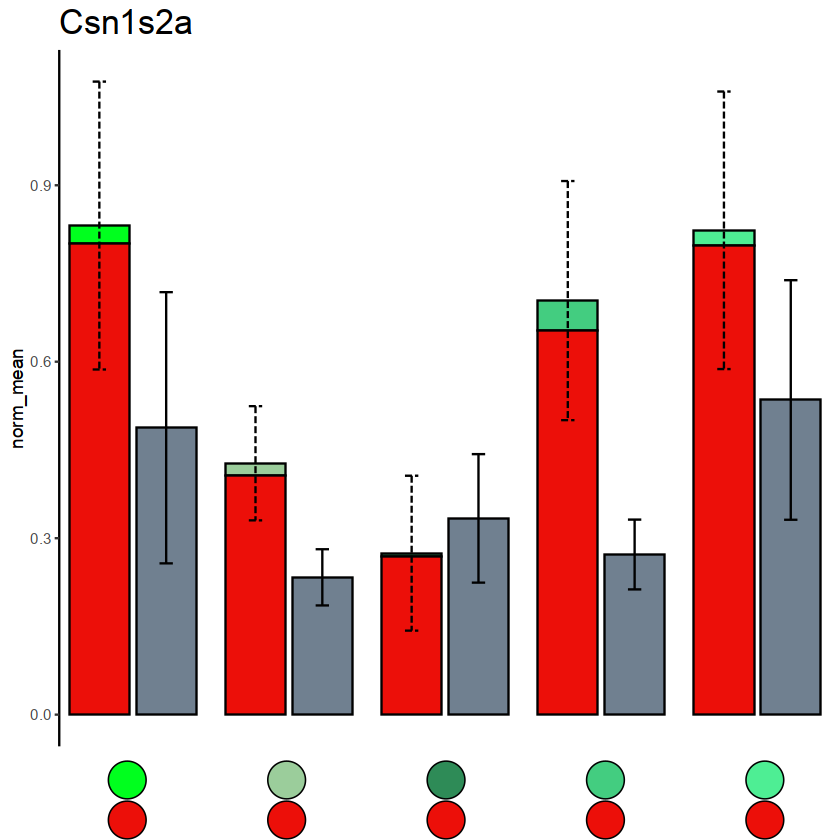

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


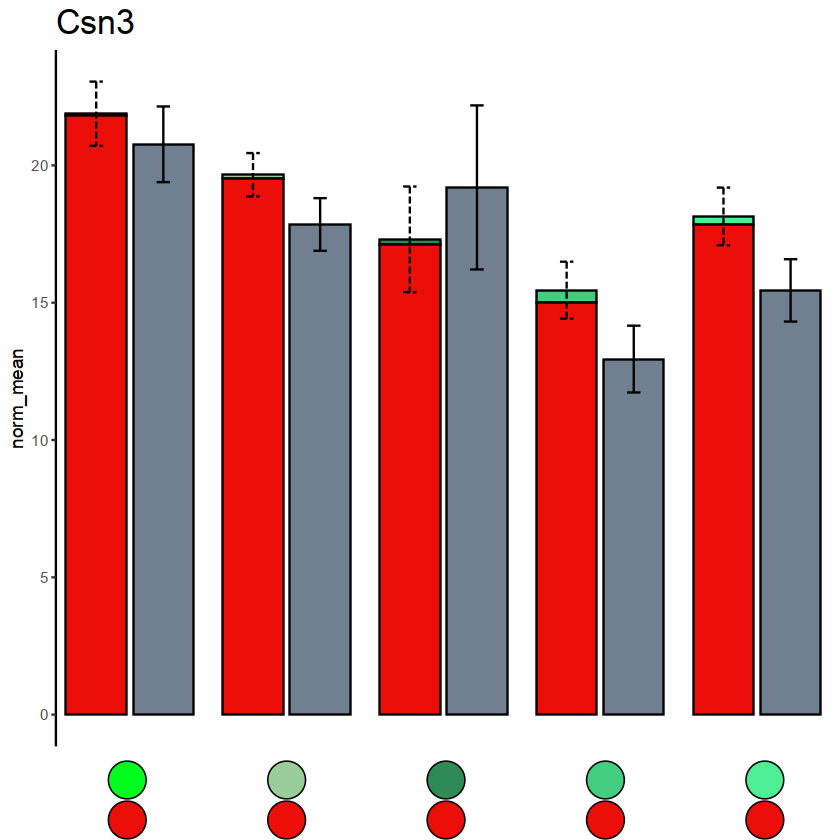

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


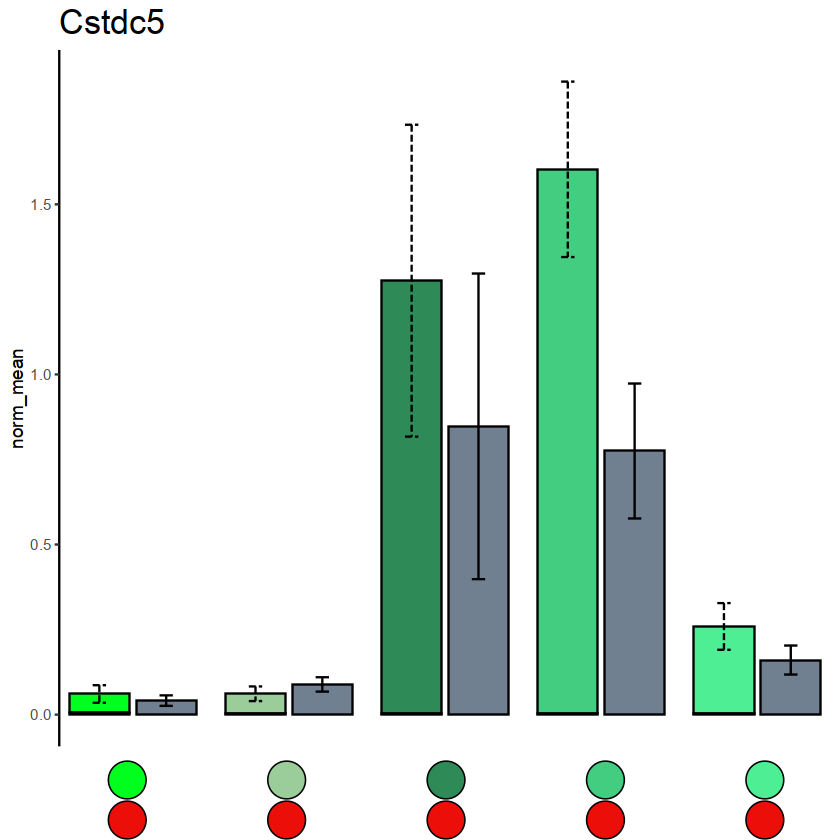

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


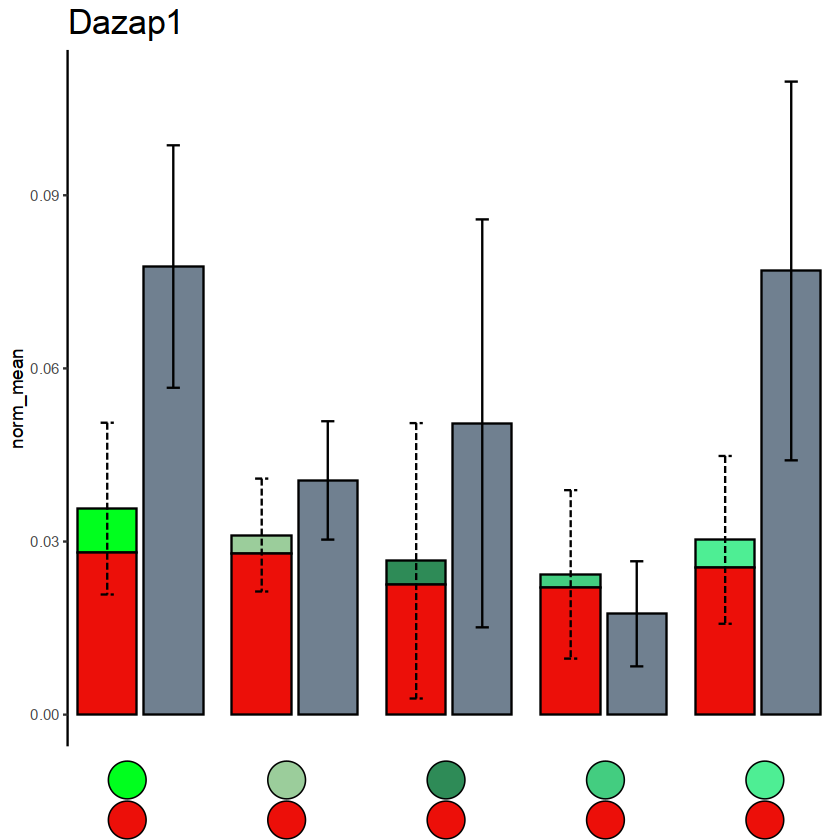

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


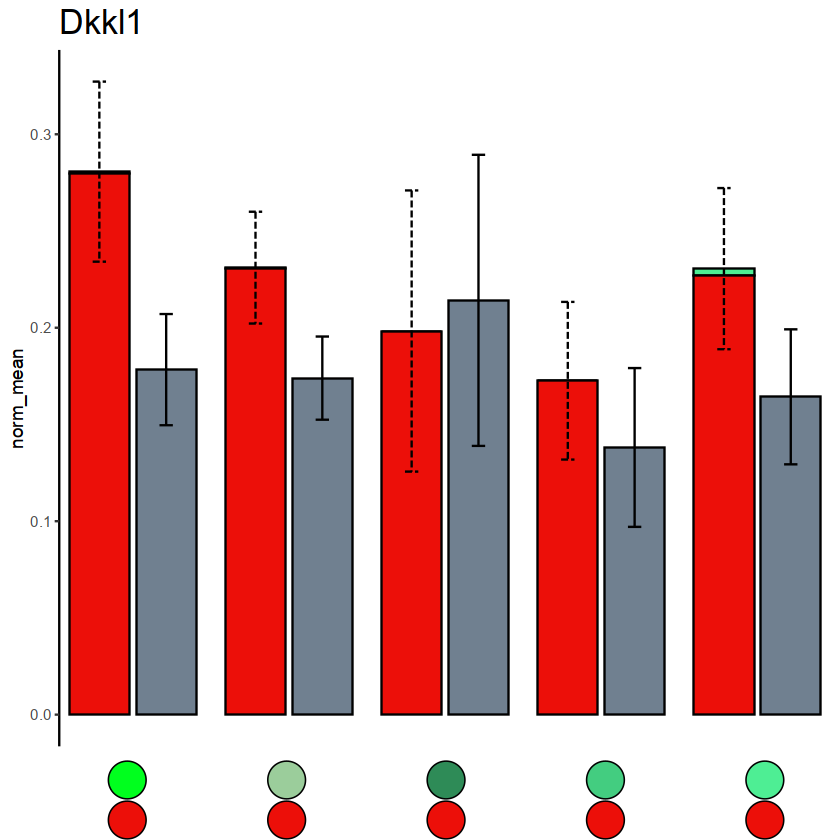

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


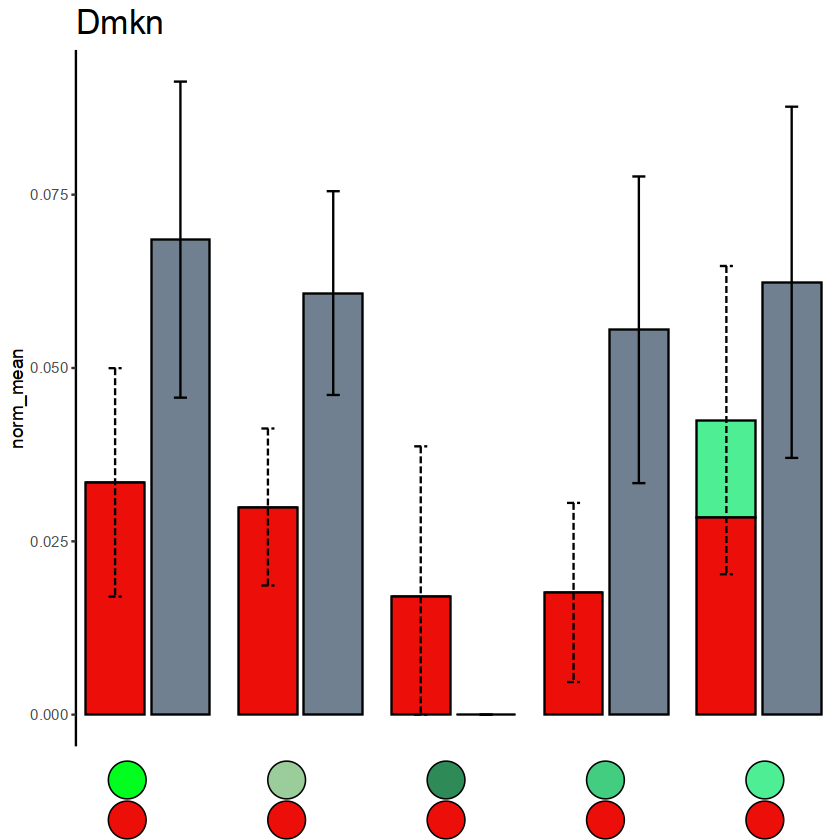

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


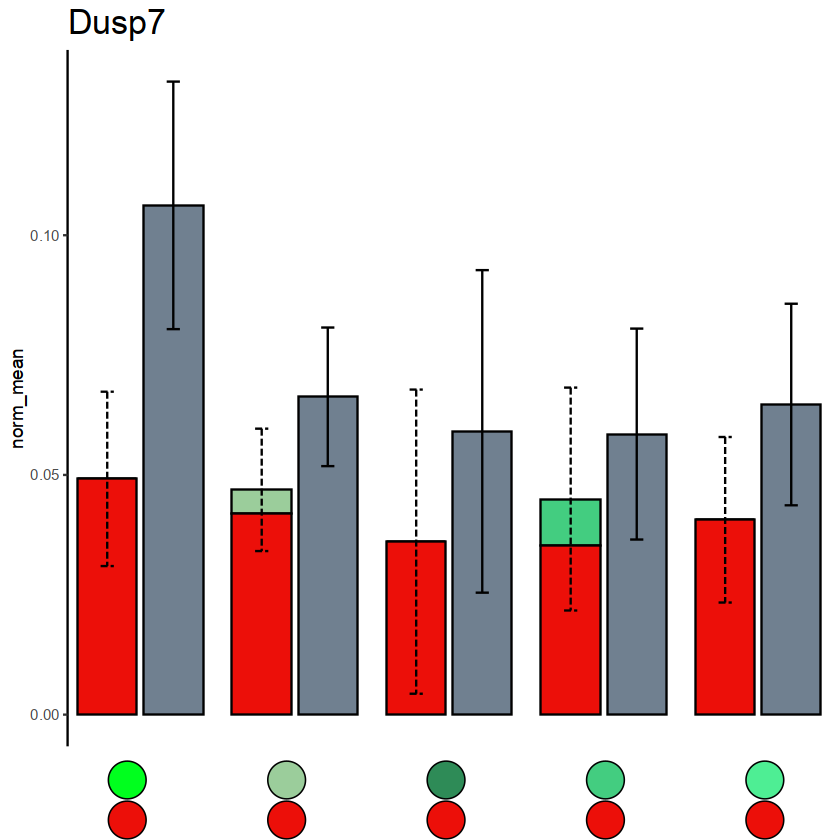

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


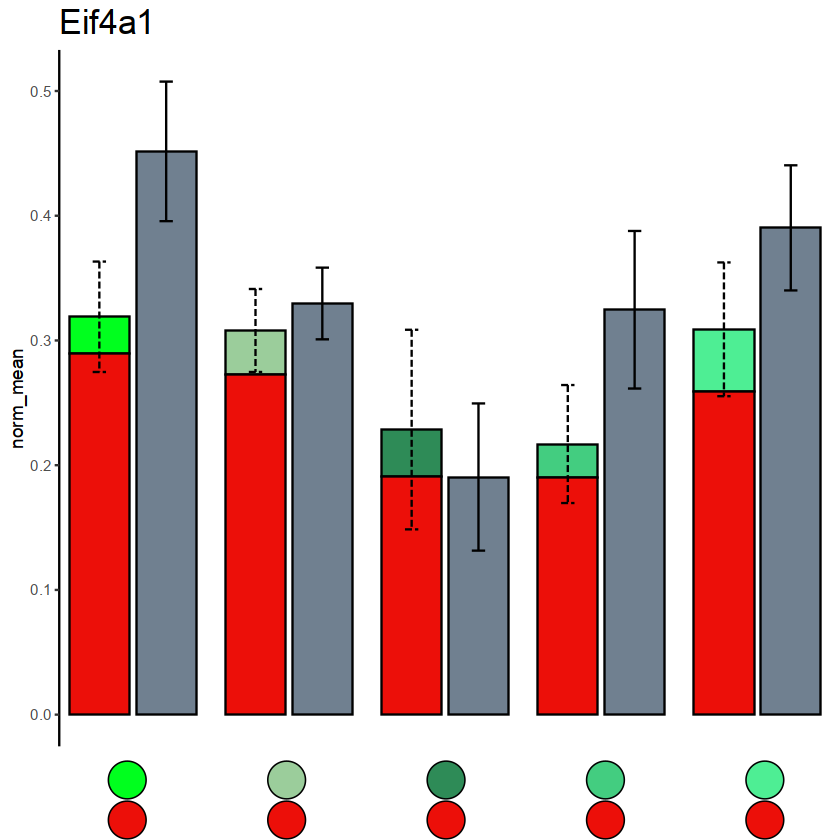

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


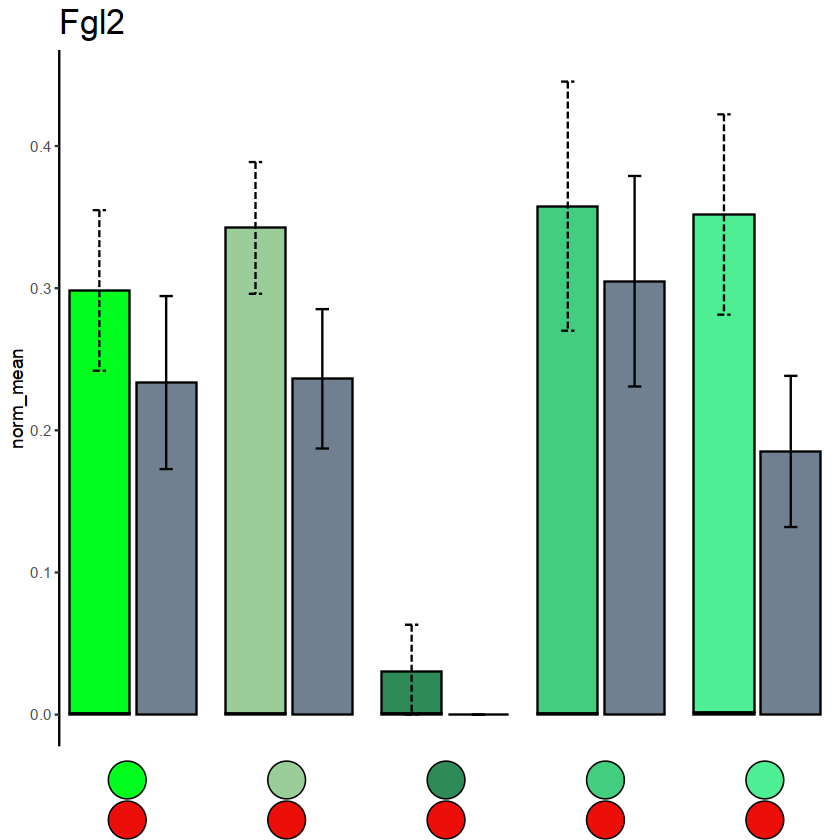

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


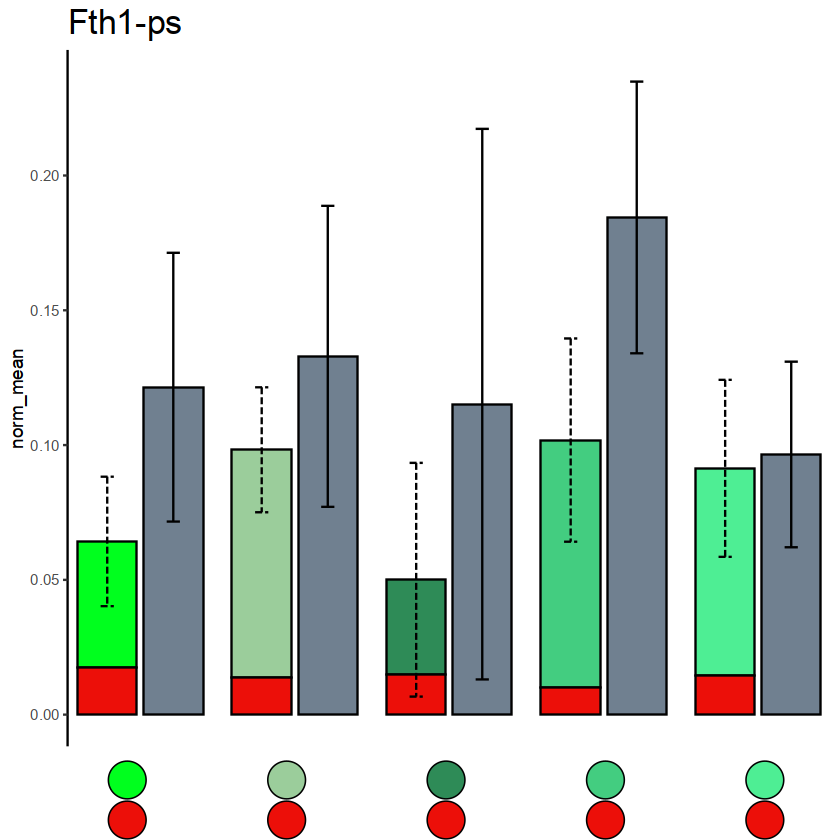

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


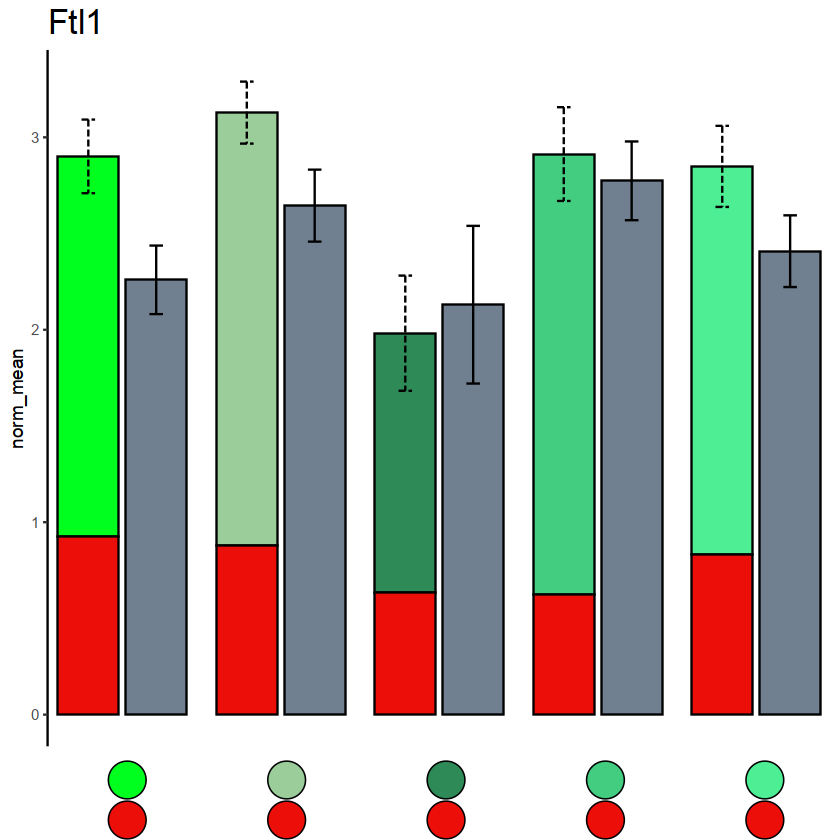

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


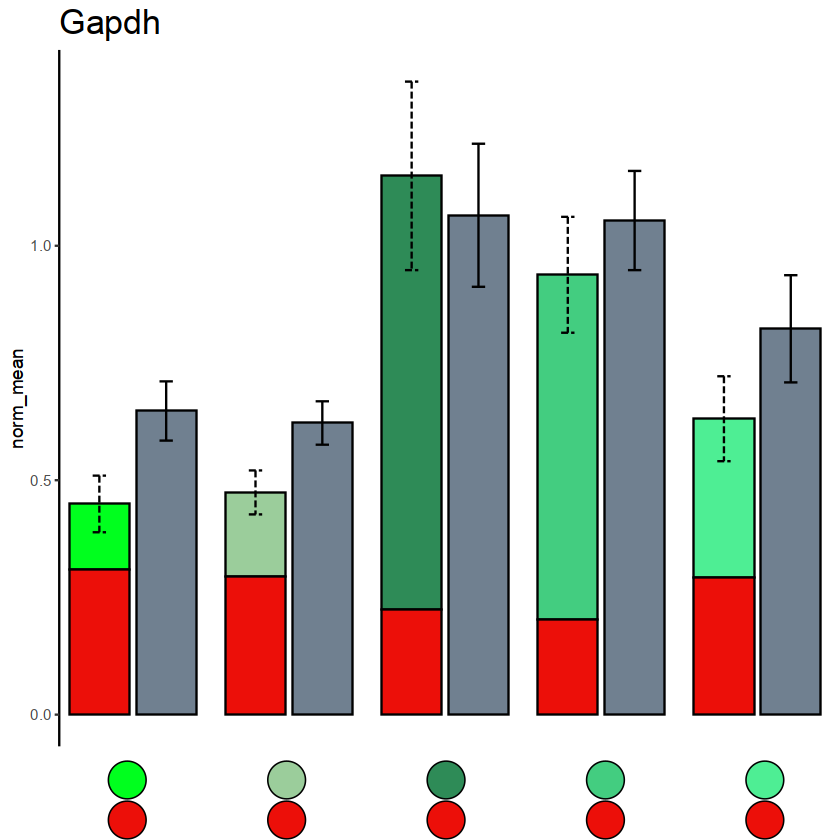

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


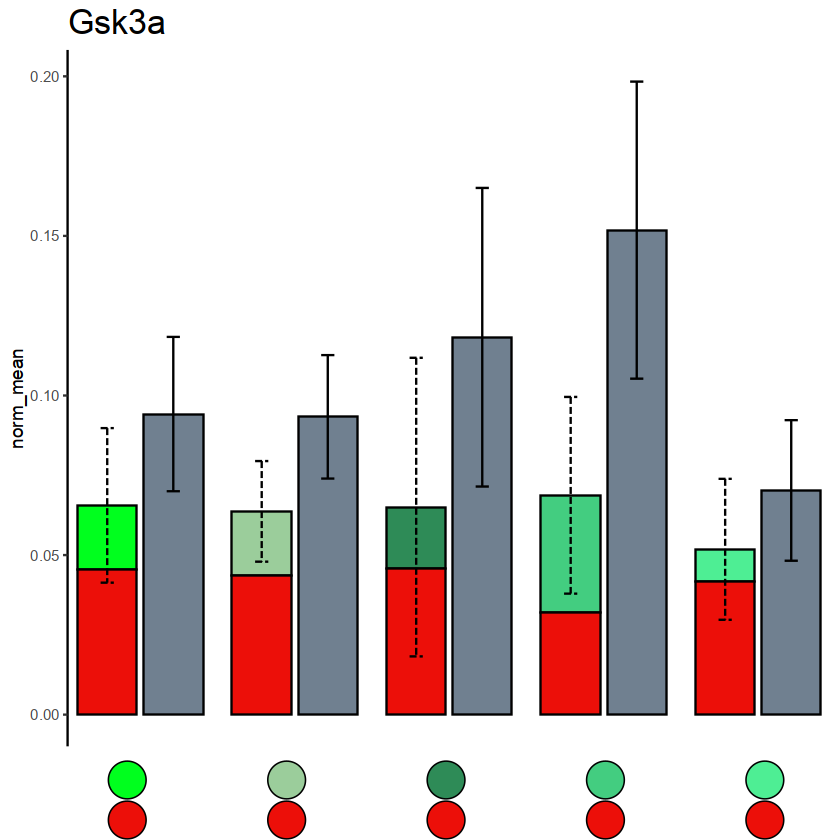

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


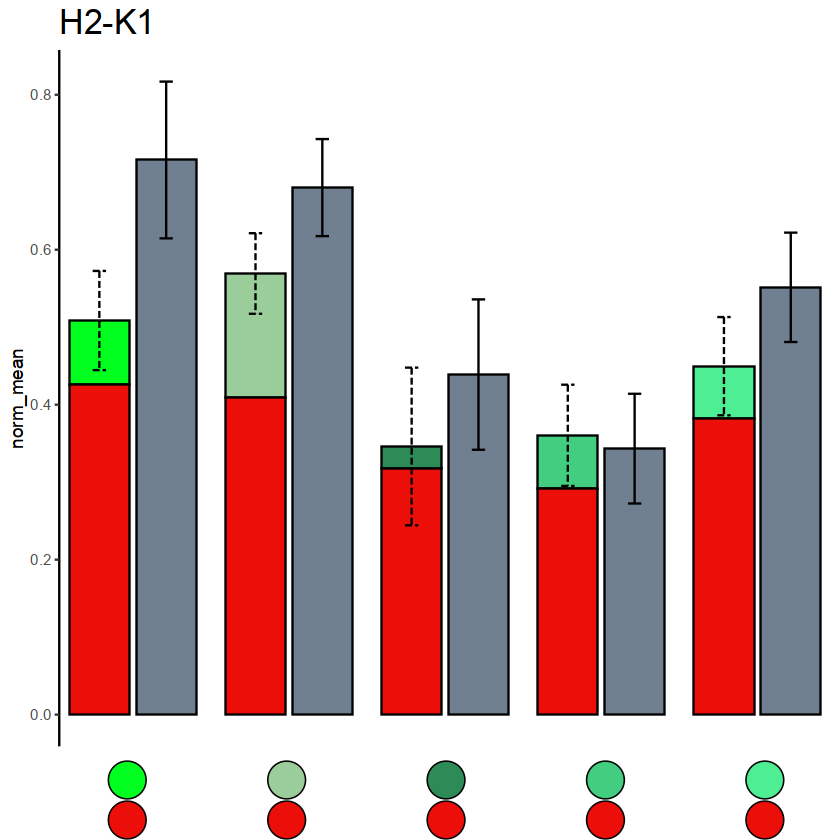

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


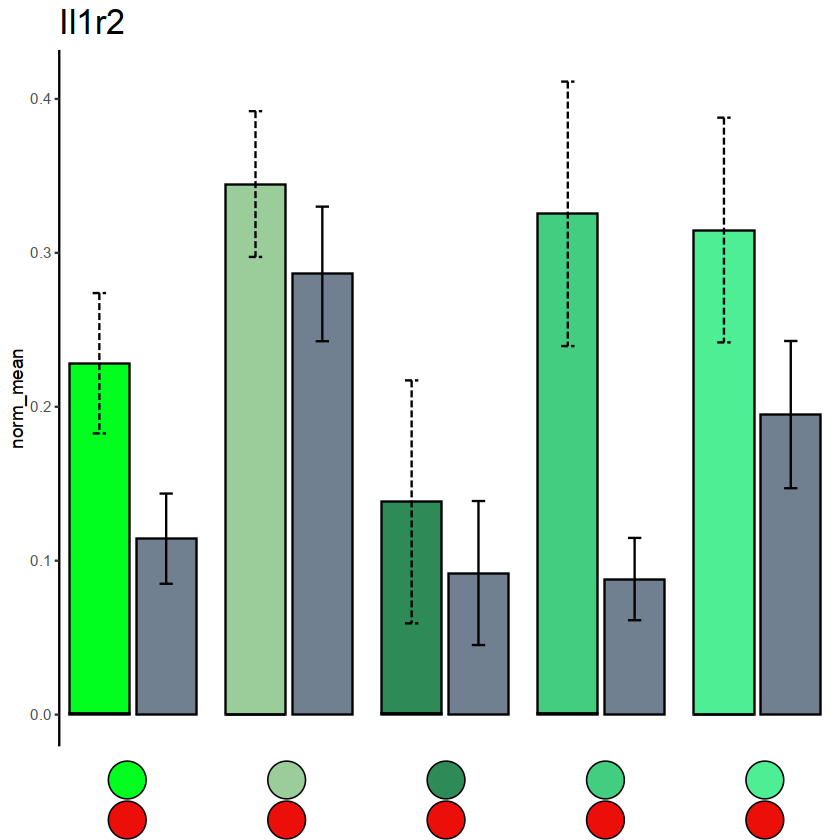

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


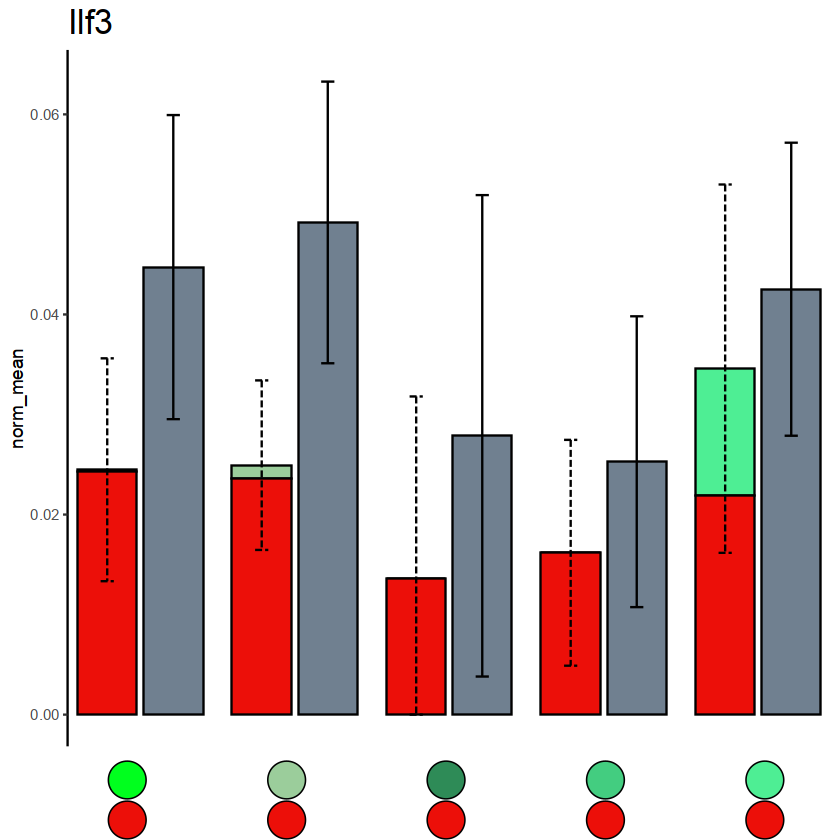

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


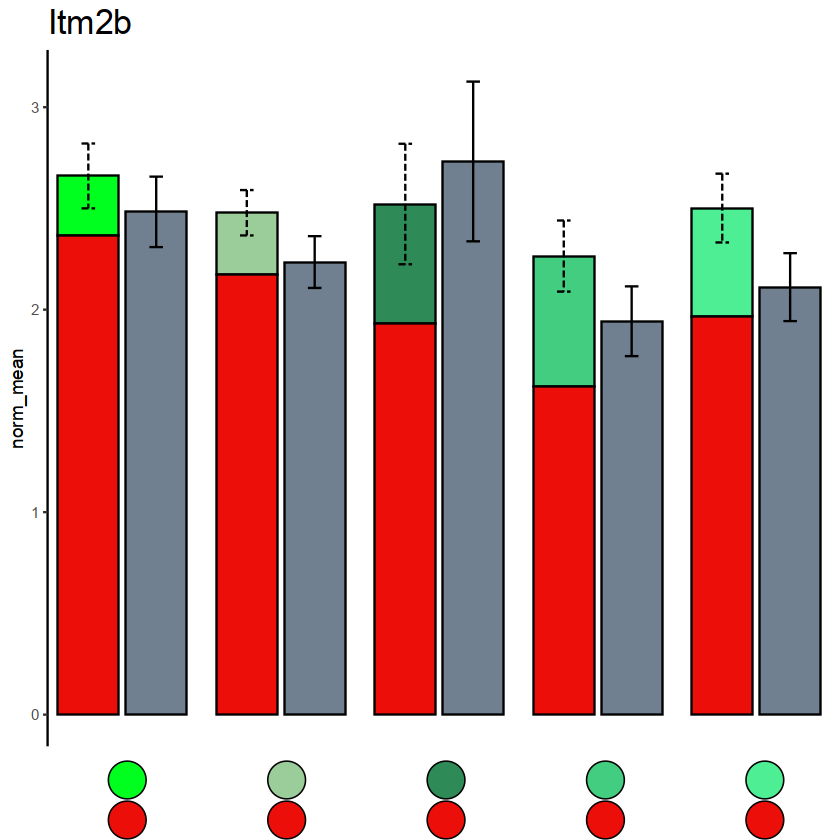

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


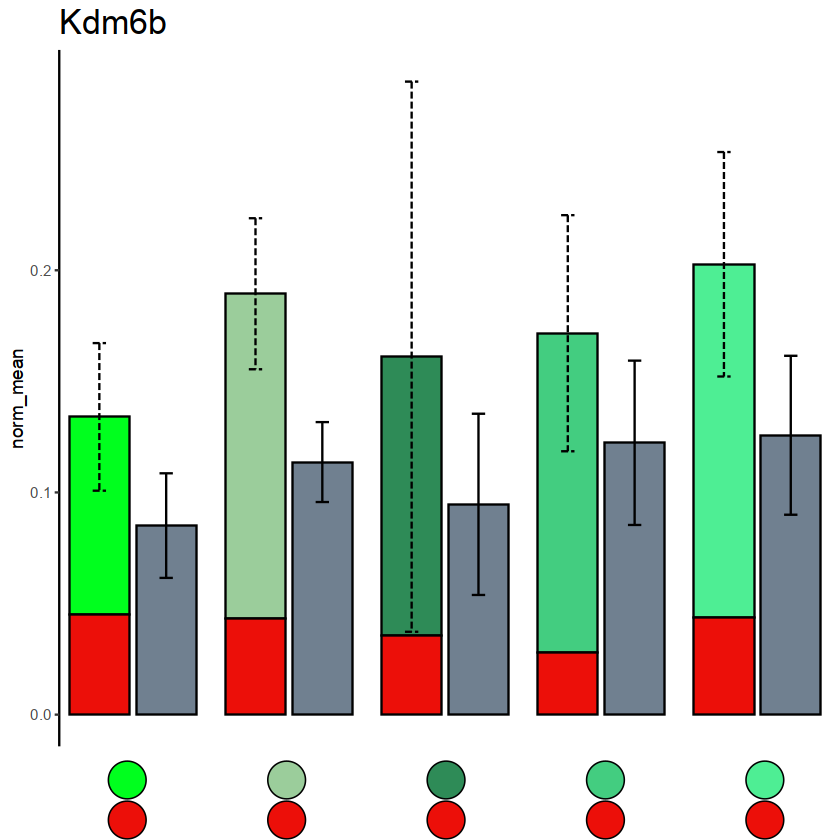

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


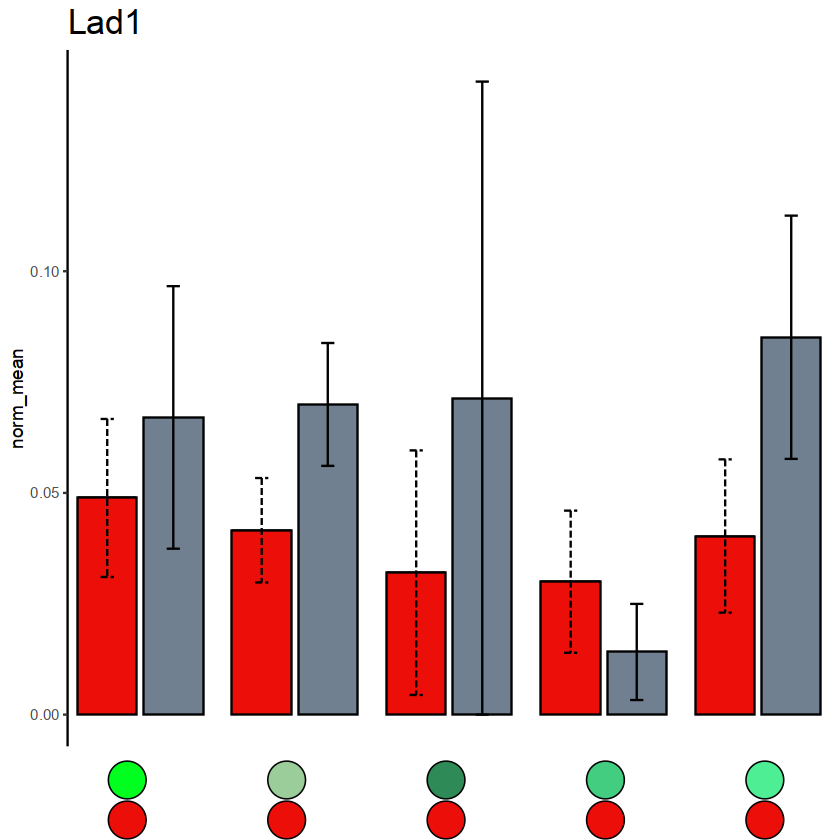

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


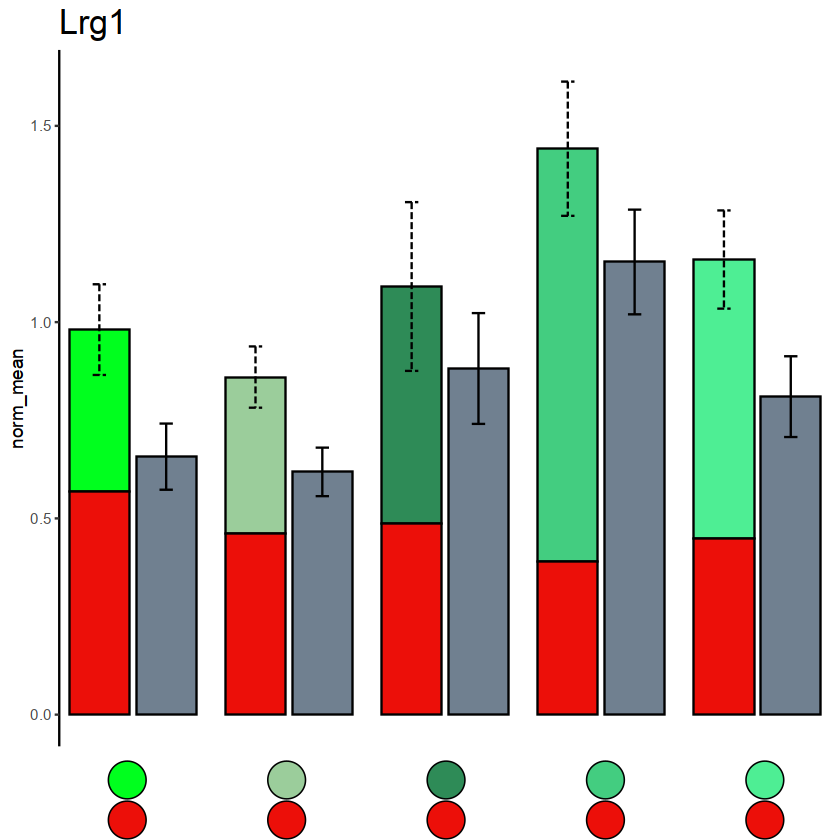

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


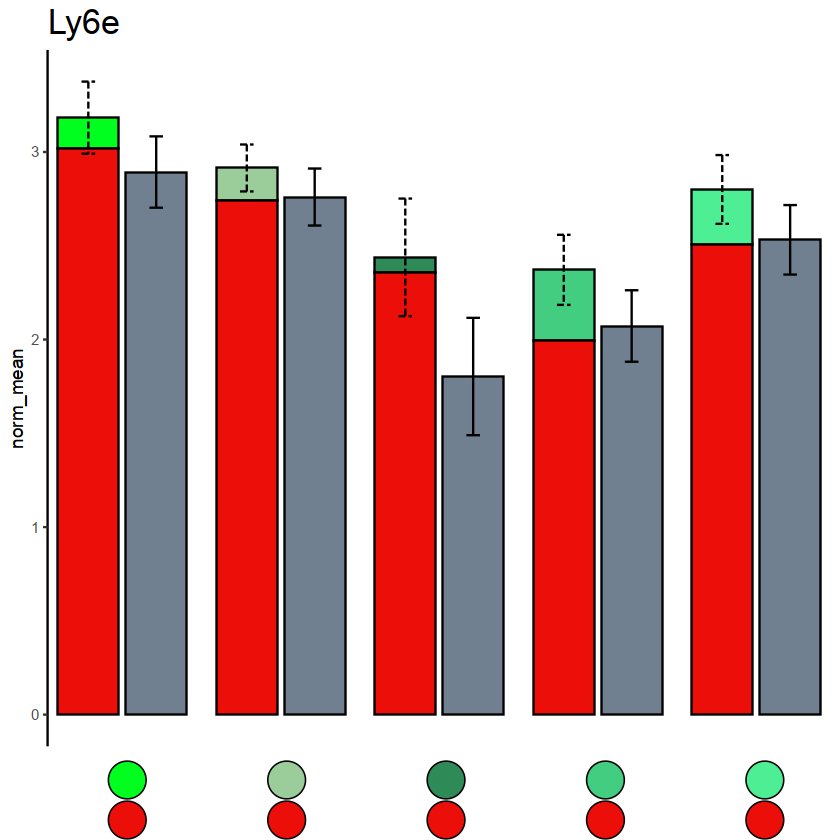

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


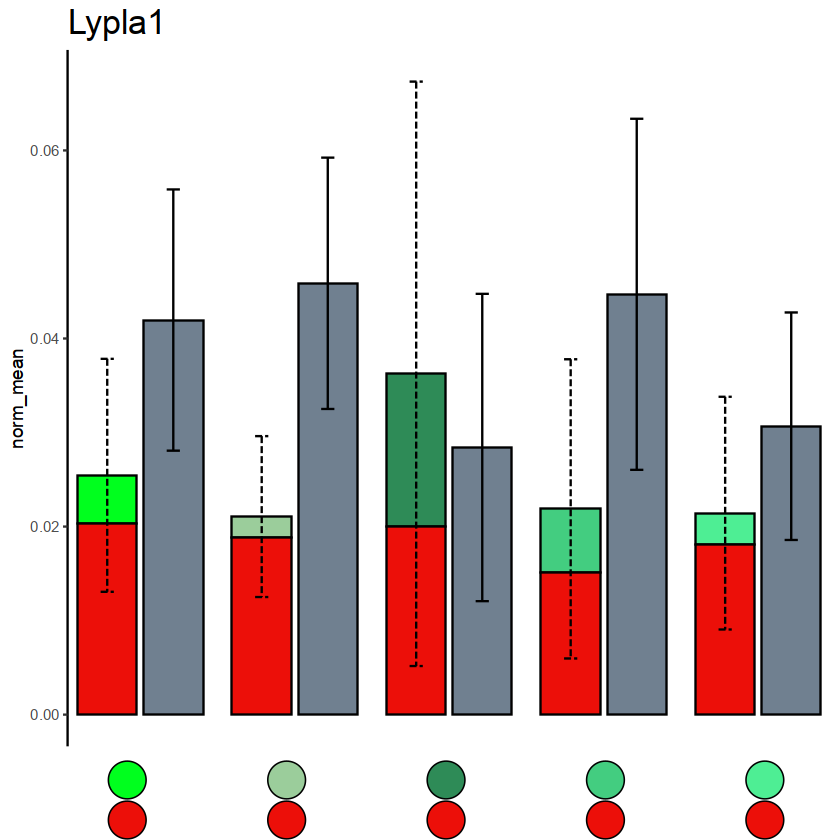

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


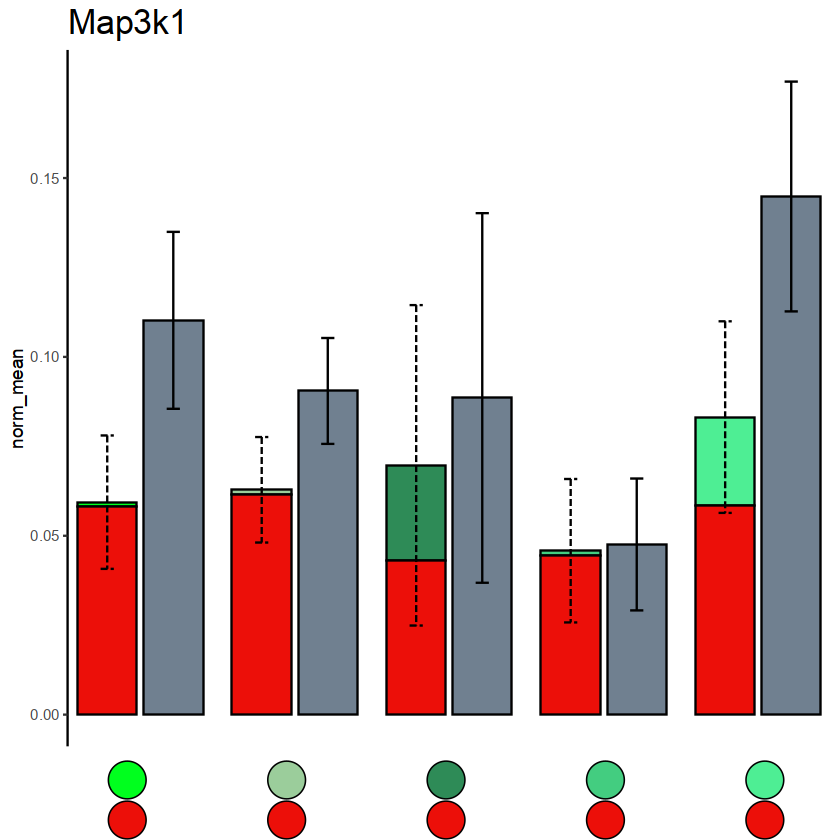

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


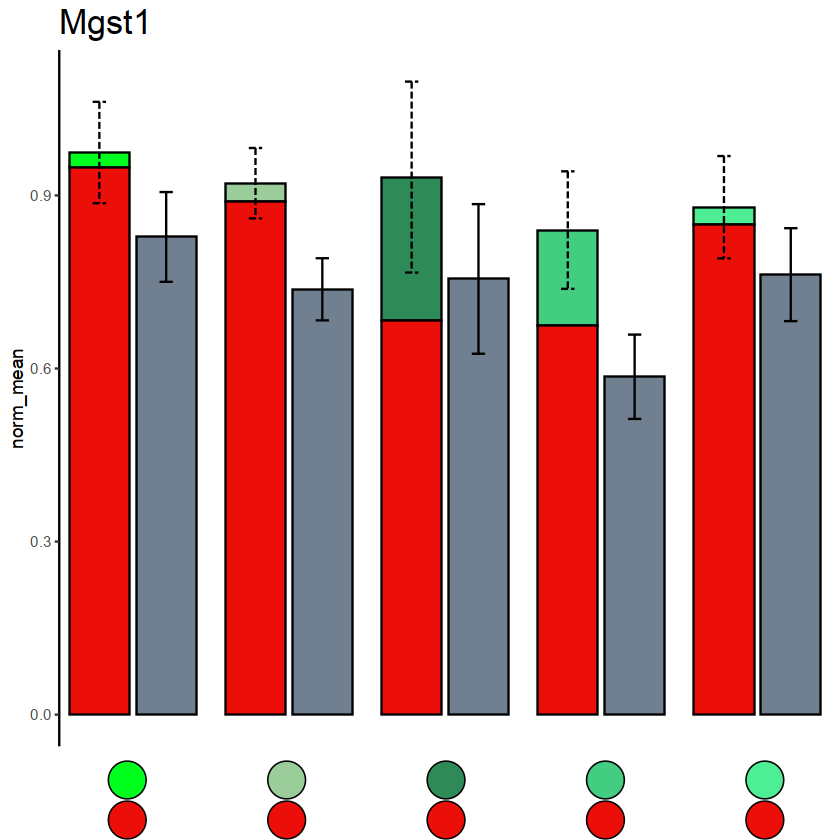

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


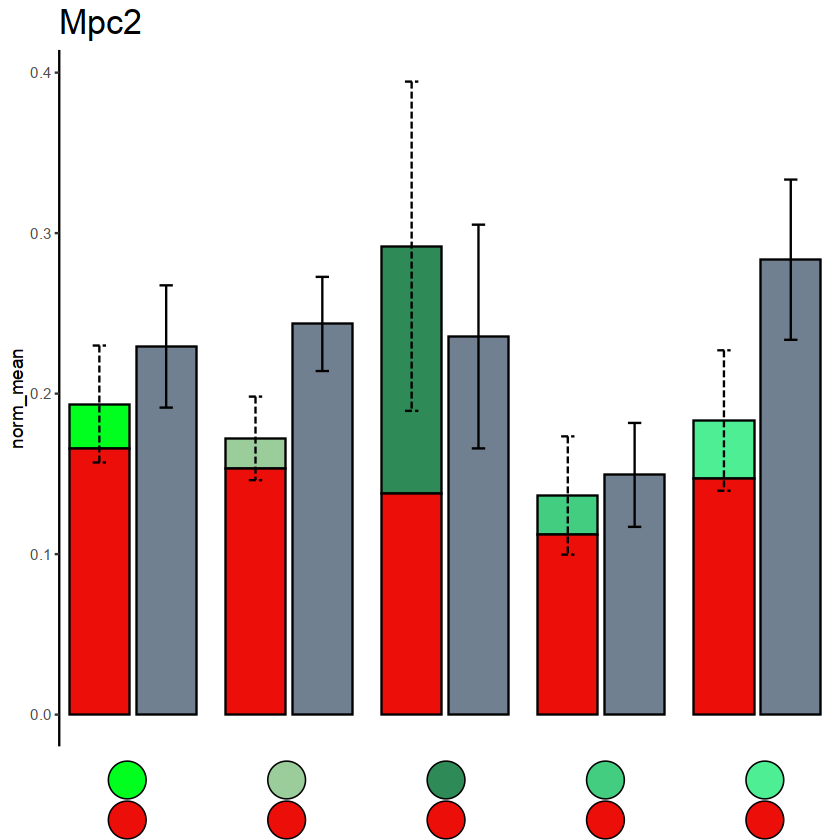

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


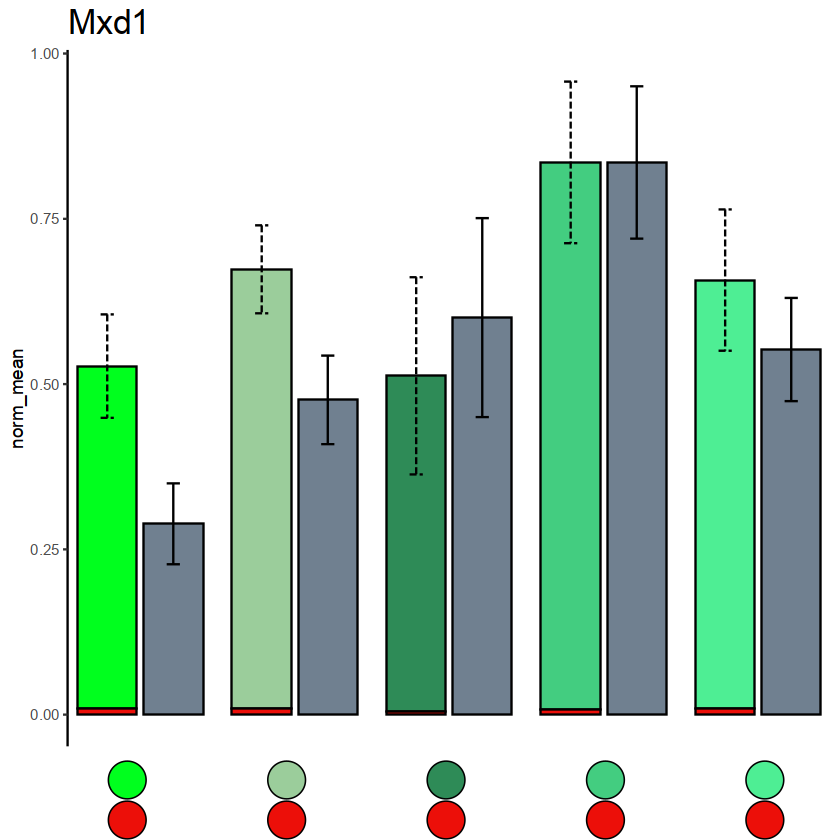

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


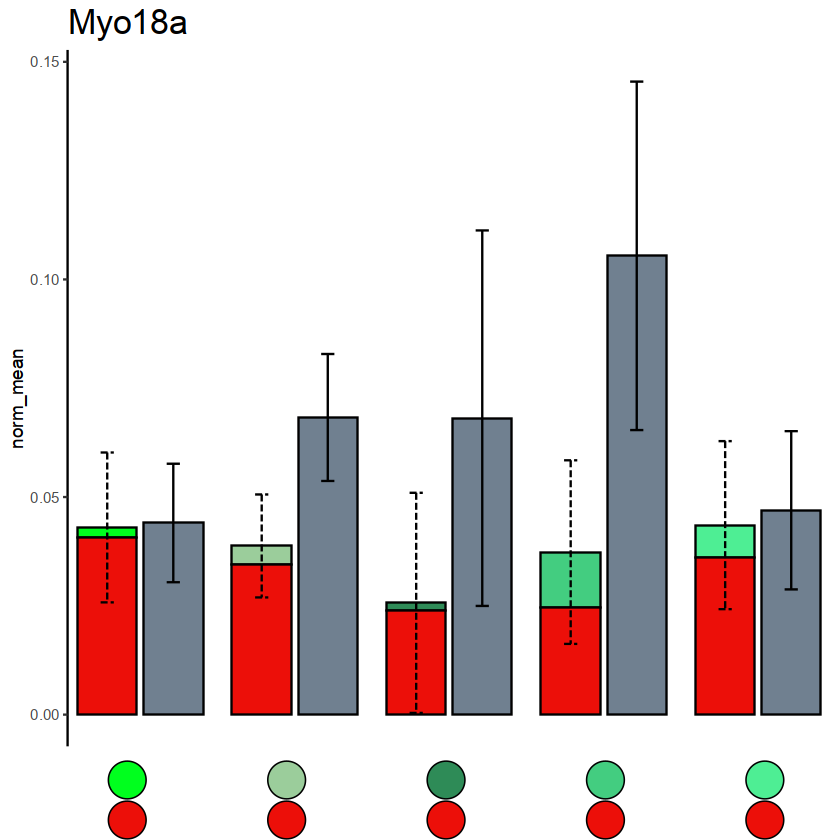

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


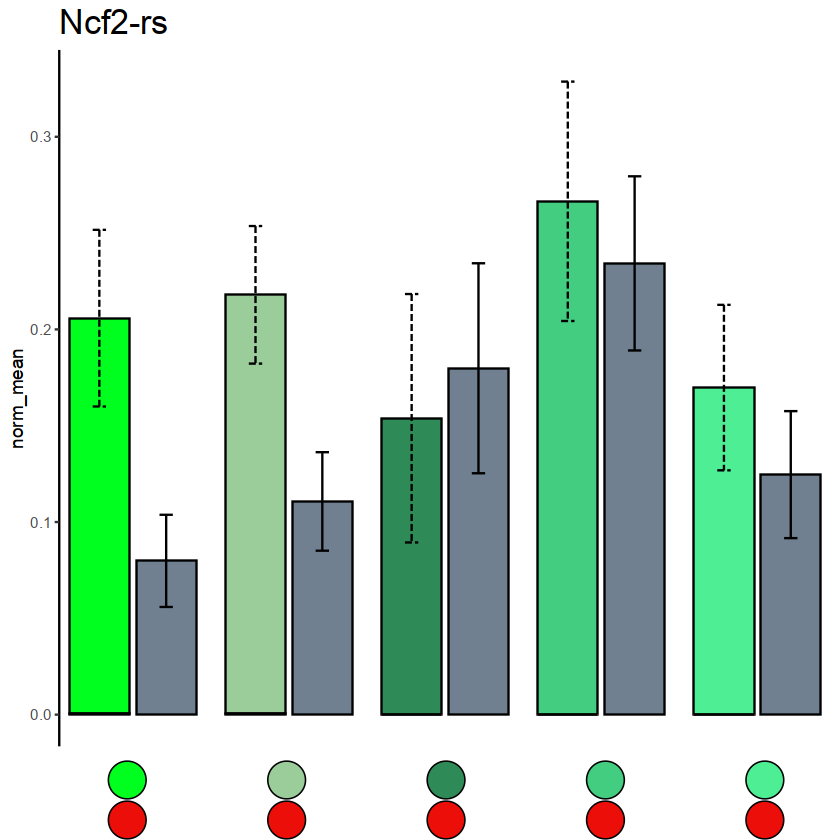

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


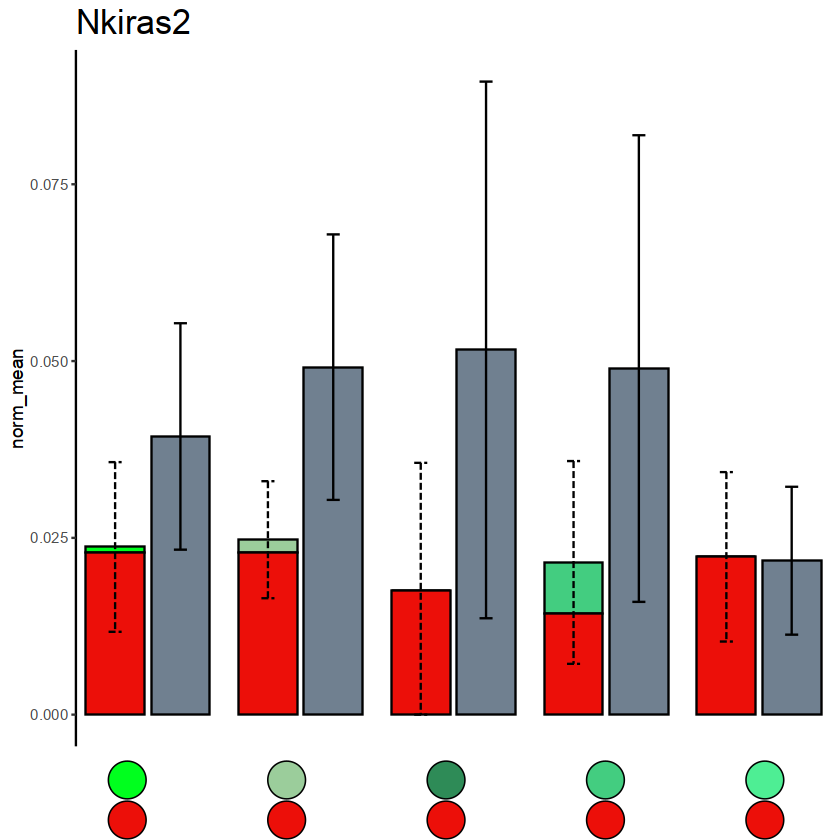

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


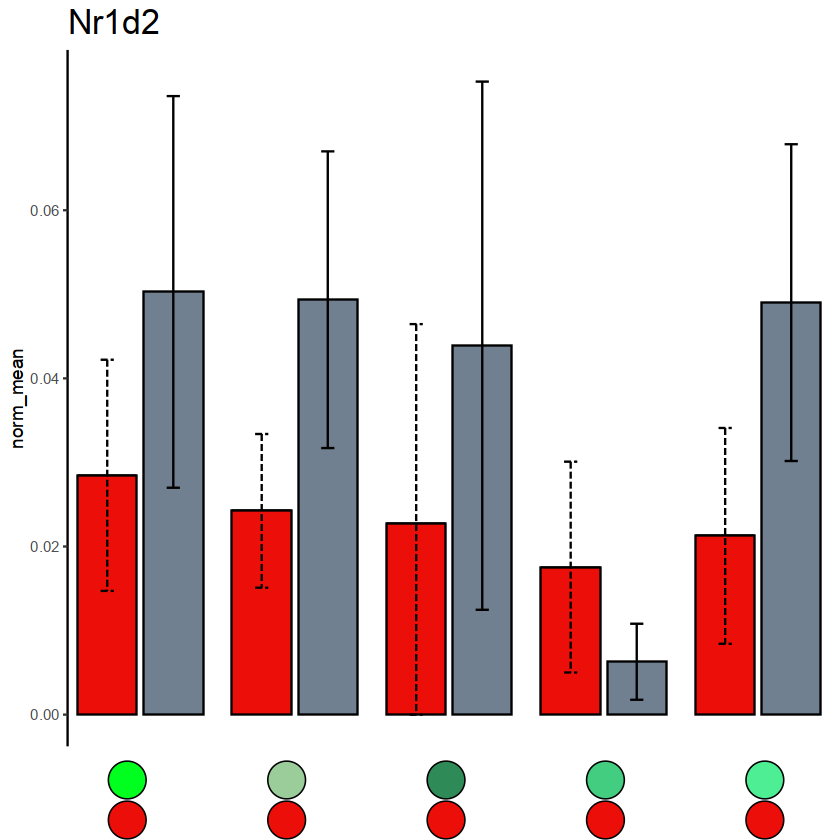

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


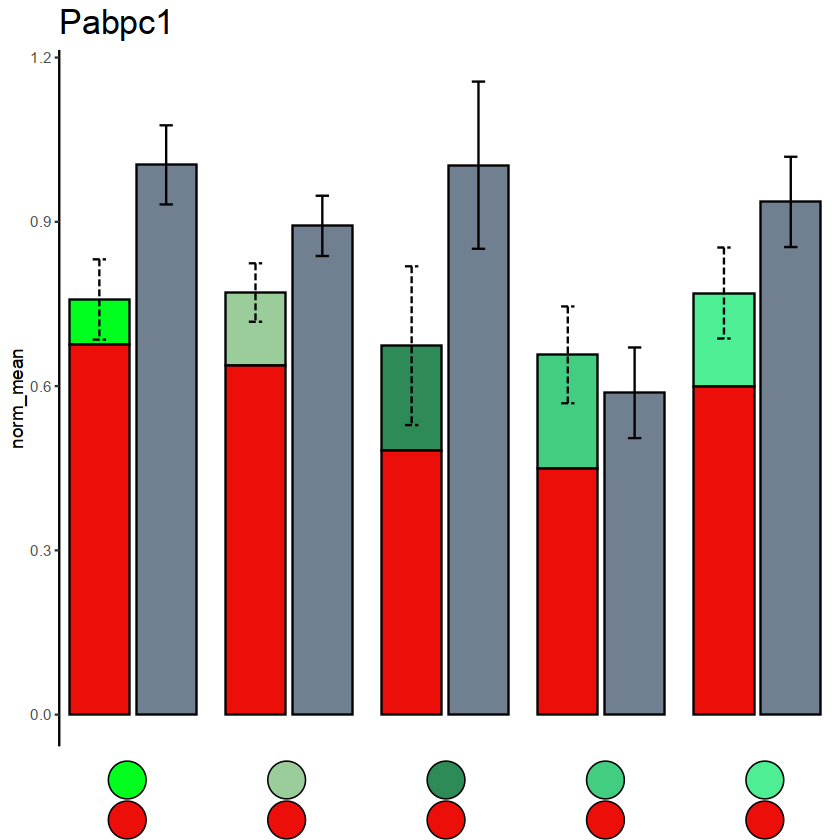

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


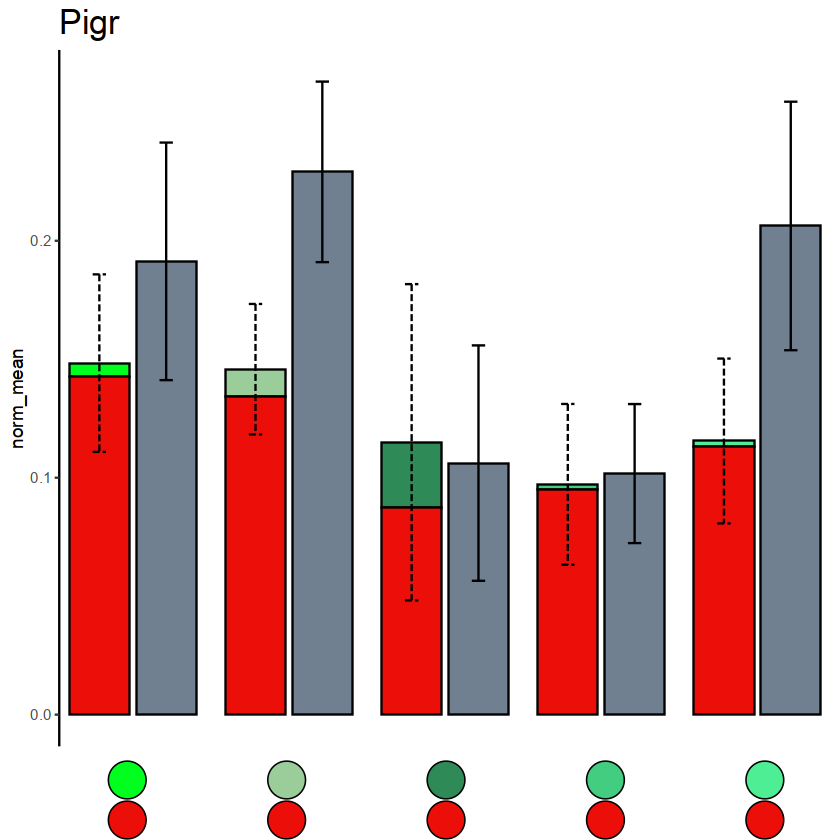

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


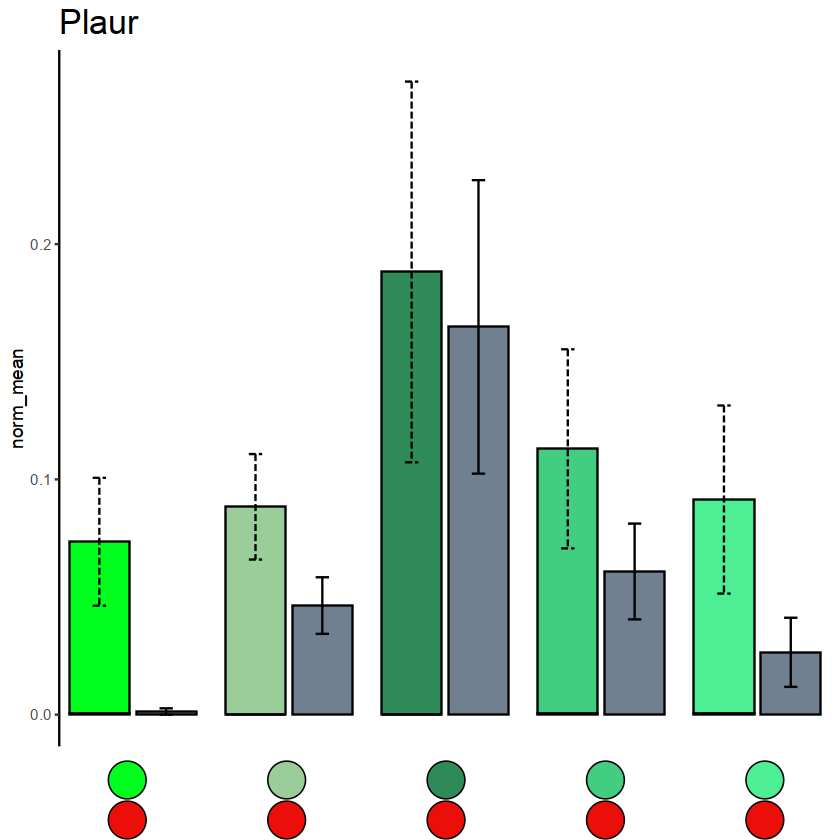

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


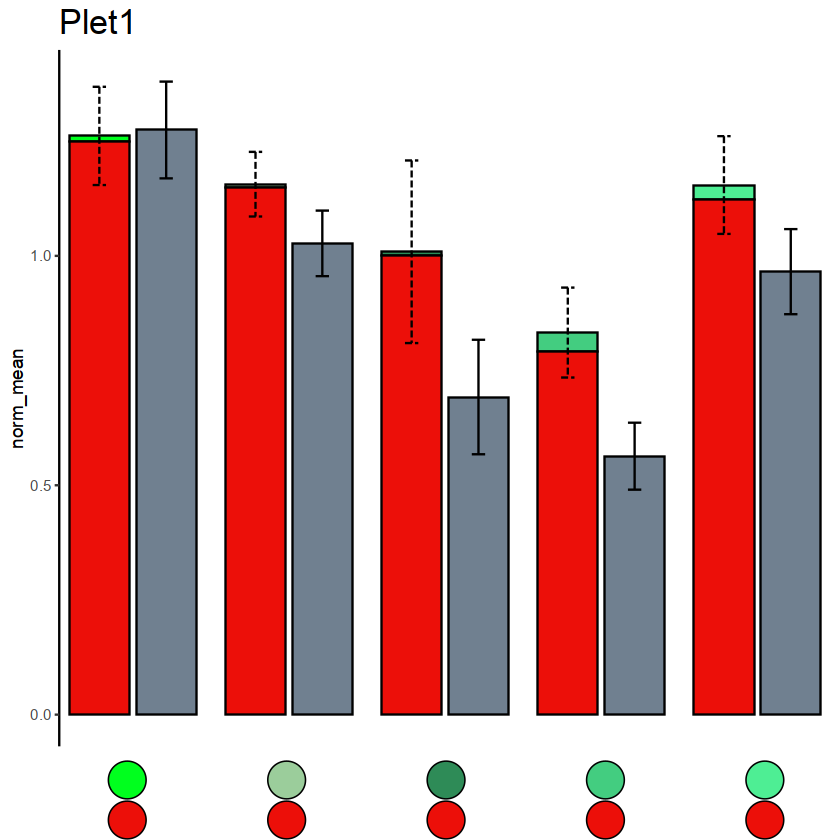

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


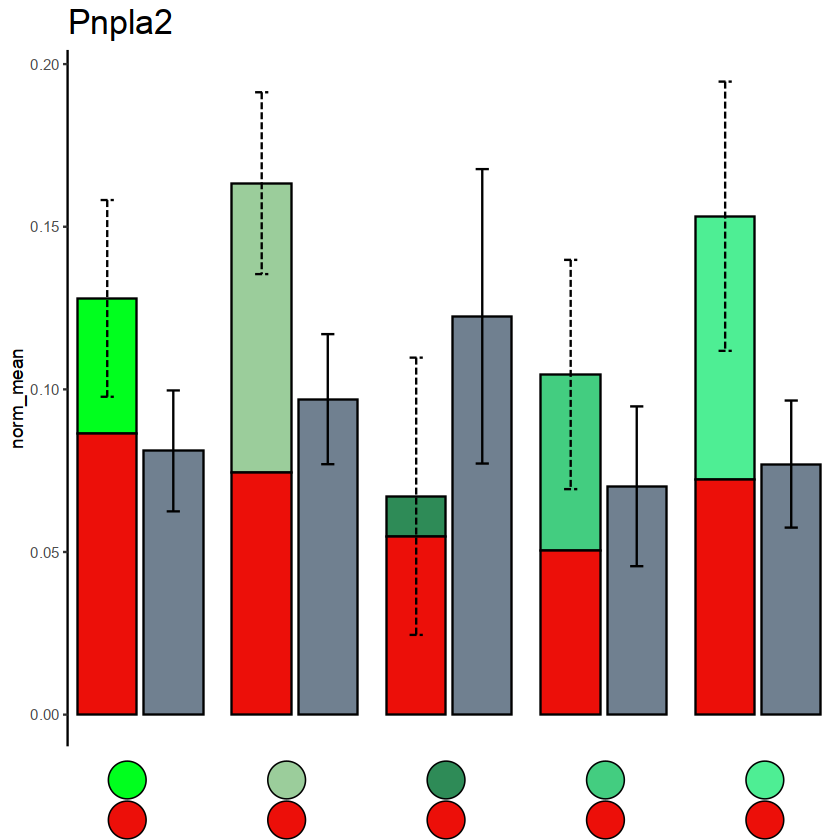

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


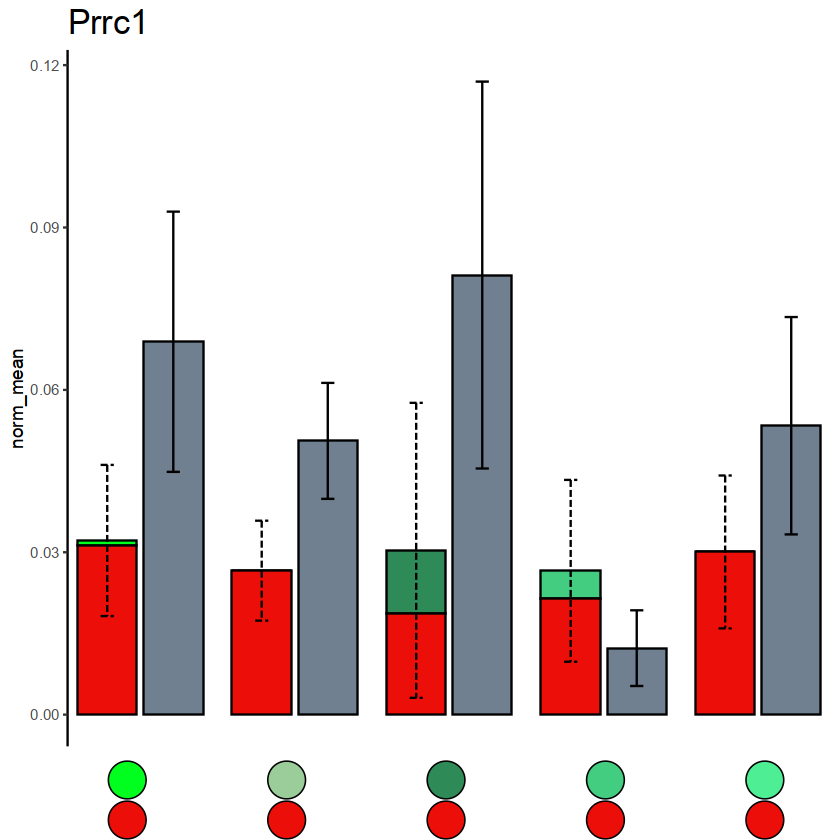

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


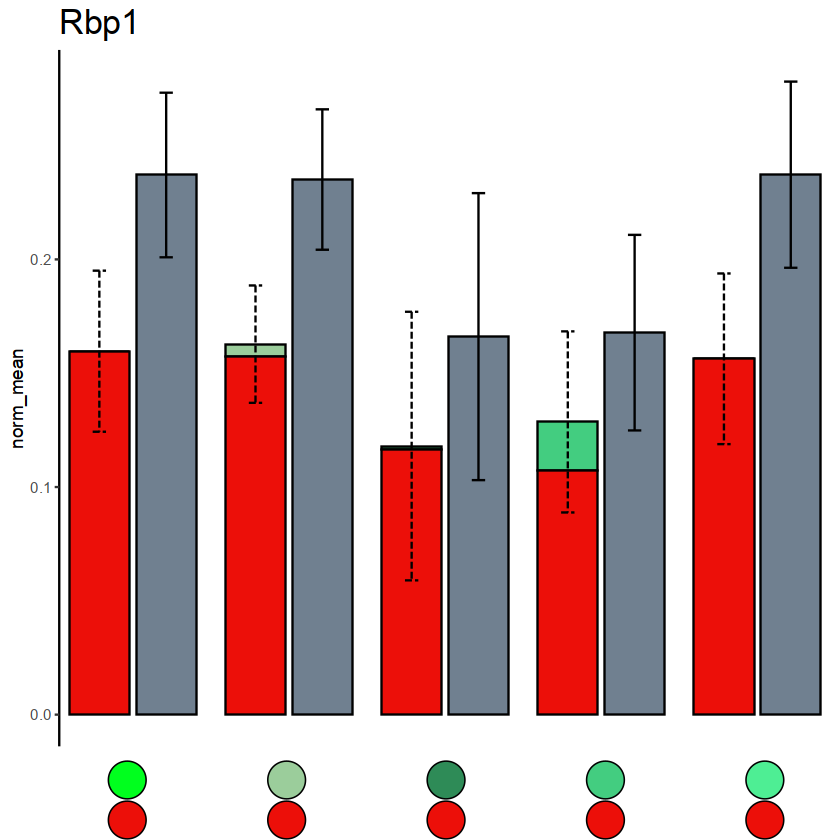

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


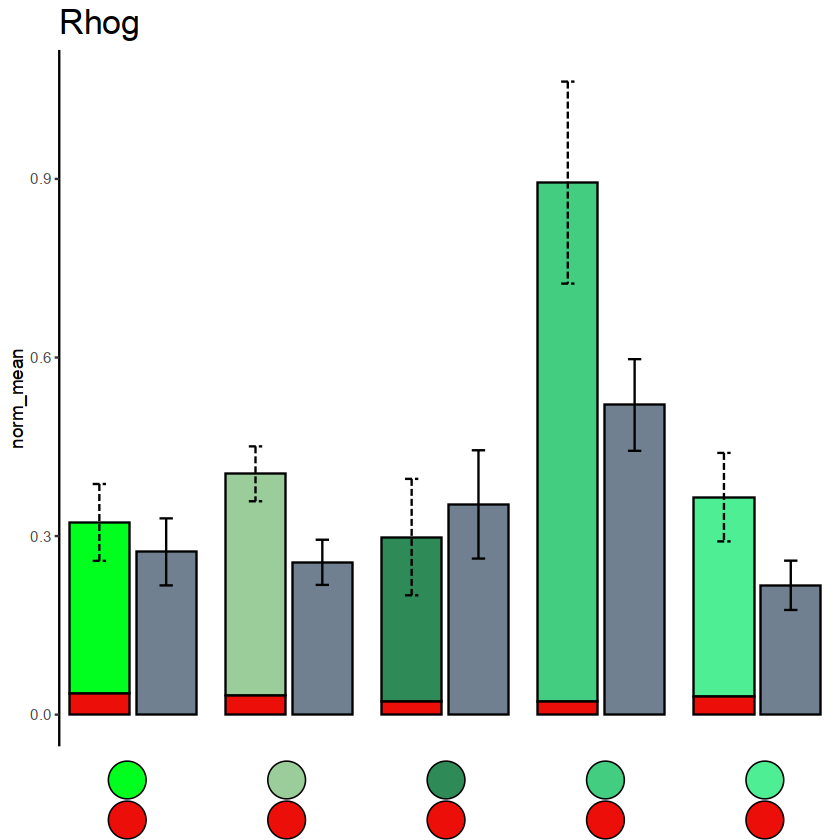

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


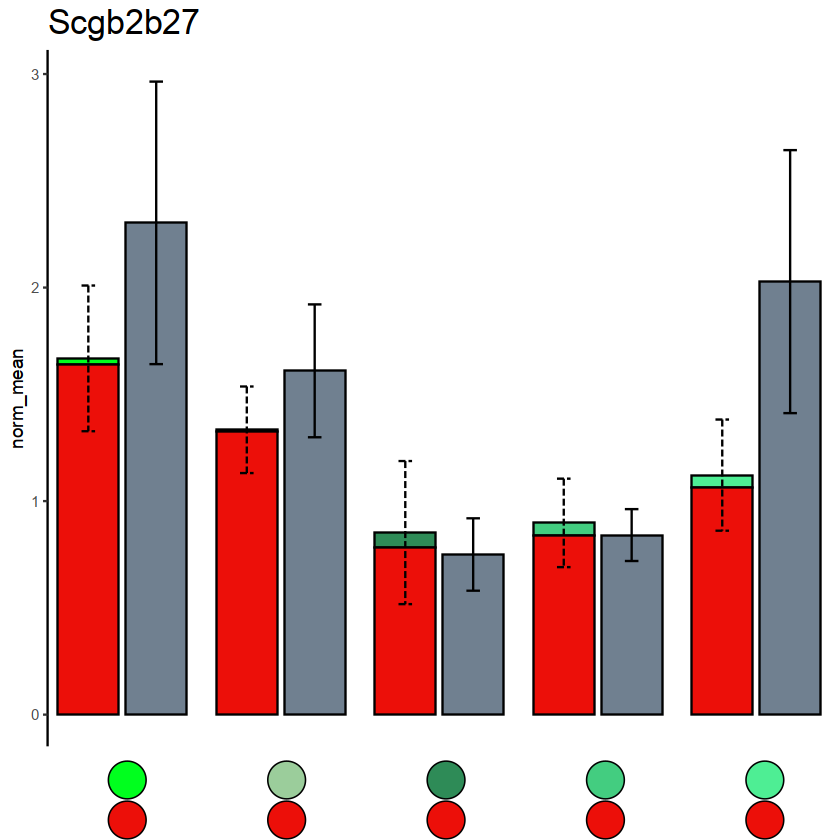

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


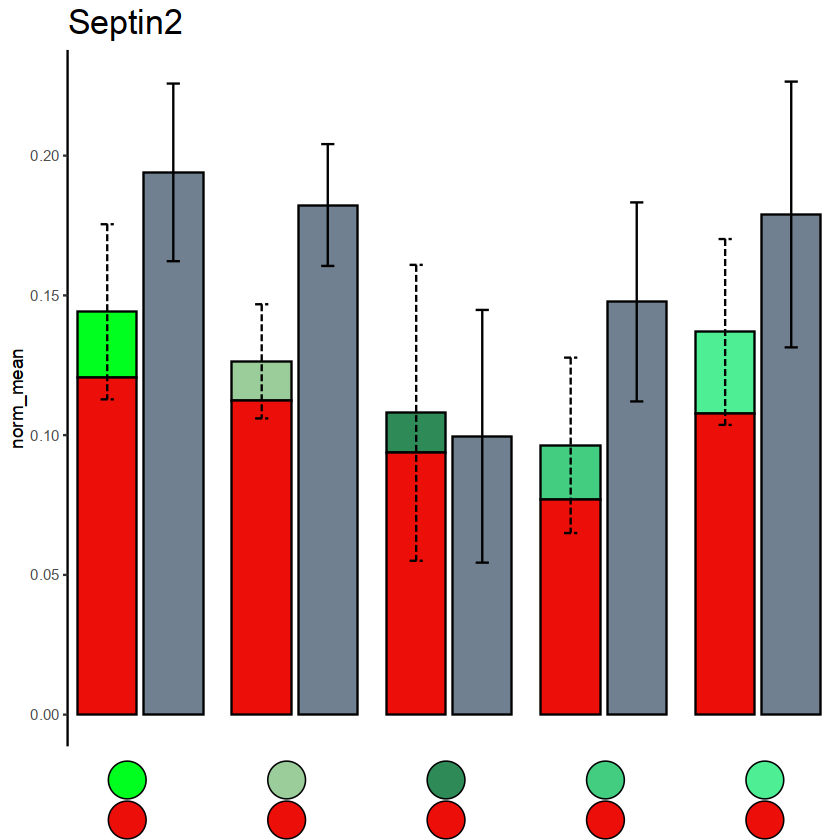

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


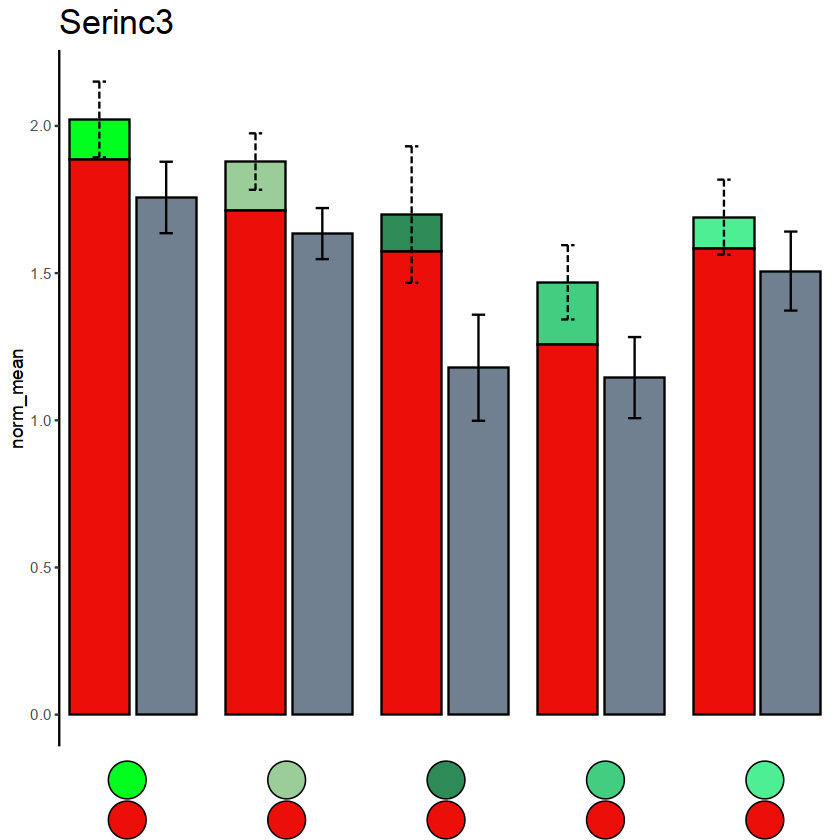

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


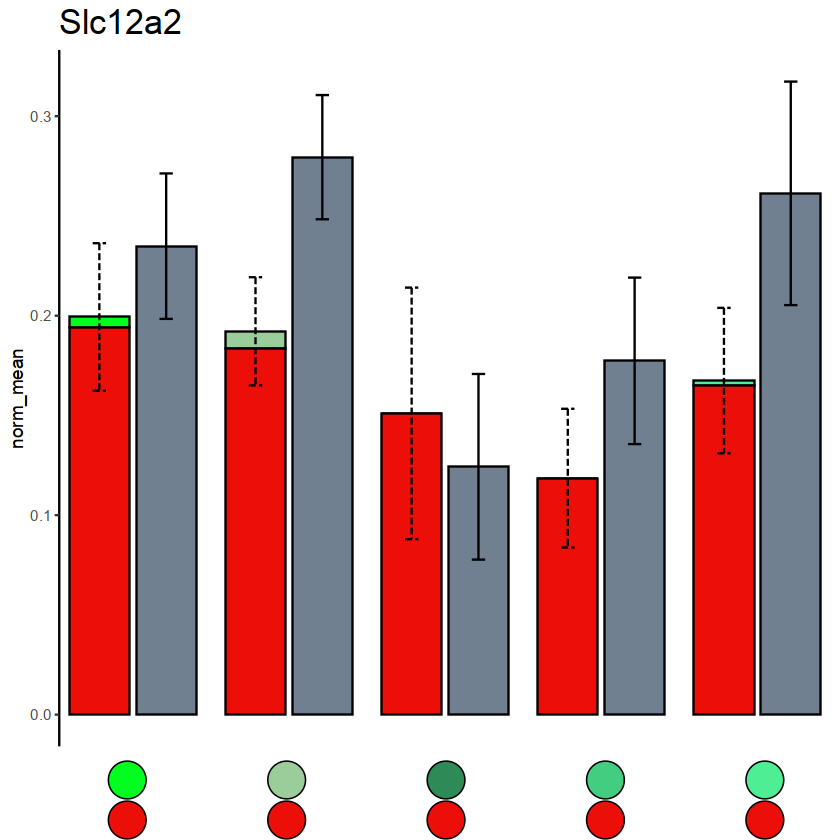

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


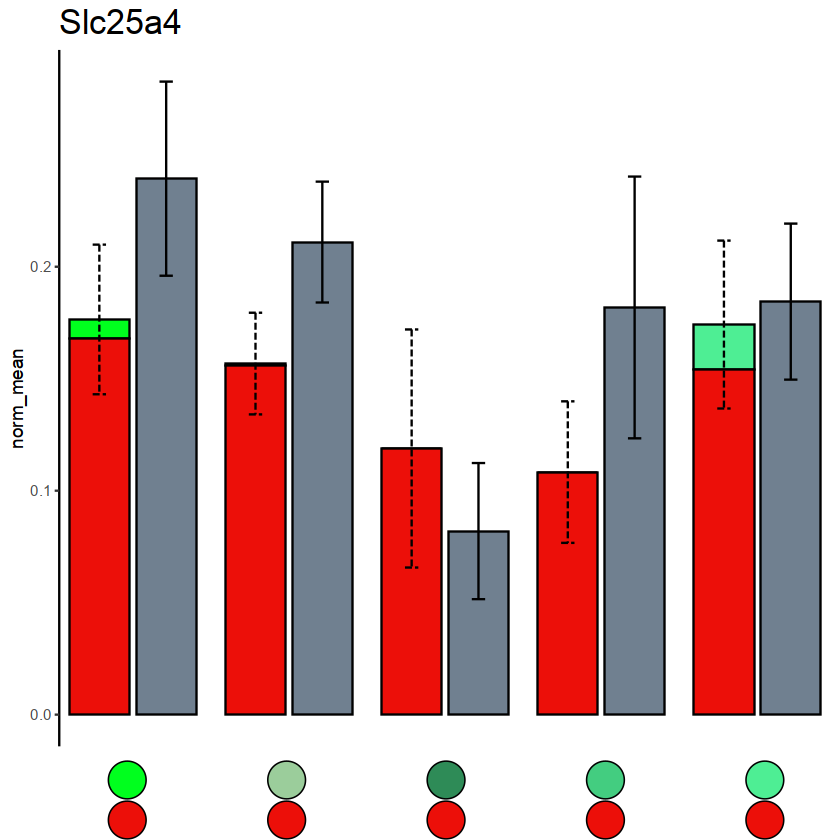

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


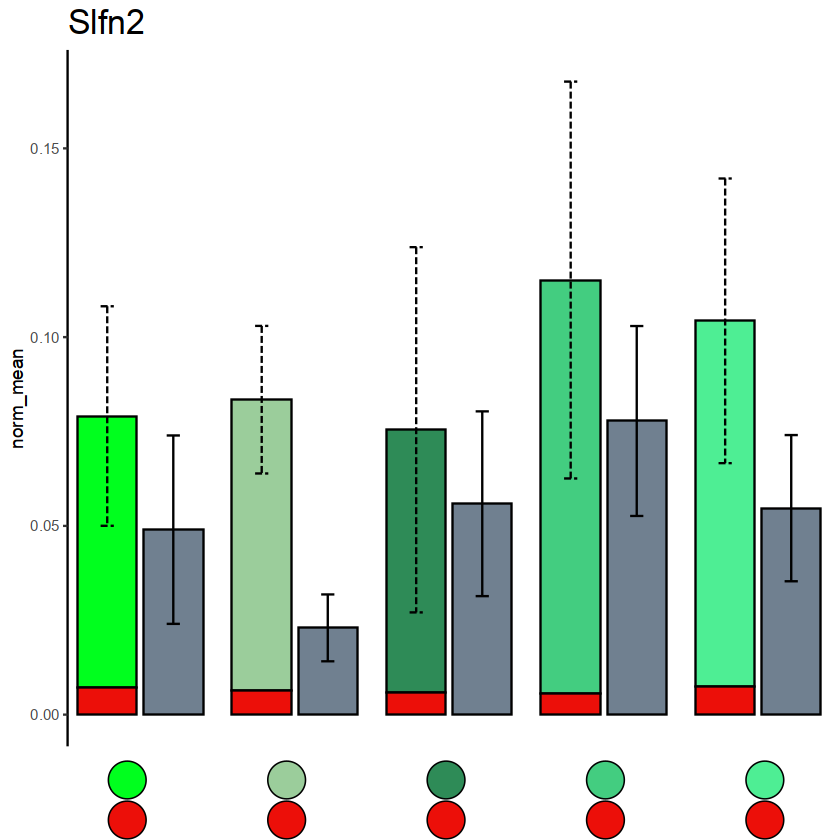

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


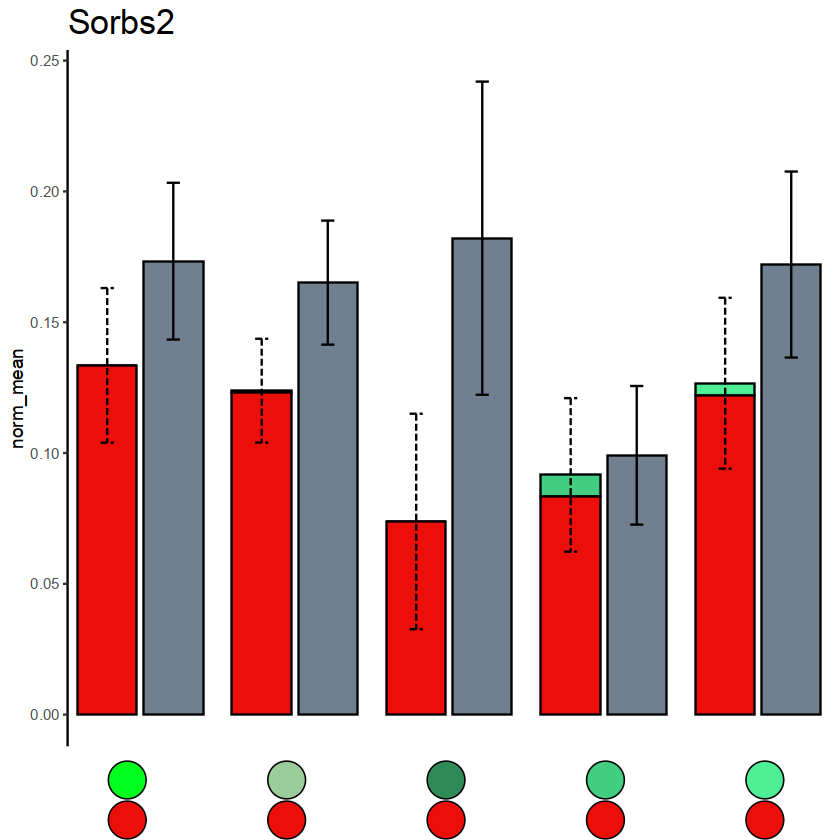

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


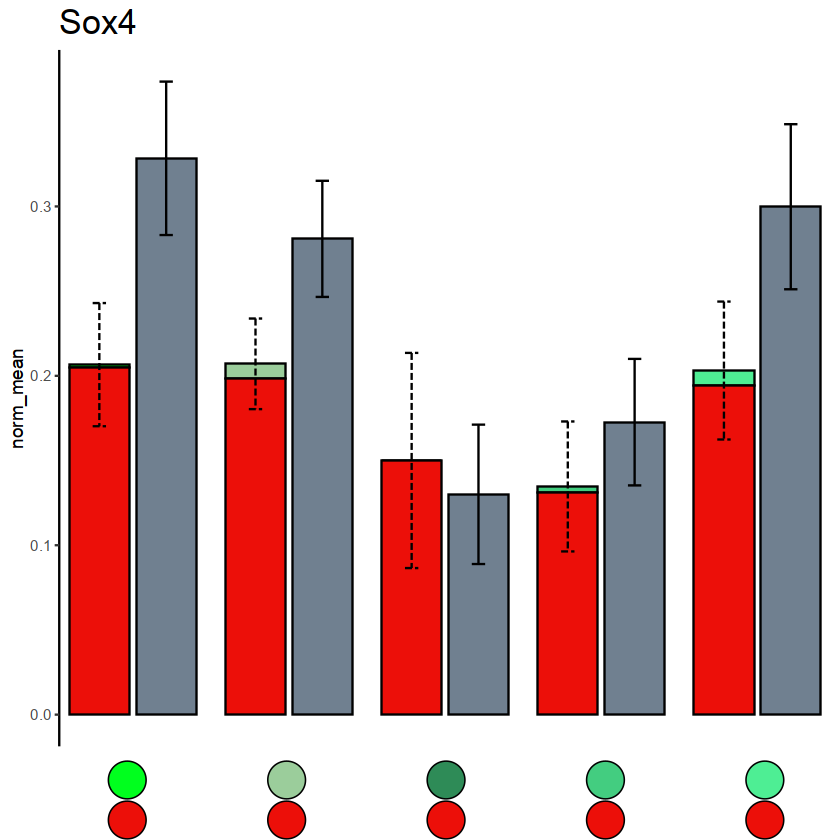

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


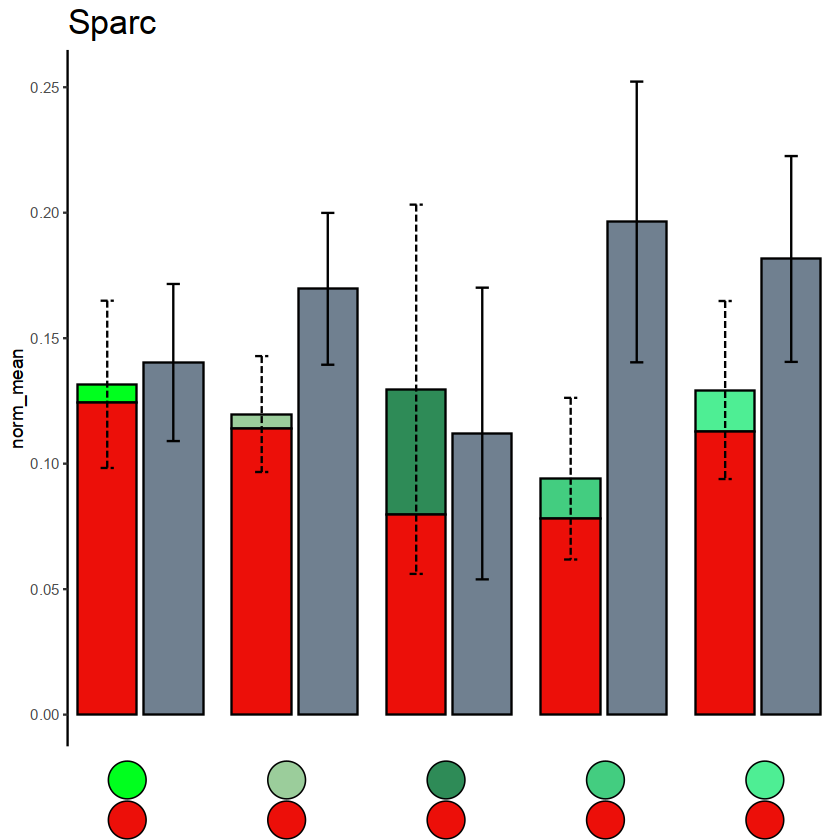

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


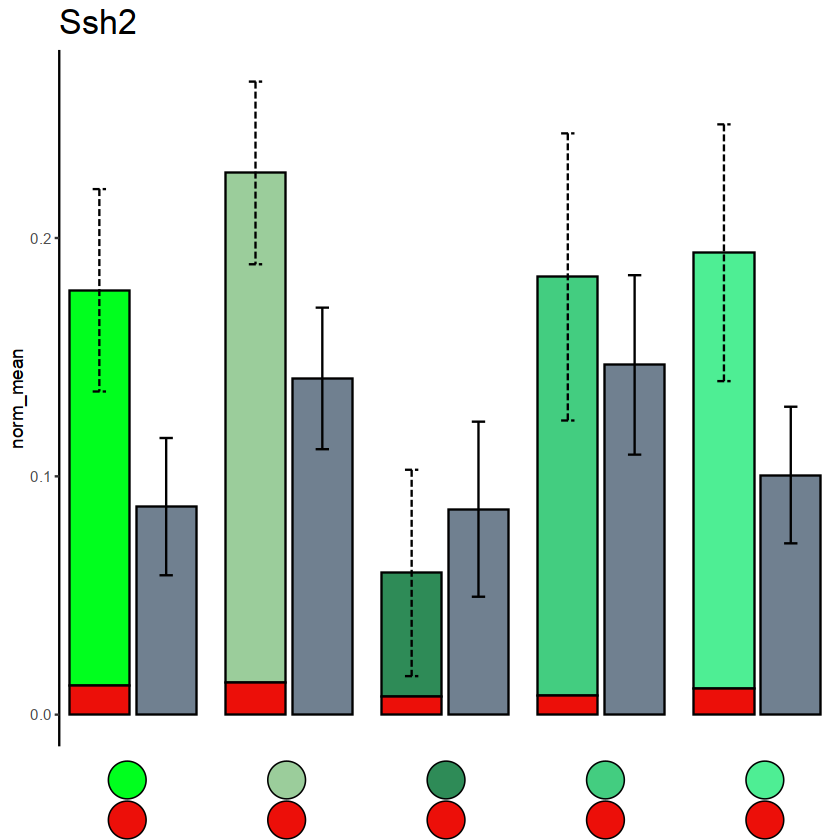

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


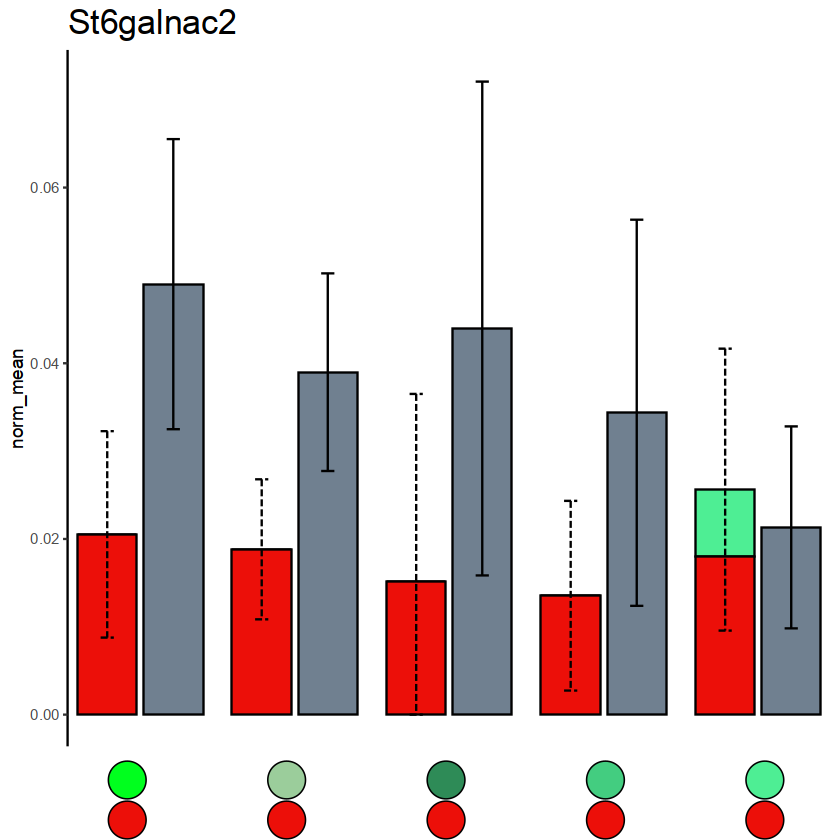

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


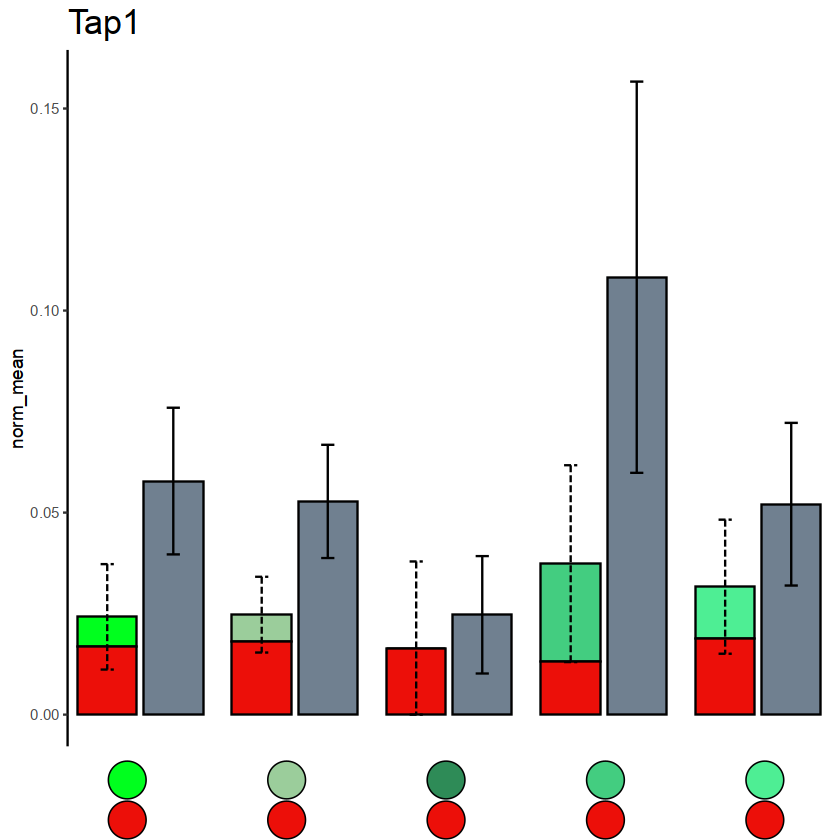

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


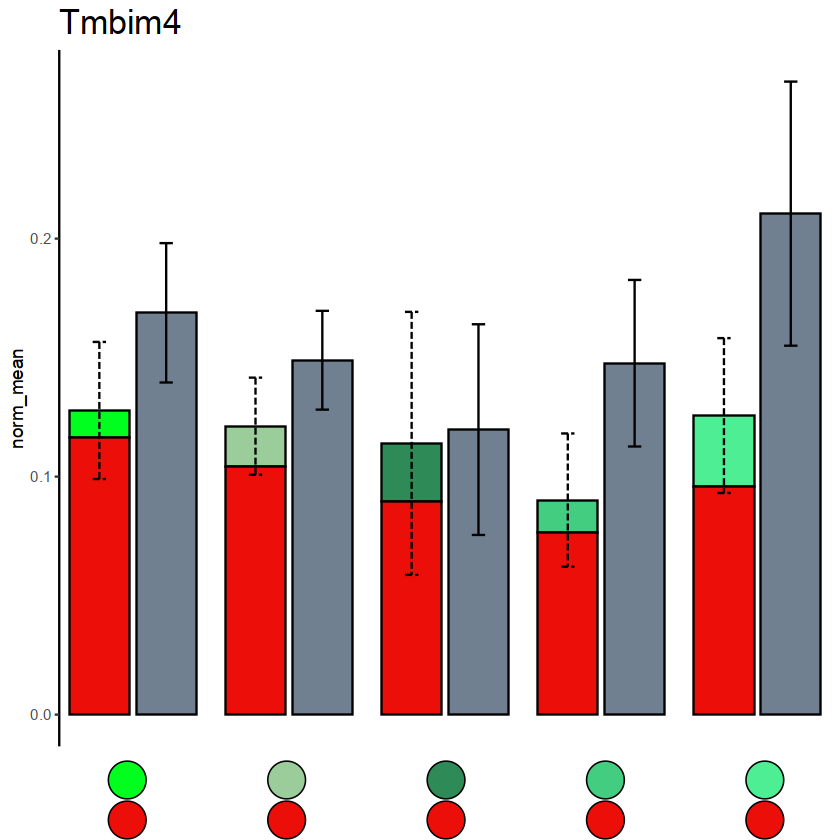

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


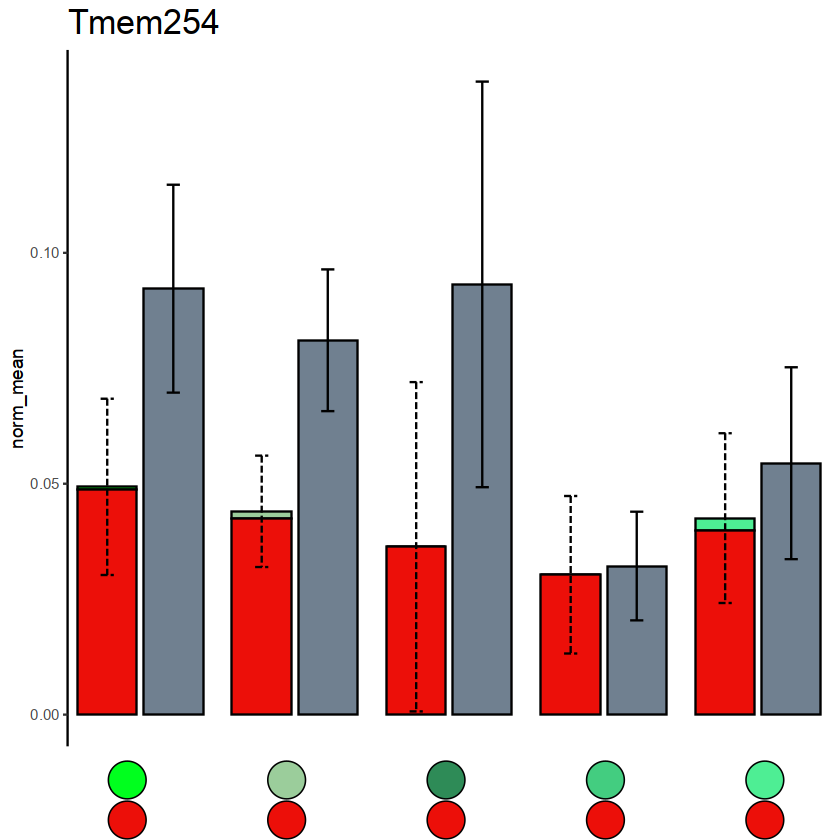

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


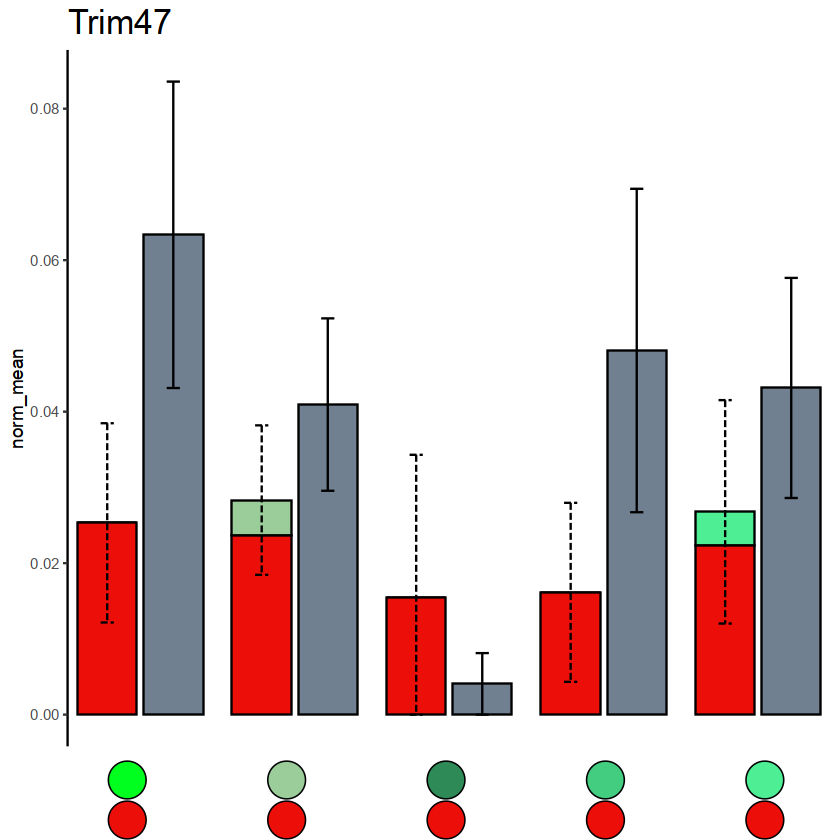

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


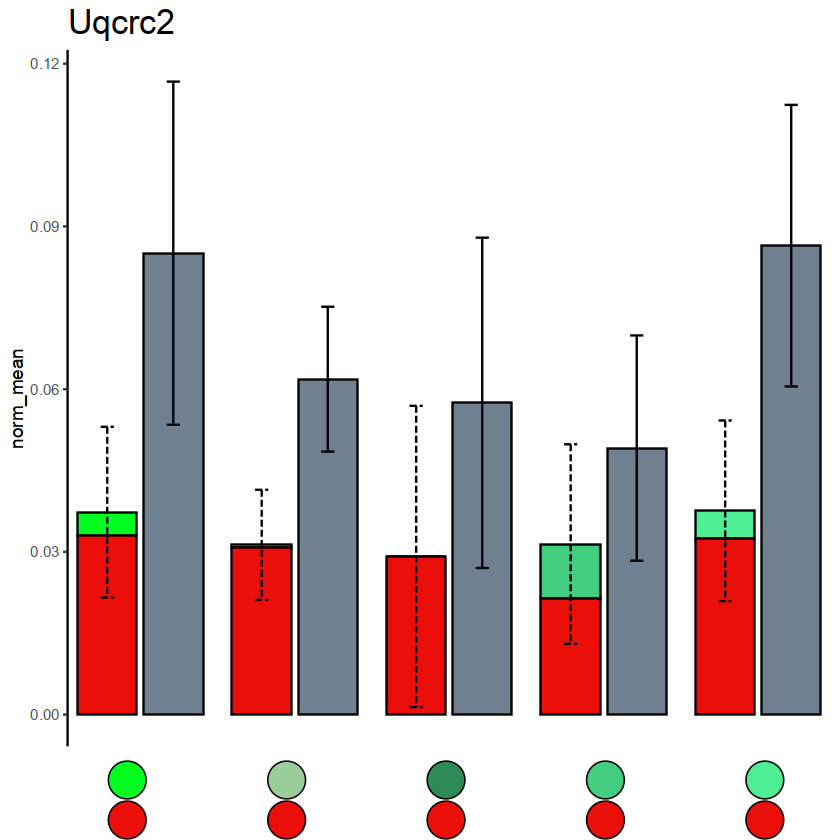

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


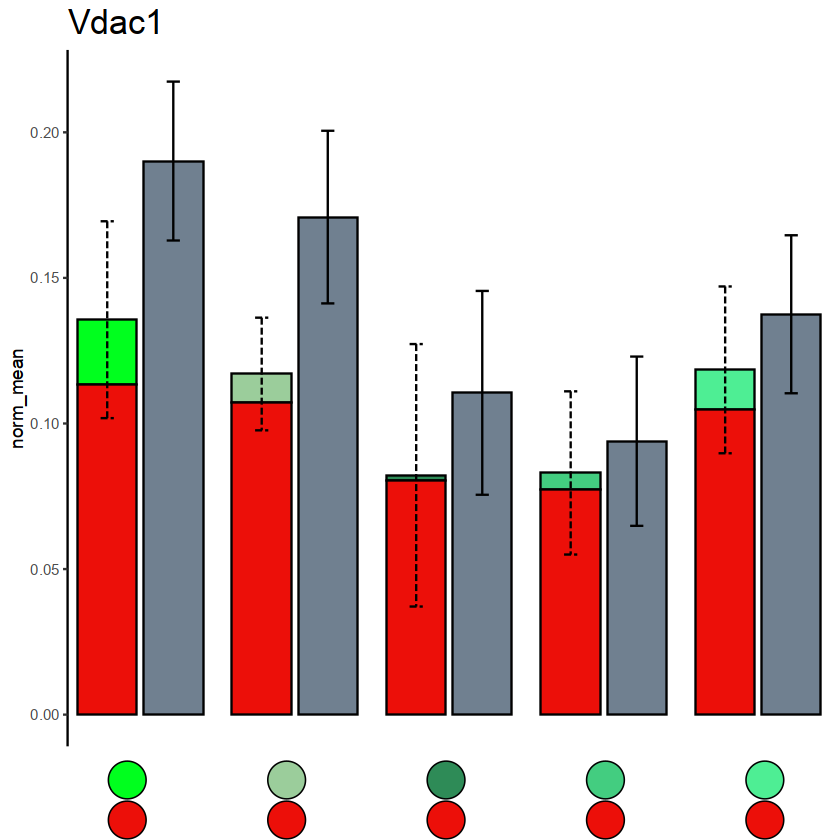

Saving 6.67 x 6.67 in image


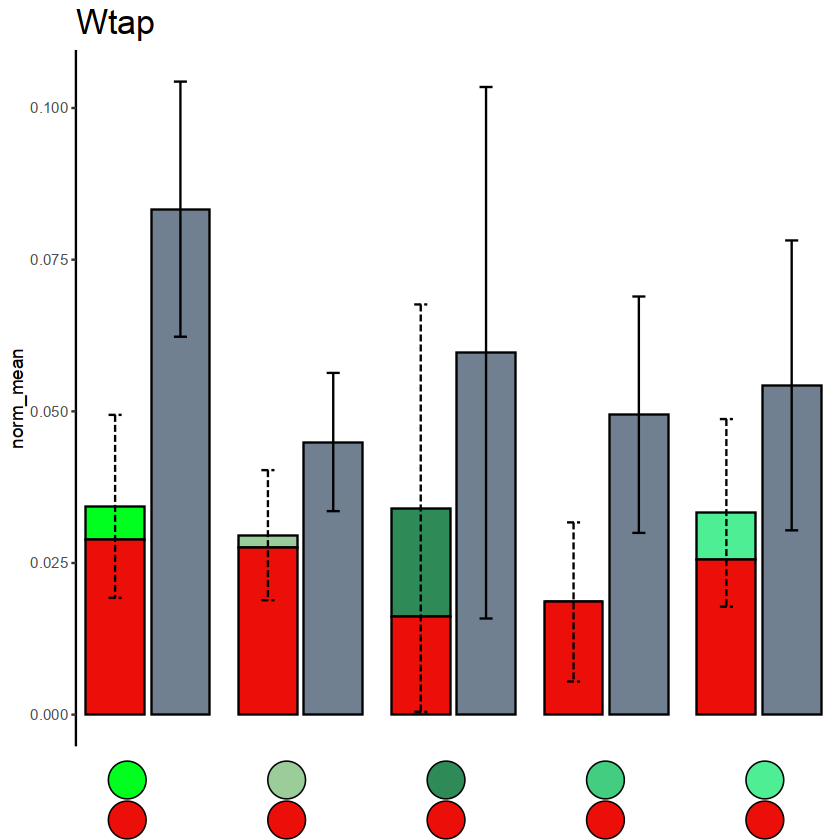

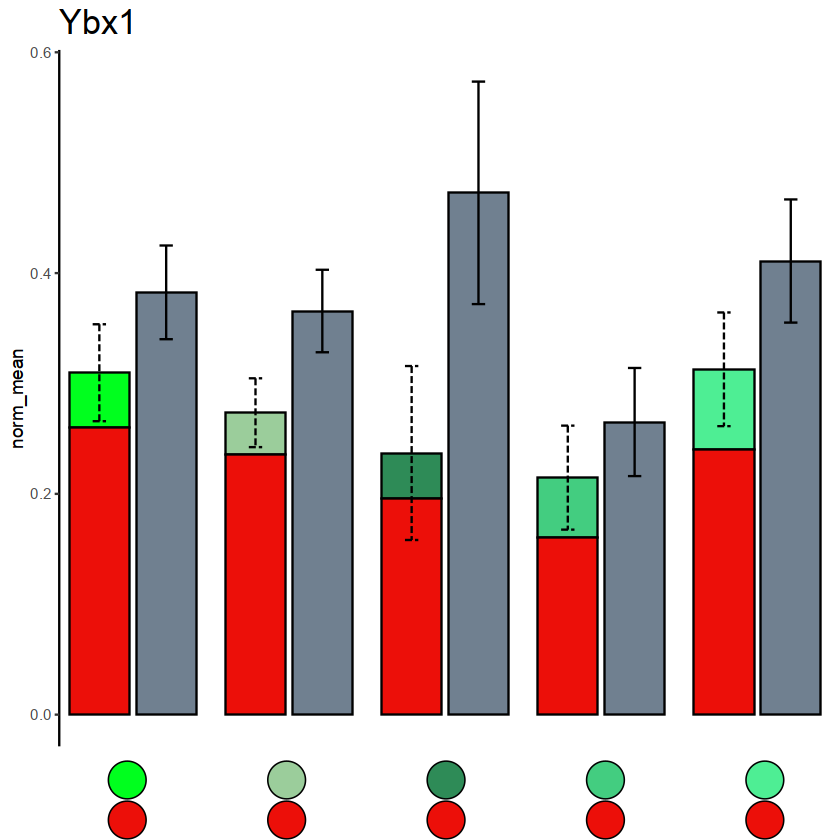

In [101]:
for (gene in setdiff(rownames(all_genedata)[all_genedata$adj_pval < 0.05], sig_somewhere)){
    tryCatch({
        p = per_comb_obs_exp(gene)
        ggsave(paste0("final_figs/fig5/new_gene_full_sim/gene_comb/", gene, ".png"), plot=p)
    }, 
             error = function(e) {
                    message(paste("Error processing", gene, ":", e$message))
                    return(NULL)  # Skip to next iteration
                  })
}

Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”
Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


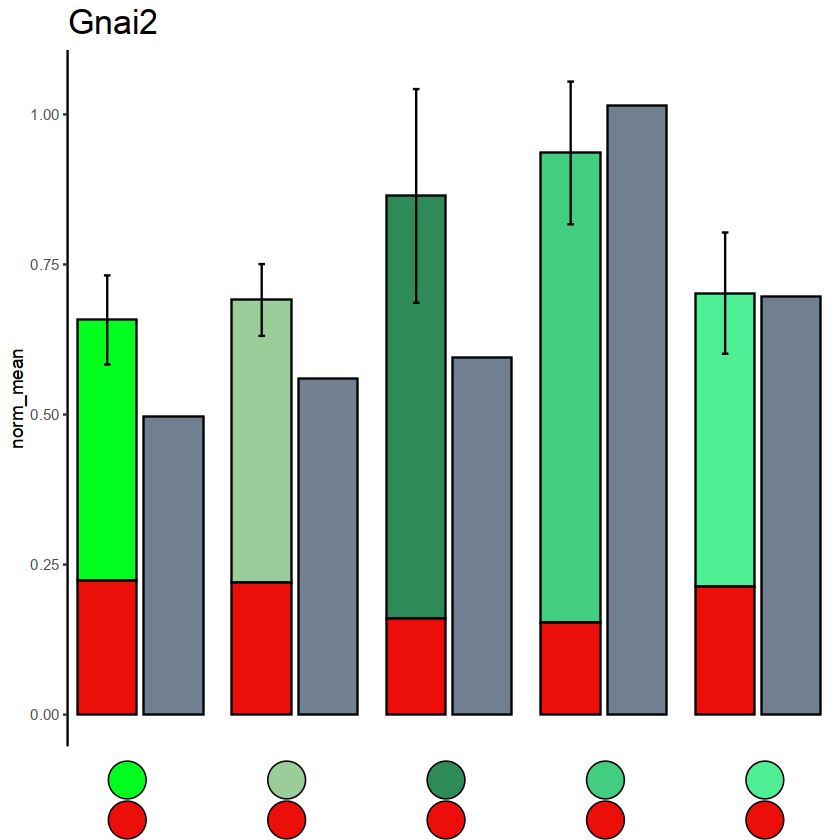

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


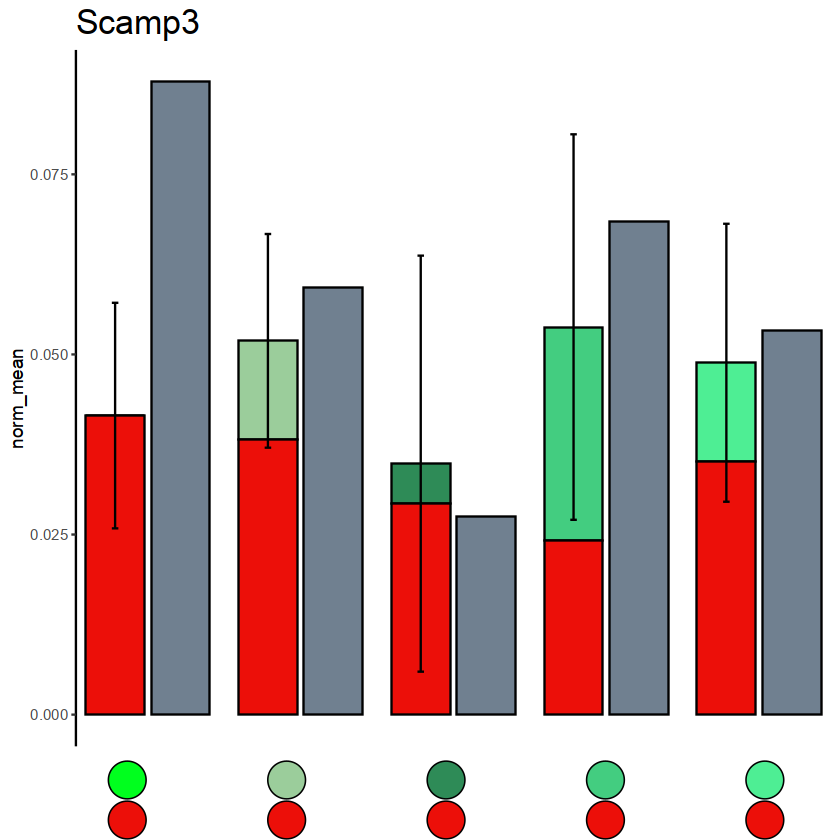

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


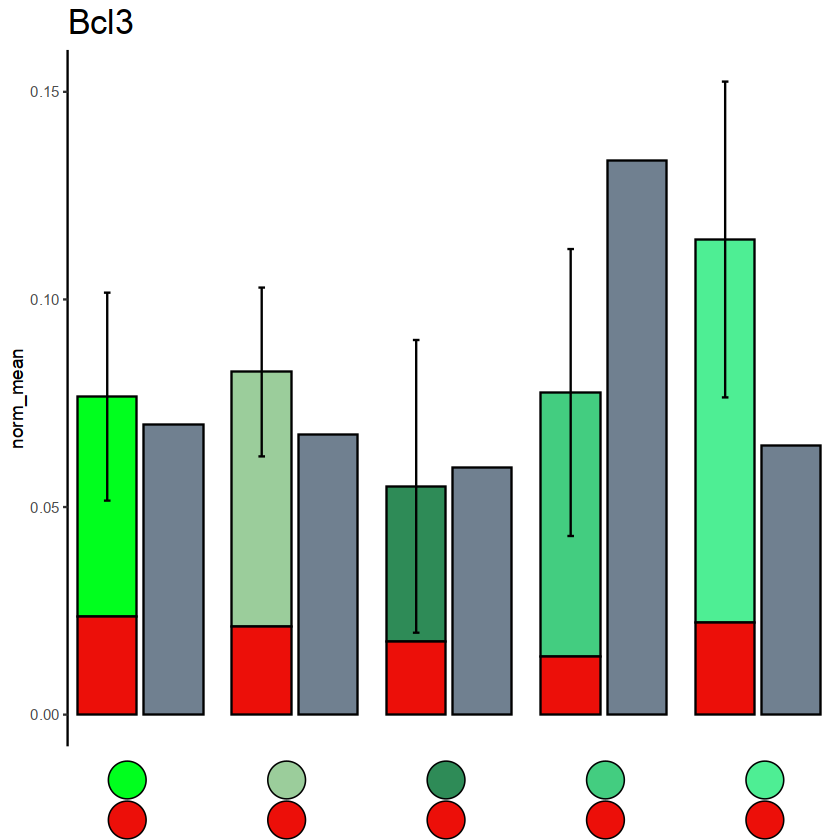

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


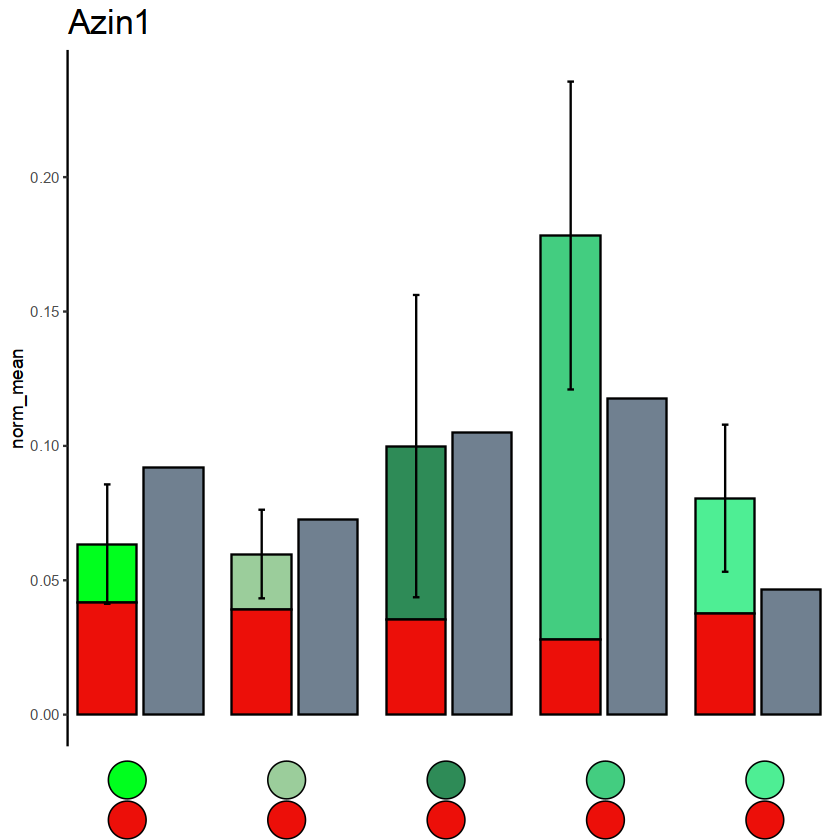

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


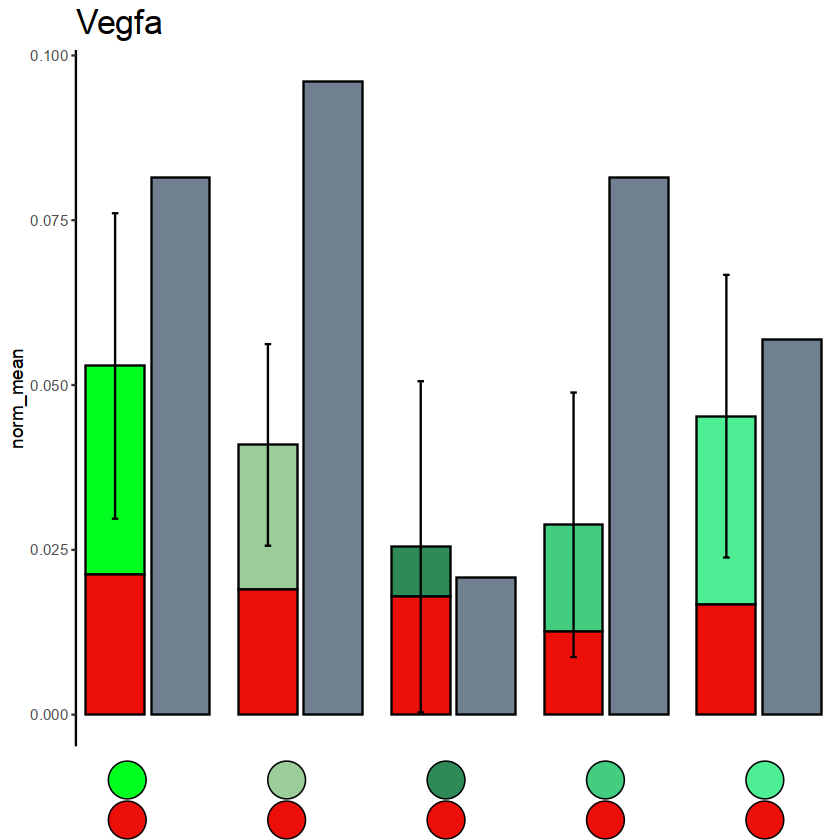

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


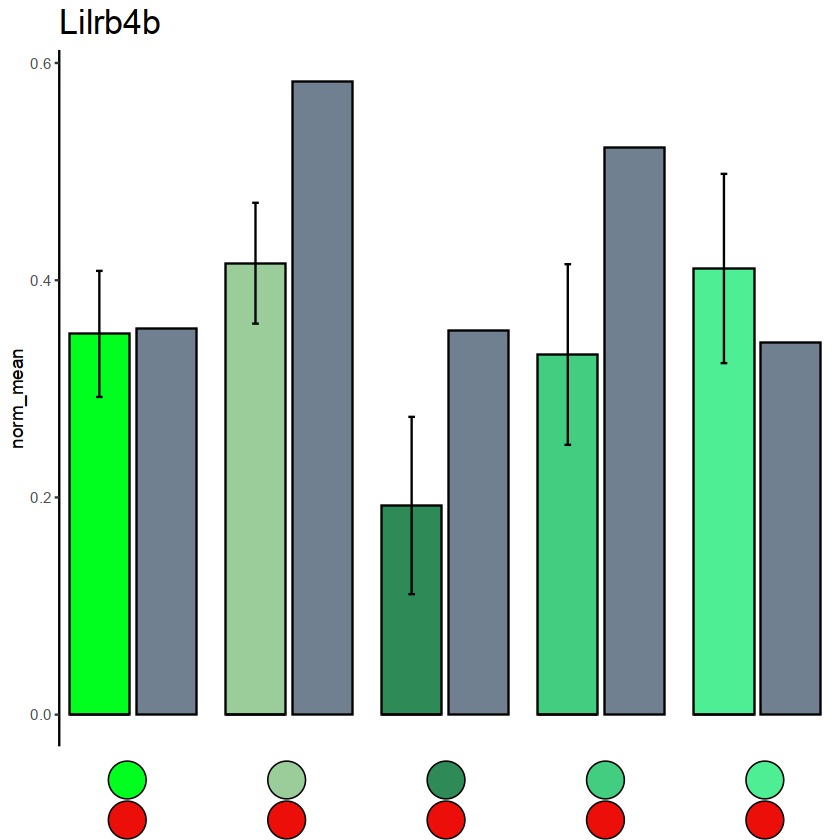

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


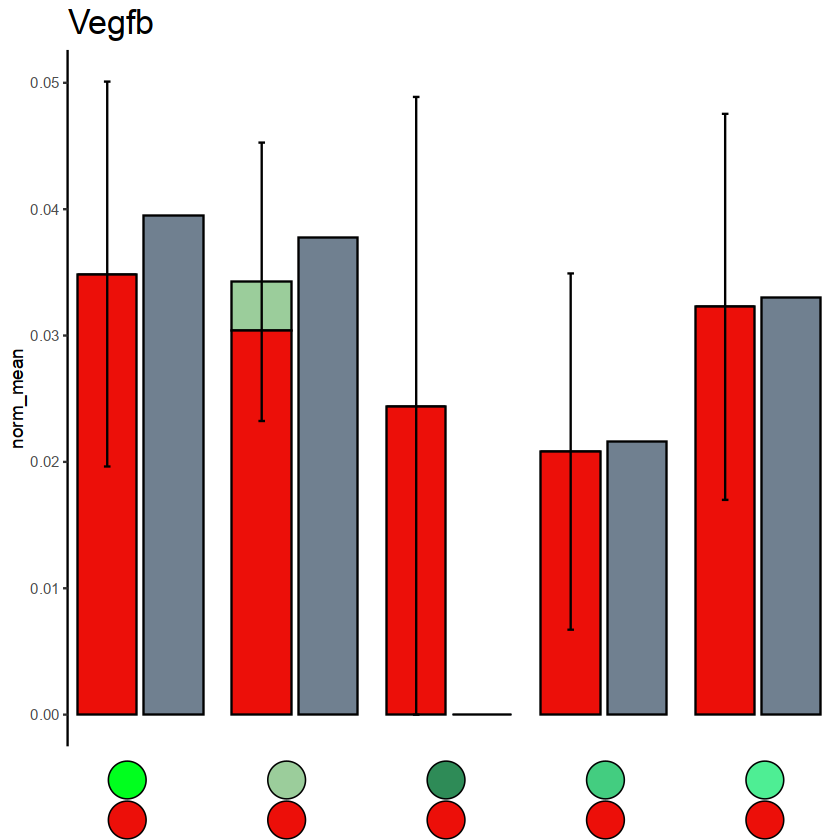

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


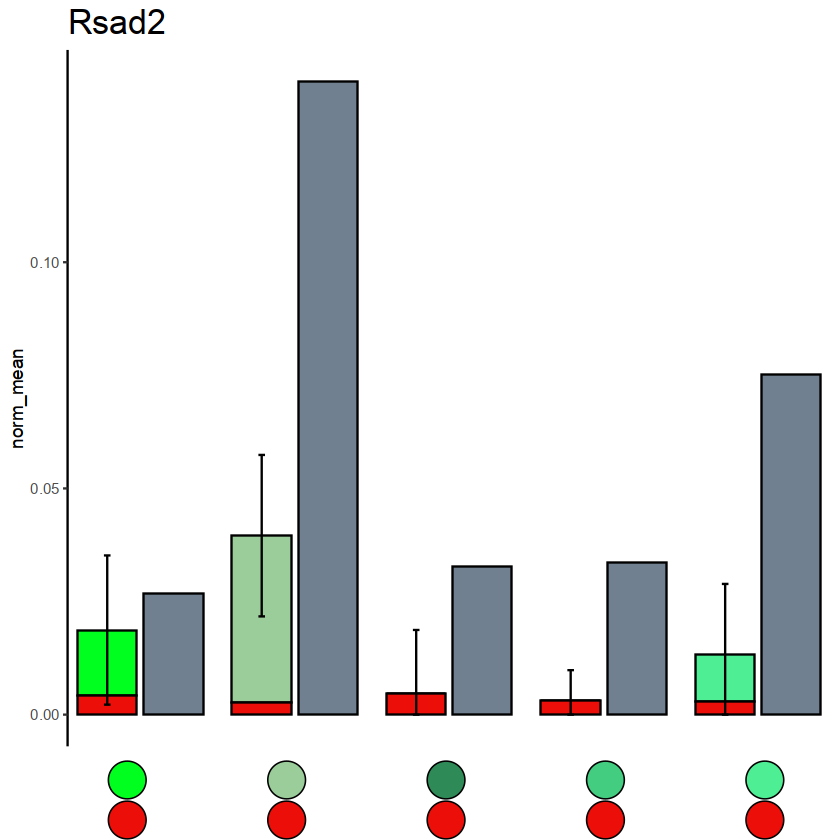

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


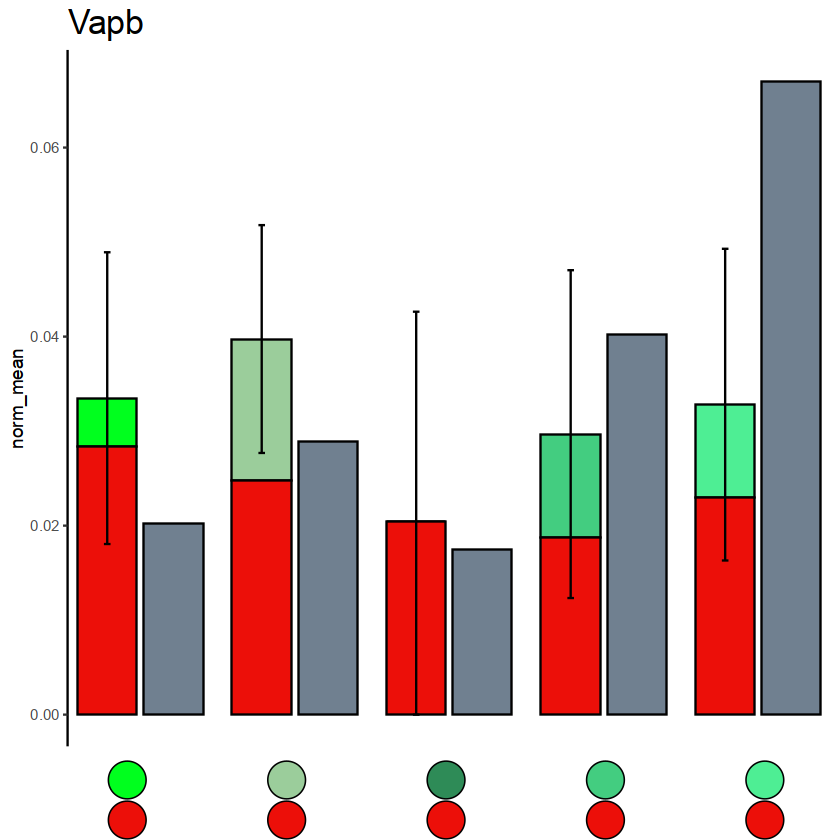

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


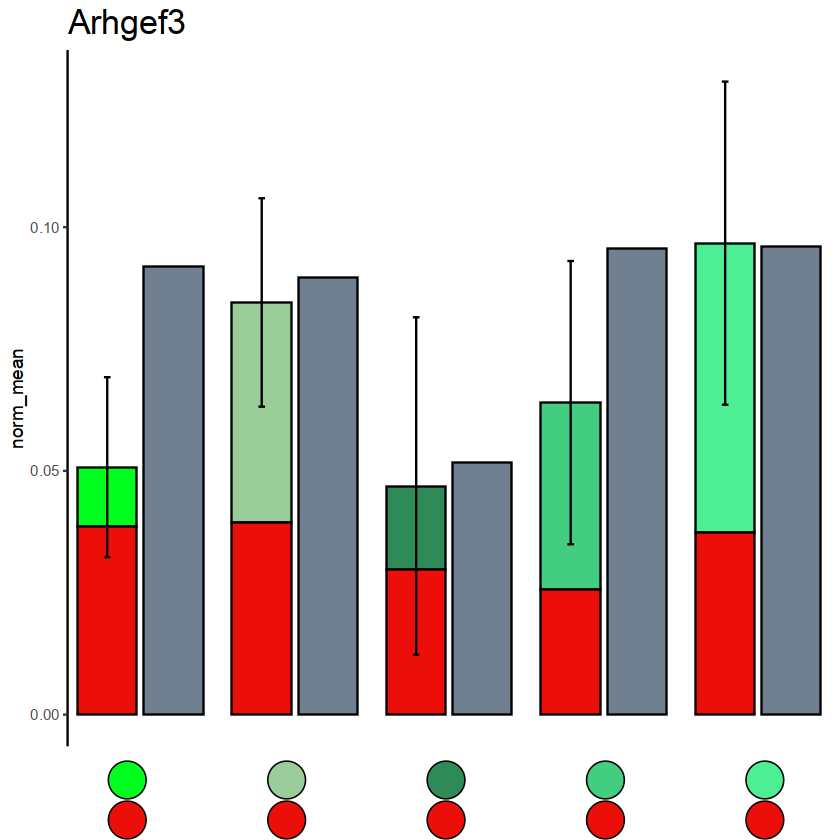

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


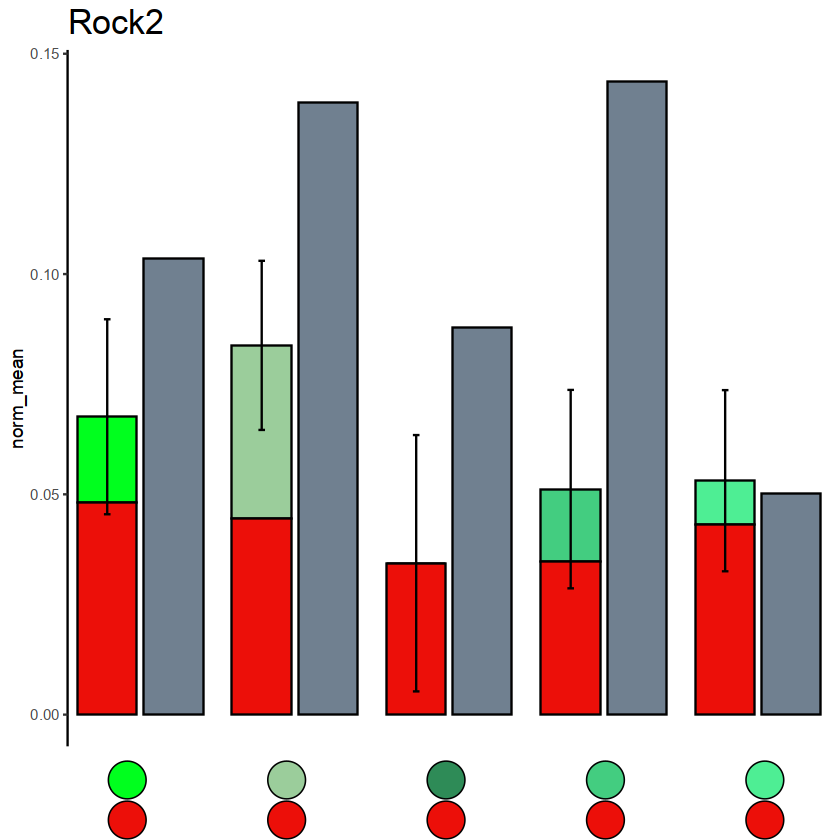

Saving 6.67 x 6.67 in image
Using immune, epithelial, pic, gene as id variables

Warning message in geom_errorbar(data = full_genedata %>% filter(gene == focus_gene) %>% :
“Ignoring unknown aesthetics: fill”


ERROR: Error in data.frame(x = 0, y = 0, pic = unique(gene_df$pic), fill = group.colors[str_replace(unique(gene_df$pic), : arguments imply differing number of rows: 1, 0


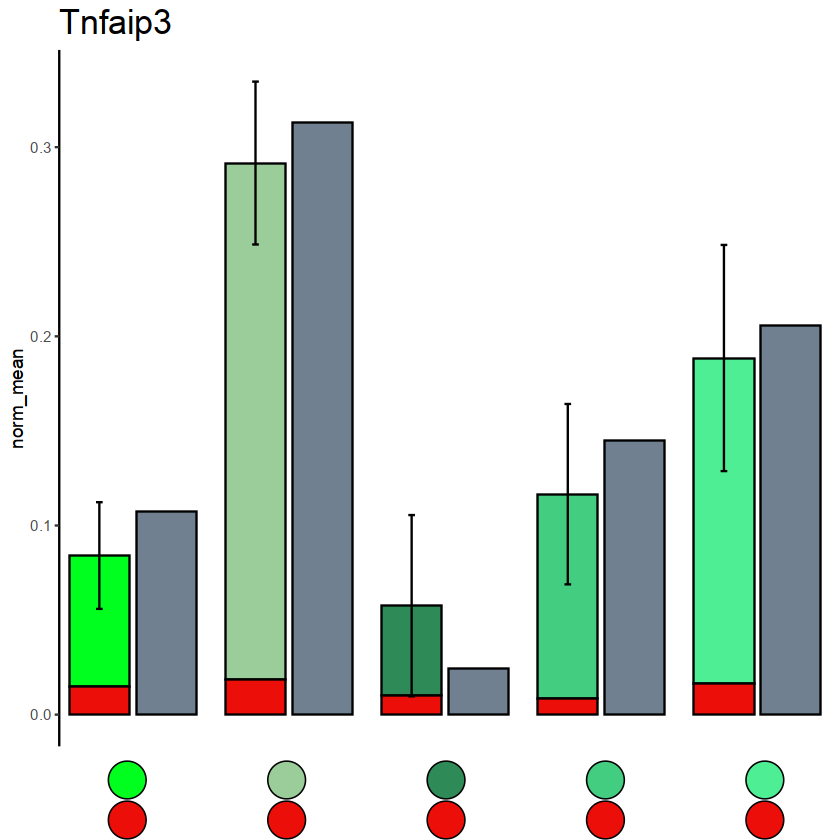

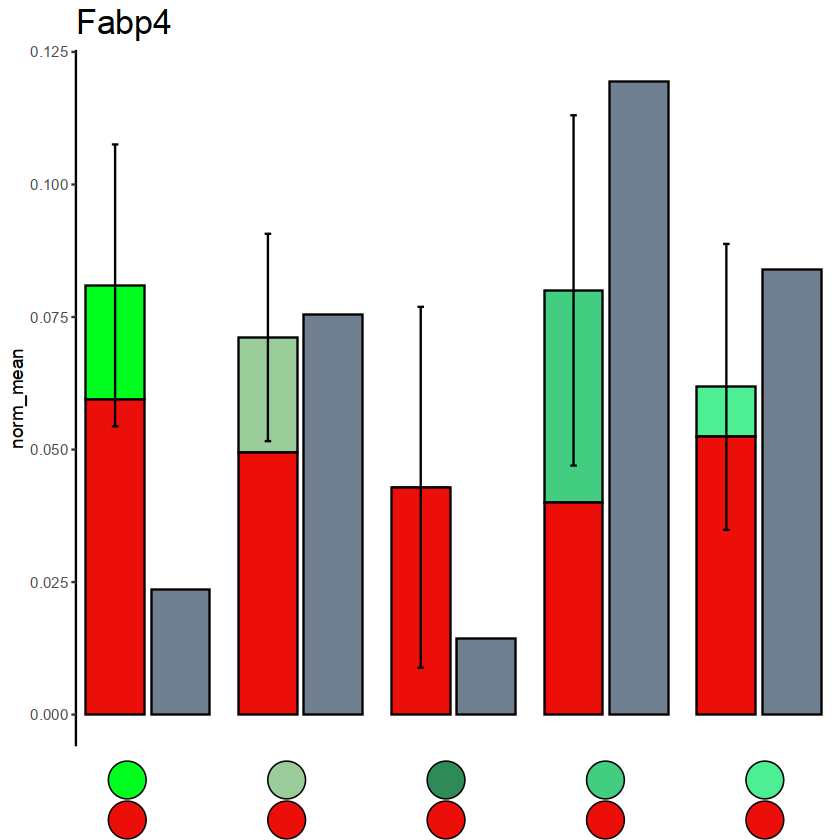

In [782]:
focus_genes = c('Gnai2', "Scamp3", "Bcl3", "Azin1", "Vegfa", "Lilrb4b", "Vegfb", "Rsad2", "Vapb", "Arhgef3", "Rock2", "Tnfaip3", 
                "Fabp4", "Lpl", "Fabp5", "Lalba", "Lap3", "Bst2", "Epas1", "Csn3", 
                "Hdac9", "Cldn4", "Loxl3", "S100a8", "S100a9", "Il1b", "Osm") # THIS IS NEW
for (gene in focus_genes){
    p = per_comb_obs_exp(gene)
    ggsave(paste0("final_figs/fig5/new_gene_full_sim/gene_comb/", gene, ".pdf"), plot=p)
}

In [17]:
1

[1] 1

In [20]:
full_genedata = lapply(mature_immune_pops, function(pop){
    read.csv(paste0("final_figs/fig5/new_gene_full_sim/", pop, "_genedata_filt.csv"), row.names=1) %>% 
        cbind(source_pops=pop) %>% as.matrix
}) %>% 
    do.call(rbind, .) %>% 
    as.data.frame %>% 
    rownames_to_column('gene') %>%
    mutate(pic=paste(source_pops, "Tumor cells", sep="."), gene = str_split_i(gene, "\\.", 1)) %>%
    dplyr::select(c(pic, colnames(.)[1:8]))

In [22]:
write_csv(full_genedata, "annotations/unified_gene_pics.csv")

In [372]:
as.matrix(db_mat@mat[non_neutrophil_genes,analyzed_pics] %>% t) %>%
    as.data.frame %>%
    cbind(total=rowSums(.)) %>%
    select(total) %>%
    table

.
  0   1   2   3   4 
683 126  32  21   2 

In [371]:
non_neutrophil_genes = c("Cd74", "H2-Aa", "")

In [45]:
cat(non_neutrophil_genes, sep=', ')

C1qa, C1qb, C1qc, Itgax, Clec10a, Mrc1, H2-Ea, Cd3g, Cd3e, Cd3d, Trbc2, Trac, Trdc, Thy1, Cd8b1, Cd8a

In [46]:
non_neutrophil_genes = non_neutrophil_genes[non_neutrophil_genes %in% rownames(mat2@mat)]

In [47]:
non_neutrophil_gene_sums = colSums(mat2@mat[non_neutrophil_genes,])
print(sum(non_neutrophil_gene_sums > 0))
print(sum(non_neutrophil_gene_sums > 1))
print(sum(non_neutrophil_gene_sums > 2))
print(sum(non_neutrophil_gene_sums > 3))
print(sum(non_neutrophil_gene_sums > 4))
print(sum(non_neutrophil_gene_sums > 5))
print(sum(non_neutrophil_gene_sums > 6))
print(sum(non_neutrophil_gene_sums > 7))
print(sum(non_neutrophil_gene_sums > 8))
print(sum(non_neutrophil_gene_sums > 9))
print(sum(non_neutrophil_gene_sums > 10))

[1] 584
[1] 233
[1] 139
[1] 96
[1] 70
[1] 54
[1] 43
[1] 33
[1] 25
[1] 23
[1] 21


In [48]:
non_neutrophil_pics = names(which(non_neutrophil_gene_sums > 3))

In [49]:
mat2@mat[non_neutrophil_genes, non_neutrophil_pics] %>% as.matrix %>% t

,C1qa,C1qb,C1qc,Itgax,Clec10a,Mrc1,H2-Ea,Cd3g,Cd3e,Cd3d,Trbc2,Trac,Trdc,Thy1,Cd8b1,Cd8a
AB522_G16,0,0,0,4,0,0,0,0,0,0,0,0,0,0,0,0
AB522_E20,1,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0
AB523_M10,11,16,3,1,0,0,0,0,0,0,0,0,0,0,0,0
AB538_F17,1,1,3,0,0,0,0,0,0,0,0,0,0,0,0,0
AB538_G17,4,13,7,0,0,6,0,0,0,0,0,0,0,0,0,0
AB524_O11,2,7,1,0,0,1,0,0,0,0,0,0,0,0,0,0
AB524_C2,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0
AB524_A4,0,2,4,0,0,0,0,0,0,0,0,0,0,0,0,0
AB1201_C24,2,2,1,0,0,0,1,0,0,0,0,0,0,0,0,0
AB1201_G20,0,0,0,0,0,0,0,1,0,1,2,2,0,1,0,0


In [91]:
colnames(pic_umis)[colSums(pic_umis[c('Trbc2', 'Trac', 'Cd4', 'Cd8a', 'Cd8b1', 'Cd3e'),]) > 1]

[1] "AB1201_D2"  "AB1201_C2"  "AB1201_D8"  "AB1202_D22" "AB1202_I12"
 [6] "AB1202_G5"  "AB1202_E12" "AB1202_G17" "AB1202_E8"  "AB1202_O19"
[11] "AB1202_C14" "AB1202_C16" "AB1202_O17" "AB1202_L8"  "AB378_G23" 
[16] "AB868_F12"  "AB867_D12"  "AB867_G6"   "AB867_J24"  "AB338_D12" 
[21] "AB338_F20"  "AB338_C22"

In [94]:
mle_res[colnames(pic_umis)[colSums(pic_umis[c('Trbc2', 'Trac', 'Cd4', 'Cd8a', 'Cd8b1', 'Cd3e'),]) > 0],'b_mc'] %>% table

.
 1  2  3  4  5  6  7  8  9 10 11 12 14 15 16 17 18 
 2  8 12  4 10  8  2  7  2  9  4  3  2  2  3  3  4 

In [88]:
mle_res[names(colSums(pic_umis[c('Trbc2', 'Trac', 'Cd4', 'Cd8a', 'Cd8b1', 'Cd3e'),]) > 1),'b_mc'] %>% table

.
  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18 
 12  81 202 128  98  67  44  95  30  66  27  61   9 113  79 110  45 104 

In [87]:
new = read_csv("final_figs/fig5/new_gene/All_genedata.csv") %>% column_to_rownames('...1')

New names:
• `` -> `...1`
Rows: 11356 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): ...1
dbl (8): Observed_mean, Simulated_mean, Sim_SD, z_scores, full_adj_pval, lfc...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [88]:
old = read_csv("final_figs/fig5/new_gene/2407/All_genedata.csv") %>% column_to_rownames('...1')

New names:
• `` -> `...1`
Rows: 11569 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): ...1
dbl (8): Observed_mean, Simulated_mean, Sim_SD, z_scores, full_adj_pval, lfc...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [89]:
colnames(old) = paste(colnames(old), "old")

In [90]:
colnames(new) = paste(colnames(new), "new")

In [92]:
mmm = cbind(new, old[rownames(new),])

In [96]:
mmm[c('Trac', 'Tcf7', 'Trbc2', 'Cd3e', 'H2-Aa', 'H2-Ab1', 'Cd74'),
    c('full_adj_pval new', 'z_scores new', 'lfc new', 'full_adj_pval old', 'z_scores old', 'lfc old')]

,full_adj_pval new,z_scores new,lfc new,full_adj_pval old,z_scores old,lfc old
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Trac,1.270211e-35,13.034088,0.018995981,2.995496e-91,20.636356,0.030074261
Tcf7,1.034845e-05,5.395467,0.017612394,4.790274e-30,11.987325,0.039793206
Trbc2,3.133563e-02,3.285445,0.011342453,1.826101e-07,6.118085,0.021225819
Cd3e,1.100758e-01,2.736819,0.005886045,2.851792e-04,4.643243,0.009996413
H2-Aa,2.936262e-05,5.181779,0.133874615,4.206808e-12,7.712235,0.196279924
H2-Ab1,4.152664e-03,3.960215,0.067757037,4.943367e-05,5.029645,0.086078084
Cd74,2.345810e-05,5.227892,0.130201123,3.658968e-08,6.394286,0.158928328


In [97]:
mmm[c('Vegfa', 'Bcl3', 'Fabp5', 'Rsad2', 'Comt', 'Lalba', 'Csn3', 'Tnfaip3'),
    c('full_adj_pval new', 'z_scores new', 'lfc new', 'full_adj_pval old', 'z_scores old', 'lfc old')]

,full_adj_pval new,z_scores new,lfc new,full_adj_pval old,z_scores old,lfc old
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Vegfa,2.905880e-04,4.6694892,0.055593916,5.133364e-04,4.4906842,0.054345907
Bcl3,9.724207e-01,-0.2253801,-0.003752577,9.638652e-01,-0.2489144,-0.004155548
Fabp5,4.756664e-03,3.9159294,0.054877242,1.634189e-03,4.1815139,0.059301126
Rsad2,2.193068e-06,5.6973759,0.068174455,5.125720e-06,5.4875217,0.067031105
Comt,1.742124e-03,4.2175327,0.112977465,3.888970e-03,3.9352869,0.104112899
Lalba,5.032854e-23,-10.5628107,-0.530472631,1.966938e-25,-11.0564463,-0.541449645
Csn3,2.154678e-03,-4.1516088,-0.135529864,3.616988e-03,-3.9577470,-0.126444940
Tnfaip3,6.264746e-01,1.4342948,0.037411930,6.189749e-01,1.3880891,0.036401833


In [98]:
mmm[c('Trac', 'Tcf7', 'Trbc2', 'Cd3e', 'H2-Aa', 'H2-Ab1', 'Cd74'),
    c('z_scores new', 'z_scores old')]

,z_scores new,z_scores old
,<dbl>,<dbl>
Trac,13.034088,20.636356
Tcf7,5.395467,11.987325
Trbc2,3.285445,6.118085
Cd3e,2.736819,4.643243
H2-Aa,5.181779,7.712235
H2-Ab1,3.960215,5.029645
Cd74,5.227892,6.394286


In [99]:
mmm[c('Vegfa', 'Bcl3', 'Fabp5', 'Rsad2', 'Comt', 'Lalba', 'Csn3', 'Tnfaip3'),
    c('z_scores new', 'z_scores old')]

,z_scores new,z_scores old
,<dbl>,<dbl>
Vegfa,4.6694892,4.4906842
Bcl3,-0.2253801,-0.2489144
Fabp5,3.9159294,4.1815139
Rsad2,5.6973759,5.4875217
Comt,4.2175327,3.9352869
Lalba,-10.5628107,-11.0564463
Csn3,-4.1516088,-3.9577470
Tnfaip3,1.4342948,1.3880891


In [122]:
mmm[interesting_genes,
    c('z_scores new', 'z_scores old')]

,z_scores new,z_scores old
,<dbl>,<dbl>
Scamp3,2.0923270,1.8664641
Bcl3,-0.2253801,-0.2489144
Azin1,0.2280997,0.3150018
Vegfa,4.6694892,4.4906842
Lilrb4b,0.9205497,0.5030983
Vegfb,2.3004214,2.3619493
Rsad2,5.6973759,5.4875217
Vapb,0.9208730,1.1580675
Arhgef3,1.3873039,1.4135794


In [105]:
for(gene in c('Trac', 'Tcf7', 'Trbc2', 'Cd3e', 'H2-Aa', 'H2-Ab1', 'Cd74')){
    print(gene)
    print(pic_umis[gene,] %>% table)
}

[1] "Trac"
.
   0    1    2 
1278   16    1 
[1] "Tcf7"
.
   0    1    2 
1272   22    1 
[1] "Trbc2"
.
   0    1    2 
1275   17    3 
[1] "Cd3e"
.
   0    1    2 
1288    6    1 
[1] "H2-Aa"
.
   0    1    2    3    4    5    6    7    9   11   14   17 
1037  155   52   22   16    6    1    2    1    1    1    1 
[1] "H2-Ab1"
.
   0    1    2    3    4    5    6    8 
1142  110   30    6    3    2    1    1 
[1] "Cd74"
.
   0    1    2    3    4    5    6    7    8    9   10   11   14 
1024  187   52   11    6    6    1    1    2    1    2    1    1 


# TopGO

In [5]:
BiocManager::install("topGO")

'getOption("repos")' replaces Bioconductor standard repositories, see
'?repositories' for details

replacement repositories:
    CRAN: https://cran.r-project.org


Bioconductor version 3.14 (BiocManager 1.30.18), R 4.1.3 (2022-03-10)

Warning message:
“package(s) not installed when version(s) same as current; use `force = TRUE` to
  re-install: 'topGO'”
Old packages: 'acepack', 'ade4', 'ape', 'aplot', 'babelgene', 'backports',
  'bayesm', 'bbmle', 'bdsmatrix', 'BiocManager', 'boot', 'brew', 'brio',
  'broom', 'bslib', 'cachem', 'callr', 'checkmate', 'class', 'cli', 'cluster',
  'codetools', 'colorspace', 'compositions', 'confintr', 'crayon',
  'data.table', 'datawizard', 'DBI', 'dbplyr', 'dbscan', 'DEoptimR', 'devEMF',
  'devtools', 'digest', 'downlit', 'dqrng', 'DT', 'dtplyr', 'ellipse',
  'emmeans', 'energy', 'estimability', 'evaluate', 'FactoMineR', 'farver',
  'fastmap', 'fastmatch', 'filelock', 'fitdistrplus', 'flexmix', 'foreign',
  'Formula', 'fresh', 'fs', 'future', 'future.app

In [845]:
library(topGO)

In [844]:
# Load the required R packages
library(topGO)
library(GO.db)
library(biomaRt)
library(Rgraphviz)

In [1031]:
gene_df = read.csv(paste0("final_figs/fig5/new_gene_full_sim/All_genedata_filt.csv"), row.names = 1)

In [1032]:
upgeneList = with(gene_df, ifelse(lfc > 0, gene_df$full_adj_pval, 1))

In [1033]:
downgeneList = with(gene_df, ifelse(lfc < 0, gene_df$full_adj_pval, 1))

In [1034]:
xx <- as.list(org.Mm.egSYMBOL2EG)

In [1037]:
names(upgeneList) = xx[rownames(gene_df)]

In [1038]:
names(downgeneList) = xx[rownames(gene_df)]

In [1040]:
upGOdata <- new("topGOdata", 
              ontology = "BP",
              allGenes = upgeneList,
              nodeSize = 10,
              geneSelectionFun = function(x){x < 0.01},
              annot = annFUN.org , mapping = "org.Mm.eg.db")



Building most specific GOs .....

	( 8054 GO terms found. )


Build GO DAG topology ..........

	( 11934 GO terms and 27048 relations. )


Annotating nodes ...............

	( 4291 genes annotated to the GO terms. )



In [1041]:
resultKS <- runTest(upGOdata, algorithm = "weight01", statistic = "ks")


			 -- Weight01 Algorithm -- 

		 the algorithm is scoring 3773 nontrivial nodes
		 parameters: 
			 test statistic: ks
			 score order: increasing


	 Level 18:	1 nodes to be scored	(0 eliminated genes)


	 Level 17:	2 nodes to be scored	(0 eliminated genes)


	 Level 16:	6 nodes to be scored	(10 eliminated genes)


	 Level 15:	16 nodes to be scored	(18 eliminated genes)


	 Level 14:	47 nodes to be scored	(89 eliminated genes)


	 Level 13:	80 nodes to be scored	(177 eliminated genes)


	 Level 12:	124 nodes to be scored	(550 eliminated genes)


	 Level 11:	238 nodes to be scored	(1268 eliminated genes)


	 Level 10:	385 nodes to be scored	(1797 eliminated genes)


	 Level 9:	528 nodes to be scored	(2331 eliminated genes)


	 Level 8:	584 nodes to be scored	(2847 eliminated genes)


	 Level 7:	595 nodes to be scored	(3315 eliminated genes)


	 Level 6:	522 nodes to be scored	(3659 eliminated genes)


	 Level 5:	338 nodes to be scored	(3884 eliminated genes)


	 Level 4:	194 nodes to

In [1042]:
tab <- GenTable(upGOdata, raw.p.value = resultKS, topNodes = length(resultKS@score), numChar = 120)

In [1043]:
head(tab)

,GO.ID,Term,Annotated,Significant,Expected,raw.p.value
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>
1,GO:0008380,RNA splicing,193,3,2.25,0.00013
2,GO:0016239,positive regulation of macroautophagy,28,0,0.33,0.00028
3,GO:0006397,mRNA processing,220,3,2.56,0.00077
4,GO:0001843,neural tube closure,42,1,0.49,0.00163
5,GO:0007275,multicellular organism development,1401,21,16.32,0.00173
6,GO:2000378,negative regulation of reactive oxygen species metabolic process,25,1,0.29,0.00223


In [1044]:
resultFisher <- runTest(upGOdata, algorithm = "elim", statistic = "fisher")


			 -- Elim Algorithm -- 

		 the algorithm is scoring 1925 nontrivial nodes
		 parameters: 
			 test statistic: fisher
			 cutOff: 0.01


	 Level 16:	2 nodes to be scored	(0 eliminated genes)


	 Level 15:	6 nodes to be scored	(0 eliminated genes)


	 Level 14:	15 nodes to be scored	(0 eliminated genes)


	 Level 13:	28 nodes to be scored	(0 eliminated genes)


	 Level 12:	48 nodes to be scored	(0 eliminated genes)


	 Level 11:	85 nodes to be scored	(0 eliminated genes)


	 Level 10:	144 nodes to be scored	(180 eliminated genes)


	 Level 9:	221 nodes to be scored	(219 eliminated genes)


	 Level 8:	259 nodes to be scored	(378 eliminated genes)


	 Level 7:	316 nodes to be scored	(485 eliminated genes)


	 Level 6:	325 nodes to be scored	(491 eliminated genes)


	 Level 5:	241 nodes to be scored	(496 eliminated genes)


	 Level 4:	150 nodes to be scored	(633 eliminated genes)


	 Level 3:	65 nodes to be scored	(702 eliminated genes)


	 Level 2:	19 nodes to be scored	(746 eliminated

In [1045]:
tab <- GenTable(GOdata, raw.p.value = resultFisher, topNodes = length(resultFisher@score),
				numChar = 120)
head(tab)


,GO.ID,Term,Annotated,Significant,Expected,raw.p.value
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>
1,GO:0055078,sodium ion homeostasis,15,4,0.17,2.0e-05
2,GO:0002707,negative regulation of lymphocyte mediated immunity,18,4,0.21,4.4e-05
3,GO:0045601,regulation of endothelial cell differentiation,13,3,0.15,0.00039
4,GO:0001974,blood vessel remodeling,15,3,0.17,0.00061
5,GO:0042445,hormone metabolic process,35,4,0.41,0.00065
6,GO:0030851,granulocyte differentiation,16,3,0.19,0.00075


In [1046]:
tab %>%
    mutate(p_adj = p.adjust(raw.p.value, method='holm'))

,GO.ID,Term,Annotated,Significant,Expected,raw.p.value,p_adj
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<dbl>
1,GO:0055078,sodium ion homeostasis,15,4,0.17,2.0e-05,0.075460
2,GO:0002707,negative regulation of lymphocyte mediated immunity,18,4,0.21,4.4e-05,0.165968
3,GO:0045601,regulation of endothelial cell differentiation,13,3,0.15,0.00039,1.000000
4,GO:0001974,blood vessel remodeling,15,3,0.17,0.00061,1.000000
5,GO:0042445,hormone metabolic process,35,4,0.41,0.00065,1.000000
6,GO:0030851,granulocyte differentiation,16,3,0.19,0.00075,1.000000
7,GO:0018208,peptidyl-proline modification,16,3,0.19,0.00075,1.000000
8,GO:0045824,negative regulation of innate immune response,21,3,0.24,0.00171,1.000000
9,GO:0003208,cardiac ventricle morphogenesis,22,3,0.26,0.00196,1.000000


In [1047]:
tab %>% filter(raw.p.value < 0.05) %>% dplyr::select(Term) %>% unlist %>% cat(sep="\n")

regulation of endothelial cell differentiation
blood vessel remodeling
hormone metabolic process
granulocyte differentiation
peptidyl-proline modification
negative regulation of innate immune response
cardiac ventricle morphogenesis
kidney morphogenesis
regulation of tissue remodeling
carboxylic acid transport
viral genome replication
regulation of angiogenesis
cellular response to oxygen levels
sodium ion transmembrane transport
angiogenesis involved in wound healing
negative regulation of cell killing
killing by host of symbiont cells
positive regulation of protein localization to endosome
gonad development
regulation of endothelial cell migration
response to tumor cell
cyclic-nucleotide-mediated signaling
response to mechanical stimulus
circadian rhythm
collagen biosynthetic process
regulation of amino acid transport
regulation of T cell cytokine production
inorganic cation import across plasma membrane
cellular monovalent inorganic cation homeostasis
morphogenesis of a branching st

In [1048]:
focus_terms = tab[tab$Term %in% c('positive regulation of epithelial cell migration',
                    'positive regulation of endothelial cell proliferation',
                    'positive regulation of endothelial cell migration',
                    'epithelial to mesenchymal transition',
                    'blood vessel remodeling', 
                    'regulation of sprouting angiogenesis',
                    'positive regulation of cell division'),]

In [1049]:
focus_terms

,GO.ID,Term,Annotated,Significant,Expected,raw.p.value
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>
4,GO:0001974,blood vessel remodeling,15,3,0.17,0.00061
49,GO:1903670,regulation of sprouting angiogenesis,15,2,0.17,0.01268
57,GO:0010595,positive regulation of endothelial cell migration,46,3,0.54,0.01590
75,GO:0051781,positive regulation of cell division,19,2,0.22,0.02005
94,GO:0001837,epithelial to mesenchymal transition,55,3,0.64,0.02555
111,GO:0001938,positive regulation of endothelial cell proliferation,25,2,0.29,0.03366
127,GO:0010634,positive regulation of epithelial cell migration,65,3,0.76,0.03924


In [1050]:
library(org.Mm.eg.db)
retrieved <- AnnotationDbi::select(org.Mm.eg.db, keytype="GOALL", keys=c(focus_terms$GO.ID), columns="SYMBOL", multiVals='list')

'select()' returned 1:many mapping between keys and columns



In [1051]:
focus_term_names = focus_terms$Term
names(focus_term_names) = focus_terms$GO.ID

In [1052]:
retrieved %>%
    filter(SYMBOL %in% rownames(gene_df)[gene_df$lfc > 0 & gene_df$adj_pval < 0.01], ONTOLOGYALL == "BP") %>%
    dplyr::select(-EVIDENCEALL) %>%
    unique %>%
    arrange(GOALL) %>%
    mutate(term_name = focus_term_names[GOALL])

GOALL,ONTOLOGYALL,SYMBOL,term_name
<chr>,<chr>,<chr>,<chr>
GO:0001837,BP,Col1a1,epithelial to mesenchymal transition
GO:0001837,BP,Rock2,epithelial to mesenchymal transition
GO:0001837,BP,Vegfa,epithelial to mesenchymal transition
GO:0001938,BP,Arg1,positive regulation of endothelial cell proliferation
GO:0001938,BP,Vegfa,positive regulation of endothelial cell proliferation
GO:0001974,BP,Ahr,blood vessel remodeling
GO:0001974,BP,Vegfa,blood vessel remodeling
GO:0001974,BP,Ceacam1,blood vessel remodeling
GO:0010595,BP,Anxa3,positive regulation of endothelial cell migration


In [1075]:
downGOdata <- new("topGOdata", 
              ontology = "BP",
              allGenes = downgeneList,
              nodeSize = 10,
              geneSelectionFun = function(x){x < 0.05},
              annot = annFUN.org , mapping = "org.Mm.eg.db")



Building most specific GOs .....

	( 8054 GO terms found. )


Build GO DAG topology ..........

	( 11934 GO terms and 27048 relations. )


Annotating nodes ...............

	( 4291 genes annotated to the GO terms. )



In [1076]:
resultKS <- runTest(downGOdata, algorithm = "weight01", statistic = "ks")


			 -- Weight01 Algorithm -- 

		 the algorithm is scoring 3773 nontrivial nodes
		 parameters: 
			 test statistic: ks
			 score order: increasing


	 Level 18:	1 nodes to be scored	(0 eliminated genes)


	 Level 17:	2 nodes to be scored	(0 eliminated genes)


	 Level 16:	6 nodes to be scored	(10 eliminated genes)


	 Level 15:	16 nodes to be scored	(18 eliminated genes)


	 Level 14:	47 nodes to be scored	(89 eliminated genes)


	 Level 13:	80 nodes to be scored	(177 eliminated genes)


	 Level 12:	124 nodes to be scored	(550 eliminated genes)


	 Level 11:	238 nodes to be scored	(1268 eliminated genes)


	 Level 10:	385 nodes to be scored	(1797 eliminated genes)


	 Level 9:	528 nodes to be scored	(2331 eliminated genes)


	 Level 8:	584 nodes to be scored	(2847 eliminated genes)


	 Level 7:	595 nodes to be scored	(3315 eliminated genes)


	 Level 6:	522 nodes to be scored	(3659 eliminated genes)


	 Level 5:	338 nodes to be scored	(3884 eliminated genes)


	 Level 4:	194 nodes to

In [1077]:
tab <- GenTable(downGOdata, raw.p.value = resultKS, topNodes = length(resultKS@score), numChar = 120)

In [1078]:
head(tab)

,GO.ID,Term,Annotated,Significant,Expected,raw.p.value
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>
1,GO:0070486,leukocyte aggregation,10,2,0.11,9.1e-05
2,GO:0050830,defense response to Gram-positive bacterium,29,2,0.33,0.00038
3,GO:0032755,positive regulation of interleukin-6 production,42,2,0.48,0.00061
4,GO:0007160,cell-matrix adhesion,72,3,0.82,0.00125
5,GO:0046638,positive regulation of alpha-beta T cell differentiation,17,1,0.19,0.00139
6,GO:0018108,peptidyl-tyrosine phosphorylation,97,0,1.11,0.00173


In [1157]:
resultFisher <- runTest(downGOdata, algorithm = "elim", statistic = "fisher")


			 -- Elim Algorithm -- 

		 the algorithm is scoring 1712 nontrivial nodes
		 parameters: 
			 test statistic: fisher
			 cutOff: 0.01


	 Level 18:	1 nodes to be scored	(0 eliminated genes)


	 Level 17:	1 nodes to be scored	(0 eliminated genes)


	 Level 16:	3 nodes to be scored	(0 eliminated genes)


	 Level 15:	5 nodes to be scored	(0 eliminated genes)


	 Level 14:	10 nodes to be scored	(0 eliminated genes)


	 Level 13:	21 nodes to be scored	(0 eliminated genes)


	 Level 12:	32 nodes to be scored	(29 eliminated genes)


	 Level 11:	65 nodes to be scored	(180 eliminated genes)


	 Level 10:	131 nodes to be scored	(200 eliminated genes)


	 Level 9:	180 nodes to be scored	(279 eliminated genes)


	 Level 8:	254 nodes to be scored	(347 eliminated genes)


	 Level 7:	293 nodes to be scored	(600 eliminated genes)


	 Level 6:	296 nodes to be scored	(937 eliminated genes)


	 Level 5:	218 nodes to be scored	(1562 eliminated genes)


	 Level 4:	121 nodes to be scored	(1606 eliminate

In [1158]:
tab <- GenTable(downGOdata, raw.p.value = resultFisher, topNodes = length(resultFisher@score),
				numChar = 120)
head(tab)


,GO.ID,Term,Annotated,Significant,Expected,raw.p.value
,<chr>,<chr>,<int>,<int>,<dbl>,<chr>
1,GO:0045087,innate immune response,238,12,2.72,9.5e-06
2,GO:0006954,inflammatory response,220,13,2.51,2.2e-05
3,GO:0045766,positive regulation of angiogenesis,57,6,0.65,3.8e-05
4,GO:0043065,positive regulation of apoptotic process,234,11,2.67,4.6e-05
5,GO:0030593,neutrophil chemotaxis,36,7,0.41,0.00011
6,GO:0090023,positive regulation of neutrophil chemotaxis,12,3,0.14,0.00029


In [1159]:
tab %>% filter(raw.p.value < 0.05) %>% dplyr::select(Term) %>% unlist %>% cat(sep="\n")

neutrophil chemotaxis
positive regulation of neutrophil chemotaxis
monocyte chemotaxis
positive regulation of ERK1 and ERK2 cascade
response to bacterium
astrocyte development
apoptotic cell clearance
regulation of mononuclear cell migration
animal organ development
tissue development
positive regulation of leukocyte chemotaxis
positive regulation of cell differentiation
positive regulation of interleukin-8 production
myeloid leukocyte activation
regulation of interleukin-8 production
lipopolysaccharide-mediated signaling pathway
negative regulation of lymphocyte activation
T cell differentiation involved in immune response
positive regulation of NIK/NF-kappaB signaling
interleukin-1 beta production
negative regulation of ossification
regulation of vascular endothelial growth factor production
positive regulation of macrophage migration
interleukin-1-mediated signaling pathway
leukocyte aggregation
regulation of macrophage chemotaxis
icosanoid secretion
biological adhesion
regulation o

In [1160]:
focus_terms = tab[tab$Term %in% c('positive regulation of angiogenesis',
                                  'positive regulation of epithelial to mesenchymal transition',
                                  'response to interleukin-1',
                                  'granulocyte migration',
                                  'positive regulation of chemotaxis',
                                  'neutrophil activation'),]

In [1161]:
retrieved <- AnnotationDbi::select(org.Mm.eg.db, keytype="GOALL", keys=focus_terms$GO.ID, columns="SYMBOL", multiVals='list')

'select()' returned 1:many mapping between keys and columns



In [1162]:
focus_term_names = focus_terms$Term
names(focus_term_names) = focus_terms$GO.ID

In [1164]:
retrieved %>%
    filter(SYMBOL %in% rownames(gene_df)[gene_df$lfc < 0 & gene_df$adj_pval < 0.01], ONTOLOGYALL == "BP") %>%
    dplyr::select(-EVIDENCEALL) %>%
    unique %>%
    arrange(GOALL) %>%
    mutate(term_name = focus_term_names[GOALL])

GOALL,ONTOLOGYALL,SYMBOL,term_name
<chr>,<chr>,<chr>,<chr>
GO:0042119,BP,Cxcr2,neutrophil activation
GO:0042119,BP,Tyrobp,neutrophil activation
GO:0045766,BP,Btg1,positive regulation of angiogenesis
GO:0045766,BP,Cxcr2,positive regulation of angiogenesis
GO:0045766,BP,Lrg1,positive regulation of angiogenesis
GO:0050921,BP,Cxcr2,positive regulation of chemotaxis
GO:0050921,BP,Trem1,positive regulation of chemotaxis
GO:0070555,BP,Il1r2,response to interleukin-1
GO:0070555,BP,Anxa1,response to interleukin-1


In [1309]:
gene_df = read.csv(paste0("final_figs/fig5/new_gene_full_sim/All_genedata_filt.csv"), row.names = 1)

In [1128]:
zscore_vector = gene_df$z_scores
names(zscore_vector) = rownames(gene_df)

zscore_vector <- sort(zscore_vector, decreasing = TRUE)
#zscore_vector = zscore_vector[abs(zscore_vector) > 2]

gs_go_res = gseGO(zscore_vector,
                  ont = "BP",
                  OrgDb = 'org.Mm.eg.db',
                  keyType = "SYMBOL",
                  exponent = 1,
                  minGSSize = 5,
                  maxGSSize = 500,
                  eps = 0,
                  pvalueCutoff = 2,
                  pAdjustMethod = "fdr",
                  verbose = TRUE,
                  seed = FALSE,
                  by = "fgsea")


preparing geneSet collections...

calculating observed enrichment scores...

calculating permutation scores...

calculating p values...

leading edge analysis...

done...



In [1129]:
gs_go_res@result

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0051704,GO:0051704,multi-organism process,218,0.3405096,1.481722,0.01176471,0.7144928,0.7042507,1004,"tags=32%, list=23%, signal=26%",H3f3b/Comt/Vegfa/Marf1/Bsg/Septin2/Dazap1/Ggnbp2/Sp1/Kpna6/Ubr2/Acod1/Limk2/Kdm5b/Ctsb/B4galt1/Myh9/Cast/H3f3a/Dhx36/Fbxw11/Bst2/Itgav/Clic4/Eif2s2/Aldoa/Magoh/Pum1/Septin7/Cdh1/Cct8/Cct4/Ube2q1/Ago2/Vmp1/Zfp148/Cct6a/Ythdf2/Dnmt3a/Arid1a/Ptx3/Etv6/Strbp/Epn1/Mapk1/Smad1/Vdr/Phc2/App/Bcl2/Sgpl1/Gpx4/Bcl2l1/Xrn2/Herpud2/Sirt2/Pafah1b2/Smad5/Mfsd14a/Sod1/Ubb/Foxc1/Prdx3/Kmt2c/Mkks/Ctdnep1/Ubap2l/Lamp1/Pebp1/Rnf114
GO:0044703,GO:0044703,multi-organism reproductive process,214,0.3380159,1.454692,0.01204819,0.7144928,0.7042507,1004,"tags=32%, list=23%, signal=26%",H3f3b/Comt/Vegfa/Marf1/Bsg/Septin2/Dazap1/Ggnbp2/Sp1/Kpna6/Ubr2/Acod1/Limk2/Kdm5b/Ctsb/B4galt1/Myh9/Cast/H3f3a/Dhx36/Fbxw11/Itgav/Clic4/Eif2s2/Aldoa/Magoh/Pum1/Septin7/Cdh1/Cct8/Cct4/Ube2q1/Ago2/Vmp1/Zfp148/Cct6a/Ythdf2/Dnmt3a/Arid1a/Ptx3/Etv6/Strbp/Epn1/Mapk1/Smad1/Vdr/Phc2/App/Bcl2/Sgpl1/Gpx4/Bcl2l1/Xrn2/Herpud2/Sirt2/Pafah1b2/Smad5/Mfsd14a/Sod1/Ubb/Foxc1/Prdx3/Kmt2c/Mkks/Ctdnep1/Ubap2l/Lamp1/Pebp1/Rnf114
GO:0034250,GO:0034250,positive regulation of cellular amide metabolic process,69,0.4749185,1.792645,0.01234568,0.7144928,0.7042507,1100,"tags=45%, list=25%, signal=34%",Sox4/Rock2/Gsk3a/Sp1/Dhx36/Nck2/Picalm/Fxr1/Uhmk1/Larp4b/Ago2/Vim/Prkcd/Ythdf2/Eif4a3/Thbs1/Hnrnpd/Pink1/Uqcc2/Khdrbs1/Eef2/Mapk1/Plxnb2/Eif2s3x/Poldip3/Eif5a/Eif2b5/Casp3/Dhx9/Ddx39b/Usp16
GO:0007623,GO:0007623,circadian rhythm,68,0.4533274,1.647822,0.01298701,0.7144928,0.7042507,765,"tags=31%, list=17%, signal=26%",Ahr/Ppp1cb/Rock2/Ahcyl/Nr1d2/Srebf1/Kdm5b/Mycbp2/Nampt/Fbxw11/Mta1/Casp1/Creb1/Gfpt1/Thrap3/Kdm5a/Hnrnpd/Dyrk1a/Trp53/Ezh2/Rora
GO:0002181,GO:0002181,cytoplasmic translation,32,0.6403982,2.176636,0.01315789,0.7144928,0.7042507,1085,"tags=59%, list=25%, signal=45%",Eif3a/Gspt1/Eif4a2/Eif4a1/Eif5/Dhx36/Eif2s2/Eif3m/Zc3h15/Ythdf2/Cpeb4/Eif3i/Eef2/Eif2s3x/Drg2/Dph3/Dhx9/Aars/Rwdd1
GO:0007600,GO:0007600,sensory perception,78,0.4559368,1.681715,0.01351351,0.7144928,0.7042507,262,"tags=12%, list=6%, signal=11%",Pip/Col1a1/Slc12a2/Comt/Pigr/Ano1/Car6/Fabp5/Wdr1
GO:0070830,GO:0070830,bicellular tight junction assembly,29,0.5302891,1.767757,0.01351351,0.7144928,0.7042507,392,"tags=24%, list=9%, signal=22%",Rock2/Cldn4/Pdcd6ip/Epha2/Actn4/Afdn/Cdh1
GO:0120192,GO:0120192,tight junction assembly,31,0.5064446,1.686511,0.01351351,0.7144928,0.7042507,392,"tags=23%, list=9%, signal=21%",Rock2/Cldn4/Pdcd6ip/Epha2/Actn4/Afdn/Cdh1
GO:0002183,GO:0002183,cytoplasmic translational initiation,16,0.7101931,1.992906,0.01388889,0.7144928,0.7042507,767,"tags=56%, list=17%, signal=47%",Eif3a/Eif4a2/Eif4a1/Eif5/Eif2s2/Eif3m/Ythdf2/Eif3i/Eif2s3x


In [1133]:
gs_go_res@result %>% filter(NES < -2)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0002673,GO:0002673,regulation of acute inflammatory response,13,-0.6928121,-2.016372,0.02325581,0.7144928,0.7042507,354,"tags=46%, list=8%, signal=43%",Ash1l/Ptgs2/Nlrp3/Adam8/Fcgr3/Il1b
GO:0002292,GO:0002292,T cell differentiation involved in immune response,29,-0.5848212,-2.105105,0.02564103,0.7144928,0.7042507,239,"tags=38%, list=5%, signal=36%",Rara/Stat6/Il6ra/Irf1/Nfkbiz/Nlrp3/Clec4e/Gata3/Fgl2/Clec4d/Anxa1
GO:0006953,GO:0006953,acute-phase response,12,-0.7532432,-2.118179,0.02564103,0.7144928,0.7042507,294,"tags=50%, list=7%, signal=47%",Il1rn/Ptgs2/Hp/Saa1/Lbp/Il1b
GO:0070498,GO:0070498,interleukin-1-mediated signaling pathway,10,-0.7884176,-2.214593,0.02564103,0.7144928,0.7042507,415,"tags=50%, list=9%, signal=45%",Irak1/Il1rn/Myd88/Il1b/Il1r2
GO:0043370,GO:0043370,"regulation of CD4-positive, alpha-beta T cell differentiation",18,-0.6437517,-2.023058,0.02631579,0.7144928,0.7042507,483,"tags=44%, list=11%, signal=40%",Rara/Runx1/Irf1/Nfkbiz/Nlrp3/Cbfb/Gata3/Anxa1
GO:0045624,GO:0045624,positive regulation of T-helper cell differentiation,8,-0.8332170,-2.005411,0.02631579,0.7144928,0.7042507,239,"tags=62%, list=5%, signal=59%",Rara/Irf1/Nfkbiz/Nlrp3/Anxa1
GO:0018149,GO:0018149,peptide cross-linking,9,-0.8240128,-2.231492,0.02857143,0.7144928,0.7042507,114,"tags=56%, list=3%, signal=54%",Stfa2/Stfa2l1/Cstdc6/Cstdc5/Anxa1
GO:0002526,GO:0002526,acute inflammatory response,33,-0.5784673,-2.163759,0.02941176,0.7144928,0.7042507,354,"tags=36%, list=8%, signal=34%",Ash1l/Il1rn/Ptgs2/Nlrp3/Hp/Saa1/Lbp/Adam8/Fcgr3/Il1b/Trem1/Cxcr2
GO:1902624,GO:1902624,positive regulation of neutrophil migration,15,-0.6716976,-2.132261,0.03125000,0.7144928,0.7042507,161,"tags=47%, list=4%, signal=45%",Sell/Lbp/Rac2/Adam8/C5ar1/Il1b/Cxcr2


In [1122]:
zscore_vector = gene_df$lfc
names(zscore_vector) = rownames(gene_df)

zscore_vector <- sort(zscore_vector, decreasing = TRUE)

gs_go_res_lfc = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")


preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [1123]:
gs_go_res_lfc@result %>% filter(NES > 1.75)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0007606,GO:0007606,sensory perception of chemical stimulus,9,0.8715466,2.123729,1.885014e-05,0.1022243,0.1022243,217,"tags=44%, list=5%, signal=42%",Pip/Car6/Mkks/Pigr
GO:0009303,GO:0009303,rRNA transcription,15,0.7188703,2.085028,2.885981e-04,0.5530362,0.5530362,701,"tags=47%, list=16%, signal=39%",Pwp1/Mars1/Smarcb1/Npm3/Tcof1/Cd3eap/Nop53
GO:0007600,GO:0007600,sensory perception,78,0.4080124,1.777461,4.317091e-04,0.5530362,0.5530362,499,"tags=27%, list=11%, signal=24%",Pip/Col1a1/Slc9a1/Diaph1/Lamb2/Chd7/Car6/Atf6/Mkks/Grk2/Pigr/Serpinb6a/Unc119/Mapk1/Arrb2/Wdr1/Spry2/Slc12a2/Col11a1/Ctss/Nipbl
GO:0050913,GO:0050913,sensory perception of bitter taste,5,0.9044266,1.826186,4.485722e-04,0.5530362,0.5530362,217,"tags=60%, list=5%, signal=57%",Pip/Car6/Pigr
GO:0050909,GO:0050909,sensory perception of taste,6,0.8810251,1.882688,5.887418e-04,0.5530362,0.5530362,217,"tags=50%, list=5%, signal=48%",Pip/Car6/Pigr
GO:0009593,GO:0009593,detection of chemical stimulus,13,0.7312041,2.010717,6.853225e-04,0.5530362,0.5530362,217,"tags=23%, list=5%, signal=22%",Pip/Car6/Pigr
GO:0032964,GO:0032964,collagen biosynthetic process,12,0.7398595,1.986828,7.352063e-04,0.5530362,0.5530362,480,"tags=42%, list=11%, signal=37%",Col1a1/Arg1/Il6ra/Arrb2/Serpinh1
GO:0070229,GO:0070229,negative regulation of lymphocyte apoptotic process,13,0.7144043,1.964520,1.112956e-03,0.5530362,0.5530362,500,"tags=38%, list=11%, signal=34%",Pip/Hif1a/Cd74/Foxp1/St3gal1
GO:0032963,GO:0032963,collagen metabolic process,25,0.5781570,1.984967,1.121777e-03,0.5530362,0.5530362,552,"tags=36%, list=12%, signal=32%",Col1a1/Hif1a/Arg1/Col1a2/Il6ra/Arrb2/Ctss/Serpinh1/Mmp15


# OLD GENE ANALYSIS

In [738]:
id_s = "merged_neutrophil_epithelial_mc"

In [739]:
length(shared_mat_genes)

[1] 12778

In [740]:
all_bad_genes = setdiff(sin_mat@genes, shared_mat_genes)

In [741]:
genes = intersect(shared_mat_genes, rownames(sin_cl@e_gc))
cells = analyzed_pics
ds = ds[genes, cells]
us = pic_umis[genes, cells]

exp_us = generate_expected_pics_from_mle(id_s, mle_res[analyzed_pics, c("a_mc", "b_mc")], mle_res[ analyzed_pics, "alpha"], 
	colSums(us), bad_genes = all_bad_genes)
exp_n = generate_expected_pics_from_mle(id_s, mle_res[analyzed_pics, c("a_mc", "b_mc")], mle_res[ analyzed_pics, "alpha"], 
	colSums(ds), bad_genes = all_bad_genes)
t_n = generate_expected_pics_from_mle(id_s, mle_res[analyzed_pics, c("a_mc", "b_mc")], rep(1, length(analyzed_pics)),
	colSums(ds) * alpha, bad_genes = all_bad_genes)
dc_n = generate_expected_pics_from_mle(id_s, mle_res[analyzed_pics, c("a_mc", "b_mc")], rep(0, length(analyzed_pics)),
        colSums(ds) * (1 - alpha), bad_genes = all_bad_genes)

Warning message in colSums(ds) * alpha:
“longer object length is not a multiple of shorter object length”
Warning message in sweep(p_sum, 2, numis, "*"):
“STATS is longer than the extent of 'dim(x)[MARGIN]'”
Warning message in colSums(ds) * (1 - alpha):
“longer object length is not a multiple of shorter object length”
Warning message in sweep(p_sum, 2, numis, "*"):
“STATS is longer than the extent of 'dim(x)[MARGIN]'”


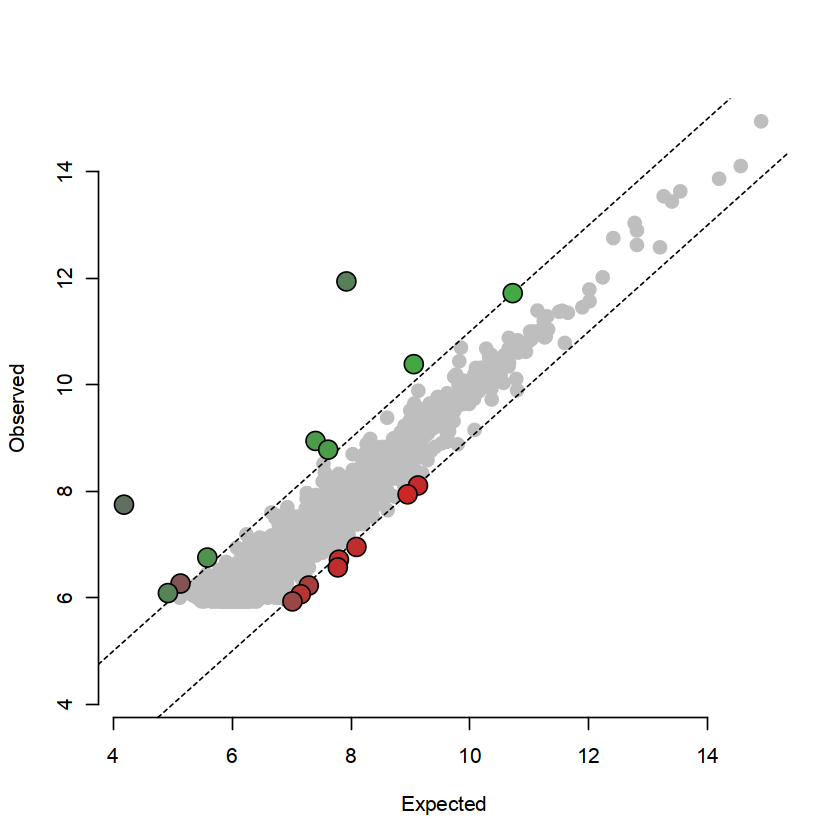

In [759]:
y = rowSums(us[analysis_genes,analyzed_pics]); x = rowSums(exp_us[analysis_genes,analyzed_pics]);

reg = 10
sum_t = rowSums(t_n[analysis_genes,]); sum_dc = rowSums(dc_n[analysis_genes,])
z = log2((1 + sum_dc) / (1 + sum_t))
lFC = log2((y+reg)/(x+reg))
grad = colorRampPalette(c("limegreen", "gray40", "firebrick3"))(101)
disp_genes = names(which(abs(lFC) > 1))
val = z[disp_genes]; zlim = max(abs(val))
val_n = round((val + zlim) / (2 * zlim) * 100) + 1
lx = log2(reg+x); ly = log2(reg+y)
lim = quantile(c(lx,ly), c(0,1))
plot(lx, ly, pch = 20, col = "gray", cex = 2,
        xlim = lim, ylim = lim, axes = F, xlab = "Expected", ylab = "Observed")
axis(1); axis(2);
abline(coef = c(1,1), lty = 2); abline(coef = c(-1,1), lty = 2)
points(lx[ disp_genes], ly[disp_genes], cex = 2, pch = 21, bg = grad[val_n[disp_genes]])


In [760]:
pic_joint = interaction(factor(parser_immune, levels = cell_order),
        factor(parser_epithelial, levels = cell_order)); names(pic_joint) = names(parser_epithelial)

pic_comb = interaction(pic_joint[good_pics], cell_stats[ good_pics, "Age"])
names(pic_comb) = good_pics
good_combs = names(which(table(pic_comb) > 30))
pic_comb = factor(pic_comb[analyzed_pics], levels = good_combs)

table(pic_comb)

pic_comb
 MHCII neut.Tumor cells.10w Neut Ptgs2+.Tumor cells.10w 
                         45                          74 
       TAN1.Tumor cells.10w        TAN2.Tumor cells.10w 
                         68                          55 
 MHCII neut.Tumor cells.12w Neut Ptgs2+.Tumor cells.12w 
                        141                         307 
  Young TAN.Tumor cells.12w        TAN1.Tumor cells.12w 
                         38                          85 
       TAN2.Tumor cells.12w 
                        122 

In [786]:
real_m = t(apply(ds[analysis_genes,analyzed_pics], 1, tapply, pic_comb[analyzed_pics], sum))
exp_m =  t(apply(exp_n[analysis_genes,analyzed_pics], 1, tapply, pic_comb[analyzed_pics], sum))
x2 = rowSums(((real_m - exp_m)^2 )/exp_m)
qvals = p.adjust(1 - pchisq(x2, df = ncol(real_m) - 1), "fdr")
z = log2(real_m / exp_m);
z[real_m==0] = NA

genes = setdiff(names(which(qvals < 0.001 & 
             apply(us[ names(qvals), analyzed_pics], 1, function(x) sort(x,T)[3]) > 2 & 
             rowSums(us[names(qvals),analyzed_pics]) > 100)), bad_genes)

length(genes)

[1] 73

In [788]:
data.frame(lFC, qvals) %>%
    rownames_to_column('gene') %>%
    arrange(qvals) %>%
    write_csv("final_figs/fig5/original_picseq.csv")

In [781]:
cat(genes, sep='\n')

Acod1
Aldoa
Arg1
Bglap3
Bri3
Brix1
Btf3
Btg2
Bub3
Car6
Ccl3
Ccl4
Ccl6
Cd300lf
Cd74
Cited4
Col1a1
Comt
Csf3r
Csn2
Csn3
Csrp1
Cstdc5
Cttn
Cxcl2
Cxcr2
Dcaf12
Eef1a1
Ero1a
Fcgbp
Fth1-ps
Ftl1
Gns
Gsk3a
H2-Ab1
H2-K1
H3f3b
Ifitm1
Il1b
Kras
Krt8
Lalba
Lgalsl
Lilrb4b
Lmnb1
Lst1
Mcl1
Mmp15
Mrpl40
Msrb1
Pdcl3
Pfn1
Pigr
Pip
Ppia
Prdx2-ps1
Ptma
Rb1cc1
Rbp1
Retnlg
S100a8
S100a9
Saa3
Scd1
Scgb1b27
Scgb2b27
Serinc3
Skap2
Slfn4
Sparc
Spp1
Srgn
Stk17b
Tfrc
Tm4sf1
Tnfaip3
Tpt1
Tyrobp
Vegfa
Wfdc17
Wfdc18


In [763]:
library(tglkmeans)

In [796]:
reg = 5              
z_reg = log2((real_m + reg) / (exp_m + reg))
IM = z_reg[genes, ]
IM = IM[rowSums(!is.na(IM)) > 0,]

tp_comp = factor(vecsplit(colnames(IM), "\\.", 3), levels = c("10w", "12w"))
t_comp = vecsplit(colnames(IM), "\\.", 2)
dc_comp = vecsplit(colnames(IM), "\\.", 1)
samp_ord = colnames(IM)[order(tp_comp, factor(t_comp, levels = cell_order), factor(dc_comp, levels = cell_order))]

tp_cols = c("lightskyblue1", "lightslateblue", "blue")
IM2 = IM[,samp_ord]
k = 4
data = as.data.frame(IM2)
#data$id = rownames(data)
data = data[,c(ncol(data), 1:(ncol(data) - 1))]
km <- TGL_kmeans_tidy(data, k=k, metric='euclid', verbose=TRUE, seed = 18)

will generate seeds
generating seeds
at seed 0
add new core from 60 to 0
at seed 1
done update min distance
seed range 46 64
picked up 24 dist was 0.304273
add new core from 24 to 1
at seed 2
done update min distance
seed range 37 55
picked up 58 dist was 0.695123
add new core from 58 to 2
at seed 3
done update min distance
seed range 28 46
picked up 22 dist was 0.179496
add new core from 22 to 3
reassign after init
iter 0
iter 1 changed 3
iter 1
iter 2 changed 2
iter 2
iter 3 changed 2
iter 3
iter 4 changed 1
iter 4
iter 5 changed 1
iter 5
iter 6 changed 2
iter 6
iter 7 changed 2
iter 7
iter 8 changed 1
iter 8
iter 9 changed 1
iter 9
iter 10 changed 1
iter 10
iter 11 changed 2
iter 11
iter 12 changed 1
iter 12
iter 13 changed 1
iter 13
iter 14 changed 0


zlim: -3.56271991877265<>3.56271991877265



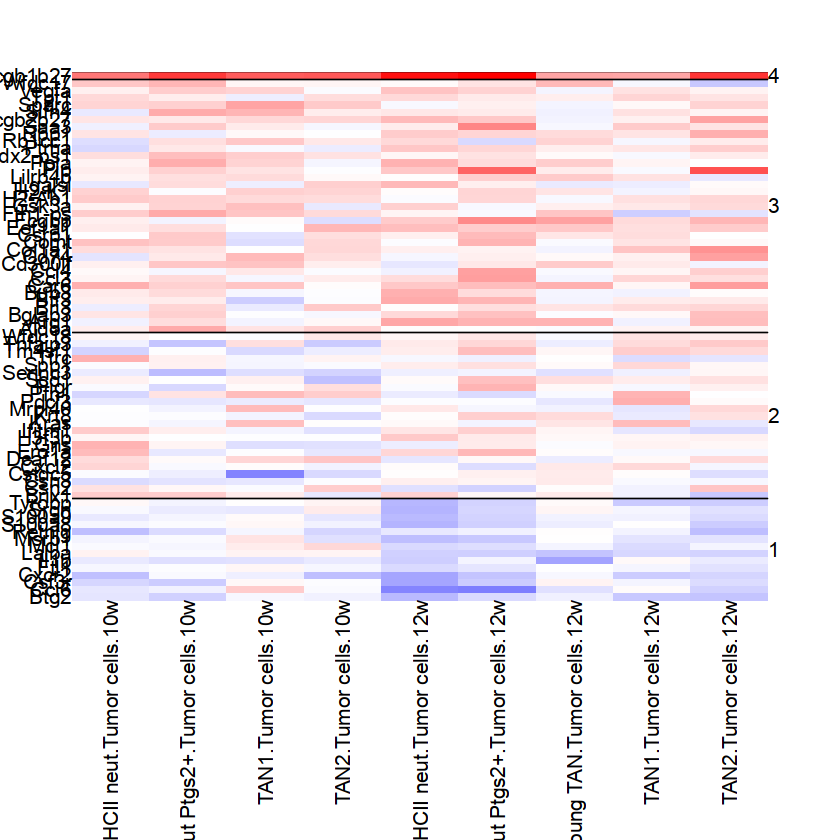

In [797]:
centers = as.matrix(km$centers[,-1]); rownames(centers) = seq_len(k)
x_min = apply(centers,1,min); x_max = apply(centers,1,max)
centers = centers[ order(abs(x_min) < x_max, max.col(centers)),]
km_clusts = as.numeric(factor(km$cluster$clust, levels = rownames(centers))); names(km_clusts) = rownames(data)

par(mar = c(10,3,3,3))
image.2(IM2, balance = T, annotate = "both", hct = km_clusts)

In [766]:
km_clusts %>% sort

Btg2     Ccl6    Csf3r     Csn3   Cstdc5    Cxcr2     Ftl1     Il1b 
       1        1        1        1        1        1        1        1 
   Lalba     Mcl1    Msrb1   Retnlg   S100a8   S100a9  Serinc3     Srgn 
       1        1        1        1        1        1        1        1 
  Stk17b   Tyrobp    Acod1    Aldoa  Cd300lf     Cd74   Cited4     Csn2 
       1        1        2        2        2        2        2        2 
   Cxcl2  Fth1-ps   H2-Ab1    H2-K1  Lilrb4b     Lst1     Pfn1    Slfn4 
       2        2        2        2        2        2        2        2 
   Sparc     Tfrc   Wfdc17 Scgb1b27     Arg1   Bglap3     Btf3     Car6 
       2        2        2        3        4        4        4        4 
    Ccl3     Ccl4     Comt    Csrp1   Eef1a1    Fcgbp    H3f3b   Ifitm1 
       4        4        4        4        4        4        4        4 
    Krt8   Lgalsl     Pigr      Pip     Ppia     Ptma     Rbp1     Saa3 
       4        4        4        4        4        4        4        4 
    Scd1 Scgb2b27     Spp1   Tm4sf1  Tnfaip3     Tpt1    Vegfa   Wfdc18 
       4        4        4        4        4        4        4        4

In [767]:
cat(names(which(lFC > 1)), sep="\n")

Arg1
Car6
Cpe
Fcgbp
Pip
Rsad2
Scgb1b27
Scgb2b27
Tesc


In [768]:
disp_genes

[1] "Arg1"     "Car6"     "Ccl6"     "Cd33"     "Cpe"      "Fcgbp"   
 [7] "Glipr2"   "Mir142hg" "Ncf2"     "Ncf2-rs"  "Pip"      "Rsad2"   
[13] "Scgb1b27" "Scgb2b27" "Slc15a3"  "Slfn2"    "Tesc"

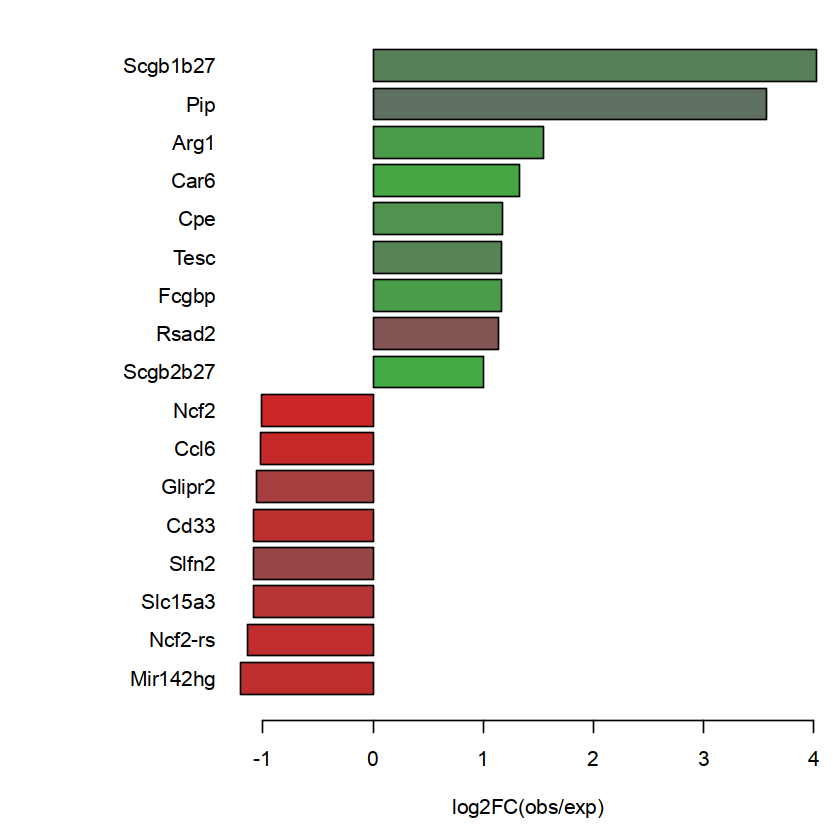

In [769]:
x = sort(lFC[ disp_genes])
par(mar = c(5,10,1,1))
barplot(x, horiz = T, xlab = "log2FC(obs/exp)", las=2, col = grad[val_n[names(x)]], axes=F)
axis(1)

In [616]:
gene_diffs = (us - exp_us) %>%
    t %>%
    as.data.frame %>%
    dplyr::select(analysis_genes) %>%
    cbind(sbid = db_mat@cell_metadata[colnames(us),'Seq.Batch.ID']) %>%
    filter(sbid != "SB010") %>%
    group_by(sbid) %>%
    summarise_all(sum) %>%
    column_to_rownames('sbid') %>%
    t

In [610]:
wilcox.test(c(1,2,3,4,5,6))$p.value

[1] 0.03125

In [617]:
gene_diffs = as.data.frame(gene_diffs)

In [618]:
gene_diffs$pval = apply(gene_diffs, 1, FUN = function(x){wilcox.test(x)$p.value})

In [620]:
gene_diffs %>% 
    arrange(pval)

,SB004,SB006,SB007,SB009,SB012,SB015,pval
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Acp5,-3.0659299,-4.4296720,-0.13092983,-7.8470169,-1.4493512,-8.5834087,0.03125
Afap1,1.3711449,3.6652052,2.68157083,1.8493254,3.2942957,3.1622549,0.03125
Ahr,0.5433053,5.3851715,4.39004074,5.4601968,0.7042925,9.3838807,0.03125
Aig1,-1.7386599,-5.9694862,-1.96871779,-0.3762333,-3.2616873,-0.2772719,0.03125
Anxa1,-6.6137901,-40.6498163,-59.09814316,-19.3600534,-26.5591672,-35.5563040,0.03125
Anxa3,4.9278587,4.1265748,5.84701070,7.8775687,20.0460796,50.9751843,0.03125
Appl2,-5.1998599,-2.4154132,-1.70389851,-1.8985406,-8.7922281,-4.4408389,0.03125
Arg1,14.9034829,1.3966500,7.36627589,35.0983696,149.1697679,119.3977875,0.03125
Arhgdib,-8.1621790,-14.8048557,-4.50452599,-16.7729349,-9.5576075,-23.0632153,0.03125


In [1168]:
zscore_vector <- sort(lFC, decreasing = TRUE)

gs_go_res_lfc = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")


preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [1176]:
gene_df = read.csv("final_figs/fig5/new_gene_full_sim/All_genedata_filt.csv", row.names = 1) %>% as.matrix %>% as.data.frame

In [1181]:
zscore_vector = gene_df$z_score
names(zscore_vector) = rownames(gene_df)
zscore_vector = sort(zscore_vector, decreasing = TRUE)

In [1182]:
gs_go_res_lfc = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")


preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [1183]:
gs_go_res_lfc %>% as.data.frame %>% filter(NES > 1.5)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0002707,GO:0002707,negative regulation of lymphocyte mediated immunity,18,0.7628148,2.115139,3.952731e-05,0.06650807,0.06390228,143,"tags=33%, list=3%, signal=32%",Arg1/Ahr/Tap1/Ceacam1/Crk/Lilrb4b
GO:0050906,GO:0050906,detection of stimulus involved in sensory perception,16,0.8400511,2.227139,5.135922e-05,0.06650807,0.06390228,115,"tags=31%, list=3%, signal=31%",Pip/Slc12a2/Pigr/Ano1/Car6
GO:0070231,GO:0070231,T cell apoptotic process,21,0.7157517,2.071480,1.395931e-04,0.09059602,0.08704646,47,"tags=10%, list=1%, signal=9%",Pip/Ceacam1
GO:0007606,GO:0007606,sensory perception of chemical stimulus,9,0.8857123,2.012922,1.802508e-04,0.09059602,0.08704646,115,"tags=33%, list=3%, signal=33%",Pip/Pigr/Car6
GO:0050909,GO:0050909,sensory perception of taste,6,0.9240653,1.859333,4.405568e-04,0.09826796,0.09441781,115,"tags=50%, list=3%, signal=49%",Pip/Pigr/Car6
GO:0002181,GO:0002181,cytoplasmic translation,32,0.6403982,2.060704,4.894449e-04,0.10208691,0.09808714,1085,"tags=59%, list=25%, signal=45%",Eif3a/Gspt1/Eif4a2/Eif4a1/Eif5/Dhx36/Eif2s2/Eif3m/Zc3h15/Ythdf2/Cpeb4/Eif3i/Eef2/Eif2s3x/Drg2/Dph3/Dhx9/Aars/Rwdd1
GO:0051606,GO:0051606,detection of stimulus,39,0.6356616,2.120272,5.100398e-04,0.10244244,0.09842874,115,"tags=18%, list=3%, signal=18%",Pip/Sox4/Slc12a2/Pigr/Yap1/Ano1/Car6
GO:0050913,GO:0050913,sensory perception of bitter taste,5,0.9392702,1.796887,5.829008e-04,0.11289540,0.10847215,115,"tags=60%, list=3%, signal=59%",Pip/Pigr/Car6
GO:0002716,GO:0002716,negative regulation of natural killer cell mediated immunity,7,0.8833811,1.887940,7.084691e-04,0.11300082,0.10857343,106,"tags=43%, list=2%, signal=42%",Tap1/Ceacam1/Crk


In [1229]:
gene_df = read.csv("final_figs/fig5/new_gene_full_sim/All_genedata_filt.csv", row.names = 1) %>% as.matrix %>% as.data.frame

In [1230]:
gene_df = gene_df %>%
    filter(full_adj_pval < 0.05)

In [1236]:
zscore_vector = gene_df$lfc
names(zscore_vector) = rownames(gene_df)
zscore_vector = sort(zscore_vector, decreasing = TRUE)

In [1237]:
gs_go_res_lfc = gseGO(zscore_vector,
                      ont = "BP",
                      OrgDb = 'org.Mm.eg.db',
                      keyType = "SYMBOL",
                      exponent = 1,
                      minGSSize = 5,
                      maxGSSize = 500,
                      eps = 0,
                      pvalueCutoff = 2,
                      pAdjustMethod = "BH",
                      verbose = TRUE,
                      seed = FALSE,
                      by = "fgsea")


preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [1238]:
gs_go_res_lfc %>% as.data.frame %>% filter(NES < -1.5)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0002237,GO:0002237,response to molecule of bacterial origin,7,-0.7225806,-2.250025,0.0009170053,0.2656343,0.2656343,51,"tags=100%, list=31%, signal=72%",S100a9/Cd14/Mgst1/Ltf/Ncf2/C5ar1
GO:0032496,GO:0032496,response to lipopolysaccharide,6,-0.7179487,-2.012623,0.0028862255,0.5091302,0.5091302,51,"tags=100%, list=31%, signal=71%",S100a9/Cd14/Mgst1/Ltf/Ncf2
GO:0009617,GO:0009617,response to bacterium,15,-0.4764571,-2.093534,0.0035355471,0.5197254,0.5197254,55,"tags=80%, list=34%, signal=58%",Il1b/S100a9/Cd14/Gpx1/Mgst1/Lrg1/Clec4d/Ltf/Trem1/Ncf2/C5ar1/Slfn2
GO:0099536,GO:0099536,synaptic signaling,8,-0.5844156,-1.912296,0.0091524050,0.8072421,0.8072421,73,"tags=100%, list=45%, signal=58%",Vdac1/Sorbs2/Arf1/Ly6e/Il1b/Tyrobp/Srgn
GO:0030036,GO:0030036,actin cytoskeleton organization,19,-0.3286713,-1.595226,0.0203693155,0.9382979,0.9382979,116,"tags=100%, list=72%, signal=32%",Myo18a/Amotl1/Csrp1/Map3k1/Cd2ap/Cnn3/Crk/Sorbs2/Krt8/Arf1/S100a9/Calr/Anxa1/Msrb1/Tyrobp/Zyx/Rhog/Ssh2
GO:0043065,GO:0043065,positive regulation of apoptotic process,15,-0.4013605,-1.763562,0.0219746521,0.9382979,0.9382979,104,"tags=73%, list=64%, signal=29%",Il1b/S100a9/Serinc3/Anxa1/Tyrobp/Dkkl1/Trem1/Ncf2/Stk17b/Btg1/Cxcr2
GO:0008610,GO:0008610,lipid biosynthetic process,9,-0.4967320,-1.720771,0.0229611612,0.9382979,0.9382979,87,"tags=100%, list=54%, signal=49%",Rbp1/Cd74/Ceacam1/Abcd3/Il1b/Anxa1/Dkkl1/Pnpla2
GO:0045861,GO:0045861,negative regulation of proteolysis,7,-0.5316970,-1.655638,0.0259630560,0.9382979,0.9382979,26,"tags=71%, list=16%, signal=63%",Gpx1/Ltf/Il1r2/Cstdc5/Plaur
GO:0007010,GO:0007010,cytoskeleton organization,21,-0.3333333,-1.696370,0.0274645889,0.9382979,0.9382979,116,"tags=100%, list=72%, signal=33%",Myo18a/Chmp4c/Amotl1/Csrp1/Map3k1/Cd2ap/Cnn3/Crk/Sorbs2/Krt8/Arf1/Gapdh/S100a9/Calr/Anxa1/Msrb1/Tyrobp/Zyx/Rhog/Ssh2


In [1239]:
gs_go_res_lfc %>% as.data.frame %>% filter(NES  > 1.5)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0002456,GO:0002456,T cell mediated immunity,5,0.8711077,1.939020,0.000401494,0.1770589,0.1770589,9,"tags=60%, list=6%, signal=58%",Rsad2/Ahr/Arg1
GO:0002709,GO:0002709,regulation of T cell mediated immunity,5,0.8711077,1.939020,0.000401494,0.1770589,0.1770589,9,"tags=60%, list=6%, signal=58%",Rsad2/Ahr/Arg1
GO:0002706,GO:0002706,regulation of lymphocyte mediated immunity,8,0.7566148,1.949832,0.001204691,0.2656343,0.2656343,9,"tags=50%, list=6%, signal=50%",Rsad2/Ahr/Tap1/Arg1
GO:0002703,GO:0002703,regulation of leukocyte mediated immunity,10,0.6326409,1.771272,0.006499939,0.8072421,0.8072421,9,"tags=40%, list=6%, signal=40%",Rsad2/Ahr/Tap1/Arg1
GO:0002822,GO:0002822,regulation of adaptive immune response based on somatic recombination of immune receptors built from immunoglobulin superfamily domains,7,0.7158981,1.761153,0.007568903,0.8072421,0.8072421,9,"tags=43%, list=6%, signal=42%",Rsad2/Ahr/Arg1
GO:0007600,GO:0007600,sensory perception,6,0.7395581,1.746369,0.008921772,0.8072421,0.8072421,6,"tags=33%, list=4%, signal=33%",Pip/Col1a1
GO:0001503,GO:0001503,ossification,9,0.6269088,1.686918,0.016766338,0.9382979,0.9382979,15,"tags=44%, list=9%, signal=43%",Rsad2/Ahr/Col1a1/Vegfa
GO:0006259,GO:0006259,DNA metabolic process,7,0.6764746,1.664169,0.017940287,0.9382979,0.9382979,40,"tags=86%, list=25%, signal=67%",Ahr/Vegfa/Anxa3/Marf1/Babam2/Isg20
GO:0002250,GO:0002250,adaptive immune response,14,0.5440534,1.674940,0.019885258,0.9382979,0.9382979,15,"tags=36%, list=9%, signal=35%",Rsad2/Ahr/Tap1/Arg1/Vegfa


# New DGE analysis

In [332]:
good_pics = read_lines('annotations/neutrophil_good_pics_final.txt')

In [333]:
db_mat@cell_metadata[good_pics, 'Cell_type'] %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       166        739 

In [334]:
db_mat@cell_metadata[rownames(mle_res), 'Cell_type'] %>% table

.
EPCAM-CD45 EPCAM-LY6G 
       175       1015 

In [65]:
good_pics = rownames(mle_res)

In [66]:
numis=500
pic_umis = read_large_umis("neutrophil_clean_pics", cells = good_pics)
ds = .downsamp(pic_umis, numis)
message("Retained ", ncol(ds), " PIC with >", numis, " UMI")

Retained 1190 PIC with >500 UMI



In [67]:
mature_immune_pops = c('MHCII neut', 'Neut Ptgs2+', 'Young TAN', 'TAN1', 'TAN2')

In [68]:
analyzed_pics = good_pics[db_mat@cell_metadata[good_pics,'Age'] %in% c('10w', '12w') & 
                          db_mat@cell_metadata[good_pics,'condition'] == 'tumor' &
                          parser_epithelial[good_pics] %in% c('Tumor cells') &
                          parser_immune[good_pics] %in% mature_immune_pops]

In [69]:
analyzed_singlets = sc_mat@cells[with(sc_mat@cell_metadata, Age %in% c('10w', '12w') & condition == 'tumor') &
                                 sin_cl@annots[sin_cl@mc[sc_mat@cells]] %in% c('Tumor cells', mature_immune_pops)]

In [70]:
length(analyzed_pics)

[1] 942

In [71]:
length(analyzed_singlets)

[1] 3886

In [72]:
analyzed_parser = parser_immune[analyzed_pics]

In [73]:
length(sin_mat@genes)

[1] 37023

In [74]:
length(rownames(pic_umis))

[1] 37508

In [75]:
bad_pat_genes = db_mat@genes[grepl("Rpl|Rps|Gm|Rik|Mcm[0-9]|Scm[0-9]", db_mat@genes)]

In [76]:
shared_mat_genes = intersect(names(which(rowSums(sin_mat@mat[,analyzed_singlets]) > 3)), 
                             names(which(rowSums(pic_umis[,analyzed_pics]) > 3)))

In [77]:
length(shared_mat_genes)

[1] 12778

In [358]:
simulate_npics = function(cell_name, n=50, return_separated=T, select_half=0){
    numis = sum(pic_umis[shared_mat_genes, cell_name])
    mc_a = mle_res[cell_name,'a_mc']
    mc_b = mle_res[cell_name,'b_mc']
    alpha = mle_res[cell_name,'alpha']
    numis_a = round(alpha * numis)
    numis_b = numis - numis_a
    cell_a_options = names(which(sin_cl@mc == mc_a))
    cell_b_options = names(which(sin_cl@mc == mc_b))
    if (select_half == 1){
        cell_a_options = cell_a_options[1:floor(length(cell_a_options) / 2)]
        cell_b_options = cell_b_options[1:floor(length(cell_b_options) / 2)]
    } else if (select_half == 2){
        cell_a_options = cell_a_options[ceiling(length(cell_a_options) / 2):length(cell_a_options)]
        cell_b_options = cell_b_options[ceiling(length(cell_b_options) / 2):length(cell_b_options)]
    }
    cells_a = sample(cell_a_options, size = n, replace = T)
    cells_b = sample(cell_b_options, size = n, replace = T)
    cell_sizes = colSums(sin_mat@mat[shared_mat_genes, c(cells_a, cells_b)])
    a_modifier = pmax(ceiling(numis_a / cell_sizes[cells_a]), 1)
    b_modifier = pmax(ceiling(numis_b / cell_sizes[cells_b]), 1)
    a_umis = .downsamp_var(sweep(sin_mat@mat[shared_mat_genes, cells_a], 2, a_modifier, "*"), rep(numis_a, n), replace=F)
    colnames(a_umis) = paste(cell_name, "sim", 1:n, "epi", sep="_")
    b_umis = .downsamp_var(sweep(sin_mat@mat[shared_mat_genes, cells_b], 2, b_modifier, "*"), rep(numis_b, n), replace=F)
    colnames(b_umis) = paste(cell_name, "sim", 1:n, "imm", sep="_")
    simpic_umis = a_umis + b_umis
    colnames(simpic_umis) = paste(cell_name, "sim", 1:n, sep="_")
    if (return_separated){
        return(cbind(a_umis, b_umis, simpic_umis))
    } else {
        return(simpic_umis)
    }
    
}

In [359]:
simpics_full = sapply(analyzed_pics, function(x){simulate_npics(x, n=1000, return_separated=T)}) %>% do.call(cbind, .)

In [360]:
scdb_add_mat("sims_1000_allgenes", simpics_full)

In [623]:
simpics_full = scdb_mat("sims_1000_allgenes")

In [624]:
nrow(simpics_full)

[1] 12778

In [625]:
ncol(simpics_full)

[1] 2826000

In [364]:
simpics_imm = simpics_full[,grepl("imm", colnames(simpics_full))]
simpics_epi = simpics_full[,grepl("epi", colnames(simpics_full))]
simpics = simpics_full[,!(grepl("imm", colnames(simpics_full)) | grepl("epi", colnames(simpics_full)))]

# Means analysis

In [78]:
all_mat = t(pic_umis[shared_mat_genes,analyzed_pics])
norm_num = median(rowSums(all_mat))
norm_mat = norm_num * all_mat / rowSums(all_mat)
message("Normalized by ", norm_num)
#lognorm_mat = log1p(10000 * all_mat / rowSums(all_mat))

Normalized by 968.5



In [366]:
norm_sim = norm_num * t(simpics) / colSums(simpics)
#lognorm_sim = log1p(10000 * t(simpics) / colSums(simpics))

In [367]:
norm_sim_epi = rep(mle_res[analyzed_pics,'alpha'], each=1000) * norm_num * t(simpics_epi) / colSums(simpics_epi)
norm_sim_imm = (1 - rep(mle_res[analyzed_pics,'alpha'], each=1000)) * norm_num * t(simpics_imm) / colSums(simpics_imm)

In [368]:
plot_scatter = function(df, fname=NA, pval_thresh=0.01){
    p = ggplot(df %>% arrange(desc(adj_pval)), aes(x=log(0.1 + Simulated_mean), y=log(0.1 + Observed_mean), 
                                                   color=color, size=size, label=label)) +
        geom_text_repel(max.overlaps = 1000, color='black') +
        geom_point() +
        scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) +
        scale_size_identity() +
        geom_abline(intercept = 0, slope=1, color='black', linetype='solid')
    if (!is.na(fname)){
        l = get_legend(p)
        p = plot_grid(p + theme(legend.position="none"))

        ggsave(fname, plot = p)
        ggsave(paste0(fname, "_legend.pdf"), plot = l)
    }
}

In [369]:
plot_volcano = function(df, fname=NA, pval_thresh=0.01, lfc_thresh=0.5){
    p = ggplot(df %>% arrange(desc(adj_pval)), aes(x=lfc, y=-log10(adj_pval), color=color, size=size, label=label)) +
        geom_point(show.legend=F) +
        geom_text_repel(max.overlaps = 1000, color='black') +
        scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) +
        scale_size_identity() +
        geom_hline(yintercept = -log10(pval_thresh), linetype='longdash', color='gray') +
        geom_vline(xintercept = c(-lfc_thresh, lfc_thresh), linetype='longdash', color='gray')
    if (!is.na(fname)){
        l = get_legend(p)
        p = plot_grid(p + theme(legend.position="none"))

        ggsave(fname, plot = p)
        ggsave(paste0(fname, "_legend.pdf"), plot = l)
    }
}

In [370]:
per_gene_plots = function(gene, dirname, focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                          pval, lfc){
    plot_df = data.frame(mean_norm_expr=c(focus_sim_means[gene,], mean(focus_norm_mat[,gene])),
                         source=c(rep("Simulated", 1000), "Observed"))
    gene_mean = mean(plot_df[plot_df$source == "Simulated","mean_norm_expr"])
    gene_sd = sd(plot_df[plot_df$source == "Simulated","mean_norm_expr"])
    
    # Distribution with SDs
    ggplot(plot_df, aes(x=mean_norm_expr)) +
        geom_density(data=plot_df[plot_df$source == "Simulated",]) +
        geom_vline(xintercept = gene_mean, color='blue', linetype='longdash') +
        geom_vline(xintercept = c(gene_mean + gene_sd, gene_mean - gene_sd), color='steelblue', linetype='longdash') +
        geom_vline(xintercept = c(gene_mean + (2 * gene_sd), gene_mean - (2 * gene_sd)), color='gray', linetype='longdash') +
        geom_vline(xintercept = plot_df[plot_df$source == "Observed","mean_norm_expr"], color='red') +
        geom_point(data=plot_df[plot_df$source == "Observed",], aes(y=0), color='red', size=3) +
        labs(title=gene, subtitle = paste0("adj_pval", pval, " ; lfc = ", round(lfc, 2))) +
        theme(plot.title = element_text(size=16, hjust=0.5, face='bold'), plot.subtitle = element_text(size=12, hjust=0.5))
    ggsave(paste0(dirname, "/", gene, "_dist.pdf"))
    
    # Plot of all means
    ggplot(plot_df, aes(x=1, y=mean_norm_expr)) +
        geom_boxplot(data=. %>% filter(source == "Simulated")) +
        geom_jitter(width=0.1, aes(color=source, shape=source, size=source)) +
        scale_shape_manual(values = c(19, 1)) +
        scale_size_manual(values = c(5, 3)) +
        labs(title=gene, subtitle = paste0("adj_pval", pval, " ; lfc = ", round(lfc, 2))) +
        theme(plot.title = element_text(size=16, hjust=0.5, face='bold'), plot.subtitle = element_text(size=12, hjust=0.5),
              axis.title.x = element_blank(), axis.ticks.x = element_blank(), axis.text.x = element_blank())
        #scale_x_discrete(limits=c("Simulated", "Observed"))
    ggsave(paste0(dirname, "/", gene, "_means.pdf"), width=5, height=15)
    
    # Violin plot
    #plot_df = data.frame(LogNorm_expression=log1p(c(focus_norm_sim[,gene], focus_norm_mat[,gene])),
    #                     Source=factor(c(rep("Simulated", nrow(focus_norm_sim)), rep("Observed", nrow(focus_norm_mat))),
    #                                   levels = c("Simulated", "Observed")))
    #ggplot(plot_df, aes(x=Source, fill=Source, y=LogNorm_expression)) +
    #    geom_violin(draw_quantiles = c(0.25, 0.5, 0.75)) +
    #    labs(title=gene) +
    #    theme(plot.title = element_text(size=20, hjust=0.5, face='bold'))
    #ggsave(paste0(dirname, "/", gene, "_violin.pdf"))
    
    # Bar plot
    bar_df = data.frame(source=factor(c(rep("Simulated", 2), "Observed"), levels=c("Simulated", "Observed")),
                        cell=c("Epithelial", "Neutrophil", "PIC"),
                        expression=c(epi_means[gene], imm_means[gene], mean(focus_norm_mat[,gene])))

    ggplot(bar_df, aes(x=source, y=expression, fill=cell)) +
        geom_bar(stat = 'identity', position = 'stack', color='black') +
        labs(title=gene, subtitle = paste0("adj_pval", pval, " ; lfc = ", round(lfc, 2))) +
        theme(plot.title = element_text(size=16, hjust=0.5, face='bold'), plot.subtitle = element_text(size=12, hjust=0.5))
    ggsave(paste0(dirname, "/", gene, "_barplot.pdf"))

}

In [371]:
p = ggplot(data.frame(x=1, y=1, color=seq(0,1,length.out = 1000)), aes(x=x, y=y, color=color)) +
    geom_tile() +
    scale_color_gradient2(low = 'chartreuse3', high='brown3', mid = 'gray10', na.value = 'gray50', midpoint = 0.5) 
l = get_legend(p)

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”


In [372]:
ggsave(filename = "final_figs/fig5/color_legend.pdf", plot=l)

Saving 6.67 x 6.67 in image


In [373]:
mature_immune_pops = c('MHCII neut', 'Neut Ptgs2+', 'Young TAN', 'TAN1', 'TAN2')

In [716]:
# CURRENT VERSION 04/08/2024

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
per_gene = F
min_topn = 1
n_topn = 10
min_total=50
reg = 1e-3

for (pop_name in c('All', mature_immune_pops, 'All_mature', 'TANs_Ptgs2', "TANs")){
    message("===================================================")
    message(pop_name)
    if (pop_name == "All"){
        focus_singlets = sin_mat@mat[,analyzed_singlets]
        is_focus = parser_immune[analyzed_pics] %in% mature_immune_pops
    } else if (pop_name == "All_mature"){
        focus_singlets = sin_mat@mat[,analyzed_singlets][,sin_cl@annots[sin_cl@mc[analyzed_singlets]] %in% c('Tumor cells', 
                                                                                                             'MHCII neut',
                                                                                                             'Neut Ptgs2+', 
                                                                                                             'TAN1', 'TAN2')]
        is_focus = parser_immune[analyzed_pics] %in% c('MHCII neut', 'Neut Ptgs2+', 'TAN1', 'TAN2')
    } else if (pop_name == "TANs_Ptgs2"){
        focus_singlets = sin_mat@mat[,analyzed_singlets][,sin_cl@annots[sin_cl@mc[analyzed_singlets]] %in% c('Tumor cells', 
                                                                                                             'Neut Ptgs2+', 
                                                                                                             'TAN1', 'TAN2')]
        is_focus = parser_immune[analyzed_pics] %in% c('Neut Ptgs2+', 'TAN1', 'TAN2')
    } else if (pop_name == "TANs"){
        focus_singlets = sin_mat@mat[,analyzed_singlets][,sin_cl@annots[sin_cl@mc[analyzed_singlets]] %in% c('Tumor cells', 
                                                                                                             'TAN1', 'TAN2')]
        is_focus = parser_immune[analyzed_pics] %in% c('TAN1', 'TAN2')
    } else {
        focus_singlets = sin_mat@mat[,analyzed_singlets][,sin_cl@annots[sin_cl@mc[analyzed_singlets]] %in% c('Tumor cells', 
                                                                                                             pop_name)]
        is_focus = parser_immune[analyzed_pics] == pop_name
    }
    focus_mat = pic_umis[,analyzed_pics][,is_focus]
    focus_norm_mat = norm_mat[is_focus,]
    focus_means = colMeans(focus_norm_mat)
    
    # Simulation means    
    sim_means_file = paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_sim_means.csv")
    if (file.exists(sim_means_file)) {
        message("---Simulation means file found - loading...")
        focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
    } else {
        message("---Calculating simulation means...")
        all_focus_sim = norm_sim[rep(is_focus, each=n_sims),]
        print(all(unique(str_split_i(rownames(all_focus_sim), "_s", 1)) == names(which(is_focus))))
        focus_sim_means = sapply(1:n_sims, function(n){colMeans(all_focus_sim[seq(n, nrow(all_focus_sim), n_sims),])}) 
        message("---Saving...")
        write.csv(focus_sim_means, sim_means_file)
    }
    
    # Gene data
    print(length(shared_mat_genes))
    if (pop_name == "All"){
        analysis_genes = shared_mat_genes[(rowSums(focus_mat[shared_mat_genes,] > min_topn) >= n_topn) | 
                                          (rowSums(focus_singlets[shared_mat_genes,] > min_topn) >= n_topn)]
        print(length(analysis_genes))
        analysis_genes = analysis_genes[rowSums(focus_mat[analysis_genes,]) > min_total]
        print(length(analysis_genes))
        analysis_genes = analysis_genes %>% setdiff(bad_genes)
        print(length(analysis_genes))
    }
    
    print(length(analysis_genes))
    gene_data_file = paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_genedata_filt.csv")
    if (file.exists(gene_data_file)) {
        message("---Gene data file found - loading...")
        gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
    } else {
        message("---Calculating z-score pvals, lfcs etc...")
        focus_sim_sds = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            return(sd(sim_vals))
        })
        focus_z_scores = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
            return(z_score)
        })
        focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

        focus_sim_meanofmeans = rowMeans(focus_sim_means)
        focus_lfcs = log2((reg + focus_means[analysis_genes]) / (reg + focus_sim_meanofmeans[analysis_genes]))
        epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        epi_imm_ratio = epi_means / (epi_means + imm_means)

        gene_df = data.frame(Observed_mean = focus_means[analysis_genes],
                             Simulated_mean = focus_sim_meanofmeans[analysis_genes],
                             Sim_SD = focus_sim_sds,
                             z_scores = focus_z_scores,
                             full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                             lfc=focus_lfcs,
                             epi_imm_ratio=epi_imm_ratio)
        gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
        write.csv(gene_df, gene_data_file)
    }
    
    # Plots
    message("---Creating plots...")    
    plot_df = gene_df %>% 
        mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
               size=ifelse(adj_pval < pval_thresh, 3, 1),
               label=ifelse(adj_pval < pval_thresh, rownames(.), ""))
    
    plot_scatter(plot_df, pval_thresh = pval_thresh, 
                 fname=paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_scatter.pdf"))
    plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
                 fname=paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_volcano.pdf"))
    if (per_gene){
        dir.create(paste0("final_figs/fig5/new_gene_full_sim/", pop_name))
        sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
        for (gene in sig_genes){
            gene = unlist(str_split(gene, "\\."))[1]
            message(paste0("    ", gene))
            per_gene_plots(gene, pop_name, focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                           ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                                  ' < 1e-5', 
                                  paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                           gene_df[gene, 'lfc'])
        }
    }
}


All

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 6214
[1] 4762
[1] 4421
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 30 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

MHCII neut

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

Neut Ptgs2+

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

Young TAN

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

TAN1

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

TAN2

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

All_mature

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 20 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

TANs_Ptgs2

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 15 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

TANs

---Calculating simulation means...



[1] TRUE


---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


In [ ]:
# EXISTING ANALYSIS PRE-26.02

n_sims=1000
pval_thresh=0.05
lfc_thresh=0.5
per_gene = F
min_topn = 1
n_topn = 10
min_total=50
reg = 1e-3

for (pop_name in c('All', mature_immune_pops, 'All_mature', 'TANs_Ptgs2')){
    message("===================================================")
    message(pop_name)
    if (pop_name == "All"){
        focus_singlets = sin_mat@mat[,analyzed_singlets]
        is_focus = parser_immune[analyzed_pics] %in% mature_immune_pops
    } else if (pop_name == "All_mature"){
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[analyzed_singlets]] %in% c('Tumor cells', 'MHCII neut', 
                                                                                         'Neut Ptgs2+', 'TAN1', 'TAN2')]
        is_focus = parser_immune[analyzed_pics] %in% c('MHCII neut', 'Neut Ptgs2+', 'TAN1', 'TAN2')
    } else if (pop_name == "TANs_Ptgs2"){
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[analyzed_singlets]] %in% c('Tumor cells', 
                           ()                                                              'Neut Ptgs2+', 'TAN1', 'TAN2')]
        is_focus = parser_immune[analyzed_pics] %in% c('Neut Ptgs2+', 'TAN1', 'TAN2')
    } else {
        focus_singlets = sin_mat@mat[,sin_cl@annots[sin_cl@mc[analyzed_singlets]] %in% c('Tumor cells', pop_name)]
        is_focus = parser_immune[analyzed_pics] == pop_name
    }
    focus_mat = pic_umis[,analyzed_pics][,is_focus]
    focus_norm_mat = norm_mat[is_focus,]
    focus_means = colMeans(focus_norm_mat)
    
    # Simulation means    
    sim_means_file = paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_sim_means.csv")
    if (file.exists(sim_means_file)) {
        message("---Simulation means file found - loading...")
        focus_sim_means = as.matrix(read.csv(sim_means_file, row.names = 1))
    } else {
        message("---Calculating simulation means...")
        all_focus_sim = norm_sim[rep(is_focus, each=n_sims),]
        focus_sim_means = sapply(1:n_sims, function(n){colMeans(all_focus_sim[seq(n, nrow(all_focus_sim), n_sims),])}) 
        message("---Saving...")
        write.csv(focus_sim_means, sim_means_file)
    }
    
    # Gene data
    print(length(shared_mat_genes))
    if (pop_name == "All"){
        analysis_genes = shared_mat_genes[(rowSums(focus_mat[shared_mat_genes,] > min_topn) >= n_topn) | 
                                          (rowSums(focus_singlets[shared_mat_genes,] > min_topn) >= n_topn)]
        print(length(analysis_genes))
        analysis_genes = analysis_genes[rowSums(focus_mat[analysis_genes,]) > min_total]
        print(length(analysis_genes))
        analysis_genes = analysis_genes %>% setdiff(bad_genes)
        print(length(analysis_genes))
    }
    
    print(length(analysis_genes))
    gene_data_file = paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_genedata_filt.csv")
    if (file.exists(gene_data_file)) {
        message("---Gene data file found - loading...")
        gene_df = read.csv(gene_data_file, row.names = 1) %>% as.matrix %>% as.data.frame
    } else {
        message("---Calculating z-score pvals, lfcs etc...")
        focus_sim_sds = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            return(sd(sim_vals))
        })
        focus_z_scores = sapply(analysis_genes, function(gene){
            sim_vals = focus_sim_means[gene,]
            z_score = (focus_means[gene] - mean(sim_vals)) / sd(sim_vals)
            return(z_score)
        })
        focus_z_pvals = 2 * pnorm(abs(focus_z_scores), lower.tail = F)

        focus_sim_meanofmeans = rowMeans(focus_sim_means)
        focus_lfcs = log2((reg + focus_means[analysis_genes]) / (reg + focus_sim_meanofmeans[analysis_genes]))
        epi_means = colMeans(norm_sim_epi[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        imm_means = colMeans(norm_sim_imm[1:n_sims + rep((which(is_focus) - 1) * n_sims, each=n_sims),analysis_genes])
        epi_imm_ratio = epi_means / (epi_means + imm_means)

        gene_df = data.frame(Observed_mean = focus_means[analysis_genes],
                             Simulated_mean = focus_sim_meanofmeans[analysis_genes],
                             Sim_SD = focus_sim_sds,
                             z_scores = focus_z_scores,
                             full_adj_pval=p.adjust(focus_z_pvals %>% replace_na(1), method='fdr'),
                             lfc=focus_lfcs,
                             epi_imm_ratio=epi_imm_ratio)
        gene_df$adj_pval = ifelse(gene_df$full_adj_pval < 1e-5, 1e-5, gene_df$full_adj_pval)
        write.csv(gene_df, gene_data_file)
    }
    
    # Plots
    message("---Creating plots...")    
    plot_df = gene_df %>% 
        mutate(color=ifelse(adj_pval < pval_thresh, epi_imm_ratio, NA),
               size=ifelse(adj_pval < pval_thresh, 3, 1),
               label=ifelse(adj_pval < pval_thresh, rownames(.), ""))
    
    plot_scatter(plot_df, pval_thresh = pval_thresh, 
                 fname=paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_scatter.pdf"))
    plot_volcano(plot_df, pval_thresh = pval_thresh, lfc_thresh = lfc_thresh,
                 fname=paste0("final_figs/fig5/new_gene_full_sim/", pop_name, "_volcano.pdf"))
    if (per_gene){
        dir.create(paste0("final_figs/fig5/new_gene_full_sim/", pop_name))
        sig_genes = rownames(gene_df)[gene_df$adj_pval < pval_thresh]
        for (gene in sig_genes){
            gene = unlist(str_split(gene, "\\."))[1]
            message(paste0("    ", gene))
            per_gene_plots(gene, pop_name, focus_sim_means, focus_norm_sim, focus_norm_mat, epi_means, imm_means,
                           ifelse(gene_df[gene, 'adj_pval'] == 1e-5, 
                                  ' < 1e-5', 
                                  paste0(" = ", round(gene_df[gene, 'adj_pval'], 5))), 
                           gene_df[gene, 'lfc'])
        }
    }
}


All

---Simulation means file found - loading...



[1] 12778
[1] 6214
[1] 4762
[1] 4421
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 30 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

MHCII neut

---Calculating simulation means...

---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

Neut Ptgs2+

---Calculating simulation means...

---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

Young TAN

---Calculating simulation means...

---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

TAN1

---Calculating simulation means...

---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

TAN2

---Calculating simulation means...

---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

All_mature

---Calculating simulation means...

---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...

---Creating plots...

Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Warning message:
“ggrepel: 20 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Saving 6.67 x 6.67 in image
Warning message in get_plot_component(plot, "guide-box"):
“Multiple components found; returning the first one. To return all, use `return_all = TRUE`.”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image

TANs_Ptgs2

---Calculating simulation means...

---Saving...



[1] 12778
[1] 4421


---Calculating z-score pvals, lfcs etc...



In [380]:
focus_singlets[shared_mat_genes, ]

ERROR: Error in focus_singlets[shared_mat_genes, ]: incorrect number of dimensions


In [671]:
sin_cl = scdb_mc("merged_neutrophil_epithelial_mc"); sin_mat = scdb_mat("merged_neutrophil_epithelial_mat")
lfp = log2(sin_cl@mc_fp)
message("Loaded a metacell object of ", length(sin_cl@mc), " singlets. Total of ", length(table(sin_cl@mc)), " metacells.")

message("Loading PIC dataset:")
db_mat = scdb_mat("neutrophil_clean_pics")


Loaded a metacell object of 13516 singlets. Total of 317 metacells.

Loading PIC dataset:



In [672]:
sin_sce = scm_export_mat_to_sce("merged_neutrophil_epithelial_mat", add_log_counts = F, scale_to = 10000)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.7 GiB”


In [673]:
writeH5AD(sin_sce, "/mc_disk2/data/h5ads/breast/immune_epithelial.h5ad")

ℹ Using the 'counts' assay as the X matrix



In [674]:
pics_sce = scm_export_mat_to_sce("neutrophil_clean_pics", add_log_counts = F, scale_to = 10000)

In [675]:
writeH5AD(pics_sce, "/mc_disk2/data/h5ads/breast/neutrophil_clean_pics.h5ad")

ℹ Using the 'counts' assay as the X matrix



In [676]:
data.frame(mc=sin_cl@mc, annot=sin_cl@annots[sin_cl@mc], color=sin_cl@colors[sin_cl@mc]) %>%
    arrange(mc) %>%
    write.csv("annotations/mc_for_pypic.csv")

In [622]:
sims_sce = scm_export_mat_to_sce("sims_1000_allgenes", add_log_counts = F, scale_to = 10000)

ERROR: Error in normarg_assays(assays, as.null.if.no.assay = TRUE): no slot of name "mat" for this object of class "dgCMatrix"


In [675]:
writeH5AD(sims_sce, "/mc_disk2/data/h5ads/breast/neutrophil_clean_pics_1000sims.h5ad")

ℹ Using the 'counts' assay as the X matrix

